In [21]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, BatchNormalization, UpSampling2D, Dense, MaxPool2D, LeakyReLU, Reshape, Dropout, Flatten, GaussianNoise, Embedding, multiply, concatenate
from tensorflow.keras.losses import BinaryCrossentropy, SparseCategoricalCrossentropy, CategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
import tensorflow.keras.backend as K
import tensorflow as tf

import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
import time

In [ ]:
def normalize_img(img):
    return (img - 127.5)/127.5

def unnormalize_img(img):
    return (img + 1.) / 2.

60 samples in class 0, (./CUB_200_2011/CUB_200_2011/images-cleaned/001.Black_footed_Albatross)


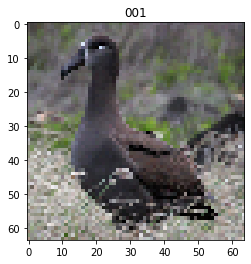

60 samples in class 1, (./CUB_200_2011/CUB_200_2011/images-cleaned/002.Laysan_Albatross)
58 samples in class 1, (./CUB_200_2011/CUB_200_2011/images-cleaned/003.Sooty_Albatross)
60 samples in class 1, (./CUB_200_2011/CUB_200_2011/images-cleaned/004.Groove_billed_Ani)
44 samples in class 1, (./CUB_200_2011/CUB_200_2011/images-cleaned/005.Crested_Auklet)
41 samples in class 1, (./CUB_200_2011/CUB_200_2011/images-cleaned/006.Least_Auklet)
53 samples in class 1, (./CUB_200_2011/CUB_200_2011/images-cleaned/007.Parakeet_Auklet)
48 samples in class 1, (./CUB_200_2011/CUB_200_2011/images-cleaned/008.Rhinoceros_Auklet)
59 samples in class 1, (./CUB_200_2011/CUB_200_2011/images-cleaned/009.Brewer_Blackbird)
60 samples in class 1, (./CUB_200_2011/CUB_200_2011/images-cleaned/010.Red_winged_Blackbird)
60 samples in class 1, (./CUB_200_2011/CUB_200_2011/images-cleaned/011.Rusty_Blackbird)
56 samples in class 1, (./CUB_200_2011/CUB_200_2011/images-cleaned/012.Yellow_headed_Blackbird)


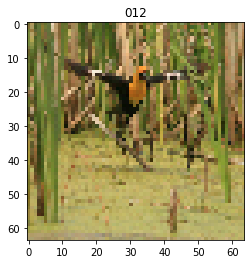

60 samples in class 2, (./CUB_200_2011/CUB_200_2011/images-cleaned/013.Bobolink)
60 samples in class 2, (./CUB_200_2011/CUB_200_2011/images-cleaned/014.Indigo_Bunting)


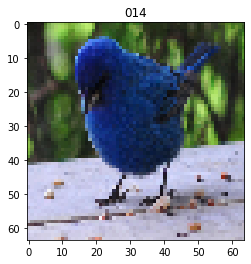

58 samples in class 3, (./CUB_200_2011/CUB_200_2011/images-cleaned/015.Lazuli_Bunting)
58 samples in class 3, (./CUB_200_2011/CUB_200_2011/images-cleaned/016.Painted_Bunting)
57 samples in class 3, (./CUB_200_2011/CUB_200_2011/images-cleaned/017.Cardinal)


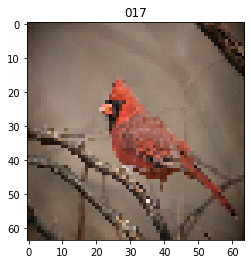

45 samples in class 4, (./CUB_200_2011/CUB_200_2011/images-cleaned/018.Spotted_Catbird)
59 samples in class 4, (./CUB_200_2011/CUB_200_2011/images-cleaned/019.Gray_Catbird)
59 samples in class 4, (./CUB_200_2011/CUB_200_2011/images-cleaned/020.Yellow_breasted_Chat)
60 samples in class 4, (./CUB_200_2011/CUB_200_2011/images-cleaned/021.Eastern_Towhee)
56 samples in class 4, (./CUB_200_2011/CUB_200_2011/images-cleaned/022.Chuck_will_Widow)
59 samples in class 4, (./CUB_200_2011/CUB_200_2011/images-cleaned/023.Brandt_Cormorant)
52 samples in class 4, (./CUB_200_2011/CUB_200_2011/images-cleaned/024.Red_faced_Cormorant)
60 samples in class 4, (./CUB_200_2011/CUB_200_2011/images-cleaned/025.Pelagic_Cormorant)
60 samples in class 4, (./CUB_200_2011/CUB_200_2011/images-cleaned/026.Bronzed_Cowbird)
60 samples in class 4, (./CUB_200_2011/CUB_200_2011/images-cleaned/027.Shiny_Cowbird)
59 samples in class 4, (./CUB_200_2011/CUB_200_2011/images-cleaned/028.Brown_Creeper)
60 samples in class 4, (./C

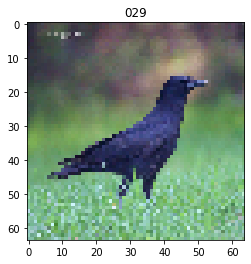

60 samples in class 5, (./CUB_200_2011/CUB_200_2011/images-cleaned/030.Fish_Crow)
60 samples in class 5, (./CUB_200_2011/CUB_200_2011/images-cleaned/031.Black_billed_Cuckoo)
53 samples in class 5, (./CUB_200_2011/CUB_200_2011/images-cleaned/032.Mangrove_Cuckoo)
59 samples in class 5, (./CUB_200_2011/CUB_200_2011/images-cleaned/033.Yellow_billed_Cuckoo)
59 samples in class 5, (./CUB_200_2011/CUB_200_2011/images-cleaned/034.Gray_crowned_Rosy_Finch)
60 samples in class 5, (./CUB_200_2011/CUB_200_2011/images-cleaned/035.Purple_Finch)
60 samples in class 5, (./CUB_200_2011/CUB_200_2011/images-cleaned/036.Northern_Flicker)
59 samples in class 5, (./CUB_200_2011/CUB_200_2011/images-cleaned/037.Acadian_Flycatcher)
60 samples in class 5, (./CUB_200_2011/CUB_200_2011/images-cleaned/038.Great_Crested_Flycatcher)
59 samples in class 5, (./CUB_200_2011/CUB_200_2011/images-cleaned/039.Least_Flycatcher)
60 samples in class 5, (./CUB_200_2011/CUB_200_2011/images-cleaned/040.Olive_sided_Flycatcher)
60 

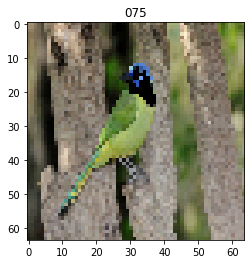

60 samples in class 6, (./CUB_200_2011/CUB_200_2011/images-cleaned/076.Dark_eyed_Junco)
60 samples in class 6, (./CUB_200_2011/CUB_200_2011/images-cleaned/077.Tropical_Kingbird)
59 samples in class 6, (./CUB_200_2011/CUB_200_2011/images-cleaned/078.Gray_Kingbird)
60 samples in class 6, (./CUB_200_2011/CUB_200_2011/images-cleaned/079.Belted_Kingfisher)
60 samples in class 6, (./CUB_200_2011/CUB_200_2011/images-cleaned/080.Green_Kingfisher)
60 samples in class 6, (./CUB_200_2011/CUB_200_2011/images-cleaned/081.Pied_Kingfisher)
60 samples in class 6, (./CUB_200_2011/CUB_200_2011/images-cleaned/082.Ringed_Kingfisher)
60 samples in class 6, (./CUB_200_2011/CUB_200_2011/images-cleaned/083.White_breasted_Kingfisher)
53 samples in class 6, (./CUB_200_2011/CUB_200_2011/images-cleaned/084.Red_legged_Kittiwake)
60 samples in class 6, (./CUB_200_2011/CUB_200_2011/images-cleaned/085.Horned_Lark)
60 samples in class 6, (./CUB_200_2011/CUB_200_2011/images-cleaned/086.Pacific_Loon)
60 samples in class

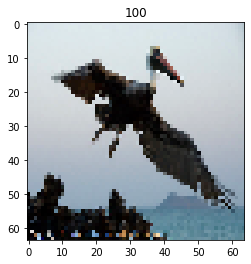

50 samples in class 7, (./CUB_200_2011/CUB_200_2011/images-cleaned/101.White_Pelican)
60 samples in class 7, (./CUB_200_2011/CUB_200_2011/images-cleaned/102.Western_Wood_Pewee)
60 samples in class 7, (./CUB_200_2011/CUB_200_2011/images-cleaned/103.Sayornis)
60 samples in class 7, (./CUB_200_2011/CUB_200_2011/images-cleaned/104.American_Pipit)
49 samples in class 7, (./CUB_200_2011/CUB_200_2011/images-cleaned/105.Whip_poor_Will)
60 samples in class 7, (./CUB_200_2011/CUB_200_2011/images-cleaned/106.Horned_Puffin)
59 samples in class 7, (./CUB_200_2011/CUB_200_2011/images-cleaned/107.Common_Raven)
60 samples in class 7, (./CUB_200_2011/CUB_200_2011/images-cleaned/108.White_necked_Raven)
60 samples in class 7, (./CUB_200_2011/CUB_200_2011/images-cleaned/109.American_Redstart)


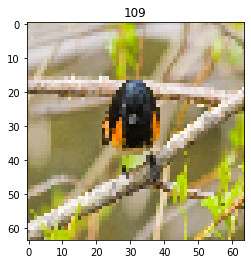

60 samples in class 8, (./CUB_200_2011/CUB_200_2011/images-cleaned/110.Geococcyx)
60 samples in class 8, (./CUB_200_2011/CUB_200_2011/images-cleaned/111.Loggerhead_Shrike)
60 samples in class 8, (./CUB_200_2011/CUB_200_2011/images-cleaned/112.Great_Grey_Shrike)
50 samples in class 8, (./CUB_200_2011/CUB_200_2011/images-cleaned/113.Baird_Sparrow)
60 samples in class 8, (./CUB_200_2011/CUB_200_2011/images-cleaned/114.Black_throated_Sparrow)
59 samples in class 8, (./CUB_200_2011/CUB_200_2011/images-cleaned/115.Brewer_Sparrow)
60 samples in class 8, (./CUB_200_2011/CUB_200_2011/images-cleaned/116.Chipping_Sparrow)
59 samples in class 8, (./CUB_200_2011/CUB_200_2011/images-cleaned/117.Clay_colored_Sparrow)
60 samples in class 8, (./CUB_200_2011/CUB_200_2011/images-cleaned/118.House_Sparrow)
59 samples in class 8, (./CUB_200_2011/CUB_200_2011/images-cleaned/119.Field_Sparrow)
60 samples in class 8, (./CUB_200_2011/CUB_200_2011/images-cleaned/120.Fox_Sparrow)


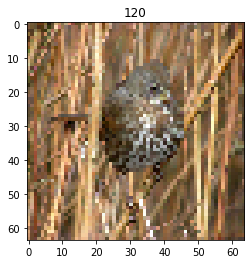

60 samples in class 9, (./CUB_200_2011/CUB_200_2011/images-cleaned/121.Grasshopper_Sparrow)
60 samples in class 9, (./CUB_200_2011/CUB_200_2011/images-cleaned/122.Harris_Sparrow)
60 samples in class 9, (./CUB_200_2011/CUB_200_2011/images-cleaned/123.Henslow_Sparrow)
59 samples in class 9, (./CUB_200_2011/CUB_200_2011/images-cleaned/124.Le_Conte_Sparrow)
59 samples in class 9, (./CUB_200_2011/CUB_200_2011/images-cleaned/125.Lincoln_Sparrow)
59 samples in class 9, (./CUB_200_2011/CUB_200_2011/images-cleaned/126.Nelson_Sharp_tailed_Sparrow)
60 samples in class 9, (./CUB_200_2011/CUB_200_2011/images-cleaned/127.Savannah_Sparrow)
60 samples in class 9, (./CUB_200_2011/CUB_200_2011/images-cleaned/128.Seaside_Sparrow)
60 samples in class 9, (./CUB_200_2011/CUB_200_2011/images-cleaned/129.Song_Sparrow)
60 samples in class 9, (./CUB_200_2011/CUB_200_2011/images-cleaned/130.Tree_Sparrow)
60 samples in class 9, (./CUB_200_2011/CUB_200_2011/images-cleaned/131.Vesper_Sparrow)
60 samples in class 9,

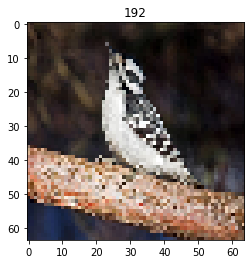

In [127]:
img_classes = ['001', '012', '014', '017', '029', '075', '100', '109', '120', '192']

train_imgs = []
train_classes = []
class_index = 0
import os
for root, dirs, files in os.walk("./CUB_200_2011/CUB_200_2011/images-cleaned/", topdown=False):
    print(f'{len(files)} samples in class {class_index}, ({root})')
    if any(x in root for x in img_classes):
        for name in files:
            train_imgs.append(cv2.cvtColor(cv2.imread(os.path.join(root, name)), cv2.COLOR_RGB2BGR))
            train_classes.append(class_index)
        plt.imshow(train_imgs[-1])
        plt.title(img_classes[class_index])
        plt.show()
        class_index += 1
    if class_index >= 10:
        break
train_imgs = np.array(train_imgs)
train_imgs = (train_imgs - 127.5)/127.5
train_classes = np.array(train_classes, dtype=np.float32)

In [ ]:
plt.hist(train_classes, bins=10)
plt.show()
assert(len(train_imgs) == len(train_classes))

In [ ]:
def make_generator_model(shape):
    
    noise_in = Input(shape=shape)
    label_in = Input(shape=(1,))
    label_embedding = Embedding(10, 100)(label_in)
    
    input_layer = multiply([noise_in, label_embedding])
    
    x = Dense(16*16*64*2)(input_layer)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    
    x = Reshape((16, 16, 128))(x)
    
    x = GaussianNoise(1)(x)
    x = Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    
    x = GaussianNoise(1)(x)
    x = Conv2DTranspose(32, (3, 3), strides=(1, 1), padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    
    x = GaussianNoise(1)(x)
    x = Conv2DTranspose(16, (3, 3), strides=(2, 2), padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    
    x = GaussianNoise(1)(x)
    x = Conv2DTranspose(16, (3, 3), strides=(1, 1), padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    
    x = Conv2DTranspose(3, (3, 3), strides=(1, 1), padding='same', use_bias=False, activation='tanh')(x)
    
    return Model([noise_in, label_in], x)

In [ ]:
generator = make_generator_model((100,))
generator.summary()

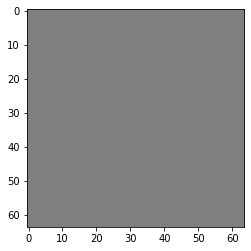

In [8]:
generator = make_generator_model((100,))

noise = np.random.normal(0, 1, 100)
label = 1

generated_image = generator.predict( [np.array([noise]), np.array([label])] )[0]
plt.imshow(unnormalize_img(generated_image), )

In [9]:
def make_discriminator_model():
    input_layer = Input((64, 64, 3))
    x = GaussianNoise(1)(input_layer)
    
    x = Conv2D(64, (3, 3), strides=(2, 2), padding='same')(input_layer)
    x = LeakyReLU()(x)
    x = Dropout(0.3)(x)
    x = Conv2D(64, (3, 3), strides=(1, 1), padding='same')(x)
    x = LeakyReLU()(x)
    x = Dropout(0.3)(x)

    
    x = Conv2D(128, (3, 3), strides=(2, 2), padding='same')(x)
    x = LeakyReLU()(x)
    x = Dropout(0.3)(x)
    x = Conv2D(128, (3, 3), strides=(1, 1), padding='same')(x)
    x = LeakyReLU()(x)
    x = Dropout(0.3)(x)
    
    
    x = Flatten()(x)
    x = Dense(64)(x)
    x = LeakyReLU()(x)
    x = Dropout(0.3)(x)
    
    valid = Dense(1, activation='sigmoid')(x)
    label = Dense(10, activation='softmax')(x)
    
    return Model(input_layer, [valid, label])

In [10]:
discriminator = make_discriminator_model()
discriminator.summary()
valid, label = discriminator.predict(np.array([generated_image]))
print(valid)
print(label)

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 64, 64, 3)]  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 32, 32, 64)   1792        input_5[0][0]                    
__________________________________________________________________________________________________
leaky_re_lu_10 (LeakyReLU)      (None, 32, 32, 64)   0           conv2d[0][0]                     
__________________________________________________________________________________________________
dropout (Dropout)               (None, 32, 32, 64)   0           leaky_re_lu_10[0][0]             
____________________________________________________________________________________________

In [11]:
cross_entropy = BinaryCrossentropy(from_logits=False)

def discriminator_valid_loss(real_output, fake_output, flip):
    
    if flip:
        fake_labels = tf.random.uniform(fake_output.shape, minval=0.9, maxval=1.0)
        real_labels = tf.random.uniform(real_output.shape, minval=0.0, maxval=0.1)
    else:
        real_labels = tf.random.uniform(real_output.shape, minval=0.9, maxval=1.0)
        fake_labels = tf.random.uniform(fake_output.shape, minval=0.0, maxval=0.1)

        
    real_loss = cross_entropy(real_labels, real_output)
    fake_loss = cross_entropy(fake_labels, fake_output)
    total_loss = real_loss + fake_loss
    return total_loss, real_loss, fake_loss

In [12]:
sparse_cce = SparseCategoricalCrossentropy(from_logits=False)
cce = CategoricalCrossentropy(from_logits=False)

'''
real_classes, fake_classes: List of class ints (0-200)
real_output, fake_output: List of softmax vectors
'''
def discriminator_class_loss_real(real_output, real_classes):
    return sparse_cce(real_classes, real_output) 

def discriminator_class_loss_fake(fake_output, fake_classes):
    return sparse_cce(fake_classes, fake_output)

In [13]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [14]:
generator_optimizer = Adam(1e-4)
discriminator_optimizer = Adam(1e-4)

In [89]:
@tf.function
def train_step(images, labels, flip, warmup):
    noise = tf.random.truncated_normal([32, 100])
    sampled_labels = tf.cast(tf.random.uniform([32, 1], minval=0, maxval=10, dtype='int32'), 'float32')
    sampled_labels += tf.random.truncated_normal(sampled_labels.shape, mean=0.0, stddev=0.05)
    labels = tf.reshape(labels, (labels.shape[0], 1))
    labels += tf.random.truncated_normal(sampled_labels.shape, mean=0.0, stddev=0.05)
    
    
    gen_losses = []
    disc_losses = []
    disc_real_losses = []
    disc_fake_losses = []
    disc_class_real_losses = []
    disc_class_fake_losses = []

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator([noise, sampled_labels], training=True)
        
        real_output, real_label_output = discriminator(images, training=True)
        fake_output, fake_label_output = discriminator(generated_images, training=True)
        
        gen_loss = generator_loss(fake_output)
        disc_loss, disc_real_loss, disc_fake_loss = discriminator_valid_loss(real_output, fake_output, flip)
        disc_class_real_loss = discriminator_class_loss_real(real_label_output, labels)
        disc_class_fake_loss = discriminator_class_loss_fake(fake_label_output, sampled_labels)
        disc_loss += ((2.0 - warmup) * disc_class_real_loss + warmup * disc_class_fake_loss)
        
        gen_losses.append(K.mean(gen_loss))
        disc_losses.append(K.mean(disc_loss))
        disc_real_losses.append(K.mean(disc_real_loss))
        disc_fake_losses.append(K.mean(disc_fake_loss))
        disc_class_real_losses.append(K.mean(disc_class_real_loss))
        disc_class_fake_losses.append(K.mean(disc_class_fake_loss))
    
    
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)

    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return (gen_losses, disc_losses, disc_real_losses, disc_fake_losses, disc_class_real_losses, disc_class_fake_losses)

In [85]:
def train(train_imgs, train_labels, epochs, warmup):
    gen_loss_all = []
    disc_loss_all = []
    disc_loss_real_all = []
    disc_loss_fake_all = []
    disc_class_loss_real_all = []
    disc_class_loss_fake_all = []
    warmup_step = 1./5000.
    
    num_samples = len(train_imgs)
    batch_counter = 0
    
    for epoch in range(epochs):
        start = time.time()
        
        gen_loss_epoch = [1, 0]
        disc_loss_epoch = [1, 0]
        disc_loss_real_epoch = [1, 0]
        disc_loss_fake_epoch = [1, 0]
        disc_class_loss_real_epoch = [1, 0]
        disc_class_loss_fake_epoch = [1, 0]
        
        seed = np.random.randint(0, 10000)
        np.random.seed(seed)
        np.random.shuffle(train_imgs)
        np.random.seed(seed)
        np.random.shuffle(train_labels)
        
        for idx, i in enumerate(range(0, num_samples - 32, 32)):
            
            gen_loss_batch, disc_loss_batch, disc_loss_real_batch, disc_loss_fake_batch, disc_class_loss_real_batch, disc_class_loss_fake_batch = train_step(train_imgs[i:(i+32)], train_labels[i:(i+32)], batch_counter % 20 == 0, tf.constant(warmup, dtype='float32'))

            gen_loss_epoch[0] += 1
            disc_loss_epoch[0] += 1
            disc_loss_real_epoch[0] += 1
            disc_loss_fake_epoch[0] += 1
            disc_class_loss_real_epoch[0] += 1
            disc_class_loss_fake_epoch[0] += 1
            gen_loss_epoch[1] += np.mean(gen_loss_batch)
            disc_loss_epoch[1] += np.mean(disc_loss_batch)
            disc_loss_real_epoch[1] += np.mean(disc_loss_real_batch)
            disc_loss_fake_epoch[1] += np.mean(disc_loss_fake_batch)
            disc_class_loss_real_epoch[1] += np.mean(disc_class_loss_real_batch)
            disc_class_loss_fake_epoch[1] += np.mean(disc_class_loss_fake_batch)
            
            batch_counter += 1
            if warmup < 1:
                warmup += warmup_step
            
        print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))
        print(f'Gen loss: {gen_loss_epoch[1]/gen_loss_epoch[0]}, Disc loss: {disc_loss_epoch[1]/disc_loss_epoch[0]}, Disc valid real loss: {disc_loss_real_epoch[1]/disc_loss_real_epoch[0]}, Disc valid fake loss: {disc_loss_fake_epoch[1]/disc_loss_fake_epoch[0]}, Disc class real loss: {disc_class_loss_real_epoch[1]/disc_class_loss_real_epoch[0]}, Disc class fake loss: {disc_class_loss_fake_epoch[1]/disc_class_loss_fake_epoch[0]}')
        
        gen_loss_all.append(gen_loss_epoch[1]/gen_loss_epoch[0])
        disc_loss_all.append(disc_loss_epoch[1]/disc_loss_epoch[0])
        disc_loss_real_all.append(disc_loss_real_epoch[1]/disc_loss_real_epoch[0])
        disc_loss_fake_all.append(disc_loss_fake_epoch[1]/disc_loss_fake_epoch[0])
        disc_class_loss_real_all.append(disc_class_loss_real_epoch[1]/disc_class_loss_real_epoch[0])
        disc_class_loss_fake_all.append(disc_class_loss_fake_epoch[1]/disc_class_loss_fake_epoch[0])
        
    
    return (gen_loss_all, disc_loss_all, disc_loss_real_all, disc_loss_fake_all, disc_class_loss_real_all, disc_class_loss_fake_all)
    


In [75]:
def long_train(starting_checkpoint=0, num_checkpoints=0, checkpoint_interval=0, g_hist=None, d_hist=None, d_real_hist=None, d_fake_hist=None, d_class_real_hist=None, d_class_fake_hist=None, noise=None, label=None, save_files=False, warmup=0.):
    
#     if noise is None:
#         noise = np.random.normal(0, 1, 100)

    if g_hist is None:
        g_hist = []
    
    if d_hist is None:
        d_hist = []
        
    if d_real_hist is None:
        d_real_hist = []
    
    if d_fake_hist is None:
        d_fake_hist = []
        
    if d_class_real_hist is None:
        d_class_real_hist = []
        
    if d_class_fake_hist is None:
        d_class_fake_hist = []

    for i in range(starting_checkpoint, starting_checkpoint + num_checkpoints):
        print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')
        print('')
        print(f'Starting checkpoint {i}')
        print('')
        print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')
        
        gen_temp, disc_temp, disc_real_temp, disc_fake_temp, disc_class_real_temp, disc_class_fake_temp = train(train_imgs, train_classes, checkpoint_interval, warmup)
        g_hist += gen_temp
        d_hist += disc_temp
        d_real_hist += disc_real_temp
        d_fake_hist += disc_fake_temp
        d_class_real_hist += disc_class_real_temp
        d_class_fake_hist += disc_class_fake_temp
        generated_image = generator.predict( [np.array([noise]), np.array([label])])[0]
        plt.imshow(unnormalize_img(generated_image))
        if save_files:
            plt.savefig('./results/prog-imgs/bird-gan-conditional-10-samples/' + str((i+1)*checkpoint_interval) + '.png')
        plt.show()
        if save_files:
            generator.save_weights('./results/weights/bird-gan-conditional-10-samples/gen_weights_conditional_10_samples' + str((i+1)*checkpoint_interval) + '.h5')
            discriminator.save_weights('./results/weights/bird-gan-conditional-10-samples/disc_weights_conditional_10_samples' + str((i+1)*checkpoint_interval) + '.h5')
    
    return starting_checkpoint + num_checkpoints, totalepochs

In [87]:
discriminator = make_discriminator_model()
generator = make_generator_model((100,))
generator_optimizer = Adam(1e-4)
discriminator_optimizer = Adam(1e-4)

In [88]:
# To get passed into training function and get modified
# Run cell when starting from scratch
gen_loss_hist = []
disc_loss_hist = []
disc_loss_real_hist = []
disc_loss_fake_hist = []
disc_class_loss_real_hist = []
disc_class_loss_fake_hist = []
noise100 = np.random.normal(0, 1, 100)
label = 1
next_starting_checkpoint = 0
totalepochs = 0
warmup = 0.

1
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 0

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.




If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.



Time for epoch 1 is 4.984694242477417 sec
Gen loss: 0.8137539468313518, Disc loss: 5.63650211535002, Disc valid real loss: 0.7268506759091428, Disc valid fake loss: 0.548143678589871, Disc class real loss: 2.1807416740216707, Disc class fake loss: 2.191499195600811
Time for epoch 2 is 0.7625508308410645 sec
Gen loss: 0.9326699627073187, Disc loss: 5.366820636548494, Disc valid real loss: 0.5917214343422338, Disc valid fake loss: 0.5000586917525843, Disc class real loss: 2.137440480683979, Disc class fake loss: 2.1674938578354683
Time for epoch 3 is 0.7328934669494629 sec
Gen loss: 1.2731708664643138, Disc loss: 5.087850395001863, Disc valid real loss: 0.49336859740709005, Disc valid fake loss: 0.3919731802061984, Disc class real loss: 2.100781804636905, Disc class fake loss: 2.2059123516082764
Time for epoch 4 is 0.6949636936187744 sec
Gen loss: 1.6186008704336066, Disc loss: 4.866096722452264, Disc valid real loss: 0.41915423775974076, Disc valid fake loss: 0.3518708630612022, Disc cl

Time for epoch 32 is 0.687354564666748 sec
Gen loss: 1.8597057555851184, Disc loss: 3.7232814462561357, Disc valid real loss: 0.4335881361835881, Disc valid fake loss: 0.38128320637502167, Disc class real loss: 1.3664906840575368, Disc class fake loss: 2.914510463413439
Time for epoch 33 is 0.6830794811248779 sec
Gen loss: 1.794762002794366, Disc loss: 3.7034945237009147, Disc valid real loss: 0.4346093613850443, Disc valid fake loss: 0.3715786079042836, Disc class real loss: 1.3603222683856362, Disc class fake loss: 2.871817990353233
Time for epoch 34 is 0.6878230571746826 sec
Gen loss: 1.7248413060840808, Disc loss: 3.6388772412350305, Disc valid real loss: 0.4341616834464826, Disc valid fake loss: 0.4013590310749255, Disc class real loss: 1.3131896257400513, Disc class fake loss: 2.78251724494131
Time for epoch 35 is 0.6849710941314697 sec
Gen loss: 1.6957355047527112, Disc loss: 3.6958847547832288, Disc valid real loss: 0.4765930818883996, Disc valid fake loss: 0.3828815111988469, 

Time for epoch 63 is 0.6880233287811279 sec
Gen loss: 1.4760663760335822, Disc loss: 3.2648354831494784, Disc valid real loss: 0.4678861467461837, Disc valid fake loss: 0.38811257952137995, Disc class real loss: 1.037508117525201, Disc class fake loss: 2.5223005319896497
Time for epoch 64 is 0.6871600151062012 sec
Gen loss: 1.6496577639328807, Disc loss: 3.2428181045933773, Disc valid real loss: 0.46519278068291514, Disc valid fake loss: 0.3762748304166292, Disc class real loss: 1.034989385228408, Disc class fake loss: 2.485676363894814
Time for epoch 65 is 0.6875941753387451 sec
Gen loss: 1.8948330251794112, Disc loss: 3.2297581371508146, Disc valid real loss: 0.45236145508916753, Disc valid fake loss: 0.35617789704548686, Disc class real loss: 1.0299922227859497, Disc class fake loss: 2.5858717717622457
Time for epoch 66 is 0.6882815361022949 sec
Gen loss: 1.6332664489746094, Disc loss: 3.205954827760395, Disc valid real loss: 0.43022191367651286, Disc valid fake loss: 0.362579648431

Time for epoch 94 is 0.7731349468231201 sec
Gen loss: 1.6607415864342137, Disc loss: 3.262707785556191, Disc valid real loss: 0.4462857669905612, Disc valid fake loss: 0.39714453565446955, Disc class real loss: 0.929166925580878, Disc class fake loss: 2.595857632787604
Time for epoch 95 is 0.7602357864379883 sec
Gen loss: 1.5614183074549626, Disc loss: 3.3266802085073373, Disc valid real loss: 0.46075158527022914, Disc valid fake loss: 0.40521812909527827, Disc class real loss: 0.9437710172251651, Disc class fake loss: 2.6291479311491313
Time for epoch 96 is 0.7072968482971191 sec
Gen loss: 1.456282797612642, Disc loss: 3.3097782636943616, Disc valid real loss: 0.4974201023578644, Disc valid fake loss: 0.40832724226148503, Disc class real loss: 0.9072378340520357, Disc class fake loss: 2.622579624778346
Time for epoch 97 is 0.711693286895752 sec
Gen loss: 1.3884227401331852, Disc loss: 3.2757111474087366, Disc valid real loss: 0.48425464567385224, Disc valid fake loss: 0.42763710649389

Time for epoch 125 is 0.7129065990447998 sec
Gen loss: 1.7422747235549123, Disc loss: 3.271574986608405, Disc valid real loss: 0.4439466250570197, Disc valid fake loss: 0.3525926023721695, Disc class real loss: 0.8851459559641386, Disc class fake loss: 2.4579801182997856
Time for epoch 126 is 0.7098090648651123 sec
Gen loss: 1.733247537361948, Disc loss: 3.242195493296573, Disc valid real loss: 0.36616306555898565, Disc valid fake loss: 0.382842408983331, Disc class real loss: 0.8985445405307569, Disc class fake loss: 2.4396141077342786
Time for epoch 127 is 0.7112486362457275 sec
Gen loss: 1.7927093945051495, Disc loss: 3.2387379219657495, Disc valid real loss: 0.3996584525233821, Disc valid fake loss: 0.34693747131448044, Disc class real loss: 0.8918006231910304, Disc class fake loss: 2.447838118201808
Time for epoch 128 is 0.7032630443572998 sec
Gen loss: 1.7942705656352795, Disc loss: 3.2383044518922506, Disc valid real loss: 0.42667008544269364, Disc valid fake loss: 0.36793558691

Time for epoch 156 is 0.7013123035430908 sec
Gen loss: 1.6587081143730564, Disc loss: 3.398720804013704, Disc valid real loss: 0.42516389018610906, Disc valid fake loss: 0.3828451821678563, Disc class real loss: 0.8752565666248924, Disc class fake loss: 2.3764225809197677
Time for epoch 157 is 0.691847562789917 sec
Gen loss: 1.7417353203422146, Disc loss: 3.411132210179379, Disc valid real loss: 0.43319348990917206, Disc valid fake loss: 0.3622237122372577, Disc class real loss: 0.8916334070657429, Disc class fake loss: 2.369391315861752
Time for epoch 158 is 0.6965451240539551 sec
Gen loss: 1.8317866513603611, Disc loss: 3.3122775680140446, Disc valid real loss: 0.4205361071385835, Disc valid fake loss: 0.3577703935535331, Disc class real loss: 0.8605584282624094, Disc class fake loss: 2.294477650993749
Time for epoch 159 is 0.6995623111724854 sec
Gen loss: 1.8580473912389655, Disc loss: 3.289597436001426, Disc valid real loss: 0.4123366051598599, Disc valid fake loss: 0.3418349858961

Time for epoch 187 is 0.6995024681091309 sec
Gen loss: 1.4882751515037136, Disc loss: 3.510255085794549, Disc valid real loss: 0.4576112769151989, Disc valid fake loss: 0.3869751550649342, Disc class real loss: 0.8298347686466417, Disc class fake loss: 2.3284149671855725
Time for epoch 188 is 0.7014045715332031 sec
Gen loss: 1.6772042324668484, Disc loss: 3.593759687323319, Disc valid real loss: 0.4991985528092635, Disc valid fake loss: 0.37668963325651067, Disc class real loss: 0.8385230240068937, Disc class fake loss: 2.3807129859924316
Time for epoch 189 is 0.7079932689666748 sec
Gen loss: 1.8750062051572298, Disc loss: 3.495731366308112, Disc valid real loss: 0.4404190425810061, Disc valid fake loss: 0.36756320611426707, Disc class real loss: 0.8259882362265336, Disc class fake loss: 2.3526175147608708
Time for epoch 190 is 0.6977074146270752 sec
Gen loss: 1.9469881873381765, Disc loss: 3.2869896637765983, Disc valid real loss: 0.31526247451179906, Disc valid fake loss: 0.259298697

Time for epoch 218 is 0.7700462341308594 sec
Gen loss: 1.80061716155002, Disc loss: 3.5129932227887606, Disc valid real loss: 0.38176760704893814, Disc valid fake loss: 0.35666599085456446, Disc class real loss: 0.8331681897765711, Disc class fake loss: 2.248695875469007
Time for epoch 219 is 0.7309837341308594 sec
Gen loss: 1.9851946517040855, Disc loss: 3.5406621129889237, Disc valid real loss: 0.42767342454508733, Disc valid fake loss: 0.3363434162579085, Disc class real loss: 0.8268966768917284, Disc class fake loss: 2.2545805479350842
Time for epoch 220 is 0.7226748466491699 sec
Gen loss: 1.9244888393502486, Disc loss: 3.304748158705862, Disc valid real loss: 0.2866238888941313, Disc valid fake loss: 0.2600402894772981, Disc class real loss: 0.8096296975487157, Disc class fake loss: 2.2509992624583997
Time for epoch 221 is 0.700181245803833 sec
Gen loss: 1.8782021748392206, Disc loss: 3.567952093325163, Disc valid real loss: 0.3983506779921682, Disc valid fake loss: 0.353684655929

Time for epoch 249 is 0.6990625858306885 sec
Gen loss: 1.820306985001815, Disc loss: 3.7351413651516565, Disc valid real loss: 0.41552164758506577, Disc valid fake loss: 0.3675154016206139, Disc class real loss: 0.812403214605231, Disc class fake loss: 2.296274335760819
Time for epoch 250 is 0.701826810836792 sec
Gen loss: 1.9661051348636025, Disc loss: 3.5771775245666504, Disc valid real loss: 0.28908838410126536, Disc valid fake loss: 0.2532909975240105, Disc class real loss: 0.838901516638304, Disc class fake loss: 2.3498765041953638
Time for epoch 251 is 0.6970071792602539 sec
Gen loss: 1.9636101722717285, Disc loss: 3.646609582399067, Disc valid real loss: 0.37444724377832916, Disc valid fake loss: 0.3627643467564332, Disc class real loss: 0.8219166586273595, Disc class fake loss: 2.2254652475055896
Time for epoch 252 is 0.698692798614502 sec
Gen loss: 1.8158529808646755, Disc loss: 3.6971876997696724, Disc valid real loss: 0.421456410696632, Disc valid fake loss: 0.35561092276322

Time for epoch 280 is 0.6989319324493408 sec
Gen loss: 1.8368257158680965, Disc loss: 3.5338256108133415, Disc valid real loss: 0.2828705475518578, Disc valid fake loss: 0.2614877898442118, Disc class real loss: 0.8081109523773193, Disc class fake loss: 2.181081671463816
Time for epoch 281 is 0.7009537220001221 sec
Gen loss: 1.7607883026725368, Disc loss: 3.7478583611940084, Disc valid real loss: 0.42374756932258606, Disc valid fake loss: 0.36382229077188594, Disc class real loss: 0.8158619497951708, Disc class fake loss: 2.144160873011539
Time for epoch 282 is 0.7016723155975342 sec
Gen loss: 1.6792999443254972, Disc loss: 3.870270277324476, Disc valid real loss: 0.4443246126174927, Disc valid fake loss: 0.37104157240767227, Disc class real loss: 0.8546206135498849, Disc class fake loss: 2.2000143402501156
Time for epoch 283 is 0.7251601219177246 sec
Gen loss: 1.619157257832979, Disc loss: 3.929797285481503, Disc valid real loss: 0.4489212538066663, Disc valid fake loss: 0.39166516693

Time for epoch 311 is 0.729395866394043 sec
Gen loss: 1.537160089141444, Disc loss: 3.8646929264068604, Disc valid real loss: 0.46032515952461645, Disc valid fake loss: 0.4011717438697815, Disc class real loss: 0.8105476718199881, Disc class fake loss: 2.1923719456321313
Time for epoch 312 is 0.7022130489349365 sec
Gen loss: 1.5056999984540438, Disc loss: 3.965167434591996, Disc valid real loss: 0.4707697724041186, Disc valid fake loss: 0.40815804506603043, Disc class real loss: 0.8221136174703899, Disc class fake loss: 2.263837588460822
Time for epoch 313 is 0.7037687301635742 sec
Gen loss: 1.671976553766351, Disc loss: 3.8426337242126465, Disc valid real loss: 0.4436793719467364, Disc valid fake loss: 0.3875887205726222, Disc class real loss: 0.8030703099150407, Disc class fake loss: 2.2080142498016357
Time for epoch 314 is 0.7051827907562256 sec
Gen loss: 1.884269074389809, Disc loss: 3.7510493554567037, Disc valid real loss: 0.3798098995497352, Disc valid fake loss: 0.3666767038797

Time for epoch 342 is 0.7093210220336914 sec
Gen loss: 1.7647908549559743, Disc loss: 3.7553138732910156, Disc valid real loss: 0.4223777855697431, Disc valid fake loss: 0.3692093789577484, Disc class real loss: 0.7839159808660808, Disc class fake loss: 2.179531536604229
Time for epoch 343 is 0.7079761028289795 sec
Gen loss: 1.6678987804212069, Disc loss: 3.8377763472105326, Disc valid real loss: 0.43010745707311127, Disc valid fake loss: 0.370213132155569, Disc class real loss: 0.7867173991705242, Disc class fake loss: 2.250445604324341
Time for epoch 344 is 0.7118005752563477 sec
Gen loss: 1.601634050670423, Disc loss: 3.8283378074043677, Disc valid real loss: 0.47051752711597244, Disc valid fake loss: 0.37829979626755966, Disc class real loss: 0.8097653577202245, Disc class fake loss: 2.1694831597177604
Time for epoch 345 is 0.7074103355407715 sec
Gen loss: 1.6566632609618337, Disc loss: 3.9051764764283834, Disc valid real loss: 0.42122972952692134, Disc valid fake loss: 0.436252005

Time for epoch 373 is 0.6989490985870361 sec
Gen loss: 1.9285442703648616, Disc loss: 3.698045153366892, Disc valid real loss: 0.37755383472693593, Disc valid fake loss: 0.3361740959318061, Disc class real loss: 0.7791789676013746, Disc class fake loss: 2.204853108054713
Time for epoch 374 is 0.7056105136871338 sec
Gen loss: 1.9546828646408885, Disc loss: 3.693405452527498, Disc valid real loss: 0.3827404073978725, Disc valid fake loss: 0.34943724070724685, Disc class real loss: 0.7878659555786535, Disc class fake loss: 2.1730847358703613
Time for epoch 375 is 0.7038545608520508 sec
Gen loss: 1.9861413491399664, Disc loss: 3.6733796220076713, Disc valid real loss: 0.4065308068927966, Disc valid fake loss: 0.34361778748662847, Disc class real loss: 0.7879445741051122, Disc class fake loss: 2.1350169809241044
Time for epoch 376 is 0.704148530960083 sec
Gen loss: 2.0184847304695532, Disc loss: 3.7401467749946997, Disc valid real loss: 0.4038736247702649, Disc valid fake loss: 0.3330169155

Time for epoch 404 is 0.7002296447753906 sec
Gen loss: 1.6248177980121814, Disc loss: 3.750392901270013, Disc valid real loss: 0.4347197335017355, Disc valid fake loss: 0.37347930983493205, Disc class real loss: 0.7739423262445551, Disc class fake loss: 2.167972627438997
Time for epoch 405 is 0.7025468349456787 sec
Gen loss: 1.3556648367329647, Disc loss: 3.901020125338906, Disc valid real loss: 0.4571584070983686, Disc valid fake loss: 0.416871135172091, Disc class real loss: 0.8206035902625636, Disc class fake loss: 2.206109787288465
Time for epoch 406 is 0.7240662574768066 sec
Gen loss: 1.8574992418289185, Disc loss: 3.798659236807572, Disc valid real loss: 0.4260459432476445, Disc valid fake loss: 0.3633303673643815, Disc class real loss: 0.770890662544652, Disc class fake loss: 2.238098771948563
Time for epoch 407 is 0.7034664154052734 sec
Gen loss: 1.984319153584932, Disc loss: 3.779041440863358, Disc valid real loss: 0.4235076512161054, Disc valid fake loss: 0.34170047860396535,

Time for epoch 435 is 0.7054054737091064 sec
Gen loss: 1.623950864139356, Disc loss: 3.8717418344397294, Disc valid real loss: 0.455554408462424, Disc valid fake loss: 0.3967420294096595, Disc class real loss: 0.8213927526223032, Disc class fake loss: 2.1977773340124833
Time for epoch 436 is 0.7048029899597168 sec
Gen loss: 1.6651492495285838, Disc loss: 3.9560394789043225, Disc valid real loss: 0.4812110991854417, Disc valid fake loss: 0.3944370056453504, Disc class real loss: 0.8237230903223941, Disc class fake loss: 2.2563816999134265
Time for epoch 437 is 0.7032294273376465 sec
Gen loss: 1.7480529421254207, Disc loss: 3.8268672667051615, Disc valid real loss: 0.4224127656535098, Disc valid fake loss: 0.3699712369002794, Disc class real loss: 0.796468010074214, Disc class fake loss: 2.2377269393519352
Time for epoch 438 is 0.7039957046508789 sec
Gen loss: 1.6949173713985242, Disc loss: 3.7643727628808272, Disc valid real loss: 0.41182892887215866, Disc valid fake loss: 0.35780606144

Time for epoch 466 is 0.7012231349945068 sec
Gen loss: 1.773675184500845, Disc loss: 3.7117960829483834, Disc valid real loss: 0.3842724663646598, Disc valid fake loss: 0.3734815426562962, Disc class real loss: 0.7582912696035284, Disc class fake loss: 2.19546335621884
Time for epoch 467 is 0.7024600505828857 sec
Gen loss: 2.0235832364935624, Disc loss: 3.744264188565706, Disc valid real loss: 0.3941829110446729, Disc valid fake loss: 0.35297878086566925, Disc class real loss: 0.773761112439005, Disc class fake loss: 2.2230514978107654
Time for epoch 468 is 0.7041904926300049 sec
Gen loss: 1.9107316606923153, Disc loss: 3.618354132300929, Disc valid real loss: 0.3552625814550801, Disc valid fake loss: 0.33903039913428457, Disc class real loss: 0.7652453905657718, Disc class fake loss: 2.1585371117842826
Time for epoch 469 is 0.7039463520050049 sec
Gen loss: 1.9034728125522011, Disc loss: 3.730721486242194, Disc valid real loss: 0.38324895030573797, Disc valid fake loss: 0.3458126602988

Time for epoch 497 is 0.6987404823303223 sec
Gen loss: 1.9073397611316882, Disc loss: 3.655684558968795, Disc valid real loss: 0.3852359213327107, Disc valid fake loss: 0.3296176234358235, Disc class real loss: 0.7627590988811693, Disc class fake loss: 2.177788859919498
Time for epoch 498 is 0.7027168273925781 sec
Gen loss: 1.9485691221136796, Disc loss: 3.622224029741789, Disc valid real loss: 0.3967289359946, Disc valid fake loss: 0.33839689587291916, Disc class real loss: 0.7136291485083731, Disc class fake loss: 2.173177066602205
Time for epoch 499 is 0.7074522972106934 sec
Gen loss: 2.0120109696137276, Disc loss: 3.647459030151367, Disc valid real loss: 0.3860848765624197, Disc valid fake loss: 0.33255670023591893, Disc class real loss: 0.7433636125765348, Disc class fake loss: 2.185165468015169
Time for epoch 500 is 0.7015941143035889 sec
Gen loss: 2.0678099958520186, Disc loss: 3.420672617460552, Disc valid real loss: 0.26287739449425745, Disc valid fake loss: 0.2440687708164516

Time for epoch 528 is 0.7215337753295898 sec
Gen loss: 2.1061574910816394, Disc loss: 3.654653047260485, Disc valid real loss: 0.39673031239133133, Disc valid fake loss: 0.34711774007270213, Disc class real loss: 0.7536498841486479, Disc class fake loss: 2.1568744308070134
Time for epoch 529 is 0.7027101516723633 sec
Gen loss: 2.0751068403846338, Disc loss: 3.697352095654136, Disc valid real loss: 0.41758203820178386, Disc valid fake loss: 0.3264352161633341, Disc class real loss: 0.7646428283892179, Disc class fake loss: 2.1884072328868664
Time for epoch 530 is 0.7003042697906494 sec
Gen loss: 1.9871623641566227, Disc loss: 3.4175664249219393, Disc valid real loss: 0.28283510553209407, Disc valid fake loss: 0.25025981272521775, Disc class real loss: 0.7627611944549962, Disc class fake loss: 2.1214384907170345
Time for epoch 531 is 0.6971430778503418 sec
Gen loss: 1.907060943151775, Disc loss: 3.6768499048132646, Disc valid real loss: 0.4224223643541336, Disc valid fake loss: 0.3559411

Time for epoch 559 is 0.7595643997192383 sec
Gen loss: 1.764798917268452, Disc loss: 3.715001608196058, Disc valid real loss: 0.39962311010611684, Disc valid fake loss: 0.3532528751774838, Disc class real loss: 0.7441684823287161, Disc class fake loss: 2.21766239718387
Time for epoch 560 is 0.7337887287139893 sec
Gen loss: 1.633043515054803, Disc loss: 3.5877140572196557, Disc valid real loss: 0.3415550746415791, Disc valid fake loss: 0.3129843881255702, Disc class real loss: 0.7339349608672293, Disc class fake loss: 2.198946614014475
Time for epoch 561 is 0.7088379859924316 sec
Gen loss: 1.5879313130127757, Disc loss: 3.722618404187654, Disc valid real loss: 0.42426099275287826, Disc valid fake loss: 0.39404472238139104, Disc class real loss: 0.7479371397118819, Disc class fake loss: 2.1560938860240735
Time for epoch 562 is 0.7143044471740723 sec
Gen loss: 1.5664450494866622, Disc loss: 3.729689409858302, Disc valid real loss: 0.4459615177229831, Disc valid fake loss: 0.38344602051534

Time for epoch 590 is 0.7041468620300293 sec
Gen loss: 2.13648710125371, Disc loss: 3.4907085519087944, Disc valid real loss: 0.27265935038265426, Disc valid fake loss: 0.2473050018674449, Disc class real loss: 0.7205231032873455, Disc class fake loss: 2.249915135534186
Time for epoch 591 is 0.7075161933898926 sec
Gen loss: 2.098027323421679, Disc loss: 3.678239709452579, Disc valid real loss: 0.39797884774835485, Disc valid fake loss: 0.3447904735803604, Disc class real loss: 0.7386591528591356, Disc class fake loss: 2.1965196258143376
Time for epoch 592 is 0.7018663883209229 sec
Gen loss: 1.808479434565494, Disc loss: 3.660448388049477, Disc valid real loss: 0.4008227531847201, Disc valid fake loss: 0.3682236451851694, Disc class real loss: 0.7393973940297177, Disc class fake loss: 2.151722042184127
Time for epoch 593 is 0.7018039226531982 sec
Gen loss: 1.7223013702191805, Disc loss: 3.685016719918502, Disc valid real loss: 0.3844165409866132, Disc valid fake loss: 0.385452505789305,

Time for epoch 621 is 0.7022626399993896 sec
Gen loss: 1.6475944205334312, Disc loss: 3.7453458811107434, Disc valid real loss: 0.4359936274980244, Disc valid fake loss: 0.373657259501909, Disc class real loss: 0.7542134303795663, Disc class fake loss: 2.1811961123817847
Time for epoch 622 is 0.7019469738006592 sec
Gen loss: 1.795722340282641, Disc loss: 3.6462424428839433, Disc valid real loss: 0.42649894482211065, Disc valid fake loss: 0.35040233166594253, Disc class real loss: 0.7456340758424056, Disc class fake loss: 2.1234314692647835
Time for epoch 623 is 0.7014074325561523 sec
Gen loss: 1.7799683683796932, Disc loss: 3.751819510208933, Disc valid real loss: 0.43084976547642756, Disc valid fake loss: 0.36560850943389694, Disc class real loss: 0.7442749017163327, Disc class fake loss: 2.2107929430509867
Time for epoch 624 is 0.7013769149780273 sec
Gen loss: 1.6813846826553345, Disc loss: 3.7261776547682914, Disc valid real loss: 0.4186418934872276, Disc valid fake loss: 0.38613653

Time for epoch 652 is 0.7496976852416992 sec
Gen loss: 1.7371674964302464, Disc loss: 3.7481962630623267, Disc valid real loss: 0.4796290115306252, Disc valid fake loss: 0.380615624158006, Disc class real loss: 0.7189056590983742, Disc class fake loss: 2.168755895213077
Time for epoch 653 is 0.767054557800293 sec
Gen loss: 1.715221135239852, Disc loss: 3.683040920056795, Disc valid real loss: 0.426180362701416, Disc valid fake loss: 0.3530438456096147, Disc class real loss: 0.7444216546259428, Disc class fake loss: 2.159112102106998
Time for epoch 654 is 0.7204358577728271 sec
Gen loss: 1.8351805147371794, Disc loss: 3.646959668711612, Disc valid real loss: 0.40838851034641266, Disc valid fake loss: 0.34578783418002884, Disc class real loss: 0.7340712861010903, Disc class fake loss: 2.1584271004325464
Time for epoch 655 is 0.7299594879150391 sec
Gen loss: 2.041201798539413, Disc loss: 3.6242535741705644, Disc valid real loss: 0.38886682610762746, Disc valid fake loss: 0.330777256896621

Time for epoch 683 is 0.7213969230651855 sec
Gen loss: 1.903489219514947, Disc loss: 3.6395597081435356, Disc valid real loss: 0.38039685158353104, Disc valid fake loss: 0.3609393364504764, Disc class real loss: 0.7400905866371957, Disc class fake loss: 2.157849349473652
Time for epoch 684 is 0.7050793170928955 sec
Gen loss: 1.651392986899928, Disc loss: 3.672053475128977, Disc valid real loss: 0.4025335845194365, Disc valid fake loss: 0.37039941863009807, Disc class real loss: 0.7476340344077662, Disc class fake loss: 2.151205665186832
Time for epoch 685 is 0.6991446018218994 sec
Gen loss: 1.8403981673090082, Disc loss: 3.752592914982846, Disc valid real loss: 0.4400960348154369, Disc valid fake loss: 0.36066120706106486, Disc class real loss: 0.7588430737194262, Disc class fake loss: 2.1927057567395662
Time for epoch 686 is 0.6981792449951172 sec
Gen loss: 1.6672272556706478, Disc loss: 3.6598281985835026, Disc valid real loss: 0.4214324229641965, Disc valid fake loss: 0.359956096661

Time for epoch 714 is 0.7015585899353027 sec
Gen loss: 1.7315031729246442, Disc loss: 3.762125379160831, Disc valid real loss: 0.4611359646445827, Disc valid fake loss: 0.35626609152869176, Disc class real loss: 0.7814821883251792, Disc class fake loss: 2.1629647706684314
Time for epoch 715 is 0.7021145820617676 sec
Gen loss: 1.8068012124613713, Disc loss: 3.691423541621158, Disc valid real loss: 0.39187786924211604, Disc valid fake loss: 0.3761109976392043, Disc class real loss: 0.7437631801555031, Disc class fake loss: 2.179384319405807
Time for epoch 716 is 0.7648725509643555 sec
Gen loss: 2.037877076550534, Disc loss: 3.6316298434608862, Disc valid real loss: 0.3812269521387, Disc valid fake loss: 0.36850267413415405, Disc class real loss: 0.7293114034753096, Disc class fake loss: 2.1523041474191764
Time for epoch 717 is 0.7345104217529297 sec
Gen loss: 1.93644716865138, Disc loss: 3.593889499965467, Disc valid real loss: 0.3625556214859611, Disc valid fake loss: 0.3560281427283036

Time for epoch 745 is 0.7021133899688721 sec
Gen loss: 1.907693298239457, Disc loss: 3.622015451130114, Disc valid real loss: 0.38844399075759084, Disc valid fake loss: 0.36870952656394557, Disc class real loss: 0.7235066388782702, Disc class fake loss: 2.141071733675505
Time for epoch 746 is 0.7063956260681152 sec
Gen loss: 1.7307373473518772, Disc loss: 3.615847399360255, Disc valid real loss: 0.38762896782473516, Disc valid fake loss: 0.3681095501309947, Disc class real loss: 0.7490592881252891, Disc class fake loss: 2.1107771898570813
Time for epoch 747 is 0.7039783000946045 sec
Gen loss: 1.7406429366061562, Disc loss: 3.6813676733719674, Disc valid real loss: 0.40844479987495824, Disc valid fake loss: 0.36858823268037094, Disc class real loss: 0.7291372732112282, Disc class fake loss: 2.174908104695772
Time for epoch 748 is 0.7099201679229736 sec
Gen loss: 1.6741343611165096, Disc loss: 3.676371172854775, Disc valid real loss: 0.437893271446228, Disc valid fake loss: 0.36999631555

Time for epoch 776 is 0.6960501670837402 sec
Gen loss: 1.8178482996790033, Disc loss: 3.5785169475956966, Disc valid real loss: 0.42400841807064255, Disc valid fake loss: 0.36226924861732285, Disc class real loss: 0.7170130767320332, Disc class fake loss: 2.0749545662026656
Time for epoch 777 is 0.7008402347564697 sec
Gen loss: 1.789838194847107, Disc loss: 3.651486509724667, Disc valid real loss: 0.42087300984483017, Disc valid fake loss: 0.3730819460592772, Disc class real loss: 0.7356505644948859, Disc class fake loss: 2.1216037398890446
Time for epoch 778 is 0.6992113590240479 sec
Gen loss: 1.8577021485880802, Disc loss: 3.690045155976948, Disc valid real loss: 0.41460142951262624, Disc valid fake loss: 0.3652017179288362, Disc class real loss: 0.7576187347110949, Disc class fake loss: 2.152344264482197
Time for epoch 779 is 0.702061653137207 sec
Gen loss: 2.11702130970202, Disc loss: 3.6191341124082865, Disc valid real loss: 0.40280973048586594, Disc valid fake loss: 0.33130889895

Time for epoch 807 is 0.7050282955169678 sec
Gen loss: 1.726793044491818, Disc loss: 3.6766487046291956, Disc valid real loss: 0.3923085912277824, Disc valid fake loss: 0.37926343083381653, Disc class real loss: 0.7549900600784704, Disc class fake loss: 2.1498075911873267
Time for epoch 808 is 0.7064952850341797 sec
Gen loss: 1.7258345327879254, Disc loss: 3.601665321149324, Disc valid real loss: 0.4554296779005151, Disc valid fake loss: 0.3619529644125386, Disc class real loss: 0.7144510808743929, Disc class fake loss: 2.06956054034986
Time for epoch 809 is 0.7169461250305176 sec
Gen loss: 1.7621644986303229, Disc loss: 3.6184246665553044, Disc valid real loss: 0.43457519066961187, Disc valid fake loss: 0.3737648678453345, Disc class real loss: 0.7318587930578935, Disc class fake loss: 2.0779565509996916
Time for epoch 810 is 0.7080247402191162 sec
Gen loss: 1.768833317254719, Disc loss: 3.4107554837277063, Disc valid real loss: 0.3225571387692502, Disc valid fake loss: 0.277165739944

Time for epoch 838 is 0.7390646934509277 sec
Gen loss: 1.8161543607711792, Disc loss: 3.578199737950375, Disc valid real loss: 0.44202854445106105, Disc valid fake loss: 0.37316847710232987, Disc class real loss: 0.733477278759605, Disc class fake loss: 2.0292662319384123
Time for epoch 839 is 0.7041664123535156 sec
Gen loss: 1.8334091274361861, Disc loss: 3.6257119806189286, Disc valid real loss: 0.4232158692259538, Disc valid fake loss: 0.35762899643496465, Disc class real loss: 0.7359838015154788, Disc class fake loss: 2.1086087477834603
Time for epoch 840 is 0.7155828475952148 sec
Gen loss: 1.8591074253383435, Disc loss: 3.306556375403153, Disc valid real loss: 0.3144034649196424, Disc valid fake loss: 0.275056424893831, Disc class real loss: 0.7312114583818536, Disc class fake loss: 1.9856340885162354
Time for epoch 841 is 0.7033588886260986 sec
Gen loss: 1.7696451325165599, Disc loss: 3.5330771145067716, Disc valid real loss: 0.41307191629158824, Disc valid fake loss: 0.376341640

Time for epoch 869 is 0.7234206199645996 sec
Gen loss: 1.9204446391055459, Disc loss: 3.4933892049287496, Disc valid real loss: 0.3900526087535055, Disc valid fake loss: 0.36555992302141693, Disc class real loss: 0.7061252688106737, Disc class fake loss: 2.031386293862995
Time for epoch 870 is 0.7261550426483154 sec
Gen loss: 2.008121446559304, Disc loss: 3.2847898759339986, Disc valid real loss: 0.2906483176507448, Disc valid fake loss: 0.24765458075623764, Disc class real loss: 0.7091817322530245, Disc class fake loss: 2.037039643839786
Time for epoch 871 is 0.7580845355987549 sec
Gen loss: 1.9004092906650745, Disc loss: 3.475052708073666, Disc valid real loss: 0.37902720586249705, Disc valid fake loss: 0.3589758504378168, Disc class real loss: 0.7017774864246971, Disc class fake loss: 2.035005487893757
Time for epoch 872 is 0.7073311805725098 sec
Gen loss: 1.7773609851535999, Disc loss: 3.611065513209293, Disc valid real loss: 0.46684515319372477, Disc valid fake loss: 0.36807997916

Time for epoch 900 is 0.7638382911682129 sec
Gen loss: 1.9121505210274143, Disc loss: 3.3104193461568734, Disc valid real loss: 0.2900429697413194, Disc valid fake loss: 0.27896688329546077, Disc class real loss: 0.7564238560827155, Disc class fake loss: 1.9847399498287
Time for epoch 901 is 0.71795654296875 sec
Gen loss: 1.979353484354521, Disc loss: 3.540101728941265, Disc valid real loss: 0.3780949225551204, Disc valid fake loss: 0.37174629537682785, Disc class real loss: 0.7253274196072629, Disc class fake loss: 2.064665173229418
Time for epoch 902 is 0.7137186527252197 sec
Gen loss: 1.8860909374136674, Disc loss: 3.516819451984606, Disc valid real loss: 0.4124483026956257, Disc valid fake loss: 0.36251465113539444, Disc class real loss: 0.7365064997422067, Disc class fake loss: 2.00509628496672
Time for epoch 903 is 0.7565720081329346 sec
Gen loss: 1.8647114414917796, Disc loss: 3.5612692832946777, Disc valid real loss: 0.418139700042574, Disc valid fake loss: 0.37165233257569763,

Time for epoch 931 is 0.7048230171203613 sec
Gen loss: 1.9940713769511174, Disc loss: 3.462814167926186, Disc valid real loss: 0.393712137874804, Disc valid fake loss: 0.3422788412947404, Disc class real loss: 0.724104787174024, Disc class fake loss: 2.002462707067791
Time for epoch 932 is 0.7073533535003662 sec
Gen loss: 2.056497944028754, Disc loss: 3.4471917403371712, Disc valid real loss: 0.40133340107767207, Disc valid fake loss: 0.3380749335414485, Disc class real loss: 0.7146803579832378, Disc class fake loss: 1.992847386159395
Time for epoch 933 is 0.706413984298706 sec
Gen loss: 1.8874833019156205, Disc loss: 3.497337667565597, Disc valid real loss: 0.3963324137424168, Disc valid fake loss: 0.36118288651893016, Disc class real loss: 0.7047611600474307, Disc class fake loss: 2.034795139965258
Time for epoch 934 is 0.7018554210662842 sec
Gen loss: 1.933260716890034, Disc loss: 3.5214281835054098, Disc valid real loss: 0.38885729407009323, Disc valid fake loss: 0.3428960717038104

Time for epoch 962 is 0.6979038715362549 sec
Gen loss: 1.88970432783428, Disc loss: 3.4524080753326416, Disc valid real loss: 0.3939356098049565, Disc valid fake loss: 0.3683696404883736, Disc class real loss: 0.7351688742637634, Disc class fake loss: 1.9546899858273958
Time for epoch 963 is 0.7022266387939453 sec
Gen loss: 2.0026440620422363, Disc loss: 3.4388900932512785, Disc valid real loss: 0.39347464787332637, Disc valid fake loss: 0.3655082057965429, Disc class real loss: 0.7160142660140991, Disc class fake loss: 1.9636433814701282
Time for epoch 964 is 0.7073841094970703 sec
Gen loss: 1.951838443153783, Disc loss: 3.463576166253341, Disc valid real loss: 0.4289984985401756, Disc valid fake loss: 0.36453941464424133, Disc class real loss: 0.7057159386183086, Disc class fake loss: 1.9640706526605707
Time for epoch 965 is 0.7023525238037109 sec
Gen loss: 1.864620472255506, Disc loss: 3.4167552747224508, Disc valid real loss: 0.40561384903757197, Disc valid fake loss: 0.34955881614

Time for epoch 993 is 0.7048087120056152 sec
Gen loss: 1.8718518018722534, Disc loss: 3.3480757286674097, Disc valid real loss: 0.40381807794696406, Disc valid fake loss: 0.3783676122364245, Disc class real loss: 0.7490761781993666, Disc class fake loss: 1.8166003101750423
Time for epoch 994 is 0.7032625675201416 sec
Gen loss: 1.8090614770588123, Disc loss: 3.464415951779014, Disc valid real loss: 0.42127447222408493, Disc valid fake loss: 0.38421402322618586, Disc class real loss: 0.7197939690790678, Disc class fake loss: 1.9388895724949085
Time for epoch 995 is 0.702695369720459 sec
Gen loss: 1.9712282732913369, Disc loss: 3.4572619889911853, Disc valid real loss: 0.42027537916835983, Disc valid fake loss: 0.36515361384341594, Disc class real loss: 0.7129083464020177, Disc class fake loss: 1.9586754472632157
Time for epoch 996 is 0.7020037174224854 sec
Gen loss: 1.9616552340356928, Disc loss: 3.3195032822458366, Disc valid real loss: 0.3858468430606942, Disc valid fake loss: 0.374688

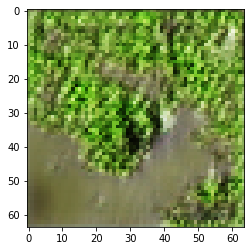

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 1

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.7067358493804932 sec
Gen loss: 1.6985472566203068, Disc loss: 2.184285038395932, Disc valid real loss: 0.3929956461253919, Disc valid fake loss: 0.3676124175912456, Disc class real loss: 0.7108352999938162, Disc class fake loss: 1.84927877626921
Time for epoch 2 is 0.7110302448272705 sec
Gen loss: 1.8212791744031405, Disc loss: 2.212396270350406, Disc valid real loss: 0.3906219648687463, Disc valid fake loss: 0.3575003688272677, Disc class real loss: 0.7288794329291896, Disc class fake loss: 1.9609402982812179
Time for epoch 3 is 0.7055253982543945 sec
Gen loss: 1.8427229429546155, Disc loss: 2.204383868920176, Disc valid real loss: 0.3866185263583535, Disc valid fake loss: 0.37450088325299713, Disc class real loss: 0.716159346856569, Disc class fake loss: 1.9450352066441585
Time for epoch 4 is 0.701676607131958 sec
Gen loss: 1.7597760213048834, Disc

Time for epoch 31 is 0.7022473812103271 sec
Gen loss: 1.7782532855084068, Disc loss: 2.311118069447969, Disc valid real loss: 0.4306584486835881, Disc valid fake loss: 0.3873250217814195, Disc class real loss: 0.674096195321334, Disc class fake loss: 1.9952047624086078
Time for epoch 32 is 0.7068982124328613 sec
Gen loss: 1.7718156136964496, Disc loss: 2.358528124658685, Disc valid real loss: 0.4066595764536607, Disc valid fake loss: 0.3767237718168058, Disc class real loss: 0.7117743460755599, Disc class fake loss: 2.0496414209667004
Time for epoch 33 is 0.7086100578308105 sec
Gen loss: 1.8927940569425885, Disc loss: 2.318348081488358, Disc valid real loss: 0.3961790956948933, Disc valid fake loss: 0.36852418356820155, Disc class real loss: 0.6986733925969977, Disc class fake loss: 2.0354501824629936
Time for epoch 34 is 0.7081809043884277 sec
Gen loss: 1.8645826076206409, Disc loss: 2.3153909821259346, Disc valid real loss: 0.40851562744692754, Disc valid fake loss: 0.370343165962319

Time for epoch 62 is 0.7038068771362305 sec
Gen loss: 1.8612752776396901, Disc loss: 2.497905643362748, Disc valid real loss: 0.4273320452163094, Disc valid fake loss: 0.35469134700925725, Disc class real loss: 0.6850873859305131, Disc class fake loss: 2.247379880202444
Time for epoch 63 is 0.7100889682769775 sec
Gen loss: 1.9300045841618587, Disc loss: 2.4185618350380347, Disc valid real loss: 0.41328685299346324, Disc valid fake loss: 0.341716164036801, Disc class real loss: 0.6640214951414811, Disc class fake loss: 2.1559707365537943
Time for epoch 64 is 0.7001907825469971 sec
Gen loss: 2.025904517424734, Disc loss: 2.4656395159269633, Disc valid real loss: 0.39001663578184026, Disc valid fake loss: 0.35565555958371414, Disc class real loss: 0.6918248879282098, Disc class fake loss: 2.1635244708312187
Time for epoch 65 is 0.7032020092010498 sec
Gen loss: 2.055373034979168, Disc loss: 2.4755576409791646, Disc valid real loss: 0.41004293372756556, Disc valid fake loss: 0.3544077677162

Time for epoch 93 is 0.733818769454956 sec
Gen loss: 1.9182073379817761, Disc loss: 2.6319368638490377, Disc valid real loss: 0.41782267156400177, Disc valid fake loss: 0.3587793182385595, Disc class real loss: 0.6856713420466373, Disc class fake loss: 2.1395570478941264
Time for epoch 94 is 0.7005853652954102 sec
Gen loss: 1.9502244623083818, Disc loss: 2.619212213315462, Disc valid real loss: 0.3928480391439639, Disc valid fake loss: 0.3511256920663934, Disc class real loss: 0.7022033961195695, Disc class fake loss: 2.1012863610920154
Time for epoch 95 is 0.7014672756195068 sec
Gen loss: 2.0880564137508997, Disc loss: 2.6082961559295654, Disc valid real loss: 0.4154415726661682, Disc valid fake loss: 0.3619241243914554, Disc class real loss: 0.6663305006529155, Disc class fake loss: 2.131527768938165
Time for epoch 96 is 0.7036309242248535 sec
Gen loss: 2.137867915002923, Disc loss: 2.669268934350265, Disc valid real loss: 0.4417714382472791, Disc valid fake loss: 0.3670209865821035,

Time for epoch 124 is 0.7091500759124756 sec
Gen loss: 1.9453749217485126, Disc loss: 2.7431437467273914, Disc valid real loss: 0.3850131238761701, Disc valid fake loss: 0.3535440328874086, Disc class real loss: 0.6697364324017575, Disc class fake loss: 2.1661705719797233
Time for epoch 125 is 0.7040572166442871 sec
Gen loss: 1.8988893345782631, Disc loss: 2.740836130945306, Disc valid real loss: 0.38384195691660833, Disc valid fake loss: 0.35371882350821243, Disc class real loss: 0.6950398150243258, Disc class fake loss: 2.0634820963207043
Time for epoch 126 is 0.6994669437408447 sec
Gen loss: 1.8445636473203961, Disc loss: 2.7199438371156393, Disc valid real loss: 0.38256975694706563, Disc valid fake loss: 0.3616524056384438, Disc class real loss: 0.6730371745009172, Disc class fake loss: 2.0669253248917427
Time for epoch 127 is 0.70625901222229 sec
Gen loss: 1.7893772187985872, Disc loss: 2.785998821258545, Disc valid real loss: 0.413058539754466, Disc valid fake loss: 0.33908646592

Time for epoch 155 is 0.7105207443237305 sec
Gen loss: 1.9143786869551007, Disc loss: 2.815036459972984, Disc valid real loss: 0.3786948433047847, Disc valid fake loss: 0.35598708061795487, Disc class real loss: 0.6774198569749531, Disc class fake loss: 1.981922105738991
Time for epoch 156 is 0.7064352035522461 sec
Gen loss: 2.0171352311184534, Disc loss: 2.8675887459202816, Disc valid real loss: 0.40359410486723246, Disc valid fake loss: 0.3552547983433071, Disc class real loss: 0.6715621791387859, Disc class fake loss: 2.0394867721356844
Time for epoch 157 is 0.7036011219024658 sec
Gen loss: 2.178508940495943, Disc loss: 2.824040262322677, Disc valid real loss: 0.38821956515312195, Disc valid fake loss: 0.3526381363994197, Disc class real loss: 0.6724175653959575, Disc class fake loss: 1.9832862239134939
Time for epoch 158 is 0.7081379890441895 sec
Gen loss: 2.07825725956967, Disc loss: 2.8316821801035026, Disc valid real loss: 0.37821842965326813, Disc valid fake loss: 0.34627373830

Time for epoch 186 is 0.698106050491333 sec
Gen loss: 1.8805953828912032, Disc loss: 3.0384272148734643, Disc valid real loss: 0.4003746917373256, Disc valid fake loss: 0.3607066140363091, Disc class real loss: 0.6871748378402308, Disc class fake loss: 2.0394432230999597
Time for epoch 187 is 0.7156474590301514 sec
Gen loss: 2.0472325839494405, Disc loss: 3.0891709327697754, Disc valid real loss: 0.3919763588591626, Disc valid fake loss: 0.3483781179315166, Disc class real loss: 0.7149687221175746, Disc class fake loss: 2.0837467720634057
Time for epoch 188 is 0.7021245956420898 sec
Gen loss: 2.0961749365455224, Disc loss: 3.043074658042506, Disc valid real loss: 0.40475009303343923, Disc valid fake loss: 0.34566790963474076, Disc class real loss: 0.703152574990925, Disc class fake loss: 2.016394590076647
Time for epoch 189 is 0.6970486640930176 sec
Gen loss: 2.027013747315658, Disc loss: 3.0581301764438025, Disc valid real loss: 0.37918874150828313, Disc valid fake loss: 0.34147430250

Time for epoch 217 is 0.7337267398834229 sec
Gen loss: 1.8554946748833907, Disc loss: 3.1191967663012052, Disc valid real loss: 0.43171601860146774, Disc valid fake loss: 0.347144794307257, Disc class real loss: 0.6987618113818922, Disc class fake loss: 1.9086292793876247
Time for epoch 218 is 0.7286019325256348 sec
Gen loss: 1.9231992583525808, Disc loss: 3.1263022799240914, Disc valid real loss: 0.41425070872432307, Disc valid fake loss: 0.35199695904003947, Disc class real loss: 0.7092190824056926, Disc class fake loss: 1.9120036363601685
Time for epoch 219 is 0.7090339660644531 sec
Gen loss: 2.075521418922826, Disc loss: 3.1305105435220817, Disc valid real loss: 0.3981524188267557, Disc valid fake loss: 0.348913469596913, Disc class real loss: 0.6831202852098566, Disc class fake loss: 1.9764373365201449
Time for epoch 220 is 0.7048130035400391 sec
Gen loss: 2.048178559855411, Disc loss: 2.815762733158312, Disc valid real loss: 0.2718648290947864, Disc valid fake loss: 0.24343676472

Time for epoch 248 is 0.7080166339874268 sec
Gen loss: 1.9722067996075279, Disc loss: 3.2245414382533024, Disc valid real loss: 0.39137457389580577, Disc valid fake loss: 0.3548181292257811, Disc class real loss: 0.6813177184054726, Disc class fake loss: 1.9336351846393787
Time for epoch 249 is 0.7010481357574463 sec
Gen loss: 1.8982864869268317, Disc loss: 3.2760158589011743, Disc valid real loss: 0.38641919901496485, Disc valid fake loss: 0.3723517428887518, Disc class real loss: 0.6924852132797241, Disc class fake loss: 1.9583836166482222
Time for epoch 250 is 0.7047348022460938 sec
Gen loss: 1.8730763259686922, Disc loss: 3.0009431211571944, Disc valid real loss: 0.3103471210128383, Disc valid fake loss: 0.26870196273452357, Disc class real loss: 0.705820475753985, Disc class fake loss: 1.8307404016193591
Time for epoch 251 is 0.7008795738220215 sec
Gen loss: 1.8576518924612748, Disc loss: 3.242301526822542, Disc valid real loss: 0.417789898420635, Disc valid fake loss: 0.368014751

Time for epoch 279 is 0.7371771335601807 sec
Gen loss: 1.7168358627118563, Disc loss: 3.415757806677567, Disc valid real loss: 0.42586694893084076, Disc valid fake loss: 0.3955735062298022, Disc class real loss: 0.6828346691633526, Disc class fake loss: 1.9112369763223749
Time for epoch 280 is 0.7344410419464111 sec
Gen loss: 1.9011931921306409, Disc loss: 3.1326766139582585, Disc valid real loss: 0.2783280689465372, Disc valid fake loss: 0.2612351916338268, Disc class real loss: 0.7095860462439688, Disc class fake loss: 1.8832924993414628
Time for epoch 281 is 0.6997463703155518 sec
Gen loss: 2.0835486023049605, Disc loss: 3.291428515785619, Disc valid real loss: 0.38825209046664994, Disc valid fake loss: 0.35115109933050054, Disc class real loss: 0.6848570453493219, Disc class fake loss: 1.866931814896433
Time for epoch 282 is 0.717261791229248 sec
Gen loss: 1.9928816996122662, Disc loss: 3.3790183569255627, Disc valid real loss: 0.4164613477493587, Disc valid fake loss: 0.3488143721

Time for epoch 310 is 0.7091219425201416 sec
Gen loss: 1.8463285910455804, Disc loss: 3.0155953984511528, Disc valid real loss: 0.303102466620897, Disc valid fake loss: 0.2800969732435126, Disc class real loss: 0.712608626014308, Disc class fake loss: 1.7195859206350226
Time for epoch 311 is 0.705162525177002 sec
Gen loss: 1.8081591443011635, Disc loss: 3.262855103141383, Disc valid real loss: 0.4085106175196798, Disc valid fake loss: 0.3672304294611278, Disc class real loss: 0.7220765414990877, Disc class fake loss: 1.764828926638553
Time for epoch 312 is 0.713433027267456 sec
Gen loss: 1.776070368917365, Disc loss: 3.2013174860100997, Disc valid real loss: 0.41837701358293233, Disc valid fake loss: 0.3644069966516997, Disc class real loss: 0.6942908795256364, Disc class fake loss: 1.7240366057345742
Time for epoch 313 is 0.7077059745788574 sec
Gen loss: 1.7429189556523372, Disc loss: 3.1711029378991378, Disc valid real loss: 0.4114394752602828, Disc valid fake loss: 0.384276030879271

Time for epoch 341 is 0.7011163234710693 sec
Gen loss: 1.8477539827949123, Disc loss: 3.154157927161769, Disc valid real loss: 0.39019400665634557, Disc valid fake loss: 0.38615960039590536, Disc class real loss: 0.7202350214907998, Disc class fake loss: 1.6573818420108997
Time for epoch 342 is 0.7057969570159912 sec
Gen loss: 1.7618902545226247, Disc loss: 3.3089383903302645, Disc valid real loss: 0.44866547929613215, Disc valid fake loss: 0.3961769577703978, Disc class real loss: 0.7258389811766776, Disc class fake loss: 1.7380545202054476
Time for epoch 343 is 0.7043905258178711 sec
Gen loss: 1.8091010231720774, Disc loss: 3.102756751211066, Disc valid real loss: 0.39749972600685923, Disc valid fake loss: 0.38595237308426905, Disc class real loss: 0.678084649537739, Disc class fake loss: 1.6410273627230996
Time for epoch 344 is 0.7007560729980469 sec
Gen loss: 1.9437083821547658, Disc loss: 3.1388041596663627, Disc valid real loss: 0.3805737777760154, Disc valid fake loss: 0.3874665

Time for epoch 372 is 0.7254018783569336 sec
Gen loss: 1.8777133791070235, Disc loss: 3.119715301614059, Disc valid real loss: 0.38967058219407735, Disc valid fake loss: 0.38435585875260203, Disc class real loss: 0.7117573901226646, Disc class fake loss: 1.6337470882817318
Time for epoch 373 is 0.7936980724334717 sec
Gen loss: 1.7056355162670738, Disc loss: 3.206758612080624, Disc valid real loss: 0.4542215513555627, Disc valid fake loss: 0.4066254480888969, Disc class real loss: 0.7177998988251937, Disc class fake loss: 1.6279296812258268
Time for epoch 374 is 0.7121989727020264 sec
Gen loss: 1.718256862539994, Disc loss: 3.1415524859177437, Disc valid real loss: 0.39492524297613846, Disc valid fake loss: 0.37690461466186925, Disc class real loss: 0.7145840086435017, Disc class fake loss: 1.6549505246312994
Time for epoch 375 is 0.788841962814331 sec
Gen loss: 1.7273756955799304, Disc loss: 3.139573887774819, Disc valid real loss: 0.43246512507137497, Disc valid fake loss: 0.401211693

Time for epoch 403 is 0.7031068801879883 sec
Gen loss: 1.7906766439739026, Disc loss: 3.1505937827260873, Disc valid real loss: 0.4255447513178775, Disc valid fake loss: 0.3927048162410134, Disc class real loss: 0.7117463914971602, Disc class fake loss: 1.6204160451889038
Time for epoch 404 is 0.7115647792816162 sec
Gen loss: 1.8359983720277484, Disc loss: 3.1702496503528796, Disc valid real loss: 0.45237129299264206, Disc valid fake loss: 0.3736973044119383, Disc class real loss: 0.7162121440234938, Disc class fake loss: 1.6277865296915959
Time for epoch 405 is 0.7125091552734375 sec
Gen loss: 1.8129425864470632, Disc loss: 3.134862360201384, Disc valid real loss: 0.40038224741032247, Disc valid fake loss: 0.37297321150177404, Disc class real loss: 0.7161420677837572, Disc class fake loss: 1.645179033279419
Time for epoch 406 is 0.7084736824035645 sec
Gen loss: 1.920213360535471, Disc loss: 3.1313270016720423, Disc valid real loss: 0.4318152666091919, Disc valid fake loss: 0.380557786

Time for epoch 434 is 0.7286012172698975 sec
Gen loss: 1.7485923453381187, Disc loss: 3.046125575115806, Disc valid real loss: 0.42922101993309825, Disc valid fake loss: 0.3880804377166848, Disc class real loss: 0.6834828132077267, Disc class fake loss: 1.5451689519380267
Time for epoch 435 is 0.7071645259857178 sec
Gen loss: 1.8427348074160124, Disc loss: 3.0615467774240592, Disc valid real loss: 0.408481450457322, Disc valid fake loss: 0.3725712095436297, Disc class real loss: 0.722415312340385, Disc class fake loss: 1.5579116846385754
Time for epoch 436 is 0.702883243560791 sec
Gen loss: 1.8240189803274054, Disc loss: 3.0455848919717887, Disc valid real loss: 0.393260447602523, Disc valid fake loss: 0.3906328521276775, Disc class real loss: 0.7080563871484054, Disc class fake loss: 1.553466100441782
Time for epoch 437 is 0.7025694847106934 sec
Gen loss: 1.7435526722355892, Disc loss: 3.1560190602352747, Disc valid real loss: 0.4111327748549612, Disc valid fake loss: 0.36737020235312

Time for epoch 465 is 0.7102038860321045 sec
Gen loss: 1.953321751795317, Disc loss: 2.948239489605552, Disc valid real loss: 0.37450834638194036, Disc valid fake loss: 0.3698335227213408, Disc class real loss: 0.696078294201901, Disc class fake loss: 1.5076569946188676
Time for epoch 466 is 0.7016456127166748 sec
Gen loss: 1.9419153113114207, Disc loss: 3.007867323724847, Disc valid real loss: 0.38351516817745407, Disc valid fake loss: 0.36546233610103007, Disc class real loss: 0.705076023152, Disc class fake loss: 1.5536440422660427
Time for epoch 467 is 0.7332873344421387 sec
Gen loss: 1.898348287532204, Disc loss: 2.9864351623936702, Disc valid real loss: 0.38998183294346456, Disc valid fake loss: 0.3720299052564721, Disc class real loss: 0.7417217994991102, Disc class fake loss: 1.4825534444106252
Time for epoch 468 is 0.7075679302215576 sec
Gen loss: 1.8857483675605373, Disc loss: 3.0513363888389184, Disc valid real loss: 0.4047957862678327, Disc valid fake loss: 0.38000939080589

Time for epoch 496 is 0.7387938499450684 sec
Gen loss: 1.8772656792088558, Disc loss: 2.9734120117990592, Disc valid real loss: 0.4551240033225009, Disc valid fake loss: 0.3895278557350761, Disc class real loss: 0.7208500880944101, Disc class fake loss: 1.407772653981259
Time for epoch 497 is 0.7479350566864014 sec
Gen loss: 1.6614117183183368, Disc loss: 3.063542315834447, Disc valid real loss: 0.4462957837079701, Disc valid fake loss: 0.414442514902667, Disc class real loss: 0.7222852550054851, Disc class fake loss: 1.4803671648627834
Time for epoch 498 is 0.7714898586273193 sec
Gen loss: 1.8694614171981812, Disc loss: 2.9535782713639107, Disc valid real loss: 0.40474592619820643, Disc valid fake loss: 0.35563750251343373, Disc class real loss: 0.7174542483530546, Disc class fake loss: 1.4755889491031045
Time for epoch 499 is 0.738349199295044 sec
Gen loss: 1.9057796503368176, Disc loss: 2.9977758683656393, Disc valid real loss: 0.39250412897059794, Disc valid fake loss: 0.3402290846

Time for epoch 527 is 0.7726950645446777 sec
Gen loss: 2.002020089249862, Disc loss: 2.9981463457408704, Disc valid real loss: 0.4250917215096323, Disc valid fake loss: 0.3754150318472009, Disc class real loss: 0.7238129095027321, Disc class fake loss: 1.4736767128894204
Time for epoch 528 is 0.6996545791625977 sec
Gen loss: 1.881594363011812, Disc loss: 2.9236634028585335, Disc valid real loss: 0.43825823696036087, Disc valid fake loss: 0.38035752898768377, Disc class real loss: 0.7297272305739554, Disc class fake loss: 1.3751912556196515
Time for epoch 529 is 0.7043383121490479 sec
Gen loss: 1.8078853707564504, Disc loss: 2.8519967355226217, Disc valid real loss: 0.39233053357977615, Disc valid fake loss: 0.3715221850495589, Disc class real loss: 0.7068056934758237, Disc class fake loss: 1.3812034004612972
Time for epoch 530 is 0.7039017677307129 sec
Gen loss: 1.81513848430232, Disc loss: 2.6912573136781393, Disc valid real loss: 0.31567401321310745, Disc valid fake loss: 0.298936829

Time for epoch 558 is 0.7010276317596436 sec
Gen loss: 1.9220424576809532, Disc loss: 2.9226357811375667, Disc valid real loss: 0.40151295536442805, Disc valid fake loss: 0.36161863960717855, Disc class real loss: 0.6984697235258002, Disc class fake loss: 1.4608819484710693
Time for epoch 559 is 0.6966588497161865 sec
Gen loss: 1.8986978844592446, Disc loss: 2.925320763336985, Disc valid real loss: 0.3970652332431392, Disc valid fake loss: 0.3797506454743837, Disc class real loss: 0.702974303772575, Disc class fake loss: 1.4453820680317127
Time for epoch 560 is 0.7581672668457031 sec
Gen loss: 1.8834787105259143, Disc loss: 2.7773055904789974, Disc valid real loss: 0.2965028160496762, Disc valid fake loss: 0.2798906690195987, Disc class real loss: 0.6967874953621312, Disc class fake loss: 1.5039631818470203
Time for epoch 561 is 0.7924642562866211 sec
Gen loss: 1.9335060872529681, Disc loss: 3.0281231026900444, Disc valid real loss: 0.40054977881281, Disc valid fake loss: 0.38291664656

Time for epoch 589 is 0.7338910102844238 sec
Gen loss: 1.861020470920362, Disc loss: 2.9595631047299036, Disc valid real loss: 0.45799586961143895, Disc valid fake loss: 0.3844842471574482, Disc class real loss: 0.7278867740380136, Disc class fake loss: 1.38906392925664
Time for epoch 590 is 0.8126096725463867 sec
Gen loss: 1.9583246645174528, Disc loss: 2.68699890688846, Disc valid real loss: 0.3047898435278943, Disc valid fake loss: 0.2755390609565534, Disc class real loss: 0.7146311025870474, Disc class fake loss: 1.3919034066953158
Time for epoch 591 is 0.7515318393707275 sec
Gen loss: 1.9641626508612382, Disc loss: 2.844843400152106, Disc valid real loss: 0.39131298269096176, Disc valid fake loss: 0.3747693880608207, Disc class real loss: 0.7097293828663073, Disc class fake loss: 1.3688997783158954
Time for epoch 592 is 0.7055139541625977 sec
Gen loss: 1.9918730886358964, Disc loss: 2.938696497365048, Disc valid real loss: 0.3886804627744775, Disc valid fake loss: 0.35821022407004

Time for epoch 620 is 0.7017335891723633 sec
Gen loss: 1.9428938188050922, Disc loss: 2.5546554138785913, Disc valid real loss: 0.30494283688695806, Disc valid fake loss: 0.2845194229954167, Disc class real loss: 0.7104446950711703, Disc class fake loss: 1.25463961300097
Time for epoch 621 is 0.7414836883544922 sec
Gen loss: 2.0041352322227075, Disc loss: 2.8336251911364103, Disc valid real loss: 0.37868067465330424, Disc valid fake loss: 0.35998397281295375, Disc class real loss: 0.7222951713361239, Disc class fake loss: 1.3725352977451526
Time for epoch 622 is 0.7171659469604492 sec
Gen loss: 1.9912614508679038, Disc loss: 2.825453155919125, Disc valid real loss: 0.3720171608422932, Disc valid fake loss: 0.37384724617004395, Disc class real loss: 0.7080654784252769, Disc class fake loss: 1.371390556034289
Time for epoch 623 is 0.7192566394805908 sec
Gen loss: 1.9884191249546253, Disc loss: 2.8394900246670374, Disc valid real loss: 0.39845449987210724, Disc valid fake loss: 0.37762656

Time for epoch 651 is 0.7096953392028809 sec
Gen loss: 1.7434974846087004, Disc loss: 2.872171954104775, Disc valid real loss: 0.44498082838560404, Disc valid fake loss: 0.38644638657569885, Disc class real loss: 0.6989544943759316, Disc class fake loss: 1.3416616916656494
Time for epoch 652 is 0.7073774337768555 sec
Gen loss: 1.7048780227962292, Disc loss: 2.9388538159822164, Disc valid real loss: 0.42964043899586324, Disc valid fake loss: 0.39388897230750636, Disc class real loss: 0.7123785113033495, Disc class fake loss: 1.4028077815708362
Time for epoch 653 is 0.721430778503418 sec
Gen loss: 1.8597178647392674, Disc loss: 2.7737339421322473, Disc valid real loss: 0.3807943714292426, Disc valid fake loss: 0.36917547960030406, Disc class real loss: 0.7049216345736855, Disc class fake loss: 1.318719694488927
Time for epoch 654 is 0.704465389251709 sec
Gen loss: 1.929318208443491, Disc loss: 2.7888627303274056, Disc valid real loss: 0.3868963875268635, Disc valid fake loss: 0.360326335

Time for epoch 682 is 0.7140545845031738 sec
Gen loss: 1.7460272061197382, Disc loss: 2.872267434471532, Disc valid real loss: 0.41356234174025686, Disc valid fake loss: 0.401818667587481, Disc class real loss: 0.7186124199315121, Disc class fake loss: 1.3381500746074475
Time for epoch 683 is 0.7497344017028809 sec
Gen loss: 1.7220757823241384, Disc loss: 2.820031002948159, Disc valid real loss: 0.42349526286125183, Disc valid fake loss: 0.40807105443979563, Disc class real loss: 0.7133488655090332, Disc class fake loss: 1.275003433227539
Time for epoch 684 is 0.700491189956665 sec
Gen loss: 1.691144780108803, Disc loss: 2.795761936589291, Disc valid real loss: 0.41033530941135005, Disc valid fake loss: 0.39371962923752635, Disc class real loss: 0.7206704992997018, Disc class fake loss: 1.2709264692507292
Time for epoch 685 is 0.7222895622253418 sec
Gen loss: 1.795769503242091, Disc loss: 2.9386261764325594, Disc valid real loss: 0.4564479856114638, Disc valid fake loss: 0.387514126143

Time for epoch 713 is 0.7040669918060303 sec
Gen loss: 1.8680151450006586, Disc loss: 2.7982398710752787, Disc valid real loss: 0.38614891861614425, Disc valid fake loss: 0.40166201716975164, Disc class real loss: 0.7325270270046434, Disc class fake loss: 1.2777928051195646
Time for epoch 714 is 0.7076730728149414 sec
Gen loss: 1.9207046910336143, Disc loss: 2.7440903186798096, Disc valid real loss: 0.3992846545420195, Disc valid fake loss: 0.3997020007748353, Disc class real loss: 0.7312111823182357, Disc class fake loss: 1.2137959724978398
Time for epoch 715 is 0.7020618915557861 sec
Gen loss: 1.8909447255887484, Disc loss: 2.6709370613098145, Disc valid real loss: 0.39024049200509725, Disc valid fake loss: 0.41123005198804957, Disc class real loss: 0.7127308720036557, Disc class fake loss: 1.1566468477249146
Time for epoch 716 is 0.7061302661895752 sec
Gen loss: 1.8909723507730585, Disc loss: 2.760368535393163, Disc valid real loss: 0.391651346495277, Disc valid fake loss: 0.3977726

Time for epoch 744 is 0.7051725387573242 sec
Gen loss: 1.8643509965193898, Disc loss: 2.771557331085205, Disc valid real loss: 0.4308643074412095, Disc valid fake loss: 0.37481627181956645, Disc class real loss: 0.7493621048174406, Disc class fake loss: 1.2164212088835866
Time for epoch 745 is 0.7054872512817383 sec
Gen loss: 1.904960600953353, Disc loss: 2.6814094970100806, Disc valid real loss: 0.3950789445324948, Disc valid fake loss: 0.38821522499385636, Disc class real loss: 0.6968359821721127, Disc class fake loss: 1.2011784252367521
Time for epoch 746 is 0.7023992538452148 sec
Gen loss: 1.8247238021147878, Disc loss: 2.732711729250456, Disc valid real loss: 0.40738127262968765, Disc valid fake loss: 0.3966620862483978, Disc class real loss: 0.7271545152915152, Disc class fake loss: 1.2014190115426715
Time for epoch 747 is 0.702561616897583 sec
Gen loss: 1.8964972809741372, Disc loss: 2.7274751035790694, Disc valid real loss: 0.41077994516021327, Disc valid fake loss: 0.369744714

Time for epoch 775 is 0.8012723922729492 sec
Gen loss: 1.7133272572567588, Disc loss: 2.792599213750739, Disc valid real loss: 0.40010634221528707, Disc valid fake loss: 0.3860006724533282, Disc class real loss: 0.7109033496756303, Disc class fake loss: 1.2954718690169484
Time for epoch 776 is 0.7201883792877197 sec
Gen loss: 1.7765674214614064, Disc loss: 2.7794404155329655, Disc valid real loss: 0.4007730554593237, Disc valid fake loss: 0.3814261947807513, Disc class real loss: 0.7133699404565912, Disc class fake loss: 1.2837571031168888
Time for epoch 777 is 0.7566947937011719 sec
Gen loss: 1.902801137221487, Disc loss: 2.7669614867160193, Disc valid real loss: 0.3896057135180423, Disc valid fake loss: 0.3778317507944609, Disc class real loss: 0.7240557482368067, Disc class fake loss: 1.2753579867513556
Time for epoch 778 is 0.7005929946899414 sec
Gen loss: 1.9615802325700458, Disc loss: 2.728250503540039, Disc valid real loss: 0.40959492325782776, Disc valid fake loss: 0.3672694156

Time for epoch 806 is 0.7417685985565186 sec
Gen loss: 1.954829165810033, Disc loss: 2.6521904844986763, Disc valid real loss: 0.3777595617269215, Disc valid fake loss: 0.3938587519683336, Disc class real loss: 0.7128043959015294, Disc class fake loss: 1.1676767374339856
Time for epoch 807 is 0.7507095336914062 sec
Gen loss: 1.996412534462778, Disc loss: 2.7001063070799174, Disc valid real loss: 0.4054068922996521, Disc valid fake loss: 0.3773538234986757, Disc class real loss: 0.7229716244496798, Disc class fake loss: 1.194279714634544
Time for epoch 808 is 0.7667925357818604 sec
Gen loss: 1.9478696270992881, Disc loss: 2.7122521149484733, Disc valid real loss: 0.425425460464076, Disc valid fake loss: 0.39311199909762334, Disc class real loss: 0.6935845205658361, Disc class fake loss: 1.2000288147675364
Time for epoch 809 is 0.7825438976287842 sec
Gen loss: 2.02007574156711, Disc loss: 2.673813769691869, Disc valid real loss: 0.43042375382624176, Disc valid fake loss: 0.37371379137039

Time for epoch 837 is 0.7783591747283936 sec
Gen loss: 1.8771369645470066, Disc loss: 2.666658276005795, Disc valid real loss: 0.388119427781356, Disc valid fake loss: 0.38261838257312775, Disc class real loss: 0.7187138544885736, Disc class fake loss: 1.177114907063936
Time for epoch 838 is 0.7729120254516602 sec
Gen loss: 1.8243886483343024, Disc loss: 2.6853196369974235, Disc valid real loss: 0.400075857576571, Disc valid fake loss: 0.3935269572232899, Disc class real loss: 0.7223975407449823, Disc class fake loss: 1.169229927815889
Time for epoch 839 is 0.767693042755127 sec
Gen loss: 1.9950609897312366, Disc loss: 2.7621136841021086, Disc valid real loss: 0.4167020775769886, Disc valid fake loss: 0.3901828833316502, Disc class real loss: 0.7267935652481882, Disc class fake loss: 1.2283348221527903
Time for epoch 840 is 0.7352964878082275 sec
Gen loss: 1.9982215918992694, Disc loss: 2.517509711416144, Disc valid real loss: 0.2783810206149754, Disc valid fake loss: 0.274090576328729

Time for epoch 868 is 0.708167552947998 sec
Gen loss: 1.803226627801594, Disc loss: 2.630382399809988, Disc valid real loss: 0.4078182766312047, Disc valid fake loss: 0.3707358648902492, Disc class real loss: 0.7406254912677565, Disc class fake loss: 1.1111286815844084
Time for epoch 869 is 0.7044961452484131 sec
Gen loss: 1.858349787561517, Disc loss: 2.630670898839047, Disc valid real loss: 0.40483508925688894, Disc valid fake loss: 0.37815384409929576, Disc class real loss: 0.6973002992178264, Disc class fake loss: 1.1502910758319653
Time for epoch 870 is 0.7022628784179688 sec
Gen loss: 1.8992812068838822, Disc loss: 2.5010511749669124, Disc valid real loss: 0.30421428147115204, Disc valid fake loss: 0.2856646117411162, Disc class real loss: 0.748230046347568, Disc class fake loss: 1.1628592735842656
Time for epoch 871 is 0.7011651992797852 sec
Gen loss: 1.848202906156841, Disc loss: 2.69034911456861, Disc valid real loss: 0.4157034566527919, Disc valid fake loss: 0.371814575634504

Time for epoch 899 is 0.6999330520629883 sec
Gen loss: 2.040736430569699, Disc loss: 2.584385294663279, Disc valid real loss: 0.38921892486120524, Disc valid fake loss: 0.37976550350063726, Disc class real loss: 0.7090829704937182, Disc class fake loss: 1.10623846556011
Time for epoch 900 is 0.7005102634429932 sec
Gen loss: 1.9527776053077297, Disc loss: 2.3901311849292957, Disc valid real loss: 0.28479278401324626, Disc valid fake loss: 0.2991726618064077, Disc class real loss: 0.7433185295054787, Disc class fake loss: 1.0627833353845697
Time for epoch 901 is 0.7004683017730713 sec
Gen loss: 1.9250745459606773, Disc loss: 2.593895949815449, Disc valid real loss: 0.4089177392031017, Disc valid fake loss: 0.3808282111820422, Disc class real loss: 0.7139523280294318, Disc class fake loss: 1.0901224424964504
Time for epoch 902 is 0.6994845867156982 sec
Gen loss: 1.8899402618408203, Disc loss: 2.6030158243681254, Disc valid real loss: 0.39067687800056056, Disc valid fake loss: 0.3922494728

Time for epoch 930 is 0.7028191089630127 sec
Gen loss: 1.8694172156484503, Disc loss: 2.422246067147506, Disc valid real loss: 0.33837305244646576, Disc valid fake loss: 0.29112590065127925, Disc class real loss: 0.7346421386066236, Disc class fake loss: 1.0580402989136546
Time for epoch 931 is 0.7065668106079102 sec
Gen loss: 1.8884623301656622, Disc loss: 2.5615734050148413, Disc valid real loss: 0.3664768620541221, Disc valid fake loss: 0.39522715461881536, Disc class real loss: 0.7257303093609057, Disc class fake loss: 1.0740693838972795
Time for epoch 932 is 0.6996135711669922 sec
Gen loss: 1.9092339716459577, Disc loss: 2.5627076625823975, Disc valid real loss: 0.4113622401890002, Disc valid fake loss: 0.38970709396036046, Disc class real loss: 0.7173281155134502, Disc class fake loss: 1.04424481329165
Time for epoch 933 is 0.7362587451934814 sec
Gen loss: 1.8542621198453402, Disc loss: 2.585481141742907, Disc valid real loss: 0.3952662223263791, Disc valid fake loss: 0.387641156

Time for epoch 961 is 0.7088620662689209 sec
Gen loss: 1.7962044853913157, Disc loss: 2.6453051943528023, Disc valid real loss: 0.4490553909226468, Disc valid fake loss: 0.4162963424858294, Disc class real loss: 0.7173437789866799, Disc class fake loss: 1.0625405844889189
Time for epoch 962 is 0.701138973236084 sec
Gen loss: 1.7759409452739514, Disc loss: 2.6225159921144185, Disc valid real loss: 0.452484097919966, Disc valid fake loss: 0.42340530219830963, Disc class real loss: 0.741403645590732, Disc class fake loss: 1.0051702010004144
Time for epoch 963 is 0.7162184715270996 sec
Gen loss: 1.7658588886260986, Disc loss: 2.5581935330441126, Disc valid real loss: 0.411463577496378, Disc valid fake loss: 0.40053721164402206, Disc class real loss: 0.7197024383042988, Disc class fake loss: 1.02642895359742
Time for epoch 964 is 0.7193353176116943 sec
Gen loss: 1.8191973347412913, Disc loss: 2.518887946480199, Disc valid real loss: 0.39822451378169815, Disc valid fake loss: 0.3788285914220

Time for epoch 992 is 0.6945040225982666 sec
Gen loss: 1.7768449595100002, Disc loss: 2.592819991864656, Disc valid real loss: 0.3876881081806986, Disc valid fake loss: 0.4100310959314045, Disc class real loss: 0.7102899896471124, Disc class fake loss: 1.084735936240146
Time for epoch 993 is 0.7031924724578857 sec
Gen loss: 1.9502519118158441, Disc loss: 2.57206055992528, Disc valid real loss: 0.4181765349287736, Disc valid fake loss: 0.39233401966722387, Disc class real loss: 0.7319415964578327, Disc class fake loss: 1.0295488677526776
Time for epoch 994 is 0.6953830718994141 sec
Gen loss: 1.9130269351758455, Disc loss: 2.543938498747976, Disc valid real loss: 0.3981020827042429, Disc valid fake loss: 0.4005842201019588, Disc class real loss: 0.683612302729958, Disc class fake loss: 1.061564288641277
Time for epoch 995 is 0.693507194519043 sec
Gen loss: 1.945506491159138, Disc loss: 2.5566876687501607, Disc valid real loss: 0.42438792084392746, Disc valid fake loss: 0.3882091500257191

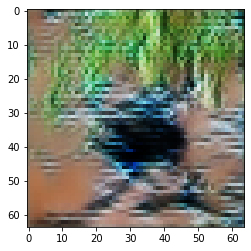

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 2

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.7057681083679199 sec
Gen loss: 1.9638493939449913, Disc loss: 2.170214665563483, Disc valid real loss: 0.38448758501755564, Disc valid fake loss: 0.39102541929797124, Disc class real loss: 0.6968929014707866, Disc class fake loss: 1.1819254128556502
Time for epoch 2 is 0.7052516937255859 sec
Gen loss: 1.9768995360324257, Disc loss: 2.222619188459296, Disc valid real loss: 0.38941704677908046, Disc valid fake loss: 0.3815060759845533, Disc class real loss: 0.7245809404473555, Disc class fake loss: 1.1852104914815802
Time for epoch 3 is 0.7017791271209717 sec
Gen loss: 1.8682038156609786, Disc loss: 2.2061270538129305, Disc valid real loss: 0.3801075549502122, Disc valid fake loss: 0.38737689507635015, Disc class real loss: 0.7172564770046034, Disc class fake loss: 1.1755530144038953
Time for epoch 4 is 0.700385332107544 sec
Gen loss: 1.827271154052332

Time for epoch 31 is 0.7063424587249756 sec
Gen loss: 1.845762434758638, Disc loss: 2.207453213239971, Disc valid real loss: 0.4016373518266176, Disc valid fake loss: 0.39229515351747213, Disc class real loss: 0.6789449986658598, Disc class fake loss: 1.185615715227629
Time for epoch 32 is 0.7238883972167969 sec
Gen loss: 1.8513184848584627, Disc loss: 2.198904551957783, Disc valid real loss: 0.39831812601340444, Disc valid fake loss: 0.3725914798284832, Disc class real loss: 0.6843556730370772, Disc class fake loss: 1.2077762076729222
Time for epoch 33 is 0.7229259014129639 sec
Gen loss: 1.9384953724710565, Disc loss: 2.1798066277253, Disc valid real loss: 0.37762081858358887, Disc valid fake loss: 0.3662448839137429, Disc class real loss: 0.6886506833528218, Disc class fake loss: 1.190379283930126
Time for epoch 34 is 0.7225785255432129 sec
Gen loss: 2.0062293378930343, Disc loss: 2.0893738520772835, Disc valid real loss: 0.3540873535369572, Disc valid fake loss: 0.35500970090690415,

Time for epoch 62 is 0.7012128829956055 sec
Gen loss: 1.9269105697932996, Disc loss: 2.268061123396221, Disc valid real loss: 0.3771426818872753, Disc valid fake loss: 0.3715868121699283, Disc class real loss: 0.6994319213064093, Disc class fake loss: 1.2437636977747868
Time for epoch 63 is 0.6988306045532227 sec
Gen loss: 2.084100321719521, Disc loss: 2.25329443655516, Disc valid real loss: 0.3666694595625526, Disc valid fake loss: 0.37325524185833175, Disc class real loss: 0.6874415937222933, Disc class fake loss: 1.3032005335155286
Time for epoch 64 is 0.7035515308380127 sec
Gen loss: 1.9841465510820087, Disc loss: 2.267505357139989, Disc valid real loss: 0.3741823325031682, Disc valid fake loss: 0.3779498683778863, Disc class real loss: 0.6760272916994596, Disc class fake loss: 1.3908548731552928
Time for epoch 65 is 0.7020843029022217 sec
Gen loss: 2.016359053160015, Disc loss: 2.2353810197428654, Disc valid real loss: 0.38101978992160995, Disc valid fake loss: 0.3654685349840867,

Time for epoch 93 is 0.7045085430145264 sec
Gen loss: 2.005788665068777, Disc loss: 2.295402558226334, Disc valid real loss: 0.3775157159880588, Disc valid fake loss: 0.37900848921976593, Disc class real loss: 0.6730958003746835, Disc class fake loss: 1.2519435255151046
Time for epoch 94 is 0.7019491195678711 sec
Gen loss: 1.8831340011797453, Disc loss: 2.327817540419729, Disc valid real loss: 0.3895264252236015, Disc valid fake loss: 0.3721960453610671, Disc class real loss: 0.6959109714156703, Disc class fake loss: 1.2138984956239398
Time for epoch 95 is 0.7066872119903564 sec
Gen loss: 1.7941574736645347, Disc loss: 2.268802103243376, Disc valid real loss: 0.38803455860991226, Disc valid fake loss: 0.3892973034005416, Disc class real loss: 0.6607094783531992, Disc class fake loss: 1.1607677058169716
Time for epoch 96 is 0.7931406497955322 sec
Gen loss: 1.8314058278736316, Disc loss: 2.2687917194868388, Disc valid real loss: 0.3954680969840602, Disc valid fake loss: 0.383074092237572

Time for epoch 124 is 0.7011802196502686 sec
Gen loss: 1.830675771361903, Disc loss: 2.345181201633654, Disc valid real loss: 0.4004447005297008, Disc valid fake loss: 0.3849587189523797, Disc class real loss: 0.6742672386922335, Disc class fake loss: 1.1496487793169523
Time for epoch 125 is 0.6958439350128174 sec
Gen loss: 1.8817921751423885, Disc loss: 2.3567826998861214, Disc valid real loss: 0.42148288300162867, Disc valid fake loss: 0.37931791104768453, Disc class real loss: 0.6659566854175768, Disc class fake loss: 1.1658183430370532
Time for epoch 126 is 0.6983914375305176 sec
Gen loss: 1.9383629874179238, Disc loss: 2.3293411104302657, Disc valid real loss: 0.3900028906370464, Disc valid fake loss: 0.3620626714668776, Disc class real loss: 0.6774116566306666, Disc class fake loss: 1.1699448541591042
Time for epoch 127 is 0.697749137878418 sec
Gen loss: 1.8180481320933293, Disc loss: 2.3650904203716077, Disc valid real loss: 0.39992064080740275, Disc valid fake loss: 0.373377661

Time for epoch 155 is 0.6993613243103027 sec
Gen loss: 2.015375206345006, Disc loss: 2.475696563720703, Disc valid real loss: 0.40935753678020675, Disc valid fake loss: 0.3738102175687489, Disc class real loss: 0.6716235374149523, Disc class fake loss: 1.299725513709219
Time for epoch 156 is 0.6951797008514404 sec
Gen loss: 2.0369809677726343, Disc loss: 2.4117090702056885, Disc valid real loss: 0.4305078324518706, Disc valid fake loss: 0.3468980914668033, Disc class real loss: 0.6850492546432897, Disc class fake loss: 1.1571607777946873
Time for epoch 157 is 0.7001252174377441 sec
Gen loss: 2.015060205208628, Disc loss: 2.4131072194952714, Disc valid real loss: 0.38354377213277313, Disc valid fake loss: 0.370172917842865, Disc class real loss: 0.7029363387509396, Disc class fake loss: 1.1529634751771625
Time for epoch 158 is 0.7104861736297607 sec
Gen loss: 1.9066097861842106, Disc loss: 2.389747280823557, Disc valid real loss: 0.3982990133134942, Disc valid fake loss: 0.3679891573755

Time for epoch 186 is 0.7013199329376221 sec
Gen loss: 1.7929513077986867, Disc loss: 2.5057316328349866, Disc valid real loss: 0.3956534423326191, Disc valid fake loss: 0.4046111985256797, Disc class real loss: 0.6919108064551103, Disc class fake loss: 1.1737757419285022
Time for epoch 187 is 0.7047426700592041 sec
Gen loss: 1.9830740439264398, Disc loss: 2.499040076607152, Disc valid real loss: 0.39405237922542974, Disc valid fake loss: 0.3739321271055623, Disc class real loss: 0.6905341681681181, Disc class fake loss: 1.2119171117481433
Time for epoch 188 is 0.7043721675872803 sec
Gen loss: 2.0116816696367765, Disc loss: 2.426669585077386, Disc valid real loss: 0.41097489626784073, Disc valid fake loss: 0.3470882114611174, Disc class real loss: 0.6918609612866452, Disc class fake loss: 1.1139115408847207
Time for epoch 189 is 0.7024798393249512 sec
Gen loss: 1.9362219697550724, Disc loss: 2.501390482250013, Disc valid real loss: 0.4407487966512379, Disc valid fake loss: 0.3788993586

Time for epoch 217 is 0.8174428939819336 sec
Gen loss: 1.924870861204047, Disc loss: 2.4256194390748678, Disc valid real loss: 0.39472570936930806, Disc valid fake loss: 0.3771894134973225, Disc class real loss: 0.7030594599874396, Disc class fake loss: 1.0208138823509216
Time for epoch 218 is 0.7325372695922852 sec
Gen loss: 1.7859701984807064, Disc loss: 2.4029857171209237, Disc valid real loss: 0.399349066771959, Disc valid fake loss: 0.3721650587885003, Disc class real loss: 0.7061081748259695, Disc class fake loss: 0.9861680865287781
Time for epoch 219 is 0.7547993659973145 sec
Gen loss: 1.7426655731703107, Disc loss: 2.440301857496563, Disc valid real loss: 0.42995118781139974, Disc valid fake loss: 0.40059654179372284, Disc class real loss: 0.6757874426088835, Disc class fake loss: 1.0039674576960111
Time for epoch 220 is 0.7344560623168945 sec
Gen loss: 1.8019375612861233, Disc loss: 2.265535743612992, Disc valid real loss: 0.3211820392232192, Disc valid fake loss: 0.2994453765

Time for epoch 248 is 0.7254049777984619 sec
Gen loss: 1.7880000566181384, Disc loss: 2.3877284903275338, Disc valid real loss: 0.4204587575636412, Disc valid fake loss: 0.40818465697137934, Disc class real loss: 0.6686841970995853, Disc class fake loss: 0.9176361937271921
Time for epoch 249 is 0.7255322933197021 sec
Gen loss: 1.772929542943051, Disc loss: 2.4317713285747327, Disc valid real loss: 0.43434511987786545, Disc valid fake loss: 0.39665361925175313, Disc class real loss: 0.6663674994518882, Disc class fake loss: 0.9660397517053705
Time for epoch 250 is 0.7192001342773438 sec
Gen loss: 1.8819613707693, Disc loss: 2.239607911360891, Disc valid real loss: 0.31277888856436076, Disc valid fake loss: 0.28972275319852325, Disc class real loss: 0.6874945885256717, Disc class fake loss: 0.9793616941100672
Time for epoch 251 is 0.7260935306549072 sec
Gen loss: 1.8951546769393117, Disc loss: 2.3516532370918677, Disc valid real loss: 0.38690439964595597, Disc valid fake loss: 0.36791975

Time for epoch 279 is 0.749178409576416 sec
Gen loss: 2.068002073388351, Disc loss: 2.391087193238108, Disc valid real loss: 0.39010839870101527, Disc valid fake loss: 0.380681059862438, Disc class real loss: 0.6913298682162636, Disc class fake loss: 0.9289203443025288
Time for epoch 280 is 0.7261149883270264 sec
Gen loss: 2.016779353744105, Disc loss: 2.1882413186525045, Disc valid real loss: 0.28747540477075073, Disc valid fake loss: 0.2873335041497883, Disc class real loss: 0.6689654839666266, Disc class fake loss: 0.9444118424465782
Time for epoch 281 is 0.709730863571167 sec
Gen loss: 1.8680493706151058, Disc loss: 2.403186697708933, Disc valid real loss: 0.4132214972847386, Disc valid fake loss: 0.4146025306300113, Disc class real loss: 0.671818849287535, Disc class fake loss: 0.9034974857380516
Time for epoch 282 is 0.7146611213684082 sec
Gen loss: 1.869390562960976, Disc loss: 2.4186280150162545, Disc valid real loss: 0.4125630541851646, Disc valid fake loss: 0.3810069294352280

Time for epoch 310 is 0.7092509269714355 sec
Gen loss: 1.8407114116769088, Disc loss: 2.2189125010841773, Disc valid real loss: 0.31753360911419515, Disc valid fake loss: 0.3082817996803083, Disc class real loss: 0.7184364952539143, Disc class fake loss: 0.8746293594962672
Time for epoch 311 is 0.7021064758300781 sec
Gen loss: 1.897448640120657, Disc loss: 2.412580966949463, Disc valid real loss: 0.41899180882855463, Disc valid fake loss: 0.38956444514425176, Disc class real loss: 0.7123550553070871, Disc class fake loss: 0.8916338023386503
Time for epoch 312 is 0.7031748294830322 sec
Gen loss: 1.829658734171014, Disc loss: 2.376806096026772, Disc valid real loss: 0.39761075220609965, Disc valid fake loss: 0.3694034140360983, Disc class real loss: 0.6939872848360162, Disc class fake loss: 0.9157603069355613
Time for epoch 313 is 0.7089343070983887 sec
Gen loss: 1.8856206881372553, Disc loss: 2.3380825896012154, Disc valid real loss: 0.3946176798720109, Disc valid fake loss: 0.390291294

Time for epoch 341 is 0.7181034088134766 sec
Gen loss: 2.0770444242577804, Disc loss: 2.388724628247713, Disc valid real loss: 0.4033110926025792, Disc valid fake loss: 0.3746435916737506, Disc class real loss: 0.7152994996622989, Disc class fake loss: 0.8954344172226755
Time for epoch 342 is 0.7109174728393555 sec
Gen loss: 2.077097221424705, Disc loss: 2.351775363871926, Disc valid real loss: 0.38709255425553574, Disc valid fake loss: 0.4001768176492892, Disc class real loss: 0.7262051325095328, Disc class fake loss: 0.8382783971334758
Time for epoch 343 is 0.7108147144317627 sec
Gen loss: 2.052603790634557, Disc loss: 2.319999418760601, Disc valid real loss: 0.3976041470703326, Disc valid fake loss: 0.38249389827251434, Disc class real loss: 0.7058726266810769, Disc class fake loss: 0.8340031222293252
Time for epoch 344 is 0.7441949844360352 sec
Gen loss: 2.023279629255596, Disc loss: 2.2815838487524736, Disc valid real loss: 0.3673751032666156, Disc valid fake loss: 0.3989136117069

Time for epoch 372 is 0.7688553333282471 sec
Gen loss: 2.0505606375242533, Disc loss: 2.364940323327717, Disc valid real loss: 0.38168613220516007, Disc valid fake loss: 0.38239225039356634, Disc class real loss: 0.7129370538811934, Disc class fake loss: 0.8878899091168454
Time for epoch 373 is 0.705707311630249 sec
Gen loss: 1.9395215699547215, Disc loss: 2.3642141066099467, Disc valid real loss: 0.40039315506031636, Disc valid fake loss: 0.3757302117975135, Disc class real loss: 0.7017965630481118, Disc class fake loss: 0.8862572343725907
Time for epoch 374 is 0.7014012336730957 sec
Gen loss: 1.8015917100404437, Disc loss: 2.3884968506662467, Disc valid real loss: 0.40648528541389267, Disc valid fake loss: 0.3998498414692126, Disc class real loss: 0.7158585567223398, Disc class fake loss: 0.8662730612252888
Time for epoch 375 is 0.7045917510986328 sec
Gen loss: 1.840415684800399, Disc loss: 2.359467675811366, Disc valid real loss: 0.4109325973611129, Disc valid fake loss: 0.403759537

Time for epoch 403 is 0.7173783779144287 sec
Gen loss: 1.8894100565659373, Disc loss: 2.393362697802092, Disc valid real loss: 0.40299706710012334, Disc valid fake loss: 0.37727321292224686, Disc class real loss: 0.7317765574706229, Disc class fake loss: 0.8812859779910037
Time for epoch 404 is 0.7145824432373047 sec
Gen loss: 1.8272948704267804, Disc loss: 2.357911461278012, Disc valid real loss: 0.40737336089736537, Disc valid fake loss: 0.38154201758535283, Disc class real loss: 0.7366340003515545, Disc class fake loss: 0.8323429258246171
Time for epoch 405 is 0.7604038715362549 sec
Gen loss: 1.8310093942441439, Disc loss: 2.3426943139026037, Disc valid real loss: 0.4189549966862327, Disc valid fake loss: 0.38799276869547994, Disc class real loss: 0.7028754729973642, Disc class fake loss: 0.8328450698601572
Time for epoch 406 is 0.7027144432067871 sec
Gen loss: 1.9606752834822003, Disc loss: 2.322016377198069, Disc valid real loss: 0.40922806137486506, Disc valid fake loss: 0.413896

Time for epoch 434 is 0.7237687110900879 sec
Gen loss: 1.9567631734044928, Disc loss: 2.3604356615166915, Disc valid real loss: 0.3994076393152538, Disc valid fake loss: 0.406629940396861, Disc class real loss: 0.7167500633942453, Disc class fake loss: 0.8376238628437644
Time for epoch 435 is 0.73459792137146 sec
Gen loss: 1.9901868544126813, Disc loss: 2.2868597444735075, Disc valid real loss: 0.41166767477989197, Disc valid fake loss: 0.3926158829739219, Disc class real loss: 0.7095156123763636, Disc class fake loss: 0.773047924041748
Time for epoch 436 is 0.7251417636871338 sec
Gen loss: 1.9476987939131887, Disc loss: 2.249125336345873, Disc valid real loss: 0.3981321234452097, Disc valid fake loss: 0.3963287692320974, Disc class real loss: 0.7200825904545031, Disc class fake loss: 0.734578970231508
Time for epoch 437 is 0.7192127704620361 sec
Gen loss: 1.8779837834207636, Disc loss: 2.2703906548650643, Disc valid real loss: 0.38507048079842016, Disc valid fake loss: 0.4139747352976

Time for epoch 465 is 0.704246997833252 sec
Gen loss: 1.8773796119188007, Disc loss: 2.33416663972955, Disc valid real loss: 0.4138829990437156, Disc valid fake loss: 0.3981851386396508, Disc class real loss: 0.6996235345539293, Disc class fake loss: 0.8224504025358903
Time for epoch 466 is 0.7016961574554443 sec
Gen loss: 1.9553078977685225, Disc loss: 2.3251924452028776, Disc valid real loss: 0.3948140599225697, Disc valid fake loss: 0.3828058415337613, Disc class real loss: 0.7336577020193401, Disc class fake loss: 0.8138987735698098
Time for epoch 467 is 0.6982889175415039 sec
Gen loss: 2.049656729949148, Disc loss: 2.3401569065294767, Disc valid real loss: 0.40412802758969757, Disc valid fake loss: 0.38260531111767415, Disc class real loss: 0.7034342116431186, Disc class fake loss: 0.849960025988127
Time for epoch 468 is 0.701085090637207 sec
Gen loss: 2.036006488298115, Disc loss: 2.303069227620175, Disc valid real loss: 0.40517136611436544, Disc valid fake loss: 0.36618610589127

Time for epoch 496 is 0.7012743949890137 sec
Gen loss: 2.059518663506759, Disc loss: 2.314598823848524, Disc valid real loss: 0.4052238589838931, Disc valid fake loss: 0.37240414635131236, Disc class real loss: 0.7111562866913644, Disc class fake loss: 0.8257916067775927
Time for epoch 497 is 0.702730655670166 sec
Gen loss: 2.0844476285733675, Disc loss: 2.376635469888386, Disc valid real loss: 0.39944904101522344, Disc valid fake loss: 0.37718191586042704, Disc class real loss: 0.708021945074985, Disc class fake loss: 0.8919457887348375
Time for epoch 498 is 0.7041337490081787 sec
Gen loss: 1.9901980224408602, Disc loss: 2.3515724947578027, Disc valid real loss: 0.37556234786384984, Disc valid fake loss: 0.3906474184048803, Disc class real loss: 0.73763486586119, Disc class fake loss: 0.8477058222419337
Time for epoch 499 is 0.701568603515625 sec
Gen loss: 2.0903071290568302, Disc loss: 2.343407725033007, Disc valid real loss: 0.4098799307095377, Disc valid fake loss: 0.35607641778494

Time for epoch 527 is 0.7005558013916016 sec
Gen loss: 1.8953199700305337, Disc loss: 2.326444387435913, Disc valid real loss: 0.3935359606617375, Disc valid fake loss: 0.4059385547512456, Disc class real loss: 0.7015828270661203, Disc class fake loss: 0.8253622807954487
Time for epoch 528 is 0.691650390625 sec
Gen loss: 1.911721066424721, Disc loss: 2.3875388848154167, Disc valid real loss: 0.4198685821733977, Disc valid fake loss: 0.3968943577063711, Disc class real loss: 0.7189801617672569, Disc class fake loss: 0.8517692026339079
Time for epoch 529 is 0.6985247135162354 sec
Gen loss: 1.9235367147546065, Disc loss: 2.2412021724801314, Disc valid real loss: 0.38831540471629095, Disc valid fake loss: 0.3797048095025514, Disc class real loss: 0.6906692228819195, Disc class fake loss: 0.7824943410722833
Time for epoch 530 is 0.7019219398498535 sec
Gen loss: 1.9885401286576923, Disc loss: 2.045769371484455, Disc valid real loss: 0.3062294564749065, Disc valid fake loss: 0.283348645034589

Time for epoch 558 is 0.7160637378692627 sec
Gen loss: 2.061248126782869, Disc loss: 2.228679763643365, Disc valid real loss: 0.3973972467999709, Disc valid fake loss: 0.36701356501955734, Disc class real loss: 0.6701265448018124, Disc class fake loss: 0.7941176107055262
Time for epoch 559 is 0.7156307697296143 sec
Gen loss: 1.9297579338676052, Disc loss: 2.352146029472351, Disc valid real loss: 0.4091867302593432, Disc valid fake loss: 0.4066546739716279, Disc class real loss: 0.7169027359862077, Disc class fake loss: 0.8193813876101845
Time for epoch 560 is 0.7112295627593994 sec
Gen loss: 1.9191374904231022, Disc loss: 2.09769878889385, Disc valid real loss: 0.31873964635949387, Disc valid fake loss: 0.29615258229406255, Disc class real loss: 0.7124409863823339, Disc class fake loss: 0.7703539635005751
Time for epoch 561 is 0.7511353492736816 sec
Gen loss: 1.8639770558005886, Disc loss: 2.3419356471613835, Disc valid real loss: 0.4384394837053199, Disc valid fake loss: 0.38452498379

Time for epoch 589 is 0.790351152420044 sec
Gen loss: 1.8728189405642057, Disc loss: 2.310383395144814, Disc valid real loss: 0.38618324932299164, Disc valid fake loss: 0.40007465450387253, Disc class real loss: 0.6981726853471053, Disc class fake loss: 0.8259272669491015
Time for epoch 590 is 0.7695307731628418 sec
Gen loss: 1.8367938869877865, Disc loss: 2.0306747587103593, Disc valid real loss: 0.31097869496596486, Disc valid fake loss: 0.2930550434087452, Disc class real loss: 0.7344211967367875, Disc class fake loss: 0.6922282513819242
Time for epoch 591 is 0.7103519439697266 sec
Gen loss: 2.003763882737411, Disc loss: 2.188166480315359, Disc valid real loss: 0.4017364916048552, Disc valid fake loss: 0.37314589400040477, Disc class real loss: 0.6741213578926889, Disc class fake loss: 0.739149725750873
Time for epoch 592 is 0.7568850517272949 sec
Gen loss: 1.9233625437083997, Disc loss: 2.2846829452012716, Disc valid real loss: 0.403940330210485, Disc valid fake loss: 0.38661045071

Time for epoch 620 is 0.7001092433929443 sec
Gen loss: 1.9819954884679694, Disc loss: 2.0322480515429846, Disc valid real loss: 0.2902532282628511, Disc valid fake loss: 0.29499071365908575, Disc class real loss: 0.7136380076408386, Disc class fake loss: 0.7333621570938512
Time for epoch 621 is 0.6961164474487305 sec
Gen loss: 1.9743099651838605, Disc loss: 2.2526746925554777, Disc valid real loss: 0.3904540617215006, Disc valid fake loss: 0.3887338748103694, Disc class real loss: 0.7287550066646776, Disc class fake loss: 0.7447285589418913
Time for epoch 622 is 0.7498292922973633 sec
Gen loss: 1.9643154081545378, Disc loss: 2.310862321602671, Disc valid real loss: 0.3706657470841157, Disc valid fake loss: 0.3855459297958173, Disc class real loss: 0.7159243822097778, Disc class fake loss: 0.8387017093206707
Time for epoch 623 is 0.753788948059082 sec
Gen loss: 1.8558131644600315, Disc loss: 2.228759633867364, Disc valid real loss: 0.39642614439914103, Disc valid fake loss: 0.4064433809

Time for epoch 651 is 0.7520372867584229 sec
Gen loss: 2.013387265958284, Disc loss: 2.335279991752223, Disc valid real loss: 0.3764629513025284, Disc valid fake loss: 0.4026598067660081, Disc class real loss: 0.7306073276620162, Disc class fake loss: 0.8255309086096915
Time for epoch 652 is 0.7007133960723877 sec
Gen loss: 2.1102358291023657, Disc loss: 2.347123773474442, Disc valid real loss: 0.3858315230984437, Disc valid fake loss: 0.44704230365000275, Disc class real loss: 0.7156571934097692, Disc class fake loss: 0.7985761291102359
Time for epoch 653 is 0.7481379508972168 sec
Gen loss: 1.8954849431389256, Disc loss: 2.2044289614024914, Disc valid real loss: 0.39339799943723175, Disc valid fake loss: 0.407848449914079, Disc class real loss: 0.7080278961282027, Disc class fake loss: 0.6951571969609511
Time for epoch 654 is 0.7507460117340088 sec
Gen loss: 1.9479601634176154, Disc loss: 2.337950900981301, Disc valid real loss: 0.4101931986055876, Disc valid fake loss: 0.394560605287

Time for epoch 682 is 0.7093992233276367 sec
Gen loss: 1.7261770148026316, Disc loss: 2.225740966043974, Disc valid real loss: 0.42029995196744013, Disc valid fake loss: 0.4054722315386722, Disc class real loss: 0.7012632144124884, Disc class fake loss: 0.6987060731963107
Time for epoch 683 is 0.7080950736999512 sec
Gen loss: 1.8603178011743646, Disc loss: 2.218572215030068, Disc valid real loss: 0.3987042731360385, Disc valid fake loss: 0.4048860543652585, Disc class real loss: 0.7001206906218278, Disc class fake loss: 0.7148582652995461
Time for epoch 684 is 0.7010495662689209 sec
Gen loss: 1.9097598853864168, Disc loss: 2.174572229385376, Disc valid real loss: 0.40031825711852626, Disc valid fake loss: 0.3852175207514512, Disc class real loss: 0.6733881925281725, Disc class fake loss: 0.7156397825793216
Time for epoch 685 is 0.7048678398132324 sec
Gen loss: 1.9328403347416927, Disc loss: 2.226707238900034, Disc valid real loss: 0.40119188239699916, Disc valid fake loss: 0.3632884778

Time for epoch 713 is 0.7035017013549805 sec
Gen loss: 1.894671973429228, Disc loss: 2.2188895627071985, Disc valid real loss: 0.39953890442848206, Disc valid fake loss: 0.40758554402150604, Disc class real loss: 0.718348249008781, Disc class fake loss: 0.693421831256465
Time for epoch 714 is 0.7022016048431396 sec
Gen loss: 1.936797581220928, Disc loss: 2.2390020081871436, Disc valid real loss: 0.4027416627658041, Disc valid fake loss: 0.4049946948101646, Disc class real loss: 0.7053809762001038, Disc class fake loss: 0.7258805946299904
Time for epoch 715 is 0.7091443538665771 sec
Gen loss: 1.8172424027794285, Disc loss: 2.303318745211551, Disc valid real loss: 0.4021527296618411, Disc valid fake loss: 0.4139979418955351, Disc class real loss: 0.7122981767905386, Disc class fake loss: 0.774857404984926
Time for epoch 716 is 0.7020549774169922 sec
Gen loss: 1.9035258230410124, Disc loss: 2.2976650627035844, Disc valid real loss: 0.416471856205087, Disc valid fake loss: 0.37878767910756

Time for epoch 744 is 0.7517380714416504 sec
Gen loss: 2.023081528513055, Disc loss: 2.2028475058706185, Disc valid real loss: 0.40207017644455556, Disc valid fake loss: 0.37936640413183914, Disc class real loss: 0.7133170742737619, Disc class fake loss: 0.7080949419423154
Time for epoch 745 is 0.7028777599334717 sec
Gen loss: 1.9214725557126497, Disc loss: 2.1893993867071053, Disc valid real loss: 0.391314120669114, Disc valid fake loss: 0.36646101192424174, Disc class real loss: 0.7182343978630868, Disc class fake loss: 0.7133908742352536
Time for epoch 746 is 0.7164492607116699 sec
Gen loss: 1.9211387383310419, Disc loss: 2.1348994907579923, Disc valid real loss: 0.38462181781467636, Disc valid fake loss: 0.3893727017076392, Disc class real loss: 0.7188231317620528, Disc class fake loss: 0.6420972127663461
Time for epoch 747 is 0.6956970691680908 sec
Gen loss: 1.920344170771147, Disc loss: 2.1832140872353003, Disc valid real loss: 0.4066419993576251, Disc valid fake loss: 0.37584571

Time for epoch 775 is 0.7022037506103516 sec
Gen loss: 1.843944317416141, Disc loss: 2.1851663463994075, Disc valid real loss: 0.40507616494831283, Disc valid fake loss: 0.4190539952955748, Disc class real loss: 0.6964188814163208, Disc class fake loss: 0.6646236840047335
Time for epoch 776 is 0.702777624130249 sec
Gen loss: 1.8025682725404437, Disc loss: 2.255116719948618, Disc valid real loss: 0.42243731021881104, Disc valid fake loss: 0.44085416197776794, Disc class real loss: 0.700282473313181, Disc class fake loss: 0.6915445233646192
Time for epoch 777 is 0.6987853050231934 sec
Gen loss: 1.9329427166988975, Disc loss: 2.2161738245110763, Disc valid real loss: 0.38342572513379547, Disc valid fake loss: 0.4225690129556154, Disc class real loss: 0.6865587077642742, Disc class fake loss: 0.7236129735645495
Time for epoch 778 is 0.7011263370513916 sec
Gen loss: 1.786263666654888, Disc loss: 2.231454849243164, Disc valid real loss: 0.40995853825619344, Disc valid fake loss: 0.4076678894

Time for epoch 806 is 0.7018301486968994 sec
Gen loss: 2.0161874231539274, Disc loss: 2.238493329600284, Disc valid real loss: 0.4023178141368063, Disc valid fake loss: 0.38420075962418004, Disc class real loss: 0.6977535329366985, Disc class fake loss: 0.7542099074313515
Time for epoch 807 is 0.7149562835693359 sec
Gen loss: 1.8812910067407709, Disc loss: 2.2015520773435893, Disc valid real loss: 0.39565273335105494, Disc valid fake loss: 0.41528458344308955, Disc class real loss: 0.7135722919514305, Disc class fake loss: 0.6770497748726293
Time for epoch 808 is 0.7089033126831055 sec
Gen loss: 1.850076242497093, Disc loss: 2.2222655635131034, Disc valid real loss: 0.39966756262277303, Disc valid fake loss: 0.38206453542960317, Disc class real loss: 0.6657849456134596, Disc class fake loss: 0.7747267359181454
Time for epoch 809 is 0.7101013660430908 sec
Gen loss: 1.710347332452473, Disc loss: 2.2023882928647494, Disc valid real loss: 0.3931233255486739, Disc valid fake loss: 0.3970136

Time for epoch 837 is 0.711280107498169 sec
Gen loss: 1.731481903477719, Disc loss: 2.2773908376693726, Disc valid real loss: 0.3828928690207632, Disc valid fake loss: 0.4291082118686877, Disc class real loss: 0.7098919341438695, Disc class fake loss: 0.7554887031254015
Time for epoch 838 is 0.7073860168457031 sec
Gen loss: 1.8457979716752704, Disc loss: 2.2257261150761654, Disc valid real loss: 0.4262564370506688, Disc valid fake loss: 0.39664570751943085, Disc class real loss: 0.7123117917462399, Disc class fake loss: 0.6905165377416109
Time for epoch 839 is 0.7315080165863037 sec
Gen loss: 1.858481488729778, Disc loss: 2.145345876091405, Disc valid real loss: 0.40327666307750504, Disc valid fake loss: 0.39469313621520996, Disc class real loss: 0.6907970466111836, Disc class fake loss: 0.6565858941329153
Time for epoch 840 is 0.6994600296020508 sec
Gen loss: 1.8798424695667468, Disc loss: 2.0768756678229883, Disc valid real loss: 0.3083358108997345, Disc valid fake loss: 0.3023140602

Time for epoch 868 is 0.7633826732635498 sec
Gen loss: 1.8806233908000745, Disc loss: 2.264589635949386, Disc valid real loss: 0.4102290884444588, Disc valid fake loss: 0.4050430577052267, Disc class real loss: 0.7160074804958544, Disc class fake loss: 0.7333065443917325
Time for epoch 869 is 0.7008171081542969 sec
Gen loss: 1.9094614104220742, Disc loss: 2.246288161528738, Disc valid real loss: 0.4047939589149074, Disc valid fake loss: 0.38612387525407893, Disc class real loss: 0.7501247242877358, Disc class fake loss: 0.7052545735710546
Time for epoch 870 is 0.7033321857452393 sec
Gen loss: 2.099331730290463, Disc loss: 1.9884309204001176, Disc valid real loss: 0.288305296709663, Disc valid fake loss: 0.2618080181510825, Disc class real loss: 0.7434074878692627, Disc class fake loss: 0.6949198120518735
Time for epoch 871 is 0.7059845924377441 sec
Gen loss: 1.9640826614279496, Disc loss: 2.2227001566635933, Disc valid real loss: 0.3877614963995783, Disc valid fake loss: 0.396421214467

Time for epoch 899 is 0.7267584800720215 sec
Gen loss: 1.7893648900483783, Disc loss: 2.2192655550806144, Disc valid real loss: 0.42767992145136785, Disc valid fake loss: 0.39307709430393417, Disc class real loss: 0.712368944757863, Disc class fake loss: 0.6861448319334733
Time for epoch 900 is 0.7244119644165039 sec
Gen loss: 1.7728019450840198, Disc loss: 2.0983387231826782, Disc valid real loss: 0.3438159321483813, Disc valid fake loss: 0.32764699427705063, Disc class real loss: 0.7105597790918852, Disc class fake loss: 0.7163148647860477
Time for epoch 901 is 0.7218449115753174 sec
Gen loss: 1.8565836203725714, Disc loss: 2.2257003282245837, Disc valid real loss: 0.4114268139788979, Disc valid fake loss: 0.3960737821302916, Disc class real loss: 0.7233046261887801, Disc class fake loss: 0.6949007950331035
Time for epoch 902 is 0.7084481716156006 sec
Gen loss: 1.8905604701293142, Disc loss: 2.2650014413030526, Disc valid real loss: 0.43601565455135544, Disc valid fake loss: 0.409164

Time for epoch 930 is 0.7104208469390869 sec
Gen loss: 1.7984344708292108, Disc loss: 2.033714633238943, Disc valid real loss: 0.31684193799370214, Disc valid fake loss: 0.30570880362862035, Disc class real loss: 0.749632687945115, Disc class fake loss: 0.6615488137069502
Time for epoch 931 is 0.7051529884338379 sec
Gen loss: 1.8051968750200773, Disc loss: 2.1773882790615686, Disc valid real loss: 0.39361335258734853, Disc valid fake loss: 0.39096071061335114, Disc class real loss: 0.6975556988465158, Disc class fake loss: 0.6952589687548185
Time for epoch 932 is 0.7046999931335449 sec
Gen loss: 1.7564653095446134, Disc loss: 2.2275457193976953, Disc valid real loss: 0.40731871441790934, Disc valid fake loss: 0.3829389167459388, Disc class real loss: 0.7125425589712042, Disc class fake loss: 0.7247430995890969
Time for epoch 933 is 0.7081422805786133 sec
Gen loss: 1.799589376700552, Disc loss: 2.238674101076628, Disc valid real loss: 0.4038667286697187, Disc valid fake loss: 0.41541209

Time for epoch 961 is 0.7271115779876709 sec
Gen loss: 1.9991009549090737, Disc loss: 2.2450487927386633, Disc valid real loss: 0.39813540170067235, Disc valid fake loss: 0.4028210498784718, Disc class real loss: 0.7491638001642729, Disc class fake loss: 0.6949393529641
Time for epoch 962 is 0.7106316089630127 sec
Gen loss: 1.9387640953063965, Disc loss: 2.2396588513725684, Disc valid real loss: 0.41897497679057877, Disc valid fake loss: 0.3832807603635286, Disc class real loss: 0.7286574809174788, Disc class fake loss: 0.7087496189694655
Time for epoch 963 is 0.7157342433929443 sec
Gen loss: 1.7894137470345748, Disc loss: 2.2467882444984033, Disc valid real loss: 0.41022341659194544, Disc valid fake loss: 0.423429421688381, Disc class real loss: 0.7174515379102606, Disc class fake loss: 0.6956882304266879
Time for epoch 964 is 0.712761640548706 sec
Gen loss: 1.7327315619117336, Disc loss: 2.248350607721429, Disc valid real loss: 0.4269492108570902, Disc valid fake loss: 0.411120515120

Time for epoch 992 is 0.6989922523498535 sec
Gen loss: 1.9308573885967857, Disc loss: 2.1912034561759546, Disc valid real loss: 0.3945930419783843, Disc valid fake loss: 0.3896937276187696, Disc class real loss: 0.6951018179717817, Disc class fake loss: 0.7118115456480729
Time for epoch 993 is 0.6996543407440186 sec
Gen loss: 1.8769240944009078, Disc loss: 2.1710869826768575, Disc valid real loss: 0.3845766437681098, Disc valid fake loss: 0.38558132554355423, Disc class real loss: 0.7261586126528288, Disc class fake loss: 0.6747806683966988
Time for epoch 994 is 0.701117992401123 sec
Gen loss: 1.8174645147825543, Disc loss: 2.196739203051517, Disc valid real loss: 0.3887308977152172, Disc valid fake loss: 0.40135367293106883, Disc class real loss: 0.7019175416544864, Disc class fake loss: 0.7047365150953594
Time for epoch 995 is 0.7022080421447754 sec
Gen loss: 1.757102225956164, Disc loss: 2.2423249859558907, Disc valid real loss: 0.42272832205421046, Disc valid fake loss: 0.419223336

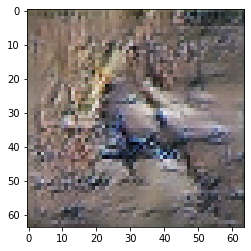

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 3

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.7064018249511719 sec
Gen loss: 1.927485415810033, Disc loss: 2.2655711864170276, Disc valid real loss: 0.39388134683433335, Disc valid fake loss: 0.4009404370659276, Disc class real loss: 0.7353871182391518, Disc class fake loss: 0.7419900109893397
Time for epoch 2 is 0.7116773128509521 sec
Gen loss: 1.7819469853451377, Disc loss: 2.16609861976222, Disc valid real loss: 0.3802087808910169, Disc valid fake loss: 0.41997609013005305, Disc class real loss: 0.6827588991114968, Disc class fake loss: 0.7509755460839522
Time for epoch 3 is 0.7084295749664307 sec
Gen loss: 1.8045497630771838, Disc loss: 2.227834883489107, Disc valid real loss: 0.4225680765352751, Disc valid fake loss: 0.4060034344070836, Disc class real loss: 0.69944461395866, Disc class fake loss: 0.7393242701103813
Time for epoch 4 is 0.7058117389678955 sec
Gen loss: 1.7249404819388139, Di

Time for epoch 31 is 0.7154860496520996 sec
Gen loss: 1.9482600751676058, Disc loss: 2.1333548583482442, Disc valid real loss: 0.3628377051729905, Disc valid fake loss: 0.38171328290512685, Disc class real loss: 0.6808718819367258, Disc class fake loss: 0.9280650929400796
Time for epoch 32 is 0.733029842376709 sec
Gen loss: 1.8050091956791126, Disc loss: 2.2113074440705147, Disc valid real loss: 0.4029549030881179, Disc valid fake loss: 0.41344213328863444, Disc class real loss: 0.6870648233514083, Disc class fake loss: 0.870477136812712
Time for epoch 33 is 0.7257118225097656 sec
Gen loss: 1.784628347346657, Disc loss: 2.2435143558602584, Disc valid real loss: 0.3988617846840306, Disc valid fake loss: 0.403804234768215, Disc class real loss: 0.7139762232178136, Disc class fake loss: 0.8238380802305121
Time for epoch 34 is 0.7209160327911377 sec
Gen loss: 1.8637809878901432, Disc loss: 2.2844633993349577, Disc valid real loss: 0.40309572690411616, Disc valid fake loss: 0.43046577196372

Time for epoch 62 is 0.7501599788665771 sec
Gen loss: 1.8003141942777132, Disc loss: 2.1603475432646904, Disc valid real loss: 0.399989316337987, Disc valid fake loss: 0.38234908329813105, Disc class real loss: 0.6610722008504366, Disc class fake loss: 0.9136031991557071
Time for epoch 63 is 0.7058992385864258 sec
Gen loss: 1.7737250139838772, Disc loss: 2.1853647859472978, Disc valid real loss: 0.37736180581544576, Disc valid fake loss: 0.421328604221344, Disc class real loss: 0.6699289648156417, Disc class fake loss: 0.8781842024702775
Time for epoch 64 is 0.7189671993255615 sec
Gen loss: 1.7862925341254787, Disc loss: 2.254555162630583, Disc valid real loss: 0.4070620364264438, Disc valid fake loss: 0.40645257971788706, Disc class real loss: 0.6998727415737352, Disc class fake loss: 0.8808056116104126
Time for epoch 65 is 0.7217402458190918 sec
Gen loss: 1.819565829477812, Disc loss: 2.145639758361013, Disc valid real loss: 0.41495055744522497, Disc valid fake loss: 0.37828562761607

Time for epoch 93 is 0.7066059112548828 sec
Gen loss: 1.8342417729528326, Disc loss: 2.205013074372944, Disc valid real loss: 0.3866908189497496, Disc valid fake loss: 0.3812479423849206, Disc class real loss: 0.7024958196439242, Disc class fake loss: 0.7991173141881039
Time for epoch 94 is 0.7066555023193359 sec
Gen loss: 1.9506713653865613, Disc loss: 2.2157473689631413, Disc valid real loss: 0.40812542250281886, Disc valid fake loss: 0.384616167921769, Disc class real loss: 0.6847735235565587, Disc class fake loss: 0.8436235189437866
Time for epoch 95 is 0.7013084888458252 sec
Gen loss: 1.8131488122438129, Disc loss: 2.23525607585907, Disc valid real loss: 0.41576171391888667, Disc valid fake loss: 0.4251146881203902, Disc class real loss: 0.6739647012007864, Disc class fake loss: 0.8104040810936376
Time for epoch 96 is 0.7057745456695557 sec
Gen loss: 1.778317231880991, Disc loss: 2.2405441246534648, Disc valid real loss: 0.41928599225847346, Disc valid fake loss: 0.387408678468905

Time for epoch 124 is 0.7809844017028809 sec
Gen loss: 1.8071510791778564, Disc loss: 2.1808557761342904, Disc valid real loss: 0.43192080447548314, Disc valid fake loss: 0.391301890737132, Disc class real loss: 0.6500516094659504, Disc class fake loss: 0.7794450584210848
Time for epoch 125 is 0.7359209060668945 sec
Gen loss: 1.8182882697958695, Disc loss: 2.2116091627823677, Disc valid real loss: 0.4138674281145397, Disc valid fake loss: 0.3959922665043881, Disc class real loss: 0.670936173514316, Disc class fake loss: 0.8046472888243826
Time for epoch 126 is 0.704042911529541 sec
Gen loss: 1.9831174423820095, Disc loss: 2.182955547382957, Disc valid real loss: 0.39418877739655345, Disc valid fake loss: 0.37501821627742365, Disc class real loss: 0.6713302041354933, Disc class fake loss: 0.8287148695243033
Time for epoch 127 is 0.7410612106323242 sec
Gen loss: 1.9214756237833124, Disc loss: 2.2542808808778463, Disc valid real loss: 0.41751070555887726, Disc valid fake loss: 0.377034080

Time for epoch 155 is 0.697160005569458 sec
Gen loss: 2.0182478553370427, Disc loss: 2.2069425708369206, Disc valid real loss: 0.3851540080810848, Disc valid fake loss: 0.38145648962573003, Disc class real loss: 0.6906048969218606, Disc class fake loss: 0.7968951840149728
Time for epoch 156 is 0.706571102142334 sec
Gen loss: 1.9221094407533343, Disc loss: 2.1977038634450814, Disc valid real loss: 0.4236917464356673, Disc valid fake loss: 0.38733549965055364, Disc class real loss: 0.6793086215069419, Disc class fake loss: 0.72946623908846
Time for epoch 157 is 0.7214429378509521 sec
Gen loss: 1.942539892698589, Disc loss: 2.18461885577754, Disc valid real loss: 0.4345262019257796, Disc valid fake loss: 0.3892173861202441, Disc class real loss: 0.6644410522360551, Disc class fake loss: 0.7213054267983687
Time for epoch 158 is 0.8032417297363281 sec
Gen loss: 1.8515356967323704, Disc loss: 2.1907320210808203, Disc valid real loss: 0.4053837437378733, Disc valid fake loss: 0.36534025716154

Time for epoch 186 is 0.7047443389892578 sec
Gen loss: 1.9045930975361873, Disc loss: 2.2366249122117696, Disc valid real loss: 0.4004746314726378, Disc valid fake loss: 0.41420997443952057, Disc class real loss: 0.6893402400769686, Disc class fake loss: 0.7540993219927737
Time for epoch 187 is 0.69844651222229 sec
Gen loss: 1.8553001253228438, Disc loss: 2.2228583160199618, Disc valid real loss: 0.4210045447475032, Disc valid fake loss: 0.3977038970119075, Disc class real loss: 0.6810301636394701, Disc class fake loss: 0.7437230379957902
Time for epoch 188 is 0.7004642486572266 sec
Gen loss: 2.0615522359546863, Disc loss: 2.191495575402912, Disc valid real loss: 0.4238968726835753, Disc valid fake loss: 0.36765452278287786, Disc class real loss: 0.6820120999687597, Disc class fake loss: 0.7351787027559782
Time for epoch 189 is 0.7350590229034424 sec
Gen loss: 1.8307390150270964, Disc loss: 2.1831682104813424, Disc valid real loss: 0.37826015447315414, Disc valid fake loss: 0.402931607

Time for epoch 217 is 0.7144801616668701 sec
Gen loss: 1.9783337304466648, Disc loss: 2.176893290720488, Disc valid real loss: 0.39815918552248103, Disc valid fake loss: 0.37905635410233546, Disc class real loss: 0.6927293633159838, Disc class fake loss: 0.7109352695314508
Time for epoch 218 is 0.7048511505126953 sec
Gen loss: 2.012209741692794, Disc loss: 2.1602287229738737, Disc valid real loss: 0.4089875393792203, Disc valid fake loss: 0.3491361533340655, Disc class real loss: 0.6897539653276142, Disc class fake loss: 0.7186590276266399
Time for epoch 219 is 0.7111098766326904 sec
Gen loss: 2.037337899208069, Disc loss: 2.1838091172670064, Disc valid real loss: 0.42228679751095016, Disc valid fake loss: 0.3812128556402106, Disc class real loss: 0.7112397708390888, Disc class fake loss: 0.6576685654489618
Time for epoch 220 is 0.7002050876617432 sec
Gen loss: 1.9831000001806962, Disc loss: 1.9650954572777999, Disc valid real loss: 0.29135017645986455, Disc valid fake loss: 0.29627819

Time for epoch 248 is 0.712554931640625 sec
Gen loss: 1.8788350883283114, Disc loss: 2.108540647908261, Disc valid real loss: 0.3879778189094443, Disc valid fake loss: 0.3912888577109889, Disc class real loss: 0.6904623853532892, Disc class fake loss: 0.6325553812478718
Time for epoch 249 is 0.7116038799285889 sec
Gen loss: 1.8054615259170532, Disc loss: 2.1379740991090475, Disc valid real loss: 0.41070690907930074, Disc valid fake loss: 0.39697435968800593, Disc class real loss: 0.6953431022794623, Disc class fake loss: 0.6277817330862346
Time for epoch 250 is 0.7902772426605225 sec
Gen loss: 1.8229650447243138, Disc loss: 1.9719837715751247, Disc valid real loss: 0.32686537504196167, Disc valid fake loss: 0.3168800818292718, Disc class real loss: 0.717152338278921, Disc class fake loss: 0.5990580994831888
Time for epoch 251 is 0.7085320949554443 sec
Gen loss: 1.9046601747211658, Disc loss: 2.1521245617615548, Disc valid real loss: 0.39504219199481766, Disc valid fake loss: 0.40273200

Time for epoch 279 is 0.7040045261383057 sec
Gen loss: 1.9147993577154059, Disc loss: 2.059540209017302, Disc valid real loss: 0.4020973663581045, Disc valid fake loss: 0.39313313364982605, Disc class real loss: 0.6804371099723013, Disc class fake loss: 0.5838919297644967
Time for epoch 280 is 0.7032761573791504 sec
Gen loss: 1.903580201299567, Disc loss: 1.8839337700291683, Disc valid real loss: 0.31638025923779134, Disc valid fake loss: 0.2944135485511077, Disc class real loss: 0.6782810499793605, Disc class fake loss: 0.594875610188434
Time for epoch 281 is 0.6989138126373291 sec
Gen loss: 1.9002317817587602, Disc loss: 2.0464823120518734, Disc valid real loss: 0.3972531196318175, Disc valid fake loss: 0.40220123686288534, Disc class real loss: 0.6925731991466723, Disc class fake loss: 0.5544823737520921
Time for epoch 282 is 0.6987993717193604 sec
Gen loss: 1.8176503746133101, Disc loss: 2.0501385613491663, Disc valid real loss: 0.39614104440337733, Disc valid fake loss: 0.39259507

Time for epoch 310 is 0.6989006996154785 sec
Gen loss: 1.7679439218420732, Disc loss: 1.953914347447847, Disc valid real loss: 0.3353096105550465, Disc valid fake loss: 0.3401535074961813, Disc class real loss: 0.7168671300536708, Disc class fake loss: 0.561615128266184
Time for epoch 311 is 0.6957035064697266 sec
Gen loss: 1.8828501826838444, Disc loss: 2.1012093895360042, Disc valid real loss: 0.40617849168024567, Disc valid fake loss: 0.40696909553126287, Disc class real loss: 0.7116435860332689, Disc class fake loss: 0.5764452705257818
Time for epoch 312 is 0.6998515129089355 sec
Gen loss: 1.965791482674448, Disc loss: 2.0416971382341886, Disc valid real loss: 0.40772294057042974, Disc valid fake loss: 0.3843130022287369, Disc class real loss: 0.668128280263198, Disc class fake loss: 0.5815502201255999
Time for epoch 313 is 0.6998827457427979 sec
Gen loss: 1.9739451220161037, Disc loss: 2.203611787996794, Disc valid real loss: 0.4150578928621192, Disc valid fake loss: 0.39356939886

Time for epoch 341 is 0.7025775909423828 sec
Gen loss: 1.8546987583762722, Disc loss: 2.098954815613596, Disc valid real loss: 0.40639169592606394, Disc valid fake loss: 0.4047304125208604, Disc class real loss: 0.716386079788208, Disc class fake loss: 0.5714756219010604
Time for epoch 342 is 0.7036879062652588 sec
Gen loss: 1.805087685585022, Disc loss: 2.1332243555470516, Disc valid real loss: 0.4088824610961111, Disc valid fake loss: 0.4047452305492602, Disc class real loss: 0.7013470279543024, Disc class fake loss: 0.6182662656432704
Time for epoch 343 is 0.7057247161865234 sec
Gen loss: 1.8227868205622624, Disc loss: 2.1016146321045723, Disc valid real loss: 0.4073690850483744, Disc valid fake loss: 0.40064519173220586, Disc class real loss: 0.7131837480946591, Disc class fake loss: 0.5804431736469269
Time for epoch 344 is 0.7102103233337402 sec
Gen loss: 1.8388706131985313, Disc loss: 2.0787362111242196, Disc valid real loss: 0.3937030481664758, Disc valid fake loss: 0.4136994151

Time for epoch 372 is 0.7217414379119873 sec
Gen loss: 1.8391273837340505, Disc loss: 2.1441332290047095, Disc valid real loss: 0.4224013184246264, Disc valid fake loss: 0.4211772021494414, Disc class real loss: 0.7225037875928377, Disc class fake loss: 0.5780798541872125
Time for epoch 373 is 0.7007863521575928 sec
Gen loss: 1.9004696231139333, Disc loss: 2.1527232998295833, Disc valid real loss: 0.4270971982102645, Disc valid fake loss: 0.41016744469341476, Disc class real loss: 0.7086034009331151, Disc class fake loss: 0.606875584313744
Time for epoch 374 is 0.7141458988189697 sec
Gen loss: 1.9723570535057469, Disc loss: 1.9962939902355796, Disc valid real loss: 0.38807401217912374, Disc valid fake loss: 0.3800750202254245, Disc class real loss: 0.7117972154366342, Disc class fake loss: 0.5163868571582594
Time for epoch 375 is 0.7177355289459229 sec
Gen loss: 1.9530825301220542, Disc loss: 2.0694023621709725, Disc valid real loss: 0.38596846084845693, Disc valid fake loss: 0.4059631

Time for epoch 403 is 0.7044687271118164 sec
Gen loss: 1.8940238136994212, Disc loss: 2.0644568769555343, Disc valid real loss: 0.4033383946669729, Disc valid fake loss: 0.43242288733783524, Disc class real loss: 0.6925702126402604, Disc class fake loss: 0.5361566669062564
Time for epoch 404 is 0.7021522521972656 sec
Gen loss: 1.895841686349166, Disc loss: 2.0838978855233443, Disc valid real loss: 0.40227533563187245, Disc valid fake loss: 0.4035893710036027, Disc class real loss: 0.7267004533817893, Disc class fake loss: 0.5513677910754555
Time for epoch 405 is 0.6995575428009033 sec
Gen loss: 1.8763157505738108, Disc loss: 2.093615594663118, Disc valid real loss: 0.39096887644968537, Disc valid fake loss: 0.40094211227015447, Disc class real loss: 0.721431807467812, Disc class fake loss: 0.5803010400972868
Time for epoch 406 is 0.706369161605835 sec
Gen loss: 1.8700942616713674, Disc loss: 2.098888315652546, Disc valid real loss: 0.4065480404778531, Disc valid fake loss: 0.4057332222

Time for epoch 434 is 0.7073855400085449 sec
Gen loss: 2.051037857407018, Disc loss: 2.036234372540524, Disc valid real loss: 0.39418619714285197, Disc valid fake loss: 0.3986439940176512, Disc class real loss: 0.6884513748319525, Disc class fake loss: 0.5549795251143607
Time for epoch 435 is 0.6985721588134766 sec
Gen loss: 1.8239928672188206, Disc loss: 2.097429131206713, Disc valid real loss: 0.40718168020248413, Disc valid fake loss: 0.4179634734203941, Disc class real loss: 0.7088295221328735, Disc class fake loss: 0.5634835409490686
Time for epoch 436 is 0.705049991607666 sec
Gen loss: 1.75955489434694, Disc loss: 2.0522599094792415, Disc valid real loss: 0.4206305710892928, Disc valid fake loss: 0.4249454595540699, Disc class real loss: 0.70638066216519, Disc class fake loss: 0.5003444160285749
Time for epoch 437 is 0.7049427032470703 sec
Gen loss: 1.8307760201002423, Disc loss: 2.122044274681493, Disc valid real loss: 0.4270197670710714, Disc valid fake loss: 0.4003260214077799

Time for epoch 465 is 0.7064883708953857 sec
Gen loss: 1.7083080191361277, Disc loss: 2.0855155555825484, Disc valid real loss: 0.4078746563509891, Disc valid fake loss: 0.4234286797674079, Disc class real loss: 0.696296657386579, Disc class fake loss: 0.5579432202012915
Time for epoch 466 is 0.7024765014648438 sec
Gen loss: 1.8937486598366184, Disc loss: 2.133206511798658, Disc valid real loss: 0.42127465731219244, Disc valid fake loss: 0.3841979644800487, Disc class real loss: 0.7528431164590936, Disc class fake loss: 0.5749263590887973
Time for epoch 467 is 0.7030489444732666 sec
Gen loss: 1.9874116997969777, Disc loss: 1.987508962028905, Disc valid real loss: 0.3836876514710878, Disc valid fake loss: 0.392106117386567, Disc class real loss: 0.7000963217333743, Disc class fake loss: 0.5116565666700664
Time for epoch 468 is 0.7037298679351807 sec
Gen loss: 1.9137756008850901, Disc loss: 1.9808904183538336, Disc valid real loss: 0.391343482230839, Disc valid fake loss: 0.3921371619952

Time for epoch 495 is 0.7188889980316162 sec
Gen loss: 1.94033304013704, Disc loss: 1.9946951928891634, Disc valid real loss: 0.40736924347124603, Disc valid fake loss: 0.4158729973592256, Disc class real loss: 0.6716798889009576, Disc class fake loss: 0.49980742523544713
Time for epoch 496 is 0.7016589641571045 sec
Gen loss: 2.0000945015957483, Disc loss: 1.997182664118315, Disc valid real loss: 0.41338490655547694, Disc valid fake loss: 0.3911133471288179, Disc class real loss: 0.7037304231995031, Disc class fake loss: 0.48899693708670766
Time for epoch 497 is 0.701831579208374 sec
Gen loss: 1.8400562374215377, Disc loss: 2.0015445445713245, Disc valid real loss: 0.4140305566160302, Disc valid fake loss: 0.40085253746886, Disc class real loss: 0.6797704006496229, Disc class fake loss: 0.5069256111195213
Time for epoch 498 is 0.7051253318786621 sec
Gen loss: 1.7498276547381753, Disc loss: 2.0610313541010807, Disc valid real loss: 0.43153355780400726, Disc valid fake loss: 0.4139404375

Time for epoch 526 is 0.7048859596252441 sec
Gen loss: 1.9326952946813483, Disc loss: 2.0488695470910323, Disc valid real loss: 0.42365683223071854, Disc valid fake loss: 0.3917585783883145, Disc class real loss: 0.6789784180490595, Disc class fake loss: 0.554500622184653
Time for epoch 527 is 0.7057108879089355 sec
Gen loss: 1.844911820010135, Disc loss: 2.0493362891046623, Disc valid real loss: 0.42598054754106623, Disc valid fake loss: 0.3996142290140453, Disc class real loss: 0.7271480340706674, Disc class fake loss: 0.49663957796598734
Time for epoch 528 is 0.7043287754058838 sec
Gen loss: 1.823247834255821, Disc loss: 2.1028664676766646, Disc valid real loss: 0.42971671725574295, Disc valid fake loss: 0.370998729216425, Disc class real loss: 0.7279230983633744, Disc class fake loss: 0.5742586615838503
Time for epoch 529 is 0.7066478729248047 sec
Gen loss: 1.8003630136188709, Disc loss: 2.174984699801395, Disc valid real loss: 0.42538616531773615, Disc valid fake loss: 0.411993603

Time for epoch 556 is 0.7293670177459717 sec
Gen loss: 1.8730769973052175, Disc loss: 2.026731723233273, Disc valid real loss: 0.3956280821248105, Disc valid fake loss: 0.40352322239624827, Disc class real loss: 0.7304995718755221, Disc class fake loss: 0.49712752825335454
Time for epoch 557 is 0.7292392253875732 sec
Gen loss: 1.8935954947220652, Disc loss: 2.088358766154239, Disc valid real loss: 0.4032415449619293, Disc valid fake loss: 0.39576084362833125, Disc class real loss: 0.7590374664256447, Disc class fake loss: 0.5303646765257183
Time for epoch 558 is 0.7250227928161621 sec
Gen loss: 1.9056417691080194, Disc loss: 2.0655630387757955, Disc valid real loss: 0.39942494662184463, Disc valid fake loss: 0.39666498334784256, Disc class real loss: 0.722504734992981, Disc class fake loss: 0.5470034762432701
Time for epoch 559 is 0.6918237209320068 sec
Gen loss: 1.8060320741251896, Disc loss: 2.0125561513398824, Disc valid real loss: 0.38642092441257675, Disc valid fake loss: 0.410642

Time for epoch 586 is 0.7210395336151123 sec
Gen loss: 1.9313598557522422, Disc loss: 2.088354367958872, Disc valid real loss: 0.410255923082954, Disc valid fake loss: 0.4283481334385119, Disc class real loss: 0.7112414303578829, Disc class fake loss: 0.5385433827575884
Time for epoch 587 is 0.7139918804168701 sec
Gen loss: 1.885132532370718, Disc loss: 2.1109823615927445, Disc valid real loss: 0.4601023604995326, Disc valid fake loss: 0.37849754095077515, Disc class real loss: 0.7424826433784083, Disc class fake loss: 0.5299423478151623
Time for epoch 588 is 0.7257723808288574 sec
Gen loss: 1.8603322066758807, Disc loss: 1.9986675852223446, Disc valid real loss: 0.4342630066369709, Disc valid fake loss: 0.3979586096186387, Disc class real loss: 0.7041778438969662, Disc class fake loss: 0.4623164973760906
Time for epoch 589 is 0.7480916976928711 sec
Gen loss: 1.9647296039681685, Disc loss: 1.9569477658522756, Disc valid real loss: 0.42726079100056696, Disc valid fake loss: 0.3704089883

Time for epoch 617 is 0.7038619518280029 sec
Gen loss: 1.6866901673768695, Disc loss: 2.055548115780479, Disc valid real loss: 0.43065737893706874, Disc valid fake loss: 0.4182264836210954, Disc class real loss: 0.7010220257859481, Disc class fake loss: 0.5056812841641275
Time for epoch 618 is 0.6974883079528809 sec
Gen loss: 1.8905134326533268, Disc loss: 2.0530348514255725, Disc valid real loss: 0.44385270695937307, Disc valid fake loss: 0.4121880499940169, Disc class real loss: 0.6735203893561112, Disc class fake loss: 0.5235036988007394
Time for epoch 619 is 0.7039999961853027 sec
Gen loss: 1.9523767170153166, Disc loss: 2.090542190953305, Disc valid real loss: 0.40298426308129964, Disc valid fake loss: 0.40946211783509506, Disc class real loss: 0.7359754756877297, Disc class fake loss: 0.5421590757997412
Time for epoch 620 is 0.7030313014984131 sec
Gen loss: 1.8176962325447483, Disc loss: 1.876157898651926, Disc valid real loss: 0.2861855924129486, Disc valid fake loss: 0.32689078

Time for epoch 647 is 0.7056572437286377 sec
Gen loss: 1.839323037549069, Disc loss: 2.068928706018548, Disc valid real loss: 0.4204008406714389, Disc valid fake loss: 0.4019157917875993, Disc class real loss: 0.7585424373024389, Disc class fake loss: 0.488123733746378
Time for epoch 648 is 0.7137894630432129 sec
Gen loss: 1.9181868402581466, Disc loss: 2.008058340925919, Disc valid real loss: 0.4002026554785277, Disc valid fake loss: 0.3984224074765256, Disc class real loss: 0.7121360082375375, Disc class fake loss: 0.4973402101742594
Time for epoch 649 is 0.7052114009857178 sec
Gen loss: 1.878744508090772, Disc loss: 2.0280391479793347, Disc valid real loss: 0.3919660715680373, Disc valid fake loss: 0.40050805869855377, Disc class real loss: 0.7448403866667497, Disc class fake loss: 0.4907754471427516
Time for epoch 650 is 0.7041819095611572 sec
Gen loss: 1.908099601143285, Disc loss: 1.8341319498262907, Disc valid real loss: 0.3177232381544615, Disc valid fake loss: 0.30880899021500

Time for epoch 678 is 0.7015650272369385 sec
Gen loss: 1.9418495454286273, Disc loss: 2.0100838636097156, Disc valid real loss: 0.3854949615503612, Disc valid fake loss: 0.38413142687396, Disc class real loss: 0.6898458443189922, Disc class fake loss: 0.5506394332961032
Time for epoch 679 is 0.7023148536682129 sec
Gen loss: 1.7021914720535278, Disc loss: 2.0923681761089123, Disc valid real loss: 0.421736257640939, Disc valid fake loss: 0.39831073033182246, Disc class real loss: 0.734713143423984, Disc class fake loss: 0.5376474637734262
Time for epoch 680 is 0.702681303024292 sec
Gen loss: 1.7711666069532697, Disc loss: 1.9202623492793034, Disc valid real loss: 0.34397244296575846, Disc valid fake loss: 0.3372294087159006, Disc class real loss: 0.7134612077160886, Disc class fake loss: 0.5256368643359134
Time for epoch 681 is 0.697230339050293 sec
Gen loss: 1.9532484129855507, Disc loss: 1.920231543089214, Disc valid real loss: 0.38529389155538457, Disc valid fake loss: 0.3930000600061

Time for epoch 709 is 0.720348596572876 sec
Gen loss: 1.8775903174751682, Disc loss: 2.018990911935505, Disc valid real loss: 0.3884286276604, Disc valid fake loss: 0.3820691869447106, Disc class real loss: 0.6989668576340926, Disc class fake loss: 0.5495561173087672
Time for epoch 710 is 0.6953070163726807 sec
Gen loss: 1.8027109786083824, Disc loss: 1.868167049006412, Disc valid real loss: 0.3103999589618884, Disc valid fake loss: 0.32082442076582657, Disc class real loss: 0.7066485975918017, Disc class fake loss: 0.5303293811647516
Time for epoch 711 is 0.6976773738861084 sec
Gen loss: 1.8348860615178157, Disc loss: 2.0546533810464958, Disc valid real loss: 0.4024231324070378, Disc valid fake loss: 0.42321546924741643, Disc class real loss: 0.7157308710248846, Disc class fake loss: 0.5133244081547386
Time for epoch 712 is 0.7158691883087158 sec
Gen loss: 1.8154295243714984, Disc loss: 1.9796599024220516, Disc valid real loss: 0.3969070691811411, Disc valid fake loss: 0.4001078589966

Time for epoch 739 is 0.7032644748687744 sec
Gen loss: 1.9539448713001453, Disc loss: 2.015600461708872, Disc valid real loss: 0.4057222385155527, Disc valid fake loss: 0.38029936740272924, Disc class real loss: 0.6787164901432238, Disc class fake loss: 0.5508879203545419
Time for epoch 740 is 0.7035665512084961 sec
Gen loss: 1.8642677821611102, Disc loss: 1.8237669467926025, Disc valid real loss: 0.3105789203392832, Disc valid fake loss: 0.30616546069320877, Disc class real loss: 0.7144097748555636, Disc class fake loss: 0.49265714695579127
Time for epoch 741 is 0.7092623710632324 sec
Gen loss: 1.8153122349789268, Disc loss: 2.032929451842057, Disc valid real loss: 0.39219395424190323, Disc valid fake loss: 0.3956408014422969, Disc class real loss: 0.7305275484135276, Disc class fake loss: 0.5146103218982094
Time for epoch 742 is 0.7088627815246582 sec
Gen loss: 1.8201481041155363, Disc loss: 2.0046466777199194, Disc valid real loss: 0.3956235741314135, Disc valid fake loss: 0.3843896

Time for epoch 769 is 0.7049696445465088 sec
Gen loss: 1.9660339104501825, Disc loss: 1.982679712144952, Disc valid real loss: 0.39029235275168167, Disc valid fake loss: 0.4147452743429887, Disc class real loss: 0.7238924346472088, Disc class fake loss: 0.45380367103375885
Time for epoch 770 is 0.7035117149353027 sec
Gen loss: 1.958630737505461, Disc loss: 1.7865034404553866, Disc valid real loss: 0.2976306080818176, Disc valid fake loss: 0.2946408689022064, Disc class real loss: 0.7199272074197468, Disc class fake loss: 0.4743538859643434
Time for epoch 771 is 0.6991839408874512 sec
Gen loss: 1.9065676174665753, Disc loss: 2.0409827044135644, Disc valid real loss: 0.40312495043403224, Disc valid fake loss: 0.3886814274285969, Disc class real loss: 0.7452950289374903, Disc class fake loss: 0.5039295867869729
Time for epoch 772 is 0.7043912410736084 sec
Gen loss: 1.9029456565254612, Disc loss: 1.9163632141916376, Disc valid real loss: 0.4019240815388529, Disc valid fake loss: 0.38545178

Time for epoch 799 is 0.7243633270263672 sec
Gen loss: 1.8745382522281848, Disc loss: 1.9731920330147994, Disc valid real loss: 0.38879686123446416, Disc valid fake loss: 0.4046086543484738, Disc class real loss: 0.691068592824434, Disc class fake loss: 0.48875841027811956
Time for epoch 800 is 0.7237133979797363 sec
Gen loss: 1.931535940421255, Disc loss: 1.8353671964846159, Disc valid real loss: 0.3282658912633595, Disc valid fake loss: 0.3066492959072715, Disc class real loss: 0.7377308512988844, Disc class fake loss: 0.46277614957407903
Time for epoch 801 is 0.7868778705596924 sec
Gen loss: 1.7312407305366115, Disc loss: 2.024086017357676, Disc valid real loss: 0.4161936907391799, Disc valid fake loss: 0.4481395483016968, Disc class real loss: 0.7267237086045114, Disc class fake loss: 0.43308781950097336
Time for epoch 802 is 0.7249941825866699 sec
Gen loss: 1.8070475364986218, Disc loss: 2.0703865477913306, Disc valid real loss: 0.42446060870823105, Disc valid fake loss: 0.4133140

Time for epoch 829 is 0.7031810283660889 sec
Gen loss: 1.8074730760172795, Disc loss: 2.032415327272917, Disc valid real loss: 0.389200779952501, Disc valid fake loss: 0.41333778280960887, Disc class real loss: 0.705910042712563, Disc class fake loss: 0.5240030712202975
Time for epoch 830 is 0.7019000053405762 sec
Gen loss: 1.8191278984672146, Disc loss: 1.8175891763285588, Disc valid real loss: 0.316206273279692, Disc valid fake loss: 0.311446665148986, Disc class real loss: 0.7006596671907526, Disc class fake loss: 0.489318858636053
Time for epoch 831 is 0.7087500095367432 sec
Gen loss: 1.8265425845196372, Disc loss: 1.9877928181698448, Disc valid real loss: 0.4137632093931499, Disc valid fake loss: 0.4093616447950664, Disc class real loss: 0.7216726416035703, Disc class fake loss: 0.44305108252324554
Time for epoch 832 is 0.7076370716094971 sec
Gen loss: 1.7953662307638871, Disc loss: 2.0067511922434758, Disc valid real loss: 0.4019900858402252, Disc valid fake loss: 0.4175334823758

Time for epoch 860 is 0.6987566947937012 sec
Gen loss: 1.8269391561809338, Disc loss: 1.8490601464321739, Disc valid real loss: 0.3339967868830028, Disc valid fake loss: 0.32527876998248856, Disc class real loss: 0.7143818234142504, Disc class fake loss: 0.4754505392752196
Time for epoch 861 is 0.7002370357513428 sec
Gen loss: 1.858614902747305, Disc loss: 2.0132598437761007, Disc valid real loss: 0.41353791324715866, Disc valid fake loss: 0.4105362782352849, Disc class real loss: 0.6818806529045105, Disc class fake loss: 0.5073399653560237
Time for epoch 862 is 0.6973261833190918 sec
Gen loss: 1.782205619310078, Disc loss: 1.9607674699080617, Disc valid real loss: 0.39568856515382467, Disc valid fake loss: 0.4200421414877239, Disc class real loss: 0.7090993241259926, Disc class fake loss: 0.43599204640639455
Time for epoch 863 is 0.7036914825439453 sec
Gen loss: 1.7460158624147113, Disc loss: 2.0868557691574097, Disc valid real loss: 0.41677446584952504, Disc valid fake loss: 0.434134

Time for epoch 891 is 0.6995072364807129 sec
Gen loss: 1.968163345989428, Disc loss: 1.984631808180558, Disc valid real loss: 0.4161654946051146, Disc valid fake loss: 0.40262539292636673, Disc class real loss: 0.7138731354161313, Disc class fake loss: 0.4520201745786165
Time for epoch 892 is 0.696237325668335 sec
Gen loss: 1.9927506572321843, Disc loss: 2.0123852428637052, Disc valid real loss: 0.4023745797182384, Disc valid fake loss: 0.42150748246594477, Disc class real loss: 0.7108616201501143, Disc class fake loss: 0.47768820273248774
Time for epoch 893 is 0.7049734592437744 sec
Gen loss: 1.8534054567939358, Disc loss: 2.0722374288659346, Disc valid real loss: 0.42838949435635615, Disc valid fake loss: 0.4155128206077375, Disc class real loss: 0.7235567350136606, Disc class fake loss: 0.504822142814335
Time for epoch 894 is 0.7017240524291992 sec
Gen loss: 1.784508516913966, Disc loss: 2.0490516675146004, Disc valid real loss: 0.42784211823814794, Disc valid fake loss: 0.388073106

Time for epoch 921 is 0.6988551616668701 sec
Gen loss: 1.8364164452803762, Disc loss: 1.9797359454004388, Disc valid real loss: 0.4082975105235451, Disc valid fake loss: 0.40019886587795456, Disc class real loss: 0.6927448573865389, Disc class fake loss: 0.47853752970695496
Time for epoch 922 is 0.701897144317627 sec
Gen loss: 1.844166071791398, Disc loss: 1.9387036624707674, Disc valid real loss: 0.3754670055289018, Disc valid fake loss: 0.4125053961026041, Disc class real loss: 0.7016605389745612, Disc class fake loss: 0.44912121013591166
Time for epoch 923 is 0.6994881629943848 sec
Gen loss: 1.8635249326103611, Disc loss: 1.9828952550888062, Disc valid real loss: 0.3824922050300397, Disc valid fake loss: 0.3989976550403394, Disc class real loss: 0.6952460847402874, Disc class fake loss: 0.5061971215825332
Time for epoch 924 is 0.7043688297271729 sec
Gen loss: 1.829979802432813, Disc loss: 2.051852866222984, Disc valid real loss: 0.4277180919521733, Disc valid fake loss: 0.4045682737

Time for epoch 952 is 0.7512340545654297 sec
Gen loss: 1.7607609159068058, Disc loss: 2.0108632978640104, Disc valid real loss: 0.43220019654223796, Disc valid fake loss: 0.42157180999454696, Disc class real loss: 0.6757661198314867, Disc class fake loss: 0.481364065094998
Time for epoch 953 is 0.7610185146331787 sec
Gen loss: 1.7431428495206331, Disc loss: 1.960201012460809, Disc valid real loss: 0.3877489394263217, Disc valid fake loss: 0.4202151596546173, Disc class real loss: 0.6899587543387162, Disc class fake loss: 0.4623236922841323
Time for epoch 954 is 0.6993546485900879 sec
Gen loss: 1.9265244069852328, Disc loss: 1.991753051155492, Disc valid real loss: 0.3992807394579837, Disc valid fake loss: 0.42650084119094045, Disc class real loss: 0.6718368216564781, Disc class fake loss: 0.4941701779240056
Time for epoch 955 is 0.7002353668212891 sec
Gen loss: 1.8388944676047878, Disc loss: 2.018246700889186, Disc valid real loss: 0.3826365047379544, Disc valid fake loss: 0.4049258749

Time for epoch 982 is 0.7098586559295654 sec
Gen loss: 1.755964197610554, Disc loss: 2.068807281945881, Disc valid real loss: 0.42075163910263463, Disc valid fake loss: 0.3924473492722762, Disc class real loss: 0.7360838588915373, Disc class fake loss: 0.5195677452965787
Time for epoch 983 is 0.7389023303985596 sec
Gen loss: 1.9190625140541477, Disc loss: 2.003845792067678, Disc valid real loss: 0.41229555167649923, Disc valid fake loss: 0.4045475988011611, Disc class real loss: 0.7322367178766351, Disc class fake loss: 0.45482139995223597
Time for epoch 984 is 0.7348084449768066 sec
Gen loss: 1.8983558730075234, Disc loss: 1.9857263188613088, Disc valid real loss: 0.39287975587342916, Disc valid fake loss: 0.4324861843335001, Disc class real loss: 0.7191727977049979, Disc class fake loss: 0.4412431638491781
Time for epoch 985 is 0.7001969814300537 sec
Gen loss: 1.9725387472855418, Disc loss: 1.9803737339220548, Disc valid real loss: 0.37152813923986333, Disc valid fake loss: 0.3807302

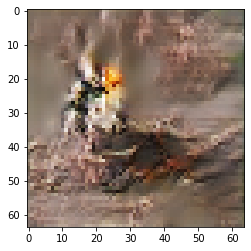

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 4

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6984670162200928 sec
Gen loss: 1.7459480825223421, Disc loss: 2.2934427198610807, Disc valid real loss: 0.38393932424093546, Disc valid fake loss: 0.4286536511621977, Disc class real loss: 0.7406751011547289, Disc class fake loss: 0.4356915903718848
Time for epoch 2 is 0.7021770477294922 sec
Gen loss: 1.9186709993763973, Disc loss: 2.234204731489483, Disc valid real loss: 0.4127511037023444, Disc valid fake loss: 0.4228934300573249, Disc class real loss: 0.6997852890115035, Disc class fake loss: 0.5113005198930439
Time for epoch 3 is 0.7000079154968262 sec
Gen loss: 1.8264507431732981, Disc loss: 2.1942944652155827, Disc valid real loss: 0.38209960962596695, Disc valid fake loss: 0.417504862735146, Disc class real loss: 0.698239200993588, Disc class fake loss: 0.4906144408803237
Time for epoch 4 is 0.6910009384155273 sec
Gen loss: 1.7686602943821956,

Time for epoch 31 is 0.6926925182342529 sec
Gen loss: 1.7496831166116815, Disc loss: 2.160431880699961, Disc valid real loss: 0.4079099501434125, Disc valid fake loss: 0.4172183432077107, Disc class real loss: 0.6708564883784244, Disc class fake loss: 0.6124618225976041
Time for epoch 32 is 0.6956841945648193 sec
Gen loss: 1.7851310968399048, Disc loss: 2.1687389173005758, Disc valid real loss: 0.4053154728914562, Disc valid fake loss: 0.3923794642875069, Disc class real loss: 0.6915314699474134, Disc class fake loss: 0.5857951892049689
Time for epoch 33 is 0.6973662376403809 sec
Gen loss: 1.751246872701143, Disc loss: 2.2050755965082267, Disc valid real loss: 0.4013808887255819, Disc valid fake loss: 0.4120662588822214, Disc class real loss: 0.7009984097982708, Disc class fake loss: 0.6120286803496512
Time for epoch 34 is 0.694774866104126 sec
Gen loss: 1.8890544615293805, Disc loss: 2.1984373707520333, Disc valid real loss: 0.38925233640168844, Disc valid fake loss: 0.405190045112057

Time for epoch 62 is 0.6984333992004395 sec
Gen loss: 1.9032484606692666, Disc loss: 2.1447101831436157, Disc valid real loss: 0.41952098357050044, Disc valid fake loss: 0.3996157850089826, Disc class real loss: 0.6688892088438335, Disc class fake loss: 0.6135568446234653
Time for epoch 63 is 0.7027454376220703 sec
Gen loss: 1.7679576371845447, Disc loss: 2.1785337423023425, Disc valid real loss: 0.40676700912023844, Disc valid fake loss: 0.41127327711958633, Disc class real loss: 0.6928743908279821, Disc class fake loss: 0.5805646604613254
Time for epoch 64 is 0.6994833946228027 sec
Gen loss: 1.7881517159311395, Disc loss: 2.123376018122623, Disc valid real loss: 0.4007328168341988, Disc valid fake loss: 0.39961022609158564, Disc class real loss: 0.666183739900589, Disc class fake loss: 0.6256751747507798
Time for epoch 65 is 0.6952886581420898 sec
Gen loss: 1.7355540865346004, Disc loss: 2.180312056290476, Disc valid real loss: 0.3882384362973665, Disc valid fake loss: 0.410404211596

Time for epoch 93 is 0.759099006652832 sec
Gen loss: 1.8815686702728271, Disc loss: 2.1529096364974976, Disc valid real loss: 0.38772510227404144, Disc valid fake loss: 0.4017657198404011, Disc class real loss: 0.6905493642154493, Disc class fake loss: 0.6374580734654477
Time for epoch 94 is 0.7115094661712646 sec
Gen loss: 1.9171902066782902, Disc loss: 2.1554418551294425, Disc valid real loss: 0.3999408781528473, Disc valid fake loss: 0.39164759924537257, Disc class real loss: 0.7061543652885839, Disc class fake loss: 0.5621873375616575
Time for epoch 95 is 0.7099981307983398 sec
Gen loss: 1.8344462608036243, Disc loss: 2.132315434907612, Disc valid real loss: 0.3910043929752551, Disc valid fake loss: 0.388301283121109, Disc class real loss: 0.6826748659736231, Disc class fake loss: 0.6464282195819052
Time for epoch 96 is 0.7128334045410156 sec
Gen loss: 1.879073419068989, Disc loss: 2.076976355753447, Disc valid real loss: 0.39407905700959656, Disc valid fake loss: 0.413834702027471

Time for epoch 124 is 0.706749439239502 sec
Gen loss: 1.8402349760657863, Disc loss: 2.1579152282915617, Disc valid real loss: 0.3930913225600594, Disc valid fake loss: 0.3987723808539541, Disc class real loss: 0.7049355475526107, Disc class fake loss: 0.6062644625964918
Time for epoch 125 is 0.7024252414703369 sec
Gen loss: 1.8135900999370373, Disc loss: 2.116961861911573, Disc valid real loss: 0.4072063439770749, Disc valid fake loss: 0.4063055766256232, Disc class real loss: 0.6663703604748374, Disc class fake loss: 0.6009373555057927
Time for epoch 126 is 0.7157011032104492 sec
Gen loss: 1.8816112217150236, Disc loss: 2.1964730338046423, Disc valid real loss: 0.4394066255343588, Disc valid fake loss: 0.4068112640004409, Disc class real loss: 0.7117706725471898, Disc class fake loss: 0.5494894887271681
Time for epoch 127 is 0.7391762733459473 sec
Gen loss: 1.8650725891715603, Disc loss: 2.1446371203974675, Disc valid real loss: 0.423235380335858, Disc valid fake loss: 0.401936400877

Time for epoch 155 is 0.7056295871734619 sec
Gen loss: 1.858868448357833, Disc loss: 2.0954643362446834, Disc valid real loss: 0.4003665666831167, Disc valid fake loss: 0.3883825587598901, Disc class real loss: 0.689922571182251, Disc class fake loss: 0.5584009870102531
Time for epoch 156 is 0.7092564105987549 sec
Gen loss: 1.877772193205984, Disc loss: 2.074077901087309, Disc valid real loss: 0.3966884267957587, Disc valid fake loss: 0.40946112651573985, Disc class real loss: 0.6548380224328292, Disc class fake loss: 0.5803766689802471
Time for epoch 157 is 0.7009789943695068 sec
Gen loss: 1.8497430525327985, Disc loss: 2.0433551135816073, Disc valid real loss: 0.3785140781026137, Disc valid fake loss: 0.4137460542352576, Disc class real loss: 0.6625552961700841, Disc class fake loss: 0.5311331529366342
Time for epoch 158 is 0.7012934684753418 sec
Gen loss: 1.8399948697341115, Disc loss: 2.0643704376722636, Disc valid real loss: 0.3982569747849515, Disc valid fake loss: 0.394970876605

Time for epoch 186 is 0.7090930938720703 sec
Gen loss: 1.8142127990722656, Disc loss: 2.0532756416421187, Disc valid real loss: 0.3932678966145766, Disc valid fake loss: 0.3996474005674061, Disc class real loss: 0.6848388973035311, Disc class fake loss: 0.5210610988893007
Time for epoch 187 is 0.704146146774292 sec
Gen loss: 1.839524036959598, Disc loss: 2.0984188067285636, Disc valid real loss: 0.41162708872242976, Disc valid fake loss: 0.41633464944990056, Disc class real loss: 0.6670729737532767, Disc class fake loss: 0.5723281581150857
Time for epoch 188 is 0.7045567035675049 sec
Gen loss: 1.8658845173685175, Disc loss: 2.1779383420944214, Disc valid real loss: 0.43604784576516403, Disc valid fake loss: 0.42726071884757594, Disc class real loss: 0.7146050459460208, Disc class fake loss: 0.5448189691493386
Time for epoch 189 is 0.7096555233001709 sec
Gen loss: 1.8223564875753302, Disc loss: 2.0321180757723356, Disc valid real loss: 0.3790742315744099, Disc valid fake loss: 0.4015608

Time for epoch 217 is 0.703744649887085 sec
Gen loss: 2.081568799520794, Disc loss: 2.0540559103614404, Disc valid real loss: 0.3896404034213016, Disc valid fake loss: 0.38754019454905864, Disc class real loss: 0.7092583148103011, Disc class fake loss: 0.527439053121366
Time for epoch 218 is 0.7018883228302002 sec
Gen loss: 1.9507318860606144, Disc loss: 2.0042218660053455, Disc valid real loss: 0.38990860550027145, Disc valid fake loss: 0.3911008309376867, Disc class real loss: 0.6725048454184281, Disc class fake loss: 0.5169774858575118
Time for epoch 219 is 0.7037878036499023 sec
Gen loss: 1.7895484347092478, Disc loss: 2.0252560063412317, Disc valid real loss: 0.3771432732280932, Disc valid fake loss: 0.3855086408163372, Disc class real loss: 0.6950740029937342, Disc class fake loss: 0.5328395931344283
Time for epoch 220 is 0.7012031078338623 sec
Gen loss: 1.7998006030132896, Disc loss: 1.8544235041266994, Disc valid real loss: 0.337385356426239, Disc valid fake loss: 0.31596323063

Time for epoch 248 is 0.7049281597137451 sec
Gen loss: 1.9217042609264976, Disc loss: 1.8776868707255314, Disc valid real loss: 0.39740531695516484, Disc valid fake loss: 0.3980445422624287, Disc class real loss: 0.6590380543156674, Disc class fake loss: 0.39433494210243225
Time for epoch 249 is 0.7069673538208008 sec
Gen loss: 1.9077123968224776, Disc loss: 1.9824357722934924, Disc valid real loss: 0.39202896544807836, Disc valid fake loss: 0.4023356986673255, Disc class real loss: 0.7047880511534842, Disc class fake loss: 0.4571970450250726
Time for epoch 250 is 0.7149975299835205 sec
Gen loss: 1.8570125416705483, Disc loss: 1.7450730486920005, Disc valid real loss: 0.3019722574635556, Disc valid fake loss: 0.31704165433582504, Disc class real loss: 0.676815600771653, Disc class fake loss: 0.4235343956633618
Time for epoch 251 is 0.7060444355010986 sec
Gen loss: 1.9695544619309275, Disc loss: 2.0187585604818246, Disc valid real loss: 0.4130822027984418, Disc valid fake loss: 0.420431

Time for epoch 278 is 0.6986594200134277 sec
Gen loss: 2.0303681524176347, Disc loss: 1.9842935549585443, Disc valid real loss: 0.41505667253544454, Disc valid fake loss: 0.3910091833064431, Disc class real loss: 0.712678915575931, Disc class fake loss: 0.46528838025896174
Time for epoch 279 is 0.7021257877349854 sec
Gen loss: 1.837442435716328, Disc loss: 1.881203620057357, Disc valid real loss: 0.3819571278597179, Disc valid fake loss: 0.4149896518180245, Disc class real loss: 0.6794219424850062, Disc class fake loss: 0.4048898314174853
Time for epoch 280 is 0.6995663642883301 sec
Gen loss: 2.0099026152962134, Disc loss: 1.7492613290485584, Disc valid real loss: 0.3004940136482841, Disc valid fake loss: 0.2969256749278621, Disc class real loss: 0.7066038219552291, Disc class fake loss: 0.4452900933591943
Time for epoch 281 is 0.7302544116973877 sec
Gen loss: 2.0146081322117855, Disc loss: 1.8594049278058504, Disc valid real loss: 0.3746845957479979, Disc valid fake loss: 0.3904696342

Time for epoch 308 is 0.7319233417510986 sec
Gen loss: 1.9683645461734973, Disc loss: 1.8939844307146574, Disc valid real loss: 0.4071727316630514, Disc valid fake loss: 0.4073001287485424, Disc class real loss: 0.6932206969512137, Disc class fake loss: 0.3863522528033507
Time for epoch 309 is 0.7270491123199463 sec
Gen loss: 1.9315870561097797, Disc loss: 1.9398823976516724, Disc valid real loss: 0.3725044735168156, Disc valid fake loss: 0.45729752590781764, Disc class real loss: 0.7055833025982505, Disc class fake loss: 0.4045573135739879
Time for epoch 310 is 0.7020986080169678 sec
Gen loss: 1.9175206422805786, Disc loss: 1.7189980745315552, Disc valid real loss: 0.3102718811286123, Disc valid fake loss: 0.32042677778946727, Disc class real loss: 0.6797223436205011, Disc class fake loss: 0.4086313216309798
Time for epoch 311 is 0.6959211826324463 sec
Gen loss: 1.9233245222192061, Disc loss: 1.9730184329183478, Disc valid real loss: 0.39993790419478165, Disc valid fake loss: 0.423660

Time for epoch 338 is 0.7065160274505615 sec
Gen loss: 2.036748722979897, Disc loss: 1.9171470089962608, Disc valid real loss: 0.39964415054572255, Disc valid fake loss: 0.40983433943045766, Disc class real loss: 0.6849127505954943, Disc class fake loss: 0.4228082032580125
Time for epoch 339 is 0.722618818283081 sec
Gen loss: 1.9368978676043058, Disc loss: 1.941198938771298, Disc valid real loss: 0.39887073322346334, Disc valid fake loss: 0.4115320883299175, Disc class real loss: 0.7044489791518763, Disc class fake loss: 0.4264027491996163
Time for epoch 340 is 0.7171669006347656 sec
Gen loss: 1.8396334710874056, Disc loss: 1.7642408609390259, Disc valid real loss: 0.3109793161091052, Disc valid fake loss: 0.32450582792884425, Disc class real loss: 0.7340556006682547, Disc class fake loss: 0.394767994943418
Time for epoch 341 is 0.7047743797302246 sec
Gen loss: 1.8175912656282123, Disc loss: 1.9289615530716746, Disc valid real loss: 0.4077132689325433, Disc valid fake loss: 0.417452735

Time for epoch 368 is 0.786372184753418 sec
Gen loss: 1.9090953939839412, Disc loss: 1.9239027311927395, Disc valid real loss: 0.37850815214608846, Disc valid fake loss: 0.4106676045217012, Disc class real loss: 0.7382771278682508, Disc class fake loss: 0.396518222595516
Time for epoch 369 is 0.7353405952453613 sec
Gen loss: 1.9041986465454102, Disc loss: 1.9174863351018805, Disc valid real loss: 0.4031746340425391, Disc valid fake loss: 0.3995175063610077, Disc class real loss: 0.7213235026911685, Disc class fake loss: 0.3935362665276778
Time for epoch 370 is 0.7825360298156738 sec
Gen loss: 1.9130955871782804, Disc loss: 1.7525818096963983, Disc valid real loss: 0.3308232850150058, Disc valid fake loss: 0.3160963183955142, Disc class real loss: 0.699243216138137, Disc class fake loss: 0.4064775415157017
Time for epoch 371 is 0.7306222915649414 sec
Gen loss: 1.8486469921312834, Disc loss: 1.9447351882332249, Disc valid real loss: 0.3906322513755999, Disc valid fake loss: 0.40675203737

Time for epoch 398 is 0.7026572227478027 sec
Gen loss: 2.121374933343185, Disc loss: 1.9054764320975857, Disc valid real loss: 0.37234756036808614, Disc valid fake loss: 0.40149106791144923, Disc class real loss: 0.7229819078194467, Disc class fake loss: 0.40871874752797577
Time for epoch 399 is 0.7173426151275635 sec
Gen loss: 1.883288722289236, Disc loss: 1.9046887661281384, Disc valid real loss: 0.3906811365955754, Disc valid fake loss: 0.4146015471533725, Disc class real loss: 0.6971127234007183, Disc class fake loss: 0.40235232679467453
Time for epoch 400 is 0.7023704051971436 sec
Gen loss: 1.8200258894970542, Disc loss: 1.811610930844357, Disc valid real loss: 0.3369348284445311, Disc valid fake loss: 0.3398075825289676, Disc class real loss: 0.725544179740705, Disc class fake loss: 0.4093875728155437
Time for epoch 401 is 0.712416410446167 sec
Gen loss: 1.9202085733413696, Disc loss: 1.9335738169519525, Disc valid real loss: 0.42148227597537796, Disc valid fake loss: 0.439799576

Time for epoch 428 is 0.7038376331329346 sec
Gen loss: 1.9152309329886186, Disc loss: 1.9603750266526874, Disc valid real loss: 0.39670012969719737, Disc valid fake loss: 0.40824725282819646, Disc class real loss: 0.7113386455335116, Disc class fake loss: 0.4441424420005397
Time for epoch 429 is 0.7032265663146973 sec
Gen loss: 2.0488418905358565, Disc loss: 1.9247455534182096, Disc valid real loss: 0.3952171206474304, Disc valid fake loss: 0.3842044213884755, Disc class real loss: 0.7024129691876864, Disc class fake loss: 0.44296293666488246
Time for epoch 430 is 0.7447354793548584 sec
Gen loss: 1.8802073441053693, Disc loss: 1.6900332664188586, Disc valid real loss: 0.30944508941550003, Disc valid fake loss: 0.31248483218644796, Disc class real loss: 0.70970702798743, Disc class fake loss: 0.35846659227421407
Time for epoch 431 is 0.7246668338775635 sec
Gen loss: 1.8179709095703929, Disc loss: 2.034119041342484, Disc valid real loss: 0.3885948940327293, Disc valid fake loss: 0.424085

Time for epoch 458 is 0.708329439163208 sec
Gen loss: 1.910239853357014, Disc loss: 1.8859504586771916, Disc valid real loss: 0.39512207947279276, Disc valid fake loss: 0.3814030415133426, Disc class real loss: 0.7133959594525789, Disc class fake loss: 0.3960928399311869
Time for epoch 459 is 0.7071125507354736 sec
Gen loss: 1.8861551974949085, Disc loss: 1.9097035433116711, Disc valid real loss: 0.41370527995260137, Disc valid fake loss: 0.3860142262358415, Disc class real loss: 0.7224581586687189, Disc class fake loss: 0.3875928709381505
Time for epoch 460 is 0.7477526664733887 sec
Gen loss: 2.050058866802015, Disc loss: 1.7298906539615833, Disc valid real loss: 0.30256410178385285, Disc valid fake loss: 0.2968800758060656, Disc class real loss: 0.6982011387222692, Disc class fake loss: 0.4322985285206845
Time for epoch 461 is 0.7104051113128662 sec
Gen loss: 2.0465382149344995, Disc loss: 1.9000002961409719, Disc valid real loss: 0.3909770093466106, Disc valid fake loss: 0.401824705

Time for epoch 488 is 0.7050082683563232 sec
Gen loss: 2.0676507573378715, Disc loss: 1.9251583438170583, Disc valid real loss: 0.39374539569804545, Disc valid fake loss: 0.4084685460517281, Disc class real loss: 0.725055173823708, Disc class fake loss: 0.39795470394586263
Time for epoch 489 is 0.701613187789917 sec
Gen loss: 1.9505713174217625, Disc loss: 1.8284511691645573, Disc valid real loss: 0.3705046412191893, Disc valid fake loss: 0.3747135165490602, Disc class real loss: 0.7012387012180529, Disc class fake loss: 0.38205814047863607
Time for epoch 490 is 0.7149953842163086 sec
Gen loss: 1.9301487081929256, Disc loss: 1.6894714957789372, Disc valid real loss: 0.29665586273921163, Disc valid fake loss: 0.3087887763977051, Disc class real loss: 0.7121491714527732, Disc class fake loss: 0.37194572545980153
Time for epoch 491 is 0.7030696868896484 sec
Gen loss: 1.9421851572237516, Disc loss: 1.9043722905610736, Disc valid real loss: 0.4010363832900399, Disc valid fake loss: 0.401645

Time for epoch 518 is 0.7062416076660156 sec
Gen loss: 1.7813749376096224, Disc loss: 1.9129513000187122, Disc valid real loss: 0.42391728413732427, Disc valid fake loss: 0.4043943082031451, Disc class real loss: 0.7155688781487314, Disc class fake loss: 0.3691401065964448
Time for epoch 519 is 0.7412588596343994 sec
Gen loss: 1.9303522172727083, Disc loss: 1.9199560002276772, Disc valid real loss: 0.4102297927203931, Disc valid fake loss: 0.39359508062663834, Disc class real loss: 0.6796021492857682, Disc class fake loss: 0.4365775859669635
Time for epoch 520 is 0.736922025680542 sec
Gen loss: 1.9874471488751864, Disc loss: 1.6936929539630288, Disc valid real loss: 0.2913339828190051, Disc valid fake loss: 0.28705967256897374, Disc class real loss: 0.732656369083806, Disc class fake loss: 0.38271291632401316
Time for epoch 521 is 0.7074527740478516 sec
Gen loss: 1.9035776602594476, Disc loss: 1.8851597497337742, Disc valid real loss: 0.3569538483494206, Disc valid fake loss: 0.3972140

Time for epoch 548 is 0.7015390396118164 sec
Gen loss: 1.9971009179165489, Disc loss: 1.9725895241687172, Disc valid real loss: 0.41733003133221674, Disc valid fake loss: 0.4190819937931864, Disc class real loss: 0.7288764558340374, Disc class fake loss: 0.4073653550524461
Time for epoch 549 is 0.705481767654419 sec
Gen loss: 1.8726387086667513, Disc loss: 1.8953994575299715, Disc valid real loss: 0.4194565917316236, Disc valid fake loss: 0.4127921775767678, Disc class real loss: 0.7227156350487157, Disc class fake loss: 0.34051153455909927
Time for epoch 550 is 0.7012660503387451 sec
Gen loss: 1.8003992344203747, Disc loss: 1.7270714295537848, Disc valid real loss: 0.35982041923623337, Disc valid fake loss: 0.3482697496288701, Disc class real loss: 0.6819480061531067, Disc class fake loss: 0.33710221867812307
Time for epoch 551 is 0.7008466720581055 sec
Gen loss: 1.7619592704271014, Disc loss: 1.9074210806896812, Disc valid real loss: 0.39256069534703303, Disc valid fake loss: 0.41559

Time for epoch 579 is 0.702035665512085 sec
Gen loss: 1.8015526784093756, Disc loss: 1.9420066695464284, Disc valid real loss: 0.4030998568785818, Disc valid fake loss: 0.42421118366090876, Disc class real loss: 0.7385081021409285, Disc class fake loss: 0.37625995356785624
Time for epoch 580 is 0.6985657215118408 sec
Gen loss: 1.790183519062243, Disc loss: 1.7220532266717208, Disc valid real loss: 0.3360417297011928, Disc valid fake loss: 0.3364781439304352, Disc class real loss: 0.6864591836929321, Disc class fake loss: 0.3631388592092614
Time for epoch 581 is 0.7504334449768066 sec
Gen loss: 1.8519362713161267, Disc loss: 1.9278666722147089, Disc valid real loss: 0.42960084896338613, Disc valid fake loss: 0.38880670854919835, Disc class real loss: 0.7265735174480238, Disc class fake loss: 0.38295434101631765
Time for epoch 582 is 0.794788122177124 sec
Gen loss: 1.9702680424640053, Disc loss: 1.8854612551237409, Disc valid real loss: 0.37623679324200276, Disc valid fake loss: 0.396121

Time for epoch 609 is 0.6996650695800781 sec
Gen loss: 1.8740734991274381, Disc loss: 1.9507777502662258, Disc valid real loss: 0.3967301437729283, Disc valid fake loss: 0.43187561944911357, Disc class real loss: 0.7045331722811649, Disc class fake loss: 0.41769618109652873
Time for epoch 610 is 0.7027699947357178 sec
Gen loss: 1.8764202406531887, Disc loss: 1.6716782293821637, Disc valid real loss: 0.30687642489608963, Disc valid fake loss: 0.3158549572292127, Disc class real loss: 0.706730632405532, Disc class fake loss: 0.34228910897907455
Time for epoch 611 is 0.7041473388671875 sec
Gen loss: 1.815441740186591, Disc loss: 1.9606566993813765, Disc valid real loss: 0.41626348934675517, Disc valid fake loss: 0.42724627099539103, Disc class real loss: 0.7197268385636179, Disc class fake loss: 0.39748457387874003
Time for epoch 612 is 0.7125964164733887 sec
Gen loss: 1.9034937808388157, Disc loss: 1.9279561544719495, Disc valid real loss: 0.4077263254868357, Disc valid fake loss: 0.4021

Time for epoch 639 is 0.7027883529663086 sec
Gen loss: 1.9234460215819509, Disc loss: 1.8690231097371954, Disc valid real loss: 0.4224750258420643, Disc valid fake loss: 0.4097545601819691, Disc class real loss: 0.7037859025754427, Disc class fake loss: 0.33308176853154836
Time for epoch 640 is 0.7070772647857666 sec
Gen loss: 1.8869299763127376, Disc loss: 1.6536137430291427, Disc valid real loss: 0.3024247414187381, Disc valid fake loss: 0.3181576085718055, Disc class real loss: 0.6713444872906333, Disc class fake loss: 0.3617488349738874
Time for epoch 641 is 0.704883337020874 sec
Gen loss: 1.8807083054592735, Disc loss: 1.834302174417596, Disc valid real loss: 0.3902739804042013, Disc valid fake loss: 0.41100636752028213, Disc class real loss: 0.7201281629110637, Disc class fake loss: 0.3129750890167136
Time for epoch 642 is 0.7048883438110352 sec
Gen loss: 1.8187381280095953, Disc loss: 1.8145066876160472, Disc valid real loss: 0.4205051127233003, Disc valid fake loss: 0.400589378

Time for epoch 669 is 0.7075252532958984 sec
Gen loss: 1.8870790130213688, Disc loss: 1.8485357573157863, Disc valid real loss: 0.4021137074420327, Disc valid fake loss: 0.4250026204084095, Disc class real loss: 0.7380089069667616, Disc class fake loss: 0.2835014627168053
Time for epoch 670 is 0.7060718536376953 sec
Gen loss: 1.774516733069169, Disc loss: 1.7596449851989746, Disc valid real loss: 0.3337688257819728, Disc valid fake loss: 0.32656806785809367, Disc class real loss: 0.7378521498880888, Disc class fake loss: 0.36153121292591095
Time for epoch 671 is 0.7092671394348145 sec
Gen loss: 1.7642824022393477, Disc loss: 1.874274078168367, Disc valid real loss: 0.38608444991864654, Disc valid fake loss: 0.4267418682575226, Disc class real loss: 0.6811954096743935, Disc class fake loss: 0.3803125337550515
Time for epoch 672 is 0.7072563171386719 sec
Gen loss: 1.8963313228205632, Disc loss: 1.8992625663155003, Disc valid real loss: 0.3843805852689241, Disc valid fake loss: 0.42661102

Time for epoch 699 is 0.7009806632995605 sec
Gen loss: 1.7595326273064864, Disc loss: 1.8807708150462101, Disc valid real loss: 0.4275384168875845, Disc valid fake loss: 0.39323865583068446, Disc class real loss: 0.6816742451567399, Disc class fake loss: 0.3783801762681258
Time for epoch 700 is 0.7400693893432617 sec
Gen loss: 1.8077179381721897, Disc loss: 1.7267107524369891, Disc valid real loss: 0.3211945593357086, Disc valid fake loss: 0.32649137471851547, Disc class real loss: 0.7248820756611071, Disc class fake loss: 0.35421687364578247
Time for epoch 701 is 0.7478432655334473 sec
Gen loss: 1.8783798029548244, Disc loss: 1.8501707315444946, Disc valid real loss: 0.39134507743935837, Disc valid fake loss: 0.41737852755345795, Disc class real loss: 0.7457994285382723, Disc class fake loss: 0.2957377355349691
Time for epoch 702 is 0.70444655418396 sec
Gen loss: 1.8837452938682155, Disc loss: 1.858238659406963, Disc valid real loss: 0.39652499399687113, Disc valid fake loss: 0.403246

Time for epoch 729 is 0.7139890193939209 sec
Gen loss: 1.8527887871390896, Disc loss: 1.900354542230305, Disc valid real loss: 0.43149363367181076, Disc valid fake loss: 0.4019189069145604, Disc class real loss: 0.6958072561966745, Disc class fake loss: 0.37119965961104945
Time for epoch 730 is 0.7216010093688965 sec
Gen loss: 1.9631589651107788, Disc loss: 1.7162359890184904, Disc valid real loss: 0.33249878883361816, Disc valid fake loss: 0.30840718432476644, Disc class real loss: 0.7430489627938521, Disc class fake loss: 0.3323632023836437
Time for epoch 731 is 0.7146763801574707 sec
Gen loss: 1.7755595131924278, Disc loss: 1.851457627196061, Disc valid real loss: 0.4218042979114934, Disc valid fake loss: 0.3994364503182863, Disc class real loss: 0.6943720077213488, Disc class fake loss: 0.3359165677898808
Time for epoch 732 is 0.7131397724151611 sec
Gen loss: 1.8438996327550787, Disc loss: 1.9157416444075734, Disc valid real loss: 0.4120194237483175, Disc valid fake loss: 0.4180352

Time for epoch 759 is 0.7028903961181641 sec
Gen loss: 1.8523534975553815, Disc loss: 1.8663648053219444, Disc valid real loss: 0.403945853835658, Disc valid fake loss: 0.3989209611164896, Disc class real loss: 0.732317886854473, Disc class fake loss: 0.3312603203873885
Time for epoch 760 is 0.7037739753723145 sec
Gen loss: 1.9998270900625932, Disc loss: 1.6786005622462223, Disc valid real loss: 0.31062798986309453, Disc valid fake loss: 0.3009843292989229, Disc class real loss: 0.7158265176572298, Disc class fake loss: 0.35123465955257416
Time for epoch 761 is 0.703303337097168 sec
Gen loss: 1.9486761093139648, Disc loss: 1.8763515196348493, Disc valid real loss: 0.404902751508512, Disc valid fake loss: 0.3791953199788144, Disc class real loss: 0.7269216242589449, Disc class fake loss: 0.36540415412501287
Time for epoch 762 is 0.7037804126739502 sec
Gen loss: 1.9406055776696456, Disc loss: 1.907404717646147, Disc valid real loss: 0.40794123003357335, Disc valid fake loss: 0.4142680811

Time for epoch 789 is 0.7253570556640625 sec
Gen loss: 2.010070957635578, Disc loss: 1.8473244905471802, Disc valid real loss: 0.38940080686619405, Disc valid fake loss: 0.3885989863621561, Disc class real loss: 0.7025582853116488, Disc class fake loss: 0.3668335731092252
Time for epoch 790 is 0.7008528709411621 sec
Gen loss: 1.89858499326204, Disc loss: 1.7309068253165798, Disc valid real loss: 0.31038702789105865, Disc valid fake loss: 0.3224379294796994, Disc class real loss: 0.7221787352310983, Disc class fake loss: 0.375972391743409
Time for epoch 791 is 0.7109661102294922 sec
Gen loss: 1.8801575899124146, Disc loss: 1.8563787560713918, Disc valid real loss: 0.39622603905828374, Disc valid fake loss: 0.41424953310113205, Disc class real loss: 0.712664384590952, Disc class fake loss: 0.3333146854450828
Time for epoch 792 is 0.7801864147186279 sec
Gen loss: 1.9493057414105064, Disc loss: 1.8350939750671387, Disc valid real loss: 0.3932107012522848, Disc valid fake loss: 0.4054244215

Time for epoch 819 is 0.7288496494293213 sec
Gen loss: 1.8009861958654303, Disc loss: 1.9309754810835187, Disc valid real loss: 0.4310478521020789, Disc valid fake loss: 0.39777574727409765, Disc class real loss: 0.7350552489883021, Disc class fake loss: 0.36717021151592855
Time for epoch 820 is 0.7486262321472168 sec
Gen loss: 2.0059661112333598, Disc loss: 1.6595711959035773, Disc valid real loss: 0.3017495666679583, Disc valid fake loss: 0.29872184364419235, Disc class real loss: 0.6988810081230966, Disc class fake loss: 0.36028653383255005
Time for epoch 821 is 0.7612698078155518 sec
Gen loss: 1.9361878696240877, Disc loss: 1.8605014148511385, Disc valid real loss: 0.3929990059451053, Disc valid fake loss: 0.40252615432990224, Disc class real loss: 0.7029660689203363, Disc class fake loss: 0.36207837964359085
Time for epoch 822 is 0.7582597732543945 sec
Gen loss: 1.9536532289103459, Disc loss: 1.863998155844839, Disc valid real loss: 0.402348141921194, Disc valid fake loss: 0.39826

Time for epoch 849 is 0.7754719257354736 sec
Gen loss: 1.8995041784487272, Disc loss: 1.9280972794482583, Disc valid real loss: 0.40229654861123937, Disc valid fake loss: 0.4098079047704998, Disc class real loss: 0.7243734535418058, Disc class fake loss: 0.3916859564028288
Time for epoch 850 is 0.7049472332000732 sec
Gen loss: 1.8619640563663684, Disc loss: 1.6913112966637862, Disc valid real loss: 0.3056144024196424, Disc valid fake loss: 0.3151195127713053, Disc class real loss: 0.716139366752223, Disc class fake loss: 0.35451032299744456
Time for epoch 851 is 0.7206449508666992 sec
Gen loss: 1.8205006185330843, Disc loss: 1.848682673353898, Disc valid real loss: 0.4016268912114595, Disc valid fake loss: 0.400987457287939, Disc class real loss: 0.7056357766452589, Disc class fake loss: 0.3405055905643262
Time for epoch 852 is 0.7698607444763184 sec
Gen loss: 1.867988197427047, Disc loss: 1.8629691789024754, Disc valid real loss: 0.41317770669334813, Disc valid fake loss: 0.4074236609

Time for epoch 879 is 0.7439355850219727 sec
Gen loss: 1.956845484281841, Disc loss: 1.8281470286218744, Disc valid real loss: 0.39271254915940135, Disc valid fake loss: 0.4082076173079641, Disc class real loss: 0.6897415612873278, Disc class fake loss: 0.33755576296856526
Time for epoch 880 is 0.7209007740020752 sec
Gen loss: 2.0137212464683936, Disc loss: 1.7317910759072555, Disc valid real loss: 0.3149562634919819, Disc valid fake loss: 0.3196180870658473, Disc class real loss: 0.7393854134961179, Disc class fake loss: 0.3579076167784239
Time for epoch 881 is 0.7069132328033447 sec
Gen loss: 1.8891617247932835, Disc loss: 1.843848510792381, Disc valid real loss: 0.41251875381720693, Disc valid fake loss: 0.42069920897483826, Disc class real loss: 0.6964574644440099, Disc class fake loss: 0.3142495476885846
Time for epoch 882 is 0.7102048397064209 sec
Gen loss: 1.8677832641099628, Disc loss: 1.8823531050431102, Disc valid real loss: 0.38743970896068375, Disc valid fake loss: 0.438618

Time for epoch 909 is 0.7037382125854492 sec
Gen loss: 1.8320866007553904, Disc loss: 1.839434686459993, Disc valid real loss: 0.4209528408552471, Disc valid fake loss: 0.38539784205587285, Disc class real loss: 0.7009764815631666, Disc class fake loss: 0.3321812890077892
Time for epoch 910 is 0.6994545459747314 sec
Gen loss: 1.8790602119345414, Disc loss: 1.6260803749686794, Disc valid real loss: 0.32527679048086466, Disc valid fake loss: 0.32850468158721924, Disc class real loss: 0.6816056339364303, Disc class fake loss: 0.2907714247703552
Time for epoch 911 is 0.6990020275115967 sec
Gen loss: 1.8738655416589034, Disc loss: 1.8780694509807385, Disc valid real loss: 0.3918569840882954, Disc valid fake loss: 0.411588170026478, Disc class real loss: 0.7259672974285326, Disc class fake loss: 0.34873245342781667
Time for epoch 912 is 0.6899533271789551 sec
Gen loss: 1.7986224199596204, Disc loss: 1.8187850839213322, Disc valid real loss: 0.4002404918796138, Disc valid fake loss: 0.4207130

Time for epoch 939 is 0.7164196968078613 sec
Gen loss: 1.9403715259150456, Disc loss: 1.9053004603636892, Disc valid real loss: 0.3879718341325459, Disc valid fake loss: 0.42155390507296514, Disc class real loss: 0.7385869245780142, Disc class fake loss: 0.3572640662130557
Time for epoch 940 is 0.7111930847167969 sec
Gen loss: 2.025608677613108, Disc loss: 1.6703372817290456, Disc valid real loss: 0.3022139731206392, Disc valid fake loss: 0.30424847571473373, Disc class real loss: 0.7163309705884833, Disc class fake loss: 0.34761762462164225
Time for epoch 941 is 0.7087039947509766 sec
Gen loss: 1.795310798444246, Disc loss: 1.8680997898704128, Disc valid real loss: 0.40777328610420227, Disc valid fake loss: 0.4333126890031915, Disc class real loss: 0.7091687729484156, Disc class fake loss: 0.31792330428173665
Time for epoch 942 is 0.7023825645446777 sec
Gen loss: 1.8342154402481883, Disc loss: 1.8712775895470066, Disc valid real loss: 0.41097014358169154, Disc valid fake loss: 0.43860

Time for epoch 969 is 0.6998980045318604 sec
Gen loss: 1.9492661200071637, Disc loss: 1.85686961600655, Disc valid real loss: 0.39683771760840164, Disc valid fake loss: 0.3926930600091031, Disc class real loss: 0.7451966781365243, Disc class fake loss: 0.3222267753199527
Time for epoch 970 is 0.7028748989105225 sec
Gen loss: 1.7969415313319157, Disc loss: 1.7353506903899343, Disc valid real loss: 0.3306058331539756, Disc valid fake loss: 0.3516673273161838, Disc class real loss: 0.7095460013339394, Disc class fake loss: 0.34360472779524953
Time for epoch 971 is 0.698528528213501 sec
Gen loss: 1.7028413948259855, Disc loss: 1.8992595735349154, Disc valid real loss: 0.4247929375422628, Disc valid fake loss: 0.43766534328460693, Disc class real loss: 0.7180082829375016, Disc class fake loss: 0.31887284940794897
Time for epoch 972 is 0.7077553272247314 sec
Gen loss: 1.7172018603274697, Disc loss: 1.8583770613921315, Disc valid real loss: 0.42857892576016876, Disc valid fake loss: 0.4273897

Time for epoch 999 is 0.7110595703125 sec
Gen loss: 1.9743182596407438, Disc loss: 1.838698801241423, Disc valid real loss: 0.38961535849069295, Disc valid fake loss: 0.40000015967770625, Disc class real loss: 0.7402833417842263, Disc class fake loss: 0.30888620018959045
Time for epoch 1000 is 0.7107143402099609 sec
Gen loss: 1.8596220267446417, Disc loss: 1.667311473896629, Disc valid real loss: 0.31731075362155314, Disc valid fake loss: 0.3264056036346837, Disc class real loss: 0.725324599366439, Disc class fake loss: 0.2983559197501132


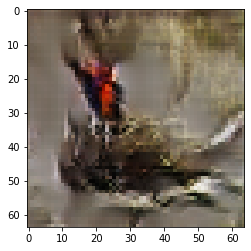

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 5

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.7165994644165039 sec
Gen loss: 1.7286098128870915, Disc loss: 2.238936926189222, Disc valid real loss: 0.4069710295451315, Disc valid fake loss: 0.45171047825562327, Disc class real loss: 0.6904443502426147, Disc class fake loss: 0.32744026968353673
Time for epoch 2 is 0.716926097869873 sec
Gen loss: 1.7530560618952702, Disc loss: 2.2465068541075053, Disc valid real loss: 0.41299560195521307, Disc valid fake loss: 0.4358874324120973, Disc class real loss: 0.6997330000526026, Disc class fake loss: 0.3553151394191541
Time for epoch 3 is 0.7067859172821045 sec
Gen loss: 1.9473948541440462, Disc loss: 2.28358478922593, Disc valid real loss: 0.4393357007127059, Disc valid fake loss: 0.39707254265484054, Disc class real loss: 0.7251103551764237, Disc class fake loss: 0.38542425161913824
Time for epoch 4 is 0.7073352336883545 sec
Gen loss: 1.966705378733183

Time for epoch 31 is 0.7039220333099365 sec
Gen loss: 1.819517267377753, Disc loss: 2.1282559695996737, Disc valid real loss: 0.38062279318508346, Disc valid fake loss: 0.3966069974397358, Disc class real loss: 0.6898598106283891, Disc class fake loss: 0.42804462972440216
Time for epoch 32 is 0.7034599781036377 sec
Gen loss: 1.725654871840226, Disc loss: 2.166601820995933, Disc valid real loss: 0.3915203637198398, Disc valid fake loss: 0.43395973506726715, Disc class real loss: 0.6842819264060572, Disc class fake loss: 0.4417713817797209
Time for epoch 33 is 0.7032711505889893 sec
Gen loss: 1.8230776159386886, Disc loss: 2.1599922744851363, Disc valid real loss: 0.3980191287241484, Disc valid fake loss: 0.40919510157484756, Disc class real loss: 0.6927379212881389, Disc class fake loss: 0.4129504796705748
Time for epoch 34 is 0.721461296081543 sec
Gen loss: 1.7263752723995007, Disc loss: 2.1663507223129272, Disc valid real loss: 0.39090829930807414, Disc valid fake loss: 0.420091258852

Time for epoch 62 is 0.7541337013244629 sec
Gen loss: 1.8031064836602462, Disc loss: 2.096981268180044, Disc valid real loss: 0.4027182177493447, Disc valid fake loss: 0.41162857883854914, Disc class real loss: 0.6613192213209051, Disc class fake loss: 0.4805873114811747
Time for epoch 63 is 0.7258400917053223 sec
Gen loss: 1.69211419005143, Disc loss: 2.089041515400535, Disc valid real loss: 0.39375274118624237, Disc valid fake loss: 0.4159792630296004, Disc class real loss: 0.6610797016244185, Disc class fake loss: 0.4707980736305839
Time for epoch 64 is 0.7108280658721924 sec
Gen loss: 1.624383901294909, Disc loss: 2.1711384810899435, Disc valid real loss: 0.4110720220365022, Disc valid fake loss: 0.4292326600928056, Disc class real loss: 0.6933258960121557, Disc class fake loss: 0.44921852412976715
Time for epoch 65 is 0.7231719493865967 sec
Gen loss: 1.7366343799390291, Disc loss: 2.2198288754413, Disc valid real loss: 0.4295400757538645, Disc valid fake loss: 0.4151268130854556, 

Time for epoch 93 is 0.7646026611328125 sec
Gen loss: 1.8016508880414461, Disc loss: 2.075457924290707, Disc valid real loss: 0.4028450532963401, Disc valid fake loss: 0.42127115632358353, Disc class real loss: 0.6646457502716466, Disc class fake loss: 0.4303375859009592
Time for epoch 94 is 0.7271468639373779 sec
Gen loss: 1.7164627564580817, Disc loss: 2.1272064070952568, Disc valid real loss: 0.4107434937828465, Disc valid fake loss: 0.4316263512561196, Disc class real loss: 0.6792266933541549, Disc class fake loss: 0.4604606016686088
Time for epoch 95 is 0.760460615158081 sec
Gen loss: 1.7358848609422382, Disc loss: 2.057243071104351, Disc valid real loss: 0.4135658897851643, Disc valid fake loss: 0.40617810111296804, Disc class real loss: 0.6573540474239149, Disc class fake loss: 0.4304051995277405
Time for epoch 96 is 0.7919843196868896 sec
Gen loss: 1.702775986571061, Disc loss: 2.162967217595954, Disc valid real loss: 0.434554481192639, Disc valid fake loss: 0.43199126030269425

Time for epoch 124 is 0.70416259765625 sec
Gen loss: 1.764901832530373, Disc loss: 2.097260506529557, Disc valid real loss: 0.42458527652840866, Disc valid fake loss: 0.4313475222964036, Disc class real loss: 0.6809253755368685, Disc class fake loss: 0.40972977092391566
Time for epoch 125 is 0.7219321727752686 sec
Gen loss: 1.9399085797761615, Disc loss: 2.0572755838695325, Disc valid real loss: 0.41061284353858546, Disc valid fake loss: 0.4041459827046645, Disc class real loss: 0.6862665728518837, Disc class fake loss: 0.39614668331648173
Time for epoch 126 is 0.7077481746673584 sec
Gen loss: 1.9755120779338635, Disc loss: 2.0189908742904663, Disc valid real loss: 0.40370235003923116, Disc valid fake loss: 0.3892695731238315, Disc class real loss: 0.666489281152424, Disc class fake loss: 0.4297072495284833
Time for epoch 127 is 0.706261396408081 sec
Gen loss: 1.8554461629767167, Disc loss: 2.0280612832621525, Disc valid real loss: 0.374936790842759, Disc valid fake loss: 0.41342165125

Time for epoch 154 is 0.703385591506958 sec
Gen loss: 1.8409304430610256, Disc loss: 2.0266130221517464, Disc valid real loss: 0.396360434983906, Disc valid fake loss: 0.4178188803948854, Disc class real loss: 0.6945925982374894, Disc class fake loss: 0.37471113471608414
Time for epoch 155 is 0.7015821933746338 sec
Gen loss: 1.9794216783423173, Disc loss: 1.9791768789291382, Disc valid real loss: 0.3993624731114036, Disc valid fake loss: 0.43803848875196355, Disc class real loss: 0.6461354462723983, Disc class fake loss: 0.3755528958220231
Time for epoch 156 is 0.7021141052246094 sec
Gen loss: 1.9235832126517045, Disc loss: 1.9382703116065578, Disc valid real loss: 0.3915417508075112, Disc valid fake loss: 0.3944061947496314, Disc class real loss: 0.6602772176265717, Disc class fake loss: 0.359718509410557
Time for epoch 157 is 0.7028214931488037 sec
Gen loss: 1.7917902657860203, Disc loss: 2.049235563529165, Disc valid real loss: 0.40558016457055746, Disc valid fake loss: 0.4322962557

Time for epoch 185 is 0.7026717662811279 sec
Gen loss: 1.7650227358466701, Disc loss: 1.9570085500416003, Disc valid real loss: 0.41754966817404093, Disc valid fake loss: 0.42142265407662644, Disc class real loss: 0.678779053060632, Disc class fake loss: 0.3181382252981788
Time for epoch 186 is 0.7038946151733398 sec
Gen loss: 1.8212267787832963, Disc loss: 2.0278761700579992, Disc valid real loss: 0.40194544196128845, Disc valid fake loss: 0.41406924787320587, Disc class real loss: 0.7097486069327906, Disc class fake loss: 0.3988489790966636
Time for epoch 187 is 0.7071638107299805 sec
Gen loss: 1.867951236273113, Disc loss: 2.0092637099717794, Disc valid real loss: 0.4085496679732674, Disc valid fake loss: 0.42286969015472814, Disc class real loss: 0.6956598946922704, Disc class fake loss: 0.37762132757588435
Time for epoch 188 is 0.701634407043457 sec
Gen loss: 1.8627051240519474, Disc loss: 1.985025211384422, Disc valid real loss: 0.43610687318601105, Disc valid fake loss: 0.421283

Time for epoch 215 is 0.7066495418548584 sec
Gen loss: 1.9282476902008057, Disc loss: 1.9461099850504022, Disc valid real loss: 0.3833368985276473, Disc valid fake loss: 0.4123353448353316, Disc class real loss: 0.7245240211486816, Disc class fake loss: 0.33774327918102864
Time for epoch 216 is 0.7140946388244629 sec
Gen loss: 1.938377254887631, Disc loss: 1.8791905139621936, Disc valid real loss: 0.3820279146495618, Disc valid fake loss: 0.40849873580430685, Disc class real loss: 0.6713899342637313, Disc class fake loss: 0.343756922765782
Time for epoch 217 is 0.7090914249420166 sec
Gen loss: 1.932870626449585, Disc loss: 1.8777485207507485, Disc valid real loss: 0.3874357044696808, Disc valid fake loss: 0.3957257098273227, Disc class real loss: 0.6843661258095189, Disc class fake loss: 0.33255108014533397
Time for epoch 218 is 0.716069221496582 sec
Gen loss: 1.9123707319560803, Disc loss: 1.9052389985636662, Disc valid real loss: 0.4089156248067555, Disc valid fake loss: 0.4132428561

Time for epoch 245 is 0.7085492610931396 sec
Gen loss: 1.7476359605789185, Disc loss: 1.8568692646528546, Disc valid real loss: 0.4146247662995991, Disc valid fake loss: 0.42396485805511475, Disc class real loss: 0.6908641332074216, Disc class fake loss: 0.2778885090037396
Time for epoch 246 is 0.7119874954223633 sec
Gen loss: 1.931499907844945, Disc loss: 1.9249538434179205, Disc valid real loss: 0.41650048839418513, Disc valid fake loss: 0.4124294064546886, Disc class real loss: 0.7440220086198104, Disc class fake loss: 0.3004249632358551
Time for epoch 247 is 0.7152068614959717 sec
Gen loss: 2.0350059710050883, Disc loss: 1.853099220677426, Disc valid real loss: 0.3774130046367645, Disc valid fake loss: 0.4062633514404297, Disc class real loss: 0.6967641962201971, Disc class fake loss: 0.3314353502110431
Time for epoch 248 is 0.7085256576538086 sec
Gen loss: 1.8772939067137868, Disc loss: 1.8175752915834125, Disc valid real loss: 0.3714130003201334, Disc valid fake loss: 0.407834217

Time for epoch 275 is 0.7081766128540039 sec
Gen loss: 1.8075501605084068, Disc loss: 1.7943205080534284, Disc valid real loss: 0.4101620285134566, Disc valid fake loss: 0.410182923078537, Disc class real loss: 0.6920499833006608, Disc class fake loss: 0.2770307958126068
Time for epoch 276 is 0.7062184810638428 sec
Gen loss: 1.8356860938825106, Disc loss: 1.780640815433703, Disc valid real loss: 0.3927707719175439, Disc valid fake loss: 0.414426221659309, Disc class real loss: 0.6832210954866911, Disc class fake loss: 0.28693273349812154
Time for epoch 277 is 0.708683967590332 sec
Gen loss: 2.0350867196133264, Disc loss: 1.8324682085137618, Disc valid real loss: 0.4014546980983333, Disc valid fake loss: 0.3942249613372903, Disc class real loss: 0.7228691389686183, Disc class fake loss: 0.3119502593027918
Time for epoch 278 is 0.7059321403503418 sec
Gen loss: 1.9863179796620418, Disc loss: 1.818233803698891, Disc valid real loss: 0.4088193836965059, Disc valid fake loss: 0.4293899238109

Time for epoch 305 is 0.7057931423187256 sec
Gen loss: 1.8533093427356921, Disc loss: 1.76488659256383, Disc valid real loss: 0.394556053374943, Disc valid fake loss: 0.4068857760805833, Disc class real loss: 0.6845409744664243, Disc class fake loss: 0.2789849113476904
Time for epoch 306 is 0.704674482345581 sec
Gen loss: 1.9559609952725863, Disc loss: 1.8143905401229858, Disc valid real loss: 0.4132349553861116, Disc valid fake loss: 0.3849286782114129, Disc class real loss: 0.6888128487687362, Disc class fake loss: 0.3274863181929839
Time for epoch 307 is 0.7129397392272949 sec
Gen loss: 1.9227280365793329, Disc loss: 1.7171935909672786, Disc valid real loss: 0.3742078056460933, Disc valid fake loss: 0.4039525530840221, Disc class real loss: 0.6747554854342812, Disc class fake loss: 0.26435983886844233
Time for epoch 308 is 0.7101364135742188 sec
Gen loss: 1.8704993850306462, Disc loss: 1.808774289331938, Disc valid real loss: 0.4146155260111156, Disc valid fake loss: 0.4189213184933

Time for epoch 336 is 0.704211950302124 sec
Gen loss: 1.9078075509322316, Disc loss: 1.8296587529935335, Disc valid real loss: 0.3906903188479574, Disc valid fake loss: 0.44007841693727595, Disc class real loss: 0.69754726949491, Disc class fake loss: 0.30142197326609965
Time for epoch 337 is 0.7055485248565674 sec
Gen loss: 2.0240113233265125, Disc loss: 1.7230812624881142, Disc valid real loss: 0.3947548285910958, Disc valid fake loss: 0.3905166575783177, Disc class real loss: 0.6972809904500058, Disc class fake loss: 0.24062013704525798
Time for epoch 338 is 0.7011556625366211 sec
Gen loss: 2.062778247030158, Disc loss: 1.7740901081185592, Disc valid real loss: 0.402914506824393, Disc valid fake loss: 0.3970865834700434, Disc class real loss: 0.7110635575495268, Disc class fake loss: 0.26311507585801575
Time for epoch 339 is 0.7023830413818359 sec
Gen loss: 1.9267822441301847, Disc loss: 1.843090490290993, Disc valid real loss: 0.4143390937855369, Disc valid fake loss: 0.40963725667

Time for epoch 366 is 0.7001972198486328 sec
Gen loss: 1.9688091591784829, Disc loss: 1.8084900065472251, Disc valid real loss: 0.42232463861766617, Disc valid fake loss: 0.40308240056037903, Disc class real loss: 0.7368314360317431, Disc class fake loss: 0.2463496656794297
Time for epoch 367 is 0.7003614902496338 sec
Gen loss: 2.0317509299830387, Disc loss: 1.7251300498058921, Disc valid real loss: 0.3900984462938811, Disc valid fake loss: 0.3983826151019649, Disc class real loss: 0.6753762521241841, Disc class fake loss: 0.26135552949027013
Time for epoch 368 is 0.7019987106323242 sec
Gen loss: 1.9735650514301502, Disc loss: 1.8450061082839966, Disc valid real loss: 0.3870226929062291, Disc valid fake loss: 0.3922936743811557, Disc class real loss: 0.7715629935264587, Disc class fake loss: 0.29422220901439067
Time for epoch 369 is 0.7031288146972656 sec
Gen loss: 1.9217200655686228, Disc loss: 1.801274387460006, Disc valid real loss: 0.3782113225836503, Disc valid fake loss: 0.394537

Time for epoch 396 is 0.7353267669677734 sec
Gen loss: 1.9043442450071637, Disc loss: 1.7687062840712697, Disc valid real loss: 0.42338876504647105, Disc valid fake loss: 0.40759482822920146, Disc class real loss: 0.7017251002161127, Disc class fake loss: 0.23609073538529246
Time for epoch 397 is 0.6994717121124268 sec
Gen loss: 1.8757875153892918, Disc loss: 1.8220229211606478, Disc valid real loss: 0.4041054750743665, Disc valid fake loss: 0.40437982584300797, Disc class real loss: 0.7335898280143738, Disc class fake loss: 0.2800385238308656
Time for epoch 398 is 0.703174352645874 sec
Gen loss: 1.9972367976841174, Disc loss: 1.7300412466651516, Disc valid real loss: 0.38939336569685684, Disc valid fake loss: 0.4034130118395153, Disc class real loss: 0.6723743300688895, Disc class fake loss: 0.2649420323340516
Time for epoch 399 is 0.6943628787994385 sec
Gen loss: 1.9582430500733226, Disc loss: 1.7711516618728638, Disc valid real loss: 0.3951686855993773, Disc valid fake loss: 0.39891

Time for epoch 426 is 0.7123498916625977 sec
Gen loss: 1.814929121419003, Disc loss: 1.7541711204930355, Disc valid real loss: 0.39900701924374227, Disc valid fake loss: 0.4091405915586572, Disc class real loss: 0.7158909251815394, Disc class fake loss: 0.2302297055721283
Time for epoch 427 is 0.7151956558227539 sec
Gen loss: 1.879548286136828, Disc loss: 1.7601248339602822, Disc valid real loss: 0.4288371973916104, Disc valid fake loss: 0.37856596080880417, Disc class real loss: 0.70493934970153, Disc class fake loss: 0.24787374938789167
Time for epoch 428 is 0.7320387363433838 sec
Gen loss: 1.9352456895928634, Disc loss: 1.7744444671430086, Disc valid real loss: 0.39504330095491913, Disc valid fake loss: 0.40652899522530406, Disc class real loss: 0.7145325416012814, Disc class fake loss: 0.2584308715243089
Time for epoch 429 is 0.7210156917572021 sec
Gen loss: 1.9499681184166355, Disc loss: 1.808044722205714, Disc valid real loss: 0.382342666387558, Disc valid fake loss: 0.4173145529

Time for epoch 456 is 0.7311618328094482 sec
Gen loss: 1.88877178493299, Disc loss: 1.7586748098072253, Disc valid real loss: 0.3979515307828, Disc valid fake loss: 0.3837752773573524, Disc class real loss: 0.7357614808960965, Disc class fake loss: 0.24128544173742594
Time for epoch 457 is 0.7526717185974121 sec
Gen loss: 1.9050824391214471, Disc loss: 1.791547467834071, Disc valid real loss: 0.39859536760731745, Disc valid fake loss: 0.42213047491876704, Disc class real loss: 0.7101326271107322, Disc class fake loss: 0.2607788600419697
Time for epoch 458 is 0.728954553604126 sec
Gen loss: 1.902247472813255, Disc loss: 1.7582341934505261, Disc valid real loss: 0.40389051562861394, Disc valid fake loss: 0.42536192818691854, Disc class real loss: 0.6918296029693202, Disc class fake loss: 0.23724308453108134
Time for epoch 459 is 0.7060263156890869 sec
Gen loss: 1.8625715720026117, Disc loss: 1.795703555408277, Disc valid real loss: 0.3944767760603051, Disc valid fake loss: 0.440917822875

Time for epoch 486 is 0.7113990783691406 sec
Gen loss: 1.9893031747717607, Disc loss: 1.8355582262340344, Disc valid real loss: 0.4508031481190732, Disc valid fake loss: 0.4043529849303396, Disc class real loss: 0.6985436677932739, Disc class fake loss: 0.2819417432734841
Time for epoch 487 is 0.7363522052764893 sec
Gen loss: 2.0330712481548914, Disc loss: 1.7843836044010364, Disc valid real loss: 0.3866950681335048, Disc valid fake loss: 0.406203346817117, Disc class real loss: 0.7274715680825082, Disc class fake loss: 0.26410634149062007
Time for epoch 488 is 0.7161414623260498 sec
Gen loss: 2.0004894670687223, Disc loss: 1.6807946531396163, Disc valid real loss: 0.3499223087963305, Disc valid fake loss: 0.40083932719732585, Disc class real loss: 0.6937109012352792, Disc class fake loss: 0.23641359492352135
Time for epoch 489 is 0.7023093700408936 sec
Gen loss: 1.9283079787304527, Disc loss: 1.8105328710455644, Disc valid real loss: 0.4171419896577534, Disc valid fake loss: 0.4141187

Time for epoch 516 is 0.7199981212615967 sec
Gen loss: 1.885029817882337, Disc loss: 1.7936137224498547, Disc valid real loss: 0.4123815721587131, Disc valid fake loss: 0.40310885247431305, Disc class real loss: 0.7175569440189161, Disc class fake loss: 0.26065774575660106
Time for epoch 517 is 0.7083261013031006 sec
Gen loss: 1.8422881490305851, Disc loss: 1.7711593289124339, Disc valid real loss: 0.3840348163717671, Disc valid fake loss: 0.4064669812980451, Disc class real loss: 0.7192547415432177, Disc class fake loss: 0.26149435341358185
Time for epoch 518 is 0.723623514175415 sec
Gen loss: 2.006378700858668, Disc loss: 1.7792154676035832, Disc valid real loss: 0.41486459656765584, Disc valid fake loss: 0.405792446512925, Disc class real loss: 0.682623122867785, Disc class fake loss: 0.2760166298401983
Time for epoch 519 is 0.7085256576538086 sec
Gen loss: 1.9516979330464412, Disc loss: 1.7788202950828953, Disc valid real loss: 0.42242929339408875, Disc valid fake loss: 0.421002455

Time for epoch 546 is 0.7146832942962646 sec
Gen loss: 1.8787700126045628, Disc loss: 1.7403831921125714, Disc valid real loss: 0.38784771687106084, Disc valid fake loss: 0.3937247301402845, Disc class real loss: 0.7069477658522757, Disc class fake loss: 0.25195398809094177
Time for epoch 547 is 0.6995847225189209 sec
Gen loss: 1.8754296867470992, Disc loss: 1.7739290375458567, Disc valid real loss: 0.3782393132385455, Disc valid fake loss: 0.43663482603273895, Disc class real loss: 0.695628633624629, Disc class fake loss: 0.2635127290299064
Time for epoch 548 is 0.7558920383453369 sec
Gen loss: 1.9290482935152555, Disc loss: 1.7729523746590865, Disc valid real loss: 0.4060250959898296, Disc valid fake loss: 0.4147096558621055, Disc class real loss: 0.7037931555195859, Disc class fake loss: 0.24851551455886742
Time for epoch 549 is 0.7046077251434326 sec
Gen loss: 1.8619477435162193, Disc loss: 1.8069274739215249, Disc valid real loss: 0.37974340037295695, Disc valid fake loss: 0.41209

Time for epoch 576 is 0.7346863746643066 sec
Gen loss: 1.8666689144937616, Disc loss: 1.7861421672921431, Disc valid real loss: 0.3913314248386182, Disc valid fake loss: 0.4337070615668046, Disc class real loss: 0.7061935067176819, Disc class fake loss: 0.255000407758512
Time for epoch 577 is 0.7104799747467041 sec
Gen loss: 1.8901104801579525, Disc loss: 1.713771242844431, Disc valid real loss: 0.40526587398428665, Disc valid fake loss: 0.42204415484478597, Disc class real loss: 0.6740739220067075, Disc class fake loss: 0.21247963332816175
Time for epoch 578 is 0.7095236778259277 sec
Gen loss: 1.8809484368876408, Disc loss: 1.7516042245061774, Disc valid real loss: 0.40158017528684514, Disc valid fake loss: 0.43913451778261287, Disc class real loss: 0.6932482939017447, Disc class fake loss: 0.21773635635250493
Time for epoch 579 is 0.739508867263794 sec
Gen loss: 1.9203992391887463, Disc loss: 1.7370010300686485, Disc valid real loss: 0.3817277425213864, Disc valid fake loss: 0.427773

Time for epoch 606 is 0.7044804096221924 sec
Gen loss: 1.8896471638428538, Disc loss: 1.7560664791809886, Disc valid real loss: 0.40105308984455307, Disc valid fake loss: 0.4015047942337237, Disc class real loss: 0.7025789681233858, Disc class fake loss: 0.2510199570342114
Time for epoch 607 is 0.7411313056945801 sec
Gen loss: 1.8795341378764103, Disc loss: 1.7340620254215442, Disc valid real loss: 0.395332860319238, Disc valid fake loss: 0.40339998665608856, Disc class real loss: 0.6778853535652161, Disc class fake loss: 0.2575278909582841
Time for epoch 608 is 0.7400918006896973 sec
Gen loss: 1.9464976160149825, Disc loss: 1.7929941980462325, Disc valid real loss: 0.42510450356885005, Disc valid fake loss: 0.4078778232398786, Disc class real loss: 0.7025629407481143, Disc class fake loss: 0.2575379390465586
Time for epoch 609 is 0.7032554149627686 sec
Gen loss: 2.0454029409508956, Disc loss: 1.7857019901275635, Disc valid real loss: 0.418185188582069, Disc valid fake loss: 0.40361655

Time for epoch 636 is 0.7030792236328125 sec
Gen loss: 1.9745408735777203, Disc loss: 1.8316357323997898, Disc valid real loss: 0.4129736219581805, Disc valid fake loss: 0.4179116926695171, Disc class real loss: 0.7136296974985223, Disc class fake loss: 0.2872060129517003
Time for epoch 637 is 0.7018554210662842 sec
Gen loss: 1.8546345547625893, Disc loss: 1.7655581361369084, Disc valid real loss: 0.39643658305469315, Disc valid fake loss: 0.3963348504744078, Disc class real loss: 0.7128393681425798, Disc class fake loss: 0.2600378825476295
Time for epoch 638 is 0.7068102359771729 sec
Gen loss: 1.7929905841225071, Disc loss: 1.8276203494322927, Disc valid real loss: 0.4079125947073886, Disc valid fake loss: 0.41756888439780787, Disc class real loss: 0.7312430017872861, Disc class fake loss: 0.27098791614959117
Time for epoch 639 is 0.7021007537841797 sec
Gen loss: 1.8376327188391435, Disc loss: 1.8210165375157406, Disc valid real loss: 0.42678603843638774, Disc valid fake loss: 0.41059

Time for epoch 666 is 0.7034671306610107 sec
Gen loss: 1.8447128973509137, Disc loss: 1.7738184238734997, Disc valid real loss: 0.40200804409227875, Disc valid fake loss: 0.4225549446909051, Disc class real loss: 0.7149458935386256, Disc class fake loss: 0.23440565953129217
Time for epoch 667 is 0.7078845500946045 sec
Gen loss: 1.8792964596497386, Disc loss: 1.7738268563621922, Disc valid real loss: 0.41567994889460114, Disc valid fake loss: 0.40085834186328084, Disc class real loss: 0.6924172043800354, Disc class fake loss: 0.26495685702876043
Time for epoch 668 is 0.7073605060577393 sec
Gen loss: 1.7902260893269588, Disc loss: 1.7346535481904681, Disc valid real loss: 0.410518101955715, Disc valid fake loss: 0.40845445269032526, Disc class real loss: 0.6862250848820335, Disc class fake loss: 0.22954726454458738
Time for epoch 669 is 0.7030069828033447 sec
Gen loss: 1.8282379978581478, Disc loss: 1.7774243982214677, Disc valid real loss: 0.41096644338808563, Disc valid fake loss: 0.41

Time for epoch 696 is 0.6964602470397949 sec
Gen loss: 1.9516081747255827, Disc loss: 1.7639567475569875, Disc valid real loss: 0.42293878919199895, Disc valid fake loss: 0.3958290642813632, Disc class real loss: 0.6831216686650327, Disc class fake loss: 0.26215144442884547
Time for epoch 697 is 0.7021708488464355 sec
Gen loss: 1.8811011063425165, Disc loss: 1.775452174638447, Disc valid real loss: 0.39934304042866353, Disc valid fake loss: 0.42001118942310933, Disc class real loss: 0.7118850977797258, Disc class fake loss: 0.24430634081363678
Time for epoch 698 is 0.6992132663726807 sec
Gen loss: 1.8072067436419035, Disc loss: 1.8052852906678851, Disc valid real loss: 0.4133787641399785, Disc valid fake loss: 0.4204322476136057, Disc class real loss: 0.7038394589173166, Disc class fake loss: 0.26772204590471166
Time for epoch 699 is 0.6961972713470459 sec
Gen loss: 1.8988755251231946, Disc loss: 1.7594486412249113, Disc valid real loss: 0.41229103584038584, Disc valid fake loss: 0.392

Time for epoch 726 is 0.7203075885772705 sec
Gen loss: 1.999516957684567, Disc loss: 1.76384573233755, Disc valid real loss: 0.40031155787016215, Disc valid fake loss: 0.4252935412682985, Disc class real loss: 0.6806866338378504, Disc class fake loss: 0.2576386320747827
Time for epoch 727 is 0.6977894306182861 sec
Gen loss: 2.0002900612981698, Disc loss: 1.8136333854574906, Disc valid real loss: 0.41619390013970825, Disc valid fake loss: 0.4234402336572346, Disc class real loss: 0.709570072199169, Disc class fake loss: 0.26451822644785833
Time for epoch 728 is 0.6998252868652344 sec
Gen loss: 1.84636810578798, Disc loss: 1.7879772876438342, Disc valid real loss: 0.39183794040428965, Disc valid fake loss: 0.43386138112921463, Disc class real loss: 0.6961717291882163, Disc class fake loss: 0.2661922346604498
Time for epoch 729 is 0.7024731636047363 sec
Gen loss: 1.8268315854825472, Disc loss: 1.779759865058096, Disc valid real loss: 0.42369467490597773, Disc valid fake loss: 0.4364276606

Time for epoch 756 is 0.6998307704925537 sec
Gen loss: 1.8848197271949367, Disc loss: 1.812078124598453, Disc valid real loss: 0.41168628711449473, Disc valid fake loss: 0.4233512313742387, Disc class real loss: 0.7145908569034777, Disc class fake loss: 0.26254019768614517
Time for epoch 757 is 0.7518689632415771 sec
Gen loss: 2.0121440197292126, Disc loss: 1.8047707582774914, Disc valid real loss: 0.4014413780287692, Disc valid fake loss: 0.40713574854951157, Disc class real loss: 0.7090583161303872, Disc class fake loss: 0.28721968515923146
Time for epoch 758 is 0.727074384689331 sec
Gen loss: 1.9916623391603168, Disc loss: 1.7114463103444952, Disc valid real loss: 0.38077712215875326, Disc valid fake loss: 0.41192882939388875, Disc class real loss: 0.6868005175339548, Disc class fake loss: 0.23203081402339434
Time for epoch 759 is 0.7133457660675049 sec
Gen loss: 1.9625458215412341, Disc loss: 1.715164535924008, Disc valid real loss: 0.37150378760538605, Disc valid fake loss: 0.3885

Time for epoch 786 is 0.705284833908081 sec
Gen loss: 1.864999815037376, Disc loss: 1.7442819946690609, Disc valid real loss: 0.39940052597146286, Disc valid fake loss: 0.4113601006959614, Disc class real loss: 0.6916358941479733, Disc class fake loss: 0.24197541647835782
Time for epoch 787 is 0.7066342830657959 sec
Gen loss: 1.872975845085947, Disc loss: 1.7498327493667603, Disc valid real loss: 0.39980227225705195, Disc valid fake loss: 0.4083018130377719, Disc class real loss: 0.7175406092091611, Disc class fake loss: 0.22428674054773232
Time for epoch 788 is 0.6958754062652588 sec
Gen loss: 1.9411297409158004, Disc loss: 1.819482728054649, Disc valid real loss: 0.4216309174111015, Disc valid fake loss: 0.4140966832637787, Disc class real loss: 0.7155555769016868, Disc class fake loss: 0.2682890225397913
Time for epoch 789 is 0.6983673572540283 sec
Gen loss: 1.8224104768351506, Disc loss: 1.7117428089443005, Disc valid real loss: 0.39074092946554484, Disc valid fake loss: 0.40640822

Time for epoch 816 is 0.7051963806152344 sec
Gen loss: 1.7918725829375417, Disc loss: 1.8152388334274292, Disc valid real loss: 0.4167108974958721, Disc valid fake loss: 0.42477941513061523, Disc class real loss: 0.7143324707683764, Disc class fake loss: 0.25950703417000015
Time for epoch 817 is 0.7032735347747803 sec
Gen loss: 1.998211013643365, Disc loss: 1.7582826865346808, Disc valid real loss: 0.41505243433149236, Disc valid fake loss: 0.4052525350922032, Disc class real loss: 0.6999820972743788, Disc class fake loss: 0.2380880101730949
Time for epoch 818 is 0.701653003692627 sec
Gen loss: 1.9216288767362897, Disc loss: 1.7412120668511641, Disc valid real loss: 0.38419086368460403, Disc valid fake loss: 0.4201629224576448, Disc class real loss: 0.6914822710187811, Disc class fake loss: 0.245465235490548
Time for epoch 819 is 0.7093613147735596 sec
Gen loss: 1.8660140727695667, Disc loss: 1.6992896732531095, Disc valid real loss: 0.38457872522504705, Disc valid fake loss: 0.3918512

Time for epoch 846 is 0.7040350437164307 sec
Gen loss: 1.9904679750141345, Disc loss: 1.73725898642289, Disc valid real loss: 0.4110163528668253, Disc valid fake loss: 0.3990969657897949, Disc class real loss: 0.6753037634648775, Disc class fake loss: 0.251926609560063
Time for epoch 847 is 0.707726001739502 sec
Gen loss: 1.9579669550845498, Disc loss: 1.7109977571587813, Disc valid real loss: 0.3783337269958697, Disc valid fake loss: 0.39773429538074295, Disc class real loss: 0.707886256669697, Disc class fake loss: 0.22713965216749593
Time for epoch 848 is 0.7088470458984375 sec
Gen loss: 1.895973983563875, Disc loss: 1.755301977458753, Disc valid real loss: 0.4061839721704784, Disc valid fake loss: 0.4096221657175767, Disc class real loss: 0.7096013489522432, Disc class fake loss: 0.22999045409654317
Time for epoch 849 is 0.708641767501831 sec
Gen loss: 1.8889127216841046, Disc loss: 1.7802888092241789, Disc valid real loss: 0.3762058929393166, Disc valid fake loss: 0.41676803168497

Time for epoch 876 is 0.698136568069458 sec
Gen loss: 1.9323859716716565, Disc loss: 1.7552873837320428, Disc valid real loss: 0.39870436411154897, Disc valid fake loss: 0.40260381682922963, Disc class real loss: 0.7063079194018715, Disc class fake loss: 0.24776302199614675
Time for epoch 877 is 0.7069330215454102 sec
Gen loss: 1.9914414255242598, Disc loss: 1.745614252592388, Disc valid real loss: 0.3947539690293764, Disc valid fake loss: 0.40252017190581874, Disc class real loss: 0.7138900192160356, Disc class fake loss: 0.23454597906062477
Time for epoch 878 is 0.7004737854003906 sec
Gen loss: 1.9132609179145412, Disc loss: 1.7561473909177279, Disc valid real loss: 0.3870434698305632, Disc valid fake loss: 0.40668701654986333, Disc class real loss: 0.7146778608623304, Disc class fake loss: 0.24783243003644442
Time for epoch 879 is 0.7224366664886475 sec
Gen loss: 1.8616475682509572, Disc loss: 1.7726877676813226, Disc valid real loss: 0.38511113430324356, Disc valid fake loss: 0.407

Time for epoch 906 is 0.7005100250244141 sec
Gen loss: 1.8386378978428088, Disc loss: 1.7892783441041644, Disc valid real loss: 0.41182154260183634, Disc valid fake loss: 0.4260542565270474, Disc class real loss: 0.7027448415756226, Disc class fake loss: 0.24874855695586456
Time for epoch 907 is 0.6993198394775391 sec
Gen loss: 1.9095560061304193, Disc loss: 1.7580618858337402, Disc valid real loss: 0.41507942111868606, Disc valid fake loss: 0.39888134912440654, Disc class real loss: 0.6896430865714425, Disc class fake loss: 0.2545450714073683
Time for epoch 908 is 0.7143659591674805 sec
Gen loss: 1.9136595726013184, Disc loss: 1.7487288964422125, Disc valid real loss: 0.38596082517975255, Disc valid fake loss: 0.4047894132764716, Disc class real loss: 0.7006346112803409, Disc class fake loss: 0.25743271332038076
Time for epoch 909 is 0.6961984634399414 sec
Gen loss: 1.9516300464931287, Disc loss: 1.7115397390566374, Disc valid real loss: 0.4044241105255328, Disc valid fake loss: 0.400

Time for epoch 936 is 0.6992897987365723 sec
Gen loss: 1.8660483673999184, Disc loss: 1.784926646634152, Disc valid real loss: 0.4103311033625352, Disc valid fake loss: 0.42430047455586883, Disc class real loss: 0.7143118663838035, Disc class fake loss: 0.23607887053175977
Time for epoch 937 is 0.6989059448242188 sec
Gen loss: 1.9971660375595093, Disc loss: 1.7895366769087941, Disc valid real loss: 0.4298884852936393, Disc valid fake loss: 0.4114226228312442, Disc class real loss: 0.7001638098766929, Disc class fake loss: 0.2481521905252808
Time for epoch 938 is 0.7087423801422119 sec
Gen loss: 1.8630504670896029, Disc loss: 1.7851269307889437, Disc valid real loss: 0.38474769184463903, Disc valid fake loss: 0.4076026223207775, Disc class real loss: 0.7407904392794559, Disc class fake loss: 0.2520839407255775
Time for epoch 939 is 0.7044847011566162 sec
Gen loss: 1.819424409615366, Disc loss: 1.6839279438319958, Disc valid real loss: 0.38584353578718084, Disc valid fake loss: 0.4013999

Time for epoch 966 is 0.7606368064880371 sec
Gen loss: 1.866577424501118, Disc loss: 1.6899036733727706, Disc valid real loss: 0.37892699869055496, Disc valid fake loss: 0.40840253547618266, Disc class real loss: 0.6804643273353577, Disc class fake loss: 0.22220150734248914
Time for epoch 967 is 0.6981604099273682 sec
Gen loss: 1.988067482647143, Disc loss: 1.7661448466150385, Disc valid real loss: 0.4203522064183888, Disc valid fake loss: 0.40000989405732407, Disc class real loss: 0.714301630070335, Disc class fake loss: 0.23157767990702077
Time for epoch 968 is 0.7087936401367188 sec
Gen loss: 1.8942553997039795, Disc loss: 1.7342367987883718, Disc valid real loss: 0.3816428749184859, Disc valid fake loss: 0.4082186786751998, Disc class real loss: 0.7104679848018446, Disc class fake loss: 0.2340025682198374
Time for epoch 969 is 0.7007536888122559 sec
Gen loss: 1.8555831720954494, Disc loss: 1.7811510813863654, Disc valid real loss: 0.4044653020407024, Disc valid fake loss: 0.4186330

Time for epoch 996 is 0.7186307907104492 sec
Gen loss: 1.87199026032498, Disc loss: 1.7314047311481677, Disc valid real loss: 0.39150795497392354, Disc valid fake loss: 0.41594923483697993, Disc class real loss: 0.6964173662035089, Disc class fake loss: 0.22762393716134524
Time for epoch 997 is 0.7079482078552246 sec
Gen loss: 1.9030906652149402, Disc loss: 1.7303010915455066, Disc valid real loss: 0.38230861017578527, Disc valid fake loss: 0.4007426076813748, Disc class real loss: 0.7189508645158065, Disc class fake loss: 0.22839712351560593
Time for epoch 998 is 0.7130024433135986 sec
Gen loss: 1.8267542688470138, Disc loss: 1.7741602784708927, Disc valid real loss: 0.40623899902168076, Disc valid fake loss: 0.4192344389463726, Disc class real loss: 0.7073636902006049, Disc class fake loss: 0.2414163523598721
Time for epoch 999 is 0.7118771076202393 sec
Gen loss: 1.9349381296258223, Disc loss: 1.7641481725793136, Disc valid real loss: 0.4077023816736121, Disc valid fake loss: 0.40308

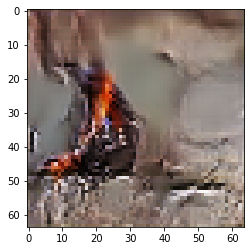

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 6

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.7018187046051025 sec
Gen loss: 1.857955211087277, Disc loss: 2.224513813068992, Disc valid real loss: 0.4015547507687619, Disc valid fake loss: 0.3896835728695518, Disc class real loss: 0.7170100149355436, Disc class fake loss: 0.24788809920612134
Time for epoch 2 is 0.7163686752319336 sec
Gen loss: 1.8883020877838135, Disc loss: 2.1861439880571867, Disc valid real loss: 0.39711531369309677, Disc valid fake loss: 0.4219424771635156, Disc class real loss: 0.6847474418188396, Disc class fake loss: 0.23816811567858645
Time for epoch 3 is 0.7168805599212646 sec
Gen loss: 1.8184281148408588, Disc loss: 2.2630021007437455, Disc valid real loss: 0.3960441586218382, Disc valid fake loss: 0.4174237847328186, Disc class real loss: 0.7266429223512348, Disc class fake loss: 0.3064750331012826
Time for epoch 4 is 0.7132463455200195 sec
Gen loss: 1.81969700361553,

Time for epoch 31 is 0.7105872631072998 sec
Gen loss: 1.7480242377833317, Disc loss: 2.1095143744820044, Disc valid real loss: 0.40768103850515264, Disc valid fake loss: 0.4153967891868792, Disc class real loss: 0.6601460764282628, Disc class fake loss: 0.3516903888238104
Time for epoch 32 is 0.709599494934082 sec
Gen loss: 1.743675752689964, Disc loss: 2.101340049191525, Disc valid real loss: 0.40301613431227834, Disc valid fake loss: 0.39796061578549835, Disc class real loss: 0.667122549132297, Disc class fake loss: 0.36810589934650223
Time for epoch 33 is 0.6986124515533447 sec
Gen loss: 1.8440495541221218, Disc loss: 2.1606087935598275, Disc valid real loss: 0.4145890380206861, Disc valid fake loss: 0.3824767721326728, Disc class real loss: 0.700546173672927, Disc class fake loss: 0.37977092438622523
Time for epoch 34 is 0.6946139335632324 sec
Gen loss: 1.75628662109375, Disc loss: 2.11793095187137, Disc valid real loss: 0.40923203920063217, Disc valid fake loss: 0.3873293086102134

Time for epoch 62 is 0.7026271820068359 sec
Gen loss: 1.7975022165398848, Disc loss: 2.1253722717887475, Disc valid real loss: 0.3876919793455224, Disc valid fake loss: 0.425579896098689, Disc class real loss: 0.6901178893290068, Disc class fake loss: 0.3820253312587738
Time for epoch 63 is 0.7415065765380859 sec
Gen loss: 1.756247639656067, Disc loss: 2.0531147969396493, Disc valid real loss: 0.40205704538445725, Disc valid fake loss: 0.42554493405317007, Disc class real loss: 0.6492761467632494, Disc class fake loss: 0.32450980889169795
Time for epoch 64 is 0.7937428951263428 sec
Gen loss: 1.771974896129809, Disc loss: 2.056611970851296, Disc valid real loss: 0.4026947790070584, Disc valid fake loss: 0.4080415085742348, Disc class real loss: 0.6615268399840907, Disc class fake loss: 0.3237304750241731
Time for epoch 65 is 0.7446022033691406 sec
Gen loss: 1.7585968092868203, Disc loss: 2.1092796953100907, Disc valid real loss: 0.40637500348844025, Disc valid fake loss: 0.4199110442086

Time for epoch 93 is 0.7420835494995117 sec
Gen loss: 1.8057958766033775, Disc loss: 2.0672572600214103, Disc valid real loss: 0.401920580550244, Disc valid fake loss: 0.42759961360379267, Disc class real loss: 0.6680216381424352, Disc class fake loss: 0.372768958932475
Time for epoch 94 is 0.7060675621032715 sec
Gen loss: 1.8101505417572825, Disc loss: 2.084922301141839, Disc valid real loss: 0.41778286193546493, Disc valid fake loss: 0.40192518893041107, Disc class real loss: 0.6846958116481179, Disc class fake loss: 0.3750389257543965
Time for epoch 95 is 0.7034022808074951 sec
Gen loss: 1.8006688419141268, Disc loss: 2.1308640680815043, Disc valid real loss: 0.40938302560856465, Disc valid fake loss: 0.4130264755926634, Disc class real loss: 0.7138055688456485, Disc class fake loss: 0.3634872914929139
Time for epoch 96 is 0.6982083320617676 sec
Gen loss: 1.7888412789294594, Disc loss: 2.0553215742111206, Disc valid real loss: 0.40789780334422465, Disc valid fake loss: 0.40766741413

Time for epoch 123 is 0.7034783363342285 sec
Gen loss: 1.8404561532171149, Disc loss: 2.008647636363381, Disc valid real loss: 0.4148994511679599, Disc valid fake loss: 0.40743589401245117, Disc class real loss: 0.6690138013739335, Disc class fake loss: 0.32495023859174627
Time for epoch 124 is 0.7042348384857178 sec
Gen loss: 1.8698993168379132, Disc loss: 1.9719184888036627, Disc valid real loss: 0.40215451623264115, Disc valid fake loss: 0.39945567752185623, Disc class real loss: 0.6589784747675845, Disc class fake loss: 0.3267814375852284
Time for epoch 125 is 0.7036755084991455 sec
Gen loss: 1.8369750223661725, Disc loss: 2.0316515157097266, Disc valid real loss: 0.42118513270428304, Disc valid fake loss: 0.42843076116160345, Disc class real loss: 0.6608989834785461, Disc class fake loss: 0.34895719901511546
Time for epoch 126 is 0.705857515335083 sec
Gen loss: 1.7532562080182528, Disc loss: 1.9742401399110492, Disc valid real loss: 0.3831975412996192, Disc valid fake loss: 0.4120

Time for epoch 153 is 0.6994385719299316 sec
Gen loss: 1.8848048636787815, Disc loss: 1.921079905409562, Disc valid real loss: 0.3966682145470067, Disc valid fake loss: 0.41885337233543396, Disc class real loss: 0.6526294695703607, Disc class fake loss: 0.2888342926376744
Time for epoch 154 is 0.6990206241607666 sec
Gen loss: 1.877433369034215, Disc loss: 1.9685404300689697, Disc valid real loss: 0.40938183508421244, Disc valid fake loss: 0.43246825117813914, Disc class real loss: 0.664575457572937, Disc class fake loss: 0.29811382921118484
Time for epoch 155 is 0.7028708457946777 sec
Gen loss: 1.888228780344913, Disc loss: 1.9807184620907432, Disc valid real loss: 0.3958908460642162, Disc valid fake loss: 0.4026316169061159, Disc class real loss: 0.694600732702958, Disc class fake loss: 0.3223349334377992
Time for epoch 156 is 0.7064292430877686 sec
Gen loss: 1.8434361846823442, Disc loss: 1.938553025847987, Disc valid real loss: 0.3989378480534804, Disc valid fake loss: 0.41915371543

Time for epoch 183 is 0.6973285675048828 sec
Gen loss: 1.7984533686386912, Disc loss: 1.9027293167616193, Disc valid real loss: 0.42490839173919276, Disc valid fake loss: 0.40206860241137055, Disc class real loss: 0.6646938355345475, Disc class fake loss: 0.2785677533400686
Time for epoch 184 is 0.7023742198944092 sec
Gen loss: 1.904749870300293, Disc loss: 1.9067053983086033, Disc valid real loss: 0.38802347842015716, Disc valid fake loss: 0.4045503594373402, Disc class real loss: 0.6960192228618421, Disc class fake loss: 0.27531896296300384
Time for epoch 185 is 0.7139253616333008 sec
Gen loss: 1.8100698809874685, Disc loss: 1.9310756608059532, Disc valid real loss: 0.40351137989445734, Disc valid fake loss: 0.41514103977303757, Disc class real loss: 0.6895341277122498, Disc class fake loss: 0.28795332265527623
Time for epoch 186 is 0.7054686546325684 sec
Gen loss: 1.8517217573366667, Disc loss: 1.8930688029841374, Disc valid real loss: 0.4088870522223021, Disc valid fake loss: 0.399

Time for epoch 213 is 0.7055375576019287 sec
Gen loss: 2.0155728553470813, Disc loss: 1.8460074035744918, Disc valid real loss: 0.39857943434464305, Disc valid fake loss: 0.39249780303553533, Disc class real loss: 0.6767445426238211, Disc class fake loss: 0.28647943546897486
Time for epoch 214 is 0.7010111808776855 sec
Gen loss: 1.9461236188286228, Disc loss: 1.8616801123870046, Disc valid real loss: 0.3914049691275546, Disc valid fake loss: 0.379504227324536, Disc class real loss: 0.7062415041421589, Disc class fake loss: 0.2876315093354175
Time for epoch 215 is 0.7262909412384033 sec
Gen loss: 1.968254108177988, Disc loss: 1.8206601582075421, Disc valid real loss: 0.409809095294852, Disc valid fake loss: 0.40038324500385086, Disc class real loss: 0.66110507751766, Disc class fake loss: 0.25733918579001175
Time for epoch 216 is 0.7030544281005859 sec
Gen loss: 1.957336231281883, Disc loss: 1.878419367890609, Disc valid real loss: 0.3867577047724473, Disc valid fake loss: 0.43406544076

Time for epoch 243 is 0.7472076416015625 sec
Gen loss: 1.81625969786393, Disc loss: 1.818991140315407, Disc valid real loss: 0.40598352331864207, Disc valid fake loss: 0.4180426487797185, Disc class real loss: 0.7048176652506778, Disc class fake loss: 0.2297586767297042
Time for epoch 244 is 0.783689022064209 sec
Gen loss: 1.9207146857914172, Disc loss: 1.8340685493067692, Disc valid real loss: 0.40543883489935023, Disc valid fake loss: 0.4242801038842452, Disc class real loss: 0.6997033169395045, Disc class fake loss: 0.24895531017529338
Time for epoch 245 is 0.7538518905639648 sec
Gen loss: 1.9787492626591732, Disc loss: 1.794963748831498, Disc valid real loss: 0.38721258703031036, Disc valid fake loss: 0.42948462618024724, Disc class real loss: 0.6659885362574929, Disc class fake loss: 0.2639580498400487
Time for epoch 246 is 0.7498743534088135 sec
Gen loss: 1.9835608758424457, Disc loss: 1.8106549413580644, Disc valid real loss: 0.3747789734288266, Disc valid fake loss: 0.416400333

Time for epoch 273 is 0.7029244899749756 sec
Gen loss: 1.8814948546259027, Disc loss: 1.775505404723318, Disc valid real loss: 0.42502784415295247, Disc valid fake loss: 0.43351777603751734, Disc class real loss: 0.6962185062860188, Disc class fake loss: 0.21150906776127062
Time for epoch 274 is 0.7077429294586182 sec
Gen loss: 1.943485416864094, Disc loss: 1.7351520626168502, Disc valid real loss: 0.39670366205667196, Disc valid fake loss: 0.41435409062787104, Disc class real loss: 0.6872047750573409, Disc class fake loss: 0.22980280455790067
Time for epoch 275 is 0.7111961841583252 sec
Gen loss: 2.106659638254266, Disc loss: 1.7000977428335893, Disc valid real loss: 0.36831805580540705, Disc valid fake loss: 0.3962737117943011, Disc class real loss: 0.6981215508360612, Disc class fake loss: 0.23182829587083115
Time for epoch 276 is 0.7187130451202393 sec
Gen loss: 1.9661982435929148, Disc loss: 1.7264620944073326, Disc valid real loss: 0.40423610571183655, Disc valid fake loss: 0.419

Time for epoch 303 is 0.7000184059143066 sec
Gen loss: 1.8721511865917004, Disc loss: 1.7460641547253257, Disc valid real loss: 0.40739790703120987, Disc valid fake loss: 0.4140876061037967, Disc class real loss: 0.719237396591588, Disc class fake loss: 0.20544403948281942
Time for epoch 304 is 0.69911789894104 sec
Gen loss: 1.9379775712364598, Disc loss: 1.7311312022962069, Disc valid real loss: 0.3875163950418171, Disc valid fake loss: 0.41387554532603216, Disc class real loss: 0.7255971243506983, Disc class fake loss: 0.20424641276660718
Time for epoch 305 is 0.708463191986084 sec
Gen loss: 1.8697718821073834, Disc loss: 1.738979082358511, Disc valid real loss: 0.4114643813748109, Disc valid fake loss: 0.42810484923814474, Disc class real loss: 0.6740644668277941, Disc class fake loss: 0.2254351122598899
Time for epoch 306 is 0.7003321647644043 sec
Gen loss: 1.9284012066690546, Disc loss: 1.7788902646616886, Disc valid real loss: 0.4078484789321297, Disc valid fake loss: 0.398346000

Time for epoch 333 is 0.7006716728210449 sec
Gen loss: 1.9811167340529592, Disc loss: 1.726319156194988, Disc valid real loss: 0.4156189435406735, Disc valid fake loss: 0.39602183511382655, Disc class real loss: 0.7089287450439051, Disc class fake loss: 0.2058502569010383
Time for epoch 334 is 0.700444221496582 sec
Gen loss: 1.8631365550191779, Disc loss: 1.6996707414325916, Disc valid real loss: 0.40288291636266205, Disc valid fake loss: 0.401759219797034, Disc class real loss: 0.6841077177148116, Disc class fake loss: 0.21101550052040502
Time for epoch 335 is 0.7052185535430908 sec
Gen loss: 1.840999258191962, Disc loss: 1.6622836778038426, Disc valid real loss: 0.39823876713451584, Disc valid fake loss: 0.40686065272281047, Disc class real loss: 0.6857706496590062, Disc class fake loss: 0.17151647217963872
Time for epoch 336 is 0.7011725902557373 sec
Gen loss: 1.935051585498609, Disc loss: 1.6994959931624563, Disc valid real loss: 0.40650098574788945, Disc valid fake loss: 0.4150086

Time for epoch 363 is 0.7075517177581787 sec
Gen loss: 1.92002913198973, Disc loss: 1.7291242197940224, Disc valid real loss: 0.38943140444002655, Disc valid fake loss: 0.4308956955608569, Disc class real loss: 0.6928270898367229, Disc class fake loss: 0.21606541307348953
Time for epoch 364 is 0.7117910385131836 sec
Gen loss: 2.0192725030999434, Disc loss: 1.7242496390091746, Disc valid real loss: 0.38668683484980937, Disc valid fake loss: 0.40966169457686574, Disc class real loss: 0.7135905968515497, Disc class fake loss: 0.21441036070647992
Time for epoch 365 is 0.6958177089691162 sec
Gen loss: 2.155510802018015, Disc loss: 1.6759055915631746, Disc valid real loss: 0.39264701698955734, Disc valid fake loss: 0.40168838124526174, Disc class real loss: 0.6570002750346535, Disc class fake loss: 0.22465640737822182
Time for epoch 366 is 0.7041840553283691 sec
Gen loss: 1.9878070228978206, Disc loss: 1.7385974432292737, Disc valid real loss: 0.41050667982352407, Disc valid fake loss: 0.395

Time for epoch 393 is 0.7014648914337158 sec
Gen loss: 1.9006938055941933, Disc loss: 1.740847807181509, Disc valid real loss: 0.3979167451984004, Disc valid fake loss: 0.4016872973818528, Disc class real loss: 0.6957943063033255, Disc class fake loss: 0.2455395287589023
Time for epoch 394 is 0.6955454349517822 sec
Gen loss: 1.9395043410752948, Disc loss: 1.7334531984831159, Disc valid real loss: 0.4096300366677736, Disc valid fake loss: 0.4073433985835628, Disc class real loss: 0.7057451574425948, Disc class fake loss: 0.210833592634452
Time for epoch 395 is 0.6973800659179688 sec
Gen loss: 2.0120446054559005, Disc loss: 1.6958767552124827, Disc valid real loss: 0.4036579539901332, Disc valid fake loss: 0.3932787775993347, Disc class real loss: 0.6811802324495817, Disc class fake loss: 0.21785246502411992
Time for epoch 396 is 0.6986525058746338 sec
Gen loss: 1.9501983052805851, Disc loss: 1.738475523496929, Disc valid real loss: 0.4231134809945759, Disc valid fake loss: 0.40684856709

Time for epoch 423 is 0.7065095901489258 sec
Gen loss: 1.9160496561150802, Disc loss: 1.6873886146043475, Disc valid real loss: 0.3877164141127938, Disc valid fake loss: 0.41721781931425395, Disc class real loss: 0.6961817772764909, Disc class fake loss: 0.18637458391879735
Time for epoch 424 is 0.7028019428253174 sec
Gen loss: 1.9274314955661171, Disc loss: 1.7832395465750444, Disc valid real loss: 0.42447835677548457, Disc valid fake loss: 0.4078153073787689, Disc class real loss: 0.7051241554711994, Disc class fake loss: 0.2459135839813634
Time for epoch 425 is 0.7038319110870361 sec
Gen loss: 1.8252196876626265, Disc loss: 1.7347182098187899, Disc valid real loss: 0.4224221329939993, Disc valid fake loss: 0.41272654031452377, Disc class real loss: 0.6905584868631864, Disc class fake loss: 0.20910734565634476
Time for epoch 426 is 0.7010760307312012 sec
Gen loss: 1.8683796681855853, Disc loss: 1.7044549176567478, Disc valid real loss: 0.3854955717136985, Disc valid fake loss: 0.4205

Time for epoch 453 is 0.7413935661315918 sec
Gen loss: 1.8843174670871936, Disc loss: 1.704472736308449, Disc valid real loss: 0.4106132419485795, Disc valid fake loss: 0.4147910867866717, Disc class real loss: 0.6868463723283065, Disc class fake loss: 0.1923209515057112
Time for epoch 454 is 0.7109003067016602 sec
Gen loss: 1.874366885737369, Disc loss: 1.6974124092804759, Disc valid real loss: 0.4053293843018381, Disc valid fake loss: 0.3990339260352285, Disc class real loss: 0.6775103430998953, Disc class fake loss: 0.21563114618000231
Time for epoch 455 is 0.7139654159545898 sec
Gen loss: 1.8151554245697825, Disc loss: 1.687019850078382, Disc valid real loss: 0.39679901380287974, Disc valid fake loss: 0.40218455383652135, Disc class real loss: 0.6725507880512037, Disc class fake loss: 0.21557693693198657
Time for epoch 456 is 0.7114946842193604 sec
Gen loss: 1.8724089358982288, Disc loss: 1.710171561492117, Disc valid real loss: 0.40467859569348785, Disc valid fake loss: 0.40279726

Time for epoch 483 is 0.7625811100006104 sec
Gen loss: 1.9160477173955817, Disc loss: 1.6743512592817609, Disc valid real loss: 0.39796222354236405, Disc valid fake loss: 0.41386279620622335, Disc class real loss: 0.6975964778348019, Disc class fake loss: 0.16503629676605525
Time for epoch 484 is 0.7030432224273682 sec
Gen loss: 2.023931095474645, Disc loss: 1.7041309946461727, Disc valid real loss: 0.37546490524944504, Disc valid fake loss: 0.4145444349238747, Disc class real loss: 0.7032819327555204, Disc class fake loss: 0.21093822349058955
Time for epoch 485 is 0.7074456214904785 sec
Gen loss: 1.9491914636210392, Disc loss: 1.689090515437879, Disc valid real loss: 0.38387802949077204, Disc valid fake loss: 0.41329245739861536, Disc class real loss: 0.6879268853287948, Disc class fake loss: 0.20408995488756582
Time for epoch 486 is 0.784165620803833 sec
Gen loss: 1.8632345513293618, Disc loss: 1.791611294997366, Disc valid real loss: 0.4107097089290619, Disc valid fake loss: 0.40939

Time for epoch 513 is 0.7461757659912109 sec
Gen loss: 2.0041441415485584, Disc loss: 1.722970629993238, Disc valid real loss: 0.42373761064127874, Disc valid fake loss: 0.38974645106416, Disc class real loss: 0.6588161368119089, Disc class fake loss: 0.250752045135749
Time for epoch 514 is 0.7868647575378418 sec
Gen loss: 1.9714068864521228, Disc loss: 1.6688956963388544, Disc valid real loss: 0.4239515238686612, Disc valid fake loss: 0.3821580127665871, Disc class real loss: 0.7001849475659823, Disc class fake loss: 0.16270873342689715
Time for epoch 515 is 0.7788333892822266 sec
Gen loss: 1.9321664697245549, Disc loss: 1.71488030333268, Disc valid real loss: 0.407376766204834, Disc valid fake loss: 0.4016216899219312, Disc class real loss: 0.6892087679160269, Disc class fake loss: 0.21676759500252574
Time for epoch 516 is 0.754554033279419 sec
Gen loss: 1.8811504903592562, Disc loss: 1.736307194358424, Disc valid real loss: 0.39881647103711176, Disc valid fake loss: 0.42255566935790

Time for epoch 543 is 0.6921167373657227 sec
Gen loss: 1.7867541187687923, Disc loss: 1.7449247021424144, Disc valid real loss: 0.39660262434106125, Disc valid fake loss: 0.4181443170497292, Disc class real loss: 0.7095177675548353, Disc class fake loss: 0.2207577895177038
Time for epoch 544 is 0.6990220546722412 sec
Gen loss: 1.8827718559064364, Disc loss: 1.7534903350629305, Disc valid real loss: 0.40760855925710576, Disc valid fake loss: 0.43394893407821655, Disc class real loss: 0.7148632093479759, Disc class fake loss: 0.19717315662848323
Time for epoch 545 is 0.7127392292022705 sec
Gen loss: 1.881696249309339, Disc loss: 1.7432009107188176, Disc valid real loss: 0.40878661525876897, Disc valid fake loss: 0.4101583220456776, Disc class real loss: 0.681527997318067, Disc class fake loss: 0.2428157439357356
Time for epoch 546 is 0.6984701156616211 sec
Gen loss: 1.891988798191673, Disc loss: 1.6859846052370573, Disc valid real loss: 0.4065286579884981, Disc valid fake loss: 0.4007224

Time for epoch 573 is 0.6997945308685303 sec
Gen loss: 1.9238238334655762, Disc loss: 1.6799825680883307, Disc valid real loss: 0.4014665743238048, Disc valid fake loss: 0.38392463797017146, Disc class real loss: 0.7051447065253007, Disc class fake loss: 0.18954978412703463
Time for epoch 574 is 0.7010114192962646 sec
Gen loss: 1.8407460639351292, Disc loss: 1.67517225993307, Disc valid real loss: 0.40515437722206116, Disc valid fake loss: 0.40788135089372335, Disc class real loss: 0.6774492357906542, Disc class fake loss: 0.18478586446297796
Time for epoch 575 is 0.6967484951019287 sec
Gen loss: 1.9620257929751748, Disc loss: 1.7155124200017828, Disc valid real loss: 0.4026522197221455, Disc valid fake loss: 0.39958264012085765, Disc class real loss: 0.7079975699123583, Disc class fake loss: 0.20538055151700974
Time for epoch 576 is 0.6975750923156738 sec
Gen loss: 1.8899680250569393, Disc loss: 1.6984801794353284, Disc valid real loss: 0.4063078776786202, Disc valid fake loss: 0.3978

Time for epoch 603 is 0.7013115882873535 sec
Gen loss: 1.9812155836506893, Disc loss: 1.6863718534770764, Disc valid real loss: 0.395938936032747, Disc valid fake loss: 0.40953147568200765, Disc class real loss: 0.6784727667507372, Disc class fake loss: 0.20252388088326706
Time for epoch 604 is 0.7025265693664551 sec
Gen loss: 1.940271302273399, Disc loss: 1.692702011058205, Disc valid real loss: 0.40135771506711054, Disc valid fake loss: 0.4010120057745984, Disc class real loss: 0.6737994081095645, Disc class fake loss: 0.21662431563201703
Time for epoch 605 is 0.7000370025634766 sec
Gen loss: 1.9219177773124294, Disc loss: 1.618722219216196, Disc valid real loss: 0.3928104631210628, Disc valid fake loss: 0.3708901248480144, Disc class real loss: 0.6699742172893725, Disc class fake loss: 0.18514438934232058
Time for epoch 606 is 0.698847770690918 sec
Gen loss: 1.9172683766013698, Disc loss: 1.7330233109624762, Disc valid real loss: 0.4148852715366765, Disc valid fake loss: 0.401812547

Time for epoch 633 is 0.6991095542907715 sec
Gen loss: 1.9350754963724237, Disc loss: 1.7021936868366443, Disc valid real loss: 0.40529320114537287, Disc valid fake loss: 0.4032427856796666, Disc class real loss: 0.6857830160542538, Disc class fake loss: 0.20797025059398852
Time for epoch 634 is 0.7020292282104492 sec
Gen loss: 1.847639930875678, Disc loss: 1.7401873814432245, Disc valid real loss: 0.41765829136497096, Disc valid fake loss: 0.4083479658553475, Disc class real loss: 0.6913517023387709, Disc class fake loss: 0.22292311881717883
Time for epoch 635 is 0.7036004066467285 sec
Gen loss: 2.0340572156404195, Disc loss: 1.7279101421958523, Disc valid real loss: 0.4030845337792447, Disc valid fake loss: 0.3995125215304525, Disc class real loss: 0.712961523156417, Disc class fake loss: 0.21245166541714416
Time for epoch 636 is 0.7014598846435547 sec
Gen loss: 2.0571772424798263, Disc loss: 1.6855119843232005, Disc valid real loss: 0.38756682370838363, Disc valid fake loss: 0.38234

Time for epoch 663 is 0.6980209350585938 sec
Gen loss: 1.8552633586682772, Disc loss: 1.7330038422032406, Disc valid real loss: 0.40344803897958054, Disc valid fake loss: 0.4267990008780831, Disc class real loss: 0.6937988055379767, Disc class fake loss: 0.20905495199717974
Time for epoch 664 is 0.7009618282318115 sec
Gen loss: 1.8019439860394126, Disc loss: 1.7170785163578235, Disc valid real loss: 0.38961907672254664, Disc valid fake loss: 0.41585557711751836, Disc class real loss: 0.6899323965373793, Disc class fake loss: 0.22176512958187805
Time for epoch 665 is 0.7025284767150879 sec
Gen loss: 1.9825479984283447, Disc loss: 1.6645342299812718, Disc valid real loss: 0.3841288230921093, Disc valid fake loss: 0.3865311286951366, Disc class real loss: 0.6805762083906877, Disc class fake loss: 0.2133915181222715
Time for epoch 666 is 0.7001276016235352 sec
Gen loss: 1.8803014065089978, Disc loss: 1.7005763116635775, Disc valid real loss: 0.39100142372281926, Disc valid fake loss: 0.413

Time for epoch 693 is 0.691382884979248 sec
Gen loss: 1.952145112188239, Disc loss: 1.707210936044392, Disc valid real loss: 0.38867298396010147, Disc valid fake loss: 0.4416843621354354, Disc class real loss: 0.6764229661539981, Disc class fake loss: 0.20052586182167656
Time for epoch 694 is 0.6961843967437744 sec
Gen loss: 1.9963905434859426, Disc loss: 1.7378689740833484, Disc valid real loss: 0.39203483493704544, Disc valid fake loss: 0.4249438565028341, Disc class real loss: 0.7020990660316065, Disc class fake loss: 0.21888787769957593
Time for epoch 695 is 0.6932458877563477 sec
Gen loss: 2.041477824512281, Disc loss: 1.6617473489359806, Disc valid real loss: 0.39034536167194966, Disc valid fake loss: 0.3925638841955285, Disc class real loss: 0.6875291560825548, Disc class fake loss: 0.19140815303513878
Time for epoch 696 is 0.695758581161499 sec
Gen loss: 1.9441310731988204, Disc loss: 1.7176380659404553, Disc valid real loss: 0.40453663938923884, Disc valid fake loss: 0.4154282

Time for epoch 723 is 0.6930215358734131 sec
Gen loss: 1.9287053974051225, Disc loss: 1.7636347883626033, Disc valid real loss: 0.4086345591043171, Disc valid fake loss: 0.4320246451779416, Disc class real loss: 0.7018497272541648, Disc class fake loss: 0.22122199833393097
Time for epoch 724 is 0.6939373016357422 sec
Gen loss: 1.8856936253999408, Disc loss: 1.711883733147069, Disc valid real loss: 0.3783769889881736, Disc valid fake loss: 0.4053002188080235, Disc class real loss: 0.6868308076733037, Disc class fake loss: 0.2414648297585939
Time for epoch 725 is 0.6917314529418945 sec
Gen loss: 1.9189512917869969, Disc loss: 1.7160031670018245, Disc valid real loss: 0.4104839908449273, Disc valid fake loss: 0.401973285173115, Disc class real loss: 0.7100159369016948, Disc class fake loss: 0.19363323755954442
Time for epoch 726 is 0.697145938873291 sec
Gen loss: 1.9200036400242855, Disc loss: 1.6992598144631637, Disc valid real loss: 0.3916673942616111, Disc valid fake loss: 0.3908663674

Time for epoch 753 is 0.6993663311004639 sec
Gen loss: 1.9183207248386585, Disc loss: 1.672604661238821, Disc valid real loss: 0.38262985097734553, Disc valid fake loss: 0.4102152727152172, Disc class real loss: 0.6876446620414132, Disc class fake loss: 0.19221396665824086
Time for epoch 754 is 0.7010829448699951 sec
Gen loss: 1.9212772532513267, Disc loss: 1.7039405734915483, Disc valid real loss: 0.3976792646081824, Disc valid fake loss: 0.3902928280202966, Disc class real loss: 0.7203251092057479, Disc class fake loss: 0.19574831582997976
Time for epoch 755 is 0.6972606182098389 sec
Gen loss: 1.852739315283926, Disc loss: 1.7048314307865344, Disc valid real loss: 0.4038542728675039, Disc valid fake loss: 0.414966565997977, Disc class real loss: 0.685644341142554, Disc class fake loss: 0.20046329694358925
Time for epoch 756 is 0.7004003524780273 sec
Gen loss: 1.858428628821122, Disc loss: 1.6859714796668606, Disc valid real loss: 0.40727154047865616, Disc valid fake loss: 0.416797388

Time for epoch 783 is 0.6998176574707031 sec
Gen loss: 1.9600984924717952, Disc loss: 1.66946448150434, Disc valid real loss: 0.38607004128004374, Disc valid fake loss: 0.40267233001558406, Disc class real loss: 0.7008118566713835, Disc class fake loss: 0.18001442637882734
Time for epoch 784 is 0.693718433380127 sec
Gen loss: 1.9104624296489514, Disc loss: 1.6894816097460295, Disc valid real loss: 0.3923371418526298, Disc valid fake loss: 0.3989345901890805, Disc class real loss: 0.6978372743255213, Disc class fake loss: 0.20047208196238467
Time for epoch 785 is 0.6987025737762451 sec
Gen loss: 1.9912504396940534, Disc loss: 1.7057719167910124, Disc valid real loss: 0.3988425292466816, Disc valid fake loss: 0.3991331928654721, Disc class real loss: 0.7259451841053209, Disc class fake loss: 0.18195983865543416
Time for epoch 786 is 0.698538064956665 sec
Gen loss: 1.9501341644086336, Disc loss: 1.6985502494008917, Disc valid real loss: 0.38461688239323466, Disc valid fake loss: 0.4187846

Time for epoch 813 is 0.6942007541656494 sec
Gen loss: 1.8952771927181042, Disc loss: 1.7064984723141319, Disc valid real loss: 0.4090034914644141, Disc valid fake loss: 0.4130021396436189, Disc class real loss: 0.6600081230464735, Disc class fake loss: 0.22457182132884076
Time for epoch 814 is 0.694988489151001 sec
Gen loss: 1.937709507189299, Disc loss: 1.723055977570383, Disc valid real loss: 0.40725039808373703, Disc valid fake loss: 0.41486936180215134, Disc class real loss: 0.7212133815414027, Disc class fake loss: 0.17983115542876094
Time for epoch 815 is 0.6928682327270508 sec
Gen loss: 1.8788937204762508, Disc loss: 1.682908666761298, Disc valid real loss: 0.3822192949684043, Disc valid fake loss: 0.40799004153201457, Disc class real loss: 0.69759580336119, Disc class fake loss: 0.19520401876223714
Time for epoch 816 is 0.6956391334533691 sec
Gen loss: 1.840830451563785, Disc loss: 1.7796329699064557, Disc valid real loss: 0.42630057742721156, Disc valid fake loss: 0.422295482

Time for epoch 844 is 0.6990785598754883 sec
Gen loss: 1.8276099029340243, Disc loss: 1.701130791714317, Disc valid real loss: 0.41077654769546107, Disc valid fake loss: 0.41369779329550893, Disc class real loss: 0.6870944280373422, Disc class fake loss: 0.18966154440453178
Time for epoch 845 is 0.6941306591033936 sec
Gen loss: 1.9057860939126265, Disc loss: 1.656727295172842, Disc valid real loss: 0.3995881708044755, Disc valid fake loss: 0.3859329380487141, Disc class real loss: 0.677576598368193, Disc class fake loss: 0.19372637922826566
Time for epoch 846 is 0.6987514495849609 sec
Gen loss: 1.9092543752569902, Disc loss: 1.6714737478055453, Disc valid real loss: 0.3957007009732096, Disc valid fake loss: 0.4068103667936827, Disc class real loss: 0.6935333829177054, Disc class fake loss: 0.17553290332618512
Time for epoch 847 is 0.6940720081329346 sec
Gen loss: 1.9282019138336182, Disc loss: 1.7083871929269088, Disc valid real loss: 0.41409251878136083, Disc valid fake loss: 0.415928

Time for epoch 874 is 0.695364236831665 sec
Gen loss: 1.8628347735655935, Disc loss: 1.7384627367320813, Disc valid real loss: 0.41215360007788004, Disc valid fake loss: 0.39504347349468033, Disc class real loss: 0.7682031800872401, Disc class fake loss: 0.163183489128163
Time for epoch 875 is 0.6973099708557129 sec
Gen loss: 1.851987738358347, Disc loss: 1.7124309728020115, Disc valid real loss: 0.3864522184196271, Disc valid fake loss: 0.40358571943483856, Disc class real loss: 0.7118208031905325, Disc class fake loss: 0.21067246637846293
Time for epoch 876 is 0.6959750652313232 sec
Gen loss: 1.866305432821575, Disc loss: 1.6788352853373478, Disc valid real loss: 0.3840714481316115, Disc valid fake loss: 0.4070682949141452, Disc class real loss: 0.689567252209312, Disc class fake loss: 0.19822656167180916
Time for epoch 877 is 0.6956326961517334 sec
Gen loss: 1.9357181285556995, Disc loss: 1.723437604151274, Disc valid real loss: 0.38425299211552266, Disc valid fake loss: 0.421046269

Time for epoch 904 is 0.6969983577728271 sec
Gen loss: 1.9772226308521472, Disc loss: 1.6742670849749917, Disc valid real loss: 0.387250774785092, Disc valid fake loss: 0.4007454859583001, Disc class real loss: 0.7125078031891271, Disc class fake loss: 0.17387078114246068
Time for epoch 905 is 0.6987183094024658 sec
Gen loss: 1.852473127214532, Disc loss: 1.7217690756446438, Disc valid real loss: 0.4180629472983511, Disc valid fake loss: 0.4089583487887132, Disc class real loss: 0.6787852582178617, Disc class fake loss: 0.21605510225421504
Time for epoch 906 is 0.6953554153442383 sec
Gen loss: 1.8882070403350026, Disc loss: 1.7234389719210172, Disc valid real loss: 0.40883925557136536, Disc valid fake loss: 0.3917210423632672, Disc class real loss: 0.7390178504743075, Disc class fake loss: 0.18397184735850283
Time for epoch 907 is 0.6976022720336914 sec
Gen loss: 1.8721323452497785, Disc loss: 1.6836768075039512, Disc valid real loss: 0.3998845658804241, Disc valid fake loss: 0.4134877

Time for epoch 934 is 0.7109980583190918 sec
Gen loss: 1.808509017291822, Disc loss: 1.7088601463719417, Disc valid real loss: 0.4119116789416263, Disc valid fake loss: 0.40977642724388524, Disc class real loss: 0.6824407891223305, Disc class fake loss: 0.20482680201530457
Time for epoch 935 is 0.7118544578552246 sec
Gen loss: 1.9160761519482261, Disc loss: 1.6999533552872508, Disc valid real loss: 0.40201360457821894, Disc valid fake loss: 0.41897299885749817, Disc class real loss: 0.6979868474759554, Disc class fake loss: 0.18108328274990382
Time for epoch 936 is 0.7011260986328125 sec
Gen loss: 1.9254997403998124, Disc loss: 1.7184955320860211, Disc valid real loss: 0.4001600852138118, Disc valid fake loss: 0.41308925496904475, Disc class real loss: 0.7029058901887191, Disc class fake loss: 0.2024404041861233
Time for epoch 937 is 0.7016215324401855 sec
Gen loss: 2.0322972787053963, Disc loss: 1.6699761465976113, Disc valid real loss: 0.3820135405189113, Disc valid fake loss: 0.3910

Time for epoch 964 is 0.6960513591766357 sec
Gen loss: 1.9365470597618504, Disc loss: 1.745034330769589, Disc valid real loss: 0.4193568135562696, Disc valid fake loss: 0.4233279871313195, Disc class real loss: 0.7142638250401145, Disc class fake loss: 0.18819091821971692
Time for epoch 965 is 0.6968917846679688 sec
Gen loss: 1.9248019205896478, Disc loss: 1.6778643695931685, Disc valid real loss: 0.39045778544325577, Disc valid fake loss: 0.4159283653685921, Disc class real loss: 0.683118860972555, Disc class fake loss: 0.18845829955841364
Time for epoch 966 is 0.7141048908233643 sec
Gen loss: 1.8766663450943797, Disc loss: 1.6963935400310315, Disc valid real loss: 0.3973285116647419, Disc valid fake loss: 0.4028045691941914, Disc class real loss: 0.6999465383981404, Disc class fake loss: 0.19641464595731936
Time for epoch 967 is 0.6978845596313477 sec
Gen loss: 1.9010291413256997, Disc loss: 1.7289714562265497, Disc valid real loss: 0.42885854526569966, Disc valid fake loss: 0.409916

Time for epoch 994 is 0.6961352825164795 sec
Gen loss: 2.0036426092448987, Disc loss: 1.6820851878116005, Disc valid real loss: 0.3855324191482444, Disc valid fake loss: 0.4071188820035834, Disc class real loss: 0.6924316914458024, Disc class fake loss: 0.19710128715163783
Time for epoch 995 is 0.6979999542236328 sec
Gen loss: 1.9433558865597373, Disc loss: 1.6576495484301919, Disc valid real loss: 0.39143219433332743, Disc valid fake loss: 0.40693247945685135, Disc class real loss: 0.6849323793461448, Disc class fake loss: 0.17445459726609683
Time for epoch 996 is 0.6988227367401123 sec
Gen loss: 1.839655361677471, Disc loss: 1.7350722488604093, Disc valid real loss: 0.4251399055907601, Disc valid fake loss: 0.41093527329595464, Disc class real loss: 0.6926595819623846, Disc class fake loss: 0.20643473965557
Time for epoch 997 is 0.6942276954650879 sec
Gen loss: 1.8488250029714484, Disc loss: 1.6467392005418475, Disc valid real loss: 0.3827402842672248, Disc valid fake loss: 0.3939192

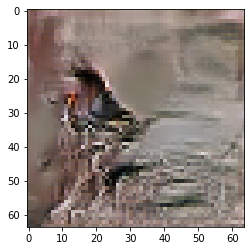

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 7

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6921343803405762 sec
Gen loss: 1.7918210782502826, Disc loss: 2.160498286548414, Disc valid real loss: 0.38186589040254293, Disc valid fake loss: 0.4204640545343098, Disc class real loss: 0.679488502050701, Disc class fake loss: 0.19901997556811885
Time for epoch 2 is 0.6954226493835449 sec
Gen loss: 2.01724836700841, Disc loss: 2.1883506774902344, Disc valid real loss: 0.3827898674889615, Disc valid fake loss: 0.39807333601148503, Disc class real loss: 0.7050935814255163, Disc class fake loss: 0.19553883530591665
Time for epoch 3 is 0.6969776153564453 sec
Gen loss: 1.858170929707979, Disc loss: 2.188092407427336, Disc valid real loss: 0.4113533355687794, Disc valid fake loss: 0.3998857485620599, Disc class real loss: 0.6906495345266241, Disc class fake loss: 0.19218067550345472
Time for epoch 4 is 0.6997008323669434 sec
Gen loss: 1.8196960122961747,

Time for epoch 31 is 0.6966195106506348 sec
Gen loss: 1.8031296667299772, Disc loss: 2.0635606677908647, Disc valid real loss: 0.38720521330833435, Disc valid fake loss: 0.3854160010814667, Disc class real loss: 0.6665773925028349, Disc class fake loss: 0.2816383548473057
Time for epoch 32 is 0.697127103805542 sec
Gen loss: 1.7836583539059288, Disc loss: 2.14473935804869, Disc valid real loss: 0.39198736611165497, Disc valid fake loss: 0.3976968620952807, Disc class real loss: 0.7006961954267401, Disc class fake loss: 0.2918684482574463
Time for epoch 33 is 0.6958444118499756 sec
Gen loss: 1.7621318415591591, Disc loss: 2.1650881892756413, Disc valid real loss: 0.39885277026578, Disc valid fake loss: 0.4117008322163632, Disc class real loss: 0.6993430288214433, Disc class fake loss: 0.3214132526987477
Time for epoch 34 is 0.6993768215179443 sec
Gen loss: 1.8021967599266453, Disc loss: 2.1145272129460384, Disc valid real loss: 0.39747723309617294, Disc valid fake loss: 0.414558416918704

Time for epoch 62 is 0.6974244117736816 sec
Gen loss: 1.828758484438846, Disc loss: 2.0661456835897347, Disc valid real loss: 0.4112080539527692, Disc valid fake loss: 0.3969884561864953, Disc class real loss: 0.6705924366649828, Disc class fake loss: 0.2945764731419714
Time for epoch 63 is 0.696599006652832 sec
Gen loss: 1.7982259863301326, Disc loss: 2.081783043710809, Disc valid real loss: 0.4034308195114136, Disc valid fake loss: 0.4025849982311851, Disc class real loss: 0.6787161889829134, Disc class fake loss: 0.31571110377186223
Time for epoch 64 is 0.6949458122253418 sec
Gen loss: 1.7884432579341687, Disc loss: 2.0437085691251253, Disc valid real loss: 0.3982307456041637, Disc valid fake loss: 0.3840525762030953, Disc class real loss: 0.6753178709431699, Disc class fake loss: 0.2849197960213611
Time for epoch 65 is 0.6972339153289795 sec
Gen loss: 1.7312489246067249, Disc loss: 2.0979729639856437, Disc valid real loss: 0.40235485058081777, Disc valid fake loss: 0.43628891047678

Time for epoch 93 is 0.7035791873931885 sec
Gen loss: 1.7720888978556584, Disc loss: 2.0107780632219816, Disc valid real loss: 0.41443674031056854, Disc valid fake loss: 0.41670473625785426, Disc class real loss: 0.6462820486018532, Disc class fake loss: 0.30703284552222804
Time for epoch 94 is 0.7028462886810303 sec
Gen loss: 1.905903565256219, Disc loss: 2.0161432153300236, Disc valid real loss: 0.42421390194641917, Disc valid fake loss: 0.40481932382834585, Disc class real loss: 0.6533871983226976, Disc class fake loss: 0.29758786919869873
Time for epoch 95 is 0.7029106616973877 sec
Gen loss: 1.8320696102945428, Disc loss: 2.019217089602822, Disc valid real loss: 0.41164864050714595, Disc valid fake loss: 0.40503001683636713, Disc class real loss: 0.6678564328896371, Disc class fake loss: 0.2764392863763006
Time for epoch 96 is 0.7019498348236084 sec
Gen loss: 1.8759265447917737, Disc loss: 2.0173154002741764, Disc valid real loss: 0.3821810076111241, Disc valid fake loss: 0.4202731

Time for epoch 124 is 0.7140035629272461 sec
Gen loss: 1.8718023739363019, Disc loss: 1.967542905556528, Disc valid real loss: 0.40856470089209707, Disc valid fake loss: 0.4070147448464444, Disc class real loss: 0.6561726018002159, Disc class fake loss: 0.29539815689388077
Time for epoch 125 is 0.7084534168243408 sec
Gen loss: 1.8689219386954057, Disc loss: 1.9464318250354968, Disc valid real loss: 0.3863946199417114, Disc valid fake loss: 0.3937321822894247, Disc class real loss: 0.6722682777204012, Disc class fake loss: 0.2745099467666526
Time for epoch 126 is 0.7067198753356934 sec
Gen loss: 1.9429184763055098, Disc loss: 1.938768794662074, Disc valid real loss: 0.40011421473402725, Disc valid fake loss: 0.41152235708738627, Disc class real loss: 0.6484951596511038, Disc class fake loss: 0.2725328834433305
Time for epoch 127 is 0.701871395111084 sec
Gen loss: 1.8051009491870278, Disc loss: 1.9694366517819857, Disc valid real loss: 0.38726295452368886, Disc valid fake loss: 0.4032977

Time for epoch 154 is 0.6947038173675537 sec
Gen loss: 1.8883364012366848, Disc loss: 1.917839106760527, Disc valid real loss: 0.39569270610809326, Disc valid fake loss: 0.41340359731724385, Disc class real loss: 0.6677319972138656, Disc class fake loss: 0.2573222776776866
Time for epoch 155 is 0.6892685890197754 sec
Gen loss: 1.948738744384364, Disc loss: 1.9463394001910561, Disc valid real loss: 0.4023831376903935, Disc valid fake loss: 0.4250961667612979, Disc class real loss: 0.681093714739147, Disc class fake loss: 0.24359702671829023
Time for epoch 156 is 0.7035272121429443 sec
Gen loss: 1.8498221886785406, Disc loss: 1.9177950244200856, Disc valid real loss: 0.40420376940777425, Disc valid fake loss: 0.41615709035020126, Disc class real loss: 0.6586245329756486, Disc class fake loss: 0.2659424198301215
Time for epoch 157 is 0.7135987281799316 sec
Gen loss: 1.896335150066175, Disc loss: 1.906607050644724, Disc valid real loss: 0.39127989348612335, Disc valid fake loss: 0.39823097

Time for epoch 184 is 0.6971359252929688 sec
Gen loss: 1.8793804331829673, Disc loss: 1.8920451402664185, Disc valid real loss: 0.4138776361942291, Disc valid fake loss: 0.39812192477678, Disc class real loss: 0.6948778252852591, Disc class fake loss: 0.225958042238888
Time for epoch 185 is 0.6965746879577637 sec
Gen loss: 1.8657365660918386, Disc loss: 1.825291401461551, Disc valid real loss: 0.40083684027194977, Disc valid fake loss: 0.4062046267484364, Disc class real loss: 0.651547438219974, Disc class fake loss: 0.22262419995508695
Time for epoch 186 is 0.6966466903686523 sec
Gen loss: 1.8912016341560764, Disc loss: 1.8421776482933445, Disc valid real loss: 0.39740813405890213, Disc valid fake loss: 0.41577815068395513, Disc class real loss: 0.6600940823554993, Disc class fake loss: 0.22398053501781665
Time for epoch 187 is 0.6965234279632568 sec
Gen loss: 1.9360074244047467, Disc loss: 1.8215636830580861, Disc valid real loss: 0.3917176896019986, Disc valid fake loss: 0.402256201

Time for epoch 214 is 0.6947243213653564 sec
Gen loss: 1.8265011687027781, Disc loss: 1.860774699010347, Disc valid real loss: 0.3997310603919782, Disc valid fake loss: 0.4247966016593732, Disc class real loss: 0.7049237552442049, Disc class fake loss: 0.2188094713185963
Time for epoch 215 is 0.6923284530639648 sec
Gen loss: 1.8561564997622841, Disc loss: 1.83600147774345, Disc valid real loss: 0.3885444622290762, Disc valid fake loss: 0.41907957353089986, Disc class real loss: 0.699850509041234, Disc class fake loss: 0.2188940771708363
Time for epoch 216 is 0.690854549407959 sec
Gen loss: 1.9306034916325618, Disc loss: 1.8243487006739567, Disc valid real loss: 0.40626956757746246, Disc valid fake loss: 0.3953075816756801, Disc class real loss: 0.6734767116998371, Disc class fake loss: 0.2556359132653789
Time for epoch 217 is 0.6935086250305176 sec
Gen loss: 1.839337342663815, Disc loss: 1.8160709832843982, Disc valid real loss: 0.40631428360939026, Disc valid fake loss: 0.407568675907

Time for epoch 244 is 0.695807695388794 sec
Gen loss: 1.867213669576143, Disc loss: 1.7408085371318616, Disc valid real loss: 0.42067639921840866, Disc valid fake loss: 0.3969805460227163, Disc class real loss: 0.6706277037921705, Disc class fake loss: 0.19368781227814524
Time for epoch 245 is 0.6915643215179443 sec
Gen loss: 1.919277504870766, Disc loss: 1.721925415490803, Disc valid real loss: 0.3664439932296151, Disc valid fake loss: 0.39293181111938075, Disc class real loss: 0.6908209512108251, Disc class fake loss: 0.2145757984958197
Time for epoch 246 is 0.695490837097168 sec
Gen loss: 1.974694383771796, Disc loss: 1.8069631614183124, Disc valid real loss: 0.3941403925418854, Disc valid fake loss: 0.3974381873482152, Disc class real loss: 0.7112469422189813, Disc class fake loss: 0.25063162963641317
Time for epoch 247 is 0.7117321491241455 sec
Gen loss: 1.8835837841033936, Disc loss: 1.7748553564673977, Disc valid real loss: 0.41641630781324285, Disc valid fake loss: 0.3980542907

Time for epoch 275 is 0.69474196434021 sec
Gen loss: 1.988171238648264, Disc loss: 1.674037211819699, Disc valid real loss: 0.37094406705153615, Disc valid fake loss: 0.40981677017713847, Disc class real loss: 0.7078022486285159, Disc class fake loss: 0.17923636871733165
Time for epoch 276 is 0.689751148223877 sec
Gen loss: 1.9693491521634554, Disc loss: 1.6854652417333502, Disc valid real loss: 0.3989241468278985, Disc valid fake loss: 0.39045611023902893, Disc class real loss: 0.6803482865032396, Disc class fake loss: 0.21184933656140378
Time for epoch 277 is 0.6965479850769043 sec
Gen loss: 1.880888769501134, Disc loss: 1.6825979195143048, Disc valid real loss: 0.39587954470985814, Disc valid fake loss: 0.4187643637782649, Disc class real loss: 0.6753297887350383, Disc class fake loss: 0.19032546681793114
Time for epoch 278 is 0.6922554969787598 sec
Gen loss: 1.8980800666307147, Disc loss: 1.6946608581041034, Disc valid real loss: 0.40632757073954534, Disc valid fake loss: 0.4060112

Time for epoch 305 is 0.696943998336792 sec
Gen loss: 2.0032556872618827, Disc loss: 1.713639077387358, Disc valid real loss: 0.3945592696729459, Disc valid fake loss: 0.393084284506346, Disc class real loss: 0.7183054058175338, Disc class fake loss: 0.20779221779421755
Time for epoch 306 is 0.7072877883911133 sec
Gen loss: 2.0198045592559013, Disc loss: 1.6665782740241604, Disc valid real loss: 0.39628569232790095, Disc valid fake loss: 0.4014305660599156, Disc class real loss: 0.6788768266376696, Disc class fake loss: 0.1900829606150326
Time for epoch 307 is 0.7083168029785156 sec
Gen loss: 1.9690935360757928, Disc loss: 1.698637002392819, Disc valid real loss: 0.4180949220531865, Disc valid fake loss: 0.4124445507400914, Disc class real loss: 0.675064322195555, Disc class fake loss: 0.19312958811458789
Time for epoch 308 is 0.6916656494140625 sec
Gen loss: 1.9089519224668805, Disc loss: 1.6604705358806409, Disc valid real loss: 0.37681570649147034, Disc valid fake loss: 0.3790995525

Time for epoch 335 is 0.6984069347381592 sec
Gen loss: 2.0117189570477136, Disc loss: 1.7591248374236257, Disc valid real loss: 0.38180260517095266, Disc valid fake loss: 0.4243968089944438, Disc class real loss: 0.7145499022383439, Disc class fake loss: 0.23847077159505142
Time for epoch 336 is 0.6973152160644531 sec
Gen loss: 1.9954942527570223, Disc loss: 1.7308971066223948, Disc valid real loss: 0.4119653301803689, Disc valid fake loss: 0.429147554071326, Disc class real loss: 0.6930374440393949, Disc class fake loss: 0.1968460577098947
Time for epoch 337 is 0.7007474899291992 sec
Gen loss: 2.0021473357551978, Disc loss: 1.6873576641082764, Disc valid real loss: 0.41963351086566325, Disc valid fake loss: 0.4044928291910573, Disc class real loss: 0.6662801472764266, Disc class fake loss: 0.19704506350191017
Time for epoch 338 is 0.6980342864990234 sec
Gen loss: 1.820180566687333, Disc loss: 1.6262165182515194, Disc valid real loss: 0.3882759385987332, Disc valid fake loss: 0.4150779

Time for epoch 365 is 0.6936295032501221 sec
Gen loss: 1.9998740334259837, Disc loss: 1.6574492015336688, Disc valid real loss: 0.41244857562215703, Disc valid fake loss: 0.3904840695230584, Disc class real loss: 0.674099253980737, Disc class fake loss: 0.1805160320118854
Time for epoch 366 is 0.6972417831420898 sec
Gen loss: 1.9278527310020046, Disc loss: 1.6774999656175311, Disc valid real loss: 0.4061373707495238, Disc valid fake loss: 0.3945542817053042, Disc class real loss: 0.6821132114059046, Disc class fake loss: 0.19479254829256157
Time for epoch 367 is 0.7001755237579346 sec
Gen loss: 1.93920341918343, Disc loss: 1.691942861205653, Disc valid real loss: 0.4297168913640474, Disc valid fake loss: 0.40130699778857987, Disc class real loss: 0.6982313551400837, Disc class fake loss: 0.16279472920455432
Time for epoch 368 is 0.6932907104492188 sec
Gen loss: 1.9333967848827964, Disc loss: 1.7121670999025043, Disc valid real loss: 0.42575109004974365, Disc valid fake loss: 0.41163318

Time for epoch 395 is 0.7011995315551758 sec
Gen loss: 1.9255481832905819, Disc loss: 1.6882437467575073, Disc valid real loss: 0.3973210799066644, Disc valid fake loss: 0.42227972965491445, Disc class real loss: 0.6923220377219351, Disc class fake loss: 0.17642410530855782
Time for epoch 396 is 0.6999402046203613 sec
Gen loss: 1.8781086206436157, Disc loss: 1.6994405169236033, Disc valid real loss: 0.4224818395940881, Disc valid fake loss: 0.40300396869057103, Disc class real loss: 0.6906954802964863, Disc class fake loss: 0.18336072681765808
Time for epoch 397 is 0.7038698196411133 sec
Gen loss: 1.9873016194293374, Disc loss: 1.6803792087655318, Disc valid real loss: 0.3957124948501587, Disc valid fake loss: 0.43362479774575485, Disc class real loss: 0.6655379031833849, Disc class fake loss: 0.18560001018800235
Time for epoch 398 is 0.7022578716278076 sec
Gen loss: 1.8871013741744191, Disc loss: 1.6871871697275262, Disc valid real loss: 0.4140917658805847, Disc valid fake loss: 0.394

Time for epoch 425 is 0.6982800960540771 sec
Gen loss: 1.971134443032114, Disc loss: 1.6537337428645085, Disc valid real loss: 0.397621131257007, Disc valid fake loss: 0.3820674372346778, Disc class real loss: 0.7102483699196264, Disc class fake loss: 0.16390607937386162
Time for epoch 426 is 0.6963486671447754 sec
Gen loss: 1.8978046868976794, Disc loss: 1.6629496812820435, Disc valid real loss: 0.4086350939775768, Disc valid fake loss: 0.3905436427969682, Disc class real loss: 0.6858720214743363, Disc class fake loss: 0.17800050503329226
Time for epoch 427 is 0.6991500854492188 sec
Gen loss: 1.9594235043776662, Disc loss: 1.6573788304077952, Disc valid real loss: 0.3882530472780529, Disc valid fake loss: 0.40352559246514974, Disc class real loss: 0.675180899469476, Disc class fake loss: 0.19051622952285566
Time for epoch 428 is 0.6915321350097656 sec
Gen loss: 1.8832108911715055, Disc loss: 1.697589447623805, Disc valid real loss: 0.4177208982015911, Disc valid fake loss: 0.416527803

Time for epoch 455 is 0.7018318176269531 sec
Gen loss: 1.9885177612304688, Disc loss: 1.6600713729858398, Disc valid real loss: 0.38312962023835434, Disc valid fake loss: 0.39384184071892187, Disc class real loss: 0.6836729143795214, Disc class fake loss: 0.19952384421699926
Time for epoch 456 is 0.6977875232696533 sec
Gen loss: 2.026408371172453, Disc loss: 1.7671637723320408, Disc valid real loss: 0.4297660024542558, Disc valid fake loss: 0.4101661396654029, Disc class real loss: 0.7301335115181772, Disc class fake loss: 0.19720472003284253
Time for epoch 457 is 0.7006161212921143 sec
Gen loss: 1.8639417447541888, Disc loss: 1.681952112599423, Disc valid real loss: 0.4009014799406654, Disc valid fake loss: 0.3944361209869385, Disc class real loss: 0.6655107579733196, Disc class fake loss: 0.221192630105897
Time for epoch 458 is 0.6991901397705078 sec
Gen loss: 1.895608901977539, Disc loss: 1.6273764999289262, Disc valid real loss: 0.38636295575844615, Disc valid fake loss: 0.38035740

Time for epoch 485 is 0.6937541961669922 sec
Gen loss: 1.9455467086089284, Disc loss: 1.7316893778349225, Disc valid real loss: 0.4001706775866057, Disc valid fake loss: 0.42925205042487696, Disc class real loss: 0.695232984266783, Disc class fake loss: 0.20713129953334206
Time for epoch 486 is 0.6923389434814453 sec
Gen loss: 1.8568070625004016, Disc loss: 1.6756576487892552, Disc valid real loss: 0.4026153809145877, Disc valid fake loss: 0.396087679423784, Disc class real loss: 0.6916875180445219, Disc class fake loss: 0.18536835203045293
Time for epoch 487 is 0.6933188438415527 sec
Gen loss: 1.9169256561680843, Disc loss: 1.6779839804298, Disc valid real loss: 0.402329904468436, Disc valid fake loss: 0.3998890926963405, Disc class real loss: 0.6988273012010675, Disc class fake loss: 0.1770420682273413
Time for epoch 488 is 0.6946015357971191 sec
Gen loss: 1.981871862160532, Disc loss: 1.7038371249249107, Disc valid real loss: 0.42224800116137456, Disc valid fake loss: 0.414605957897

Time for epoch 515 is 0.7030313014984131 sec
Gen loss: 1.832881996506139, Disc loss: 1.6795638736925627, Disc valid real loss: 0.40964153879567194, Disc valid fake loss: 0.397379269725398, Disc class real loss: 0.6628058050808153, Disc class fake loss: 0.20982788660024343
Time for epoch 516 is 0.694711446762085 sec
Gen loss: 1.9823316147452907, Disc loss: 1.6410233535264667, Disc valid real loss: 0.40238192834352193, Disc valid fake loss: 0.39673118371712535, Disc class real loss: 0.6801195489732843, Disc class fake loss: 0.16189432222592204
Time for epoch 517 is 0.69950270652771 sec
Gen loss: 1.8365664042924579, Disc loss: 1.6337596366280003, Disc valid real loss: 0.39915572498974045, Disc valid fake loss: 0.4076850978951705, Disc class real loss: 0.6584157975096452, Disc class fake loss: 0.16860098862334302
Time for epoch 518 is 0.6977143287658691 sec
Gen loss: 2.0264582884939095, Disc loss: 1.6662739076112445, Disc valid real loss: 0.3968471429849926, Disc valid fake loss: 0.3894492

Time for epoch 545 is 0.7004964351654053 sec
Gen loss: 1.8557825025759245, Disc loss: 1.7089627730218988, Disc valid real loss: 0.4139579236507416, Disc valid fake loss: 0.3869431191369107, Disc class real loss: 0.7047199638266313, Disc class fake loss: 0.20344203083138718
Time for epoch 546 is 0.6988675594329834 sec
Gen loss: 1.9302449665571515, Disc loss: 1.696832681957044, Disc valid real loss: 0.4165530879246561, Disc valid fake loss: 0.4031460818491484, Disc class real loss: 0.6944086928116647, Disc class fake loss: 0.182827154272481
Time for epoch 547 is 0.6987974643707275 sec
Gen loss: 1.8331289291381836, Disc loss: 1.6402408574756824, Disc valid real loss: 0.3960170243915759, Disc valid fake loss: 0.3935449437091225, Disc class real loss: 0.6856210388635334, Disc class fake loss: 0.1651619813944164
Time for epoch 548 is 0.6981480121612549 sec
Gen loss: 1.9461588922299837, Disc loss: 1.6417457179019326, Disc valid real loss: 0.4115822550497557, Disc valid fake loss: 0.3947057457

Time for epoch 575 is 0.6987552642822266 sec
Gen loss: 1.963628756372552, Disc loss: 1.6603424737327976, Disc valid real loss: 0.410044883426867, Disc valid fake loss: 0.38223054377656235, Disc class real loss: 0.684310611925627, Disc class fake loss: 0.18385653825182663
Time for epoch 576 is 0.6948831081390381 sec
Gen loss: 1.8982480074229993, Disc loss: 1.6321500978971784, Disc valid real loss: 0.4081006269705923, Disc valid fake loss: 0.40850410022233663, Disc class real loss: 0.6618363355335436, Disc class fake loss: 0.15381063991471342
Time for epoch 577 is 0.6980876922607422 sec
Gen loss: 1.8615860876284147, Disc loss: 1.714768453648216, Disc valid real loss: 0.415653247582285, Disc valid fake loss: 0.40428222323718827, Disc class real loss: 0.7056991426568282, Disc class fake loss: 0.1892371726663489
Time for epoch 578 is 0.6975326538085938 sec
Gen loss: 1.8533451055225574, Disc loss: 1.6755924413078709, Disc valid real loss: 0.4054063119386372, Disc valid fake loss: 0.410220941

Time for epoch 605 is 0.6980938911437988 sec
Gen loss: 1.8612472697308189, Disc loss: 1.637960013590361, Disc valid real loss: 0.4052614146157315, Disc valid fake loss: 0.392571254780418, Disc class real loss: 0.6690307134076169, Disc class fake loss: 0.17119621250190234
Time for epoch 606 is 0.6975119113922119 sec
Gen loss: 1.8970025401366384, Disc loss: 1.7109614547930265, Disc valid real loss: 0.4030006590642427, Disc valid fake loss: 0.43375831058150843, Disc class real loss: 0.6995533892982885, Disc class fake loss: 0.1747540772745484
Time for epoch 607 is 0.6966032981872559 sec
Gen loss: 1.9759497768000553, Disc loss: 1.659406109860069, Disc valid real loss: 0.3879331664035195, Disc valid fake loss: 0.39867132274728073, Disc class real loss: 0.6960413361850538, Disc class fake loss: 0.17686413738288378
Time for epoch 608 is 0.6983141899108887 sec
Gen loss: 1.9009848770342375, Disc loss: 1.7150738427513523, Disc valid real loss: 0.3934126747281928, Disc valid fake loss: 0.42738678

Time for epoch 635 is 0.6985390186309814 sec
Gen loss: 1.9870267918235378, Disc loss: 1.6682378618340743, Disc valid real loss: 0.39606901532725286, Disc valid fake loss: 0.4109169001642026, Disc class real loss: 0.6954445054656581, Disc class fake loss: 0.16591333950820722
Time for epoch 636 is 0.699652910232544 sec
Gen loss: 1.9813973778172542, Disc loss: 1.704410377301668, Disc valid real loss: 0.4075634855973093, Disc valid fake loss: 0.40883204340934753, Disc class real loss: 0.6942544014830339, Disc class fake loss: 0.1938605312454073
Time for epoch 637 is 0.6980581283569336 sec
Gen loss: 1.8596679599661576, Disc loss: 1.7155633851101524, Disc valid real loss: 0.43266288230293676, Disc valid fake loss: 0.4305340522213986, Disc class real loss: 0.6670028347718088, Disc class fake loss: 0.18545994123345927
Time for epoch 638 is 0.698106050491333 sec
Gen loss: 1.9432984276821739, Disc loss: 1.6543303037944592, Disc valid real loss: 0.3869907573649758, Disc valid fake loss: 0.3998127

Time for epoch 665 is 0.698047399520874 sec
Gen loss: 1.8657683447787636, Disc loss: 1.6456951342130963, Disc valid real loss: 0.3991041356011441, Disc valid fake loss: 0.3896229549458152, Disc class real loss: 0.6840975880622864, Disc class fake loss: 0.17297269835283882
Time for epoch 666 is 0.697437047958374 sec
Gen loss: 1.9250311349567615, Disc loss: 1.6667704958664744, Disc valid real loss: 0.39293170759552404, Disc valid fake loss: 0.42275354579875346, Disc class real loss: 0.6937941689240305, Disc class fake loss: 0.1573983681829352
Time for epoch 667 is 0.6979758739471436 sec
Gen loss: 1.9067428300255223, Disc loss: 1.6786640694266872, Disc valid real loss: 0.39278425354706614, Disc valid fake loss: 0.3996757739468625, Disc class real loss: 0.7136106553830599, Disc class fake loss: 0.17270158701821378
Time for epoch 668 is 0.6986052989959717 sec
Gen loss: 1.882088435323615, Disc loss: 1.6666966300261647, Disc valid real loss: 0.3809630949246256, Disc valid fake loss: 0.3990844

Time for epoch 695 is 0.7008774280548096 sec
Gen loss: 1.9802526737514294, Disc loss: 1.6590189369101274, Disc valid real loss: 0.38764932986937073, Disc valid fake loss: 0.4131858772353122, Disc class real loss: 0.6901826168361463, Disc class fake loss: 0.16810553069961698
Time for epoch 696 is 0.6991369724273682 sec
Gen loss: 1.952862206258272, Disc loss: 1.6737067762174105, Disc valid real loss: 0.41205119772961263, Disc valid fake loss: 0.402572805944242, Disc class real loss: 0.6820030871190523, Disc class fake loss: 0.1771806647118769
Time for epoch 697 is 0.6972558498382568 sec
Gen loss: 1.852356847963835, Disc loss: 1.7592151353233738, Disc valid real loss: 0.4286283615388368, Disc valid fake loss: 0.41914330030742447, Disc class real loss: 0.7179914995243675, Disc class fake loss: 0.19355688949948863
Time for epoch 698 is 0.6963636875152588 sec
Gen loss: 1.898312116924085, Disc loss: 1.6835560171227706, Disc valid real loss: 0.4120894858711644, Disc valid fake loss: 0.39027602

Time for epoch 725 is 0.6985726356506348 sec
Gen loss: 2.0095724432091964, Disc loss: 1.6927501841595298, Disc valid real loss: 0.3923551863745639, Disc valid fake loss: 0.39336655563429784, Disc class real loss: 0.7183747856240523, Disc class fake loss: 0.18875959554785177
Time for epoch 726 is 0.6955864429473877 sec
Gen loss: 1.8470023744984676, Disc loss: 1.6785551058618646, Disc valid real loss: 0.3923940391916978, Disc valid fake loss: 0.4014011668531518, Disc class real loss: 0.7166274974220678, Disc class fake loss: 0.1682421074886071
Time for epoch 727 is 0.6978785991668701 sec
Gen loss: 1.862976544781735, Disc loss: 1.6675451366524947, Disc valid real loss: 0.3903610667115764, Disc valid fake loss: 0.39819857478141785, Disc class real loss: 0.6983334673078436, Disc class fake loss: 0.1807555493555571
Time for epoch 728 is 0.6992788314819336 sec
Gen loss: 1.816351526661923, Disc loss: 1.6869715577677677, Disc valid real loss: 0.4237965878687407, Disc valid fake loss: 0.40908589

Time for epoch 755 is 0.6987016201019287 sec
Gen loss: 1.9114940856632434, Disc loss: 1.7146264628360146, Disc valid real loss: 0.40329837799072266, Disc valid fake loss: 0.40968028338331924, Disc class real loss: 0.6841608223162199, Disc class fake loss: 0.21758030198122325
Time for epoch 756 is 0.7012619972229004 sec
Gen loss: 1.881339945291218, Disc loss: 1.7022220335508649, Disc valid real loss: 0.407247814692949, Disc valid fake loss: 0.4068825731151982, Disc class real loss: 0.7120932748443202, Disc class fake loss: 0.17610557691047066
Time for epoch 757 is 0.6966655254364014 sec
Gen loss: 1.9328455046603554, Disc loss: 1.666698932647705, Disc valid real loss: 0.40127594769001007, Disc valid fake loss: 0.3945675853051637, Disc class real loss: 0.6892199516296387, Disc class fake loss: 0.18173696571274808
Time for epoch 758 is 0.700427770614624 sec
Gen loss: 2.114184674463774, Disc loss: 1.6317213083568372, Disc valid real loss: 0.3872088711512716, Disc valid fake loss: 0.38736206

Time for epoch 785 is 0.6959428787231445 sec
Gen loss: 1.8565025455073307, Disc loss: 1.635872615011115, Disc valid real loss: 0.38948243856430054, Disc valid fake loss: 0.4016807236169514, Disc class real loss: 0.6709868123656825, Disc class fake loss: 0.17382208571622246
Time for epoch 786 is 0.7009792327880859 sec
Gen loss: 1.934318693060624, Disc loss: 1.6625361379824186, Disc valid real loss: 0.41775830795890406, Disc valid fake loss: 0.38512757577394185, Disc class real loss: 0.6967522564687227, Disc class fake loss: 0.1630047708749771
Time for epoch 787 is 0.6993772983551025 sec
Gen loss: 1.8589942392550016, Disc loss: 1.6836464342318083, Disc valid real loss: 0.40991779377585963, Disc valid fake loss: 0.413851167026319, Disc class real loss: 0.695752855978514, Disc class fake loss: 0.16423093017778898
Time for epoch 788 is 0.7000980377197266 sec
Gen loss: 1.8851745003148128, Disc loss: 1.6820726582878514, Disc valid real loss: 0.39003774523735046, Disc valid fake loss: 0.416368

Time for epoch 815 is 0.7002568244934082 sec
Gen loss: 1.867540905350133, Disc loss: 1.6742539343081022, Disc valid real loss: 0.4071685624750037, Disc valid fake loss: 0.397269606590271, Disc class real loss: 0.6932468069227118, Disc class fake loss: 0.17667226807067268
Time for epoch 816 is 0.6992619037628174 sec
Gen loss: 1.8773654322875173, Disc loss: 1.637390425330714, Disc valid real loss: 0.40701024469576386, Disc valid fake loss: 0.4132982006198482, Disc class real loss: 0.64820974437814, Disc class fake loss: 0.16896812931487434
Time for epoch 817 is 0.6976046562194824 sec
Gen loss: 1.89570835389589, Disc loss: 1.7200785373386585, Disc valid real loss: 0.3983092355100732, Disc valid fake loss: 0.41946267297393397, Disc class real loss: 0.7052626547060514, Disc class fake loss: 0.19714560202862086
Time for epoch 818 is 0.700310230255127 sec
Gen loss: 1.9483357667922974, Disc loss: 1.6773036906593723, Disc valid real loss: 0.4144929992525201, Disc valid fake loss: 0.410436360459

Time for epoch 845 is 0.6978111267089844 sec
Gen loss: 1.9265883721803363, Disc loss: 1.6677518832056146, Disc valid real loss: 0.40143673514064987, Disc valid fake loss: 0.41090276366785955, Disc class real loss: 0.6959294849320462, Disc class fake loss: 0.1595901866492472
Time for epoch 846 is 0.6968235969543457 sec
Gen loss: 1.9822731582741988, Disc loss: 1.661318258235329, Disc valid real loss: 0.3799089036489788, Disc valid fake loss: 0.3915486210270932, Disc class real loss: 0.7068009564751073, Disc class fake loss: 0.183164529110256
Time for epoch 847 is 0.6949596405029297 sec
Gen loss: 2.0318796760157536, Disc loss: 1.6816729934591996, Disc valid real loss: 0.42597821668574687, Disc valid fake loss: 0.3745686443228471, Disc class real loss: 0.6973771484274613, Disc class fake loss: 0.18385170282501923
Time for epoch 848 is 0.6954159736633301 sec
Gen loss: 1.8319028553209806, Disc loss: 1.654084274643346, Disc valid real loss: 0.36965870229821457, Disc valid fake loss: 0.4122064

Time for epoch 875 is 0.6994426250457764 sec
Gen loss: 2.136592337959691, Disc loss: 1.6466580441123562, Disc valid real loss: 0.39550786112484176, Disc valid fake loss: 0.39125324236719233, Disc class real loss: 0.688647072566183, Disc class fake loss: 0.17135336602988996
Time for epoch 876 is 0.6997573375701904 sec
Gen loss: 1.8147257064518176, Disc loss: 1.7351390876268085, Disc valid real loss: 0.41672907063835546, Disc valid fake loss: 0.41637253918145833, Disc class real loss: 0.7266400676024588, Disc class fake loss: 0.17550765291640633
Time for epoch 877 is 0.6958367824554443 sec
Gen loss: 1.8747462598901046, Disc loss: 1.6863727004904496, Disc valid real loss: 0.396451440296675, Disc valid fake loss: 0.42055956470338923, Disc class real loss: 0.7018511232576872, Disc class fake loss: 0.16761744022369385
Time for epoch 878 is 0.6990213394165039 sec
Gen loss: 1.9146626560311568, Disc loss: 1.6734840305227983, Disc valid real loss: 0.3965772892299451, Disc valid fake loss: 0.4121

Time for epoch 905 is 0.6975674629211426 sec
Gen loss: 1.84406746688642, Disc loss: 1.7001311088863171, Disc valid real loss: 0.41519421025326375, Disc valid fake loss: 0.4331179025926088, Disc class real loss: 0.6862227948088395, Disc class fake loss: 0.16570032348758296
Time for epoch 906 is 0.6974167823791504 sec
Gen loss: 1.9433283931330632, Disc loss: 1.6984388263602006, Disc valid real loss: 0.40577594230049535, Disc valid fake loss: 0.4118142551497409, Disc class real loss: 0.6848185658454895, Disc class fake loss: 0.19612780370210348
Time for epoch 907 is 0.6972897052764893 sec
Gen loss: 1.8376706211190474, Disc loss: 1.683607308488143, Disc valid real loss: 0.4054170501859565, Disc valid fake loss: 0.4136509895324707, Disc class real loss: 0.6768689312432942, Disc class fake loss: 0.18776817149237582
Time for epoch 908 is 0.6987261772155762 sec
Gen loss: 1.9742050108156706, Disc loss: 1.6644161563170583, Disc valid real loss: 0.39663911493201004, Disc valid fake loss: 0.402338

Time for epoch 935 is 0.6996796131134033 sec
Gen loss: 1.9388126134872437, Disc loss: 1.6954923554470664, Disc valid real loss: 0.40915190075573166, Disc valid fake loss: 0.4183545238093326, Disc class real loss: 0.7327947302868492, Disc class fake loss: 0.13531072712258288
Time for epoch 936 is 0.696101188659668 sec
Gen loss: 1.9543634966800087, Disc loss: 1.6566702566648785, Disc valid real loss: 0.36894745183618444, Disc valid fake loss: 0.3965266942977905, Disc class real loss: 0.6723150610923767, Disc class fake loss: 0.2189717022211928
Time for epoch 937 is 0.6941812038421631 sec
Gen loss: 1.9258688249086078, Disc loss: 1.6911127002615678, Disc valid real loss: 0.3875327063234229, Disc valid fake loss: 0.40464652212042557, Disc class real loss: 0.7279491863752666, Disc class fake loss: 0.17109568260217967
Time for epoch 938 is 0.6941750049591064 sec
Gen loss: 1.8906311863347103, Disc loss: 1.6388277442831742, Disc valid real loss: 0.4139021666426408, Disc valid fake loss: 0.40471

Time for epoch 965 is 0.6921606063842773 sec
Gen loss: 1.954564985476042, Disc loss: 1.6831334264654862, Disc valid real loss: 0.4079049747241171, Disc valid fake loss: 0.3821609914302826, Disc class real loss: 0.6782560473994205, Disc class fake loss: 0.2149040985264276
Time for epoch 966 is 0.6963024139404297 sec
Gen loss: 2.001688235684445, Disc loss: 1.6490666740819027, Disc valid real loss: 0.39267934152954503, Disc valid fake loss: 0.3815515707982214, Disc class real loss: 0.6945461348483437, Disc class fake loss: 0.1803925072676257
Time for epoch 967 is 0.6958498954772949 sec
Gen loss: 1.9557124439038729, Disc loss: 1.6780505619551007, Disc valid real loss: 0.3933536520129756, Disc valid fake loss: 0.3904992875299956, Disc class real loss: 0.7052135216562372, Disc class fake loss: 0.18908735952879252
Time for epoch 968 is 0.698815107345581 sec
Gen loss: 1.932012062323721, Disc loss: 1.6264939308166504, Disc valid real loss: 0.3654816715340865, Disc valid fake loss: 0.39669154819

Time for epoch 995 is 0.6995668411254883 sec
Gen loss: 1.905812382698059, Disc loss: 1.7232233913321244, Disc valid real loss: 0.4271519262539713, Disc valid fake loss: 0.4000166293821837, Disc class real loss: 0.7209990306904441, Disc class fake loss: 0.17516502424290306
Time for epoch 996 is 0.708812952041626 sec
Gen loss: 1.8964859498174567, Disc loss: 1.6593317671826011, Disc valid real loss: 0.394286572933197, Disc valid fake loss: 0.39369309262225505, Disc class real loss: 0.6968360229542381, Disc class fake loss: 0.1746205624781157
Time for epoch 997 is 0.7017269134521484 sec
Gen loss: 1.8544514179229736, Disc loss: 1.6643823824430768, Disc valid real loss: 0.3750969893053958, Disc valid fake loss: 0.41522857546806335, Disc class real loss: 0.7195652252749393, Disc class fake loss: 0.15460459574272759
Time for epoch 998 is 0.6978569030761719 sec
Gen loss: 1.9182259032600804, Disc loss: 1.6602157040646202, Disc valid real loss: 0.3780933210724278, Disc valid fake loss: 0.40406265

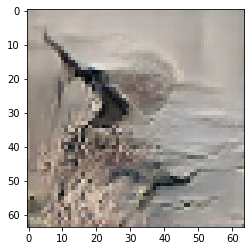

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 8

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.698573112487793 sec
Gen loss: 1.9209781571438438, Disc loss: 2.182254697147169, Disc valid real loss: 0.4017381323011298, Disc valid fake loss: 0.404935432107825, Disc class real loss: 0.6882056280186302, Disc class fake loss: 0.18379213268819608
Time for epoch 2 is 0.6981987953186035 sec
Gen loss: 1.9676867786206698, Disc loss: 2.235558083182887, Disc valid real loss: 0.3838656309403871, Disc valid fake loss: 0.41693012651644257, Disc class real loss: 0.7187866976386622, Disc class fake loss: 0.18836812753426402
Time for epoch 3 is 0.6990127563476562 sec
Gen loss: 1.82465062015935, Disc loss: 2.145662690463819, Disc valid real loss: 0.3859591970318242, Disc valid fake loss: 0.3860552750135723, Disc class real loss: 0.68889277859738, Disc class fake loss: 0.22458156394331077
Time for epoch 4 is 0.6972296237945557 sec
Gen loss: 1.8667620796906321, Dis

Time for epoch 31 is 0.6966838836669922 sec
Gen loss: 1.834335484002766, Disc loss: 2.1216270672647575, Disc valid real loss: 0.40250896309551437, Disc valid fake loss: 0.39857423305511475, Disc class real loss: 0.6803146632094133, Disc class fake loss: 0.31550666611445577
Time for epoch 32 is 0.6964747905731201 sec
Gen loss: 1.7715056569952714, Disc loss: 2.1274843780617965, Disc valid real loss: 0.4114102297707608, Disc valid fake loss: 0.40445947960803386, Disc class real loss: 0.6770627655481037, Disc class fake loss: 0.3017179166015826
Time for epoch 33 is 0.6973750591278076 sec
Gen loss: 1.8283528152265047, Disc loss: 2.1086357769213224, Disc valid real loss: 0.39946063568717555, Disc valid fake loss: 0.41300843577635915, Disc class real loss: 0.6723106346632305, Disc class fake loss: 0.25814127608349446
Time for epoch 34 is 0.6974272727966309 sec
Gen loss: 1.766902020103053, Disc loss: 2.1262281003751253, Disc valid real loss: 0.38711797093090256, Disc valid fake loss: 0.4088237

Time for epoch 62 is 0.6962153911590576 sec
Gen loss: 1.793583211145903, Disc loss: 2.0401087560151754, Disc valid real loss: 0.39235769133818776, Disc valid fake loss: 0.4074317969773945, Disc class real loss: 0.6623139130441766, Disc class fake loss: 0.2812694444468147
Time for epoch 63 is 0.692990779876709 sec
Gen loss: 1.7878433591441105, Disc loss: 2.042300970930802, Disc valid real loss: 0.41161329652133744, Disc valid fake loss: 0.4112459797608225, Disc class real loss: 0.6458633134239599, Disc class fake loss: 0.3243246094176644
Time for epoch 64 is 0.6948983669281006 sec
Gen loss: 1.8552418319802535, Disc loss: 2.1146155846746346, Disc valid real loss: 0.40959479150019196, Disc valid fake loss: 0.43660511939149155, Disc class real loss: 0.6749143631834733, Disc class fake loss: 0.3185845880131972
Time for epoch 65 is 0.6937479972839355 sec
Gen loss: 1.9730665495521145, Disc loss: 2.0568343149988273, Disc valid real loss: 0.38329131352274043, Disc valid fake loss: 0.40844593236

Time for epoch 93 is 0.7023370265960693 sec
Gen loss: 1.8444846868515015, Disc loss: 2.031199110181708, Disc valid real loss: 0.39613436397753266, Disc valid fake loss: 0.3923764573900323, Disc class real loss: 0.6858379903592562, Disc class fake loss: 0.298408094989626
Time for epoch 94 is 0.6992583274841309 sec
Gen loss: 1.7941188247580278, Disc loss: 2.046196335240414, Disc valid real loss: 0.40064124998293427, Disc valid fake loss: 0.4112308919429779, Disc class real loss: 0.67885843076204, Disc class fake loss: 0.3120697626942082
Time for epoch 95 is 0.6982541084289551 sec
Gen loss: 1.8106169826106022, Disc loss: 2.037358189883985, Disc valid real loss: 0.4042865775133434, Disc valid fake loss: 0.4147294665637769, Disc class real loss: 0.6729413835625899, Disc class fake loss: 0.2977939365725768
Time for epoch 96 is 0.7000482082366943 sec
Gen loss: 1.8629443331768638, Disc loss: 1.9525815373972844, Disc valid real loss: 0.39233764535502386, Disc valid fake loss: 0.4046404314668555

Time for epoch 123 is 0.6890251636505127 sec
Gen loss: 1.8678115543566252, Disc loss: 1.967490880112899, Disc valid real loss: 0.3956766128540039, Disc valid fake loss: 0.3991403846364272, Disc class real loss: 0.6794966208307367, Disc class fake loss: 0.2569025645130559
Time for epoch 124 is 0.6975820064544678 sec
Gen loss: 1.8688576284207796, Disc loss: 1.967031855332224, Disc valid real loss: 0.39520099288538885, Disc valid fake loss: 0.42255918289485733, Disc class real loss: 0.6632770299911499, Disc class fake loss: 0.26448717085938706
Time for epoch 125 is 0.6989138126373291 sec
Gen loss: 1.7548950345892655, Disc loss: 1.983708940054241, Disc valid real loss: 0.4131243730846204, Disc valid fake loss: 0.4228832376630683, Disc class real loss: 0.6582764700839394, Disc class fake loss: 0.281430206800762
Time for epoch 126 is 0.6986050605773926 sec
Gen loss: 1.8852715178539878, Disc loss: 1.9747618876005475, Disc valid real loss: 0.41806029802874517, Disc valid fake loss: 0.396125804

Time for epoch 153 is 0.7010929584503174 sec
Gen loss: 1.8422846229452836, Disc loss: 1.8560712212010433, Disc valid real loss: 0.3987640503205751, Disc valid fake loss: 0.3931459282573901, Disc class real loss: 0.6438059116664686, Disc class fake loss: 0.23671298591714157
Time for epoch 154 is 0.7037513256072998 sec
Gen loss: 1.8174220198079158, Disc loss: 1.9163562561336316, Disc valid real loss: 0.38778398852599294, Disc valid fake loss: 0.3907098534860109, Disc class real loss: 0.6913183582456488, Disc class fake loss: 0.24819305303849673
Time for epoch 155 is 0.7020330429077148 sec
Gen loss: 1.947341241334614, Disc loss: 1.8666101568623592, Disc valid real loss: 0.39929470733592387, Disc valid fake loss: 0.3915067393528788, Disc class real loss: 0.6535521337860509, Disc class fake loss: 0.23757797950192502
Time for epoch 156 is 0.7030937671661377 sec
Gen loss: 1.9950488303837024, Disc loss: 1.8859636407149465, Disc valid real loss: 0.4175510641775633, Disc valid fake loss: 0.38124

Time for epoch 183 is 0.7014970779418945 sec
Gen loss: 1.7862601468437596, Disc loss: 1.8919066002494411, Disc valid real loss: 0.4094564193173459, Disc valid fake loss: 0.4293885811379081, Disc class real loss: 0.6734501656733061, Disc class fake loss: 0.22614957862778715
Time for epoch 184 is 0.702462911605835 sec
Gen loss: 1.7997626630883468, Disc loss: 1.8714662853040194, Disc valid real loss: 0.40910859798130234, Disc valid fake loss: 0.41099703155065836, Disc class real loss: 0.656329167516608, Disc class fake loss: 0.2607406950310657
Time for epoch 185 is 0.7002158164978027 sec
Gen loss: 1.9942409992218018, Disc loss: 1.8722030614551746, Disc valid real loss: 0.396709973874845, Disc valid fake loss: 0.4012636142341714, Disc class real loss: 0.6844324093115958, Disc class fake loss: 0.2407466659420415
Time for epoch 186 is 0.7011799812316895 sec
Gen loss: 1.8837088722931712, Disc loss: 1.8620042989128514, Disc valid real loss: 0.40536717050953913, Disc valid fake loss: 0.39937134

Time for epoch 213 is 0.6936793327331543 sec
Gen loss: 1.988213997138174, Disc loss: 1.7609429798628156, Disc valid real loss: 0.3872109926060626, Disc valid fake loss: 0.39668359254535873, Disc class real loss: 0.6737800679708782, Disc class fake loss: 0.18936400938975184
Time for epoch 214 is 0.6943259239196777 sec
Gen loss: 1.9252655882584422, Disc loss: 1.8272007013622082, Disc valid real loss: 0.41974548132796036, Disc valid fake loss: 0.41015310350217316, Disc class real loss: 0.6778832454430429, Disc class fake loss: 0.2114228061155269
Time for epoch 215 is 0.6934621334075928 sec
Gen loss: 1.9083759157281173, Disc loss: 1.7759428714451038, Disc valid real loss: 0.3843900043713419, Disc valid fake loss: 0.39030323373643977, Disc class real loss: 0.698734346188997, Disc class fake loss: 0.18552392289826744
Time for epoch 216 is 0.6934230327606201 sec
Gen loss: 2.0185971573779455, Disc loss: 1.7299739436099404, Disc valid real loss: 0.37904614366983114, Disc valid fake loss: 0.4047

Time for epoch 243 is 0.7003977298736572 sec
Gen loss: 1.8644199559563084, Disc loss: 1.7354635439421002, Disc valid real loss: 0.39031461822359187, Disc valid fake loss: 0.40386316337083517, Disc class real loss: 0.6882781135408502, Disc class fake loss: 0.18964171056684695
Time for epoch 244 is 0.695908784866333 sec
Gen loss: 1.9557879974967556, Disc loss: 1.7476345237932707, Disc valid real loss: 0.38334755991634567, Disc valid fake loss: 0.4242818732010691, Disc class real loss: 0.6794858480754652, Disc class fake loss: 0.20146780186577848
Time for epoch 245 is 0.7010862827301025 sec
Gen loss: 1.9988064765930176, Disc loss: 1.7571386914504201, Disc valid real loss: 0.41917225247935247, Disc valid fake loss: 0.41934022150541606, Disc class real loss: 0.6599745844539843, Disc class fake loss: 0.2040257963695024
Time for epoch 246 is 0.6990609169006348 sec
Gen loss: 1.841902400317945, Disc loss: 1.747893910658987, Disc valid real loss: 0.39787961150470535, Disc valid fake loss: 0.4046

Time for epoch 273 is 0.6995837688446045 sec
Gen loss: 1.9280129859321995, Disc loss: 1.6882318948444568, Disc valid real loss: 0.43102513488970307, Disc valid fake loss: 0.3936833033436223, Disc class real loss: 0.6735393248106304, Disc class fake loss: 0.18059244908784566
Time for epoch 274 is 0.6992266178131104 sec
Gen loss: 1.984743921380294, Disc loss: 1.6874566015444303, Disc valid real loss: 0.3770584346432435, Disc valid fake loss: 0.40436886956817225, Disc class real loss: 0.6839224915755423, Disc class fake loss: 0.2148107337324243
Time for epoch 275 is 0.6964294910430908 sec
Gen loss: 1.9723634406139976, Disc loss: 1.695247298792789, Disc valid real loss: 0.40048174089507055, Disc valid fake loss: 0.40885488610518606, Disc class real loss: 0.6932104198556197, Disc class fake loss: 0.18671178111904546
Time for epoch 276 is 0.6999459266662598 sec
Gen loss: 2.0166149892305074, Disc loss: 1.6674139750631232, Disc valid real loss: 0.4003953510209134, Disc valid fake loss: 0.38275

Time for epoch 303 is 0.7012674808502197 sec
Gen loss: 1.8867696084474261, Disc loss: 1.6909216956088418, Disc valid real loss: 0.4166080010564704, Disc valid fake loss: 0.39217662183861984, Disc class real loss: 0.6907743937090823, Disc class fake loss: 0.19146255168475604
Time for epoch 304 is 0.701580286026001 sec
Gen loss: 1.8924717903137207, Disc loss: 1.618295431137085, Disc valid real loss: 0.3940962482439844, Disc valid fake loss: 0.4035989689199548, Disc class real loss: 0.6577140092849731, Disc class fake loss: 0.16298517114237734
Time for epoch 305 is 0.6998815536499023 sec
Gen loss: 1.9407968960310285, Disc loss: 1.68324455462004, Disc valid real loss: 0.3739396804257443, Disc valid fake loss: 0.42432550693813126, Disc class real loss: 0.6838244921282718, Disc class fake loss: 0.20125138681185872
Time for epoch 306 is 0.701312780380249 sec
Gen loss: 1.9095209397767718, Disc loss: 1.7049555653019954, Disc valid real loss: 0.39488949587470606, Disc valid fake loss: 0.40905221

Time for epoch 333 is 0.7033920288085938 sec
Gen loss: 1.9404736945503636, Disc loss: 1.693185944306223, Disc valid real loss: 0.40028227473560135, Disc valid fake loss: 0.40254268207048116, Disc class real loss: 0.6858805292531064, Disc class fake loss: 0.2045767475899897
Time for epoch 334 is 0.6969161033630371 sec
Gen loss: 1.8385769128799438, Disc loss: 1.6658302420064022, Disc valid real loss: 0.4033125544849195, Disc valid fake loss: 0.40986043999069616, Disc class real loss: 0.666651482644834, Disc class fake loss: 0.18610185384750366
Time for epoch 335 is 0.6978023052215576 sec
Gen loss: 1.9853783720418026, Disc loss: 1.658204850397612, Disc valid real loss: 0.39234853810385656, Disc valid fake loss: 0.4231987799468793, Disc class real loss: 0.681978420207375, Disc class fake loss: 0.1607833657609789
Time for epoch 336 is 0.7022175788879395 sec
Gen loss: 1.9448151651181673, Disc loss: 1.7009249549163015, Disc valid real loss: 0.38462324832615097, Disc valid fake loss: 0.4109525

Time for epoch 363 is 0.698016881942749 sec
Gen loss: 1.9291009714728908, Disc loss: 1.7286625912314968, Disc valid real loss: 0.3720644681077254, Disc valid fake loss: 0.42010948218797384, Disc class real loss: 0.7251969575881958, Disc class fake loss: 0.21139447940023323
Time for epoch 364 is 0.6973226070404053 sec
Gen loss: 1.9100507811496132, Disc loss: 1.6911871245032863, Disc valid real loss: 0.39292137873800176, Disc valid fake loss: 0.3995430391085775, Disc class real loss: 0.7117501120818289, Disc class fake loss: 0.18707752894414098
Time for epoch 365 is 0.6995806694030762 sec
Gen loss: 1.9535111063405086, Disc loss: 1.699098499197709, Disc valid real loss: 0.40741522845469025, Disc valid fake loss: 0.40259912139491033, Disc class real loss: 0.6683254179201628, Disc class fake loss: 0.22084822270431018
Time for epoch 366 is 0.6968991756439209 sec
Gen loss: 2.0377511538957296, Disc loss: 1.6538106705013074, Disc valid real loss: 0.39585157052466746, Disc valid fake loss: 0.398

Time for epoch 393 is 0.6931390762329102 sec
Gen loss: 1.8688973815817582, Disc loss: 1.6252660312150653, Disc valid real loss: 0.39600816839619685, Disc valid fake loss: 0.3865631285466646, Disc class real loss: 0.672079905083305, Disc class fake loss: 0.17071512223858581
Time for epoch 394 is 0.6955630779266357 sec
Gen loss: 1.8727645309347856, Disc loss: 1.7057931799637644, Disc valid real loss: 0.40943751837077896, Disc valid fake loss: 0.42140260809346247, Disc class real loss: 0.707264925304212, Disc class fake loss: 0.16779605260020808
Time for epoch 395 is 0.7018330097198486 sec
Gen loss: 1.9027120502371537, Disc loss: 1.6779040349157233, Disc valid real loss: 0.4069137432073292, Disc valid fake loss: 0.39506950033338445, Disc class real loss: 0.6707506336663899, Disc class fake loss: 0.20526326957501864
Time for epoch 396 is 0.7006456851959229 sec
Gen loss: 1.9279369994213706, Disc loss: 1.6444018138082404, Disc valid real loss: 0.38242223701978983, Disc valid fake loss: 0.391

Time for epoch 423 is 0.6954123973846436 sec
Gen loss: 1.9551506418930857, Disc loss: 1.6048820269735236, Disc valid real loss: 0.3902717656210849, Disc valid fake loss: 0.3842843033765492, Disc class real loss: 0.6709944919535988, Disc class fake loss: 0.15943380209960437
Time for epoch 424 is 0.697216272354126 sec
Gen loss: 1.9813544499246698, Disc loss: 1.677754885271976, Disc valid real loss: 0.4015409209226307, Disc valid fake loss: 0.39985678384178563, Disc class real loss: 0.6971705838253623, Disc class fake loss: 0.17929017896714963
Time for epoch 425 is 0.6957943439483643 sec
Gen loss: 2.0046238773747493, Disc loss: 1.6690429198114496, Disc valid real loss: 0.3912224126489539, Disc valid fake loss: 0.3979534930304477, Disc class real loss: 0.7167989423400477, Disc class fake loss: 0.16317884231868543
Time for epoch 426 is 0.6970565319061279 sec
Gen loss: 1.9872492238094932, Disc loss: 1.6657133729834306, Disc valid real loss: 0.41047908444153636, Disc valid fake loss: 0.401566

Time for epoch 453 is 0.6923565864562988 sec
Gen loss: 1.8801480719917698, Disc loss: 1.6899158578169973, Disc valid real loss: 0.39031716710642766, Disc valid fake loss: 0.3844750962759319, Disc class real loss: 0.7300758236332944, Disc class fake loss: 0.18515678691236595
Time for epoch 454 is 0.6951062679290771 sec
Gen loss: 2.126907750179893, Disc loss: 1.704472773953488, Disc valid real loss: 0.4401964380552894, Disc valid fake loss: 0.39322338763036224, Disc class real loss: 0.6791015706564251, Disc class fake loss: 0.1920488139516429
Time for epoch 455 is 0.6956462860107422 sec
Gen loss: 1.8685942386326038, Disc loss: 1.6835723550696122, Disc valid real loss: 0.3943789797393899, Disc valid fake loss: 0.4087978177949002, Disc class real loss: 0.7092428019172267, Disc class fake loss: 0.17126036043229856
Time for epoch 456 is 0.6896579265594482 sec
Gen loss: 1.9472708576603939, Disc loss: 1.6723709357412238, Disc valid real loss: 0.3886764724003641, Disc valid fake loss: 0.4035766

Time for epoch 483 is 0.6980686187744141 sec
Gen loss: 1.8946538410688702, Disc loss: 1.7088530628304732, Disc valid real loss: 0.4168969298663892, Disc valid fake loss: 0.40236780674834, Disc class real loss: 0.7090398669242859, Disc class fake loss: 0.18065415636489265
Time for epoch 484 is 0.6959421634674072 sec
Gen loss: 1.839893146565086, Disc loss: 1.6542727759009914, Disc valid real loss: 0.3943893203609868, Disc valid fake loss: 0.4189646495015998, Disc class real loss: 0.6684768294033251, Disc class fake loss: 0.17254118072359184
Time for epoch 485 is 0.6932034492492676 sec
Gen loss: 1.9377668970509578, Disc loss: 1.6573627998954372, Disc valid real loss: 0.419254227688438, Disc valid fake loss: 0.3839769112436395, Disc class real loss: 0.6828500722583971, Disc class fake loss: 0.17138388752937317
Time for epoch 486 is 0.6932530403137207 sec
Gen loss: 1.8968272836584794, Disc loss: 1.6446761332060162, Disc valid real loss: 0.39289304770921407, Disc valid fake loss: 0.399713508

Time for epoch 513 is 0.7129268646240234 sec
Gen loss: 1.8973347889749628, Disc loss: 1.617656249749033, Disc valid real loss: 0.3973263941313091, Disc valid fake loss: 0.38746843055674907, Disc class real loss: 0.6712110638618469, Disc class fake loss: 0.16175226239781632
Time for epoch 514 is 0.7096371650695801 sec
Gen loss: 1.8633222078022205, Disc loss: 1.6155297191519487, Disc valid real loss: 0.39064252533410726, Disc valid fake loss: 0.40514023366727325, Disc class real loss: 0.6629646577333149, Disc class fake loss: 0.15688355070979973
Time for epoch 515 is 0.7114489078521729 sec
Gen loss: 1.877210303356773, Disc loss: 1.660929930837531, Disc valid real loss: 0.385922604485562, Disc valid fake loss: 0.4004362586297487, Disc class real loss: 0.69698755364669, Disc class fake loss: 0.1776873935994349
Time for epoch 516 is 0.7119662761688232 sec
Gen loss: 2.0319716052005163, Disc loss: 1.68819975225549, Disc valid real loss: 0.3925540949168958, Disc valid fake loss: 0.422745913267

Time for epoch 543 is 0.6963469982147217 sec
Gen loss: 1.9795682430267334, Disc loss: 1.6574635568418001, Disc valid real loss: 0.3962257112327375, Disc valid fake loss: 0.41370829782987895, Disc class real loss: 0.6861794841916937, Disc class fake loss: 0.1614550246219886
Time for epoch 544 is 0.6904580593109131 sec
Gen loss: 1.9437009849046405, Disc loss: 1.6608539255041825, Disc valid real loss: 0.40535920230965866, Disc valid fake loss: 0.39046777078979894, Disc class real loss: 0.6882263735720986, Disc class fake loss: 0.17690288706829674
Time for epoch 545 is 0.6980478763580322 sec
Gen loss: 1.867428980375591, Disc loss: 1.6695360070780705, Disc valid real loss: 0.3867027179190987, Disc valid fake loss: 0.40284043236782674, Disc class real loss: 0.7040243462512368, Disc class fake loss: 0.17607412800977104
Time for epoch 546 is 0.69472336769104 sec
Gen loss: 1.9457471496180485, Disc loss: 1.692750937060306, Disc valid real loss: 0.4107587886484046, Disc valid fake loss: 0.3872721

Time for epoch 573 is 0.6982016563415527 sec
Gen loss: 1.9868773535678261, Disc loss: 1.681169911434776, Disc valid real loss: 0.3877485614073904, Disc valid fake loss: 0.3834847368692097, Disc class real loss: 0.7135162573111685, Disc class fake loss: 0.1965237350056046
Time for epoch 574 is 0.697223424911499 sec
Gen loss: 1.8438426507146735, Disc loss: 1.7190344208165218, Disc valid real loss: 0.4113818783509104, Disc valid fake loss: 0.4180184085118143, Disc class real loss: 0.6953274733141849, Disc class fake loss: 0.19440686389019615
Time for epoch 575 is 0.7002048492431641 sec
Gen loss: 1.8055805218847174, Disc loss: 1.6581730089689557, Disc valid real loss: 0.3935692216220655, Disc valid fake loss: 0.4004278622175518, Disc class real loss: 0.681519931868503, Disc class fake loss: 0.18275576908337443
Time for epoch 576 is 0.6985390186309814 sec
Gen loss: 1.8611191385670711, Disc loss: 1.7327380682292737, Disc valid real loss: 0.394591035027253, Disc valid fake loss: 0.42163981105

Time for epoch 603 is 0.6960446834564209 sec
Gen loss: 1.933551179735284, Disc loss: 1.7352395496870343, Disc valid real loss: 0.409430593252182, Disc valid fake loss: 0.4080853587702701, Disc class real loss: 0.7231321146613673, Disc class fake loss: 0.19469715890131498
Time for epoch 604 is 0.6994292736053467 sec
Gen loss: 1.9761752705825002, Disc loss: 1.688352672677291, Disc valid real loss: 0.3987401378782172, Disc valid fake loss: 0.41946219456823247, Disc class real loss: 0.6812928726798609, Disc class fake loss: 0.1889559705006449
Time for epoch 605 is 0.7000606060028076 sec
Gen loss: 1.9160659313201904, Disc loss: 1.64275188195078, Disc valid real loss: 0.38677882677630376, Disc valid fake loss: 0.38378695673064184, Disc class real loss: 0.6955510189658717, Disc class fake loss: 0.17673883783189873
Time for epoch 606 is 0.6931583881378174 sec
Gen loss: 1.970070349542718, Disc loss: 1.6030420692343461, Disc valid real loss: 0.3963706712973745, Disc valid fake loss: 0.3921386772

Time for epoch 633 is 0.697563886642456 sec
Gen loss: 1.9376349888349835, Disc loss: 1.659001482160468, Disc valid real loss: 0.40940556714409276, Disc valid fake loss: 0.3989171072056419, Disc class real loss: 0.6824421255212081, Disc class fake loss: 0.16833948618487307
Time for epoch 634 is 0.7004647254943848 sec
Gen loss: 1.957616417031539, Disc loss: 1.682876793961776, Disc valid real loss: 0.3933502404313338, Disc valid fake loss: 0.3914269318706111, Disc class real loss: 0.7104821048284832, Disc class fake loss: 0.1877220810243958
Time for epoch 635 is 0.6994006633758545 sec
Gen loss: 1.9577706989489103, Disc loss: 1.6484653698770624, Disc valid real loss: 0.40689452855210556, Disc valid fake loss: 0.4041374812000676, Disc class real loss: 0.6889063496338693, Disc class fake loss: 0.14863507645694832
Time for epoch 636 is 0.6966204643249512 sec
Gen loss: 1.984788135478371, Disc loss: 1.632351473758095, Disc valid real loss: 0.38440428438939545, Disc valid fake loss: 0.4058618043

Time for epoch 664 is 0.6968836784362793 sec
Gen loss: 1.8689794979597394, Disc loss: 1.6409217056475187, Disc valid real loss: 0.41048845491911234, Disc valid fake loss: 0.39568360385141876, Disc class real loss: 0.6734558751708583, Disc class fake loss: 0.16139619601400276
Time for epoch 665 is 0.6997573375701904 sec
Gen loss: 1.819782250805905, Disc loss: 1.681347646211323, Disc valid real loss: 0.3837980329990387, Disc valid fake loss: 0.3937827395765405, Disc class real loss: 0.7168332401074862, Disc class fake loss: 0.18703960195968025
Time for epoch 666 is 0.7020671367645264 sec
Gen loss: 1.9027173644617985, Disc loss: 1.6307842417767173, Disc valid real loss: 0.3871147036552429, Disc valid fake loss: 0.4012378736546165, Disc class real loss: 0.6759972039021944, Disc class fake loss: 0.16653637666451304
Time for epoch 667 is 0.6985938549041748 sec
Gen loss: 1.9454901657606427, Disc loss: 1.656286227075677, Disc valid real loss: 0.4015412644336098, Disc valid fake loss: 0.4011894

Time for epoch 694 is 0.6994533538818359 sec
Gen loss: 1.9457506568808305, Disc loss: 1.6667350342399196, Disc valid real loss: 0.3994915846147035, Disc valid fake loss: 0.40955675432556554, Disc class real loss: 0.6781903724921378, Disc class fake loss: 0.1795960770625817
Time for epoch 695 is 0.6980304718017578 sec
Gen loss: 1.9140135489012067, Disc loss: 1.6531512549048977, Disc valid real loss: 0.4071509947902278, Disc valid fake loss: 0.37922769314364385, Disc class real loss: 0.6801236711050335, Disc class fake loss: 0.18674757959027039
Time for epoch 696 is 0.6983339786529541 sec
Gen loss: 1.786157764886555, Disc loss: 1.7261188155726384, Disc valid real loss: 0.3997198829525395, Disc valid fake loss: 0.4140222872558393, Disc class real loss: 0.7128631786296242, Disc class fake loss: 0.1996161373038041
Time for epoch 697 is 0.7012825012207031 sec
Gen loss: 1.9293606406763981, Disc loss: 1.6837520160173114, Disc valid real loss: 0.395569666435844, Disc valid fake loss: 0.41469570

Time for epoch 724 is 0.6969568729400635 sec
Gen loss: 1.9472704059199284, Disc loss: 1.6940114811847085, Disc valid real loss: 0.40912305367620366, Disc valid fake loss: 0.4102501131986317, Disc class real loss: 0.6917478693159003, Disc class fake loss: 0.18299222149347005
Time for epoch 725 is 0.6992671489715576 sec
Gen loss: 1.8940391038593494, Disc loss: 1.6756114395041215, Disc valid real loss: 0.37391215876529094, Disc valid fake loss: 0.39316191485053614, Disc class real loss: 0.7032389327099449, Disc class fake loss: 0.20539800861948415
Time for epoch 726 is 0.6953716278076172 sec
Gen loss: 2.0821741944865177, Disc loss: 1.6259626903032, Disc valid real loss: 0.38604414149334554, Disc valid fake loss: 0.3938712163975364, Disc class real loss: 0.680207676009128, Disc class fake loss: 0.1659425187267755
Time for epoch 727 is 0.6948316097259521 sec
Gen loss: 1.9592461648740267, Disc loss: 1.6862518034483258, Disc valid real loss: 0.3830287213388242, Disc valid fake loss: 0.4160782

Time for epoch 754 is 0.6940388679504395 sec
Gen loss: 2.009261777526454, Disc loss: 1.6322244468488192, Disc valid real loss: 0.37040056209815175, Disc valid fake loss: 0.41232575162460927, Disc class real loss: 0.6935255025562487, Disc class fake loss: 0.1560801410753476
Time for epoch 755 is 0.6929903030395508 sec
Gen loss: 1.8915184861735295, Disc loss: 1.6315774792119075, Disc valid real loss: 0.37572011900575536, Disc valid fake loss: 0.4046308413932198, Disc class real loss: 0.6846073426698384, Disc class fake loss: 0.16672276548649134
Time for epoch 756 is 0.6932361125946045 sec
Gen loss: 1.8157906344062404, Disc loss: 1.6681560779872693, Disc valid real loss: 0.387610934282604, Disc valid fake loss: 0.3977076481831701, Disc class real loss: 0.6920724009212694, Disc class fake loss: 0.19086534510317602
Time for epoch 757 is 0.6922080516815186 sec
Gen loss: 1.8574620799014443, Disc loss: 1.6554615685814305, Disc valid real loss: 0.3925951531058864, Disc valid fake loss: 0.407733

Time for epoch 784 is 0.7072458267211914 sec
Gen loss: 1.8458986972507678, Disc loss: 1.650621263604415, Disc valid real loss: 0.39254647650216756, Disc valid fake loss: 0.4121931210944527, Disc class real loss: 0.6695820155896639, Disc class fake loss: 0.1763983117906671
Time for epoch 785 is 0.7124125957489014 sec
Gen loss: 1.8831396667580855, Disc loss: 1.6835692368055646, Disc valid real loss: 0.4024778479023984, Disc valid fake loss: 0.39494400745943975, Disc class real loss: 0.7052809250982184, Disc class fake loss: 0.1809713405213858
Time for epoch 786 is 0.7130863666534424 sec
Gen loss: 1.95319570365705, Disc loss: 1.6514447739249782, Disc valid real loss: 0.4037794972720899, Disc valid fake loss: 0.4084317370464927, Disc class real loss: 0.6740384211665705, Disc class fake loss: 0.1652969055269894
Time for epoch 787 is 0.7104747295379639 sec
Gen loss: 1.9624419526049965, Disc loss: 1.6683241317146702, Disc valid real loss: 0.3731805039079566, Disc valid fake loss: 0.3857382049

Time for epoch 814 is 0.6978919506072998 sec
Gen loss: 2.052525049761722, Disc loss: 1.667812472895572, Disc valid real loss: 0.37442881653183385, Disc valid fake loss: 0.4269509888009021, Disc class real loss: 0.6821224438516718, Disc class fake loss: 0.18440980425006465
Time for epoch 815 is 0.7007758617401123 sec
Gen loss: 2.126256980394062, Disc loss: 1.7090449333190918, Disc valid real loss: 0.4185164382583217, Disc valid fake loss: 0.3948949449940732, Disc class real loss: 0.7149405259835092, Disc class fake loss: 0.18079987011457743
Time for epoch 816 is 0.6966762542724609 sec
Gen loss: 1.9062139109561318, Disc loss: 1.722601714887117, Disc valid real loss: 0.38850360010799606, Disc valid fake loss: 0.42395718003574173, Disc class real loss: 0.7321205327385351, Disc class fake loss: 0.17813122115637126
Time for epoch 817 is 0.6993231773376465 sec
Gen loss: 1.9227067985032733, Disc loss: 1.6376508411608244, Disc valid real loss: 0.3959198343126397, Disc valid fake loss: 0.3903125

Time for epoch 844 is 0.6978187561035156 sec
Gen loss: 1.9316133950885974, Disc loss: 1.6270271414204647, Disc valid real loss: 0.39071870791284663, Disc valid fake loss: 0.37847868392342016, Disc class real loss: 0.6899225429484719, Disc class fake loss: 0.1680116151508532
Time for epoch 845 is 0.6988523006439209 sec
Gen loss: 1.9153897887782048, Disc loss: 1.5854853266163875, Disc valid real loss: 0.3645350556624563, Disc valid fake loss: 0.39580043052372177, Disc class real loss: 0.6703982761031703, Disc class fake loss: 0.1548546925187111
Time for epoch 846 is 0.6953039169311523 sec
Gen loss: 2.0217879445929277, Disc loss: 1.6246523292441117, Disc valid real loss: 0.39281730040123586, Disc valid fake loss: 0.39360540948416056, Disc class real loss: 0.6767975813464114, Disc class fake loss: 0.16153509954088613
Time for epoch 847 is 0.6997125148773193 sec
Gen loss: 1.9260190474359613, Disc loss: 1.6030365793328536, Disc valid real loss: 0.3951476137889059, Disc valid fake loss: 0.368

Time for epoch 874 is 0.702092170715332 sec
Gen loss: 1.8631787300109863, Disc loss: 1.637655954611929, Disc valid real loss: 0.39289524994398417, Disc valid fake loss: 0.4125836585697375, Disc class real loss: 0.6857967251225522, Disc class fake loss: 0.14648818146241338
Time for epoch 875 is 0.6968533992767334 sec
Gen loss: 1.9217880525087054, Disc loss: 1.6426453151200946, Disc valid real loss: 0.3919084040742171, Disc valid fake loss: 0.40914916521624517, Disc class real loss: 0.668288463040402, Disc class fake loss: 0.17339826806595451
Time for epoch 876 is 0.699817419052124 sec
Gen loss: 1.9162913435383846, Disc loss: 1.7071295976638794, Disc valid real loss: 0.38895387320142044, Disc valid fake loss: 0.40113819743457596, Disc class real loss: 0.707604169845581, Disc class fake loss: 0.2095330098741933
Time for epoch 877 is 0.6931791305541992 sec
Gen loss: 1.878159064995615, Disc loss: 1.63142612733339, Disc valid real loss: 0.3864454485868153, Disc valid fake loss: 0.39158044206

Time for epoch 904 is 0.6982710361480713 sec
Gen loss: 2.101288469214188, Disc loss: 1.6422005703574734, Disc valid real loss: 0.3810269362048099, Disc valid fake loss: 0.39479255284133713, Disc class real loss: 0.6628814402379488, Disc class fake loss: 0.20359151771194056
Time for epoch 905 is 0.6965208053588867 sec
Gen loss: 2.0777527219370793, Disc loss: 1.6467452676672685, Disc valid real loss: 0.3939205494366194, Disc valid fake loss: 0.40962685409345123, Disc class real loss: 0.643992935356341, Disc class fake loss: 0.1992938745962946
Time for epoch 906 is 0.6964149475097656 sec
Gen loss: 2.0367306282645776, Disc loss: 1.633173616308915, Disc valid real loss: 0.3878631780022069, Disc valid fake loss: 0.3955361435287877, Disc class real loss: 0.6707357419164557, Disc class fake loss: 0.17913689111408435
Time for epoch 907 is 0.6994802951812744 sec
Gen loss: 1.8832431843406277, Disc loss: 1.6495932842555798, Disc valid real loss: 0.3923459147152148, Disc valid fake loss: 0.40687098

Time for epoch 934 is 0.7027890682220459 sec
Gen loss: 2.079827515702499, Disc loss: 1.6531202730379606, Disc valid real loss: 0.3682746887207031, Disc valid fake loss: 0.4297220181477697, Disc class real loss: 0.6867606326153404, Disc class fake loss: 0.1684665836785969
Time for epoch 935 is 0.7017266750335693 sec
Gen loss: 1.9069877611963373, Disc loss: 1.7216734635202509, Disc valid real loss: 0.4024160676880887, Disc valid fake loss: 0.4030320738491259, Disc class real loss: 0.7197190930968836, Disc class fake loss: 0.19661087778053785
Time for epoch 936 is 0.7022218704223633 sec
Gen loss: 1.9829070317117792, Disc loss: 1.6545193822760331, Disc valid real loss: 0.39211137043802363, Disc valid fake loss: 0.40017320764692205, Disc class real loss: 0.7023542303788034, Disc class fake loss: 0.15998904956014534
Time for epoch 937 is 0.698028564453125 sec
Gen loss: 1.8592980535406816, Disc loss: 1.6546788215637207, Disc valid real loss: 0.385219417120281, Disc valid fake loss: 0.42679878

Time for epoch 964 is 0.6968193054199219 sec
Gen loss: 1.985970377922058, Disc loss: 1.6990547305659245, Disc valid real loss: 0.37435991826810333, Disc valid fake loss: 0.4265558892174771, Disc class real loss: 0.7297396534367612, Disc class fake loss: 0.1685115153852262
Time for epoch 965 is 0.7001867294311523 sec
Gen loss: 1.9082539959957725, Disc loss: 1.6477116973776567, Disc valid real loss: 0.38003879158120407, Disc valid fake loss: 0.427653547964598, Disc class real loss: 0.67302363797238, Disc class fake loss: 0.16709693756542707
Time for epoch 966 is 0.6998312473297119 sec
Gen loss: 1.906761508238943, Disc loss: 1.636594527646115, Disc valid real loss: 0.4045544235329879, Disc valid fake loss: 0.3872259369021968, Disc class real loss: 0.6848505672655607, Disc class fake loss: 0.160068579018116
Time for epoch 967 is 0.6995081901550293 sec
Gen loss: 2.093528985977173, Disc loss: 1.6884694664101851, Disc valid real loss: 0.400006450320545, Disc valid fake loss: 0.399754016807204

Time for epoch 994 is 0.6951375007629395 sec
Gen loss: 1.926696030717147, Disc loss: 1.6617925355308933, Disc valid real loss: 0.38317823331607015, Disc valid fake loss: 0.4054371996929771, Disc class real loss: 0.7056781461364344, Disc class fake loss: 0.16760659296261637
Time for epoch 995 is 0.696704626083374 sec
Gen loss: 1.9020756608561467, Disc loss: 1.5811559275576943, Disc valid real loss: 0.39314115831726476, Disc valid fake loss: 0.3792540760416734, Disc class real loss: 0.6704175974193373, Disc class fake loss: 0.1384495249704311
Time for epoch 996 is 0.6962344646453857 sec
Gen loss: 1.8244198874423379, Disc loss: 1.647992441528722, Disc valid real loss: 0.37194520391915975, Disc valid fake loss: 0.41031453327128764, Disc class real loss: 0.7142033263256675, Disc class fake loss: 0.15164189707291753
Time for epoch 997 is 0.6972572803497314 sec
Gen loss: 1.8771485403964394, Disc loss: 1.6367978861457424, Disc valid real loss: 0.40633636399319295, Disc valid fake loss: 0.37851

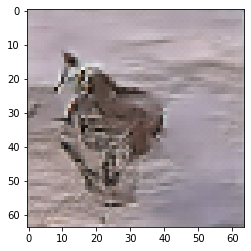

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 9

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.695493221282959 sec
Gen loss: 1.9844422591359991, Disc loss: 2.187673487161335, Disc valid real loss: 0.3685875676180187, Disc valid fake loss: 0.41369984651866715, Disc class real loss: 0.7031575159022683, Disc class fake loss: 0.1735953276878909
Time for epoch 2 is 0.6956913471221924 sec
Gen loss: 1.9393334137765985, Disc loss: 2.3094853288248967, Disc valid real loss: 0.41173845843264933, Disc valid fake loss: 0.39957672828122187, Disc class real loss: 0.7505734029569124, Disc class fake loss: 0.18513853024495275
Time for epoch 3 is 0.6961333751678467 sec
Gen loss: 1.7568476827521073, Disc loss: 2.210709345968146, Disc valid real loss: 0.3988981497915168, Disc valid fake loss: 0.40684527786154495, Disc class real loss: 0.7046480272945604, Disc class fake loss: 0.21280258697898766
Time for epoch 4 is 0.6991500854492188 sec
Gen loss: 1.8922302158255

Time for epoch 31 is 0.697150468826294 sec
Gen loss: 1.8844549530430843, Disc loss: 2.1090834579969706, Disc valid real loss: 0.3997136997549157, Disc valid fake loss: 0.3940175285464839, Disc class real loss: 0.6800711217679476, Disc class fake loss: 0.2719748961298089
Time for epoch 32 is 0.6936981678009033 sec
Gen loss: 2.010545517268934, Disc loss: 2.0790020541140906, Disc valid real loss: 0.4039320255580701, Disc valid fake loss: 0.3773356832956013, Disc class real loss: 0.6714769727305362, Disc class fake loss: 0.2725346990321812
Time for epoch 33 is 0.6995129585266113 sec
Gen loss: 1.8503729544187848, Disc loss: 2.0789270275517513, Disc valid real loss: 0.39460523034396927, Disc valid fake loss: 0.37482486429967377, Disc class real loss: 0.6769380506716276, Disc class fake loss: 0.2977004945278168
Time for epoch 34 is 0.7012999057769775 sec
Gen loss: 1.6900518066004704, Disc loss: 2.1406771195562264, Disc valid real loss: 0.39491232288511174, Disc valid fake loss: 0.411071617352

Time for epoch 62 is 0.6977782249450684 sec
Gen loss: 1.8441355667616193, Disc loss: 2.083101655307569, Disc valid real loss: 0.41831115829317195, Disc valid fake loss: 0.40560077444503184, Disc class real loss: 0.6741690667052018, Disc class fake loss: 0.2713849670008609
Time for epoch 63 is 0.6986989974975586 sec
Gen loss: 1.8044348264995373, Disc loss: 2.0521601689489266, Disc valid real loss: 0.4052799187208477, Disc valid fake loss: 0.39736824129757126, Disc class real loss: 0.6635294431134274, Disc class fake loss: 0.31883990529336426
Time for epoch 64 is 0.6999790668487549 sec
Gen loss: 1.87321610827195, Disc loss: 2.0373268880342184, Disc valid real loss: 0.3809331482962558, Disc valid fake loss: 0.41284205254755524, Disc class real loss: 0.6612316213156048, Disc class fake loss: 0.3158665322943738
Time for epoch 65 is 0.6963760852813721 sec
Gen loss: 1.8114904165267944, Disc loss: 1.9739303588867188, Disc valid real loss: 0.3880929225369504, Disc valid fake loss: 0.39175421626

Time for epoch 93 is 0.6995754241943359 sec
Gen loss: 1.8226655596180965, Disc loss: 2.0162412367369, Disc valid real loss: 0.41866858852537053, Disc valid fake loss: 0.4179234489014274, Disc class real loss: 0.6518532508297971, Disc class fake loss: 0.2792804696057972
Time for epoch 94 is 0.7004427909851074 sec
Gen loss: 1.883190995768497, Disc loss: 1.993251499376799, Disc valid real loss: 0.3979779058381131, Disc valid fake loss: 0.38571070997338547, Disc class real loss: 0.6720901319855138, Disc class fake loss: 0.2719357021545109
Time for epoch 95 is 0.6960582733154297 sec
Gen loss: 1.8109525630348606, Disc loss: 1.9892865858579938, Disc valid real loss: 0.4016695399033396, Disc valid fake loss: 0.38427002335849564, Disc class real loss: 0.6688387676289207, Disc class fake loss: 0.2738130727880879
Time for epoch 96 is 0.6950802803039551 sec
Gen loss: 1.9096398290834928, Disc loss: 2.0238697905289498, Disc valid real loss: 0.40952205814813314, Disc valid fake loss: 0.40796489307754

Time for epoch 123 is 0.6935572624206543 sec
Gen loss: 1.8247500532551815, Disc loss: 1.9598793167816966, Disc valid real loss: 0.3945670708229667, Disc valid fake loss: 0.3960929199268943, Disc class real loss: 0.6793909292472037, Disc class fake loss: 0.24950409719818517
Time for epoch 124 is 0.7005531787872314 sec
Gen loss: 1.8154227545386867, Disc loss: 1.9098819117797048, Disc valid real loss: 0.38121588449729116, Disc valid fake loss: 0.39791692087524816, Disc class real loss: 0.6473587218083834, Disc class fake loss: 0.27862558317811864
Time for epoch 125 is 0.6979079246520996 sec
Gen loss: 1.8836356024993093, Disc loss: 1.9780642107913369, Disc valid real loss: 0.39975883458790024, Disc valid fake loss: 0.42156933012761566, Disc class real loss: 0.6771256076662164, Disc class fake loss: 0.23626191678800082
Time for epoch 126 is 0.6996686458587646 sec
Gen loss: 1.8565384400518317, Disc loss: 1.9977793066125167, Disc valid real loss: 0.3722384838681472, Disc valid fake loss: 0.42

Time for epoch 153 is 0.6972455978393555 sec
Gen loss: 1.9705290731630827, Disc loss: 1.9084980236856561, Disc valid real loss: 0.36804843576330887, Disc valid fake loss: 0.4043809175491333, Disc class real loss: 0.6811743692347878, Disc class fake loss: 0.26896345615386963
Time for epoch 154 is 0.6996946334838867 sec
Gen loss: 1.9251441892824674, Disc loss: 1.9098881043885882, Disc valid real loss: 0.39495749222604853, Disc valid fake loss: 0.40027438809997157, Disc class real loss: 0.6813577288075497, Disc class fake loss: 0.23243778120530278
Time for epoch 155 is 0.6980454921722412 sec
Gen loss: 1.9453114082938747, Disc loss: 1.8955421071303518, Disc valid real loss: 0.4081402217086993, Disc valid fake loss: 0.38573976723771347, Disc class real loss: 0.6615341933150041, Disc class fake loss: 0.263463147376713
Time for epoch 156 is 0.6990880966186523 sec
Gen loss: 1.8064880622060675, Disc loss: 1.8858240340885364, Disc valid real loss: 0.38910718654331405, Disc valid fake loss: 0.390

Time for epoch 183 is 0.6990854740142822 sec
Gen loss: 1.9417470756329989, Disc loss: 1.7586935758590698, Disc valid real loss: 0.3702985848251142, Disc valid fake loss: 0.3979871037759279, Disc class real loss: 0.6432796324554243, Disc class fake loss: 0.19239546358585358
Time for epoch 184 is 0.6982519626617432 sec
Gen loss: 1.9972659851375378, Disc loss: 1.8583479241320962, Disc valid real loss: 0.398624029598738, Disc valid fake loss: 0.4006498424630416, Disc class real loss: 0.678104933939482, Disc class fake loss: 0.22819690759244718
Time for epoch 185 is 0.6948673725128174 sec
Gen loss: 1.9521722668095638, Disc loss: 1.7873435522380627, Disc valid real loss: 0.3969336450099945, Disc valid fake loss: 0.3986862866502059, Disc class real loss: 0.6374118782972035, Disc class fake loss: 0.21110190921708158
Time for epoch 186 is 0.6940310001373291 sec
Gen loss: 2.025242021209315, Disc loss: 1.808345443324039, Disc valid real loss: 0.3868290209456494, Disc valid fake loss: 0.3808408316

Time for epoch 213 is 0.6950414180755615 sec
Gen loss: 1.991290098742435, Disc loss: 1.778066779437818, Disc valid real loss: 0.3779986641908947, Disc valid fake loss: 0.4196098274306247, Disc class real loss: 0.6632661317524157, Disc class fake loss: 0.2108348235487938
Time for epoch 214 is 0.6964085102081299 sec
Gen loss: 1.9649480016607987, Disc loss: 1.7932623687543368, Disc valid real loss: 0.3998180612137443, Disc valid fake loss: 0.39250844873880086, Disc class real loss: 0.6926665431574771, Disc class fake loss: 0.19240838995105342
Time for epoch 215 is 0.6943633556365967 sec
Gen loss: 1.8888967852843435, Disc loss: 1.7978587777991044, Disc valid real loss: 0.41152272883214447, Disc valid fake loss: 0.40462697493402583, Disc class real loss: 0.6813656499511317, Disc class fake loss: 0.18781822214001104
Time for epoch 216 is 0.6977548599243164 sec
Gen loss: 1.9013392988004183, Disc loss: 1.7975709501065706, Disc valid real loss: 0.4152111881657651, Disc valid fake loss: 0.402344

Time for epoch 243 is 0.7004177570343018 sec
Gen loss: 1.8819297112916644, Disc loss: 1.724658545694853, Disc valid real loss: 0.3954910651633614, Disc valid fake loss: 0.39463499188423157, Disc class real loss: 0.6767511367797852, Disc class fake loss: 0.19679199864989833
Time for epoch 244 is 0.6987287998199463 sec
Gen loss: 1.8075472932112844, Disc loss: 1.6828906598844027, Disc valid real loss: 0.3953279303876977, Disc valid fake loss: 0.40295682612218353, Disc class real loss: 0.6376098551248249, Disc class fake loss: 0.1919555962085724
Time for epoch 245 is 0.6969857215881348 sec
Gen loss: 1.9658379429265072, Disc loss: 1.694984837582237, Disc valid real loss: 0.4087927286562167, Disc valid fake loss: 0.39773089791599076, Disc class real loss: 0.6544963215526781, Disc class fake loss: 0.17666616839797875
Time for epoch 246 is 0.6980175971984863 sec
Gen loss: 1.861878137839468, Disc loss: 1.7255734895405017, Disc valid real loss: 0.40519984144913523, Disc valid fake loss: 0.407030

Time for epoch 273 is 0.7019031047821045 sec
Gen loss: 1.911253904041491, Disc loss: 1.6349856728001644, Disc valid real loss: 0.3741009925541125, Disc valid fake loss: 0.4039469910295386, Disc class real loss: 0.67258031744706, Disc class fake loss: 0.17485450070939565
Time for epoch 274 is 0.698887825012207 sec
Gen loss: 1.9511180676912006, Disc loss: 1.6832193449923867, Disc valid real loss: 0.4145470779193075, Disc valid fake loss: 0.4071795250240125, Disc class real loss: 0.6750904980458712, Disc class fake loss: 0.17873087643008484
Time for epoch 275 is 0.6992776393890381 sec
Gen loss: 1.9839653341393721, Disc loss: 1.6407488584518433, Disc valid real loss: 0.3973563078202699, Disc valid fake loss: 0.40655142225717245, Disc class real loss: 0.6631546820464888, Disc class fake loss: 0.16773575113007896
Time for epoch 276 is 0.6973605155944824 sec
Gen loss: 2.0552924432252584, Disc loss: 1.6669408584895886, Disc valid real loss: 0.38272031200559514, Disc valid fake loss: 0.39223185

Time for epoch 303 is 0.6974194049835205 sec
Gen loss: 2.0891144777599133, Disc loss: 1.6125572166944806, Disc valid real loss: 0.3827880526843824, Disc valid fake loss: 0.38398140041451706, Disc class real loss: 0.671004731404154, Disc class fake loss: 0.17488227235643486
Time for epoch 304 is 0.6942610740661621 sec
Gen loss: 2.000788349854319, Disc loss: 1.6439836778138812, Disc valid real loss: 0.39976563736012105, Disc valid fake loss: 0.38785382948423686, Disc class real loss: 0.6941997534350345, Disc class fake loss: 0.1622708828041428
Time for epoch 305 is 0.6973862648010254 sec
Gen loss: 1.9437366222080432, Disc loss: 1.6403252137334723, Disc valid real loss: 0.38841034864124496, Disc valid fake loss: 0.4065863411677511, Disc class real loss: 0.6671915368029946, Disc class fake loss: 0.17823478305026105
Time for epoch 306 is 0.6941263675689697 sec
Gen loss: 1.8949612630041022, Disc loss: 1.6339817800019916, Disc valid real loss: 0.39606955804322896, Disc valid fake loss: 0.4151

Time for epoch 333 is 0.6994397640228271 sec
Gen loss: 1.9114845740167719, Disc loss: 1.7245055939021863, Disc valid real loss: 0.4129488076034345, Disc valid fake loss: 0.41205760601319763, Disc class real loss: 0.700723221427516, Disc class fake loss: 0.19887633209950045
Time for epoch 334 is 0.696845531463623 sec
Gen loss: 1.89398235396335, Disc loss: 1.7010645301718461, Disc valid real loss: 0.41994619212652506, Disc valid fake loss: 0.40592870429942485, Disc class real loss: 0.6796988499791998, Disc class fake loss: 0.19558762798183843
Time for epoch 335 is 0.6928565502166748 sec
Gen loss: 1.9291237843664069, Disc loss: 1.6642394003115202, Disc valid real loss: 0.39574377944594935, Disc valid fake loss: 0.3872457272128055, Disc class real loss: 0.7079629176541379, Disc class fake loss: 0.1733939243774665
Time for epoch 336 is 0.6972064971923828 sec
Gen loss: 1.9792667125400745, Disc loss: 1.6375041321704262, Disc valid real loss: 0.39995000236912776, Disc valid fake loss: 0.378246

Time for epoch 363 is 0.698652982711792 sec
Gen loss: 1.9398274107983238, Disc loss: 1.6869666890094155, Disc valid real loss: 0.4229917714470311, Disc valid fake loss: 0.3882132235326265, Disc class real loss: 0.6767133411608244, Disc class fake loss: 0.1991439049965457
Time for epoch 364 is 0.6979029178619385 sec
Gen loss: 1.873035374440645, Disc loss: 1.6877221120031256, Disc valid real loss: 0.3818153386053286, Disc valid fake loss: 0.41063719674160604, Disc class real loss: 0.7328228417195772, Disc class fake loss: 0.16256080489409597
Time for epoch 365 is 0.6980383396148682 sec
Gen loss: 1.9668038769772178, Disc loss: 1.6698898077011108, Disc valid real loss: 0.38799121662190084, Disc valid fake loss: 0.4046925557287116, Disc class real loss: 0.6759421888150667, Disc class fake loss: 0.2013587496782604
Time for epoch 366 is 0.6997416019439697 sec
Gen loss: 1.8608648400557668, Disc loss: 1.653451028623079, Disc valid real loss: 0.4076185665632549, Disc valid fake loss: 0.388615120

Time for epoch 393 is 0.6959519386291504 sec
Gen loss: 1.8542169395246004, Disc loss: 1.6555160723234479, Disc valid real loss: 0.3909980639031059, Disc valid fake loss: 0.40132374198813187, Disc class real loss: 0.6981329259119535, Disc class fake loss: 0.16516794538811633
Time for epoch 394 is 0.697723388671875 sec
Gen loss: 1.9375953235124286, Disc loss: 1.646439502113744, Disc valid real loss: 0.378913048066591, Disc valid fake loss: 0.4162742448480506, Disc class real loss: 0.6779310891502782, Disc class fake loss: 0.173422041300096
Time for epoch 395 is 0.6926617622375488 sec
Gen loss: 2.0248464032223352, Disc loss: 1.6898704453518516, Disc valid real loss: 0.38171473459193583, Disc valid fake loss: 0.44271634440673024, Disc class real loss: 0.675578280499107, Disc class fake loss: 0.18995825044418635
Time for epoch 396 is 0.6917023658752441 sec
Gen loss: 2.136282393806859, Disc loss: 1.6590941266009682, Disc valid real loss: 0.40719157457351685, Disc valid fake loss: 0.387842221

Time for epoch 423 is 0.6974217891693115 sec
Gen loss: 1.886571959445351, Disc loss: 1.6624301295531423, Disc valid real loss: 0.4087993643785778, Disc valid fake loss: 0.38315301270861374, Disc class real loss: 0.6975422125113638, Disc class fake loss: 0.17304043550240367
Time for epoch 424 is 0.6987941265106201 sec
Gen loss: 1.9244090255938078, Disc loss: 1.6257614712966115, Disc valid real loss: 0.39685994543527303, Disc valid fake loss: 0.39463756272667333, Disc class real loss: 0.6790437792476854, Disc class fake loss: 0.15532494571648145
Time for epoch 425 is 0.7004029750823975 sec
Gen loss: 1.9231747451581453, Disc loss: 1.662269623656022, Disc valid real loss: 0.3899325838214473, Disc valid fake loss: 0.3826794890980971, Disc class real loss: 0.6934232868646321, Disc class fake loss: 0.1963337165744681
Time for epoch 426 is 0.6976852416992188 sec
Gen loss: 1.90959212027098, Disc loss: 1.6059398274672658, Disc valid real loss: 0.39482268220499944, Disc valid fake loss: 0.4006894

Time for epoch 453 is 0.6982989311218262 sec
Gen loss: 1.982938013578716, Disc loss: 1.651620952706588, Disc valid real loss: 0.3850667821733575, Disc valid fake loss: 0.40781318670824956, Disc class real loss: 0.6875890462022078, Disc class fake loss: 0.1712552105125628
Time for epoch 454 is 0.697009801864624 sec
Gen loss: 1.902467784128691, Disc loss: 1.6576239999971891, Disc valid real loss: 0.3941072335368709, Disc valid fake loss: 0.4035508616974479, Disc class real loss: 0.7055058134229559, Disc class fake loss: 0.15457027719209068
Time for epoch 455 is 0.7027308940887451 sec
Gen loss: 1.867792468321951, Disc loss: 1.630384181675158, Disc valid real loss: 0.3727972005542956, Disc valid fake loss: 0.3996936067154533, Disc class real loss: 0.6664708005754572, Disc class fake loss: 0.19151757265392103
Time for epoch 456 is 0.7033786773681641 sec
Gen loss: 1.94339456683711, Disc loss: 1.6912838848013627, Disc valid real loss: 0.4074339427446064, Disc valid fake loss: 0.41104698181152

Time for epoch 483 is 0.6978392601013184 sec
Gen loss: 1.9254673907631321, Disc loss: 1.7296271951575029, Disc valid real loss: 0.4169650752293436, Disc valid fake loss: 0.39760970441918625, Disc class real loss: 0.7236859390610143, Disc class fake loss: 0.19147294171546636
Time for epoch 484 is 0.6929266452789307 sec
Gen loss: 2.107807730373583, Disc loss: 1.6397211300699335, Disc valid real loss: 0.3803255212934394, Disc valid fake loss: 0.40694051510409307, Disc class real loss: 0.665869719103763, Disc class fake loss: 0.18668121844530106
Time for epoch 485 is 0.6934022903442383 sec
Gen loss: 1.9736472368240356, Disc loss: 1.6725268175727444, Disc valid real loss: 0.394533014611194, Disc valid fake loss: 0.39188618722714874, Disc class real loss: 0.7176375891032972, Disc class fake loss: 0.1685798489733746
Time for epoch 486 is 0.6931867599487305 sec
Gen loss: 1.904089795915704, Disc loss: 1.627706490064922, Disc valid real loss: 0.3967097150652032, Disc valid fake loss: 0.416135601

Time for epoch 513 is 0.6912612915039062 sec
Gen loss: 2.0458928723084298, Disc loss: 1.589399162091707, Disc valid real loss: 0.3788600007170125, Disc valid fake loss: 0.3802150393787183, Disc class real loss: 0.6731051739893461, Disc class fake loss: 0.1573221060006242
Time for epoch 514 is 0.6918060779571533 sec
Gen loss: 1.9488742037823326, Disc loss: 1.6675354367808293, Disc valid real loss: 0.3963022200684798, Disc valid fake loss: 0.3935755867707102, Disc class real loss: 0.7199834553818953, Disc class fake loss: 0.1577866367603603
Time for epoch 515 is 0.6931874752044678 sec
Gen loss: 2.003376747432508, Disc loss: 1.6433999287454706, Disc valid real loss: 0.38490919219820124, Disc valid fake loss: 0.3984522129359998, Disc class real loss: 0.6745939317502474, Disc class fake loss: 0.18554241759212395
Time for epoch 516 is 0.6956427097320557 sec
Gen loss: 1.8417129893051951, Disc loss: 1.6652764081954956, Disc valid real loss: 0.3933163583278656, Disc valid fake loss: 0.393594857

Time for epoch 543 is 0.7108132839202881 sec
Gen loss: 1.9468317471052472, Disc loss: 1.6416971181568347, Disc valid real loss: 0.40108599003992584, Disc valid fake loss: 0.38122251629829407, Disc class real loss: 0.6974129959156639, Disc class fake loss: 0.1620826889809809
Time for epoch 544 is 0.6931033134460449 sec
Gen loss: 1.9586957755841707, Disc loss: 1.651123335486964, Disc valid real loss: 0.4003709554672241, Disc valid fake loss: 0.4027581058050457, Disc class real loss: 0.6668739914894104, Disc class fake loss: 0.18121746182441711
Time for epoch 545 is 0.6952035427093506 sec
Gen loss: 1.9299007277739675, Disc loss: 1.670666675818594, Disc valid real loss: 0.40906898912630585, Disc valid fake loss: 0.4085449278354645, Disc class real loss: 0.6762599756843165, Disc class fake loss: 0.17689267114589088
Time for epoch 546 is 0.6960208415985107 sec
Gen loss: 1.9799324085837917, Disc loss: 1.612918496131897, Disc valid real loss: 0.37553043898783234, Disc valid fake loss: 0.395734

Time for epoch 573 is 0.6949601173400879 sec
Gen loss: 1.9532491094187687, Disc loss: 1.6262034177780151, Disc valid real loss: 0.40288187014429194, Disc valid fake loss: 0.394291269151788, Disc class real loss: 0.6756007012568022, Disc class fake loss: 0.15353401397403918
Time for epoch 574 is 0.6897492408752441 sec
Gen loss: 1.9086191842430515, Disc loss: 1.5774245826821578, Disc valid real loss: 0.38591114470833227, Disc valid fake loss: 0.3928346131977282, Disc class real loss: 0.6452769166544864, Disc class fake loss: 0.15350029303839333
Time for epoch 575 is 0.6933586597442627 sec
Gen loss: 1.9649749053151984, Disc loss: 1.592466392015156, Disc valid real loss: 0.3780424061574434, Disc valid fake loss: 0.38523760124256734, Disc class real loss: 0.6674655268066808, Disc class fake loss: 0.1618220182625871
Time for epoch 576 is 0.6980583667755127 sec
Gen loss: 1.8938453134737516, Disc loss: 1.6686106982984041, Disc valid real loss: 0.4005301359452699, Disc valid fake loss: 0.396447

Time for epoch 603 is 0.6919195652008057 sec
Gen loss: 1.8736138783003156, Disc loss: 1.7021128817608482, Disc valid real loss: 0.4018112499462931, Disc valid fake loss: 0.4025596537088093, Disc class real loss: 0.705813395349603, Disc class fake loss: 0.19203136743683563
Time for epoch 604 is 0.6945152282714844 sec
Gen loss: 1.8837737848884182, Disc loss: 1.6457032341706126, Disc valid real loss: 0.38443682695689957, Disc valid fake loss: 0.3919946488581206, Disc class real loss: 0.6846280897918501, Disc class fake loss: 0.18474365104185908
Time for epoch 605 is 0.6981425285339355 sec
Gen loss: 1.9670769603628862, Disc loss: 1.7020210717853748, Disc valid real loss: 0.41088539518808065, Disc valid fake loss: 0.40703881257458735, Disc class real loss: 0.6819750572505751, Disc class fake loss: 0.2022177729951708
Time for epoch 606 is 0.6949317455291748 sec
Gen loss: 1.8857278133693494, Disc loss: 1.638509003739608, Disc valid real loss: 0.38532312449656037, Disc valid fake loss: 0.39093

Time for epoch 633 is 0.6970019340515137 sec
Gen loss: 1.9055649857772023, Disc loss: 1.6349224103124518, Disc valid real loss: 0.377959427864928, Disc valid fake loss: 0.3897372327352825, Disc class real loss: 0.6785272108881097, Disc class fake loss: 0.1887965053319931
Time for epoch 634 is 0.6964938640594482 sec
Gen loss: 1.8337200691825466, Disc loss: 1.6346841987810636, Disc valid real loss: 0.3815432645772633, Disc valid fake loss: 0.3948395863959664, Disc class real loss: 0.6728643712244535, Disc class fake loss: 0.18553449095864044
Time for epoch 635 is 0.6948733329772949 sec
Gen loss: 1.9217808183870817, Disc loss: 1.6037905780892623, Disc valid real loss: 0.3864014368308218, Disc valid fake loss: 0.38689599382249934, Disc class real loss: 0.6795433226384615, Disc class fake loss: 0.15105553677207545
Time for epoch 636 is 0.6988980770111084 sec
Gen loss: 1.8503841977370412, Disc loss: 1.5961065982517444, Disc valid real loss: 0.37942584878519964, Disc valid fake loss: 0.404335

Time for epoch 663 is 0.7100610733032227 sec
Gen loss: 1.8980730458309776, Disc loss: 1.6271249118604159, Disc valid real loss: 0.4080841933426104, Disc valid fake loss: 0.3937420311727022, Disc class real loss: 0.6711413107420269, Disc class fake loss: 0.15426078007409447
Time for epoch 664 is 0.7144989967346191 sec
Gen loss: 1.9058734931443866, Disc loss: 1.6451295614242554, Disc valid real loss: 0.39986892907243027, Disc valid fake loss: 0.3984457928883402, Disc class real loss: 0.6862082575496874, Disc class fake loss: 0.16071171470378576
Time for epoch 665 is 0.7062950134277344 sec
Gen loss: 1.9106431948511224, Disc loss: 1.6556336691505031, Disc valid real loss: 0.39890472826204804, Disc valid fake loss: 0.4112340823600167, Disc class real loss: 0.6930577221669649, Disc class fake loss: 0.1525452450702065
Time for epoch 666 is 0.7044780254364014 sec
Gen loss: 1.913370603009274, Disc loss: 1.6437197484468158, Disc valid real loss: 0.3893532219686006, Disc valid fake loss: 0.395629

Time for epoch 693 is 0.6947405338287354 sec
Gen loss: 1.9192381658052142, Disc loss: 1.6574094546468634, Disc valid real loss: 0.3930379669917257, Disc valid fake loss: 0.4029168643449482, Disc class real loss: 0.6743363487093073, Disc class fake loss: 0.18721571015684227
Time for epoch 694 is 0.6925356388092041 sec
Gen loss: 1.9188394734733982, Disc loss: 1.6417918330744694, Disc valid real loss: 0.39151903986930847, Disc valid fake loss: 0.3857515344494267, Disc class real loss: 0.6998346071494254, Disc class fake loss: 0.16479369939157837
Time for epoch 695 is 0.6948206424713135 sec
Gen loss: 1.9509222883927195, Disc loss: 1.674987090261359, Disc valid real loss: 0.3919068339623903, Disc valid fake loss: 0.39888933300971985, Disc class real loss: 0.687568662982238, Disc class fake loss: 0.1967204699390813
Time for epoch 696 is 0.6929652690887451 sec
Gen loss: 1.9154543688422756, Disc loss: 1.6586481144553737, Disc valid real loss: 0.39935459588703354, Disc valid fake loss: 0.385926

Time for epoch 723 is 0.6952250003814697 sec
Gen loss: 1.7935469401510138, Disc loss: 1.6751813323874223, Disc valid real loss: 0.40796872032316106, Disc valid fake loss: 0.4121631383895874, Disc class real loss: 0.6929816729144046, Disc class fake loss: 0.162174002904641
Time for epoch 724 is 0.6943590641021729 sec
Gen loss: 1.9002627259806584, Disc loss: 1.6249322640268427, Disc valid real loss: 0.39395952538440104, Disc valid fake loss: 0.4027737347703231, Disc class real loss: 0.6779736625520807, Disc class fake loss: 0.15033087722564997
Time for epoch 725 is 0.695486307144165 sec
Gen loss: 1.945207388777482, Disc loss: 1.6616067196193494, Disc valid real loss: 0.3998415532865022, Disc valid fake loss: 0.4019034536261308, Disc class real loss: 0.6888836057562577, Disc class fake loss: 0.17108166845221268
Time for epoch 726 is 0.6925287246704102 sec
Gen loss: 1.9184954166412354, Disc loss: 1.6412076008947272, Disc valid real loss: 0.39935876036945145, Disc valid fake loss: 0.3764847

Time for epoch 753 is 0.6995296478271484 sec
Gen loss: 2.0576511935183874, Disc loss: 1.6588405684420937, Disc valid real loss: 0.37544234959702744, Disc valid fake loss: 0.38914882509331955, Disc class real loss: 0.7190244040991131, Disc class fake loss: 0.17533376460012637
Time for epoch 754 is 0.6930155754089355 sec
Gen loss: 1.9863077778565257, Disc loss: 1.606560744737324, Disc valid real loss: 0.3734241629901685, Disc valid fake loss: 0.3950891894729514, Disc class real loss: 0.659789546539909, Disc class fake loss: 0.17835416723238795
Time for epoch 755 is 0.6947391033172607 sec
Gen loss: 2.0162235059236226, Disc loss: 1.6307400214044672, Disc valid real loss: 0.40603603030505936, Disc valid fake loss: 0.3822141524992491, Disc class real loss: 0.6776637121250755, Disc class fake loss: 0.16492867783496254
Time for epoch 756 is 0.6886672973632812 sec
Gen loss: 1.946499699040463, Disc loss: 1.630488251384936, Disc valid real loss: 0.4086178650981502, Disc valid fake loss: 0.3914208

Time for epoch 783 is 0.6975233554840088 sec
Gen loss: 2.140164538433677, Disc loss: 1.6504792602438676, Disc valid real loss: 0.3744264958720458, Disc valid fake loss: 0.4109064764098117, Disc class real loss: 0.6615160609546461, Disc class fake loss: 0.20372181581823448
Time for epoch 784 is 0.6953301429748535 sec
Gen loss: 1.7773080185840004, Disc loss: 1.6850604571794208, Disc valid real loss: 0.4035566551120658, Disc valid fake loss: 0.3904663904717094, Disc class real loss: 0.6716059320851376, Disc class fake loss: 0.21952190289371892
Time for epoch 785 is 0.6980898380279541 sec
Gen loss: 2.027299956271523, Disc loss: 1.6321142598202354, Disc valid real loss: 0.37339404617485245, Disc valid fake loss: 0.3807443725435357, Disc class real loss: 0.6922898951329683, Disc class fake loss: 0.18578726249305824
Time for epoch 786 is 0.6970577239990234 sec
Gen loss: 2.082430306233858, Disc loss: 1.6668016471360858, Disc valid real loss: 0.3899599180409783, Disc valid fake loss: 0.39490828

Time for epoch 813 is 0.6972301006317139 sec
Gen loss: 1.925524165755824, Disc loss: 1.6283370193682218, Disc valid real loss: 0.3902747960467088, Disc valid fake loss: 0.39454163375653717, Disc class real loss: 0.69902251268688, Disc class fake loss: 0.14460899014221995
Time for epoch 814 is 0.6993682384490967 sec
Gen loss: 1.9279169095189947, Disc loss: 1.6296845360806114, Disc valid real loss: 0.4088083113494672, Disc valid fake loss: 0.36938981790291636, Disc class real loss: 0.6907029496996027, Disc class fake loss: 0.1608894132077694
Time for epoch 815 is 0.6963887214660645 sec
Gen loss: 1.9022635660673444, Disc loss: 1.6227253863686009, Disc valid real loss: 0.386895593843962, Disc valid fake loss: 0.39401057519410787, Disc class real loss: 0.6805492263091238, Disc class fake loss: 0.16137386427113884
Time for epoch 816 is 0.6960866451263428 sec
Gen loss: 1.9786012486407631, Disc loss: 1.6091935634613037, Disc valid real loss: 0.39371130184123393, Disc valid fake loss: 0.3790844

Time for epoch 843 is 0.695044994354248 sec
Gen loss: 1.980659848765323, Disc loss: 1.6665339218942743, Disc valid real loss: 0.4155342406348178, Disc valid fake loss: 0.4099701846900739, Disc class real loss: 0.6704979601659273, Disc class fake loss: 0.17063152476360924
Time for epoch 844 is 0.6951475143432617 sec
Gen loss: 1.9075153250443309, Disc loss: 1.6887660214775486, Disc valid real loss: 0.39805431114999873, Disc valid fake loss: 0.4182663826565993, Disc class real loss: 0.6842324357283743, Disc class fake loss: 0.1883120701501244
Time for epoch 845 is 0.6952767372131348 sec
Gen loss: 1.8597491038473029, Disc loss: 1.6367477994216115, Disc valid real loss: 0.39890910763489573, Disc valid fake loss: 0.40334678637354, Disc class real loss: 0.6723838260299281, Disc class fake loss: 0.16221014292616592
Time for epoch 846 is 0.6965556144714355 sec
Gen loss: 1.86576751658791, Disc loss: 1.6523068139427586, Disc valid real loss: 0.367231232555289, Disc valid fake loss: 0.401614278554

Time for epoch 873 is 0.6966657638549805 sec
Gen loss: 1.8796223715731972, Disc loss: 1.641874777643304, Disc valid real loss: 0.4052385295692243, Disc valid fake loss: 0.4024664516511716, Disc class real loss: 0.6715471273974368, Disc class fake loss: 0.16272446866098203
Time for epoch 874 is 0.6989016532897949 sec
Gen loss: 1.952650785446167, Disc loss: 1.6505084978906732, Disc valid real loss: 0.4112013939179872, Disc valid fake loss: 0.3885595657323536, Disc class real loss: 0.682495935967094, Disc class fake loss: 0.16835447949798485
Time for epoch 875 is 0.6998016834259033 sec
Gen loss: 2.0897343221463656, Disc loss: 1.6820232491744191, Disc valid real loss: 0.3904147148132324, Disc valid fake loss: 0.38709213310166407, Disc class real loss: 0.6708980328158328, Disc class fake loss: 0.23370583512281118
Time for epoch 876 is 0.6975855827331543 sec
Gen loss: 2.3829614614185535, Disc loss: 1.686408005262676, Disc valid real loss: 0.378376515288102, Disc valid fake loss: 0.3867808619

Time for epoch 903 is 0.6963455677032471 sec
Gen loss: 2.001336179281536, Disc loss: 1.6601451572618986, Disc valid real loss: 0.3751721021376158, Disc valid fake loss: 0.3936887054066909, Disc class real loss: 0.7152951736199228, Disc class fake loss: 0.17609703540802002
Time for epoch 904 is 0.6991322040557861 sec
Gen loss: 1.870993777325279, Disc loss: 1.6324528079283864, Disc valid real loss: 0.3852304314312182, Disc valid fake loss: 0.39681343028419896, Disc class real loss: 0.6719644006929899, Disc class fake loss: 0.17854324963531995
Time for epoch 905 is 0.6979243755340576 sec
Gen loss: 1.9147840173620927, Disc loss: 1.6451713474173295, Disc valid real loss: 0.3862883040779515, Disc valid fake loss: 0.3986392805450841, Disc class real loss: 0.6883310267799779, Disc class fake loss: 0.1720160002771177
Time for epoch 906 is 0.6966047286987305 sec
Gen loss: 1.9673449679424888, Disc loss: 1.671282040445428, Disc valid real loss: 0.41384875617529215, Disc valid fake loss: 0.39102929

Time for epoch 933 is 0.6957318782806396 sec
Gen loss: 1.879922866821289, Disc loss: 1.6466330415324162, Disc valid real loss: 0.39507277231467397, Disc valid fake loss: 0.4017095110918346, Disc class real loss: 0.6669928807961313, Disc class fake loss: 0.18295470782016454
Time for epoch 934 is 0.6964919567108154 sec
Gen loss: 1.8832730995981317, Disc loss: 1.686094095832423, Disc valid real loss: 0.4132726898318843, Disc valid fake loss: 0.4144091057149987, Disc class real loss: 0.6953947418614438, Disc class fake loss: 0.16312402878936968
Time for epoch 935 is 0.7001180648803711 sec
Gen loss: 1.9506888640554327, Disc loss: 1.6130262362329584, Disc valid real loss: 0.3852527047458448, Disc valid fake loss: 0.402630920472898, Disc class real loss: 0.6821047381350869, Disc class fake loss: 0.1431456619971677
Time for epoch 936 is 0.6947767734527588 sec
Gen loss: 1.9338673227711727, Disc loss: 1.638840681628177, Disc valid real loss: 0.3949323108321742, Disc valid fake loss: 0.4128844800

Time for epoch 963 is 0.6952688694000244 sec
Gen loss: 1.9273619149860584, Disc loss: 1.6239148441113924, Disc valid real loss: 0.4003647565841675, Disc valid fake loss: 0.3863599818003805, Disc class real loss: 0.6615209234388251, Disc class fake loss: 0.17576636413210317
Time for epoch 964 is 0.6960186958312988 sec
Gen loss: 1.8467690756446438, Disc loss: 1.6603533343264931, Disc valid real loss: 0.39990151242205974, Disc valid fake loss: 0.38829446780054194, Disc class real loss: 0.685182163589879, Disc class fake loss: 0.18707483810813805
Time for epoch 965 is 0.6979348659515381 sec
Gen loss: 1.9442168913389508, Disc loss: 1.6229239388516075, Disc valid real loss: 0.3821827847706644, Disc valid fake loss: 0.3857707867496892, Disc class real loss: 0.7125649201242548, Disc class fake loss: 0.1425194865778873
Time for epoch 966 is 0.6931705474853516 sec
Gen loss: 1.9715131521224976, Disc loss: 1.7166770257447894, Disc valid real loss: 0.40582238686712163, Disc valid fake loss: 0.41353

Time for epoch 993 is 0.6971673965454102 sec
Gen loss: 1.8854626793610423, Disc loss: 1.6511728324388202, Disc valid real loss: 0.3969431927329616, Disc valid fake loss: 0.40492747018211767, Disc class real loss: 0.6849531343108729, Disc class fake loss: 0.16445313394069672
Time for epoch 994 is 0.6970243453979492 sec
Gen loss: 1.851986420781989, Disc loss: 1.6780320656927008, Disc valid real loss: 0.38305805074541194, Disc valid fake loss: 0.422299839948353, Disc class real loss: 0.7153903904714083, Disc class fake loss: 0.15739539696982033
Time for epoch 995 is 0.6943371295928955 sec
Gen loss: 1.929954547631113, Disc loss: 1.660954989885029, Disc valid real loss: 0.389051627171667, Disc valid fake loss: 0.4002516316740136, Disc class real loss: 0.6936316019610355, Disc class fake loss: 0.1781232498194042
Time for epoch 996 is 0.6982631683349609 sec
Gen loss: 1.9104306446878534, Disc loss: 1.6296520923313342, Disc valid real loss: 0.3983687146713859, Disc valid fake loss: 0.3821441546

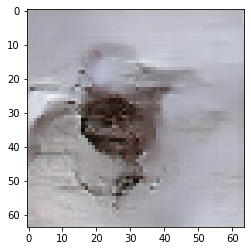

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 10

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.697655439376831 sec
Gen loss: 1.8949100720254999, Disc loss: 2.1873664416764913, Disc valid real loss: 0.39984888544208125, Disc valid fake loss: 0.4140682706707402, Disc class real loss: 0.6871519967129356, Disc class fake loss: 0.17061317398359901
Time for epoch 2 is 0.6981785297393799 sec
Gen loss: 1.8709912927527177, Disc loss: 2.1906043102866724, Disc valid real loss: 0.4044688736137591, Disc valid fake loss: 0.41847224768839386, Disc class real loss: 0.6852612213084572, Disc class fake loss: 0.15404045228895388
Time for epoch 3 is 0.6948761940002441 sec
Gen loss: 1.9506616906115883, Disc loss: 2.182379459079943, Disc valid real loss: 0.38875695278770045, Disc valid fake loss: 0.4027464546655354, Disc class real loss: 0.6976688096397802, Disc class fake loss: 0.19919752839364505
Time for epoch 4 is 0.69681715965271 sec
Gen loss: 1.9425935431530

Time for epoch 31 is 0.6989648342132568 sec
Gen loss: 1.828025027325279, Disc loss: 2.1742533319874813, Disc valid real loss: 0.404372176057414, Disc valid fake loss: 0.39476156862158523, Disc class real loss: 0.7122006039870413, Disc class fake loss: 0.2625217673025633
Time for epoch 32 is 0.696429967880249 sec
Gen loss: 1.7010915404871891, Disc loss: 2.0828996018359534, Disc valid real loss: 0.4075924346321507, Disc valid fake loss: 0.390163834157743, Disc class real loss: 0.6640884844880355, Disc class fake loss: 0.2841580714050092
Time for epoch 33 is 0.6938643455505371 sec
Gen loss: 1.7658945384778475, Disc loss: 2.110118075420982, Disc valid real loss: 0.3985725547138013, Disc valid fake loss: 0.4119661873892734, Disc class real loss: 0.6737875154143885, Disc class fake loss: 0.2634031709871794
Time for epoch 34 is 0.6980881690979004 sec
Gen loss: 1.780510281261645, Disc loss: 2.04803771094272, Disc valid real loss: 0.38509310860382884, Disc valid fake loss: 0.37837443069407817, 

Time for epoch 62 is 0.70100998878479 sec
Gen loss: 1.8736198513131392, Disc loss: 2.0489666085494194, Disc valid real loss: 0.4127370887681058, Disc valid fake loss: 0.36914591412795217, Disc class real loss: 0.6774839790243852, Disc class fake loss: 0.2804190179235057
Time for epoch 63 is 0.6973638534545898 sec
Gen loss: 1.8883357236259861, Disc loss: 2.024190858790749, Disc valid real loss: 0.40321972966194153, Disc valid fake loss: 0.38329886605865077, Disc class real loss: 0.6633484520410237, Disc class fake loss: 0.26766515640836014
Time for epoch 64 is 0.6978731155395508 sec
Gen loss: 1.7727733850479126, Disc loss: 2.021775722503662, Disc valid real loss: 0.3799482097751216, Disc valid fake loss: 0.3941156456345006, Disc class real loss: 0.6663871501621447, Disc class fake loss: 0.2939710170030594
Time for epoch 65 is 0.6940820217132568 sec
Gen loss: 1.8190176424227262, Disc loss: 2.0503592679375098, Disc valid real loss: 0.4103943485962717, Disc valid fake loss: 0.4007169274907

Time for epoch 93 is 0.6966488361358643 sec
Gen loss: 1.8485781079844426, Disc loss: 1.9964746487768072, Disc valid real loss: 0.4050861126498172, Disc valid fake loss: 0.3863922467357234, Disc class real loss: 0.6714846068306973, Disc class fake loss: 0.2570632633410002
Time for epoch 94 is 0.6939253807067871 sec
Gen loss: 1.8173629798387225, Disc loss: 1.990351865166112, Disc valid real loss: 0.38729444773573624, Disc valid fake loss: 0.4060512561547129, Disc class real loss: 0.6616316845542506, Disc class fake loss: 0.286307230591774
Time for epoch 95 is 0.6944458484649658 sec
Gen loss: 1.931062572880795, Disc loss: 1.9617397032285993, Disc valid real loss: 0.4046655610988015, Disc valid fake loss: 0.38982520605388443, Disc class real loss: 0.651703953742981, Disc class fake loss: 0.25134129586972687
Time for epoch 96 is 0.6903386116027832 sec
Gen loss: 1.837124266122517, Disc loss: 1.9709268808364868, Disc valid real loss: 0.40642115944310236, Disc valid fake loss: 0.40137033556637

Time for epoch 124 is 0.6912720203399658 sec
Gen loss: 1.8809659920240704, Disc loss: 1.9472061583870335, Disc valid real loss: 0.38074724454628794, Disc valid fake loss: 0.4167926084054144, Disc class real loss: 0.6689459054093612, Disc class fake loss: 0.24544375193746468
Time for epoch 125 is 0.6930642127990723 sec
Gen loss: 1.977097141115289, Disc loss: 1.9184659343016774, Disc valid real loss: 0.3852472430781314, Disc valid fake loss: 0.38618668286423935, Disc class real loss: 0.6667062044143677, Disc class fake loss: 0.25084893170155975
Time for epoch 126 is 0.6972794532775879 sec
Gen loss: 1.9085816521393626, Disc loss: 1.9101161831303646, Disc valid real loss: 0.37692160669126007, Disc valid fake loss: 0.4204973625509362, Disc class real loss: 0.6445427536964417, Disc class fake loss: 0.25403953618124914
Time for epoch 127 is 0.6981937885284424 sec
Gen loss: 1.847873568534851, Disc loss: 1.9665762687984265, Disc valid real loss: 0.37684698638163117, Disc valid fake loss: 0.4075

Time for epoch 154 is 0.7001700401306152 sec
Gen loss: 1.8874450859270597, Disc loss: 1.8944021777102822, Disc valid real loss: 0.3958142368417037, Disc valid fake loss: 0.4089060637511705, Disc class real loss: 0.6606930713904532, Disc class fake loss: 0.24136415476861753
Time for epoch 155 is 0.697636604309082 sec
Gen loss: 1.7152855208045559, Disc loss: 1.8990443568480642, Disc valid real loss: 0.3923453312171133, Disc valid fake loss: 0.42351496690197993, Disc class real loss: 0.6629661886315596, Disc class fake loss: 0.22650470074854398
Time for epoch 156 is 0.6952755451202393 sec
Gen loss: 2.0421619540766667, Disc loss: 1.9873347031442743, Disc valid real loss: 0.4220193310787803, Disc valid fake loss: 0.4134073469199632, Disc class real loss: 0.6752880152903105, Disc class fake loss: 0.32023023774749354
Time for epoch 157 is 0.6982855796813965 sec
Gen loss: 2.484663166497883, Disc loss: 1.999295617404737, Disc valid real loss: 0.3928332673875909, Disc valid fake loss: 0.43863992

Time for epoch 184 is 0.6943020820617676 sec
Gen loss: 1.8811557167454769, Disc loss: 1.8312272084386725, Disc valid real loss: 0.39714365570168747, Disc valid fake loss: 0.39073941268418966, Disc class real loss: 0.66887850196738, Disc class fake loss: 0.22315722703933716
Time for epoch 185 is 0.6949505805969238 sec
Gen loss: 1.9533872102436267, Disc loss: 1.8318747093803005, Disc valid real loss: 0.4106441579366985, Disc valid fake loss: 0.37173762133246974, Disc class real loss: 0.6797520110481664, Disc class fake loss: 0.21294010626642326
Time for epoch 186 is 0.6970396041870117 sec
Gen loss: 1.861124176728098, Disc loss: 1.8610537491346661, Disc valid real loss: 0.4238229707667702, Disc valid fake loss: 0.40568526481327255, Disc class real loss: 0.6779662370681763, Disc class fake loss: 0.1921334819574105
Time for epoch 187 is 0.6977243423461914 sec
Gen loss: 1.9068445343720286, Disc loss: 1.8393471429222508, Disc valid real loss: 0.4238365998393611, Disc valid fake loss: 0.391574

Time for epoch 214 is 0.6976001262664795 sec
Gen loss: 1.957226928911711, Disc loss: 1.7709083808095831, Disc valid real loss: 0.39062651521281194, Disc valid fake loss: 0.38659981677406713, Disc class real loss: 0.6958474265901666, Disc class fake loss: 0.1779308303406364
Time for epoch 215 is 0.697439432144165 sec
Gen loss: 1.8988612074601023, Disc loss: 1.7520877562071149, Disc valid real loss: 0.40104545260730545, Disc valid fake loss: 0.37894140576061447, Disc class real loss: 0.6666497337190729, Disc class fake loss: 0.19889300512640098
Time for epoch 216 is 0.6980009078979492 sec
Gen loss: 1.9456211203023006, Disc loss: 1.7481767441097058, Disc valid real loss: 0.3863136533059572, Disc valid fake loss: 0.38514017274505213, Disc class real loss: 0.6802503090155753, Disc class fake loss: 0.1855008057073543
Time for epoch 217 is 0.6969118118286133 sec
Gen loss: 1.9358811064770347, Disc loss: 1.76436574208109, Disc valid real loss: 0.3964739520298807, Disc valid fake loss: 0.3883753

Time for epoch 244 is 0.6932632923126221 sec
Gen loss: 1.8447545327638324, Disc loss: 1.7732224589899968, Disc valid real loss: 0.41519350911441605, Disc valid fake loss: 0.4103782725961585, Disc class real loss: 0.6885021454409549, Disc class fake loss: 0.19858531497026743
Time for epoch 245 is 0.6930243968963623 sec
Gen loss: 2.0568263907181588, Disc loss: 1.7103855923602456, Disc valid real loss: 0.3749296178943233, Disc valid fake loss: 0.3902427099253002, Disc class real loss: 0.6838903615349218, Disc class fake loss: 0.20374245549503125
Time for epoch 246 is 0.6930007934570312 sec
Gen loss: 1.9899621135310124, Disc loss: 1.7175717228337337, Disc valid real loss: 0.37666642038445725, Disc valid fake loss: 0.4006112923747615, Disc class real loss: 0.6853483570249457, Disc class fake loss: 0.19829772726485603
Time for epoch 247 is 0.6974360942840576 sec
Gen loss: 1.9209107035084774, Disc loss: 1.6641813642100285, Disc valid real loss: 0.3805301769783622, Disc valid fake loss: 0.3980

Time for epoch 274 is 0.6950671672821045 sec
Gen loss: 2.058269086636995, Disc loss: 1.5974635889655666, Disc valid real loss: 0.3794299787596652, Disc valid fake loss: 0.38656949447958094, Disc class real loss: 0.6764421525754427, Disc class fake loss: 0.14683215124042412
Time for epoch 275 is 0.6948885917663574 sec
Gen loss: 1.9784189462661743, Disc loss: 1.6185266595137746, Disc valid real loss: 0.39246218298610885, Disc valid fake loss: 0.4035462627285405, Disc class real loss: 0.6477427043412861, Disc class fake loss: 0.16903104946801537
Time for epoch 276 is 0.6973843574523926 sec
Gen loss: 1.997587473768937, Disc loss: 1.6040303832606266, Disc valid real loss: 0.36653259318125875, Disc valid fake loss: 0.3904126929609399, Disc class real loss: 0.6669172487760845, Disc class fake loss: 0.17607202027973376
Time for epoch 277 is 0.7001683712005615 sec
Gen loss: 1.9925964694274099, Disc loss: 1.6184698656985634, Disc valid real loss: 0.36545451220713165, Disc valid fake loss: 0.4146

Time for epoch 304 is 0.697922945022583 sec
Gen loss: 1.9229330451864945, Disc loss: 1.6571643917184127, Disc valid real loss: 0.4032235114197982, Disc valid fake loss: 0.3960085746489073, Disc class real loss: 0.6918141779146696, Disc class fake loss: 0.16622329228802732
Time for epoch 305 is 0.6972482204437256 sec
Gen loss: 1.9128030475817228, Disc loss: 1.6351717522269802, Disc valid real loss: 0.3942235833720157, Disc valid fake loss: 0.41004436580758347, Disc class real loss: 0.6589711120254115, Disc class fake loss: 0.17203009716774287
Time for epoch 306 is 0.6942775249481201 sec
Gen loss: 1.984007910678261, Disc loss: 1.58120900706241, Disc valid real loss: 0.3977818300849513, Disc valid fake loss: 0.38637535195601613, Disc class real loss: 0.6484502930390207, Disc class fake loss: 0.14870147250200572
Time for epoch 307 is 0.6954691410064697 sec
Gen loss: 1.9970406168385555, Disc loss: 1.6260604670173244, Disc valid real loss: 0.3873542884462758, Disc valid fake loss: 0.41257175

Time for epoch 334 is 0.694415807723999 sec
Gen loss: 1.9293032696372585, Disc loss: 1.6670200699254085, Disc valid real loss: 0.4023060845701318, Disc valid fake loss: 0.4030870826620805, Disc class real loss: 0.6824642859007183, Disc class fake loss: 0.17926327119532384
Time for epoch 335 is 0.6972646713256836 sec
Gen loss: 1.9326480564318205, Disc loss: 1.6458741802918284, Disc valid real loss: 0.40515498111122533, Disc valid fake loss: 0.39546511204619156, Disc class real loss: 0.6861110015919334, Disc class fake loss: 0.15924848576909617
Time for epoch 336 is 0.6936056613922119 sec
Gen loss: 1.9125015421917564, Disc loss: 1.6589609070828086, Disc valid real loss: 0.39626750193144145, Disc valid fake loss: 0.39902871376589727, Disc class real loss: 0.6787647855909247, Disc class fake loss: 0.18499866637744403
Time for epoch 337 is 0.6912899017333984 sec
Gen loss: 1.9257189662832963, Disc loss: 1.6092059800499363, Disc valid real loss: 0.38199400588085775, Disc valid fake loss: 0.40

Time for epoch 364 is 0.6970052719116211 sec
Gen loss: 1.9596878792110242, Disc loss: 1.6365474274283962, Disc valid real loss: 0.40899673261140523, Disc valid fake loss: 0.39285627713328913, Disc class real loss: 0.6606866842822025, Disc class fake loss: 0.17410509092243096
Time for epoch 365 is 0.6884136199951172 sec
Gen loss: 1.9115780403739528, Disc loss: 1.6709302601061369, Disc valid real loss: 0.4007822871208191, Disc valid fake loss: 0.40238984321293075, Disc class real loss: 0.6833383284117046, Disc class fake loss: 0.1845195807124439
Time for epoch 366 is 0.6952738761901855 sec
Gen loss: 1.9104297600294415, Disc loss: 1.7121577827554, Disc valid real loss: 0.39604518758623225, Disc valid fake loss: 0.3884599161775489, Disc class real loss: 0.7233686886335674, Disc class fake loss: 0.20438779419974276
Time for epoch 367 is 0.696342945098877 sec
Gen loss: 1.8961969049353349, Disc loss: 1.6435363731886212, Disc valid real loss: 0.38140966468735743, Disc valid fake loss: 0.401383

Time for epoch 394 is 0.6977083683013916 sec
Gen loss: 1.9742675831443386, Disc loss: 1.6488065029445447, Disc valid real loss: 0.3932292508451562, Disc valid fake loss: 0.4091269899355738, Disc class real loss: 0.6820393863477205, Disc class fake loss: 0.164514396143587
Time for epoch 395 is 0.6957736015319824 sec
Gen loss: 1.8830305086938959, Disc loss: 1.6434963816090633, Disc valid real loss: 0.40561389609387044, Disc valid fake loss: 0.3813192013062929, Disc class real loss: 0.6805152391132555, Disc class fake loss: 0.17614891850634626
Time for epoch 396 is 0.6992692947387695 sec
Gen loss: 1.8790386287789596, Disc loss: 1.6848748420414172, Disc valid real loss: 0.4010905639121407, Disc valid fake loss: 0.3998717916639228, Disc class real loss: 0.709549395661605, Disc class fake loss: 0.17447013094236977
Time for epoch 397 is 0.6949179172515869 sec
Gen loss: 1.9759249310744436, Disc loss: 1.655346199085838, Disc valid real loss: 0.3932455229131799, Disc valid fake loss: 0.402449491

Time for epoch 424 is 0.6963160037994385 sec
Gen loss: 1.8482114139356112, Disc loss: 1.6243295606813932, Disc valid real loss: 0.399061287704267, Disc valid fake loss: 0.3822914895258452, Disc class real loss: 0.666755199432373, Disc class fake loss: 0.17631967346134939
Time for epoch 425 is 0.6991262435913086 sec
Gen loss: 1.8803079943907888, Disc loss: 1.6415553845857318, Disc valid real loss: 0.389361886601699, Disc valid fake loss: 0.43229599532328156, Disc class real loss: 0.6651342260210138, Disc class fake loss: 0.15486534135906319
Time for epoch 426 is 0.6971158981323242 sec
Gen loss: 2.037019259051273, Disc loss: 1.62422734185269, Disc valid real loss: 0.4085085721392381, Disc valid fake loss: 0.3955521363961069, Disc class real loss: 0.6769939755138598, Disc class fake loss: 0.14327939148796232
Time for epoch 427 is 0.6955797672271729 sec
Gen loss: 2.1141781932429264, Disc loss: 1.6065177164579694, Disc valid real loss: 0.38203251361846924, Disc valid fake loss: 0.3948676664

Time for epoch 454 is 0.6952390670776367 sec
Gen loss: 1.9489701547120746, Disc loss: 1.6023586988449097, Disc valid real loss: 0.37964383081385966, Disc valid fake loss: 0.3891214430332184, Disc class real loss: 0.6708192668463054, Disc class fake loss: 0.16287575348427422
Time for epoch 455 is 0.6992924213409424 sec
Gen loss: 1.9233985511880172, Disc loss: 1.6425054763492786, Disc valid real loss: 0.40437147256575134, Disc valid fake loss: 0.3965354279467934, Disc class real loss: 0.676321920595671, Disc class fake loss: 0.16537887093267942
Time for epoch 456 is 0.6991102695465088 sec
Gen loss: 1.8740790580448352, Disc loss: 1.6266632644753707, Disc valid real loss: 0.3813946168673666, Disc valid fake loss: 0.389795416279843, Disc class real loss: 0.7088133473145334, Disc class fake loss: 0.1467722911191614
Time for epoch 457 is 0.693936824798584 sec
Gen loss: 1.9817743740583722, Disc loss: 1.6553349620417546, Disc valid real loss: 0.40394121251608195, Disc valid fake loss: 0.3956788

Time for epoch 484 is 0.6947305202484131 sec
Gen loss: 1.925468545210989, Disc loss: 1.657375091000607, Disc valid real loss: 0.4002881042267147, Disc valid fake loss: 0.39788613821330826, Disc class real loss: 0.6982075258305198, Disc class fake loss: 0.1611007612786795
Time for epoch 485 is 0.6956288814544678 sec
Gen loss: 1.924589056717722, Disc loss: 1.6862598281157644, Disc valid real loss: 0.40369793302134466, Disc valid fake loss: 0.41489893198013306, Disc class real loss: 0.695317688741182, Disc class fake loss: 0.17244988366177208
Time for epoch 486 is 0.6963675022125244 sec
Gen loss: 1.9246162615324323, Disc loss: 1.679270487082632, Disc valid real loss: 0.39749024573125336, Disc valid fake loss: 0.4090120447309394, Disc class real loss: 0.6964758697308993, Disc class fake loss: 0.17639636130709396
Time for epoch 487 is 0.6978216171264648 sec
Gen loss: 2.03156578540802, Disc loss: 1.6326112308000262, Disc valid real loss: 0.39144688687826457, Disc valid fake loss: 0.390241632

Time for epoch 514 is 0.6967990398406982 sec
Gen loss: 1.9792592901932566, Disc loss: 1.6482759149451005, Disc valid real loss: 0.38793688698818807, Disc valid fake loss: 0.39934806682561574, Disc class real loss: 0.6873716868852314, Disc class fake loss: 0.17372200638055801
Time for epoch 515 is 0.6986165046691895 sec
Gen loss: 1.9072917699813843, Disc loss: 1.681107715556496, Disc valid real loss: 0.3977620005607605, Disc valid fake loss: 0.40701788036446823, Disc class real loss: 0.693014637420052, Disc class fake loss: 0.18341511370320068
Time for epoch 516 is 0.6960458755493164 sec
Gen loss: 1.9218100560338873, Disc loss: 1.625777897081877, Disc valid real loss: 0.3826198828847785, Disc valid fake loss: 0.40717162740857976, Disc class real loss: 0.6829261277851305, Disc class fake loss: 0.15316624037529292
Time for epoch 517 is 0.6997950077056885 sec
Gen loss: 1.9501152791474994, Disc loss: 1.6259484479301853, Disc valid real loss: 0.38428664521167155, Disc valid fake loss: 0.3723

Time for epoch 544 is 0.693976879119873 sec
Gen loss: 2.01593405949442, Disc loss: 1.6387036285902326, Disc valid real loss: 0.39803609251976013, Disc valid fake loss: 0.395052275375316, Disc class real loss: 0.6751277980051542, Disc class fake loss: 0.17058836315807543
Time for epoch 545 is 0.6952672004699707 sec
Gen loss: 1.9206292064566362, Disc loss: 1.59128821523566, Disc valid real loss: 0.3778503348952846, Disc valid fake loss: 0.3841199278831482, Disc class real loss: 0.6862474397609108, Disc class fake loss: 0.14317913549511055
Time for epoch 546 is 0.6961643695831299 sec
Gen loss: 1.988172129580849, Disc loss: 1.650526617702685, Disc valid real loss: 0.4093040102406552, Disc valid fake loss: 0.3997131805670889, Disc class real loss: 0.6940380742675379, Disc class fake loss: 0.14758068519203285
Time for epoch 547 is 0.6986823081970215 sec
Gen loss: 1.8875746977956671, Disc loss: 1.6721564907776683, Disc valid real loss: 0.4144247033094105, Disc valid fake loss: 0.3945722030965

Time for epoch 574 is 0.693335771560669 sec
Gen loss: 1.9324287929032977, Disc loss: 1.6379968053416203, Disc valid real loss: 0.4061254576632851, Disc valid fake loss: 0.4070098478543131, Disc class real loss: 0.6772487226285433, Disc class fake loss: 0.1477186758267252
Time for epoch 575 is 0.6928982734680176 sec
Gen loss: 1.9335545991596423, Disc loss: 1.6505526931662309, Disc valid real loss: 0.39092761435006795, Disc valid fake loss: 0.3834068179130554, Disc class real loss: 0.686451111969195, Disc class fake loss: 0.18986647027103523
Time for epoch 576 is 0.7072386741638184 sec
Gen loss: 1.918508573582298, Disc loss: 1.7034439538654529, Disc valid real loss: 0.4182058949219553, Disc valid fake loss: 0.4277534751515639, Disc class real loss: 0.6944815265504938, Disc class fake loss: 0.16310934761637136
Time for epoch 577 is 0.6932497024536133 sec
Gen loss: 1.8659656236046238, Disc loss: 1.6734098697963513, Disc valid real loss: 0.40429896116256714, Disc valid fake loss: 0.39937889

Time for epoch 604 is 0.7022371292114258 sec
Gen loss: 1.9731276349017495, Disc loss: 1.6581313296368247, Disc valid real loss: 0.386581058564939, Disc valid fake loss: 0.40462361354576915, Disc class real loss: 0.6923795091478449, Disc class fake loss: 0.17465073380031085
Time for epoch 605 is 0.7003223896026611 sec
Gen loss: 1.9636710254769576, Disc loss: 1.5731472090670937, Disc valid real loss: 0.3585557843509473, Disc valid fake loss: 0.39780592134124354, Disc class real loss: 0.6634699012103834, Disc class fake loss: 0.15341762767026298
Time for epoch 606 is 0.6998386383056641 sec
Gen loss: 1.9718293892709833, Disc loss: 1.6214084499760677, Disc valid real loss: 0.383938339980025, Disc valid fake loss: 0.40283550322055817, Disc class real loss: 0.6957389241770694, Disc class fake loss: 0.1390070466226653
Time for epoch 607 is 0.698997974395752 sec
Gen loss: 2.0241478807047795, Disc loss: 1.6310604936198185, Disc valid real loss: 0.39493156106848465, Disc valid fake loss: 0.381321

Time for epoch 635 is 0.6966822147369385 sec
Gen loss: 1.9620910820208097, Disc loss: 1.6207775504965531, Disc valid real loss: 0.38804697127718674, Disc valid fake loss: 0.4018628518832357, Disc class real loss: 0.6488950252532959, Disc class fake loss: 0.18206610805109927
Time for epoch 636 is 0.697091817855835 sec
Gen loss: 1.997202615988882, Disc loss: 1.7101196176127385, Disc valid real loss: 0.3955251433347401, Disc valid fake loss: 0.41507931132065623, Disc class real loss: 0.7012892930131209, Disc class fake loss: 0.1983264723890706
Time for epoch 637 is 0.6954929828643799 sec
Gen loss: 1.8656033152028133, Disc loss: 1.6200487425452785, Disc valid real loss: 0.39734840079357747, Disc valid fake loss: 0.39865617061916153, Disc class real loss: 0.6563965678215027, Disc class fake loss: 0.16774534473293706
Time for epoch 638 is 0.6927452087402344 sec
Gen loss: 1.8273017030013234, Disc loss: 1.6211933713210256, Disc valid real loss: 0.38803235010096904, Disc valid fake loss: 0.3974

Time for epoch 665 is 0.7091448307037354 sec
Gen loss: 1.9901689228258634, Disc loss: 1.6367847605755454, Disc valid real loss: 0.3877876573487332, Disc valid fake loss: 0.3813062427859557, Disc class real loss: 0.7129461639805844, Disc class fake loss: 0.15485632419586182
Time for epoch 666 is 0.7050096988677979 sec
Gen loss: 2.0215604430750798, Disc loss: 1.6307994503723948, Disc valid real loss: 0.3902755458103983, Disc valid fake loss: 0.3886242744169737, Disc class real loss: 0.6855515429848119, Disc class fake loss: 0.16645189453112452
Time for epoch 667 is 0.7010238170623779 sec
Gen loss: 1.9710756226589805, Disc loss: 1.6168572902679443, Disc valid real loss: 0.382372100102274, Disc valid fake loss: 0.37825823928180496, Disc class real loss: 0.6912029134599786, Disc class fake loss: 0.16512925569948397
Time for epoch 668 is 0.7067759037017822 sec
Gen loss: 1.8927292510082847, Disc loss: 1.6608018812380339, Disc valid real loss: 0.3994431966229489, Disc valid fake loss: 0.386796

Time for epoch 695 is 0.6945896148681641 sec
Gen loss: 1.8897704262482493, Disc loss: 1.6836159292020296, Disc valid real loss: 0.4163475020935661, Disc valid fake loss: 0.4080169561662172, Disc class real loss: 0.6698988205508182, Disc class fake loss: 0.1894487609204493
Time for epoch 696 is 0.6942334175109863 sec
Gen loss: 1.8901588540328176, Disc loss: 1.6328914102755094, Disc valid real loss: 0.3972781049577813, Disc valid fake loss: 0.39033298900252894, Disc class real loss: 0.6865557714512474, Disc class fake loss: 0.15883013488430725
Time for epoch 697 is 0.6964828968048096 sec
Gen loss: 2.002117257369192, Disc loss: 1.6103456522289075, Disc valid real loss: 0.3907186624250914, Disc valid fake loss: 0.39262053135194275, Disc class real loss: 0.6721527356850473, Disc class fake loss: 0.15495717211773521
Time for epoch 698 is 0.6954584121704102 sec
Gen loss: 2.0482038322247957, Disc loss: 1.5964802127135427, Disc valid real loss: 0.38087822104755203, Disc valid fake loss: 0.38304

Time for epoch 725 is 0.7135589122772217 sec
Gen loss: 1.9907717892998142, Disc loss: 1.6779848399915194, Disc valid real loss: 0.3984147420054988, Disc valid fake loss: 0.39945948280786214, Disc class real loss: 0.7156584074622706, Disc class fake loss: 0.16456244493785657
Time for epoch 726 is 0.71335768699646 sec
Gen loss: 1.9540179716913324, Disc loss: 1.6149638012835854, Disc valid real loss: 0.3805095584768998, Disc valid fake loss: 0.4018751492625789, Disc class real loss: 0.6591892085577312, Disc class fake loss: 0.17348703545959374
Time for epoch 727 is 0.7081038951873779 sec
Gen loss: 1.907702502451445, Disc loss: 1.614008903503418, Disc valid real loss: 0.3898535276714124, Disc valid fake loss: 0.40995888960988897, Disc class real loss: 0.6545552423125819, Disc class fake loss: 0.1597402138929618
Time for epoch 728 is 0.7065403461456299 sec
Gen loss: 1.9431876508813155, Disc loss: 1.6014710100073564, Disc valid real loss: 0.38202400113406937, Disc valid fake loss: 0.38834911

Time for epoch 755 is 0.6945030689239502 sec
Gen loss: 1.901518514281825, Disc loss: 1.6104160484514738, Disc valid real loss: 0.3909342210543783, Disc valid fake loss: 0.4044965019351558, Disc class real loss: 0.658987399778868, Disc class fake loss: 0.15609852734364962
Time for epoch 756 is 0.6946463584899902 sec
Gen loss: 1.9542890536157709, Disc loss: 1.6644341882906462, Disc valid real loss: 0.40775863434139054, Disc valid fake loss: 0.3922354359375803, Disc class real loss: 0.7170762607925817, Disc class fake loss: 0.14747779130151398
Time for epoch 757 is 0.6911153793334961 sec
Gen loss: 1.8403236677772121, Disc loss: 1.6457267874165584, Disc valid real loss: 0.42183280932275874, Disc valid fake loss: 0.38656363832323176, Disc class real loss: 0.6712511621023479, Disc class fake loss: 0.1661802244029547
Time for epoch 758 is 0.6936144828796387 sec
Gen loss: 2.0168006608360693, Disc loss: 1.6487774597971063, Disc valid real loss: 0.3930004662589023, Disc valid fake loss: 0.397705

Time for epoch 785 is 0.7099802494049072 sec
Gen loss: 1.8934443122462223, Disc loss: 1.6150552724537097, Disc valid real loss: 0.39960188849976186, Disc valid fake loss: 0.3898641702375914, Disc class real loss: 0.6702340307988619, Disc class fake loss: 0.1554581930762843
Time for epoch 786 is 0.7059805393218994 sec
Gen loss: 1.9479286796168278, Disc loss: 1.6388582179420872, Disc valid real loss: 0.3968735901932967, Disc valid fake loss: 0.3997894886292909, Disc class real loss: 0.6856061816215515, Disc class fake loss: 0.1566947780941662
Time for epoch 787 is 0.7008402347564697 sec
Gen loss: 1.9213369708312185, Disc loss: 1.699090549820348, Disc valid real loss: 0.42251272734842804, Disc valid fake loss: 0.4090099758223483, Disc class real loss: 0.7042721102112218, Disc class fake loss: 0.16340391886861702
Time for epoch 788 is 0.6985166072845459 sec
Gen loss: 1.9752473956660221, Disc loss: 1.650935461646632, Disc valid real loss: 0.39096213641919586, Disc valid fake loss: 0.3950171

Time for epoch 815 is 0.6896815299987793 sec
Gen loss: 2.009681500886616, Disc loss: 1.6624263462267423, Disc valid real loss: 0.3794956348444286, Disc valid fake loss: 0.3869572611231553, Disc class real loss: 0.7149510885539808, Disc class fake loss: 0.181129143034157
Time for epoch 816 is 0.6912996768951416 sec
Gen loss: 1.9708535294783742, Disc loss: 1.6346430590278225, Disc valid real loss: 0.4040580705592507, Disc valid fake loss: 0.3828935246718557, Disc class real loss: 0.6758372689548292, Disc class fake loss: 0.17195498355125127
Time for epoch 817 is 0.6902055740356445 sec
Gen loss: 1.8972377024198834, Disc loss: 1.6047936928899664, Disc valid real loss: 0.3717451613200338, Disc valid fake loss: 0.3922029388578315, Disc class real loss: 0.6951545821992975, Disc class fake loss: 0.14580089912602776
Time for epoch 818 is 0.692671537399292 sec
Gen loss: 2.0143629187031795, Disc loss: 1.682987369989094, Disc valid real loss: 0.4068548349957717, Disc valid fake loss: 0.39019862131

Time for epoch 845 is 0.7054181098937988 sec
Gen loss: 1.9388127013256675, Disc loss: 1.6310675959838064, Disc valid real loss: 0.39860172805033234, Disc valid fake loss: 0.3739464643754457, Disc class real loss: 0.6897783938207125, Disc class fake loss: 0.16884518689230868
Time for epoch 846 is 0.714043378829956 sec
Gen loss: 1.9361786591379266, Disc loss: 1.6425711732161672, Disc valid real loss: 0.39285456977392497, Disc valid fake loss: 0.3880047656987843, Disc class real loss: 0.6772921367695457, Disc class fake loss: 0.18451825960686333
Time for epoch 847 is 0.7102785110473633 sec
Gen loss: 2.0721737773794877, Disc loss: 1.6166758349067287, Disc valid real loss: 0.3851118856354764, Disc valid fake loss: 0.3801729883018293, Disc class real loss: 0.6657831041436446, Disc class fake loss: 0.18570389049617866
Time for epoch 848 is 0.7048814296722412 sec
Gen loss: 1.8264287396481163, Disc loss: 1.639027608068366, Disc valid real loss: 0.3826196130953337, Disc valid fake loss: 0.419831

Time for epoch 875 is 0.6941871643066406 sec
Gen loss: 2.101333310729579, Disc loss: 1.6594154332813464, Disc valid real loss: 0.40215791056030675, Disc valid fake loss: 0.4029671134133088, Disc class real loss: 0.6936377098685816, Disc class fake loss: 0.16075930391487323
Time for epoch 876 is 0.6940054893493652 sec
Gen loss: 2.074980572650307, Disc loss: 1.6817467087193538, Disc valid real loss: 0.4048189458094145, Disc valid fake loss: 0.386000815190767, Disc class real loss: 0.6731785410328915, Disc class fake loss: 0.21783952062067233
Time for epoch 877 is 0.692063570022583 sec
Gen loss: 1.9465719084990651, Disc loss: 1.64139523631648, Disc valid real loss: 0.38585932160678665, Disc valid fake loss: 0.39656068933637517, Disc class real loss: 0.6765907940111662, Disc class fake loss: 0.18248327546998075
Time for epoch 878 is 0.6940855979919434 sec
Gen loss: 1.9263406929216886, Disc loss: 1.601370748720671, Disc valid real loss: 0.37770752216640274, Disc valid fake loss: 0.381648198

Time for epoch 905 is 0.6996593475341797 sec
Gen loss: 1.8670851117686222, Disc loss: 1.5783293184481169, Disc valid real loss: 0.3781839546404387, Disc valid fake loss: 0.405420006890046, Disc class real loss: 0.64372077270558, Disc class fake loss: 0.1511031365708301
Time for epoch 906 is 0.7059745788574219 sec
Gen loss: 1.9572690160650956, Disc loss: 1.6233561289937872, Disc valid real loss: 0.3630756735801697, Disc valid fake loss: 0.39789396994992304, Disc class real loss: 0.6856961093450847, Disc class fake loss: 0.17679214869674884
Time for epoch 907 is 0.7006363868713379 sec
Gen loss: 1.9723689618863558, Disc loss: 1.6275776561937834, Disc valid real loss: 0.38548620123612254, Disc valid fake loss: 0.39763455014479787, Disc class real loss: 0.689732175124319, Disc class fake loss: 0.15483172433940987
Time for epoch 908 is 0.6930785179138184 sec
Gen loss: 1.954688222784745, Disc loss: 1.6236717889183445, Disc valid real loss: 0.3945581073823728, Disc valid fake loss: 0.398789147

Time for epoch 935 is 0.6962203979492188 sec
Gen loss: 1.9578188971469277, Disc loss: 1.6508674119648181, Disc valid real loss: 0.3967231104248448, Disc valid fake loss: 0.38764550968220357, Disc class real loss: 0.6866713479945534, Disc class fake loss: 0.17992882548194183
Time for epoch 936 is 0.6899948120117188 sec
Gen loss: 1.9364057779312134, Disc loss: 1.5896157089032625, Disc valid real loss: 0.4014188819809964, Disc valid fake loss: 0.37531192365445587, Disc class real loss: 0.6590251075594049, Disc class fake loss: 0.15396083107120112
Time for epoch 937 is 0.6934525966644287 sec
Gen loss: 2.0187540179804753, Disc loss: 1.6402582494836104, Disc valid real loss: 0.39507891943580226, Disc valid fake loss: 0.3889884729134409, Disc class real loss: 0.6903405597335414, Disc class fake loss: 0.16595520039922312
Time for epoch 938 is 0.6949591636657715 sec
Gen loss: 1.9690248589766652, Disc loss: 1.6602406752736945, Disc valid real loss: 0.41683045343348857, Disc valid fake loss: 0.38

Time for epoch 965 is 0.7104954719543457 sec
Gen loss: 1.9745308098040129, Disc loss: 1.6333927731764943, Disc valid real loss: 0.37862737633680044, Disc valid fake loss: 0.3991694222939642, Disc class real loss: 0.6726999157353452, Disc class fake loss: 0.18299400610359093
Time for epoch 966 is 0.7132141590118408 sec
Gen loss: 2.0076191425323486, Disc loss: 1.5777340249011391, Disc valid real loss: 0.3890422057164343, Disc valid fake loss: 0.38293029760059555, Disc class real loss: 0.6433207016242178, Disc class fake loss: 0.16253700381831118
Time for epoch 967 is 0.7103044986724854 sec
Gen loss: 1.8108870543931659, Disc loss: 1.6940416411349648, Disc valid real loss: 0.4025722600911793, Disc valid fake loss: 0.4071595151173441, Disc class real loss: 0.7181325774443778, Disc class fake loss: 0.16628767863700264
Time for epoch 968 is 0.7076549530029297 sec
Gen loss: 1.9278251622852527, Disc loss: 1.6226478877820467, Disc valid real loss: 0.3875925180159117, Disc valid fake loss: 0.4029

Time for epoch 995 is 0.6992261409759521 sec
Gen loss: 2.0023371671375476, Disc loss: 1.588328806977523, Disc valid real loss: 0.40048586537963465, Disc valid fake loss: 0.3824274885027032, Disc class real loss: 0.66956732461327, Disc class fake loss: 0.1359548435399407
Time for epoch 996 is 0.7006649971008301 sec
Gen loss: 1.9088651569266069, Disc loss: 1.65424981242732, Disc valid real loss: 0.3726750188752225, Disc valid fake loss: 0.40178971384700973, Disc class real loss: 0.7046632609869304, Disc class fake loss: 0.17522773930900976
Time for epoch 997 is 0.6917774677276611 sec
Gen loss: 1.9277797121750682, Disc loss: 1.6237748296637284, Disc valid real loss: 0.3751681431343681, Disc valid fake loss: 0.40648360393549265, Disc class real loss: 0.6644292912985149, Disc class fake loss: 0.17779113822861722
Time for epoch 998 is 0.6987800598144531 sec
Gen loss: 2.022041107478895, Disc loss: 1.5989593832116378, Disc valid real loss: 0.3912485085035625, Disc valid fake loss: 0.3887692517

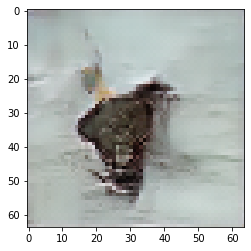

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 11

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6975271701812744 sec
Gen loss: 1.9688567613300525, Disc loss: 2.1566235642684135, Disc valid real loss: 0.38489893392512675, Disc valid fake loss: 0.40806036873867635, Disc class real loss: 0.6822699433878848, Disc class fake loss: 0.20325495890880885
Time for epoch 2 is 0.7002749443054199 sec
Gen loss: 2.0310479465283846, Disc loss: 2.132271967436138, Disc valid real loss: 0.3737985781933132, Disc valid fake loss: 0.41131365299224854, Disc class real loss: 0.6747075946707475, Disc class fake loss: 0.24863082641049436
Time for epoch 3 is 0.6966917514801025 sec
Gen loss: 2.0623279370759664, Disc loss: 2.2380686872883846, Disc valid real loss: 0.38248452622639506, Disc valid fake loss: 0.40807748389871495, Disc class real loss: 0.7258170278448808, Disc class fake loss: 0.26354750990867615
Time for epoch 4 is 0.694631814956665 sec
Gen loss: 2.058329249

Time for epoch 31 is 0.6997902393341064 sec
Gen loss: 1.7641655143938566, Disc loss: 2.0763972056539437, Disc valid real loss: 0.40630792473491867, Disc valid fake loss: 0.385889271372243, Disc class real loss: 0.6646389051487571, Disc class fake loss: 0.2536763878245103
Time for epoch 32 is 0.6982953548431396 sec
Gen loss: 1.7928174796857332, Disc loss: 2.100113404424567, Disc valid real loss: 0.4053625825204347, Disc valid fake loss: 0.3915930719752061, Disc class real loss: 0.675970058692129, Disc class fake loss: 0.24539951274269506
Time for epoch 33 is 0.6963748931884766 sec
Gen loss: 1.7864673325889988, Disc loss: 2.080174684524536, Disc valid real loss: 0.3794290188111757, Disc valid fake loss: 0.3934582001284549, Disc class real loss: 0.6783970061101412, Disc class fake loss: 0.25505855365803365
Time for epoch 34 is 0.693523645401001 sec
Gen loss: 1.8330991017191034, Disc loss: 2.0787258838352405, Disc valid real loss: 0.3823894528966201, Disc valid fake loss: 0.395945396862531

Time for epoch 62 is 0.6997122764587402 sec
Gen loss: 1.884131946061787, Disc loss: 2.0413033146607247, Disc valid real loss: 0.38775029307917547, Disc valid fake loss: 0.38174014185604294, Disc class real loss: 0.6850943690852115, Disc class fake loss: 0.24055907914513036
Time for epoch 63 is 0.698113203048706 sec
Gen loss: 1.8228530507338674, Disc loss: 2.0807833232377706, Disc valid real loss: 0.3678540305087441, Disc valid fake loss: 0.4131322205066681, Disc class real loss: 0.7001759817725733, Disc class fake loss: 0.25317509001807165
Time for epoch 64 is 0.6956133842468262 sec
Gen loss: 1.8549555728310032, Disc loss: 1.996053557646902, Disc valid real loss: 0.42336608861622055, Disc valid fake loss: 0.386740317470149, Disc class real loss: 0.638307439653497, Disc class fake loss: 0.24146490818575808
Time for epoch 65 is 0.696099042892456 sec
Gen loss: 1.7853256965938367, Disc loss: 2.045705036113137, Disc valid real loss: 0.4075025445536563, Disc valid fake loss: 0.41428845336562

Time for epoch 93 is 0.6992807388305664 sec
Gen loss: 1.8606161004618595, Disc loss: 1.918431752606442, Disc valid real loss: 0.39211609959602356, Disc valid fake loss: 0.3830405316854778, Disc class real loss: 0.6323071341765555, Disc class fake loss: 0.26792698000606735
Time for epoch 94 is 0.6938638687133789 sec
Gen loss: 1.8437057294343646, Disc loss: 1.9801250947149176, Disc valid real loss: 0.38991656272034897, Disc valid fake loss: 0.41469237365220724, Disc class real loss: 0.6434582377734938, Disc class fake loss: 0.31241134279652644
Time for epoch 95 is 0.699763298034668 sec
Gen loss: 1.8664140136618363, Disc loss: 1.9906301561154818, Disc valid real loss: 0.3942728811188748, Disc valid fake loss: 0.40965962723681804, Disc class real loss: 0.6592688623227572, Disc class fake loss: 0.2717377637561999
Time for epoch 96 is 0.6952300071716309 sec
Gen loss: 1.881800977807296, Disc loss: 2.0039024980444657, Disc valid real loss: 0.3993299509349622, Disc valid fake loss: 0.4031111347

Time for epoch 123 is 0.6964950561523438 sec
Gen loss: 1.864176637247989, Disc loss: 1.9590252386896234, Disc valid real loss: 0.393179609587318, Disc valid fake loss: 0.40874682288420827, Disc class real loss: 0.6678017942528975, Disc class fake loss: 0.26284724003390264
Time for epoch 124 is 0.6976385116577148 sec
Gen loss: 1.8788033723831177, Disc loss: 1.8880736514141685, Disc valid real loss: 0.40092738992289495, Disc valid fake loss: 0.38596594961065994, Disc class real loss: 0.6406711057612771, Disc class fake loss: 0.2354186647816708
Time for epoch 125 is 0.7010142803192139 sec
Gen loss: 1.8255114367133694, Disc loss: 1.9071252659747475, Disc valid real loss: 0.3874029893624155, Disc valid fake loss: 0.3926645140898855, Disc class real loss: 0.6530970335006714, Disc class fake loss: 0.25328301677578374
Time for epoch 126 is 0.6968579292297363 sec
Gen loss: 1.8734218133123297, Disc loss: 1.9308849447651912, Disc valid real loss: 0.4004897224275689, Disc valid fake loss: 0.384845

Time for epoch 153 is 0.6960301399230957 sec
Gen loss: 1.9417349100112915, Disc loss: 1.8110714523415816, Disc valid real loss: 0.3766035296415028, Disc valid fake loss: 0.40160637937094035, Disc class real loss: 0.6254381976629558, Disc class fake loss: 0.2282947937124654
Time for epoch 154 is 0.6988787651062012 sec
Gen loss: 1.8656875961705257, Disc loss: 1.8711471683100651, Disc valid real loss: 0.42853130949170964, Disc valid fake loss: 0.4039174177144703, Disc class real loss: 0.628866826233111, Disc class fake loss: 0.23244577332546837
Time for epoch 155 is 0.6973056793212891 sec
Gen loss: 1.8609950291483026, Disc loss: 1.8269697114040977, Disc valid real loss: 0.38131060725764226, Disc valid fake loss: 0.389002169433393, Disc class real loss: 0.6530170252448634, Disc class fake loss: 0.2045397915338215
Time for epoch 156 is 0.695667028427124 sec
Gen loss: 1.8786562367489463, Disc loss: 1.8835958367899845, Disc valid real loss: 0.4031467688711066, Disc valid fake loss: 0.37860856

Time for epoch 183 is 0.6984436511993408 sec
Gen loss: 1.9487140304163884, Disc loss: 1.7972397553293329, Disc valid real loss: 0.41309686710959986, Disc valid fake loss: 0.40088802576065063, Disc class real loss: 0.6240364909172058, Disc class fake loss: 0.2208559717002668
Time for epoch 184 is 0.6983113288879395 sec
Gen loss: 1.8758826569506997, Disc loss: 1.7934033933438753, Disc valid real loss: 0.3886251088820006, Disc valid fake loss: 0.4045487736400805, Disc class real loss: 0.6488276782788729, Disc class fake loss: 0.1984913321702104
Time for epoch 185 is 0.6953260898590088 sec
Gen loss: 1.8562396513788324, Disc loss: 1.8487655614551746, Disc valid real loss: 0.40977822950011805, Disc valid fake loss: 0.4090812943483654, Disc class real loss: 0.6653516543538947, Disc class fake loss: 0.21243269584680857
Time for epoch 186 is 0.6998682022094727 sec
Gen loss: 1.9582069861261469, Disc loss: 1.8331241984116404, Disc valid real loss: 0.3843614929600766, Disc valid fake loss: 0.40429

Time for epoch 213 is 0.7011094093322754 sec
Gen loss: 1.8954629207912244, Disc loss: 1.7932289085890118, Disc valid real loss: 0.3913213657705407, Disc valid fake loss: 0.4394740540730326, Disc class real loss: 0.6689017289563229, Disc class fake loss: 0.17817375534459165
Time for epoch 214 is 0.7037956714630127 sec
Gen loss: 2.010917594558314, Disc loss: 1.7449503635105335, Disc valid real loss: 0.39406613456575496, Disc valid fake loss: 0.3981094085856488, Disc class real loss: 0.6436385386868527, Disc class fake loss: 0.20838382487234317
Time for epoch 215 is 0.701836109161377 sec
Gen loss: 1.8852338602668361, Disc loss: 1.7578297414277728, Disc valid real loss: 0.39083620435313177, Disc valid fake loss: 0.40314167737960815, Disc class real loss: 0.6762799589257491, Disc class fake loss: 0.1728941700176189
Time for epoch 216 is 0.7000293731689453 sec
Gen loss: 1.9443071766903526, Disc loss: 1.748795095242952, Disc valid real loss: 0.4060901748506646, Disc valid fake loss: 0.3882228

Time for epoch 243 is 0.6969804763793945 sec
Gen loss: 1.9016805134321515, Disc loss: 1.7755056054968583, Disc valid real loss: 0.3863560494623686, Disc valid fake loss: 0.4184502755340777, Disc class real loss: 0.6810516213115893, Disc class fake loss: 0.23262553975770348
Time for epoch 244 is 0.6950619220733643 sec
Gen loss: 1.8780003597861843, Disc loss: 1.6895756846980046, Disc valid real loss: 0.40321279983771474, Disc valid fake loss: 0.4060344115683907, Disc class real loss: 0.6501453518867493, Disc class fake loss: 0.17094676980846807
Time for epoch 245 is 0.6938023567199707 sec
Gen loss: 1.9388140941921033, Disc loss: 1.6841300537711696, Disc valid real loss: 0.37896693850818436, Disc valid fake loss: 0.40248191042950276, Disc class real loss: 0.6691950183165701, Disc class fake loss: 0.17418080254604942
Time for epoch 246 is 0.6968429088592529 sec
Gen loss: 1.9443687137804533, Disc loss: 1.729809742224844, Disc valid real loss: 0.3952762515921342, Disc valid fake loss: 0.3903

Time for epoch 273 is 0.6990542411804199 sec
Gen loss: 1.8915765222750212, Disc loss: 1.6341921906722219, Disc valid real loss: 0.38147331225244624, Disc valid fake loss: 0.4029310926010734, Disc class real loss: 0.6645773366877907, Disc class fake loss: 0.17588423623850472
Time for epoch 274 is 0.6926333904266357 sec
Gen loss: 2.006436498541581, Disc loss: 1.611189327741924, Disc valid real loss: 0.3906455824249669, Disc valid fake loss: 0.3936931114447744, Disc class real loss: 0.638107397054371, Disc class fake loss: 0.18168961413596807
Time for epoch 275 is 0.6981542110443115 sec
Gen loss: 1.9401391493646722, Disc loss: 1.5919536791349713, Disc valid real loss: 0.37877948190036576, Disc valid fake loss: 0.4048679376903333, Disc class real loss: 0.6639466630785089, Disc class fake loss: 0.13809708074519508
Time for epoch 276 is 0.6956226825714111 sec
Gen loss: 1.9268024093226384, Disc loss: 1.624199064154374, Disc valid real loss: 0.376697818699636, Disc valid fake loss: 0.410706411

Time for epoch 303 is 0.6964945793151855 sec
Gen loss: 1.8850487596110295, Disc loss: 1.619330086206135, Disc valid real loss: 0.36653126384082596, Disc valid fake loss: 0.39696183016425685, Disc class real loss: 0.6835697261910689, Disc class fake loss: 0.17236953307139247
Time for epoch 304 is 0.6939594745635986 sec
Gen loss: 1.8687752422533537, Disc loss: 1.6571065689388074, Disc valid real loss: 0.3914285882523185, Disc valid fake loss: 0.4009863295053181, Disc class real loss: 0.6786236951225683, Disc class fake loss: 0.18616649037913272
Time for epoch 305 is 0.696779727935791 sec
Gen loss: 1.928616059453864, Disc loss: 1.6021396611866199, Disc valid real loss: 0.3997805526382045, Disc valid fake loss: 0.39239891108713654, Disc class real loss: 0.6442353443095559, Disc class fake loss: 0.1658205397819218
Time for epoch 306 is 0.6937627792358398 sec
Gen loss: 1.97851888757003, Disc loss: 1.6143870416440462, Disc valid real loss: 0.39093196784195144, Disc valid fake loss: 0.39991249

Time for epoch 333 is 0.6969404220581055 sec
Gen loss: 1.9611348792126304, Disc loss: 1.6593330784847862, Disc valid real loss: 0.3938118831107491, Disc valid fake loss: 0.41121714209255417, Disc class real loss: 0.7012097459090384, Disc class fake loss: 0.15320391560855665
Time for epoch 334 is 0.6969728469848633 sec
Gen loss: 1.9922904968261719, Disc loss: 1.641401165410092, Disc valid real loss: 0.3890165765034525, Disc valid fake loss: 0.41614563371005814, Disc class real loss: 0.6865558185075459, Disc class fake loss: 0.1497905148487342
Time for epoch 335 is 0.6988101005554199 sec
Gen loss: 1.9578881451958103, Disc loss: 1.678628225075571, Disc valid real loss: 0.39680318926510055, Disc valid fake loss: 0.4161086019716765, Disc class real loss: 0.6932428322340313, Disc class fake loss: 0.17257777366198992
Time for epoch 336 is 0.6954567432403564 sec
Gen loss: 2.0088722705841064, Disc loss: 1.6438512488415367, Disc valid real loss: 0.4084382621865523, Disc valid fake loss: 0.408734

Time for epoch 363 is 0.698084831237793 sec
Gen loss: 1.9065848400718288, Disc loss: 1.6546930953076011, Disc valid real loss: 0.40149850202234166, Disc valid fake loss: 0.3924547669134642, Disc class real loss: 0.6698287380369086, Disc class fake loss: 0.1910068502551631
Time for epoch 364 is 0.6972379684448242 sec
Gen loss: 1.9350969791412354, Disc loss: 1.6404047137812565, Disc valid real loss: 0.3974885689584832, Disc valid fake loss: 0.40827716338007075, Disc class real loss: 0.6608318121809709, Disc class fake loss: 0.1739045522714916
Time for epoch 365 is 0.6973361968994141 sec
Gen loss: 1.966846133533277, Disc loss: 1.6304133754027517, Disc valid real loss: 0.39553383149598775, Disc valid fake loss: 0.4065356129094174, Disc class real loss: 0.6528317551863821, Disc class fake loss: 0.1756076404922887
Time for epoch 366 is 0.6909067630767822 sec
Gen loss: 2.056323609854046, Disc loss: 1.7499262784656726, Disc valid real loss: 0.4130732166139703, Disc valid fake loss: 0.424358341

Time for epoch 393 is 0.6968326568603516 sec
Gen loss: 1.9616930861222117, Disc loss: 1.618368895430314, Disc valid real loss: 0.3996108284122066, Disc valid fake loss: 0.4057501052555285, Disc class real loss: 0.655126292454569, Disc class fake loss: 0.1579811318140281
Time for epoch 394 is 0.6972084045410156 sec
Gen loss: 1.9854829248629118, Disc loss: 1.6015521852593673, Disc valid real loss: 0.37088300209296376, Disc valid fake loss: 0.40952848446996587, Disc class real loss: 0.6665550470352173, Disc class fake loss: 0.15468805910725342
Time for epoch 395 is 0.6979737281799316 sec
Gen loss: 2.011753985756322, Disc loss: 1.6113284700795223, Disc valid real loss: 0.3956831426996934, Disc valid fake loss: 0.3812338082413924, Disc class real loss: 0.6721641609543249, Disc class fake loss: 0.16234936035777392
Time for epoch 396 is 0.6949930191040039 sec
Gen loss: 1.9446275296964144, Disc loss: 1.6790936557870162, Disc valid real loss: 0.3949509859085083, Disc valid fake loss: 0.39645588

Time for epoch 423 is 0.6924300193786621 sec
Gen loss: 1.9235370472857827, Disc loss: 1.6082399518866288, Disc valid real loss: 0.3890017851402885, Disc valid fake loss: 0.3827293734801443, Disc class real loss: 0.6830336231934396, Disc class fake loss: 0.15358106556691623
Time for epoch 424 is 0.6935138702392578 sec
Gen loss: 1.9483522427709479, Disc loss: 1.611270779057553, Disc valid real loss: 0.39320301539019537, Disc valid fake loss: 0.39971300332169785, Disc class real loss: 0.6845475215660898, Disc class fake loss: 0.13391737639904022
Time for epoch 425 is 0.6990096569061279 sec
Gen loss: 1.9108959310933162, Disc loss: 1.6345562119232981, Disc valid real loss: 0.3808602533842388, Disc valid fake loss: 0.3969881565947282, Disc class real loss: 0.6661668498265115, Disc class fake loss: 0.19063604897574374
Time for epoch 426 is 0.6949987411499023 sec
Gen loss: 1.9090341015865928, Disc loss: 1.6596832651841014, Disc valid real loss: 0.37958989645305435, Disc valid fake loss: 0.3976

Time for epoch 453 is 0.6989641189575195 sec
Gen loss: 1.9905119067744206, Disc loss: 1.6409728527069092, Disc valid real loss: 0.3945465652566207, Disc valid fake loss: 0.40432140387986837, Disc class real loss: 0.6678224362825093, Disc class fake loss: 0.17438114630548576
Time for epoch 454 is 0.7009060382843018 sec
Gen loss: 2.0162360730924105, Disc loss: 1.6385694114785445, Disc valid real loss: 0.3888906679655376, Disc valid fake loss: 0.38048230660589116, Disc class real loss: 0.6857498319525468, Disc class fake loss: 0.18354707760246178
Time for epoch 455 is 0.6974241733551025 sec
Gen loss: 1.903580025622719, Disc loss: 1.614596542559172, Disc valid real loss: 0.3752050619376333, Disc valid fake loss: 0.3989913071456708, Disc class real loss: 0.6649784947696485, Disc class fake loss: 0.17551960207914052
Time for epoch 456 is 0.6940925121307373 sec
Gen loss: 1.9414245329405133, Disc loss: 1.6617894235410189, Disc valid real loss: 0.4103272180808218, Disc valid fake loss: 0.400715

Time for epoch 483 is 0.6982808113098145 sec
Gen loss: 1.8945546212949251, Disc loss: 1.6419169400867664, Disc valid real loss: 0.4062085747718811, Disc valid fake loss: 0.38138811368691294, Disc class real loss: 0.6977219016928422, Disc class fake loss: 0.15670658099023918
Time for epoch 484 is 0.7003593444824219 sec
Gen loss: 1.870820020374499, Disc loss: 1.634462645179347, Disc valid real loss: 0.40583037388952153, Disc valid fake loss: 0.40128949598262187, Disc class real loss: 0.6726280576304385, Disc class fake loss: 0.15481829153079735
Time for epoch 485 is 0.696974515914917 sec
Gen loss: 2.02025432335703, Disc loss: 1.6281571639211554, Disc valid real loss: 0.40264611103032766, Disc valid fake loss: 0.4015436956756993, Disc class real loss: 0.6406710743904114, Disc class fake loss: 0.1833877179183458
Time for epoch 486 is 0.696274995803833 sec
Gen loss: 1.8621502550024736, Disc loss: 1.637055516242981, Disc valid real loss: 0.3804357443985186, Disc valid fake loss: 0.4007372464

Time for epoch 513 is 0.6987695693969727 sec
Gen loss: 1.9535428348340487, Disc loss: 1.6391647614930804, Disc valid real loss: 0.3731861130187386, Disc valid fake loss: 0.3984347440694508, Disc class real loss: 0.679469666982952, Disc class fake loss: 0.1881725203834082
Time for epoch 514 is 0.7006833553314209 sec
Gen loss: 2.036239454620763, Disc loss: 1.6190556726957623, Disc valid real loss: 0.3968999574058934, Disc valid fake loss: 0.3843828345599927, Disc class real loss: 0.6762582628350509, Disc class fake loss: 0.161617579820909
Time for epoch 515 is 0.7000627517700195 sec
Gen loss: 1.899740495179829, Disc loss: 1.6163660225115324, Disc valid real loss: 0.3945476334345968, Disc valid fake loss: 0.3928081644208808, Disc class real loss: 0.6705650028429533, Disc class fake loss: 0.15854764298388832
Time for epoch 516 is 0.7004148960113525 sec
Gen loss: 1.8204491263941716, Disc loss: 1.7102758884429932, Disc valid real loss: 0.3998700145043825, Disc valid fake loss: 0.424481741691

Time for epoch 543 is 0.6939423084259033 sec
Gen loss: 1.9880175653256869, Disc loss: 1.644944849767183, Disc valid real loss: 0.38531074869005305, Disc valid fake loss: 0.38581116575943797, Disc class real loss: 0.7034471615364677, Disc class fake loss: 0.1704823939423812
Time for epoch 544 is 0.6977288722991943 sec
Gen loss: 1.8514989928195351, Disc loss: 1.6441199967735691, Disc valid real loss: 0.3855303337699489, Disc valid fake loss: 0.41147990760050324, Disc class real loss: 0.6997802445763036, Disc class fake loss: 0.14744001077978233
Time for epoch 545 is 0.6945133209228516 sec
Gen loss: 2.053656502773887, Disc loss: 1.5984413937518471, Disc valid real loss: 0.39599285470811946, Disc valid fake loss: 0.39007918928798874, Disc class real loss: 0.6584870281972384, Disc class fake loss: 0.15398325104462474
Time for epoch 546 is 0.6936829090118408 sec
Gen loss: 1.8867807388305664, Disc loss: 1.6343048058058087, Disc valid real loss: 0.4142167223127265, Disc valid fake loss: 0.3880

Time for epoch 573 is 0.7005264759063721 sec
Gen loss: 1.907105514877721, Disc loss: 1.6809978485107422, Disc valid real loss: 0.40400530162610504, Disc valid fake loss: 0.4047977281244178, Disc class real loss: 0.7009292935070238, Disc class fake loss: 0.17137146113734497
Time for epoch 574 is 0.6978573799133301 sec
Gen loss: 1.9485579038921155, Disc loss: 1.6109364722904407, Disc valid real loss: 0.3855074644088745, Disc valid fake loss: 0.3727803057745883, Disc class real loss: 0.700548319440139, Disc class fake loss: 0.15221009560321508
Time for epoch 575 is 0.6967122554779053 sec
Gen loss: 1.9821502221258063, Disc loss: 1.6485167302583392, Disc valid real loss: 0.4002173746887006, Disc valid fake loss: 0.39318102127627325, Disc class real loss: 0.6777887783552471, Disc class fake loss: 0.1774296235097082
Time for epoch 576 is 0.6921792030334473 sec
Gen loss: 2.0196107751444767, Disc loss: 1.628570462528028, Disc valid real loss: 0.4019864554467954, Disc valid fake loss: 0.39682025

Time for epoch 603 is 0.7008235454559326 sec
Gen loss: 2.0226725277147795, Disc loss: 1.6570716155202765, Disc valid real loss: 0.39247999379509374, Disc valid fake loss: 0.40382689237594604, Disc class real loss: 0.6981944975100065, Disc class fake loss: 0.162677349228608
Time for epoch 604 is 0.7036988735198975 sec
Gen loss: 1.8806071344174837, Disc loss: 1.6043533337743658, Disc valid real loss: 0.37802194137322276, Disc valid fake loss: 0.3784605664642234, Disc class real loss: 0.6648229862514295, Disc class fake loss: 0.1831441913780413
Time for epoch 605 is 0.7138800621032715 sec
Gen loss: 1.979720862288224, Disc loss: 1.6242811805323552, Disc valid real loss: 0.3879564671139968, Disc valid fake loss: 0.39862463505644546, Disc class real loss: 0.6889360201986212, Disc class fake loss: 0.14887208217068723
Time for epoch 606 is 0.7004411220550537 sec
Gen loss: 1.9173592642733925, Disc loss: 1.6688027570122166, Disc valid real loss: 0.4086737428840838, Disc valid fake loss: 0.403346

Time for epoch 633 is 0.6973214149475098 sec
Gen loss: 1.9343099656857943, Disc loss: 1.6278469311563593, Disc valid real loss: 0.39528341983494003, Disc valid fake loss: 0.40552069011487457, Disc class real loss: 0.6682481577521876, Disc class fake loss: 0.15889656465304525
Time for epoch 634 is 0.6935288906097412 sec
Gen loss: 1.9022862722999172, Disc loss: 1.605665545714529, Disc valid real loss: 0.43187316467887477, Disc valid fake loss: 0.38862171063297674, Disc class real loss: 0.6401372489176298, Disc class fake loss: 0.1451324338191434
Time for epoch 635 is 0.6994483470916748 sec
Gen loss: 1.9246866326583059, Disc loss: 1.610836857243588, Disc valid real loss: 0.38939929400619705, Disc valid fake loss: 0.3817924135609677, Disc class real loss: 0.6670923844764107, Disc class fake loss: 0.17265169361704275
Time for epoch 636 is 0.6959714889526367 sec
Gen loss: 2.048082803425036, Disc loss: 1.6407698957543624, Disc valid real loss: 0.39007753604336787, Disc valid fake loss: 0.3925

Time for epoch 663 is 0.6954929828643799 sec
Gen loss: 1.8801675783960443, Disc loss: 1.6407826574225175, Disc valid real loss: 0.4022332837707118, Disc valid fake loss: 0.3997444306549273, Disc class real loss: 0.6741470945508856, Disc class fake loss: 0.1647597284693467
Time for epoch 664 is 0.6924698352813721 sec
Gen loss: 1.8042831671865363, Disc loss: 1.629852294921875, Disc valid real loss: 0.3960282520243996, Disc valid fake loss: 0.40838678887015895, Disc class real loss: 0.6813997500821164, Disc class fake loss: 0.1441449695511868
Time for epoch 665 is 0.6955752372741699 sec
Gen loss: 2.0115095126001457, Disc loss: 1.6541152878811485, Disc valid real loss: 0.3954313068013442, Disc valid fake loss: 0.3934809440060666, Disc class real loss: 0.7101057516901117, Disc class fake loss: 0.1552082657029754
Time for epoch 666 is 0.6923911571502686 sec
Gen loss: 1.9359728286140843, Disc loss: 1.627456916005988, Disc valid real loss: 0.37949526937384354, Disc valid fake loss: 0.387836343

Time for epoch 693 is 0.6976931095123291 sec
Gen loss: 2.0115987125195955, Disc loss: 1.5918919726421958, Disc valid real loss: 0.3911824728313245, Disc valid fake loss: 0.3883827485536274, Disc class real loss: 0.6650845282956174, Disc class fake loss: 0.14734578642405963
Time for epoch 694 is 0.703444242477417 sec
Gen loss: 1.956292566500212, Disc loss: 1.637321572554739, Disc valid real loss: 0.40496559362662465, Disc valid fake loss: 0.40533082422457245, Disc class real loss: 0.6599421658013996, Disc class fake loss: 0.1671815714553783
Time for epoch 695 is 0.6984877586364746 sec
Gen loss: 1.9880520607295789, Disc loss: 1.6329711550160457, Disc valid real loss: 0.37948171715987356, Disc valid fake loss: 0.396478113375212, Disc class real loss: 0.6905471431581598, Disc class fake loss: 0.1665690184423798
Time for epoch 696 is 0.701648473739624 sec
Gen loss: 1.8549559053621794, Disc loss: 1.6612933623163324, Disc valid real loss: 0.40613283609089096, Disc valid fake loss: 0.385977315

Time for epoch 723 is 0.6913919448852539 sec
Gen loss: 1.8665837425934642, Disc loss: 1.6844858495812667, Disc valid real loss: 0.4209452334203218, Disc valid fake loss: 0.398759536053005, Disc class real loss: 0.7038664598213998, Disc class fake loss: 0.16102320073466553
Time for epoch 724 is 0.6952681541442871 sec
Gen loss: 1.9234458584534495, Disc loss: 1.6616301473818327, Disc valid real loss: 0.41310833786663254, Disc valid fake loss: 0.385393876778452, Disc class real loss: 0.6954744426827681, Disc class fake loss: 0.1677590857603048
Time for epoch 725 is 0.6944620609283447 sec
Gen loss: 1.9098418888292814, Disc loss: 1.6352203394237317, Disc valid real loss: 0.3938301040938026, Disc valid fake loss: 0.40903890917175695, Disc class real loss: 0.6864867022162989, Disc class fake loss: 0.14597273500342117
Time for epoch 726 is 0.6995961666107178 sec
Gen loss: 1.9380025738163997, Disc loss: 1.6232822506051314, Disc valid real loss: 0.3955860584974289, Disc valid fake loss: 0.3895577

Time for epoch 753 is 0.6986255645751953 sec
Gen loss: 1.9578674153277749, Disc loss: 1.6628282258385105, Disc valid real loss: 0.40593913354371725, Disc valid fake loss: 0.41466957173849406, Disc class real loss: 0.6942451753114399, Disc class fake loss: 0.1480835913435409
Time for epoch 754 is 0.6968822479248047 sec
Gen loss: 1.8842962352853072, Disc loss: 1.5825426453038265, Disc valid real loss: 0.3984837892808412, Disc valid fake loss: 0.39146351343707037, Disc class real loss: 0.6641267318474618, Disc class fake loss: 0.12857576342005478
Time for epoch 755 is 0.69730544090271 sec
Gen loss: 1.8694047425922595, Disc loss: 1.6556357960951955, Disc valid real loss: 0.3986699879169464, Disc valid fake loss: 0.3784587744035219, Disc class real loss: 0.6795535118956315, Disc class fake loss: 0.19904963201598116
Time for epoch 756 is 0.6940665245056152 sec
Gen loss: 1.8873537151437056, Disc loss: 1.7022085064335872, Disc valid real loss: 0.40748707401125056, Disc valid fake loss: 0.42037

Time for epoch 783 is 0.6969857215881348 sec
Gen loss: 1.9925792719188489, Disc loss: 1.6288149796034161, Disc valid real loss: 0.37903115937584325, Disc valid fake loss: 0.3750179488407938, Disc class real loss: 0.6862676269129703, Disc class fake loss: 0.18859779795533732
Time for epoch 784 is 0.692040205001831 sec
Gen loss: 1.8712713718414307, Disc loss: 1.611503375203986, Disc valid real loss: 0.39347283463729055, Disc valid fake loss: 0.3899647295475006, Disc class real loss: 0.669697432141555, Disc class fake loss: 0.15847063397890643
Time for epoch 785 is 0.696061372756958 sec
Gen loss: 1.912863210627907, Disc loss: 1.6619902660972194, Disc valid real loss: 0.40934568643569946, Disc valid fake loss: 0.3964200066892724, Disc class real loss: 0.6848199022443671, Disc class fake loss: 0.1715073475712224
Time for epoch 786 is 0.6967275142669678 sec
Gen loss: 2.031089450183668, Disc loss: 1.6032291148838245, Disc valid real loss: 0.37479907431100545, Disc valid fake loss: 0.398660719

Time for epoch 814 is 0.6983475685119629 sec
Gen loss: 1.8883893552579378, Disc loss: 1.6105687931964272, Disc valid real loss: 0.40551758283062983, Disc valid fake loss: 0.38786341328369944, Disc class real loss: 0.6819946875697688, Disc class fake loss: 0.1353024644287009
Time for epoch 815 is 0.6952221393585205 sec
Gen loss: 1.9939598158786171, Disc loss: 1.6172198057174683, Disc valid real loss: 0.39683989631502253, Disc valid fake loss: 0.4026537474833037, Disc class real loss: 0.6675789136635629, Disc class fake loss: 0.15025073034982933
Time for epoch 816 is 0.6983597278594971 sec
Gen loss: 1.9640270785281533, Disc loss: 1.613361684899581, Disc valid real loss: 0.3965539281305514, Disc valid fake loss: 0.38604799854127986, Disc class real loss: 0.6760581794537996, Disc class fake loss: 0.15480583445414117
Time for epoch 817 is 0.6987531185150146 sec
Gen loss: 1.9467283487319946, Disc loss: 1.6194173474060862, Disc valid real loss: 0.3968417973894822, Disc valid fake loss: 0.3915

Time for epoch 844 is 0.7007944583892822 sec
Gen loss: 1.978348092028969, Disc loss: 1.6060780349530672, Disc valid real loss: 0.3927047158542432, Disc valid fake loss: 0.4028010634999526, Disc class real loss: 0.6549349113514549, Disc class fake loss: 0.15573718477236598
Time for epoch 845 is 0.6992857456207275 sec
Gen loss: 2.069716315520437, Disc loss: 1.538046253354926, Disc valid real loss: 0.35770807454460546, Disc valid fake loss: 0.3783671769656633, Disc class real loss: 0.653221048806843, Disc class fake loss: 0.14885085115307256
Time for epoch 846 is 0.6969602108001709 sec
Gen loss: 1.9440976318560148, Disc loss: 1.6406817938152112, Disc valid real loss: 0.3846576919681148, Disc valid fake loss: 0.3980195600735514, Disc class real loss: 0.6964283899257058, Disc class fake loss: 0.16168312846045746
Time for epoch 847 is 0.6976110935211182 sec
Gen loss: 1.9316348464865434, Disc loss: 1.6420669743889256, Disc valid real loss: 0.3982821357877631, Disc valid fake loss: 0.386605308

Time for epoch 874 is 0.6965887546539307 sec
Gen loss: 1.854554810022053, Disc loss: 1.666688046957317, Disc valid real loss: 0.395096187528811, Disc valid fake loss: 0.40528107473724767, Disc class real loss: 0.6932652090725145, Disc class fake loss: 0.1731496410150277
Time for epoch 875 is 0.6954011917114258 sec
Gen loss: 1.9345112223374217, Disc loss: 1.5906851793590344, Disc valid real loss: 0.392952456286079, Disc valid fake loss: 0.37591873030913503, Disc class real loss: 0.6842743377936514, Disc class fake loss: 0.1376490273365849
Time for epoch 876 is 0.6969139575958252 sec
Gen loss: 2.014954736358241, Disc loss: 1.6517178322139539, Disc valid real loss: 0.3996265640384273, Disc valid fake loss: 0.38527735675636093, Disc class real loss: 0.7115245586947391, Disc class fake loss: 0.1554005945983686
Time for epoch 877 is 0.6983644962310791 sec
Gen loss: 2.036888919378582, Disc loss: 1.6354474080236334, Disc valid real loss: 0.4072936208624589, Disc valid fake loss: 0.376401151481

Time for epoch 904 is 0.69415283203125 sec
Gen loss: 1.8972101713481702, Disc loss: 1.6018187623274953, Disc valid real loss: 0.38677844405174255, Disc valid fake loss: 0.3720744346317492, Disc class real loss: 0.688591646520715, Disc class fake loss: 0.1544810713906037
Time for epoch 905 is 0.6882345676422119 sec
Gen loss: 1.9792084882133885, Disc loss: 1.5859418103569431, Disc valid real loss: 0.37694686023812546, Disc valid fake loss: 0.3882364677755456, Disc class real loss: 0.6586415108881498, Disc class fake loss: 0.16221628534166435
Time for epoch 906 is 0.6943554878234863 sec
Gen loss: 1.9762634791825946, Disc loss: 1.6140730443753695, Disc valid real loss: 0.4164743109753257, Disc valid fake loss: 0.3976136900876698, Disc class real loss: 0.6373036472420943, Disc class fake loss: 0.16277630391873812
Time for epoch 907 is 0.697500467300415 sec
Gen loss: 1.8623204795937789, Disc loss: 1.5864080504367226, Disc valid real loss: 0.4050623994124563, Disc valid fake loss: 0.392341430

Time for epoch 934 is 0.6960561275482178 sec
Gen loss: 1.888079141315661, Disc loss: 1.6223527945970233, Disc valid real loss: 0.39530610567645025, Disc valid fake loss: 0.40124893031622233, Disc class real loss: 0.6930202935871325, Disc class fake loss: 0.13288948567290054
Time for epoch 935 is 0.6971414089202881 sec
Gen loss: 1.8920669994856183, Disc loss: 1.6560940554267483, Disc valid real loss: 0.39164638048724126, Disc valid fake loss: 0.39865977670017044, Disc class real loss: 0.7229066773464805, Disc class fake loss: 0.14299722172712026
Time for epoch 936 is 0.6994478702545166 sec
Gen loss: 1.9081617593765259, Disc loss: 1.6186565725426925, Disc valid real loss: 0.39021497023733037, Disc valid fake loss: 0.40138960041497884, Disc class real loss: 0.6850277467777854, Disc class fake loss: 0.1421328814406144
Time for epoch 937 is 0.6965327262878418 sec
Gen loss: 1.9581370981116044, Disc loss: 1.6366721768128245, Disc valid real loss: 0.38549910877880295, Disc valid fake loss: 0.3

Time for epoch 964 is 0.7001240253448486 sec
Gen loss: 1.8730182459479885, Disc loss: 1.6501659154891968, Disc valid real loss: 0.43046720874936956, Disc valid fake loss: 0.4103924224251195, Disc class real loss: 0.6518557134427523, Disc class fake loss: 0.15754946066360725
Time for epoch 965 is 0.6974446773529053 sec
Gen loss: 1.7963992733704417, Disc loss: 1.6444471196124428, Disc valid real loss: 0.41594798470798294, Disc valid fake loss: 0.4150147657645376, Disc class real loss: 0.6727159352679002, Disc class fake loss: 0.1408748262022671
Time for epoch 966 is 0.6895885467529297 sec
Gen loss: 1.9067510240956356, Disc loss: 1.6707525002328973, Disc valid real loss: 0.3771679056318183, Disc valid fake loss: 0.41656159727196945, Disc class real loss: 0.7033656929668627, Disc class fake loss: 0.17376325044192767
Time for epoch 967 is 0.6969425678253174 sec
Gen loss: 1.915208703593204, Disc loss: 1.6229027321464138, Disc valid real loss: 0.3907469087525418, Disc valid fake loss: 0.39674

Time for epoch 994 is 0.696739673614502 sec
Gen loss: 1.875772476196289, Disc loss: 1.650813799155386, Disc valid real loss: 0.37705682453356293, Disc valid fake loss: 0.38474187882323013, Disc class real loss: 0.7147278942559895, Disc class fake loss: 0.17439526593998858
Time for epoch 995 is 0.6971747875213623 sec
Gen loss: 1.8629129560370195, Disc loss: 1.6209113597869873, Disc valid real loss: 0.39172639344867904, Disc valid fake loss: 0.3955616449054919, Disc class real loss: 0.6766327337214821, Disc class fake loss: 0.1570945040960061
Time for epoch 996 is 0.6972413063049316 sec
Gen loss: 2.0034302912260356, Disc loss: 1.6511054980127435, Disc valid real loss: 0.4011998255001871, Disc valid fake loss: 0.4019436255881661, Disc class real loss: 0.7053759003940382, Disc class fake loss: 0.14269869421657763
Time for epoch 997 is 0.7016651630401611 sec
Gen loss: 1.935820736383137, Disc loss: 1.6017181559612876, Disc valid real loss: 0.39305206819584493, Disc valid fake loss: 0.4123890

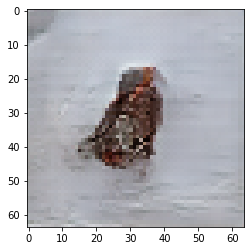

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 12

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6939387321472168 sec
Gen loss: 1.8910955818075883, Disc loss: 2.183773448592738, Disc valid real loss: 0.3680920208755292, Disc valid fake loss: 0.4228960887381905, Disc class real loss: 0.6968293535081964, Disc class fake loss: 0.1601213103062228
Time for epoch 2 is 0.698603630065918 sec
Gen loss: 1.9111897192503278, Disc loss: 2.140374365605806, Disc valid real loss: 0.3865359472601037, Disc valid fake loss: 0.37832300443398326, Disc class real loss: 0.6890911585406253, Disc class fake loss: 0.1842735719523932
Time for epoch 3 is 0.6962392330169678 sec
Gen loss: 1.806593054219296, Disc loss: 2.1613087591372038, Disc valid real loss: 0.42584985808322307, Disc valid fake loss: 0.382956934602637, Disc class real loss: 0.6784472841965524, Disc class fake loss: 0.18414125081739927
Time for epoch 4 is 0.6948580741882324 sec
Gen loss: 1.805386141726845, 

Time for epoch 31 is 0.696220874786377 sec
Gen loss: 1.721235758379886, Disc loss: 2.159133892310293, Disc valid real loss: 0.40100034130247014, Disc valid fake loss: 0.4166672982667622, Disc class real loss: 0.6956904906975595, Disc class fake loss: 0.2404584492507734
Time for epoch 32 is 0.696631908416748 sec
Gen loss: 1.756466545556721, Disc loss: 2.0616362220362614, Disc valid real loss: 0.4147315103756754, Disc valid fake loss: 0.3870458351938348, Disc class real loss: 0.6522289859621149, Disc class fake loss: 0.2586970493981713
Time for epoch 33 is 0.6960527896881104 sec
Gen loss: 1.7678827925732261, Disc loss: 2.119196603172704, Disc valid real loss: 0.42801703747950104, Disc valid fake loss: 0.3891073073211469, Disc class real loss: 0.6756187081336975, Disc class fake loss: 0.2547230108788139
Time for epoch 34 is 0.6966981887817383 sec
Gen loss: 1.7711748449425948, Disc loss: 2.110456623529133, Disc valid real loss: 0.4152067303657532, Disc valid fake loss: 0.4089556744224147, 

Time for epoch 62 is 0.6969661712646484 sec
Gen loss: 1.7783218622207642, Disc loss: 2.057707573238172, Disc valid real loss: 0.414483998951159, Disc valid fake loss: 0.411932193919232, Disc class real loss: 0.6620888051233793, Disc class fake loss: 0.24231967722114764
Time for epoch 63 is 0.6998081207275391 sec
Gen loss: 1.8327945408068205, Disc loss: 2.073237519515188, Disc valid real loss: 0.4023712732289967, Disc valid fake loss: 0.3896697085154684, Disc class real loss: 0.6904267951061851, Disc class fake loss: 0.24726072110627828
Time for epoch 64 is 0.6965992450714111 sec
Gen loss: 2.0024720430374146, Disc loss: 2.017919527856927, Disc valid real loss: 0.38643011607621847, Disc valid fake loss: 0.3831986886890311, Disc class real loss: 0.6720564334016097, Disc class fake loss: 0.25259104880847427
Time for epoch 65 is 0.6969287395477295 sec
Gen loss: 1.8759710035826032, Disc loss: 1.9678140188518323, Disc valid real loss: 0.38598323182055827, Disc valid fake loss: 0.3865789363258

Time for epoch 93 is 0.7001285552978516 sec
Gen loss: 1.8164637716192948, Disc loss: 1.949108167698509, Disc valid real loss: 0.3863979436849293, Disc valid fake loss: 0.39835809092772634, Disc class real loss: 0.6502792929348192, Disc class fake loss: 0.24114999018217387
Time for epoch 94 is 0.7013347148895264 sec
Gen loss: 1.8601247197703312, Disc loss: 2.067924976348877, Disc valid real loss: 0.4077240118854924, Disc valid fake loss: 0.40557646123986496, Disc class real loss: 0.7002496029201307, Disc class fake loss: 0.2667847581599888
Time for epoch 95 is 0.6964492797851562 sec
Gen loss: 1.86084120524557, Disc loss: 1.915616706797951, Disc valid real loss: 0.3658842507161592, Disc valid fake loss: 0.37240445927569743, Disc class real loss: 0.6630835595883822, Disc class fake loss: 0.22552008338664709
Time for epoch 96 is 0.692739725112915 sec
Gen loss: 1.965817602057206, Disc loss: 1.9820115189803273, Disc valid real loss: 0.39513346866557475, Disc valid fake loss: 0.40808540425802

Time for epoch 123 is 0.7071506977081299 sec
Gen loss: 1.9346135290045487, Disc loss: 1.9432691147452907, Disc valid real loss: 0.40258377319888067, Disc valid fake loss: 0.39768129273464803, Disc class real loss: 0.6654435835386577, Disc class fake loss: 0.2393072098493576
Time for epoch 124 is 0.7020843029022217 sec
Gen loss: 1.8343256210025989, Disc loss: 1.9776407480239868, Disc valid real loss: 0.4035817541574177, Disc valid fake loss: 0.4060921527837452, Disc class real loss: 0.6876284605578372, Disc class fake loss: 0.22134960168286374
Time for epoch 125 is 0.6967670917510986 sec
Gen loss: 1.829855718110737, Disc loss: 1.9328442560999017, Disc valid real loss: 0.3991061370623739, Disc valid fake loss: 0.40531959031757553, Disc class real loss: 0.6592126739652533, Disc class fake loss: 0.2352381191755596
Time for epoch 126 is 0.692579984664917 sec
Gen loss: 1.8633007062108893, Disc loss: 1.9149616454776965, Disc valid real loss: 0.40223453860533864, Disc valid fake loss: 0.392857

Time for epoch 153 is 0.6987130641937256 sec
Gen loss: 1.8984291741722508, Disc loss: 1.877677835916218, Disc valid real loss: 0.39535724959875407, Disc valid fake loss: 0.4017000214049691, Disc class real loss: 0.6682325695690355, Disc class fake loss: 0.20214359775969856
Time for epoch 154 is 0.6984937191009521 sec
Gen loss: 1.8584819906636287, Disc loss: 1.8498465638411672, Disc valid real loss: 0.38945492631510686, Disc valid fake loss: 0.41297444544340434, Disc class real loss: 0.6495225053084525, Disc class fake loss: 0.19409691816882083
Time for epoch 155 is 0.6987433433532715 sec
Gen loss: 1.9126138436166864, Disc loss: 1.8518761208182888, Disc valid real loss: 0.39107514682569, Disc valid fake loss: 0.42004488173284027, Disc class real loss: 0.648148630794726, Disc class fake loss: 0.1886469753164994
Time for epoch 156 is 0.700657844543457 sec
Gen loss: 1.9937008305599815, Disc loss: 1.8668645055670487, Disc valid real loss: 0.38568705163503947, Disc valid fake loss: 0.3887479

Time for epoch 183 is 0.6968021392822266 sec
Gen loss: 1.913020736292789, Disc loss: 1.8533570264515125, Disc valid real loss: 0.3837995654658267, Disc valid fake loss: 0.40773972712065043, Disc class real loss: 0.6887408055757221, Disc class fake loss: 0.2081523251376654
Time for epoch 184 is 0.700282096862793 sec
Gen loss: 1.9444568533646434, Disc loss: 1.785423755645752, Disc valid real loss: 0.37875894182606745, Disc valid fake loss: 0.39282034415947764, Disc class real loss: 0.6608387451422842, Disc class fake loss: 0.19480987873516584
Time for epoch 185 is 0.697667121887207 sec
Gen loss: 1.9163318621484857, Disc loss: 1.7697250466597707, Disc valid real loss: 0.38105111451525436, Disc valid fake loss: 0.3890359417388314, Disc class real loss: 0.6311637665096083, Disc class fake loss: 0.2355939683161284
Time for epoch 186 is 0.6967592239379883 sec
Gen loss: 1.9331425553873967, Disc loss: 1.8309488484733982, Disc valid real loss: 0.4012465806383836, Disc valid fake loss: 0.39975663

Time for epoch 213 is 0.6960866451263428 sec
Gen loss: 1.9490801535154645, Disc loss: 1.7900857297997725, Disc valid real loss: 0.4084207933200033, Disc valid fake loss: 0.3957661437360864, Disc class real loss: 0.6721241097701224, Disc class fake loss: 0.20362404380974017
Time for epoch 214 is 0.69814133644104 sec
Gen loss: 1.8688712245539616, Disc loss: 1.7496768236160278, Disc valid real loss: 0.40264791720791865, Disc valid fake loss: 0.3889438211917877, Disc class real loss: 0.6590254306793213, Disc class fake loss: 0.19061475560853355
Time for epoch 215 is 0.6931817531585693 sec
Gen loss: 1.9879333659222251, Disc loss: 1.749667857822619, Disc valid real loss: 0.3934066248567481, Disc valid fake loss: 0.41744885789720637, Disc class real loss: 0.6507038191745156, Disc class fake loss: 0.1810905972593709
Time for epoch 216 is 0.6981625556945801 sec
Gen loss: 1.8682196516739695, Disc loss: 1.7952380870517932, Disc valid real loss: 0.39323216676712036, Disc valid fake loss: 0.4111615

Time for epoch 243 is 0.6937282085418701 sec
Gen loss: 1.9848380527998273, Disc loss: 1.678028483139841, Disc valid real loss: 0.39958403612438004, Disc valid fake loss: 0.3782320383347963, Disc class real loss: 0.6569193225157889, Disc class fake loss: 0.18309675470778816
Time for epoch 244 is 0.7037854194641113 sec
Gen loss: 2.014924275247674, Disc loss: 1.6766045469986766, Disc valid real loss: 0.3892169108516292, Disc valid fake loss: 0.3933490922576503, Disc class real loss: 0.6273150977335478, Disc class fake loss: 0.21589604961244682
Time for epoch 245 is 0.6986050605773926 sec
Gen loss: 1.9199882745742798, Disc loss: 1.6892215389954417, Disc valid real loss: 0.3906202865274329, Disc valid fake loss: 0.4026131441718654, Disc class real loss: 0.6715649554603978, Disc class fake loss: 0.1635511415569406
Time for epoch 246 is 0.6971547603607178 sec
Gen loss: 1.9271612418325323, Disc loss: 1.6390785669025623, Disc valid real loss: 0.3796519621422416, Disc valid fake loss: 0.38465039

Time for epoch 273 is 0.6982772350311279 sec
Gen loss: 1.9399074190541317, Disc loss: 1.6723140791842812, Disc valid real loss: 0.41014595565043, Disc valid fake loss: 0.3980363976014288, Disc class real loss: 0.6897838147063005, Disc class fake loss: 0.1642901187664584
Time for epoch 274 is 0.6959736347198486 sec
Gen loss: 1.911217306789599, Disc loss: 1.6422187466370433, Disc valid real loss: 0.3764182156638095, Disc valid fake loss: 0.4128590586938356, Disc class real loss: 0.6865974382350319, Disc class fake loss: 0.1581119665581929
Time for epoch 275 is 0.6997089385986328 sec
Gen loss: 1.9523584466231496, Disc loss: 1.6361274970205206, Disc valid real loss: 0.3948271149083188, Disc valid fake loss: 0.3954018401472192, Disc class real loss: 0.667227638395209, Disc class fake loss: 0.17279300289718727
Time for epoch 276 is 0.6959385871887207 sec
Gen loss: 1.9685120896289223, Disc loss: 1.6304500040255094, Disc valid real loss: 0.39290242916659307, Disc valid fake loss: 0.40092314701

Time for epoch 303 is 0.6953961849212646 sec
Gen loss: 1.8831121168638532, Disc loss: 1.6345600579914294, Disc valid real loss: 0.37997809444603164, Disc valid fake loss: 0.39690337212462173, Disc class real loss: 0.6899034600508841, Disc class fake loss: 0.16787955400190854
Time for epoch 304 is 0.6941816806793213 sec
Gen loss: 2.002801273998461, Disc loss: 1.5867558341277272, Disc valid real loss: 0.3900779830782037, Disc valid fake loss: 0.38561110433779267, Disc class real loss: 0.644028619716042, Disc class fake loss: 0.16713351560266396
Time for epoch 305 is 0.6949713230133057 sec
Gen loss: 1.8992833714736135, Disc loss: 1.650388755296406, Disc valid real loss: 0.4061676467719831, Disc valid fake loss: 0.38399702310562134, Disc class real loss: 0.6704511516972592, Disc class fake loss: 0.1898690728764785
Time for epoch 306 is 0.6981704235076904 sec
Gen loss: 1.9814915657043457, Disc loss: 1.651928042110644, Disc valid real loss: 0.40355461208443894, Disc valid fake loss: 0.408367

Time for epoch 333 is 0.6936626434326172 sec
Gen loss: 1.9843597349367643, Disc loss: 1.687238479915418, Disc valid real loss: 0.40477539442087473, Disc valid fake loss: 0.4236611849383304, Disc class real loss: 0.6888290392725092, Disc class fake loss: 0.17007662983317123
Time for epoch 334 is 0.7008676528930664 sec
Gen loss: 1.921541364569413, Disc loss: 1.6659663915634155, Disc valid real loss: 0.40164175315907125, Disc valid fake loss: 0.40061659248251663, Disc class real loss: 0.6892143801638955, Disc class fake loss: 0.1745966076850891
Time for epoch 335 is 0.6985859870910645 sec
Gen loss: 1.956495203469929, Disc loss: 1.6322079771443416, Disc valid real loss: 0.40458002764927714, Disc valid fake loss: 0.3993497992816724, Disc class real loss: 0.6591056052007174, Disc class fake loss: 0.1692705277941729
Time for epoch 336 is 0.6969099044799805 sec
Gen loss: 1.9672528442583586, Disc loss: 1.659026867464969, Disc valid real loss: 0.3920271694660187, Disc valid fake loss: 0.41966722

Time for epoch 363 is 0.6971139907836914 sec
Gen loss: 2.0175736264178625, Disc loss: 1.6261527475557829, Disc valid real loss: 0.422441680180399, Disc valid fake loss: 0.37997460443722575, Disc class real loss: 0.6552875920345909, Disc class fake loss: 0.16854627038303174
Time for epoch 364 is 0.6977262496948242 sec
Gen loss: 1.8446056780062223, Disc loss: 1.6045857291472585, Disc valid real loss: 0.394852235129005, Disc valid fake loss: 0.3991542160511017, Disc class real loss: 0.6646217609706678, Disc class fake loss: 0.14606122907839322
Time for epoch 365 is 0.6934010982513428 sec
Gen loss: 2.002109496217025, Disc loss: 1.5872602776477212, Disc valid real loss: 0.4105423437921624, Disc valid fake loss: 0.3780712955876401, Disc class real loss: 0.6624843195865029, Disc class fake loss: 0.13626759577738612
Time for epoch 366 is 0.6993930339813232 sec
Gen loss: 1.9459140865426314, Disc loss: 1.6387590546357005, Disc valid real loss: 0.3814863484156759, Disc valid fake loss: 0.38272708

Time for epoch 393 is 0.6914761066436768 sec
Gen loss: 2.0195570180290625, Disc loss: 1.6263745834952907, Disc valid real loss: 0.3974640369415283, Disc valid fake loss: 0.38841007179335546, Disc class real loss: 0.6599310667891252, Disc class fake loss: 0.1806652749839582
Time for epoch 394 is 0.6970014572143555 sec
Gen loss: 1.89021298759862, Disc loss: 1.6665192466033132, Disc valid real loss: 0.42360550635739375, Disc valid fake loss: 0.39083768819507797, Disc class real loss: 0.6814501379665575, Disc class fake loss: 0.17072806860271253
Time for epoch 395 is 0.7010765075683594 sec
Gen loss: 1.9675547637437518, Disc loss: 1.6489676864523637, Disc valid real loss: 0.384576667296259, Disc valid fake loss: 0.3968430663409986, Disc class real loss: 0.7094172051078395, Disc class fake loss: 0.15824100963379206
Time for epoch 396 is 0.6990082263946533 sec
Gen loss: 1.967762081246627, Disc loss: 1.5780599619212903, Disc valid real loss: 0.3728506369026084, Disc valid fake loss: 0.38204900

Time for epoch 423 is 0.6958451271057129 sec
Gen loss: 1.958149659006219, Disc loss: 1.5594462658229626, Disc valid real loss: 0.3899971089865032, Disc valid fake loss: 0.3899510643984142, Disc class real loss: 0.6511353818993819, Disc class fake loss: 0.12846726806540237
Time for epoch 424 is 0.6944684982299805 sec
Gen loss: 1.9245941764429997, Disc loss: 1.6271401330044395, Disc valid real loss: 0.38900407991911234, Disc valid fake loss: 0.38867773821479396, Disc class real loss: 0.676483552706869, Disc class fake loss: 0.1730754418592704
Time for epoch 425 is 0.6950588226318359 sec
Gen loss: 1.9073906133049412, Disc loss: 1.6498537126340365, Disc valid real loss: 0.38790847596369293, Disc valid fake loss: 0.39891563591204193, Disc class real loss: 0.7008589317924098, Disc class fake loss: 0.16227839063656957
Time for epoch 426 is 0.6958532333374023 sec
Gen loss: 2.1078818471808183, Disc loss: 1.6392675261748464, Disc valid real loss: 0.3805924293242003, Disc valid fake loss: 0.39018

Time for epoch 453 is 0.6977763175964355 sec
Gen loss: 1.8998086891676251, Disc loss: 1.7051795344603689, Disc valid real loss: 0.4119857259486851, Disc valid fake loss: 0.41869278644260605, Disc class real loss: 0.6925956073560213, Disc class fake loss: 0.1820075570752746
Time for epoch 454 is 0.6902945041656494 sec
Gen loss: 1.9485459766889874, Disc loss: 1.6442196871104993, Disc valid real loss: 0.3977654654728739, Disc valid fake loss: 0.39057857111880656, Disc class real loss: 0.6903406475719652, Disc class fake loss: 0.16563998594095833
Time for epoch 455 is 0.6979503631591797 sec
Gen loss: 2.0374121038537276, Disc loss: 1.6304052315260236, Disc valid real loss: 0.39148021999158356, Disc valid fake loss: 0.39500143026050766, Disc class real loss: 0.6738183655236897, Disc class fake loss: 0.1702059579915122
Time for epoch 456 is 0.6942920684814453 sec
Gen loss: 1.8930371686031944, Disc loss: 1.6320775245365344, Disc valid real loss: 0.3975703982930434, Disc valid fake loss: 0.3938

Time for epoch 483 is 0.6996431350708008 sec
Gen loss: 2.1047408706263493, Disc loss: 1.6574815637186955, Disc valid real loss: 0.4073072028787513, Disc valid fake loss: 0.38646789444120305, Disc class real loss: 0.6955652738872328, Disc class fake loss: 0.16824665234277122
Time for epoch 484 is 0.6985020637512207 sec
Gen loss: 1.914408188117178, Disc loss: 1.5965884296517623, Disc valid real loss: 0.3986919710510655, Disc valid fake loss: 0.38442447938417135, Disc class real loss: 0.6694853933233964, Disc class fake loss: 0.1440916920178815
Time for epoch 485 is 0.6933462619781494 sec
Gen loss: 1.9030088688197888, Disc loss: 1.6258773678227474, Disc valid real loss: 0.41553007928948654, Disc valid fake loss: 0.3845859750321037, Disc class real loss: 0.6799218874228629, Disc class fake loss: 0.14594623760173195
Time for epoch 486 is 0.6950595378875732 sec
Gen loss: 1.9454176739642495, Disc loss: 1.6200408998288607, Disc valid real loss: 0.37748569720669795, Disc valid fake loss: 0.3884

Time for epoch 513 is 0.6945633888244629 sec
Gen loss: 1.911083930417111, Disc loss: 1.6612330737866854, Disc valid real loss: 0.4246604787675958, Disc valid fake loss: 0.3875048811498441, Disc class real loss: 0.6874256886933979, Disc class fake loss: 0.16174718541534325
Time for epoch 514 is 0.6945710182189941 sec
Gen loss: 1.866656453985917, Disc loss: 1.6352879185425608, Disc valid real loss: 0.3834862050257231, Disc valid fake loss: 0.40093560752115753, Disc class real loss: 0.6835735063803824, Disc class fake loss: 0.16739586348596372
Time for epoch 515 is 0.6935789585113525 sec
Gen loss: 1.9034885168075562, Disc loss: 1.6609270258953697, Disc valid real loss: 0.3937042151626788, Disc valid fake loss: 0.39988408276909276, Disc class real loss: 0.7042906158848813, Disc class fake loss: 0.16315634038887525
Time for epoch 516 is 0.6947116851806641 sec
Gen loss: 1.9160456406442743, Disc loss: 1.6265131799798263, Disc valid real loss: 0.40034857706019755, Disc valid fake loss: 0.40223

Time for epoch 543 is 0.6934492588043213 sec
Gen loss: 1.9574577431929738, Disc loss: 1.630224491420545, Disc valid real loss: 0.4202490433266288, Disc valid fake loss: 0.38479781778235184, Disc class real loss: 0.6725592487736752, Disc class fake loss: 0.15272234576313118
Time for epoch 544 is 0.6967830657958984 sec
Gen loss: 1.9413471347407292, Disc loss: 1.5857587676299245, Disc valid real loss: 0.37913456402326884, Disc valid fake loss: 0.3842368690591109, Disc class real loss: 0.6979006026920519, Disc class fake loss: 0.12460139746728696
Time for epoch 545 is 0.6950228214263916 sec
Gen loss: 1.913958147952431, Disc loss: 1.6071871330863552, Disc valid real loss: 0.3930676924554925, Disc valid fake loss: 0.39078311073152644, Disc class real loss: 0.6678568124771118, Disc class fake loss: 0.15558201937299027
Time for epoch 546 is 0.6953306198120117 sec
Gen loss: 1.9575167894363403, Disc loss: 1.6281276815815975, Disc valid real loss: 0.39347706186143977, Disc valid fake loss: 0.3939

Time for epoch 573 is 0.6975491046905518 sec
Gen loss: 1.9053846095737659, Disc loss: 1.5916334390640259, Disc valid real loss: 0.38047176285793904, Disc valid fake loss: 0.3866821166716124, Disc class real loss: 0.666549005006489, Disc class fake loss: 0.15803228867681404
Time for epoch 574 is 0.6968839168548584 sec
Gen loss: 1.9557562188098305, Disc loss: 1.6627796700126247, Disc valid real loss: 0.39224370843485784, Disc valid fake loss: 0.3912811247926009, Disc class real loss: 0.6980219201037758, Disc class fake loss: 0.18133627270397387
Time for epoch 575 is 0.6956629753112793 sec
Gen loss: 1.9036202681692023, Disc loss: 1.6369165621305768, Disc valid real loss: 0.3968516666638224, Disc valid fake loss: 0.3811459023701517, Disc class real loss: 0.7044998783814279, Disc class fake loss: 0.15452911783205836
Time for epoch 576 is 0.6975874900817871 sec
Gen loss: 1.9274750696985345, Disc loss: 1.63894280007011, Disc valid real loss: 0.3844089155134402, Disc valid fake loss: 0.4008131

Time for epoch 603 is 0.6942436695098877 sec
Gen loss: 2.0971675295578804, Disc loss: 1.692332336777135, Disc valid real loss: 0.4136264151648471, Disc valid fake loss: 0.3932473816369709, Disc class real loss: 0.6886561544317948, Disc class fake loss: 0.1969007598726373
Time for epoch 604 is 0.6925714015960693 sec
Gen loss: 1.8974581517671283, Disc loss: 1.6790512361024554, Disc valid real loss: 0.4086452879403767, Disc valid fake loss: 0.40093935633960526, Disc class real loss: 0.6959688663482666, Disc class fake loss: 0.17360223476824008
Time for epoch 605 is 0.7002007961273193 sec
Gen loss: 1.9100690138967413, Disc loss: 1.6597265883495933, Disc valid real loss: 0.41085399608863027, Disc valid fake loss: 0.4026660244715841, Disc class real loss: 0.688483338606985, Disc class fake loss: 0.15782935760523142
Time for epoch 606 is 0.6998331546783447 sec
Gen loss: 2.0359588485015068, Disc loss: 1.614244768494054, Disc valid real loss: 0.3815217504375859, Disc valid fake loss: 0.39095322

Time for epoch 633 is 0.6975498199462891 sec
Gen loss: 1.9627229539971602, Disc loss: 1.589064121246338, Disc valid real loss: 0.3897304362372348, Disc valid fake loss: 0.3764181827244006, Disc class real loss: 0.6627279363180462, Disc class fake loss: 0.1602880472415372
Time for epoch 634 is 0.6989619731903076 sec
Gen loss: 1.854634397908261, Disc loss: 1.647830373362491, Disc valid real loss: 0.37983593187834086, Disc valid fake loss: 0.41064546296471044, Disc class real loss: 0.691484482664811, Disc class fake loss: 0.16596960903782593
Time for epoch 635 is 0.6953723430633545 sec
Gen loss: 2.049594659554331, Disc loss: 1.6002469501997296, Disc valid real loss: 0.39352367112511083, Disc valid fake loss: 0.3813476201735045, Disc class real loss: 0.6772380502600419, Disc class fake loss: 0.14824340923836357
Time for epoch 636 is 0.7040073871612549 sec
Gen loss: 1.8463068949548822, Disc loss: 1.6237398636968512, Disc valid real loss: 0.4041554912140495, Disc valid fake loss: 0.387098370

Time for epoch 663 is 0.6984498500823975 sec
Gen loss: 1.9305118322372437, Disc loss: 1.65341780060216, Disc valid real loss: 0.39031600481585454, Disc valid fake loss: 0.40210009248633133, Disc class real loss: 0.688937927547254, Disc class fake loss: 0.17216714432365016
Time for epoch 664 is 0.6939897537231445 sec
Gen loss: 1.9951950750852887, Disc loss: 1.6489272494065135, Disc valid real loss: 0.413418394954581, Disc valid fake loss: 0.39796622646482366, Disc class real loss: 0.6720767585854781, Disc class fake loss: 0.1655672088657555
Time for epoch 665 is 0.6971530914306641 sec
Gen loss: 1.8319760498247648, Disc loss: 1.6878035758671008, Disc valid real loss: 0.39613102925451177, Disc valid fake loss: 0.4032500088214874, Disc class real loss: 0.7033095736252634, Disc class fake loss: 0.18521657311602643
Time for epoch 666 is 0.6974456310272217 sec
Gen loss: 1.934308459884242, Disc loss: 1.5991197573511224, Disc valid real loss: 0.3754894419720298, Disc valid fake loss: 0.39465274

Time for epoch 693 is 0.6997866630554199 sec
Gen loss: 1.9017209253813092, Disc loss: 1.6633598616248684, Disc valid real loss: 0.3790246828606254, Disc valid fake loss: 0.4052083209941262, Disc class real loss: 0.6967465846162093, Disc class fake loss: 0.18248316253486432
Time for epoch 694 is 0.6993832588195801 sec
Gen loss: 1.8975544791472585, Disc loss: 1.6371384545376426, Disc valid real loss: 0.4056430066886701, Disc valid fake loss: 0.39676347688624736, Disc class real loss: 0.6681417101307919, Disc class fake loss: 0.1666905652535589
Time for epoch 695 is 0.6974067687988281 sec
Gen loss: 1.9482836786069369, Disc loss: 1.666752947004218, Disc valid real loss: 0.4038984838284944, Disc valid fake loss: 0.40134371895539134, Disc class real loss: 0.6662497018512926, Disc class fake loss: 0.19535523417748904
Time for epoch 696 is 0.6963536739349365 sec
Gen loss: 2.035872371573197, Disc loss: 1.5969092218499434, Disc valid real loss: 0.3958517124778346, Disc valid fake loss: 0.3821038

Time for epoch 723 is 0.7002160549163818 sec
Gen loss: 1.9315611186780428, Disc loss: 1.6536272764205933, Disc valid real loss: 0.42894772636262996, Disc valid fake loss: 0.3917129949519509, Disc class real loss: 0.6730243877360695, Disc class fake loss: 0.1600447795108745
Time for epoch 724 is 0.696303129196167 sec
Gen loss: 1.915944256280598, Disc loss: 1.6214346070038645, Disc valid real loss: 0.38682879899677475, Disc valid fake loss: 0.39268815046862554, Disc class real loss: 0.6851000001555995, Disc class fake loss: 0.15692330779213653
Time for epoch 725 is 0.6941137313842773 sec
Gen loss: 1.9746892765948647, Disc loss: 1.665470374257941, Disc valid real loss: 0.40065040086445053, Disc valid fake loss: 0.3829161069895092, Disc class real loss: 0.6999092949064154, Disc class fake loss: 0.18209814378305486
Time for epoch 726 is 0.6975452899932861 sec
Gen loss: 1.870061761454532, Disc loss: 1.634907327200237, Disc valid real loss: 0.4082611705127515, Disc valid fake loss: 0.38648251

Time for epoch 753 is 0.6970937252044678 sec
Gen loss: 1.961030407955772, Disc loss: 1.610600603254218, Disc valid real loss: 0.37758084112092066, Disc valid fake loss: 0.38117795398360804, Disc class real loss: 0.6510201535726848, Disc class fake loss: 0.20091170150982707
Time for epoch 754 is 0.6960535049438477 sec
Gen loss: 1.9840192920283268, Disc loss: 1.6167071493048417, Disc valid real loss: 0.3836040426241724, Disc valid fake loss: 0.38611789910416855, Disc class real loss: 0.6912873481449328, Disc class fake loss: 0.15580499054569946
Time for epoch 755 is 0.6960742473602295 sec
Gen loss: 1.9302008152008057, Disc loss: 1.6713759585430747, Disc valid real loss: 0.40927445417956304, Disc valid fake loss: 0.3986399095309408, Disc class real loss: 0.7169785123122366, Disc class fake loss: 0.14659714541937174
Time for epoch 756 is 0.6961493492126465 sec
Gen loss: 1.9820671959927207, Disc loss: 1.6475917226389836, Disc valid real loss: 0.40668712634789317, Disc valid fake loss: 0.400

Time for epoch 783 is 0.6918818950653076 sec
Gen loss: 1.9563610679224919, Disc loss: 1.6271771318034123, Disc valid real loss: 0.40261784195899963, Disc valid fake loss: 0.39054729907136215, Disc class real loss: 0.6793617072858309, Disc class fake loss: 0.15475521471939588
Time for epoch 784 is 0.6980764865875244 sec
Gen loss: 1.8750831076973362, Disc loss: 1.666819923802426, Disc valid real loss: 0.4062585893430208, Disc valid fake loss: 0.4201056925874007, Disc class real loss: 0.6863682960209093, Disc class fake loss: 0.15419377229715647
Time for epoch 785 is 0.6977589130401611 sec
Gen loss: 1.9933814751474481, Disc loss: 1.5711770936062461, Disc valid real loss: 0.38126923692853826, Disc valid fake loss: 0.3874015180688155, Disc class real loss: 0.6307347542361209, Disc class fake loss: 0.17186337474145388
Time for epoch 786 is 0.6942291259765625 sec
Gen loss: 2.0336873594083285, Disc loss: 1.6219805039857562, Disc valid real loss: 0.3936505850992705, Disc valid fake loss: 0.3696

Time for epoch 813 is 0.6952323913574219 sec
Gen loss: 1.9725303147968494, Disc loss: 1.607683119020964, Disc valid real loss: 0.39408620878269796, Disc valid fake loss: 0.389062552075637, Disc class real loss: 0.680554609549673, Disc class fake loss: 0.14408706579553454
Time for epoch 814 is 0.6929407119750977 sec
Gen loss: 1.8993441556629382, Disc loss: 1.5978841467907554, Disc valid real loss: 0.38650865460696976, Disc valid fake loss: 0.3808894251522265, Disc class real loss: 0.6656884519677413, Disc class fake loss: 0.1648977857671286
Time for epoch 815 is 0.6960415840148926 sec
Gen loss: 1.8419713911257292, Disc loss: 1.6194803087334884, Disc valid real loss: 0.3703944322309996, Disc valid fake loss: 0.4005813426093051, Disc class real loss: 0.6849299606524015, Disc class fake loss: 0.16367885391963155
Time for epoch 816 is 0.6949594020843506 sec
Gen loss: 1.9821511067842181, Disc loss: 1.595139886203565, Disc valid real loss: 0.3885225136029093, Disc valid fake loss: 0.390738384

Time for epoch 843 is 0.6968002319335938 sec
Gen loss: 1.9287156054848118, Disc loss: 1.653615587636044, Disc valid real loss: 0.399371978483702, Disc valid fake loss: 0.3902197715483214, Disc class real loss: 0.6999978705456382, Disc class fake loss: 0.1641331681687581
Time for epoch 844 is 0.6971225738525391 sec
Gen loss: 1.8634699708537052, Disc loss: 1.6474259840814691, Disc valid real loss: 0.39768256168616445, Disc valid fake loss: 0.4064486795350125, Disc class real loss: 0.6674772046114269, Disc class fake loss: 0.17591586160032371
Time for epoch 845 is 0.6980016231536865 sec
Gen loss: 1.9742860354875262, Disc loss: 1.6134909642370123, Disc valid real loss: 0.3906122524487345, Disc valid fake loss: 0.36949162891036585, Disc class real loss: 0.6724269358735335, Disc class fake loss: 0.18105842251526683
Time for epoch 846 is 0.6994185447692871 sec
Gen loss: 2.0271105640812923, Disc loss: 1.5960444149218107, Disc valid real loss: 0.40814162869202464, Disc valid fake loss: 0.371550

Time for epoch 873 is 0.6966094970703125 sec
Gen loss: 1.9271785522762097, Disc loss: 1.6363872540624518, Disc valid real loss: 0.39103805077703374, Disc valid fake loss: 0.401171066259083, Disc class real loss: 0.7010091919648019, Disc class fake loss: 0.1432805194666511
Time for epoch 874 is 0.6941277980804443 sec
Gen loss: 1.9561352729797363, Disc loss: 1.6038910777945268, Disc valid real loss: 0.385573137747614, Disc valid fake loss: 0.3800812771445827, Disc class real loss: 0.6829074432975367, Disc class fake loss: 0.15543472100245326
Time for epoch 875 is 0.6993765830993652 sec
Gen loss: 1.9326129587073075, Disc loss: 1.655549965406719, Disc valid real loss: 0.39725770291529205, Disc valid fake loss: 0.4086625105456302, Disc class real loss: 0.6881386073012101, Disc class fake loss: 0.16159645585637344
Time for epoch 876 is 0.6970474720001221 sec
Gen loss: 1.929746194889671, Disc loss: 1.6671168804168701, Disc valid real loss: 0.3904236382559726, Disc valid fake loss: 0.401627487

Time for epoch 903 is 0.6961305141448975 sec
Gen loss: 2.003218318286695, Disc loss: 1.610093160679466, Disc valid real loss: 0.3836137464171962, Disc valid fake loss: 0.387404579865305, Disc class real loss: 0.7143835895939877, Disc class fake loss: 0.12480918592528294
Time for epoch 904 is 0.6984853744506836 sec
Gen loss: 1.938834315852115, Disc loss: 1.592138786064951, Disc valid real loss: 0.37690625692668717, Disc valid fake loss: 0.38734549283981323, Disc class real loss: 0.6895040461891576, Disc class fake loss: 0.13849323615431786
Time for epoch 905 is 0.6979780197143555 sec
Gen loss: 1.8703662847217761, Disc loss: 1.631113993494134, Disc valid real loss: 0.3980238516079752, Disc valid fake loss: 0.4057705198463641, Disc class real loss: 0.6874217108676308, Disc class fake loss: 0.14000742098218516
Time for epoch 906 is 0.6953279972076416 sec
Gen loss: 1.899869398066872, Disc loss: 1.6172330944161666, Disc valid real loss: 0.3849464874518545, Disc valid fake loss: 0.41606330401

Time for epoch 933 is 0.6984679698944092 sec
Gen loss: 1.9869431069022732, Disc loss: 1.6115877440101223, Disc valid real loss: 0.37483872708521393, Disc valid fake loss: 0.39105776736610814, Disc class real loss: 0.688501703111749, Disc class fake loss: 0.1572958289792663
Time for epoch 934 is 0.6933789253234863 sec
Gen loss: 1.87103051260898, Disc loss: 1.6291279792785645, Disc valid real loss: 0.3787483980781154, Disc valid fake loss: 0.41075697698091207, Disc class real loss: 0.68968707636783, Disc class fake loss: 0.15004347931397588
Time for epoch 935 is 0.7014362812042236 sec
Gen loss: 1.8959064295417385, Disc loss: 1.5929948467957347, Disc valid real loss: 0.38013441154831334, Disc valid fake loss: 0.3953234161201276, Disc class real loss: 0.6469642127815046, Disc class fake loss: 0.170668078880561
Time for epoch 936 is 0.7033579349517822 sec
Gen loss: 1.9930811618503772, Disc loss: 1.5972010273682444, Disc valid real loss: 0.39673084804886266, Disc valid fake loss: 0.392879238

Time for epoch 963 is 0.6938660144805908 sec
Gen loss: 1.9472003798735769, Disc loss: 1.6087420112208317, Disc valid real loss: 0.4065965727755898, Disc valid fake loss: 0.3842129440684068, Disc class real loss: 0.6702151549489874, Disc class fake loss: 0.14782182480159559
Time for epoch 964 is 0.6974058151245117 sec
Gen loss: 1.8994170741031045, Disc loss: 1.6486614503358539, Disc valid real loss: 0.3942299124441649, Disc valid fake loss: 0.3999350023897071, Disc class real loss: 0.6715929633692691, Disc class fake loss: 0.18300131041752665
Time for epoch 965 is 0.6942472457885742 sec
Gen loss: 1.890640472110949, Disc loss: 1.6101184769680625, Disc valid real loss: 0.39220886481435674, Disc valid fake loss: 0.3864552943330062, Disc class real loss: 0.7029649207466527, Disc class fake loss: 0.12860428306617236
Time for epoch 966 is 0.6952335834503174 sec
Gen loss: 1.8766101598739624, Disc loss: 1.6736747591119063, Disc valid real loss: 0.40573471941446004, Disc valid fake loss: 0.40819

Time for epoch 993 is 0.6946299076080322 sec
Gen loss: 1.9819621600602801, Disc loss: 1.597282378297103, Disc valid real loss: 0.37254760767284195, Disc valid fake loss: 0.37311081117705297, Disc class real loss: 0.676543044416528, Disc class fake loss: 0.17518121553094765
Time for epoch 994 is 0.694563627243042 sec
Gen loss: 1.9920114216051603, Disc loss: 1.5812993237846775, Disc valid real loss: 0.3774285959570031, Disc valid fake loss: 0.392497403056998, Disc class real loss: 0.6656727728090788, Disc class fake loss: 0.14580456481168144
Time for epoch 995 is 0.6925375461578369 sec
Gen loss: 1.9467387136660124, Disc loss: 1.6153818619878668, Disc valid real loss: 0.39740540714640366, Disc valid fake loss: 0.39416872043358653, Disc class real loss: 0.6807342924569783, Disc class fake loss: 0.14318097343570307
Time for epoch 996 is 0.6934719085693359 sec
Gen loss: 1.9848389688291048, Disc loss: 1.629231710182993, Disc valid real loss: 0.4066697625737441, Disc valid fake loss: 0.3763383

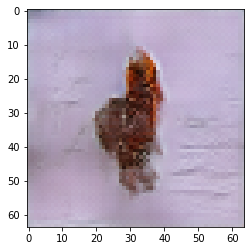

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 13

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.7027101516723633 sec
Gen loss: 2.197016709729245, Disc loss: 2.1214110600320915, Disc valid real loss: 0.35527229936499344, Disc valid fake loss: 0.40509219938202906, Disc class real loss: 0.6809598489811546, Disc class fake loss: 0.16701754574712954
Time for epoch 2 is 0.6978497505187988 sec
Gen loss: 1.9861883991643001, Disc loss: 2.1473454550692908, Disc valid real loss: 0.36102133048208135, Disc valid fake loss: 0.408884839007729, Disc class real loss: 0.6899459330659163, Disc class fake loss: 0.23459935345147787
Time for epoch 3 is 0.6940133571624756 sec
Gen loss: 1.7902228455794484, Disc loss: 2.2143723650982508, Disc valid real loss: 0.38330178825478806, Disc valid fake loss: 0.421321828114359, Disc class real loss: 0.7069697034986395, Disc class fake loss: 0.23848935334306015
Time for epoch 4 is 0.6946887969970703 sec
Gen loss: 1.98047207531

Time for epoch 31 is 0.6947922706604004 sec
Gen loss: 1.7687856649097644, Disc loss: 2.108869891417654, Disc valid real loss: 0.3807661172590758, Disc valid fake loss: 0.38106132494775874, Disc class real loss: 0.6987549725331759, Disc class fake loss: 0.23913803539778056
Time for epoch 32 is 0.6902141571044922 sec
Gen loss: 1.7781178700296503, Disc loss: 2.078497052192688, Disc valid real loss: 0.3891942814776772, Disc valid fake loss: 0.39384732905187103, Disc class real loss: 0.6739268491142675, Disc class fake loss: 0.21148298288646497
Time for epoch 33 is 0.6984734535217285 sec
Gen loss: 1.7747164211775128, Disc loss: 2.121159942526566, Disc valid real loss: 0.3900507312071951, Disc valid fake loss: 0.3853909937958968, Disc class real loss: 0.6993543819377297, Disc class fake loss: 0.24620281159877777
Time for epoch 34 is 0.694143533706665 sec
Gen loss: 1.8339166390268427, Disc loss: 2.070445989307604, Disc valid real loss: 0.3893993638063732, Disc valid fake loss: 0.3755184051237

Time for epoch 62 is 0.7015306949615479 sec
Gen loss: 1.7569731160214073, Disc loss: 2.0455224388524105, Disc valid real loss: 0.41843950591589274, Disc valid fake loss: 0.3950449134174146, Disc class real loss: 0.6608465847216154, Disc class fake loss: 0.2557598187735206
Time for epoch 63 is 0.6963927745819092 sec
Gen loss: 1.8536448604182194, Disc loss: 2.0026911873566475, Disc valid real loss: 0.3774414031129134, Disc valid fake loss: 0.39854698745827927, Disc class real loss: 0.6626161493753132, Disc class fake loss: 0.22453510133843674
Time for epoch 64 is 0.6989178657531738 sec
Gen loss: 1.8033627459877415, Disc loss: 2.058942123463279, Disc valid real loss: 0.4075536751433423, Disc valid fake loss: 0.3957835875059429, Disc class real loss: 0.6776968303479647, Disc class fake loss: 0.2410731276399211
Time for epoch 65 is 0.694002628326416 sec
Gen loss: 1.8114556074142456, Disc loss: 2.0198801442196497, Disc valid real loss: 0.39459868638139023, Disc valid fake loss: 0.39823401601

Time for epoch 93 is 0.6943068504333496 sec
Gen loss: 1.830006806473983, Disc loss: 1.9253841701306795, Disc valid real loss: 0.3835832178592682, Disc valid fake loss: 0.4095253803228077, Disc class real loss: 0.6307376152590701, Disc class fake loss: 0.24264831840991974
Time for epoch 94 is 0.6933817863464355 sec
Gen loss: 1.79092696465944, Disc loss: 2.012806766911557, Disc valid real loss: 0.39473880121582433, Disc valid fake loss: 0.42271653915706436, Disc class real loss: 0.6752425934139051, Disc class fake loss: 0.2142023851996974
Time for epoch 95 is 0.6962244510650635 sec
Gen loss: 1.7871650206415277, Disc loss: 1.9888820773676823, Disc valid real loss: 0.41657008622822006, Disc valid fake loss: 0.39451627354872854, Disc class real loss: 0.6595180003266585, Disc class fake loss: 0.244255352177118
Time for epoch 96 is 0.6957824230194092 sec
Gen loss: 1.816588753148129, Disc loss: 2.0010986579091927, Disc valid real loss: 0.3999199522169013, Disc valid fake loss: 0.42711576819419

Time for epoch 123 is 0.6928157806396484 sec
Gen loss: 1.811499231740048, Disc loss: 1.9270211709173102, Disc valid real loss: 0.40128873994475917, Disc valid fake loss: 0.3875478866853212, Disc class real loss: 0.6715205060808283, Disc class fake loss: 0.20692949310729378
Time for epoch 124 is 0.6975126266479492 sec
Gen loss: 1.9517204259571277, Disc loss: 1.9225819236353825, Disc valid real loss: 0.3812973969861081, Disc valid fake loss: 0.4016804820612857, Disc class real loss: 0.6746668752871061, Disc class fake loss: 0.2028966922509043
Time for epoch 125 is 0.6939024925231934 sec
Gen loss: 1.9842057416313572, Disc loss: 1.9002719992085506, Disc valid real loss: 0.3865480768053155, Disc valid fake loss: 0.38732113806824936, Disc class real loss: 0.6571276344751057, Disc class fake loss: 0.2378860155218526
Time for epoch 126 is 0.6940069198608398 sec
Gen loss: 1.812341338709781, Disc loss: 1.9462510284624601, Disc valid real loss: 0.4420323340516341, Disc valid fake loss: 0.41044186

Time for epoch 153 is 0.7100245952606201 sec
Gen loss: 2.0270578422044454, Disc loss: 1.879614836291263, Disc valid real loss: 0.3960248749507101, Disc valid fake loss: 0.38960036321690206, Disc class real loss: 0.6697933454262582, Disc class fake loss: 0.22242954451786845
Time for epoch 154 is 0.6990323066711426 sec
Gen loss: 1.953786341767562, Disc loss: 1.8515106565073918, Disc valid real loss: 0.3858140063913245, Disc valid fake loss: 0.41757457350429733, Disc class real loss: 0.6377026187746149, Disc class fake loss: 0.2263704052096919
Time for epoch 155 is 0.6893324851989746 sec
Gen loss: 1.9327391009581716, Disc loss: 1.8342120584688688, Disc valid real loss: 0.3900467878893802, Disc valid fake loss: 0.39720406814625386, Disc class real loss: 0.6446150070742557, Disc class fake loss: 0.20898052971614034
Time for epoch 156 is 0.7044188976287842 sec
Gen loss: 1.9013831050772416, Disc loss: 1.8170357440647327, Disc valid real loss: 0.38570866773003026, Disc valid fake loss: 0.37575

Time for epoch 183 is 0.7026576995849609 sec
Gen loss: 1.8610769510269165, Disc loss: 1.8573995514919883, Disc valid real loss: 0.41535621254067673, Disc valid fake loss: 0.40339945491991547, Disc class real loss: 0.6683390862063358, Disc class fake loss: 0.21464502066373825
Time for epoch 184 is 0.6982243061065674 sec
Gen loss: 1.9384632361562628, Disc loss: 1.7802625706321316, Disc valid real loss: 0.3796532757972416, Disc valid fake loss: 0.3786835199908206, Disc class real loss: 0.6691255945908395, Disc class fake loss: 0.19018587430841044
Time for epoch 185 is 0.6998996734619141 sec
Gen loss: 1.9656142310092324, Disc loss: 1.7750377278578908, Disc valid real loss: 0.3718007536310899, Disc valid fake loss: 0.3819605849291149, Disc class real loss: 0.6713665190495943, Disc class fake loss: 0.18736646324396133
Time for epoch 186 is 0.7009139060974121 sec
Gen loss: 1.9215384094338668, Disc loss: 1.779655977299339, Disc valid real loss: 0.3807989217733082, Disc valid fake loss: 0.40633

Time for epoch 213 is 0.6932797431945801 sec
Gen loss: 1.8921081894322445, Disc loss: 1.7597351325185675, Disc valid real loss: 0.39611844483174774, Disc valid fake loss: 0.3885042573276319, Disc class real loss: 0.6735210230475978, Disc class fake loss: 0.18721301069385127
Time for epoch 214 is 0.6932981014251709 sec
Gen loss: 1.8690057804709987, Disc loss: 1.7726378378115202, Disc valid real loss: 0.4162722026046954, Disc valid fake loss: 0.3912153981233898, Disc class real loss: 0.6600819637900904, Disc class fake loss: 0.1981108200393225
Time for epoch 215 is 0.6941087245941162 sec
Gen loss: 1.8589170857479698, Disc loss: 1.780266661393015, Disc valid real loss: 0.3897449468311511, Disc valid fake loss: 0.40975232814487655, Disc class real loss: 0.6725977533742001, Disc class fake loss: 0.20066139964680924
Time for epoch 216 is 0.6951985359191895 sec
Gen loss: 1.8965512765081305, Disc loss: 1.796119351136057, Disc valid real loss: 0.4230147145296398, Disc valid fake loss: 0.4018216

Time for epoch 243 is 0.6953790187835693 sec
Gen loss: 2.0276666691428735, Disc loss: 1.7214792590392263, Disc valid real loss: 0.40911839980828135, Disc valid fake loss: 0.3797662007181268, Disc class real loss: 0.6727549810158578, Disc class fake loss: 0.19973213480491386
Time for epoch 244 is 0.6950027942657471 sec
Gen loss: 1.9032134570573505, Disc loss: 1.7101452727066844, Disc valid real loss: 0.3794236292964534, Disc valid fake loss: 0.40370693959687887, Disc class real loss: 0.6693743059509679, Disc class fake loss: 0.1996001711017207
Time for epoch 245 is 0.7124426364898682 sec
Gen loss: 2.0189938670710514, Disc loss: 1.6912601370560496, Disc valid real loss: 0.4108890545995612, Disc valid fake loss: 0.37883913438571126, Disc class real loss: 0.6691881135890358, Disc class fake loss: 0.1728339324656286
Time for epoch 246 is 0.71065354347229 sec
Gen loss: 1.9920558615734703, Disc loss: 1.6611175850818032, Disc valid real loss: 0.3848034598325428, Disc valid fake loss: 0.3805349

Time for epoch 273 is 0.6971426010131836 sec
Gen loss: 1.978259331301639, Disc loss: 1.6422886095548932, Disc valid real loss: 0.3997741623928672, Disc valid fake loss: 0.3854213929490039, Disc class real loss: 0.6732371700437445, Disc class fake loss: 0.17432088522534622
Time for epoch 274 is 0.6921675205230713 sec
Gen loss: 2.000949583555523, Disc loss: 1.6777407119148655, Disc valid real loss: 0.4105751279153322, Disc valid fake loss: 0.39047569663901077, Disc class real loss: 0.6665735934910021, Disc class fake loss: 0.2029671014139527
Time for epoch 275 is 0.6975550651550293 sec
Gen loss: 1.91663196212367, Disc loss: 1.610200417669196, Disc valid real loss: 0.37833834008166667, Disc valid fake loss: 0.39381582799710724, Disc class real loss: 0.6731915222971063, Disc class fake loss: 0.1587198008047907
Time for epoch 276 is 0.6978158950805664 sec
Gen loss: 1.9445392709029348, Disc loss: 1.6381571732069318, Disc valid real loss: 0.41193819359729167, Disc valid fake loss: 0.400651875

Time for epoch 303 is 0.6970596313476562 sec
Gen loss: 1.9758746812218113, Disc loss: 1.6745161320033826, Disc valid real loss: 0.37707274132653285, Disc valid fake loss: 0.38713317482095017, Disc class real loss: 0.7149187295060409, Disc class fake loss: 0.1954953694029858
Time for epoch 304 is 0.6961431503295898 sec
Gen loss: 1.9815103317561902, Disc loss: 1.6174781008770591, Disc valid real loss: 0.37756771947208206, Disc valid fake loss: 0.38596299447511373, Disc class real loss: 0.6845676051942926, Disc class fake loss: 0.1694827977763979
Time for epoch 305 is 0.7012059688568115 sec
Gen loss: 1.9940449501338757, Disc loss: 1.6383649549986188, Disc valid real loss: 0.3917016928133212, Disc valid fake loss: 0.37789901777317647, Disc class real loss: 0.6768086521249068, Disc class fake loss: 0.19205255963300405
Time for epoch 306 is 0.6988093852996826 sec
Gen loss: 1.9185772506814254, Disc loss: 1.580189403734709, Disc valid real loss: 0.39168399729226766, Disc valid fake loss: 0.383

Time for epoch 333 is 0.6984517574310303 sec
Gen loss: 1.8523800937752974, Disc loss: 1.656392492746052, Disc valid real loss: 0.403482165775801, Disc valid fake loss: 0.42811597177856847, Disc class real loss: 0.6816717574470922, Disc class fake loss: 0.14323029863206962
Time for epoch 334 is 0.6922130584716797 sec
Gen loss: 1.9254757228650545, Disc loss: 1.7271036097877903, Disc valid real loss: 0.4190288970344945, Disc valid fake loss: 0.42067506046671616, Disc class real loss: 0.6887648293846532, Disc class fake loss: 0.19873282313346863
Time for epoch 335 is 0.6964902877807617 sec
Gen loss: 1.9891796174802279, Disc loss: 1.6112738471282155, Disc valid real loss: 0.3936391504187333, Disc valid fake loss: 0.3745970239764766, Disc class real loss: 0.6810477062275535, Disc class fake loss: 0.16209375701452555
Time for epoch 336 is 0.6956374645233154 sec
Gen loss: 1.9531019675104242, Disc loss: 1.6647674347224988, Disc valid real loss: 0.3816957222787957, Disc valid fake loss: 0.394590

Time for epoch 363 is 0.6997778415679932 sec
Gen loss: 1.9660762046512805, Disc loss: 1.6449528744346218, Disc valid real loss: 0.3933499973071249, Disc valid fake loss: 0.40083960326094376, Disc class real loss: 0.681175737004531, Disc class fake loss: 0.16968984196060583
Time for epoch 364 is 0.6933259963989258 sec
Gen loss: 1.908927321434021, Disc loss: 1.5841906949093467, Disc valid real loss: 0.37151906364842463, Disc valid fake loss: 0.3999719494267514, Disc class real loss: 0.663063551250257, Disc class fake loss: 0.1497388121328856
Time for epoch 365 is 0.6921262741088867 sec
Gen loss: 1.919850518828944, Disc loss: 1.6369506183423495, Disc valid real loss: 0.40675998047778483, Disc valid fake loss: 0.38894670887997274, Disc class real loss: 0.6604374333431846, Disc class fake loss: 0.18090243480707469
Time for epoch 366 is 0.6965575218200684 sec
Gen loss: 1.952727248794154, Disc loss: 1.6443792393333034, Disc valid real loss: 0.40815314807389913, Disc valid fake loss: 0.3973721

Time for epoch 393 is 0.699927806854248 sec
Gen loss: 1.9418318836312545, Disc loss: 1.5982196142798977, Disc valid real loss: 0.3936763201889239, Disc valid fake loss: 0.38115704530163813, Disc class real loss: 0.666388634004091, Disc class fake loss: 0.15709949755354932
Time for epoch 394 is 0.7001166343688965 sec
Gen loss: 1.9603623716454757, Disc loss: 1.5367951957803023, Disc valid real loss: 0.36062702850291606, Disc valid fake loss: 0.3842596599930211, Disc class real loss: 0.6558217123935097, Disc class fake loss: 0.13619072284353406
Time for epoch 395 is 0.6971545219421387 sec
Gen loss: 1.9781243863858675, Disc loss: 1.6487528462159007, Disc valid real loss: 0.37853008979245234, Disc valid fake loss: 0.3808510460351643, Disc class real loss: 0.708076536655426, Disc class fake loss: 0.18140053082453578
Time for epoch 396 is 0.6938462257385254 sec
Gen loss: 1.9052065359918695, Disc loss: 1.6052976407502826, Disc valid real loss: 0.3889359784753699, Disc valid fake loss: 0.410495

Time for epoch 423 is 0.6963913440704346 sec
Gen loss: 1.9754003286361694, Disc loss: 1.6846521026209782, Disc valid real loss: 0.40143366550144394, Disc valid fake loss: 0.40607193896644994, Disc class real loss: 0.7164601495391444, Disc class fake loss: 0.16079749715955635
Time for epoch 424 is 0.6929280757904053 sec
Gen loss: 1.9239830092379921, Disc loss: 1.6408686826103611, Disc valid real loss: 0.40821908492791026, Disc valid fake loss: 0.392030373999947, Disc class real loss: 0.6958813824151692, Disc class fake loss: 0.1448480620195991
Time for epoch 425 is 0.6974790096282959 sec
Gen loss: 2.104881763458252, Disc loss: 1.559889843589381, Disc valid real loss: 0.37608423985933004, Disc valid fake loss: 0.3840151750727704, Disc class real loss: 0.653430019554339, Disc class fake loss: 0.14646183385660774
Time for epoch 426 is 0.6957552433013916 sec
Gen loss: 1.920680322145161, Disc loss: 1.6161827162692421, Disc valid real loss: 0.3632621890620181, Disc valid fake loss: 0.40116158

Time for epoch 453 is 0.696601390838623 sec
Gen loss: 2.029241580712168, Disc loss: 1.649152253803454, Disc valid real loss: 0.39333122341256394, Disc valid fake loss: 0.3901508262282924, Disc class real loss: 0.6807504515898856, Disc class fake loss: 0.18501891509482735
Time for epoch 454 is 0.6974899768829346 sec
Gen loss: 1.970645402607165, Disc loss: 1.6358128723345304, Disc valid real loss: 0.3894198536872864, Disc valid fake loss: 0.40475757969053167, Disc class real loss: 0.6719013389788175, Disc class fake loss: 0.16983453968637868
Time for epoch 455 is 0.6966350078582764 sec
Gen loss: 1.9957889381207918, Disc loss: 1.6221242954856472, Disc valid real loss: 0.39785017778998927, Disc valid fake loss: 0.3881952919458088, Disc class real loss: 0.6720233308641534, Disc class fake loss: 0.16415710355106153
Time for epoch 456 is 0.6928884983062744 sec
Gen loss: 1.9328047225349827, Disc loss: 1.6356905134100663, Disc valid real loss: 0.40097687746349137, Disc valid fake loss: 0.388420

Time for epoch 483 is 0.6978106498718262 sec
Gen loss: 1.9864108123277362, Disc loss: 1.6290506375463385, Disc valid real loss: 0.38647638967162684, Disc valid fake loss: 0.3985625552503686, Disc class real loss: 0.6734977207685772, Disc class fake loss: 0.17061457900624527
Time for epoch 484 is 0.6953301429748535 sec
Gen loss: 1.9804506552846808, Disc loss: 1.654058155260588, Disc valid real loss: 0.3904390774275127, Disc valid fake loss: 0.3751357354615864, Disc class real loss: 0.6866649138300043, Disc class fake loss: 0.20191537079058194
Time for epoch 485 is 0.6992123126983643 sec
Gen loss: 1.8849081491169177, Disc loss: 1.632238463351601, Disc valid real loss: 0.38695933316883285, Disc valid fake loss: 0.41527728030556127, Disc class real loss: 0.6727188888349032, Disc class fake loss: 0.15738603707991147
Time for epoch 486 is 0.6989564895629883 sec
Gen loss: 1.9468112368332713, Disc loss: 1.5718210433658801, Disc valid real loss: 0.3784888739648618, Disc valid fake loss: 0.40977

Time for epoch 513 is 0.6917223930358887 sec
Gen loss: 1.9510318229072972, Disc loss: 1.645213202426308, Disc valid real loss: 0.4125753296049018, Disc valid fake loss: 0.3677876858334792, Disc class real loss: 0.690695019144761, Disc class fake loss: 0.1742584924948843
Time for epoch 514 is 0.6972577571868896 sec
Gen loss: 2.026354752088848, Disc loss: 1.5993840757169222, Disc valid real loss: 0.37471645443063034, Disc valid fake loss: 0.3921586306471574, Disc class real loss: 0.6575546264648438, Disc class fake loss: 0.17505087742679998
Time for epoch 515 is 0.6997432708740234 sec
Gen loss: 2.0362235119468286, Disc loss: 1.636710053996036, Disc valid real loss: 0.38748093733662053, Disc valid fake loss: 0.37769767720448344, Disc class real loss: 0.6846087418104473, Disc class fake loss: 0.18702226132154465
Time for epoch 516 is 0.6956846714019775 sec
Gen loss: 1.9207544577749152, Disc loss: 1.663432378517954, Disc valid real loss: 0.40322649635766683, Disc valid fake loss: 0.41084451

Time for epoch 543 is 0.6987583637237549 sec
Gen loss: 1.9619467007486444, Disc loss: 1.6295967603984631, Disc valid real loss: 0.3833602823709187, Disc valid fake loss: 0.39304695160765396, Disc class real loss: 0.6906960136012027, Disc class fake loss: 0.16259915165995298
Time for epoch 544 is 0.6953303813934326 sec
Gen loss: 1.9395259681500887, Disc loss: 1.584333438622324, Disc valid real loss: 0.3816374963835666, Disc valid fake loss: 0.3933380983377758, Disc class real loss: 0.6584651078048506, Disc class fake loss: 0.15099426006015979
Time for epoch 545 is 0.6950395107269287 sec
Gen loss: 1.9295569783762883, Disc loss: 1.6298806792811344, Disc valid real loss: 0.3935647465680775, Disc valid fake loss: 0.4020209281068099, Disc class real loss: 0.6715742945671082, Disc class fake loss: 0.16282247124533905
Time for epoch 546 is 0.6978387832641602 sec
Gen loss: 1.9997114821484214, Disc loss: 1.645605532746566, Disc valid real loss: 0.4127798739232515, Disc valid fake loss: 0.4053670

Time for epoch 573 is 0.6994268894195557 sec
Gen loss: 1.9584469105068005, Disc loss: 1.6267588264063786, Disc valid real loss: 0.4031739564318406, Disc valid fake loss: 0.3860070360334296, Disc class real loss: 0.6885120398119876, Disc class fake loss: 0.14917366049791636
Time for epoch 574 is 0.7000412940979004 sec
Gen loss: 2.002016494148656, Disc loss: 1.5866228781248395, Disc valid real loss: 0.399522508445539, Disc valid fake loss: 0.3774387538433075, Disc class real loss: 0.6850886752730921, Disc class fake loss: 0.12468501886254862
Time for epoch 575 is 0.6971547603607178 sec
Gen loss: 1.8778268538023297, Disc loss: 1.625940391891881, Disc valid real loss: 0.39621626075945404, Disc valid fake loss: 0.4134521766712791, Disc class real loss: 0.6691693161663256, Disc class fake loss: 0.14720705308412252
Time for epoch 576 is 0.6974928379058838 sec
Gen loss: 1.9012888544484188, Disc loss: 1.6360939176459062, Disc valid real loss: 0.38646426012641505, Disc valid fake loss: 0.3904266

Time for epoch 603 is 0.6971948146820068 sec
Gen loss: 1.9320325788698698, Disc loss: 1.574708053940221, Disc valid real loss: 0.3936805317276402, Disc valid fake loss: 0.3870606594964078, Disc class real loss: 0.6596213736032185, Disc class fake loss: 0.13445056935674266
Time for epoch 604 is 0.6959986686706543 sec
Gen loss: 1.9546796585384167, Disc loss: 1.636586634736312, Disc valid real loss: 0.382184110189739, Disc valid fake loss: 0.41820121752588374, Disc class real loss: 0.6911359303875974, Disc class fake loss: 0.14517455430407272
Time for epoch 605 is 0.6978390216827393 sec
Gen loss: 1.965224071552879, Disc loss: 1.604476759308263, Disc valid real loss: 0.3861358557876788, Disc valid fake loss: 0.38413324324708237, Disc class real loss: 0.6783833378239682, Disc class fake loss: 0.1559288368413323
Time for epoch 606 is 0.7005343437194824 sec
Gen loss: 1.9643604943626805, Disc loss: 1.618537846364473, Disc valid real loss: 0.3931427543100558, Disc valid fake loss: 0.38383986291

Time for epoch 633 is 0.6956558227539062 sec
Gen loss: 1.8592248778594167, Disc loss: 1.6691980236455013, Disc valid real loss: 0.39614537201429667, Disc valid fake loss: 0.4027769863605499, Disc class real loss: 0.6857982371982775, Disc class fake loss: 0.18457773523895363
Time for epoch 634 is 0.6967339515686035 sec
Gen loss: 1.9429893493652344, Disc loss: 1.6432533640610545, Disc valid real loss: 0.3801923300090589, Disc valid fake loss: 0.4001156326971556, Disc class real loss: 0.7047901843723497, Disc class fake loss: 0.1582645358223664
Time for epoch 635 is 0.6972332000732422 sec
Gen loss: 1.938108582245676, Disc loss: 1.6349024458935386, Disc valid real loss: 0.40301427088285746, Disc valid fake loss: 0.4085323214530945, Disc class real loss: 0.6774667438707853, Disc class fake loss: 0.1459954310404627
Time for epoch 636 is 0.696420431137085 sec
Gen loss: 1.9277064800262451, Disc loss: 1.6379660305223966, Disc valid real loss: 0.39222338795661926, Disc valid fake loss: 0.4081212

Time for epoch 663 is 0.6949148178100586 sec
Gen loss: 1.883756116816872, Disc loss: 1.6208058972107737, Disc valid real loss: 0.3734835480388842, Disc valid fake loss: 0.4109603464603424, Disc class real loss: 0.6774716440000033, Disc class fake loss: 0.15899405059845825
Time for epoch 664 is 0.7014298439025879 sec
Gen loss: 1.988034110320242, Disc loss: 1.617236720888238, Disc valid real loss: 0.39073363887636287, Disc valid fake loss: 0.3932277058300219, Disc class real loss: 0.6732126443009627, Disc class fake loss: 0.16016535147240288
Time for epoch 665 is 0.6996653079986572 sec
Gen loss: 1.9560418317192478, Disc loss: 1.6103385122198808, Disc valid real loss: 0.3911485624940772, Disc valid fake loss: 0.39766422227809306, Disc class real loss: 0.672544400942953, Disc class fake loss: 0.14908602833747864
Time for epoch 666 is 0.6927943229675293 sec
Gen loss: 1.9433863288477848, Disc loss: 1.635225484245702, Disc valid real loss: 0.38089271674030706, Disc valid fake loss: 0.42239914

Time for epoch 693 is 0.7036340236663818 sec
Gen loss: 1.9686954899838096, Disc loss: 1.6458536700198525, Disc valid real loss: 0.4018281117865914, Disc valid fake loss: 0.3936084979458859, Disc class real loss: 0.6930785743813765, Disc class fake loss: 0.15744564446963763
Time for epoch 694 is 0.7007086277008057 sec
Gen loss: 1.839579099103024, Disc loss: 1.6049841956088418, Disc valid real loss: 0.384023390318218, Disc valid fake loss: 0.39601477353196396, Disc class real loss: 0.6805550769755715, Disc class fake loss: 0.1444981925581631
Time for epoch 695 is 0.70273756980896 sec
Gen loss: 1.9186837171253406, Disc loss: 1.6532136829275834, Disc valid real loss: 0.3895312265345925, Disc valid fake loss: 0.38971839296190364, Disc class real loss: 0.7051050819848713, Disc class fake loss: 0.16896619020324005
Time for epoch 696 is 0.7021708488464355 sec
Gen loss: 1.971174114628842, Disc loss: 1.5521943945633738, Disc valid real loss: 0.38357724955207423, Disc valid fake loss: 0.377396585

Time for epoch 723 is 0.6979339122772217 sec
Gen loss: 2.02835802655471, Disc loss: 1.5744574007235075, Disc valid real loss: 0.3808748408367759, Disc valid fake loss: 0.3753100696362947, Disc class real loss: 0.6509694362941542, Disc class fake loss: 0.16739976190422712
Time for epoch 724 is 0.6977388858795166 sec
Gen loss: 1.974589140791642, Disc loss: 1.5926056849329095, Disc valid real loss: 0.39168167741675125, Disc valid fake loss: 0.39203303738644246, Disc class real loss: 0.6760254408183851, Disc class fake loss: 0.1329741711287122
Time for epoch 725 is 0.6946344375610352 sec
Gen loss: 1.901502339463485, Disc loss: 1.6628609456514056, Disc valid real loss: 0.4220651764618723, Disc valid fake loss: 0.39967059618548345, Disc class real loss: 0.6800355158354107, Disc class fake loss: 0.16119348375420822
Time for epoch 726 is 0.6989467144012451 sec
Gen loss: 2.0155120523352372, Disc loss: 1.5891992669356496, Disc valid real loss: 0.36991486423893977, Disc valid fake loss: 0.3942513

Time for epoch 753 is 0.6985070705413818 sec
Gen loss: 1.9908790462895443, Disc loss: 1.5703558796330501, Disc valid real loss: 0.3971782154158542, Disc valid fake loss: 0.38611599332407903, Disc class real loss: 0.649809363641237, Disc class fake loss: 0.13735480881051013
Time for epoch 754 is 0.6954560279846191 sec
Gen loss: 2.019122575458727, Disc loss: 1.6128857951415212, Disc valid real loss: 0.3895275412421477, Disc valid fake loss: 0.38228469538061244, Disc class real loss: 0.6900314500457362, Disc class fake loss: 0.15114989680679222
Time for epoch 755 is 0.6874942779541016 sec
Gen loss: 1.9688433471478914, Disc loss: 1.5754801725086414, Disc valid real loss: 0.3709830343723297, Disc valid fake loss: 0.3923396891669223, Disc class real loss: 0.6884276584575051, Disc class fake loss: 0.12384273954912235
Time for epoch 756 is 0.6954436302185059 sec
Gen loss: 1.9293596493570428, Disc loss: 1.6070480472163151, Disc valid real loss: 0.4007227091412795, Disc valid fake loss: 0.388735

Time for epoch 783 is 0.7013309001922607 sec
Gen loss: 1.9246460513064736, Disc loss: 1.6193280721965588, Disc valid real loss: 0.38132156823810776, Disc valid fake loss: 0.4002420792454167, Disc class real loss: 0.6917827976377386, Disc class fake loss: 0.14609079376647346
Time for epoch 784 is 0.6981291770935059 sec
Gen loss: 1.8891655708614148, Disc loss: 1.623434349110252, Disc valid real loss: 0.3993852797307466, Disc valid fake loss: 0.3943867361859271, Disc class real loss: 0.6681857014957228, Disc class fake loss: 0.16157798782775276
Time for epoch 785 is 0.6959719657897949 sec
Gen loss: 2.020189642906189, Disc loss: 1.6348902802718313, Disc valid real loss: 0.38474160903378535, Disc valid fake loss: 0.3821701783882944, Disc class real loss: 0.7082493681656686, Disc class fake loss: 0.1598388207586188
Time for epoch 786 is 0.6951584815979004 sec
Gen loss: 1.9354888639952008, Disc loss: 1.6133372595435695, Disc valid real loss: 0.3740714223761308, Disc valid fake loss: 0.3758444

Time for epoch 813 is 0.6971511840820312 sec
Gen loss: 1.9128650615089817, Disc loss: 1.6085042639782554, Disc valid real loss: 0.3947201410406514, Disc valid fake loss: 0.3928804570122769, Disc class real loss: 0.6858580833987186, Disc class fake loss: 0.13515573975286985
Time for epoch 814 is 0.6983551979064941 sec
Gen loss: 1.9031813019200374, Disc loss: 1.664586023280495, Disc valid real loss: 0.3954461765916724, Disc valid fake loss: 0.42136811582665695, Disc class real loss: 0.7090515274750558, Disc class fake loss: 0.1388342556984801
Time for epoch 815 is 0.6944828033447266 sec
Gen loss: 1.8931924669366134, Disc loss: 1.7048548899198834, Disc valid real loss: 0.4242700855982931, Disc valid fake loss: 0.41106194571444865, Disc class real loss: 0.7062763571739197, Disc class fake loss: 0.16335509501789747
Time for epoch 816 is 0.6977360248565674 sec
Gen loss: 1.8516029809650623, Disc loss: 1.6710311048909237, Disc valid real loss: 0.39555212776911886, Disc valid fake loss: 0.39486

Time for epoch 843 is 0.6968090534210205 sec
Gen loss: 2.020567404596429, Disc loss: 1.6453065872192383, Disc valid real loss: 0.4120763101075825, Disc valid fake loss: 0.3842741580385911, Disc class real loss: 0.6769239243708158, Disc class fake loss: 0.1721331586963252
Time for epoch 844 is 0.7113938331604004 sec
Gen loss: 1.9351288456665843, Disc loss: 1.640161583298131, Disc valid real loss: 0.3901849467503397, Disc valid fake loss: 0.40644672042445135, Disc class real loss: 0.6905757000571803, Disc class fake loss: 0.15306173813970467
Time for epoch 845 is 0.6954073905944824 sec
Gen loss: 1.9151831614343744, Disc loss: 1.6736943659029508, Disc valid real loss: 0.3975175556383635, Disc valid fake loss: 0.39502567366549846, Disc class real loss: 0.7207228321778146, Disc class fake loss: 0.16054035017364904
Time for epoch 846 is 0.6965243816375732 sec
Gen loss: 1.951957338734677, Disc loss: 1.6300707490820634, Disc valid real loss: 0.3791712600933878, Disc valid fake loss: 0.40658917

Time for epoch 873 is 0.6930863857269287 sec
Gen loss: 1.9112062077773244, Disc loss: 1.6243211470152203, Disc valid real loss: 0.39781048423365545, Disc valid fake loss: 0.403541320248654, Disc class real loss: 0.6523205920269615, Disc class fake loss: 0.17074508396418472
Time for epoch 874 is 0.689946174621582 sec
Gen loss: 1.9088291243502968, Disc loss: 1.600647531057659, Disc valid real loss: 0.36873371193283483, Disc valid fake loss: 0.3878146253134075, Disc class real loss: 0.693965450713509, Disc class fake loss: 0.15024252059428314
Time for epoch 875 is 0.6963860988616943 sec
Gen loss: 1.936730610696893, Disc loss: 1.6130016979418302, Disc valid real loss: 0.3761158397323207, Disc valid fake loss: 0.4204294603121908, Disc class real loss: 0.6735773745336031, Disc class fake loss: 0.14298516315849205
Time for epoch 876 is 0.6977641582489014 sec
Gen loss: 2.0867351419047306, Disc loss: 1.6108583713832654, Disc valid real loss: 0.3772338644454354, Disc valid fake loss: 0.371316221

Time for epoch 904 is 0.6998698711395264 sec
Gen loss: 2.0700860462690653, Disc loss: 1.5874034793753373, Disc valid real loss: 0.4011272160630477, Disc valid fake loss: 0.38015819850720856, Disc class real loss: 0.6741949429637507, Disc class fake loss: 0.13203157131609164
Time for epoch 905 is 0.6937484741210938 sec
Gen loss: 1.9377782156592922, Disc loss: 1.5849082783648842, Disc valid real loss: 0.38710821145459223, Disc valid fake loss: 0.3924794400993146, Disc class real loss: 0.6563613289280942, Disc class fake loss: 0.14906074616469836
Time for epoch 906 is 0.6911535263061523 sec
Gen loss: 1.959630470526846, Disc loss: 1.6353159452739514, Disc valid real loss: 0.39667551925307826, Disc valid fake loss: 0.41313737630844116, Disc class real loss: 0.6754888735319439, Disc class fake loss: 0.15011922073991676
Time for epoch 907 is 0.6951620578765869 sec
Gen loss: 1.9442657295026278, Disc loss: 1.6157117893821316, Disc valid real loss: 0.4032794315564005, Disc valid fake loss: 0.383

Time for epoch 934 is 0.6912362575531006 sec
Gen loss: 1.9390890347330194, Disc loss: 1.5884787597154315, Disc valid real loss: 0.3999192024532117, Disc valid fake loss: 0.36275232857779455, Disc class real loss: 0.6783559636065835, Disc class fake loss: 0.14755743624348389
Time for epoch 935 is 0.6972494125366211 sec
Gen loss: 1.9123938711065995, Disc loss: 1.6598006110442312, Disc valid real loss: 0.40544086224154424, Disc valid fake loss: 0.3943823685771541, Disc class real loss: 0.6922732309291237, Disc class fake loss: 0.1678090687645109
Time for epoch 936 is 0.6976721286773682 sec
Gen loss: 1.8600060186888043, Disc loss: 1.623946465943989, Disc valid real loss: 0.4111397407556835, Disc valid fake loss: 0.39266786292979594, Disc class real loss: 0.6602216739403574, Disc class fake loss: 0.16001724569421066
Time for epoch 937 is 0.6971044540405273 sec
Gen loss: 2.025637563906218, Disc loss: 1.6169219393479197, Disc valid real loss: 0.401124717373597, Disc valid fake loss: 0.3719715

Time for epoch 964 is 0.6994495391845703 sec
Gen loss: 1.9938435115312274, Disc loss: 1.6137420190008063, Disc valid real loss: 0.3822555628262068, Disc valid fake loss: 0.3854275941848755, Disc class real loss: 0.7002872009026376, Disc class fake loss: 0.14588255199946856
Time for epoch 965 is 0.6991662979125977 sec
Gen loss: 1.966932961815282, Disc loss: 1.6220922407351042, Disc valid real loss: 0.39114942519288315, Disc valid fake loss: 0.3827449004901083, Disc class real loss: 0.6859787420222634, Disc class fake loss: 0.16232390897838692
Time for epoch 966 is 0.698326587677002 sec
Gen loss: 2.0400090405815527, Disc loss: 1.6098139035074335, Disc valid real loss: 0.35815335888611644, Disc valid fake loss: 0.39899496185152156, Disc class real loss: 0.7061234681229842, Disc class fake loss: 0.14665401726961136
Time for epoch 967 is 0.6963529586791992 sec
Gen loss: 1.9039353320473118, Disc loss: 1.6121596035204435, Disc valid real loss: 0.36926165693684626, Disc valid fake loss: 0.4058

Time for epoch 994 is 0.6989333629608154 sec
Gen loss: 1.9034344020642733, Disc loss: 1.6238395226629156, Disc valid real loss: 0.37782309400407893, Disc valid fake loss: 0.4027776263262096, Disc class real loss: 0.6792931964522914, Disc class fake loss: 0.16404868034940018
Time for epoch 995 is 0.6979959011077881 sec
Gen loss: 1.9316122343665676, Disc loss: 1.5871329182072689, Disc valid real loss: 0.37789024647913483, Disc valid fake loss: 0.3733855862366526, Disc class real loss: 0.6837829508279499, Disc class fake loss: 0.15218049013300947
Time for epoch 996 is 0.6962521076202393 sec
Gen loss: 2.0026180054012097, Disc loss: 1.5941720134333561, Disc valid real loss: 0.38207618343202693, Disc valid fake loss: 0.383224628473583, Disc class real loss: 0.680496495021017, Disc class fake loss: 0.1484811031504681
Time for epoch 997 is 0.6977698802947998 sec
Gen loss: 1.9531108768362748, Disc loss: 1.5880551463679264, Disc valid real loss: 0.3812542040097086, Disc valid fake loss: 0.403881

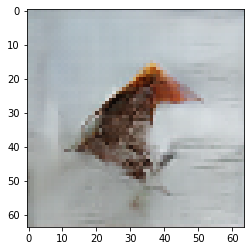

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 14

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.694622278213501 sec
Gen loss: 1.98217216918343, Disc loss: 2.0618353140981576, Disc valid real loss: 0.368925331454528, Disc valid fake loss: 0.3736812190005654, Disc class real loss: 0.6600307132068434, Disc class fake loss: 0.17013332914364965
Time for epoch 2 is 0.7005941867828369 sec
Gen loss: 1.936581159892835, Disc loss: 2.2105025931408533, Disc valid real loss: 0.3939859820039649, Disc valid fake loss: 0.3751977133123498, Disc class real loss: 0.7221578045895225, Disc class fake loss: 0.15398665086219185
Time for epoch 3 is 0.696857213973999 sec
Gen loss: 1.8965870706658614, Disc loss: 2.1299452217001664, Disc valid real loss: 0.4061344485533865, Disc valid fake loss: 0.3842084548975292, Disc class real loss: 0.6719418638630917, Disc class fake loss: 0.19032386611951024
Time for epoch 4 is 0.6964988708496094 sec
Gen loss: 1.8624181057277478, 

Time for epoch 31 is 0.6914715766906738 sec
Gen loss: 1.8651979283282631, Disc loss: 2.0588177756259314, Disc valid real loss: 0.3797574513836911, Disc valid fake loss: 0.37754433092318085, Disc class real loss: 0.676010903559233, Disc class fake loss: 0.21555336055002713
Time for epoch 32 is 0.6974837779998779 sec
Gen loss: 1.8254575101952804, Disc loss: 2.067722477410969, Disc valid real loss: 0.3955660336895993, Disc valid fake loss: 0.3951803069365652, Disc class real loss: 0.6632856412937767, Disc class fake loss: 0.22508186258767782
Time for epoch 33 is 0.6935300827026367 sec
Gen loss: 1.8196004440909939, Disc loss: 2.065129938878511, Disc valid real loss: 0.4025277526755082, Disc valid fake loss: 0.39960041955897685, Disc class real loss: 0.6572280965353313, Disc class fake loss: 0.21727629398044787
Time for epoch 34 is 0.6947166919708252 sec
Gen loss: 1.8664691510953402, Disc loss: 2.064769242939196, Disc valid real loss: 0.38301120855306325, Disc valid fake loss: 0.39481812715

Time for epoch 62 is 0.6970605850219727 sec
Gen loss: 1.9179345306597257, Disc loss: 1.9954123246042352, Disc valid real loss: 0.37604903390533045, Disc valid fake loss: 0.39425398801502426, Disc class real loss: 0.660985014940563, Disc class fake loss: 0.22353982533279218
Time for epoch 63 is 0.6975297927856445 sec
Gen loss: 1.8298410992873342, Disc loss: 2.005110000309191, Disc valid real loss: 0.4059223477777682, Disc valid fake loss: 0.3844533515603919, Disc class real loss: 0.6545729197953877, Disc class fake loss: 0.23475896214184008
Time for epoch 64 is 0.6958789825439453 sec
Gen loss: 1.734086093149687, Disc loss: 2.0253299725683114, Disc valid real loss: 0.4029219793645959, Disc valid fake loss: 0.3974867714078803, Disc class real loss: 0.6604473245771307, Disc class fake loss: 0.24062123267274155
Time for epoch 65 is 0.6921241283416748 sec
Gen loss: 1.8946913229791742, Disc loss: 1.967078541454516, Disc valid real loss: 0.38159840357931035, Disc valid fake loss: 0.38013824898

Time for epoch 93 is 0.6990954875946045 sec
Gen loss: 1.811656625647294, Disc loss: 1.9703220819172107, Disc valid real loss: 0.41571358473677383, Disc valid fake loss: 0.40096218335001094, Disc class real loss: 0.6470559929546557, Disc class fake loss: 0.22503092336027244
Time for epoch 94 is 0.6972975730895996 sec
Gen loss: 1.963711468796981, Disc loss: 1.923160383575841, Disc valid real loss: 0.3924015007520977, Disc valid fake loss: 0.38682354280823156, Disc class real loss: 0.6407098079982557, Disc class fake loss: 0.23216642360938222
Time for epoch 95 is 0.6972198486328125 sec
Gen loss: 1.8646033249403302, Disc loss: 1.9473855683678074, Disc valid real loss: 0.3962603148661162, Disc valid fake loss: 0.40092286781260844, Disc class real loss: 0.6478508961828131, Disc class fake loss: 0.22007426658743307
Time for epoch 96 is 0.6973488330841064 sec
Gen loss: 1.8887931171216463, Disc loss: 1.9666407610240735, Disc valid real loss: 0.40578444380509227, Disc valid fake loss: 0.39908921

Time for epoch 123 is 0.6975877285003662 sec
Gen loss: 1.7469291624269987, Disc loss: 1.9184442821301912, Disc valid real loss: 0.3970414713809365, Disc valid fake loss: 0.42075548360222265, Disc class real loss: 0.6476883480423375, Disc class fake loss: 0.20597129354351446
Time for epoch 124 is 0.6980993747711182 sec
Gen loss: 1.8742960691452026, Disc loss: 1.95390406407808, Disc valid real loss: 0.39097776695301656, Disc valid fake loss: 0.41904006819976003, Disc class real loss: 0.6682557902838054, Disc class fake loss: 0.23484313566433757
Time for epoch 125 is 0.6962599754333496 sec
Gen loss: 1.8724520269193148, Disc loss: 1.8707263093245656, Disc valid real loss: 0.36695365999874313, Disc valid fake loss: 0.39032575644944845, Disc class real loss: 0.6551980156647531, Disc class fake loss: 0.21562107221076363
Time for epoch 126 is 0.6978857517242432 sec
Gen loss: 1.9961769769066258, Disc loss: 1.919656797459251, Disc valid real loss: 0.38224324584007263, Disc valid fake loss: 0.388

Time for epoch 153 is 0.6977691650390625 sec
Gen loss: 1.9285373625002409, Disc loss: 1.856867282014144, Disc valid real loss: 0.38147567839998947, Disc valid fake loss: 0.3916707478071514, Disc class real loss: 0.6582414162786383, Disc class fake loss: 0.2341553741379788
Time for epoch 154 is 0.6956393718719482 sec
Gen loss: 1.8585916255649768, Disc loss: 1.828383019095973, Disc valid real loss: 0.39269704881467316, Disc valid fake loss: 0.3791530540114955, Disc class real loss: 0.6566162799534044, Disc class fake loss: 0.1919698064264498
Time for epoch 155 is 0.6929216384887695 sec
Gen loss: 1.9298509610326666, Disc loss: 1.8901874015205784, Disc valid real loss: 0.3983716054966575, Disc valid fake loss: 0.39296120875760127, Disc class real loss: 0.6626672054591932, Disc class fake loss: 0.2553447877105914
Time for epoch 156 is 0.6945314407348633 sec
Gen loss: 1.9826017116245471, Disc loss: 1.864612064863506, Disc valid real loss: 0.3931610937181272, Disc valid fake loss: 0.413489758

Time for epoch 183 is 0.6994848251342773 sec
Gen loss: 1.9638573935157375, Disc loss: 1.8306649923324585, Disc valid real loss: 0.3966528788993233, Disc valid fake loss: 0.4042738738812898, Disc class real loss: 0.6663717533412733, Disc class fake loss: 0.20510185745201612
Time for epoch 184 is 0.6992223262786865 sec
Gen loss: 1.9149036031020314, Disc loss: 1.7630497719112195, Disc valid real loss: 0.377401075865093, Disc valid fake loss: 0.3933614492416382, Disc class real loss: 0.6398065654855025, Disc class fake loss: 0.20477293353331716
Time for epoch 185 is 0.7084159851074219 sec
Gen loss: 1.908105404753434, Disc loss: 1.7585602183091014, Disc valid real loss: 0.3889236246284686, Disc valid fake loss: 0.3768009872812974, Disc class real loss: 0.6594690115828263, Disc class fake loss: 0.1685020229534099
Time for epoch 186 is 0.6959145069122314 sec
Gen loss: 1.95628727737226, Disc loss: 1.7834578501550775, Disc valid real loss: 0.3902066851917066, Disc valid fake loss: 0.38162619032

Time for epoch 213 is 0.6966023445129395 sec
Gen loss: 1.8890667212636847, Disc loss: 1.761502284752695, Disc valid real loss: 0.3877305215910861, Disc valid fake loss: 0.41922685503959656, Disc class real loss: 0.6613131510583978, Disc class fake loss: 0.1800988116546681
Time for epoch 214 is 0.6967713832855225 sec
Gen loss: 1.8979934077513845, Disc loss: 1.7467369468588578, Disc valid real loss: 0.4024910126861773, Disc valid fake loss: 0.38254417243756744, Disc class real loss: 0.6590703004284909, Disc class fake loss: 0.19520520379668788
Time for epoch 215 is 0.69370436668396 sec
Gen loss: 1.9318594430622302, Disc loss: 1.710934601332012, Disc valid real loss: 0.3838754625696885, Disc valid fake loss: 0.3846562269486879, Disc class real loss: 0.649618901704487, Disc class fake loss: 0.1874702933587526
Time for epoch 216 is 0.6969857215881348 sec
Gen loss: 2.008901734101145, Disc loss: 1.7970596363669948, Disc valid real loss: 0.40400690624588415, Disc valid fake loss: 0.38830624599

Time for epoch 243 is 0.6948025226593018 sec
Gen loss: 1.9364924430847168, Disc loss: 1.7085546255111694, Disc valid real loss: 0.38741033955624227, Disc valid fake loss: 0.3967450355228625, Disc class real loss: 0.6413511445647792, Disc class fake loss: 0.23085020717821622
Time for epoch 244 is 0.6992619037628174 sec
Gen loss: 2.0797343756023206, Disc loss: 1.7645485840345685, Disc valid real loss: 0.38532762935287074, Disc valid fake loss: 0.3912314396155508, Disc class real loss: 0.6800891725640548, Disc class fake loss: 0.25548330498369115
Time for epoch 245 is 0.696253776550293 sec
Gen loss: 2.186483383178711, Disc loss: 1.74752204041732, Disc valid real loss: 0.3963761329650879, Disc valid fake loss: 0.3947320172661229, Disc class real loss: 0.6659923854627108, Disc class fake loss: 0.23927877843379974
Time for epoch 246 is 0.6952981948852539 sec
Gen loss: 2.2983623554832056, Disc loss: 1.6880694376794916, Disc valid real loss: 0.392185744486357, Disc valid fake loss: 0.401253375

Time for epoch 273 is 0.6971690654754639 sec
Gen loss: 1.910017960949948, Disc loss: 1.6523254733336599, Disc valid real loss: 0.38877799322730616, Disc valid fake loss: 0.4041695343820672, Disc class real loss: 0.6777388924046567, Disc class fake loss: 0.17200760778627897
Time for epoch 274 is 0.6954336166381836 sec
Gen loss: 2.0142907970830013, Disc loss: 1.5921741096596969, Disc valid real loss: 0.3746299218190344, Disc valid fake loss: 0.3931800174085717, Disc class real loss: 0.6518293807381078, Disc class fake loss: 0.16498811033211255
Time for epoch 275 is 0.6973423957824707 sec
Gen loss: 2.0552360697796472, Disc loss: 1.6826476235138743, Disc valid real loss: 0.4010097666790611, Disc valid fake loss: 0.3979455718868657, Disc class real loss: 0.6619762025381389, Disc class fake loss: 0.21644658595323563
Time for epoch 276 is 0.689716100692749 sec
Gen loss: 2.07416127857409, Disc loss: 1.6143056844410144, Disc valid real loss: 0.3831048952905755, Disc valid fake loss: 0.381063524

Time for epoch 303 is 0.6928162574768066 sec
Gen loss: 2.0330258419639184, Disc loss: 1.6520725425920988, Disc valid real loss: 0.3971351275318547, Disc valid fake loss: 0.4049834828627737, Disc class real loss: 0.6833674092041818, Disc class fake loss: 0.16668987744732908
Time for epoch 304 is 0.6956667900085449 sec
Gen loss: 2.0091304339860616, Disc loss: 1.6320327896820872, Disc valid real loss: 0.3818744060240294, Disc valid fake loss: 0.39746276485292537, Disc class real loss: 0.6660125820260299, Disc class fake loss: 0.1867789026153715
Time for epoch 305 is 0.6962008476257324 sec
Gen loss: 1.9733900647414357, Disc loss: 1.6792510810651278, Disc valid real loss: 0.36234667269807114, Disc valid fake loss: 0.40179261565208435, Disc class real loss: 0.696257261853469, Disc class fake loss: 0.2189499880922468
Time for epoch 306 is 0.6943092346191406 sec
Gen loss: 1.984258024316085, Disc loss: 1.6163464470913536, Disc valid real loss: 0.3653755501696938, Disc valid fake loss: 0.3935380

Time for epoch 333 is 0.6894710063934326 sec
Gen loss: 1.9728636804379915, Disc loss: 1.6529870911648399, Disc valid real loss: 0.38307729677150126, Disc valid fake loss: 0.3973902432542098, Disc class real loss: 0.695905183490954, Disc class fake loss: 0.1767182322709184
Time for epoch 334 is 0.6990146636962891 sec
Gen loss: 1.9434654085259688, Disc loss: 1.6523743679648952, Disc valid real loss: 0.4007694234973506, Disc valid fake loss: 0.3881894914727462, Disc class real loss: 0.6830792866255108, Disc class fake loss: 0.1804367311690983
Time for epoch 335 is 0.6962027549743652 sec
Gen loss: 1.9052534103393555, Disc loss: 1.6309770847621716, Disc valid real loss: 0.4012100116202706, Disc valid fake loss: 0.39074385636731196, Disc class real loss: 0.6663733391385329, Disc class fake loss: 0.172748616259349
Time for epoch 336 is 0.6965000629425049 sec
Gen loss: 2.0607213472065173, Disc loss: 1.6158050173207332, Disc valid real loss: 0.38578756545719345, Disc valid fake loss: 0.38230581

Time for epoch 363 is 0.6999669075012207 sec
Gen loss: 1.9802309023706537, Disc loss: 1.6067479786119963, Disc valid real loss: 0.3938545600364083, Disc valid fake loss: 0.41021959091487686, Disc class real loss: 0.6808768353964153, Disc class fake loss: 0.12190879685314078
Time for epoch 364 is 0.6973168849945068 sec
Gen loss: 1.884073633896677, Disc loss: 1.6507691584135358, Disc valid real loss: 0.3970880994671269, Disc valid fake loss: 0.3961356078323565, Disc class real loss: 0.7066870237651625, Disc class fake loss: 0.15096957746304965
Time for epoch 365 is 0.6975884437561035 sec
Gen loss: 1.9479075607500578, Disc loss: 1.5968094311262433, Disc valid real loss: 0.38891354830641495, Disc valid fake loss: 0.3834874849570425, Disc class real loss: 0.6670531724628649, Disc class fake loss: 0.15745713091210314
Time for epoch 366 is 0.6945631504058838 sec
Gen loss: 1.9041845547525507, Disc loss: 1.604952849839863, Disc valid real loss: 0.38789617231017665, Disc valid fake loss: 0.40774

Time for epoch 393 is 0.7187931537628174 sec
Gen loss: 1.9374917180914628, Disc loss: 1.6283992466173673, Disc valid real loss: 0.3785117911665063, Disc valid fake loss: 0.4144372030308372, Disc class real loss: 0.6787054350501612, Disc class fake loss: 0.15684922862994044
Time for epoch 394 is 0.698845624923706 sec
Gen loss: 1.9744768017216732, Disc loss: 1.6183687385759855, Disc valid real loss: 0.38244349156555374, Disc valid fake loss: 0.401430092359844, Disc class real loss: 0.6682801403497395, Disc class fake loss: 0.16631541479575007
Time for epoch 395 is 0.7016627788543701 sec
Gen loss: 1.926167463001452, Disc loss: 1.6430472072802091, Disc valid real loss: 0.3834790273716575, Disc valid fake loss: 0.4090864281905325, Disc class real loss: 0.6987919085904172, Disc class fake loss: 0.15179926804021784
Time for epoch 396 is 0.6992199420928955 sec
Gen loss: 1.9641228224101819, Disc loss: 1.578503916138097, Disc valid real loss: 0.3688361550632276, Disc valid fake loss: 0.383669600

Time for epoch 423 is 0.6928949356079102 sec
Gen loss: 1.9457364396045083, Disc loss: 1.6316437721252441, Disc valid real loss: 0.38469186425209045, Disc valid fake loss: 0.40304467709440933, Disc class real loss: 0.6742499439339888, Disc class fake loss: 0.16975821946796618
Time for epoch 424 is 0.6910486221313477 sec
Gen loss: 2.0159985642684135, Disc loss: 1.6505003853848106, Disc valid real loss: 0.4036236115192112, Disc valid fake loss: 0.3823245214788537, Disc class real loss: 0.7080761037374798, Disc class fake loss: 0.15658648076810336
Time for epoch 425 is 0.6945745944976807 sec
Gen loss: 1.9600493719703274, Disc loss: 1.5688235571509914, Disc valid real loss: 0.37567978940512003, Disc valid fake loss: 0.3892312394945245, Disc class real loss: 0.6758542845123693, Disc class fake loss: 0.12816779511539558
Time for epoch 426 is 0.6960952281951904 sec
Gen loss: 1.9191568211505288, Disc loss: 1.646475120594627, Disc valid real loss: 0.39211653094542653, Disc valid fake loss: 0.420

Time for epoch 453 is 0.6977822780609131 sec
Gen loss: 1.8767335038436086, Disc loss: 1.6442803520905345, Disc valid real loss: 0.39972730686790064, Disc valid fake loss: 0.389143484203439, Disc class real loss: 0.6754372621837416, Disc class fake loss: 0.1800713950866147
Time for epoch 454 is 0.6972861289978027 sec
Gen loss: 2.0208238049557337, Disc loss: 1.6304434098695453, Disc valid real loss: 0.4048325246886203, Disc valid fake loss: 0.38692044819656174, Disc class real loss: 0.6874088801835713, Disc class fake loss: 0.1513887643814087
Time for epoch 455 is 0.6973726749420166 sec
Gen loss: 1.9565062648371647, Disc loss: 1.661159264413934, Disc valid real loss: 0.4102331227377841, Disc valid fake loss: 0.38594300966513784, Disc class real loss: 0.677407189419395, Disc class fake loss: 0.1876739138051083
Time for epoch 456 is 0.6900701522827148 sec
Gen loss: 1.9271698499980725, Disc loss: 1.6172190841875578, Disc valid real loss: 0.40331193491032247, Disc valid fake loss: 0.38243947

Time for epoch 483 is 0.6964192390441895 sec
Gen loss: 1.9708391490735506, Disc loss: 1.6357103335229974, Disc valid real loss: 0.3943610944245991, Disc valid fake loss: 0.40188786230589213, Disc class real loss: 0.6860852241516113, Disc class fake loss: 0.15348268584593347
Time for epoch 484 is 0.6980483531951904 sec
Gen loss: 1.9418867575494867, Disc loss: 1.5691698789596558, Disc valid real loss: 0.3729429825356132, Disc valid fake loss: 0.38013563501207454, Disc class real loss: 0.6670719667484886, Disc class fake loss: 0.149122874595617
Time for epoch 485 is 0.6985597610473633 sec
Gen loss: 1.9068552381113957, Disc loss: 1.5941008956808793, Disc valid real loss: 0.3781830025346656, Disc valid fake loss: 0.3914072403782292, Disc class real loss: 0.6588104869190016, Disc class fake loss: 0.1657987680090101
Time for epoch 486 is 0.7009694576263428 sec
Gen loss: 1.9331468594701666, Disc loss: 1.637439577203048, Disc valid real loss: 0.389437397843913, Disc valid fake loss: 0.393829155

Time for epoch 513 is 0.7001023292541504 sec
Gen loss: 1.8971737874181647, Disc loss: 1.6215539041318392, Disc valid real loss: 0.3772588184005336, Disc valid fake loss: 0.38289584925300196, Disc class real loss: 0.6986254485029924, Disc class fake loss: 0.16288096653787712
Time for epoch 514 is 0.7006616592407227 sec
Gen loss: 1.9332019153394198, Disc loss: 1.5517774004685252, Disc valid real loss: 0.38461526287229436, Disc valid fake loss: 0.3794963814710316, Disc class real loss: 0.640101139482699, Disc class fake loss: 0.14766312390565872
Time for epoch 515 is 0.7033524513244629 sec
Gen loss: 1.9646161167245162, Disc loss: 1.6233505700763904, Disc valid real loss: 0.3956613932785235, Disc valid fake loss: 0.38265930665166753, Disc class real loss: 0.6819810490859183, Disc class fake loss: 0.16315260058955142
Time for epoch 516 is 0.7034993171691895 sec
Gen loss: 1.8850582461608083, Disc loss: 1.5889454829065424, Disc valid real loss: 0.3973072939797452, Disc valid fake loss: 0.3891

Time for epoch 543 is 0.6952724456787109 sec
Gen loss: 1.987820355515731, Disc loss: 1.6312496348431236, Disc valid real loss: 0.39258303454047755, Disc valid fake loss: 0.4050993738990081, Disc class real loss: 0.677887107196607, Disc class fake loss: 0.1557845387019609
Time for epoch 544 is 0.6926224231719971 sec
Gen loss: 1.8491643855446263, Disc loss: 1.6198154060464156, Disc valid real loss: 0.40143497366654246, Disc valid fake loss: 0.3830626230490835, Disc class real loss: 0.68684132475602, Disc class fake loss: 0.14858413644527135
Time for epoch 545 is 0.6938591003417969 sec
Gen loss: 1.9546348107488531, Disc loss: 1.6102711903421503, Disc valid real loss: 0.3803390389994571, Disc valid fake loss: 0.3817696069416247, Disc class real loss: 0.7040635849300184, Disc class fake loss: 0.14421095189295316
Time for epoch 546 is 0.6919925212860107 sec
Gen loss: 1.9842717773035954, Disc loss: 1.6216808933960765, Disc valid real loss: 0.39461982093359294, Disc valid fake loss: 0.39254580

Time for epoch 573 is 0.6951003074645996 sec
Gen loss: 1.932018844704879, Disc loss: 1.6451327298816882, Disc valid real loss: 0.41763205904709666, Disc valid fake loss: 0.372257599705144, Disc class real loss: 0.6649040548424971, Disc class fake loss: 0.19043394452647158
Time for epoch 574 is 0.692582368850708 sec
Gen loss: 1.9096232276213796, Disc loss: 1.6282256214242232, Disc valid real loss: 0.39293939502615677, Disc valid fake loss: 0.4009872549458554, Disc class real loss: 0.6916739595563788, Disc class fake loss: 0.14273482208189212
Time for epoch 575 is 0.701850414276123 sec
Gen loss: 2.0016639546344153, Disc loss: 1.5634509325027466, Disc valid real loss: 0.3791385700828151, Disc valid fake loss: 0.38952140902218063, Disc class real loss: 0.6496103656919379, Disc class fake loss: 0.14528145445020577
Time for epoch 576 is 0.7031822204589844 sec
Gen loss: 1.9657498096164905, Disc loss: 1.642687910481503, Disc valid real loss: 0.38650508303391307, Disc valid fake loss: 0.4027274

Time for epoch 603 is 0.6957826614379883 sec
Gen loss: 1.829837955926594, Disc loss: 1.5793485390512567, Disc valid real loss: 0.39412884414196014, Disc valid fake loss: 0.3997548975442585, Disc class real loss: 0.6426096809537787, Disc class fake loss: 0.14295508496855436
Time for epoch 604 is 0.6971817016601562 sec
Gen loss: 2.0146031756150093, Disc loss: 1.5969178174671375, Disc valid real loss: 0.40103392538271454, Disc valid fake loss: 0.378780777517118, Disc class real loss: 0.6668358037346288, Disc class fake loss: 0.1503706452877898
Time for epoch 605 is 0.6958122253417969 sec
Gen loss: 1.9018278812107288, Disc loss: 1.6220527510893972, Disc valid real loss: 0.38671271581398814, Disc valid fake loss: 0.3852553759750567, Disc class real loss: 0.7031342732278925, Disc class fake loss: 0.14706159892835116
Time for epoch 606 is 0.6972620487213135 sec
Gen loss: 2.0189070074181807, Disc loss: 1.5948483379263627, Disc valid real loss: 0.4013511758101614, Disc valid fake loss: 0.371422

Time for epoch 633 is 0.7106113433837891 sec
Gen loss: 1.9837303914521869, Disc loss: 1.5167635240052875, Disc valid real loss: 0.3646751704968904, Disc valid fake loss: 0.3871383149372904, Disc class real loss: 0.6406408077792117, Disc class fake loss: 0.12441249544683256
Time for epoch 634 is 0.7052021026611328 sec
Gen loss: 1.9667794641695524, Disc loss: 1.612873453842966, Disc valid real loss: 0.37356321748934296, Disc valid fake loss: 0.40916501691466883, Disc class real loss: 0.6788550552568937, Disc class fake loss: 0.15139566557972053
Time for epoch 635 is 0.7070889472961426 sec
Gen loss: 2.0480836692609286, Disc loss: 1.6575596081583124, Disc valid real loss: 0.3977619237021396, Disc valid fake loss: 0.4051083726318259, Disc class real loss: 0.6781956522088302, Disc class fake loss: 0.17659399893723035
Time for epoch 636 is 0.7108263969421387 sec
Gen loss: 2.1434932947158813, Disc loss: 1.6132660288559764, Disc valid real loss: 0.36602350442033066, Disc valid fake loss: 0.3926

Time for epoch 663 is 0.6971673965454102 sec
Gen loss: 1.9362403781790483, Disc loss: 1.569036132410953, Disc valid real loss: 0.388664930274612, Disc valid fake loss: 0.3913930356502533, Disc class real loss: 0.6352136793889498, Disc class fake loss: 0.15386077055805608
Time for epoch 664 is 0.6978499889373779 sec
Gen loss: 1.9453640548806441, Disc loss: 1.592993177865681, Disc valid real loss: 0.4001313196985345, Disc valid fake loss: 0.378537696443106, Disc class real loss: 0.6784247567779139, Disc class fake loss: 0.1360078806939878
Time for epoch 665 is 0.6961798667907715 sec
Gen loss: 1.8898249927319979, Disc loss: 1.5660028457641602, Disc valid real loss: 0.39159105326000015, Disc valid fake loss: 0.39610523456021357, Disc class real loss: 0.650557489771592, Disc class fake loss: 0.1278536433452054
Time for epoch 666 is 0.6947193145751953 sec
Gen loss: 1.9906217989168669, Disc loss: 1.6105592250823975, Disc valid real loss: 0.39352312135068995, Disc valid fake loss: 0.3932332945

Time for epoch 693 is 0.693415641784668 sec
Gen loss: 2.026774048805237, Disc loss: 1.5981071748231586, Disc valid real loss: 0.3786955444436324, Disc valid fake loss: 0.39028211016404, Disc class real loss: 0.6690137135355096, Disc class fake loss: 0.16021756592549777
Time for epoch 694 is 0.6970508098602295 sec
Gen loss: 1.980157601205926, Disc loss: 1.623150950983951, Disc valid real loss: 0.3986777976939553, Disc valid fake loss: 0.37892513996676397, Disc class real loss: 0.6832444573703566, Disc class fake loss: 0.16240774369553515
Time for epoch 695 is 0.6915943622589111 sec
Gen loss: 1.9494932952680086, Disc loss: 1.587410525271767, Disc valid real loss: 0.3878988874586005, Disc valid fake loss: 0.3953312651107186, Disc class real loss: 0.6522646797330756, Disc class fake loss: 0.15201575014936297
Time for epoch 696 is 0.6914558410644531 sec
Gen loss: 1.949651467172723, Disc loss: 1.6083134161798578, Disc valid real loss: 0.40411001130154256, Disc valid fake loss: 0.394408961659

Time for epoch 723 is 0.7025249004364014 sec
Gen loss: 1.8954199427052547, Disc loss: 1.6526053140037937, Disc valid real loss: 0.3995164962191331, Disc valid fake loss: 0.4093989478914361, Disc class real loss: 0.666528654725928, Disc class fake loss: 0.17725906795576998
Time for epoch 724 is 0.700575590133667 sec
Gen loss: 1.9384433721241199, Disc loss: 1.6088399761601497, Disc valid real loss: 0.3841357952670047, Disc valid fake loss: 0.39161166235020284, Disc class real loss: 0.6830842432222868, Disc class fake loss: 0.15011488018851532
Time for epoch 725 is 0.7006123065948486 sec
Gen loss: 1.9951913670489663, Disc loss: 1.5297892030916715, Disc valid real loss: 0.3621411652941453, Disc valid fake loss: 0.37955216828145477, Disc class real loss: 0.6553757786750793, Disc class fake loss: 0.13282462778060058
Time for epoch 726 is 0.6999874114990234 sec
Gen loss: 1.9790963750136525, Disc loss: 1.5903139114379883, Disc valid real loss: 0.38265815220381083, Disc valid fake loss: 0.37774

Time for epoch 753 is 0.7003171443939209 sec
Gen loss: 1.9605956077575684, Disc loss: 1.5733631786547209, Disc valid real loss: 0.3704258862294649, Disc valid fake loss: 0.3648041235773187, Disc class real loss: 0.6735409811923379, Disc class fake loss: 0.16469396062587438
Time for epoch 754 is 0.6947205066680908 sec
Gen loss: 2.010461079446893, Disc loss: 1.5863851559789557, Disc valid real loss: 0.38328764626854345, Disc valid fake loss: 0.3806052819678658, Disc class real loss: 0.668535408220793, Disc class fake loss: 0.15405972968590886
Time for epoch 755 is 0.6970036029815674 sec
Gen loss: 1.9129413115350824, Disc loss: 1.596343291433234, Disc valid real loss: 0.3956232243462613, Disc valid fake loss: 0.3906378510751222, Disc class real loss: 0.6644387370661685, Disc class fake loss: 0.14574723004510529
Time for epoch 756 is 0.6983113288879395 sec
Gen loss: 1.8831468632346706, Disc loss: 1.602877698446575, Disc valid real loss: 0.3772256076335907, Disc valid fake loss: 0.391984683

Time for epoch 783 is 0.6942102909088135 sec
Gen loss: 1.967606130399202, Disc loss: 1.664724782893532, Disc valid real loss: 0.4103337087129292, Disc valid fake loss: 0.40413587344320195, Disc class real loss: 0.6797696948051453, Disc class fake loss: 0.17058736536847918
Time for epoch 784 is 0.6882617473602295 sec
Gen loss: 1.8981653326436092, Disc loss: 1.6232162212070667, Disc valid real loss: 0.3872443735599518, Disc valid fake loss: 0.3909842568008523, Disc class real loss: 0.6989990127714056, Disc class fake loss: 0.14609918939439873
Time for epoch 785 is 0.6941788196563721 sec
Gen loss: 1.9894238396694786, Disc loss: 1.6208147814399319, Disc valid real loss: 0.39840105960243627, Disc valid fake loss: 0.39693591390785415, Disc class real loss: 0.6764141227069654, Disc class fake loss: 0.14916914034830897
Time for epoch 786 is 0.6970360279083252 sec
Gen loss: 1.9545827100151463, Disc loss: 1.63667074630135, Disc valid real loss: 0.38913869700933756, Disc valid fake loss: 0.395175

Time for epoch 813 is 0.7188966274261475 sec
Gen loss: 1.9850254874480397, Disc loss: 1.5542992541664524, Disc valid real loss: 0.3829308426693866, Disc valid fake loss: 0.37990824015516983, Disc class real loss: 0.6519038112539994, Disc class fake loss: 0.13965884929424838
Time for epoch 814 is 0.7161736488342285 sec
Gen loss: 1.9634036202179759, Disc loss: 1.5630949484674554, Disc valid real loss: 0.3796506320175372, Disc valid fake loss: 0.3758945637627652, Disc class real loss: 0.6737126017871656, Disc class fake loss: 0.1339451417719063
Time for epoch 815 is 0.7131588459014893 sec
Gen loss: 1.898186589542188, Disc loss: 1.6299263176165129, Disc valid real loss: 0.39414442997229726, Disc valid fake loss: 0.3855353327173936, Disc class real loss: 0.6904829991491217, Disc class fake loss: 0.15986968302413038
Time for epoch 816 is 0.706681489944458 sec
Gen loss: 1.9239727948841296, Disc loss: 1.6272924887506586, Disc valid real loss: 0.4006441157115133, Disc valid fake loss: 0.3836300

Time for epoch 843 is 0.6957492828369141 sec
Gen loss: 2.0333817318866125, Disc loss: 1.58999124326204, Disc valid real loss: 0.39761167607809367, Disc valid fake loss: 0.37563891159860713, Disc class real loss: 0.6753013604565671, Disc class fake loss: 0.14154607175212158
Time for epoch 844 is 0.6946825981140137 sec
Gen loss: 2.0767096782985486, Disc loss: 1.6354379340222007, Disc valid real loss: 0.4180968121478432, Disc valid fake loss: 0.3930042691920933, Disc class real loss: 0.6717247053196556, Disc class fake loss: 0.1527159410087686
Time for epoch 845 is 0.6953821182250977 sec
Gen loss: 1.8927995719407733, Disc loss: 1.6607142310393483, Disc valid real loss: 0.3954343654607472, Disc valid fake loss: 0.38826489919110346, Disc class real loss: 0.7007967986558613, Disc class fake loss: 0.17632304994683518
Time for epoch 846 is 0.6946320533752441 sec
Gen loss: 1.9959654055143659, Disc loss: 1.6380693159605328, Disc valid real loss: 0.3923256569787076, Disc valid fake loss: 0.387585

Time for epoch 873 is 0.7100012302398682 sec
Gen loss: 1.9324737724504972, Disc loss: 1.6109766207243268, Disc valid real loss: 0.3888657469498484, Disc valid fake loss: 0.38331347703933716, Disc class real loss: 0.6921730606179488, Disc class fake loss: 0.146733437321688
Time for epoch 874 is 0.6928091049194336 sec
Gen loss: 1.9335651272221615, Disc loss: 1.629024587179485, Disc valid real loss: 0.40032449835225153, Disc valid fake loss: 0.3809643434850793, Disc class real loss: 0.6901420197988811, Disc class fake loss: 0.15770025708173452
Time for epoch 875 is 0.694737434387207 sec
Gen loss: 1.9910589582041691, Disc loss: 1.5411532803585655, Disc valid real loss: 0.3874715190184744, Disc valid fake loss: 0.36107172228788076, Disc class real loss: 0.6523817056103757, Disc class fake loss: 0.14033074559349762
Time for epoch 876 is 0.7036702632904053 sec
Gen loss: 1.8829018944188167, Disc loss: 1.6305065719704879, Disc valid real loss: 0.4217847068058817, Disc valid fake loss: 0.3857300

Time for epoch 903 is 0.6965000629425049 sec
Gen loss: 1.9412225610331486, Disc loss: 1.584114620560094, Disc valid real loss: 0.38076950374402496, Disc valid fake loss: 0.3780770364560579, Disc class real loss: 0.6715387356908697, Disc class fake loss: 0.15383293087545194
Time for epoch 904 is 0.6999647617340088 sec
Gen loss: 1.968871555830303, Disc loss: 1.6105561444633885, Disc valid real loss: 0.4117746008069892, Disc valid fake loss: 0.3860816932038257, Disc class real loss: 0.6677938574238828, Disc class fake loss: 0.145010570162221
Time for epoch 905 is 0.6989994049072266 sec
Gen loss: 1.9012923679853742, Disc loss: 1.5954443780999434, Disc valid real loss: 0.3758262631140257, Disc valid fake loss: 0.39882681087443705, Disc class real loss: 0.6827854137671622, Disc class fake loss: 0.13811483587089338
Time for epoch 906 is 0.7000970840454102 sec
Gen loss: 1.9316657279667102, Disc loss: 1.6389091265828986, Disc valid real loss: 0.4030198517598604, Disc valid fake loss: 0.38937001

Time for epoch 933 is 0.6958909034729004 sec
Gen loss: 2.0945315988440263, Disc loss: 1.610487843814649, Disc valid real loss: 0.39012931130434336, Disc valid fake loss: 0.3816137470697102, Disc class real loss: 0.6936918026522586, Disc class fake loss: 0.14516271150817997
Time for epoch 934 is 0.6977496147155762 sec
Gen loss: 2.0642632998918233, Disc loss: 1.6449323014209145, Disc valid real loss: 0.3873344032387984, Disc valid fake loss: 0.3847811112278386, Disc class real loss: 0.6907832904865867, Disc class fake loss: 0.18213525257612528
Time for epoch 935 is 0.6912374496459961 sec
Gen loss: 1.941334881280598, Disc loss: 1.633906220134936, Disc valid real loss: 0.40084837141789886, Disc valid fake loss: 0.39638165266890274, Disc class real loss: 0.6606770283297488, Disc class fake loss: 0.1760960758516663
Time for epoch 936 is 0.6952927112579346 sec
Gen loss: 1.9709428548812866, Disc loss: 1.6165324575022648, Disc valid real loss: 0.3991937135395251, Disc valid fake loss: 0.3855928

Time for epoch 963 is 0.6945095062255859 sec
Gen loss: 1.889645438445242, Disc loss: 1.591929511020058, Disc valid real loss: 0.39108971859279434, Disc valid fake loss: 0.38641814965950816, Disc class real loss: 0.6496633353986239, Disc class fake loss: 0.16485529745879926
Time for epoch 964 is 0.6989362239837646 sec
Gen loss: 1.9407228733363904, Disc loss: 1.674573628525985, Disc valid real loss: 0.43663900149495977, Disc valid fake loss: 0.38225674786065755, Disc class real loss: 0.6897761351183841, Disc class fake loss: 0.1660065399973016
Time for epoch 965 is 0.7003390789031982 sec
Gen loss: 1.9582342034892033, Disc loss: 1.602469801902771, Disc valid real loss: 0.392522804046932, Disc valid fake loss: 0.37914704178508957, Disc class real loss: 0.6865831801765844, Disc class fake loss: 0.1443252232121794
Time for epoch 966 is 0.6965162754058838 sec
Gen loss: 1.9765740319302207, Disc loss: 1.6393531560897827, Disc valid real loss: 0.37909973451965734, Disc valid fake loss: 0.3885917

Time for epoch 993 is 0.6918609142303467 sec
Gen loss: 1.9824469842408832, Disc loss: 1.6738806335549605, Disc valid real loss: 0.4045247372828032, Disc valid fake loss: 0.4034084316931273, Disc class real loss: 0.6877266482303017, Disc class fake loss: 0.17832271637100922
Time for epoch 994 is 0.6969549655914307 sec
Gen loss: 1.874608742563348, Disc loss: 1.6054276039725857, Disc valid real loss: 0.39721078935422394, Disc valid fake loss: 0.40457576513290405, Disc class real loss: 0.6742225916762101, Disc class fake loss: 0.1295274023554827
Time for epoch 995 is 0.6944129467010498 sec
Gen loss: 1.9536350400824296, Disc loss: 1.608976596280148, Disc valid real loss: 0.38656536215230036, Disc valid fake loss: 0.38930084752409083, Disc class real loss: 0.679043688272175, Disc class fake loss: 0.15417169387403287
Time for epoch 996 is 0.6939594745635986 sec
Gen loss: 2.043647201437699, Disc loss: 1.5467617888199656, Disc valid real loss: 0.385879679730064, Disc valid fake loss: 0.37470469

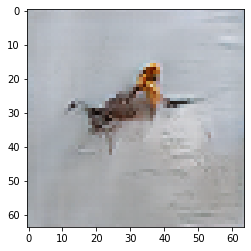

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 15

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6973721981048584 sec
Gen loss: 1.9684361595856517, Disc loss: 2.067136607672039, Disc valid real loss: 0.40192001901174845, Disc valid fake loss: 0.38539030206830877, Disc class real loss: 0.640313634746953, Disc class fake loss: 0.14612416040740514
Time for epoch 2 is 0.6996803283691406 sec
Gen loss: 1.8363224079734402, Disc loss: 2.165290907809609, Disc valid real loss: 0.3921932687884883, Disc valid fake loss: 0.39551818998236404, Disc class real loss: 0.6901130895865591, Disc class fake loss: 0.18661184373654818
Time for epoch 3 is 0.6962378025054932 sec
Gen loss: 1.7357199819464433, Disc loss: 2.089137830232319, Disc valid real loss: 0.38933794435701874, Disc valid fake loss: 0.39874619088674845, Disc class real loss: 0.6526076668187192, Disc class fake loss: 0.18263165927246997
Time for epoch 4 is 0.6945288181304932 sec
Gen loss: 1.82460749149

Time for epoch 31 is 0.6960294246673584 sec
Gen loss: 1.7727815038279484, Disc loss: 2.129057194057264, Disc valid real loss: 0.42413185301579925, Disc valid fake loss: 0.411836912757472, Disc class real loss: 0.6715799789679678, Disc class fake loss: 0.2154380149747196
Time for epoch 32 is 0.698467493057251 sec
Gen loss: 1.8077283470254195, Disc loss: 2.1101732128544857, Disc valid real loss: 0.3923668202600981, Disc valid fake loss: 0.40508549934939336, Disc class real loss: 0.6831554205794084, Disc class fake loss: 0.21057066478227315
Time for epoch 33 is 0.6951906681060791 sec
Gen loss: 1.9349540785739296, Disc loss: 2.0759081777773405, Disc valid real loss: 0.3915020588197206, Disc valid fake loss: 0.3754342182686454, Disc class real loss: 0.6814416364619607, Disc class fake loss: 0.2202890578069185
Time for epoch 34 is 0.6964192390441895 sec
Gen loss: 1.9027660708678396, Disc loss: 2.0059365096845125, Disc valid real loss: 0.3793482404006155, Disc valid fake loss: 0.3810041891901

Time for epoch 62 is 0.6993727684020996 sec
Gen loss: 1.9060985414605391, Disc loss: 2.0181177603571037, Disc valid real loss: 0.3873186613384046, Disc valid fake loss: 0.38946572573561417, Disc class real loss: 0.6652861049300746, Disc class fake loss: 0.2619657226298985
Time for epoch 63 is 0.6948933601379395 sec
Gen loss: 1.7474391648643894, Disc loss: 2.109376631285015, Disc valid real loss: 0.40319207702812393, Disc valid fake loss: 0.41951490232819005, Disc class real loss: 0.6926965901726171, Disc class fake loss: 0.253594970232562
Time for epoch 64 is 0.6973628997802734 sec
Gen loss: 1.9155999986748946, Disc loss: 2.032663659045571, Disc valid real loss: 0.3801264198202836, Disc valid fake loss: 0.3976022444273296, Disc class real loss: 0.67916276580409, Disc class fake loss: 0.22663860572011849
Time for epoch 65 is 0.6966774463653564 sec
Gen loss: 1.8864797667453164, Disc loss: 2.0304972749007377, Disc valid real loss: 0.38864698221808985, Disc valid fake loss: 0.3990776240825

Time for epoch 93 is 0.6944124698638916 sec
Gen loss: 2.0899833691747567, Disc loss: 1.976722096142016, Disc valid real loss: 0.39245893296442536, Disc valid fake loss: 0.36768795942005356, Disc class real loss: 0.6745644211769104, Disc class fake loss: 0.2762704938650131
Time for epoch 94 is 0.6978616714477539 sec
Gen loss: 2.282718539237976, Disc loss: 1.9960425464730513, Disc valid real loss: 0.3813652647169013, Disc valid fake loss: 0.4081577893934752, Disc class real loss: 0.6629480876420674, Disc class fake loss: 0.3083666774787401
Time for epoch 95 is 0.6969261169433594 sec
Gen loss: 1.758851032508047, Disc loss: 1.9585678640164828, Disc valid real loss: 0.39492333405896235, Disc valid fake loss: 0.39551241617453725, Disc class real loss: 0.6492495725029394, Disc class fake loss: 0.26588946345605347
Time for epoch 96 is 0.6981167793273926 sec
Gen loss: 1.8584885659970736, Disc loss: 1.9897791335457249, Disc valid real loss: 0.41725588315411616, Disc valid fake loss: 0.4132914903

Time for epoch 123 is 0.6940717697143555 sec
Gen loss: 1.9765694078646208, Disc loss: 1.9105957181830155, Disc valid real loss: 0.39692970953489604, Disc valid fake loss: 0.3926803469657898, Disc class real loss: 0.6570764152627242, Disc class fake loss: 0.21890470542405782
Time for epoch 124 is 0.6943104267120361 sec
Gen loss: 1.942340010090878, Disc loss: 1.962920113613731, Disc valid real loss: 0.395193255261371, Disc valid fake loss: 0.3908777958468387, Disc class real loss: 0.6940529220982602, Disc class fake loss: 0.21871685746468997
Time for epoch 125 is 0.696049690246582 sec
Gen loss: 1.9464021858416105, Disc loss: 1.878967611413253, Disc valid real loss: 0.3800483306771831, Disc valid fake loss: 0.3856047203666286, Disc class real loss: 0.6556937506324366, Disc class fake loss: 0.21369016131288127
Time for epoch 126 is 0.6953575611114502 sec
Gen loss: 1.9380483188127215, Disc loss: 1.8768072630229748, Disc valid real loss: 0.3927269044675325, Disc valid fake loss: 0.3732146550

Time for epoch 153 is 0.6963434219360352 sec
Gen loss: 1.8733713375894647, Disc loss: 1.8612781010176007, Disc valid real loss: 0.38940083431570155, Disc valid fake loss: 0.4021476930693576, Disc class real loss: 0.6586304620692605, Disc class fake loss: 0.20761208314644664
Time for epoch 154 is 0.6947226524353027 sec
Gen loss: 2.014843275672511, Disc loss: 1.8545444011688232, Disc valid real loss: 0.3890601129908311, Disc valid fake loss: 0.4023323012025733, Disc class real loss: 0.6589270234107971, Disc class fake loss: 0.19791729042404577
Time for epoch 155 is 0.6889429092407227 sec
Gen loss: 1.9274915644997044, Disc loss: 1.8384392324246859, Disc valid real loss: 0.4059063509890908, Disc valid fake loss: 0.3770602690546136, Disc class real loss: 0.658841355850822, Disc class fake loss: 0.18731801015766045
Time for epoch 156 is 0.6991310119628906 sec
Gen loss: 1.8341353441539563, Disc loss: 1.9432095665680735, Disc valid real loss: 0.4176437274405831, Disc valid fake loss: 0.3922118

Time for epoch 183 is 0.6960515975952148 sec
Gen loss: 1.9394558040719283, Disc loss: 1.7816659776788009, Disc valid real loss: 0.3767192410795312, Disc valid fake loss: 0.4244886338710785, Disc class real loss: 0.6324092745780945, Disc class fake loss: 0.1994878728138773
Time for epoch 184 is 0.6975910663604736 sec
Gen loss: 1.941072570650201, Disc loss: 1.8539144553636249, Disc valid real loss: 0.41449071702204254, Disc valid fake loss: 0.41203829959819194, Disc class real loss: 0.6661876314564755, Disc class fake loss: 0.2044577331919419
Time for epoch 185 is 0.6975741386413574 sec
Gen loss: 1.8527464113737409, Disc loss: 1.7540954665133828, Disc valid real loss: 0.3823903799057007, Disc valid fake loss: 0.3896275068584241, Disc class real loss: 0.6428145421178717, Disc class fake loss: 0.18575491089569895
Time for epoch 186 is 0.6934354305267334 sec
Gen loss: 1.9589502246756303, Disc loss: 1.8248983747080754, Disc valid real loss: 0.3880046684491007, Disc valid fake loss: 0.3970332

Time for epoch 213 is 0.697812557220459 sec
Gen loss: 1.9564188530570583, Disc loss: 1.769470359149732, Disc valid real loss: 0.3859134206646367, Disc valid fake loss: 0.4210374919991744, Disc class real loss: 0.6791595753870512, Disc class fake loss: 0.161686420048538
Time for epoch 214 is 0.6958112716674805 sec
Gen loss: 1.9052441245631169, Disc loss: 1.803010011974134, Disc valid real loss: 0.39744271416413157, Disc valid fake loss: 0.4254132038668582, Disc class real loss: 0.6747295040833322, Disc class fake loss: 0.19415470251911565
Time for epoch 215 is 0.6963710784912109 sec
Gen loss: 1.9731617413069074, Disc loss: 1.7522697197763544, Disc valid real loss: 0.3743584383475153, Disc valid fake loss: 0.38422783895542745, Disc class real loss: 0.6840881266091999, Disc class fake loss: 0.199031327115862
Time for epoch 216 is 0.7004921436309814 sec
Gen loss: 1.9900628892998946, Disc loss: 1.7106551873056512, Disc valid real loss: 0.3911537622150622, Disc valid fake loss: 0.39223917848

Time for epoch 243 is 0.6956772804260254 sec
Gen loss: 1.9807503286160921, Disc loss: 1.6636072899165906, Disc valid real loss: 0.38875803194547953, Disc valid fake loss: 0.3753247966891841, Disc class real loss: 0.6720855737987318, Disc class fake loss: 0.1627052202820778
Time for epoch 244 is 0.698413610458374 sec
Gen loss: 1.9513651446292275, Disc loss: 1.6869711499465139, Disc valid real loss: 0.40155660478692307, Disc valid fake loss: 0.37993883616045904, Disc class real loss: 0.6741260196033277, Disc class fake loss: 0.16890783451105418
Time for epoch 245 is 0.6945352554321289 sec
Gen loss: 1.9728827413759733, Disc loss: 1.6969216058128758, Disc valid real loss: 0.40858293599204015, Disc valid fake loss: 0.390693513970626, Disc class real loss: 0.6619753241539001, Disc class fake loss: 0.17757641798571536
Time for epoch 246 is 0.6966860294342041 sec
Gen loss: 2.0344783255928443, Disc loss: 1.7075742357655574, Disc valid real loss: 0.38902609442409714, Disc valid fake loss: 0.3978

Time for epoch 273 is 0.692514181137085 sec
Gen loss: 2.155893796368649, Disc loss: 1.6288854322935407, Disc valid real loss: 0.3791785334285937, Disc valid fake loss: 0.3893931586491434, Disc class real loss: 0.6541351926954169, Disc class fake loss: 0.197468353729499
Time for epoch 274 is 0.692863941192627 sec
Gen loss: 2.1386186825601676, Disc loss: 1.583538061694095, Disc valid real loss: 0.3632882817795402, Disc valid fake loss: 0.3701086295278449, Disc class real loss: 0.6584143701352572, Disc class fake loss: 0.18436697635211444
Time for epoch 275 is 0.6959869861602783 sec
Gen loss: 2.2357262059261926, Disc loss: 1.61824117208782, Disc valid real loss: 0.40281561409172256, Disc valid fake loss: 0.40118852571437236, Disc class real loss: 0.6415446745721918, Disc class fake loss: 0.16705317834490224
Time for epoch 276 is 0.6977908611297607 sec
Gen loss: 2.137600308970401, Disc loss: 1.6634336709976196, Disc valid real loss: 0.3890750549341503, Disc valid fake loss: 0.3983934184438

Time for epoch 303 is 0.6942110061645508 sec
Gen loss: 2.0052633411005925, Disc loss: 1.6264772164194208, Disc valid real loss: 0.3938427630223726, Disc valid fake loss: 0.378035484175933, Disc class real loss: 0.6823583370760867, Disc class fake loss: 0.1723426592193152
Time for epoch 304 is 0.6928057670593262 sec
Gen loss: 2.020183230701246, Disc loss: 1.624584059966238, Disc valid real loss: 0.39972615869421707, Disc valid fake loss: 0.38482729071064997, Disc class real loss: 0.6647669139661287, Disc class fake loss: 0.17536158977370514
Time for epoch 305 is 0.6918635368347168 sec
Gen loss: 1.898071056918094, Disc loss: 1.6064555394022089, Disc valid real loss: 0.37850531778837504, Disc valid fake loss: 0.3735758575953935, Disc class real loss: 0.6778944009228757, Disc class fake loss: 0.17658024947894246
Time for epoch 306 is 0.692255973815918 sec
Gen loss: 1.9249546778829474, Disc loss: 1.6423014214164333, Disc valid real loss: 0.39778787995639603, Disc valid fake loss: 0.38996639

Time for epoch 333 is 0.6946258544921875 sec
Gen loss: 2.0018019927175423, Disc loss: 1.585304762187757, Disc valid real loss: 0.38346134361467865, Disc valid fake loss: 0.39536598011067037, Disc class real loss: 0.6522275836844194, Disc class fake loss: 0.1543494408067904
Time for epoch 334 is 0.697171688079834 sec
Gen loss: 1.9827115222027427, Disc loss: 1.6442628283249705, Disc valid real loss: 0.4006983559382589, Disc valid fake loss: 0.4000244979795657, Disc class real loss: 0.6735970503405521, Disc class fake loss: 0.17004366297470896
Time for epoch 335 is 0.6956374645233154 sec
Gen loss: 1.9035788649006893, Disc loss: 1.6160965405012433, Disc valid real loss: 0.39243663298456294, Disc valid fake loss: 0.3851110229366704, Disc class real loss: 0.661869444345173, Disc class fake loss: 0.17677647149876544
Time for epoch 336 is 0.6951777935028076 sec
Gen loss: 1.8559938480979519, Disc loss: 1.6631952649668644, Disc valid real loss: 0.4050560389694415, Disc valid fake loss: 0.4070456

Time for epoch 363 is 0.6938486099243164 sec
Gen loss: 2.0274895429611206, Disc loss: 1.5861718905599493, Disc valid real loss: 0.35952964111378316, Disc valid fake loss: 0.40062090440800313, Disc class real loss: 0.6816749321786981, Disc class fake loss: 0.14445387219127856
Time for epoch 364 is 0.695155143737793 sec
Gen loss: 2.032193610542699, Disc loss: 1.6238580691187006, Disc valid real loss: 0.3870350357733275, Disc valid fake loss: 0.4047195331046456, Disc class real loss: 0.6910900755932456, Disc class fake loss: 0.14112346384086108
Time for epoch 365 is 0.6973836421966553 sec
Gen loss: 1.9553118316750777, Disc loss: 1.6221923953608464, Disc valid real loss: 0.3868117254031332, Disc valid fake loss: 0.40192776134139613, Disc class real loss: 0.6679044522737202, Disc class fake loss: 0.16564893800961344
Time for epoch 366 is 0.6995866298675537 sec
Gen loss: 1.998560861537331, Disc loss: 1.5771398042377673, Disc valid real loss: 0.3921223925916772, Disc valid fake loss: 0.371223

Time for epoch 393 is 0.707489013671875 sec
Gen loss: 1.973740540052715, Disc loss: 1.6123028115222329, Disc valid real loss: 0.402695716995942, Disc valid fake loss: 0.392777661743917, Disc class real loss: 0.6882039057581049, Disc class fake loss: 0.1287374331762916
Time for epoch 394 is 0.7102532386779785 sec
Gen loss: 2.0190603858546208, Disc loss: 1.5912590026855469, Disc valid real loss: 0.3860602755295603, Disc valid fake loss: 0.39679955808739914, Disc class real loss: 0.6600801254573622, Disc class fake loss: 0.14842139066834198
Time for epoch 395 is 0.7015464305877686 sec
Gen loss: 1.9721488764411526, Disc loss: 1.6005299593272961, Disc valid real loss: 0.39211962881841156, Disc valid fake loss: 0.39689709481440094, Disc class real loss: 0.6455722043388769, Disc class fake loss: 0.16603693013128482
Time for epoch 396 is 0.6960563659667969 sec
Gen loss: 1.831779260384409, Disc loss: 1.6358587679110075, Disc valid real loss: 0.41677474505022954, Disc valid fake loss: 0.40288278

Time for epoch 423 is 0.6935756206512451 sec
Gen loss: 1.9693975574091862, Disc loss: 1.5962844647859271, Disc valid real loss: 0.392673638306166, Disc valid fake loss: 0.38406530022621155, Disc class real loss: 0.6701684092220507, Disc class fake loss: 0.14948128320668874
Time for epoch 424 is 0.6963834762573242 sec
Gen loss: 1.9386373381865651, Disc loss: 1.6230216528240002, Disc valid real loss: 0.4032028019428253, Disc valid fake loss: 0.4067167326023704, Disc class real loss: 0.6661761434454667, Disc class fake loss: 0.1470298523965635
Time for epoch 425 is 0.6958358287811279 sec
Gen loss: 1.977609019530447, Disc loss: 1.6525248853783858, Disc valid real loss: 0.4040246605873108, Disc valid fake loss: 0.39121140304364654, Disc class real loss: 0.6927883217209264, Disc class fake loss: 0.16460618043416425
Time for epoch 426 is 0.6940629482269287 sec
Gen loss: 1.9379405285182751, Disc loss: 1.5834560206061916, Disc valid real loss: 0.38651149523885625, Disc valid fake loss: 0.385191

Time for epoch 453 is 0.6976954936981201 sec
Gen loss: 1.956950262973183, Disc loss: 1.624795819583692, Disc valid real loss: 0.3865472956707603, Disc valid fake loss: 0.4083664087872756, Disc class real loss: 0.6636846975276345, Disc class fake loss: 0.16629691461199209
Time for epoch 454 is 0.697258710861206 sec
Gen loss: 1.9156258482682078, Disc loss: 1.6273615611226935, Disc valid real loss: 0.4007624795562343, Disc valid fake loss: 0.38579212678106206, Disc class real loss: 0.6997617985072889, Disc class fake loss: 0.14115690518366664
Time for epoch 455 is 0.6953849792480469 sec
Gen loss: 2.001259866513704, Disc loss: 1.6262047039835077, Disc valid real loss: 0.3767432052838175, Disc valid fake loss: 0.3936524830366436, Disc class real loss: 0.6921088821009586, Disc class fake loss: 0.1638058106365957
Time for epoch 456 is 0.6972737312316895 sec
Gen loss: 1.925505989476254, Disc loss: 1.5926015753495066, Disc valid real loss: 0.3902908642041056, Disc valid fake loss: 0.38946555790

Time for epoch 483 is 0.6967353820800781 sec
Gen loss: 1.9851402985422235, Disc loss: 1.5783294753024453, Disc valid real loss: 0.3752926446889576, Disc valid fake loss: 0.3951516684732939, Disc class real loss: 0.6760808762751127, Disc class fake loss: 0.13191312394644084
Time for epoch 484 is 0.6971583366394043 sec
Gen loss: 2.0101782146253084, Disc loss: 1.5680843779915257, Disc valid real loss: 0.38261615288885015, Disc valid fake loss: 0.3919873080755535, Disc class real loss: 0.6557230855289259, Disc class fake loss: 0.13786141221460543
Time for epoch 485 is 0.6982340812683105 sec
Gen loss: 1.9475270823428505, Disc loss: 1.531512687080785, Disc valid real loss: 0.37295724216260406, Disc valid fake loss: 0.3716923437620464, Disc class real loss: 0.6688245189817328, Disc class fake loss: 0.11814873861639123
Time for epoch 486 is 0.6970465183258057 sec
Gen loss: 1.9892096017536365, Disc loss: 1.6513966447428654, Disc valid real loss: 0.4026057657442595, Disc valid fake loss: 0.39495

Time for epoch 513 is 0.6973187923431396 sec
Gen loss: 1.8554458241713674, Disc loss: 1.6104641839077598, Disc valid real loss: 0.38869285740350423, Disc valid fake loss: 0.3983231108439596, Disc class real loss: 0.6766527577450401, Disc class fake loss: 0.14690140203425758
Time for epoch 514 is 0.6953835487365723 sec
Gen loss: 2.0440253772233663, Disc loss: 1.620135828068382, Disc valid real loss: 0.3826866291071239, Disc valid fake loss: 0.38780084252357483, Disc class real loss: 0.6897282443548504, Disc class fake loss: 0.16002605855464935
Time for epoch 515 is 0.69671630859375 sec
Gen loss: 1.9474691779989945, Disc loss: 1.578019198618437, Disc valid real loss: 0.37198823062997116, Disc valid fake loss: 0.3728817419001931, Disc class real loss: 0.6834084736673456, Disc class fake loss: 0.14984750747680664
Time for epoch 516 is 0.694584846496582 sec
Gen loss: 1.9849816937195628, Disc loss: 1.584065882783187, Disc valid real loss: 0.3898645153171138, Disc valid fake loss: 0.379391085

Time for epoch 543 is 0.6948997974395752 sec
Gen loss: 2.0065443954969706, Disc loss: 1.5673667757134688, Disc valid real loss: 0.38739623678357976, Disc valid fake loss: 0.3894432469418174, Disc class real loss: 0.656055277899692, Disc class fake loss: 0.13457633358867546
Time for epoch 544 is 0.6955006122589111 sec
Gen loss: 1.9548390099876805, Disc loss: 1.6304779178217839, Disc valid real loss: 0.4003862801351045, Disc valid fake loss: 0.38250645838285746, Disc class real loss: 0.6891083748717057, Disc class fake loss: 0.15858290854253268
Time for epoch 545 is 0.6978332996368408 sec
Gen loss: 1.953561870675338, Disc loss: 1.6007358337703503, Disc valid real loss: 0.38859142441498606, Disc valid fake loss: 0.39315451289478104, Disc class real loss: 0.6802166418025368, Disc class fake loss: 0.13888154100430639
Time for epoch 546 is 0.695195198059082 sec
Gen loss: 2.050781118242364, Disc loss: 1.6434003114700317, Disc valid real loss: 0.39927164347548233, Disc valid fake loss: 0.38786

Time for epoch 573 is 0.6980247497558594 sec
Gen loss: 1.9586417612276579, Disc loss: 1.574339785073933, Disc valid real loss: 0.38790743288240936, Disc valid fake loss: 0.380335177245893, Disc class real loss: 0.6722227993764376, Disc class fake loss: 0.13398206155551107
Time for epoch 574 is 0.6960799694061279 sec
Gen loss: 1.8958712439788015, Disc loss: 1.6367262162660297, Disc valid real loss: 0.4037072485999057, Disc valid fake loss: 0.4013267049663945, Disc class real loss: 0.6755214960951554, Disc class fake loss: 0.1562746312273176
Time for epoch 575 is 0.6991419792175293 sec
Gen loss: 2.0569090905942415, Disc loss: 1.6208974750418412, Disc valid real loss: 0.3670453099828017, Disc valid fake loss: 0.40161963199314316, Disc class real loss: 0.6934721156170494, Disc class fake loss: 0.1588673658276859
Time for epoch 576 is 0.7005627155303955 sec
Gen loss: 2.1545214653015137, Disc loss: 1.6049299240112305, Disc valid real loss: 0.3728019626517045, Disc valid fake loss: 0.37870050

Time for epoch 603 is 0.6995429992675781 sec
Gen loss: 2.0160418874339054, Disc loss: 1.591544364628039, Disc valid real loss: 0.3919540455466823, Disc valid fake loss: 0.3975328834433305, Disc class real loss: 0.6494245403691342, Disc class fake loss: 0.15273225660386838
Time for epoch 604 is 0.6947934627532959 sec
Gen loss: 2.0062848015835413, Disc loss: 1.6432428924660933, Disc valid real loss: 0.4087072171662983, Disc valid fake loss: 0.3853510382928346, Disc class real loss: 0.6805033244584736, Disc class fake loss: 0.1687836490179363
Time for epoch 605 is 0.6942815780639648 sec
Gen loss: 1.9056667026720548, Disc loss: 1.592889246187712, Disc valid real loss: 0.4078323543071747, Disc valid fake loss: 0.3941827118396759, Disc class real loss: 0.6557360667931406, Disc class fake loss: 0.13524221099520983
Time for epoch 606 is 0.6961266994476318 sec
Gen loss: 1.9213883249383223, Disc loss: 1.608766380109285, Disc valid real loss: 0.38103927279773514, Disc valid fake loss: 0.404249225

Time for epoch 633 is 0.6969611644744873 sec
Gen loss: 1.9978465845710354, Disc loss: 1.5438718795776367, Disc valid real loss: 0.38413975427025243, Disc valid fake loss: 0.3828959566982169, Disc class real loss: 0.6622430854722073, Disc class fake loss: 0.1147026166711983
Time for epoch 634 is 0.6961085796356201 sec
Gen loss: 1.8798750011544478, Disc loss: 1.590598175400182, Disc valid real loss: 0.383414698274512, Disc valid fake loss: 0.39704961368912145, Disc class real loss: 0.6631224312280354, Disc class fake loss: 0.14711463647453407
Time for epoch 635 is 0.6977591514587402 sec
Gen loss: 1.946696218691374, Disc loss: 1.6001533269882202, Disc valid real loss: 0.38273137180428757, Disc valid fake loss: 0.3852840850227757, Disc class real loss: 0.6731862614029333, Disc class fake loss: 0.15905446990540154
Time for epoch 636 is 0.697568416595459 sec
Gen loss: 1.9590318077488948, Disc loss: 1.6228116248783313, Disc valid real loss: 0.41627201751658793, Disc valid fake loss: 0.3764149

Time for epoch 663 is 0.6978321075439453 sec
Gen loss: 1.873847854764838, Disc loss: 1.61505673433605, Disc valid real loss: 0.39329418696855245, Disc valid fake loss: 0.3775120597136648, Disc class real loss: 0.698465811578851, Disc class fake loss: 0.14589522445672437
Time for epoch 664 is 0.697148323059082 sec
Gen loss: 1.9476507337469804, Disc loss: 1.5825155408758866, Disc valid real loss: 0.38769757120232834, Disc valid fake loss: 0.38828119165018987, Disc class real loss: 0.6832881883571023, Disc class fake loss: 0.12336056855948348
Time for epoch 665 is 0.6964690685272217 sec
Gen loss: 1.949983697188528, Disc loss: 1.588160841088546, Disc valid real loss: 0.40164737638674286, Disc valid fake loss: 0.3766608614670603, Disc class real loss: 0.6783233316321122, Disc class fake loss: 0.1316386527921024
Time for epoch 666 is 0.691824197769165 sec
Gen loss: 1.8794080520931042, Disc loss: 1.6368212009731091, Disc valid real loss: 0.40002004566945526, Disc valid fake loss: 0.3832843758

Time for epoch 693 is 0.6961812973022461 sec
Gen loss: 2.069695654668306, Disc loss: 1.5949591900172986, Disc valid real loss: 0.3831737292440314, Disc valid fake loss: 0.38216783420035716, Disc class real loss: 0.6654672873647589, Disc class fake loss: 0.1642505985341574
Time for epoch 694 is 0.6993231773376465 sec
Gen loss: 2.127746713788886, Disc loss: 1.6186820331372713, Disc valid real loss: 0.3757149294803017, Disc valid fake loss: 0.3904202125574413, Disc class real loss: 0.6706665660205641, Disc class fake loss: 0.1819780810098899
Time for epoch 695 is 0.6987345218658447 sec
Gen loss: 2.110921025276184, Disc loss: 1.5932730812775462, Disc valid real loss: 0.3823221670953851, Disc valid fake loss: 0.38827179293883474, Disc class real loss: 0.664265701645299, Disc class fake loss: 0.1585146153443738
Time for epoch 696 is 0.6983952522277832 sec
Gen loss: 1.982236479458056, Disc loss: 1.614888448464243, Disc valid real loss: 0.37884000335869034, Disc valid fake loss: 0.413128468551

Time for epoch 723 is 0.6945769786834717 sec
Gen loss: 2.037239984462136, Disc loss: 1.6063978922994513, Disc valid real loss: 0.39574185876469864, Disc valid fake loss: 0.39209794213897303, Disc class real loss: 0.6604304784222653, Disc class fake loss: 0.15822804640782506
Time for epoch 724 is 0.6970028877258301 sec
Gen loss: 1.9433537533408718, Disc loss: 1.6531578051416498, Disc valid real loss: 0.40099841199423136, Disc valid fake loss: 0.3950609486354025, Disc class real loss: 0.6832581664386549, Disc class fake loss: 0.17394216280234487
Time for epoch 725 is 0.6974377632141113 sec
Gen loss: 1.9696593472832127, Disc loss: 1.6249572979776483, Disc valid real loss: 0.39435835888511256, Disc valid fake loss: 0.40312111691424724, Disc class real loss: 0.6862292823038603, Disc class fake loss: 0.14135751539939329
Time for epoch 726 is 0.6909444332122803 sec
Gen loss: 1.9225438958720158, Disc loss: 1.5636918983961408, Disc valid real loss: 0.38433835380955744, Disc valid fake loss: 0.3

Time for epoch 753 is 0.6984632015228271 sec
Gen loss: 1.941992395802548, Disc loss: 1.6135142978868986, Disc valid real loss: 0.38604351407603216, Disc valid fake loss: 0.39921136906272486, Disc class real loss: 0.6750243149305645, Disc class fake loss: 0.15333947225620873
Time for epoch 754 is 0.696923017501831 sec
Gen loss: 2.042529407300447, Disc loss: 1.6442704953645404, Disc valid real loss: 0.389992892742157, Disc valid fake loss: 0.3993183107752549, Disc class real loss: 0.6930208488514549, Disc class fake loss: 0.1620446716092135
Time for epoch 755 is 0.6975216865539551 sec
Gen loss: 1.89650853684074, Disc loss: 1.671225999530993, Disc valid real loss: 0.38816001697590474, Disc valid fake loss: 0.39880912398037155, Disc class real loss: 0.696067075980337, Disc class fake loss: 0.1882913810642142
Time for epoch 756 is 0.6965305805206299 sec
Gen loss: 1.94545410808764, Disc loss: 1.6070915335103084, Disc valid real loss: 0.4025922370584388, Disc valid fake loss: 0.38956234172770

Time for epoch 783 is 0.6957316398620605 sec
Gen loss: 2.0219497241471944, Disc loss: 1.6155037189784802, Disc valid real loss: 0.3985315686778018, Disc valid fake loss: 0.382278699623911, Disc class real loss: 0.6704523061451159, Disc class fake loss: 0.16434238713822866
Time for epoch 784 is 0.6983129978179932 sec
Gen loss: 1.892331926446212, Disc loss: 1.5908074441709017, Disc valid real loss: 0.401085459872296, Disc valid fake loss: 0.37996816635131836, Disc class real loss: 0.6767617275840357, Disc class fake loss: 0.13310083197919945
Time for epoch 785 is 0.698706865310669 sec
Gen loss: 1.971351102778786, Disc loss: 1.6160090785277517, Disc valid real loss: 0.38315636703842565, Disc valid fake loss: 0.386314647762399, Disc class real loss: 0.6892334473760504, Disc class fake loss: 0.1574109971131149
Time for epoch 786 is 0.6967868804931641 sec
Gen loss: 2.002221477659125, Disc loss: 1.647407757608514, Disc valid real loss: 0.3965985555397837, Disc valid fake loss: 0.3857108966300

Time for epoch 813 is 0.699531078338623 sec
Gen loss: 1.8825529186349166, Disc loss: 1.6146485993736668, Disc valid real loss: 0.41016438603401184, Disc valid fake loss: 0.389374598076469, Disc class real loss: 0.6773323761789423, Disc class fake loss: 0.13788512741264544
Time for epoch 814 is 0.7022161483764648 sec
Gen loss: 1.9098652099308215, Disc loss: 1.6218948615224738, Disc valid real loss: 0.39446097141818, Disc valid fake loss: 0.4028425859777551, Disc class real loss: 0.6743349903508237, Disc class fake loss: 0.15036112226937948
Time for epoch 815 is 0.6947355270385742 sec
Gen loss: 1.897564969564739, Disc loss: 1.6192289653577303, Disc valid real loss: 0.4000883431811082, Disc valid fake loss: 0.3976218904319562, Disc class real loss: 0.6662583194280925, Disc class fake loss: 0.15536258840247205
Time for epoch 816 is 0.6931960582733154 sec
Gen loss: 1.9741008720899884, Disc loss: 1.6584531319768805, Disc valid real loss: 0.401156338421922, Disc valid fake loss: 0.37927098729

Time for epoch 843 is 0.695298433303833 sec
Gen loss: 2.017952197476437, Disc loss: 1.651421026179665, Disc valid real loss: 0.41573347229706614, Disc valid fake loss: 0.393144196585605, Disc class real loss: 0.6724092050602561, Disc class fake loss: 0.17023460880706184
Time for epoch 844 is 0.6985445022583008 sec
Gen loss: 2.2059441365693746, Disc loss: 1.637119588099028, Disc valid real loss: 0.3724163480495152, Disc valid fake loss: 0.400544977501819, Disc class real loss: 0.6333763003349304, Disc class fake loss: 0.23086249161707728
Time for epoch 845 is 0.7006072998046875 sec
Gen loss: 2.1117168413965324, Disc loss: 1.6913029269168252, Disc valid real loss: 0.3652250233449434, Disc valid fake loss: 0.4119459696506199, Disc class real loss: 0.7164437551247446, Disc class fake loss: 0.19779192303356372
Time for epoch 846 is 0.6959197521209717 sec
Gen loss: 1.9594725370407104, Disc loss: 1.656170035663404, Disc valid real loss: 0.4035025497800426, Disc valid fake loss: 0.386670878843

Time for epoch 873 is 0.6936285495758057 sec
Gen loss: 1.9790258407592773, Disc loss: 1.5720935307051007, Disc valid real loss: 0.39007563340036494, Disc valid fake loss: 0.3696310833880776, Disc class real loss: 0.6717335330812555, Disc class fake loss: 0.14075951023321404
Time for epoch 874 is 0.6974601745605469 sec
Gen loss: 1.8874998594585217, Disc loss: 1.6406015596891705, Disc valid real loss: 0.4166775910477889, Disc valid fake loss: 0.39731794438864054, Disc class real loss: 0.6923613673762271, Disc class fake loss: 0.1343562787300662
Time for epoch 875 is 0.6966173648834229 sec
Gen loss: 1.8927061996961896, Disc loss: 1.661702325469569, Disc valid real loss: 0.390841040172075, Disc valid fake loss: 0.3881065453353681, Disc class real loss: 0.7023277031747919, Disc class fake loss: 0.18053141001023745
Time for epoch 876 is 0.6942451000213623 sec
Gen loss: 1.978465337502329, Disc loss: 1.6391688836248297, Disc valid real loss: 0.38853279383558975, Disc valid fake loss: 0.3881620

Time for epoch 903 is 0.6974053382873535 sec
Gen loss: 1.9438751622250205, Disc loss: 1.600803437985872, Disc valid real loss: 0.3958294109294289, Disc valid fake loss: 0.38604955610476044, Disc class real loss: 0.6792357250263816, Disc class fake loss: 0.13979664562564148
Time for epoch 904 is 0.7028968334197998 sec
Gen loss: 1.9638013086820905, Disc loss: 1.6096541442369159, Disc valid real loss: 0.39117575476044103, Disc valid fake loss: 0.4040796835171549, Disc class real loss: 0.6857189347869471, Disc class fake loss: 0.1287911734298656
Time for epoch 905 is 0.7160699367523193 sec
Gen loss: 1.8514030795348317, Disc loss: 1.6176513998132003, Disc valid real loss: 0.38807712887462814, Disc valid fake loss: 0.40147316769549724, Disc class real loss: 0.6539491289540341, Disc class fake loss: 0.1742479173760665
Time for epoch 906 is 0.6936867237091064 sec
Gen loss: 2.057061402421249, Disc loss: 1.5981366634368896, Disc valid real loss: 0.4095597972995357, Disc valid fake loss: 0.377664

Time for epoch 933 is 0.6935310363769531 sec
Gen loss: 1.9599324151089317, Disc loss: 1.5564929121419002, Disc valid real loss: 0.3806095186032747, Disc valid fake loss: 0.3804496981595692, Disc class real loss: 0.6508611440658569, Disc class fake loss: 0.14467379470404826
Time for epoch 934 is 0.6972038745880127 sec
Gen loss: 1.8708005892603021, Disc loss: 1.6144814554013704, Disc valid real loss: 0.4047637487712659, Disc valid fake loss: 0.3881288798231828, Disc class real loss: 0.674832140144549, Disc class fake loss: 0.1468622986423342
Time for epoch 935 is 0.6943795680999756 sec
Gen loss: 1.9297993998778493, Disc loss: 1.6460123375842446, Disc valid real loss: 0.38488851879772384, Disc valid fake loss: 0.3864551421843077, Disc class real loss: 0.7093142647492258, Disc class fake loss: 0.165463199740962
Time for epoch 936 is 0.6980991363525391 sec
Gen loss: 1.9696931148830212, Disc loss: 1.6547735490297015, Disc valid real loss: 0.41362776881770086, Disc valid fake loss: 0.39621101

Time for epoch 963 is 0.7001008987426758 sec
Gen loss: 1.9169849345558567, Disc loss: 1.6482746350137811, Disc valid real loss: 0.4043700789150439, Disc valid fake loss: 0.4014090519202383, Disc class real loss: 0.7156827355685987, Disc class fake loss: 0.12693053758458087
Time for epoch 964 is 0.6998794078826904 sec
Gen loss: 1.9294235518104152, Disc loss: 1.6071618042494122, Disc valid real loss: 0.38431834547143234, Disc valid fake loss: 0.3894151433518058, Disc class real loss: 0.6864918862518511, Disc class fake loss: 0.1470443380898551
Time for epoch 965 is 0.6977512836456299 sec
Gen loss: 1.9474510268161171, Disc loss: 1.6017278244620876, Disc valid real loss: 0.3951728453761653, Disc valid fake loss: 0.3940335543532121, Disc class real loss: 0.6739162143908048, Disc class fake loss: 0.1387122740086756
Time for epoch 966 is 0.6974060535430908 sec
Gen loss: 1.9529951936320256, Disc loss: 1.6341895429711593, Disc valid real loss: 0.3945927039573067, Disc valid fake loss: 0.4115846

Time for epoch 993 is 0.6983644962310791 sec
Gen loss: 2.0346572461881136, Disc loss: 1.6263543304644132, Disc valid real loss: 0.38408623871050385, Disc valid fake loss: 0.39651528785103246, Disc class real loss: 0.6737788068620783, Disc class fake loss: 0.172074341852414
Time for epoch 994 is 0.695857048034668 sec
Gen loss: 1.8349845974068892, Disc loss: 1.6229712147461741, Disc valid real loss: 0.41008013330007853, Disc valid fake loss: 0.3837213861314874, Disc class real loss: 0.6956402000628019, Disc class fake loss: 0.13364190647476598
Time for epoch 995 is 0.6964688301086426 sec
Gen loss: 1.9524505201138949, Disc loss: 1.5744661280983372, Disc valid real loss: 0.36396006533974096, Disc valid fake loss: 0.41069001429959345, Disc class real loss: 0.678563831668151, Disc class fake loss: 0.12136370884744745
Time for epoch 996 is 0.6968564987182617 sec
Gen loss: 1.878278606816342, Disc loss: 1.61733877658844, Disc valid real loss: 0.380439977896841, Disc valid fake loss: 0.404242068

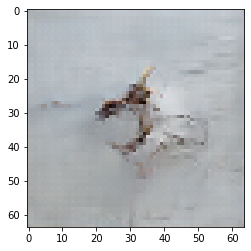

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 16

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.693791389465332 sec
Gen loss: 1.916291550586098, Disc loss: 2.1538751627269543, Disc valid real loss: 0.37226522439404536, Disc valid fake loss: 0.39287218216218445, Disc class real loss: 0.6948115606057016, Disc class fake loss: 0.14816760663923464
Time for epoch 2 is 0.6979801654815674 sec
Gen loss: 1.8762181118914956, Disc loss: 2.167100429534912, Disc valid real loss: 0.4048506868513007, Disc valid fake loss: 0.37391596405129685, Disc class real loss: 0.6955129002269945, Disc class fake loss: 0.18159639678503336
Time for epoch 3 is 0.6980478763580322 sec
Gen loss: 1.821708698021738, Disc loss: 2.1799828692486414, Disc valid real loss: 0.40754497051239014, Disc valid fake loss: 0.39868692034169245, Disc class real loss: 0.6891939389078241, Disc class fake loss: 0.16486142340459323
Time for epoch 4 is 0.6976149082183838 sec
Gen loss: 1.93878397188

Time for epoch 31 is 0.698192834854126 sec
Gen loss: 1.8447730792196173, Disc loss: 2.079803146814045, Disc valid real loss: 0.40001237706134196, Disc valid fake loss: 0.3839050860781419, Disc class real loss: 0.6725185827205056, Disc class fake loss: 0.22464899012916967
Time for epoch 32 is 0.6976158618927002 sec
Gen loss: 1.7722021780515973, Disc loss: 2.0774660173215365, Disc valid real loss: 0.38332927854437576, Disc valid fake loss: 0.4032417363242099, Disc class real loss: 0.6720037083876761, Disc class fake loss: 0.20343101063841268
Time for epoch 33 is 0.6975903511047363 sec
Gen loss: 1.866080641746521, Disc loss: 2.0495047381049707, Disc valid real loss: 0.39048718935564947, Disc valid fake loss: 0.3863193431967183, Disc class real loss: 0.6632398210073772, Disc class fake loss: 0.20257180654688886
Time for epoch 34 is 0.698857307434082 sec
Gen loss: 1.8117742914902537, Disc loss: 2.047989895469264, Disc valid real loss: 0.3958981084196191, Disc valid fake loss: 0.387409776449

Time for epoch 62 is 0.6964764595031738 sec
Gen loss: 1.8887657554526078, Disc loss: 2.0231569754449943, Disc valid real loss: 0.38914723459043, Disc valid fake loss: 0.40846624343018784, Disc class real loss: 0.6613979120003549, Disc class fake loss: 0.22183808056931748
Time for epoch 63 is 0.6958770751953125 sec
Gen loss: 1.7970474142777293, Disc loss: 2.0008681134173742, Disc valid real loss: 0.40076691382809687, Disc valid fake loss: 0.3909643998271541, Disc class real loss: 0.6544705001931441, Disc class fake loss: 0.21073666685505918
Time for epoch 64 is 0.6984763145446777 sec
Gen loss: 1.8141757187090422, Disc loss: 2.0112761572787634, Disc valid real loss: 0.3989216685295105, Disc valid fake loss: 0.4050339554485522, Disc class real loss: 0.6536792077516255, Disc class fake loss: 0.21571609221006693
Time for epoch 65 is 0.6927335262298584 sec
Gen loss: 1.9298484639117592, Disc loss: 1.9989599052228426, Disc valid real loss: 0.386175684238735, Disc valid fake loss: 0.38336682554

Time for epoch 93 is 0.6961190700531006 sec
Gen loss: 1.841534514176218, Disc loss: 1.9715738547475714, Disc valid real loss: 0.38552121269075496, Disc valid fake loss: 0.4055497254195966, Disc class real loss: 0.6622630985159623, Disc class fake loss: 0.2294872638426329
Time for epoch 94 is 0.6988654136657715 sec
Gen loss: 1.8861369835702997, Disc loss: 1.9649321280027692, Disc valid real loss: 0.4011464275811848, Disc valid fake loss: 0.41714416993291753, Disc class real loss: 0.6524430795719749, Disc class fake loss: 0.18224440750322843
Time for epoch 95 is 0.6951048374176025 sec
Gen loss: 1.8422651228151823, Disc loss: 1.9875358907799971, Disc valid real loss: 0.38435957384736913, Disc valid fake loss: 0.4145070392834513, Disc class real loss: 0.6668140292167664, Disc class fake loss: 0.2405509203672409
Time for epoch 96 is 0.6939730644226074 sec
Gen loss: 1.8383512371464779, Disc loss: 1.9057078298769499, Disc valid real loss: 0.3790616251920399, Disc valid fake loss: 0.3921222404

Time for epoch 123 is 0.6961565017700195 sec
Gen loss: 2.0359834118893274, Disc loss: 1.8885143618834646, Disc valid real loss: 0.37221758146035044, Disc valid fake loss: 0.386596878892497, Disc class real loss: 0.6557338520100242, Disc class fake loss: 0.2434437533742503
Time for epoch 124 is 0.6964011192321777 sec
Gen loss: 1.9518850351634778, Disc loss: 1.8765129101903815, Disc valid real loss: 0.38609498425533895, Disc valid fake loss: 0.3944109129278283, Disc class real loss: 0.6444318608233803, Disc class fake loss: 0.21058470951883415
Time for epoch 125 is 0.6989181041717529 sec
Gen loss: 1.8301232614015277, Disc loss: 1.917349846739518, Disc valid real loss: 0.4060678121290709, Disc valid fake loss: 0.39188958782898753, Disc class real loss: 0.6545731425285339, Disc class fake loss: 0.2311362435943202
Time for epoch 126 is 0.6952252388000488 sec
Gen loss: 1.9128022382133885, Disc loss: 1.9358734394374646, Disc valid real loss: 0.3925979027622624, Disc valid fake loss: 0.3997536

Time for epoch 153 is 0.699099063873291 sec
Gen loss: 1.8798587635943764, Disc loss: 1.8801847194370471, Disc valid real loss: 0.39844940367497894, Disc valid fake loss: 0.3956652926771264, Disc class real loss: 0.6706381189195734, Disc class fake loss: 0.2056690579966495
Time for epoch 154 is 0.6962692737579346 sec
Gen loss: 1.8592844134882878, Disc loss: 1.7901356094761898, Disc valid real loss: 0.3686378974663584, Disc valid fake loss: 0.3816910323343779, Disc class real loss: 0.6450327195619282, Disc class fake loss: 0.19213755977781197
Time for epoch 155 is 0.6956307888031006 sec
Gen loss: 1.8785299627404464, Disc loss: 1.8483942621632625, Disc valid real loss: 0.39746044654595225, Disc valid fake loss: 0.3842365224110453, Disc class real loss: 0.6497887749420969, Disc class fake loss: 0.2309588460545791
Time for epoch 156 is 0.6964333057403564 sec
Gen loss: 1.8887106933091815, Disc loss: 1.8038980458912097, Disc valid real loss: 0.3791827684954593, Disc valid fake loss: 0.3845364

Time for epoch 183 is 0.6983315944671631 sec
Gen loss: 1.9321262648231106, Disc loss: 1.781412871260392, Disc valid real loss: 0.380599330914648, Disc valid fake loss: 0.40175706148147583, Disc class real loss: 0.6550870569128739, Disc class fake loss: 0.18156280133285022
Time for epoch 184 is 0.690319299697876 sec
Gen loss: 1.9770036433872424, Disc loss: 1.8386345035151432, Disc valid real loss: 0.4141280588350798, Disc valid fake loss: 0.39135050146203293, Disc class real loss: 0.6804633956206473, Disc class fake loss: 0.18422771441309074
Time for epoch 185 is 0.6948392391204834 sec
Gen loss: 1.896034510512101, Disc loss: 1.7644432406676442, Disc valid real loss: 0.3824098235682437, Disc valid fake loss: 0.38350418680592585, Disc class real loss: 0.6530510877308092, Disc class fake loss: 0.1899765118172294
Time for epoch 186 is 0.6933841705322266 sec
Gen loss: 2.0796425781751933, Disc loss: 1.7573391826529252, Disc valid real loss: 0.37919135156430694, Disc valid fake loss: 0.3885668

Time for epoch 213 is 0.6962807178497314 sec
Gen loss: 1.894290855056361, Disc loss: 1.7667429635399265, Disc valid real loss: 0.3796301719389464, Disc valid fake loss: 0.3954726190943467, Disc class real loss: 0.6880727222091273, Disc class fake loss: 0.18540117693574806
Time for epoch 214 is 0.6955759525299072 sec
Gen loss: 1.9537728711178428, Disc loss: 1.7735605741802014, Disc valid real loss: 0.403047103630869, Disc valid fake loss: 0.4001254878546062, Disc class real loss: 0.6752222117624784, Disc class fake loss: 0.1806795483357028
Time for epoch 215 is 0.6956338882446289 sec
Gen loss: 1.9362984958447909, Disc loss: 1.7944342713606984, Disc valid real loss: 0.41165336182242945, Disc valid fake loss: 0.4076727314999229, Disc class real loss: 0.6566167222826105, Disc class fake loss: 0.21869161803471415
Time for epoch 216 is 0.6961019039154053 sec
Gen loss: 2.160247846653587, Disc loss: 1.816468596458435, Disc valid real loss: 0.37495060186637075, Disc valid fake loss: 0.412557018

Time for epoch 243 is 0.6973941326141357 sec
Gen loss: 2.007894001509014, Disc loss: 1.693537153695759, Disc valid real loss: 0.4059064921579863, Disc valid fake loss: 0.38941722010311325, Disc class real loss: 0.6656756934366728, Disc class fake loss: 0.1694420595702372
Time for epoch 244 is 0.6969232559204102 sec
Gen loss: 1.9722504113849841, Disc loss: 1.6877356642170955, Disc valid real loss: 0.37442725426272344, Disc valid fake loss: 0.3933029112062956, Disc class real loss: 0.6689421063975284, Disc class fake loss: 0.1922264726538407
Time for epoch 245 is 0.7002253532409668 sec
Gen loss: 1.900136489617197, Disc loss: 1.7402086006967645, Disc valid real loss: 0.37413736236722844, Disc valid fake loss: 0.4115371264909443, Disc class real loss: 0.6990471607760379, Disc class fake loss: 0.19506136210341202
Time for epoch 246 is 0.6968281269073486 sec
Gen loss: 1.935853399728474, Disc loss: 1.6779663876483315, Disc valid real loss: 0.40508319829639633, Disc valid fake loss: 0.39276939

Time for epoch 273 is 0.7000048160552979 sec
Gen loss: 2.044276613938181, Disc loss: 1.6178833497198004, Disc valid real loss: 0.4178487909467597, Disc valid fake loss: 0.38812099397182465, Disc class real loss: 0.666715217264075, Disc class fake loss: 0.13504505314325033
Time for epoch 274 is 0.6957995891571045 sec
Gen loss: 1.9487999803141545, Disc loss: 1.6420661273755526, Disc valid real loss: 0.3901486098766327, Disc valid fake loss: 0.3827239024011712, Disc class real loss: 0.6857234616028635, Disc class fake loss: 0.1755967614682097
Time for epoch 275 is 0.7000682353973389 sec
Gen loss: 1.9702263192126626, Disc loss: 1.6098138658623946, Disc valid real loss: 0.38019946531245585, Disc valid fake loss: 0.3965215071251518, Disc class real loss: 0.6710604648841055, Disc class fake loss: 0.15591838524529808
Time for epoch 276 is 0.6999542713165283 sec
Gen loss: 1.9930792607759173, Disc loss: 1.5915977264705456, Disc valid real loss: 0.373379879876187, Disc valid fake loss: 0.37907879

Time for epoch 303 is 0.6964056491851807 sec
Gen loss: 1.963246922743948, Disc loss: 1.5867231707823903, Disc valid real loss: 0.39992615737413106, Disc valid fake loss: 0.4083613125901473, Disc class real loss: 0.6425459290805616, Disc class fake loss: 0.1359911200247313
Time for epoch 304 is 0.6988558769226074 sec
Gen loss: 2.0054517796165063, Disc loss: 1.6452133530064632, Disc valid real loss: 0.40279581358558253, Disc valid fake loss: 0.38912280139170197, Disc class real loss: 0.6739700154254311, Disc class fake loss: 0.17942364709941963
Time for epoch 305 is 0.6984333992004395 sec
Gen loss: 2.0084657731809115, Disc loss: 1.5860200430217541, Disc valid real loss: 0.3825941885772504, Disc valid fake loss: 0.38725646702866806, Disc class real loss: 0.6585033630069933, Disc class fake loss: 0.15776616040813296
Time for epoch 306 is 0.6969208717346191 sec
Gen loss: 1.9957815973382247, Disc loss: 1.6256095861133777, Disc valid real loss: 0.39708149433135986, Disc valid fake loss: 0.382

Time for epoch 333 is 0.699235200881958 sec
Gen loss: 1.955492985875983, Disc loss: 1.5868995440633673, Disc valid real loss: 0.37613990275483383, Disc valid fake loss: 0.40402804236663015, Disc class real loss: 0.6575970336010581, Disc class fake loss: 0.14923622674847903
Time for epoch 334 is 0.6970510482788086 sec
Gen loss: 1.9802127762844688, Disc loss: 1.5889167660161068, Disc valid real loss: 0.38000503966682836, Disc valid fake loss: 0.3933987350840318, Disc class real loss: 0.6653672864562586, Disc class fake loss: 0.15024876163194054
Time for epoch 335 is 0.6946408748626709 sec
Gen loss: 2.031291785993074, Disc loss: 1.6037872590516742, Disc valid real loss: 0.3852003546137559, Disc valid fake loss: 0.38033407142287806, Disc class real loss: 0.6889824428056416, Disc class fake loss: 0.14937830873225866
Time for epoch 336 is 0.6978170871734619 sec
Gen loss: 1.9303209907130192, Disc loss: 1.6253081309167963, Disc valid real loss: 0.42387446604276957, Disc valid fake loss: 0.3912

Time for epoch 363 is 0.6943612098693848 sec
Gen loss: 1.9504454951537282, Disc loss: 1.5421179219296104, Disc valid real loss: 0.3754959114288029, Disc valid fake loss: 0.3763665321626161, Disc class real loss: 0.651220789081172, Disc class fake loss: 0.1391371206233376
Time for epoch 364 is 0.6900339126586914 sec
Gen loss: 1.9331653494583934, Disc loss: 1.5840899881563688, Disc valid real loss: 0.37398234323451396, Disc valid fake loss: 0.3802655009846938, Disc class real loss: 0.6825852456845736, Disc class fake loss: 0.14736396113508626
Time for epoch 365 is 0.6990697383880615 sec
Gen loss: 1.95005664699956, Disc loss: 1.5629510440324481, Disc valid real loss: 0.37489249831751775, Disc valid fake loss: 0.379004767066554, Disc class real loss: 0.6685413718223572, Disc class fake loss: 0.1406180062576344
Time for epoch 366 is 0.6980624198913574 sec
Gen loss: 1.9479077176043862, Disc loss: 1.6045805843252885, Disc valid real loss: 0.37441282915441615, Disc valid fake loss: 0.392390560

Time for epoch 393 is 0.6970241069793701 sec
Gen loss: 1.949497379754719, Disc loss: 1.618348046352989, Disc valid real loss: 0.4073035795437662, Disc valid fake loss: 0.3833004785211463, Disc class real loss: 0.6635365862595407, Disc class fake loss: 0.16430726921872088
Time for epoch 394 is 0.6973309516906738 sec
Gen loss: 1.9023189607419466, Disc loss: 1.6445070756109137, Disc valid real loss: 0.4073450298685777, Disc valid fake loss: 0.3893649107531497, Disc class real loss: 0.693500910934649, Disc class fake loss: 0.1544040637580972
Time for epoch 395 is 0.6965610980987549 sec
Gen loss: 1.9320126458218223, Disc loss: 1.5895067829834788, Disc valid real loss: 0.3795459929265474, Disc valid fake loss: 0.40949561878254537, Disc class real loss: 0.6548954687620464, Disc class fake loss: 0.14567158331996516
Time for epoch 396 is 0.6921067237854004 sec
Gen loss: 1.9111375934199284, Disc loss: 1.5810820115239996, Disc valid real loss: 0.37958984625966924, Disc valid fake loss: 0.39856375

Time for epoch 423 is 0.6937477588653564 sec
Gen loss: 2.0138417921568217, Disc loss: 1.5594148635864258, Disc valid real loss: 0.35455889686157827, Disc valid fake loss: 0.39188215528663833, Disc class real loss: 0.6816196974955107, Disc class fake loss: 0.1314641550967568
Time for epoch 424 is 0.7114510536193848 sec
Gen loss: 1.9146025996459157, Disc loss: 1.6129444963053654, Disc valid real loss: 0.39894893608595194, Disc valid fake loss: 0.40556550496502924, Disc class real loss: 0.6543911695480347, Disc class fake loss: 0.15413897602181686
Time for epoch 425 is 0.6974349021911621 sec
Gen loss: 1.9797911706723665, Disc loss: 1.5961255023353977, Disc valid real loss: 0.3990308877668883, Disc valid fake loss: 0.3808662373768656, Disc class real loss: 0.6909495372521249, Disc class fake loss: 0.12539196524180865
Time for epoch 426 is 0.6979005336761475 sec
Gen loss: 2.01669746951053, Disc loss: 1.6128462113832172, Disc valid real loss: 0.37350337285744517, Disc valid fake loss: 0.3999

Time for epoch 453 is 0.6996073722839355 sec
Gen loss: 1.9181430967230546, Disc loss: 1.6726541895615428, Disc valid real loss: 0.4016876942233035, Disc valid fake loss: 0.39384631106728, Disc class real loss: 0.7058010728735673, Disc class fake loss: 0.17142600487721593
Time for epoch 454 is 0.7050907611846924 sec
Gen loss: 1.843718880101254, Disc loss: 1.6263848480425382, Disc valid real loss: 0.40045134174196345, Disc valid fake loss: 0.40352436743284525, Disc class real loss: 0.6865106946543643, Disc class fake loss: 0.13600855242264898
Time for epoch 455 is 0.7064566612243652 sec
Gen loss: 1.9104397798839368, Disc loss: 1.6170784611451, Disc valid real loss: 0.39947814533584997, Disc valid fake loss: 0.4044477547469892, Disc class real loss: 0.6522587349540309, Disc class fake loss: 0.1609920949528092
Time for epoch 456 is 0.70330810546875 sec
Gen loss: 1.925346619204471, Disc loss: 1.6106287742915906, Disc valid real loss: 0.3928982419402976, Disc valid fake loss: 0.3924764410445

Time for epoch 483 is 0.7001807689666748 sec
Gen loss: 1.9214299227062024, Disc loss: 1.5997709914257652, Disc valid real loss: 0.3869399851874301, Disc valid fake loss: 0.38895206074965627, Disc class real loss: 0.6672882657302054, Disc class fake loss: 0.15669281153302445
Time for epoch 484 is 0.6962573528289795 sec
Gen loss: 1.9065904554567839, Disc loss: 1.5563181450492458, Disc valid real loss: 0.378807721953643, Disc valid fake loss: 0.3892284365076768, Disc class real loss: 0.6501529969667134, Disc class fake loss: 0.13823139314588748
Time for epoch 485 is 0.6951444149017334 sec
Gen loss: 1.925913691520691, Disc loss: 1.6261189234884161, Disc valid real loss: 0.37653006377973053, Disc valid fake loss: 0.37595564911240026, Disc class real loss: 0.7185538160173517, Disc class fake loss: 0.1551920826497831
Time for epoch 486 is 0.6972541809082031 sec
Gen loss: 2.072444589514481, Disc loss: 1.6468187947022288, Disc valid real loss: 0.3848126891412233, Disc valid fake loss: 0.4070933

Time for epoch 513 is 0.6997034549713135 sec
Gen loss: 1.9573611773942645, Disc loss: 1.5962311029434204, Disc valid real loss: 0.402299502962514, Disc valid fake loss: 0.3958825265106402, Disc class real loss: 0.6690936370899803, Disc class fake loss: 0.12906349960126376
Time for epoch 514 is 0.6998095512390137 sec
Gen loss: 1.9749038533160561, Disc loss: 1.6485045458141125, Disc valid real loss: 0.39859271676916824, Disc valid fake loss: 0.40911915114051417, Disc class real loss: 0.6970672764276203, Disc class fake loss: 0.1438360563234279
Time for epoch 515 is 0.695457935333252 sec
Gen loss: 1.951547710519088, Disc loss: 1.6322061011665745, Disc valid real loss: 0.3817469995272787, Disc valid fake loss: 0.3918932111639726, Disc class real loss: 0.6907622061277691, Disc class fake loss: 0.16790828657777687
Time for epoch 516 is 0.694751501083374 sec
Gen loss: 2.0482743162857857, Disc loss: 1.5780579165408486, Disc valid real loss: 0.38856194991814463, Disc valid fake loss: 0.37595033

Time for epoch 543 is 0.6966331005096436 sec
Gen loss: 1.9800042415920056, Disc loss: 1.5782084088576467, Disc valid real loss: 0.37871158279870687, Disc valid fake loss: 0.38784856231589065, Disc class real loss: 0.665797526899137, Disc class fake loss: 0.1459547269501184
Time for epoch 544 is 0.6944701671600342 sec
Gen loss: 1.9780680254886025, Disc loss: 1.5718432539387752, Disc valid real loss: 0.3600565822500932, Disc valid fake loss: 0.3900372370293266, Disc class real loss: 0.6746282169693395, Disc class fake loss: 0.1472267341849051
Time for epoch 545 is 0.6965091228485107 sec
Gen loss: 1.906496474617406, Disc loss: 1.5916670121644672, Disc valid real loss: 0.3936385684891751, Disc valid fake loss: 0.40227698338659185, Disc class real loss: 0.6620061428923356, Disc class fake loss: 0.13385096741350075
Time for epoch 546 is 0.6960849761962891 sec
Gen loss: 1.8976991929506, Disc loss: 1.5967934319847508, Disc valid real loss: 0.3913316742370003, Disc valid fake loss: 0.3865819542

Time for epoch 573 is 0.6984446048736572 sec
Gen loss: 1.9367418853860152, Disc loss: 1.637172454281857, Disc valid real loss: 0.4017441664871417, Disc valid fake loss: 0.3819439019027509, Disc class real loss: 0.6782237730528179, Disc class fake loss: 0.1753611968536126
Time for epoch 574 is 0.6976795196533203 sec
Gen loss: 2.0107018633892664, Disc loss: 1.6251753254940635, Disc valid real loss: 0.41040818785366256, Disc valid fake loss: 0.39713742231067856, Disc class real loss: 0.6688180565834045, Disc class fake loss: 0.1489156508132031
Time for epoch 575 is 0.6989014148712158 sec
Gen loss: 1.9570146987312718, Disc loss: 1.5875669090371383, Disc valid real loss: 0.390036625297446, Disc valid fake loss: 0.3779327171413522, Disc class real loss: 0.6786402150204307, Disc class fake loss: 0.1410649069829991
Time for epoch 576 is 0.6970245838165283 sec
Gen loss: 2.002834828276383, Disc loss: 1.6056360320041054, Disc valid real loss: 0.38319798441309677, Disc valid fake loss: 0.390322437

Time for epoch 603 is 0.692711591720581 sec
Gen loss: 2.0330150503861275, Disc loss: 1.6193674112621106, Disc valid real loss: 0.3773993896810632, Disc valid fake loss: 0.3781952105070415, Disc class real loss: 0.7141615277842471, Disc class fake loss: 0.14972419840724846
Time for epoch 604 is 0.6920874118804932 sec
Gen loss: 2.001345709750527, Disc loss: 1.6060378112291034, Disc valid real loss: 0.38733732621920736, Disc valid fake loss: 0.38709599720804316, Disc class real loss: 0.6721882726016798, Disc class fake loss: 0.1595187426397675
Time for epoch 605 is 0.6952195167541504 sec
Gen loss: 1.9699651002883911, Disc loss: 1.5984365563643606, Disc valid real loss: 0.38714122301653814, Disc valid fake loss: 0.3861168528857984, Disc class real loss: 0.6968045736614027, Disc class fake loss: 0.1284875783481096
Time for epoch 606 is 0.698211669921875 sec
Gen loss: 1.9227250688954403, Disc loss: 1.627001862776907, Disc valid real loss: 0.4080298715516141, Disc valid fake loss: 0.395612475

Time for epoch 633 is 0.699047327041626 sec
Gen loss: 2.0743553952166907, Disc loss: 1.5802182523827804, Disc valid real loss: 0.36876616666191503, Disc valid fake loss: 0.39199456572532654, Disc class real loss: 0.674953187766828, Disc class fake loss: 0.14461041908515126
Time for epoch 634 is 0.7001042366027832 sec
Gen loss: 2.052047892620689, Disc loss: 1.5949527778123553, Disc valid real loss: 0.34825496453987925, Disc valid fake loss: 0.39488047988791214, Disc class real loss: 0.6913367509841919, Disc class fake loss: 0.16058674807611265
Time for epoch 635 is 0.6964585781097412 sec
Gen loss: 1.952604237355684, Disc loss: 1.6244400049510754, Disc valid real loss: 0.3929578254097386, Disc valid fake loss: 0.3979517582215761, Disc class real loss: 0.6800882816314697, Disc class fake loss: 0.1535474520764853
Time for epoch 636 is 0.6979484558105469 sec
Gen loss: 2.048822001407021, Disc loss: 1.6278817528172542, Disc valid real loss: 0.3897113705936231, Disc valid fake loss: 0.40132700

Time for epoch 663 is 0.6981747150421143 sec
Gen loss: 1.982071506349664, Disc loss: 1.604992847693594, Disc valid real loss: 0.3855537834920381, Disc valid fake loss: 0.4303684407158902, Disc class real loss: 0.6458008791271009, Disc class fake loss: 0.14337028210100375
Time for epoch 664 is 0.6980981826782227 sec
Gen loss: 1.9586851220381887, Disc loss: 1.5794095993041992, Disc valid real loss: 0.39758554100990295, Disc valid fake loss: 0.37799828774050664, Disc class real loss: 0.6585046586237455, Disc class fake loss: 0.14542372838446968
Time for epoch 665 is 0.6945474147796631 sec
Gen loss: 1.9616866550947492, Disc loss: 1.646181765355562, Disc valid real loss: 0.3858399924479033, Disc valid fake loss: 0.39854212340555695, Disc class real loss: 0.6954265958384463, Disc class fake loss: 0.1664788734756018
Time for epoch 666 is 0.695303201675415 sec
Gen loss: 1.9838721124749434, Disc loss: 1.6242551427138479, Disc valid real loss: 0.38228559337164225, Disc valid fake loss: 0.4088808

Time for epoch 693 is 0.6969971656799316 sec
Gen loss: 1.895323590228432, Disc loss: 1.6300547373922247, Disc valid real loss: 0.4063492950640227, Disc valid fake loss: 0.39645578986720037, Disc class real loss: 0.6673671132639835, Disc class fake loss: 0.15998403453513196
Time for epoch 694 is 0.6956045627593994 sec
Gen loss: 1.9811387187556218, Disc loss: 1.5886143634193821, Disc valid real loss: 0.4088707127069172, Disc valid fake loss: 0.3682648272890794, Disc class real loss: 0.6623861428938413, Disc class fake loss: 0.1491953342368728
Time for epoch 695 is 0.6976451873779297 sec
Gen loss: 1.878892233497218, Disc loss: 1.6632626684088456, Disc valid real loss: 0.4119437995709871, Disc valid fake loss: 0.38953036854141637, Disc class real loss: 0.6840586850517675, Disc class fake loss: 0.17783109333954358
Time for epoch 696 is 0.6996004581451416 sec
Gen loss: 1.9230689500507556, Disc loss: 1.5821690371162014, Disc valid real loss: 0.39245980664303426, Disc valid fake loss: 0.399005

Time for epoch 723 is 0.7004759311676025 sec
Gen loss: 1.865136692398473, Disc loss: 1.6447188665992336, Disc valid real loss: 0.4105338093481566, Disc valid fake loss: 0.4005581328743382, Disc class real loss: 0.6719128207156533, Disc class fake loss: 0.1618161264218782
Time for epoch 724 is 0.6974277496337891 sec
Gen loss: 1.9287955823697542, Disc loss: 1.6193140243229114, Disc valid real loss: 0.4001481736961164, Disc valid fake loss: 0.38960875962909897, Disc class real loss: 0.6778292938282615, Disc class fake loss: 0.151832992701154
Time for epoch 725 is 0.6924664974212646 sec
Gen loss: 2.0065225237294246, Disc loss: 1.6290063105131452, Disc valid real loss: 0.3725983892616473, Disc valid fake loss: 0.39504086500719976, Disc class real loss: 0.6919149662318983, Disc class fake loss: 0.16955660361992686
Time for epoch 726 is 0.6948068141937256 sec
Gen loss: 1.8985479630922015, Disc loss: 1.6030078310715525, Disc valid real loss: 0.3736085515273245, Disc valid fake loss: 0.40847206

Time for epoch 753 is 0.6997416019439697 sec
Gen loss: 1.8954084421458997, Disc loss: 1.5972411946246499, Disc valid real loss: 0.3788544943458156, Disc valid fake loss: 0.39248152783042506, Disc class real loss: 0.6511391558145222, Disc class fake loss: 0.17486128760011574
Time for epoch 754 is 0.6976287364959717 sec
Gen loss: 1.966305701356185, Disc loss: 1.6167966315620823, Disc valid real loss: 0.3772435580429278, Disc valid fake loss: 0.4020957287989165, Disc class real loss: 0.7144438593011153, Disc class fake loss: 0.12313178809065568
Time for epoch 755 is 0.6972734928131104 sec
Gen loss: 2.0611480348988582, Disc loss: 1.5473629424446507, Disc valid real loss: 0.38246035340585205, Disc valid fake loss: 0.39516772408234446, Disc class real loss: 0.6405248140033922, Disc class fake loss: 0.12931228742787712
Time for epoch 756 is 0.7000329494476318 sec
Gen loss: 1.9175189921730442, Disc loss: 1.665202718032034, Disc valid real loss: 0.4121912702133781, Disc valid fake loss: 0.40219

Time for epoch 783 is 0.6988019943237305 sec
Gen loss: 1.980806030725178, Disc loss: 1.6269701154608476, Disc valid real loss: 0.3958679570963508, Disc valid fake loss: 0.39833852021317734, Disc class real loss: 0.6812550080449957, Disc class fake loss: 0.15161459147930145
Time for epoch 784 is 0.7014861106872559 sec
Gen loss: 1.9712776133888645, Disc loss: 1.6119733986101652, Disc valid real loss: 0.3960369762621428, Disc valid fake loss: 0.3753984241109145, Disc class real loss: 0.6993971655243322, Disc class fake loss: 0.14125245887982218
Time for epoch 785 is 0.6959333419799805 sec
Gen loss: 1.9485538256795782, Disc loss: 1.6050867469687211, Disc valid real loss: 0.3820927833255969, Disc valid fake loss: 0.390756789006685, Disc class real loss: 0.6840094955343949, Disc class fake loss: 0.14833482315665797
Time for epoch 786 is 0.6970119476318359 sec
Gen loss: 2.0404268377705623, Disc loss: 1.6119185937078375, Disc valid real loss: 0.3883837884978244, Disc valid fake loss: 0.3962074

Time for epoch 813 is 0.6972012519836426 sec
Gen loss: 1.9692784547805786, Disc loss: 1.634629211927715, Disc valid real loss: 0.40135238358848974, Disc valid fake loss: 0.39552916351117584, Disc class real loss: 0.6793971249931737, Disc class fake loss: 0.15845474091015363
Time for epoch 814 is 0.6982142925262451 sec
Gen loss: 2.002413505002072, Disc loss: 1.643948235009846, Disc valid real loss: 0.39147243687981054, Disc valid fake loss: 0.39950298478728846, Disc class real loss: 0.6941717894453752, Disc class fake loss: 0.15890812795413167
Time for epoch 815 is 0.6966068744659424 sec
Gen loss: 1.9247275088962756, Disc loss: 1.6191005769528841, Disc valid real loss: 0.3931870672263597, Disc valid fake loss: 0.40280081410157054, Disc class real loss: 0.678219061148794, Disc class fake loss: 0.14500029149808383
Time for epoch 816 is 0.7000596523284912 sec
Gen loss: 1.9282812005595158, Disc loss: 1.6147670934074803, Disc valid real loss: 0.40431133383198786, Disc valid fake loss: 0.3860

Time for epoch 843 is 0.6967685222625732 sec
Gen loss: 2.0160166527095593, Disc loss: 1.6564118924893831, Disc valid real loss: 0.41499480761979757, Disc valid fake loss: 0.40387518782364695, Disc class real loss: 0.6730422879520216, Disc class fake loss: 0.16460131657750984
Time for epoch 844 is 0.6984598636627197 sec
Gen loss: 1.9777255058288574, Disc loss: 1.6281998220242953, Disc valid real loss: 0.4088649890924755, Disc valid fake loss: 0.39895308488293696, Disc class real loss: 0.663832288039358, Disc class fake loss: 0.15665092632958763
Time for epoch 845 is 0.701073169708252 sec
Gen loss: 1.9033059258210032, Disc loss: 1.5537999303717362, Disc valid real loss: 0.3773204637201209, Disc valid fake loss: 0.38474366068840027, Disc class real loss: 0.655512976019006, Disc class fake loss: 0.13632670770350255
Time for epoch 846 is 0.6989467144012451 sec
Gen loss: 1.9633543805072182, Disc loss: 1.6227447233702008, Disc valid real loss: 0.4073564802345477, Disc valid fake loss: 0.39981

Time for epoch 873 is 0.6973898410797119 sec
Gen loss: 2.015171220428065, Disc loss: 1.6010415742271824, Disc valid real loss: 0.3828050603992061, Disc valid fake loss: 0.3774080919592004, Disc class real loss: 0.684504298787368, Disc class fake loss: 0.1564297640794202
Time for epoch 874 is 0.6971886157989502 sec
Gen loss: 2.1580764494444193, Disc loss: 1.5670471379631443, Disc valid real loss: 0.362224637677795, Disc valid fake loss: 0.3885965284548308, Disc class real loss: 0.6649309553598103, Disc class fake loss: 0.15139775331083097
Time for epoch 875 is 0.6977415084838867 sec
Gen loss: 2.1553496247843693, Disc loss: 1.5650911268435026, Disc valid real loss: 0.3755707254535274, Disc valid fake loss: 0.38957313252122777, Disc class real loss: 0.6411791443824768, Disc class fake loss: 0.15886457695772774
Time for epoch 876 is 0.7004806995391846 sec
Gen loss: 2.0422657100777877, Disc loss: 1.5875790621104993, Disc valid real loss: 0.37270531685728775, Disc valid fake loss: 0.38909674

Time for epoch 903 is 0.6978392601013184 sec
Gen loss: 1.951229490731892, Disc loss: 1.6208387989746897, Disc valid real loss: 0.3742659750737642, Disc valid fake loss: 0.40024788128702266, Disc class real loss: 0.6899104777135348, Disc class fake loss: 0.15652116152801013
Time for epoch 904 is 0.6970751285552979 sec
Gen loss: 1.9355127999657078, Disc loss: 1.5677369456542165, Disc valid real loss: 0.3993456787184665, Disc valid fake loss: 0.38522883308561223, Disc class real loss: 0.6627734962262606, Disc class fake loss: 0.12049739062786102
Time for epoch 905 is 0.6977336406707764 sec
Gen loss: 1.9811929589823674, Disc loss: 1.5864933854655217, Disc valid real loss: 0.3974172974887647, Disc valid fake loss: 0.3883687100912395, Disc class real loss: 0.6790430483065153, Disc class fake loss: 0.12177578183381181
Time for epoch 906 is 0.6982645988464355 sec
Gen loss: 2.0142080532877067, Disc loss: 1.6308164533815885, Disc valid real loss: 0.3814952993079236, Disc valid fake loss: 0.40552

Time for epoch 933 is 0.6916484832763672 sec
Gen loss: 1.8687211777034558, Disc loss: 1.5884399037612111, Disc valid real loss: 0.38152764972887543, Disc valid fake loss: 0.39169503199426753, Disc class real loss: 0.6766446703358701, Disc class fake loss: 0.13868017024115512
Time for epoch 934 is 0.6951611042022705 sec
Gen loss: 1.9126011886094745, Disc loss: 1.5954935864398354, Disc valid real loss: 0.38204890803286906, Disc valid fake loss: 0.38973443915969447, Disc class real loss: 0.6945885764925104, Disc class fake loss: 0.1292347653131736
Time for epoch 935 is 0.6975235939025879 sec
Gen loss: 1.991598549642061, Disc loss: 1.5740890314704494, Disc valid real loss: 0.37767618267159714, Disc valid fake loss: 0.3913241483663258, Disc class real loss: 0.6781381933312667, Disc class fake loss: 0.1270607439310927
Time for epoch 936 is 0.701483964920044 sec
Gen loss: 1.9571983876981234, Disc loss: 1.5633786289315474, Disc valid real loss: 0.39623890974019704, Disc valid fake loss: 0.3762

Time for epoch 963 is 0.6968991756439209 sec
Gen loss: 1.9743647826345343, Disc loss: 1.6057799301649396, Disc valid real loss: 0.38671390476979706, Disc valid fake loss: 0.4106175915191048, Disc class real loss: 0.67275680680024, Disc class fake loss: 0.13579902856757767
Time for epoch 964 is 0.7002506256103516 sec
Gen loss: 2.0170318892127588, Disc loss: 1.6212768931137889, Disc valid real loss: 0.3800581709334725, Disc valid fake loss: 0.3922902620152423, Disc class real loss: 0.6868857804097628, Disc class fake loss: 0.16214763451563685
Time for epoch 965 is 0.6998975276947021 sec
Gen loss: 1.9072466273056834, Disc loss: 1.6670417973869724, Disc valid real loss: 0.39553012189112213, Disc valid fake loss: 0.39312274754047394, Disc class real loss: 0.6995227744704798, Disc class fake loss: 0.17897026162398488
Time for epoch 966 is 0.7003633975982666 sec
Gen loss: 1.9330321738594456, Disc loss: 1.6449005729273747, Disc valid real loss: 0.39065026295812505, Disc valid fake loss: 0.4061

Time for epoch 993 is 0.6947534084320068 sec
Gen loss: 2.038813327488146, Disc loss: 1.5531916869314093, Disc valid real loss: 0.37490419416051163, Disc valid fake loss: 0.36793085305314316, Disc class real loss: 0.6898466097681146, Disc class fake loss: 0.12062387403688933
Time for epoch 994 is 0.6947200298309326 sec
Gen loss: 2.054178463785272, Disc loss: 1.6150436715075844, Disc valid real loss: 0.3969085789040515, Disc valid fake loss: 0.38062358059381185, Disc class real loss: 0.6718489653185794, Disc class fake loss: 0.16576376831845233
Time for epoch 995 is 0.6975264549255371 sec
Gen loss: 1.9950063667799298, Disc loss: 1.6114098021858616, Disc valid real loss: 0.3860327836714293, Disc valid fake loss: 0.4071576736475292, Disc class real loss: 0.6680665925929421, Disc class fake loss: 0.15025632122629567
Time for epoch 996 is 0.6957547664642334 sec
Gen loss: 2.0174713950408134, Disc loss: 1.597098984216389, Disc valid real loss: 0.371943894185518, Disc valid fake loss: 0.3812243

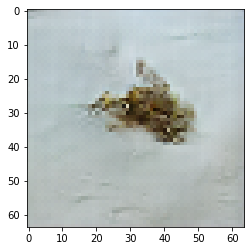

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 17

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.698744535446167 sec
Gen loss: 1.9376318078292043, Disc loss: 2.1338820331975032, Disc valid real loss: 0.39045337156245585, Disc valid fake loss: 0.37815120424094956, Disc class real loss: 0.6830830793631705, Disc class fake loss: 0.1597489291115811
Time for epoch 2 is 0.6983206272125244 sec
Gen loss: 1.8114342062096846, Disc loss: 2.1834662838986048, Disc valid real loss: 0.4113320284768155, Disc valid fake loss: 0.3932191635432996, Disc class real loss: 0.6908641739895469, Disc class fake loss: 0.15869594914348503
Time for epoch 3 is 0.6952743530273438 sec
Gen loss: 1.8139333599492122, Disc loss: 2.097570218537983, Disc valid real loss: 0.3930263017353259, Disc valid fake loss: 0.3945035244289197, Disc class real loss: 0.6572930750093962, Disc class fake loss: 0.14581464858431564
Time for epoch 4 is 0.697392463684082 sec
Gen loss: 1.83369767038445

Time for epoch 31 is 0.6922221183776855 sec
Gen loss: 1.8671622840981734, Disc loss: 2.0847157428139136, Disc valid real loss: 0.41608456718294246, Disc valid fake loss: 0.37342915095781026, Disc class real loss: 0.6729516543840107, Disc class fake loss: 0.21077443816159902
Time for epoch 32 is 0.6977519989013672 sec
Gen loss: 1.7892294181020636, Disc loss: 2.1057870262547542, Disc valid real loss: 0.39223656999437434, Disc valid fake loss: 0.3786374299149764, Disc class real loss: 0.6959604652304399, Disc class fake loss: 0.19267498897878746
Time for epoch 33 is 0.6967806816101074 sec
Gen loss: 1.8677819339852584, Disc loss: 2.0738456123753597, Disc valid real loss: 0.4171918191407856, Disc valid fake loss: 0.3825746837415193, Disc class real loss: 0.665047686350973, Disc class fake loss: 0.1859971998553527
Time for epoch 34 is 0.7003045082092285 sec
Gen loss: 1.7317738470278288, Disc loss: 2.0724119763625297, Disc valid real loss: 0.37892588345628037, Disc valid fake loss: 0.40532125

Time for epoch 62 is 0.696983814239502 sec
Gen loss: 1.8222776023965133, Disc loss: 2.0429638184999166, Disc valid real loss: 0.3826518231316617, Disc valid fake loss: 0.3747401817848808, Disc class real loss: 0.6937615557720787, Disc class fake loss: 0.2331706293319401
Time for epoch 63 is 0.6970036029815674 sec
Gen loss: 1.8848501506604647, Disc loss: 1.986316442489624, Disc valid real loss: 0.40121744180980484, Disc valid fake loss: 0.3961464699945952, Disc class real loss: 0.6422235495165775, Disc class fake loss: 0.2176510123045821
Time for epoch 64 is 0.6990561485290527 sec
Gen loss: 1.8042429560109188, Disc loss: 2.030055748788934, Disc valid real loss: 0.39663673858893544, Disc valid fake loss: 0.4018416592949315, Disc class real loss: 0.6650554035839281, Disc class fake loss: 0.23394120602231278
Time for epoch 65 is 0.6989412307739258 sec
Gen loss: 1.827825295297723, Disc loss: 2.014768079707497, Disc valid real loss: 0.3680078010810049, Disc valid fake loss: 0.394344088278318

Time for epoch 93 is 0.6955745220184326 sec
Gen loss: 1.9658716352362382, Disc loss: 1.9832016919788562, Disc valid real loss: 0.37844460732058477, Disc valid fake loss: 0.4025346103467439, Disc class real loss: 0.6740487092419675, Disc class fake loss: 0.23581691321573758
Time for epoch 94 is 0.6970920562744141 sec
Gen loss: 1.863092491501256, Disc loss: 1.9681407777886641, Disc valid real loss: 0.3888382927367562, Disc valid fake loss: 0.4141507603620228, Disc class real loss: 0.6617286519000405, Disc class fake loss: 0.19135217172534844
Time for epoch 95 is 0.6976728439331055 sec
Gen loss: 2.057720993694506, Disc loss: 1.97382054203435, Disc valid real loss: 0.3936192346246619, Disc valid fake loss: 0.3977824888731304, Disc class real loss: 0.6613888960135611, Disc class fake loss: 0.24870521535998896
Time for epoch 96 is 0.6978027820587158 sec
Gen loss: 1.8685907564665143, Disc loss: 1.9665242621773167, Disc valid real loss: 0.39416305956087616, Disc valid fake loss: 0.397556362967

Time for epoch 123 is 0.6954007148742676 sec
Gen loss: 1.930472311220671, Disc loss: 1.888399274725663, Disc valid real loss: 0.3869977922816026, Disc valid fake loss: 0.3749840651687823, Disc class real loss: 0.6665638214663455, Disc class fake loss: 0.1976941792588485
Time for epoch 124 is 0.6988525390625 sec
Gen loss: 1.8970282579723157, Disc loss: 1.9187003938775313, Disc valid real loss: 0.40600842237472534, Disc valid fake loss: 0.39621211509955556, Disc class real loss: 0.664284957082648, Disc class fake loss: 0.18714484376342674
Time for epoch 125 is 0.6967480182647705 sec
Gen loss: 1.869822665264732, Disc loss: 1.9383290253187482, Disc valid real loss: 0.38584167392630325, Disc valid fake loss: 0.3994699277375874, Disc class real loss: 0.6776745382108187, Disc class fake loss: 0.22610192393001757
Time for epoch 126 is 0.6974678039550781 sec
Gen loss: 1.9166338631981297, Disc loss: 1.8809931152745296, Disc valid real loss: 0.3943864075761092, Disc valid fake loss: 0.38099780521

Time for epoch 153 is 0.7107603549957275 sec
Gen loss: 1.9458713406010677, Disc loss: 1.865455188249287, Disc valid real loss: 0.4136569060777363, Disc valid fake loss: 0.39073791001972397, Disc class real loss: 0.6528181778757196, Disc class fake loss: 0.2072203563232171
Time for epoch 154 is 0.7130696773529053 sec
Gen loss: 1.9555019328468723, Disc loss: 1.840558271659048, Disc valid real loss: 0.3681471018414748, Disc valid fake loss: 0.3869461072118659, Disc class real loss: 0.6787804208303753, Disc class fake loss: 0.18625940813830025
Time for epoch 155 is 0.7129065990447998 sec
Gen loss: 1.9328911743665997, Disc loss: 1.886095222673918, Disc valid real loss: 0.39687591791152954, Disc valid fake loss: 0.42124258844476, Disc class real loss: 0.6721469101152922, Disc class fake loss: 0.1752400178658335
Time for epoch 156 is 0.703789234161377 sec
Gen loss: 1.936636993759557, Disc loss: 1.8358512175710577, Disc valid real loss: 0.3928656562378532, Disc valid fake loss: 0.4047983163281

Time for epoch 183 is 0.6995184421539307 sec
Gen loss: 1.9289289336455495, Disc loss: 1.8351953657049882, Disc valid real loss: 0.39904338121414185, Disc valid fake loss: 0.39880143105983734, Disc class real loss: 0.6707987785339355, Disc class fake loss: 0.20768842179524272
Time for epoch 184 is 0.6982591152191162 sec
Gen loss: 1.9424657319721423, Disc loss: 1.8061758593509072, Disc valid real loss: 0.40006640396620097, Disc valid fake loss: 0.4015692284232692, Disc class real loss: 0.657947157558642, Disc class fake loss: 0.18658830382322011
Time for epoch 185 is 0.6983559131622314 sec
Gen loss: 2.010454585677699, Disc loss: 1.7955554660997892, Disc valid real loss: 0.38206285865683304, Disc valid fake loss: 0.42097321623250056, Disc class real loss: 0.643852152322468, Disc class fake loss: 0.1993770254285712
Time for epoch 186 is 0.695667028427124 sec
Gen loss: 1.901955115167718, Disc loss: 1.8145369354047274, Disc valid real loss: 0.4099524930903786, Disc valid fake loss: 0.3837251

Time for epoch 213 is 0.6915128231048584 sec
Gen loss: 1.9882671958521794, Disc loss: 1.6992502212524414, Disc valid real loss: 0.3717859701106423, Disc valid fake loss: 0.3917599304726249, Disc class real loss: 0.6524539872219688, Disc class fake loss: 0.16979453124498067
Time for epoch 214 is 0.6965131759643555 sec
Gen loss: 1.9115544620313143, Disc loss: 1.736377477645874, Disc valid real loss: 0.40400503497374685, Disc valid fake loss: 0.3831769526004791, Disc class real loss: 0.6479147013865019, Disc class fake loss: 0.19684054349598132
Time for epoch 215 is 0.6931922435760498 sec
Gen loss: 1.9350692912151939, Disc loss: 1.7412339072478444, Disc valid real loss: 0.3922134982912164, Disc valid fake loss: 0.39765466514386627, Disc class real loss: 0.657358677763688, Disc class fake loss: 0.18676982271043877
Time for epoch 216 is 0.6940493583679199 sec
Gen loss: 1.975015872403195, Disc loss: 1.7171752264625149, Disc valid real loss: 0.39254841365312276, Disc valid fake loss: 0.399700

Time for epoch 243 is 0.7017168998718262 sec
Gen loss: 1.9559852512259233, Disc loss: 1.654872593126799, Disc valid real loss: 0.38581387777077525, Disc valid fake loss: 0.37964946658987747, Disc class real loss: 0.6643655802074232, Disc class fake loss: 0.1610668050615411
Time for epoch 244 is 0.700183629989624 sec
Gen loss: 1.970947918139006, Disc loss: 1.7143198941883289, Disc valid real loss: 0.41007374619182785, Disc valid fake loss: 0.4063795836348283, Disc class real loss: 0.6854070487775301, Disc class fake loss: 0.14586117530339643
Time for epoch 245 is 0.7006387710571289 sec
Gen loss: 1.9953576012661582, Disc loss: 1.6689108045477616, Disc valid real loss: 0.384078534025895, Disc valid fake loss: 0.38325397905550507, Disc class real loss: 0.6717380912680375, Disc class fake loss: 0.16966945991704338
Time for epoch 246 is 0.694084882736206 sec
Gen loss: 1.9907289492456537, Disc loss: 1.6370485456366288, Disc valid real loss: 0.3745087714571702, Disc valid fake loss: 0.39912667

Time for epoch 273 is 0.6973974704742432 sec
Gen loss: 2.0277318703500846, Disc loss: 1.6272968681235063, Disc valid real loss: 0.386308186932614, Disc valid fake loss: 0.39850739428871557, Disc class real loss: 0.6794144166143317, Disc class fake loss: 0.15305180612363314
Time for epoch 274 is 0.6958003044128418 sec
Gen loss: 1.9078489792974371, Disc loss: 1.682418892258092, Disc valid real loss: 0.4201888034218236, Disc valid fake loss: 0.3880596631451657, Disc class real loss: 0.692162601571334, Disc class fake loss: 0.1739321998075435
Time for epoch 275 is 0.6952028274536133 sec
Gen loss: 1.9217518254330284, Disc loss: 1.6314454580608166, Disc valid real loss: 0.39685606642773275, Disc valid fake loss: 0.413852638319919, Disc class real loss: 0.6527887708262393, Disc class fake loss: 0.1621029741669956
Time for epoch 276 is 0.6945788860321045 sec
Gen loss: 1.917086124420166, Disc loss: 1.600254215692219, Disc valid real loss: 0.40018266125729207, Disc valid fake loss: 0.39388791510

Time for epoch 303 is 0.7073814868927002 sec
Gen loss: 2.021218406526666, Disc loss: 1.6046921265752692, Disc valid real loss: 0.4090037502740559, Disc valid fake loss: 0.39975699076527044, Disc class real loss: 0.6487768041460138, Disc class fake loss: 0.14725491561387716
Time for epoch 304 is 0.7056851387023926 sec
Gen loss: 1.970995501468056, Disc loss: 1.6544663404163562, Disc valid real loss: 0.39737843682891444, Disc valid fake loss: 0.4044494268141295, Disc class real loss: 0.6914647598015634, Disc class fake loss: 0.1612797953972691
Time for epoch 305 is 0.708756685256958 sec
Gen loss: 1.9673079754176892, Disc loss: 1.5551160197508962, Disc valid real loss: 0.40029433683345195, Disc valid fake loss: 0.39572400482077347, Disc class real loss: 0.6389491981581638, Disc class fake loss: 0.12025225770316626
Time for epoch 306 is 0.7059540748596191 sec
Gen loss: 1.9650503208762722, Disc loss: 1.577373887363233, Disc valid real loss: 0.3893940778155076, Disc valid fake loss: 0.3922397

Time for epoch 333 is 0.6917176246643066 sec
Gen loss: 1.94255436721601, Disc loss: 1.6273834454385858, Disc valid real loss: 0.41182185787903636, Disc valid fake loss: 0.38069912320689153, Disc class real loss: 0.7014369274440565, Disc class fake loss: 0.1335391761048844
Time for epoch 334 is 0.6936872005462646 sec
Gen loss: 1.9505934589787532, Disc loss: 1.5685771013561047, Disc valid real loss: 0.37619194937379735, Disc valid fake loss: 0.3827341747911353, Disc class real loss: 0.662566435964484, Disc class fake loss: 0.1471876458902108
Time for epoch 335 is 0.6940009593963623 sec
Gen loss: 2.0276997528578105, Disc loss: 1.6013418373308683, Disc valid real loss: 0.39976529541768524, Disc valid fake loss: 0.38615310505816813, Disc class real loss: 0.6631474934126201, Disc class fake loss: 0.1523781140383921
Time for epoch 336 is 0.6913120746612549 sec
Gen loss: 1.9781118631362915, Disc loss: 1.648690430741561, Disc valid real loss: 0.39930017527781037, Disc valid fake loss: 0.3957380

Time for epoch 363 is 0.6957557201385498 sec
Gen loss: 1.9141620523051213, Disc loss: 1.6167216740156476, Disc valid real loss: 0.4044560241071801, Disc valid fake loss: 0.3890756023557563, Disc class real loss: 0.6685642725542972, Disc class fake loss: 0.1547285832072559
Time for epoch 364 is 0.6938250064849854 sec
Gen loss: 1.9560295970816362, Disc loss: 1.5885728911349648, Disc valid real loss: 0.398984515353253, Disc valid fake loss: 0.36188815926250656, Disc class real loss: 0.6666422047113117, Disc class fake loss: 0.1611591514788176
Time for epoch 365 is 0.700432538986206 sec
Gen loss: 1.890431517048886, Disc loss: 1.5939088746121055, Disc valid real loss: 0.38720809315380295, Disc valid fake loss: 0.4069840562971015, Disc class real loss: 0.6584115059752214, Disc class fake loss: 0.1414086493222337
Time for epoch 366 is 0.7014408111572266 sec
Gen loss: 1.9501864910125732, Disc loss: 1.62543649422495, Disc valid real loss: 0.41484828999167994, Disc valid fake loss: 0.39805033959

Time for epoch 393 is 0.7008051872253418 sec
Gen loss: 1.9322602560645656, Disc loss: 1.6284215011094745, Disc valid real loss: 0.3993538476918873, Disc valid fake loss: 0.38433516652960525, Disc class real loss: 0.686898725597482, Disc class fake loss: 0.15793957600468084
Time for epoch 394 is 0.6987652778625488 sec
Gen loss: 2.0622365725667855, Disc loss: 1.588342547416687, Disc valid real loss: 0.38561669070469706, Disc valid fake loss: 0.3849903713715704, Disc class real loss: 0.685073899595361, Disc class fake loss: 0.1327720809923975
Time for epoch 395 is 0.6965391635894775 sec
Gen loss: 1.9082118837456954, Disc loss: 1.5890969539943494, Disc valid real loss: 0.39799685227243525, Disc valid fake loss: 0.3875327816135005, Disc class real loss: 0.6690006193361784, Disc class fake loss: 0.1346735409215877
Time for epoch 396 is 0.6960794925689697 sec
Gen loss: 2.0138062991594015, Disc loss: 1.553183819118299, Disc valid real loss: 0.3636968865206367, Disc valid fake loss: 0.386298728

Time for epoch 423 is 0.6967229843139648 sec
Gen loss: 2.014210669617904, Disc loss: 1.5817554373490184, Disc valid real loss: 0.3884305891237761, Disc valid fake loss: 0.3785929224993053, Disc class real loss: 0.6878840484117207, Disc class fake loss: 0.12696006305907903
Time for epoch 424 is 0.697490930557251 sec
Gen loss: 1.9509575304232145, Disc loss: 1.5603226799713938, Disc valid real loss: 0.3778258640515177, Disc valid fake loss: 0.3796136520410839, Disc class real loss: 0.6567158228472659, Disc class fake loss: 0.14626942574977875
Time for epoch 425 is 0.6974213123321533 sec
Gen loss: 1.9473095442119397, Disc loss: 1.6135105710280568, Disc valid real loss: 0.3698594460361882, Disc valid fake loss: 0.3796246757632808, Disc class real loss: 0.6737317474264848, Disc class fake loss: 0.19039141445567734
Time for epoch 426 is 0.6987009048461914 sec
Gen loss: 2.0318722599431087, Disc loss: 1.6035351878718327, Disc valid real loss: 0.37471382868917363, Disc valid fake loss: 0.4065247

Time for epoch 453 is 0.7136476039886475 sec
Gen loss: 1.901290266137374, Disc loss: 1.6117721105876721, Disc valid real loss: 0.3897672813189657, Disc valid fake loss: 0.41459459850662633, Disc class real loss: 0.664914962492491, Disc class fake loss: 0.1425997434478057
Time for epoch 454 is 0.6988880634307861 sec
Gen loss: 1.907012707308719, Disc loss: 1.6132920604003103, Disc valid real loss: 0.4129320539926228, Disc valid fake loss: 0.3918650934570714, Disc class real loss: 0.6742743285078752, Disc class fake loss: 0.13432861119508743
Time for epoch 455 is 0.7072980403900146 sec
Gen loss: 1.9158924692555477, Disc loss: 1.6084216833114624, Disc valid real loss: 0.4011787411413695, Disc valid fake loss: 0.4079277233073586, Disc class real loss: 0.6802825519913122, Disc class fake loss: 0.11914494574854248
Time for epoch 456 is 0.6966714859008789 sec
Gen loss: 1.9574672171944065, Disc loss: 1.6201279163360596, Disc valid real loss: 0.4011597852957876, Disc valid fake loss: 0.383040967

Time for epoch 483 is 0.6928462982177734 sec
Gen loss: 1.9298035031870793, Disc loss: 1.6266031077033596, Disc valid real loss: 0.40613277334915965, Disc valid fake loss: 0.3882159073101847, Disc class real loss: 0.6613399449147677, Disc class fake loss: 0.17101256470931203
Time for epoch 484 is 0.694655179977417 sec
Gen loss: 2.018409528230366, Disc loss: 1.561979237355684, Disc valid real loss: 0.39615810701721593, Disc valid fake loss: 0.3620851761416385, Disc class real loss: 0.6611204978666807, Disc class fake loss: 0.14271915900079826
Time for epoch 485 is 0.6933112144470215 sec
Gen loss: 2.097416877746582, Disc loss: 1.5644215533607884, Disc valid real loss: 0.3853141963481903, Disc valid fake loss: 0.38906704673641607, Disc class real loss: 0.6458638310432434, Disc class fake loss: 0.14427682247601056
Time for epoch 486 is 0.6917910575866699 sec
Gen loss: 2.0862120954613936, Disc loss: 1.6406398823386745, Disc valid real loss: 0.378658369967812, Disc valid fake loss: 0.40324602

Time for epoch 513 is 0.6954400539398193 sec
Gen loss: 1.9092420214100887, Disc loss: 1.625569920790823, Disc valid real loss: 0.3841627867598283, Disc valid fake loss: 0.4031770519520107, Disc class real loss: 0.6730551468698602, Disc class fake loss: 0.1652765054451792
Time for epoch 514 is 0.6971447467803955 sec
Gen loss: 1.979154160148219, Disc loss: 1.6090115371503328, Disc valid real loss: 0.39995095761198746, Disc valid fake loss: 0.3963543364876195, Disc class real loss: 0.6590406831942106, Disc class fake loss: 0.15376662149241097
Time for epoch 515 is 0.6911923885345459 sec
Gen loss: 1.9100976743196185, Disc loss: 1.5987555290523328, Disc valid real loss: 0.37389167672709417, Disc valid fake loss: 0.3984176155767943, Disc class real loss: 0.6840597673466331, Disc class fake loss: 0.14249482672465474
Time for epoch 516 is 0.6922309398651123 sec
Gen loss: 1.9984524940189563, Disc loss: 1.6168472013975446, Disc valid real loss: 0.39306679681727763, Disc valid fake loss: 0.391105

Time for epoch 543 is 0.6952691078186035 sec
Gen loss: 1.9150325373599404, Disc loss: 1.6424955631557263, Disc valid real loss: 0.41459501260205317, Disc valid fake loss: 0.4060947659768556, Disc class real loss: 0.6742073172017148, Disc class fake loss: 0.14770375898009852
Time for epoch 544 is 0.6985197067260742 sec
Gen loss: 2.079884698516444, Disc loss: 1.62276880364669, Disc valid real loss: 0.3969686109768717, Disc valid fake loss: 0.395431239353983, Disc class real loss: 0.6774807823331732, Disc class fake loss: 0.1529930994698876
Time for epoch 545 is 0.6972923278808594 sec
Gen loss: 1.9385010192268772, Disc loss: 1.5674084926906384, Disc valid real loss: 0.3924725322346938, Disc valid fake loss: 0.38538550232586105, Disc class real loss: 0.6533067257780778, Disc class fake loss: 0.13634712680390007
Time for epoch 546 is 0.6980209350585938 sec
Gen loss: 2.1679637871290507, Disc loss: 1.5671077402014482, Disc valid real loss: 0.38295397711427587, Disc valid fake loss: 0.38308586

Time for epoch 573 is 0.6959187984466553 sec
Gen loss: 1.999191585339998, Disc loss: 1.5545422215210765, Disc valid real loss: 0.37165919573683487, Disc valid fake loss: 0.374600992390984, Disc class real loss: 0.6692060357645938, Disc class fake loss: 0.1391820264490027
Time for epoch 574 is 0.6958060264587402 sec
Gen loss: 1.9711680475034212, Disc loss: 1.58848658360933, Disc valid real loss: 0.37541039680179794, Disc valid fake loss: 0.38720300166230454, Disc class real loss: 0.6721994657265512, Disc class fake loss: 0.15377739758083694
Time for epoch 575 is 0.6955926418304443 sec
Gen loss: 1.9463884077574078, Disc loss: 1.5639607467149432, Disc valid real loss: 0.3926539985757125, Disc valid fake loss: 0.3847643576170269, Disc class real loss: 0.660078111447786, Disc class fake loss: 0.1265709853093875
Time for epoch 576 is 0.6964905261993408 sec
Gen loss: 1.888450540994343, Disc loss: 1.5791400231813129, Disc valid real loss: 0.39193855382894216, Disc valid fake loss: 0.3936466998

Time for epoch 603 is 0.6966795921325684 sec
Gen loss: 1.9956684865449603, Disc loss: 1.5640487043481124, Disc valid real loss: 0.3585024781917271, Disc valid fake loss: 0.39519934905202764, Disc class real loss: 0.6726852655410767, Disc class fake loss: 0.13776862307598717
Time for epoch 604 is 0.6960568428039551 sec
Gen loss: 1.8836893533405505, Disc loss: 1.5921729614860134, Disc valid real loss: 0.3992881570991717, Disc valid fake loss: 0.40401619202212286, Disc class real loss: 0.6529058280744051, Disc class fake loss: 0.13606617246803485
Time for epoch 605 is 0.6912641525268555 sec
Gen loss: 1.93203089739147, Disc loss: 1.6428386098460148, Disc valid real loss: 0.4096904389168087, Disc valid fake loss: 0.4172652473575191, Disc class real loss: 0.64859150899084, Disc class fake loss: 0.16738770078671605
Time for epoch 606 is 0.6952054500579834 sec
Gen loss: 1.903899211632578, Disc loss: 1.652804355872305, Disc valid real loss: 0.42138635955358805, Disc valid fake loss: 0.388211909

Time for epoch 633 is 0.6974737644195557 sec
Gen loss: 1.9269554865987677, Disc loss: 1.5796820050791691, Disc valid real loss: 0.36678915588479294, Disc valid fake loss: 0.3912695426689951, Disc class real loss: 0.6725241196782965, Disc class fake loss: 0.14920387691573092
Time for epoch 634 is 0.6958057880401611 sec
Gen loss: 1.8338107937260677, Disc loss: 1.6788891051944934, Disc valid real loss: 0.4255491730413939, Disc valid fake loss: 0.4173915025434996, Disc class real loss: 0.6906653360316628, Disc class fake loss: 0.14539216792112902
Time for epoch 635 is 0.6944708824157715 sec
Gen loss: 1.9296375575818514, Disc loss: 1.5678517567484003, Disc valid real loss: 0.3928809150269157, Disc valid fake loss: 0.4038106171708358, Disc class real loss: 0.6345437890604922, Disc class fake loss: 0.13671601014701942
Time for epoch 636 is 0.6991989612579346 sec
Gen loss: 1.9149548505481921, Disc loss: 1.6084555701205605, Disc valid real loss: 0.4068513434184225, Disc valid fake loss: 0.39667

Time for epoch 663 is 0.6980123519897461 sec
Gen loss: 1.9199899246818142, Disc loss: 1.600584444246794, Disc valid real loss: 0.35786576020090205, Disc valid fake loss: 0.38279196933696147, Disc class real loss: 0.695010382878153, Disc class fake loss: 0.16502234065218976
Time for epoch 664 is 0.6971611976623535 sec
Gen loss: 1.9797871363790411, Disc loss: 1.6186543703079224, Disc valid real loss: 0.385975812610827, Disc valid fake loss: 0.3676224554839887, Disc class real loss: 0.6829169110247963, Disc class fake loss: 0.1822393536567688
Time for epoch 665 is 0.6960399150848389 sec
Gen loss: 2.0908055493706152, Disc loss: 1.6085286328667088, Disc valid real loss: 0.38850879512335124, Disc valid fake loss: 0.37494551900186035, Disc class real loss: 0.680526033828133, Disc class fake loss: 0.16465148721870623
Time for epoch 666 is 0.6979126930236816 sec
Gen loss: 2.0924271972555863, Disc loss: 1.588366709257427, Disc valid real loss: 0.3783279516194996, Disc valid fake loss: 0.39056862

Time for epoch 693 is 0.7051565647125244 sec
Gen loss: 1.8709901006598222, Disc loss: 1.6271691887002242, Disc valid real loss: 0.4006293878743523, Disc valid fake loss: 0.3827127280988191, Disc class real loss: 0.6810520416811893, Disc class fake loss: 0.1628786835231279
Time for epoch 694 is 0.7011358737945557 sec
Gen loss: 1.9480395128852444, Disc loss: 1.5665524507823743, Disc valid real loss: 0.3943948024197629, Disc valid fake loss: 0.38201270291679784, Disc class real loss: 0.6600663630585921, Disc class fake loss: 0.13018459042436198
Time for epoch 695 is 0.7066307067871094 sec
Gen loss: 1.8992045678590472, Disc loss: 1.6254462003707886, Disc valid real loss: 0.3795645025215651, Disc valid fake loss: 0.38931210731205185, Disc class real loss: 0.6774630013265108, Disc class fake loss: 0.17920622876600215
Time for epoch 696 is 0.7033617496490479 sec
Gen loss: 2.0617885777824805, Disc loss: 1.6102139949798584, Disc valid real loss: 0.3851870251329322, Disc valid fake loss: 0.39317

Time for epoch 723 is 0.7013289928436279 sec
Gen loss: 1.9720367569672435, Disc loss: 1.6216435306950618, Disc valid real loss: 0.4159756020495766, Disc valid fake loss: 0.40090603263754593, Disc class real loss: 0.6648491683759188, Disc class fake loss: 0.14001769846991488
Time for epoch 724 is 0.6991794109344482 sec
Gen loss: 1.911617774712412, Disc loss: 1.5952969224829423, Disc valid real loss: 0.4062473209280717, Disc valid fake loss: 0.3875894185743834, Disc class real loss: 0.6722120768145511, Disc class fake loss: 0.12935669249609896
Time for epoch 725 is 0.701169490814209 sec
Gen loss: 1.957243285681072, Disc loss: 1.5636333415382786, Disc valid real loss: 0.3796244702841106, Disc valid fake loss: 0.3705216567767294, Disc class real loss: 0.6970974332407901, Disc class fake loss: 0.11650592892577774
Time for epoch 726 is 0.6977031230926514 sec
Gen loss: 1.9435402594114606, Disc loss: 1.6137441773163645, Disc valid real loss: 0.38789790711904826, Disc valid fake loss: 0.4014137

Time for epoch 753 is 0.6931347846984863 sec
Gen loss: 1.9569149832976491, Disc loss: 1.6444418744037026, Disc valid real loss: 0.39678657525464106, Disc valid fake loss: 0.3945971727371216, Disc class real loss: 0.7082700447032326, Disc class fake loss: 0.14490078820994026
Time for epoch 754 is 0.6931982040405273 sec
Gen loss: 2.0613283483605636, Disc loss: 1.6055279844685604, Disc valid real loss: 0.3914971273196371, Disc valid fake loss: 0.408948866944564, Disc class real loss: 0.6604886054992676, Disc class fake loss: 0.14469656779577858
Time for epoch 755 is 0.6951804161071777 sec
Gen loss: 1.9407889780245329, Disc loss: 1.6270491135747809, Disc valid real loss: 0.4027037306835777, Disc valid fake loss: 0.39232545777371053, Disc class real loss: 0.6674817361329731, Disc class fake loss: 0.16463880240917206
Time for epoch 756 is 0.6942510604858398 sec
Gen loss: 1.8267594952332347, Disc loss: 1.6630586636693854, Disc valid real loss: 0.395636753032082, Disc valid fake loss: 0.406090

Time for epoch 783 is 0.6941888332366943 sec
Gen loss: 1.9529258765672382, Disc loss: 1.62777841091156, Disc valid real loss: 0.4067892981202979, Disc valid fake loss: 0.41325222347912033, Disc class real loss: 0.6779016162219801, Disc class fake loss: 0.12994488407122462
Time for epoch 784 is 0.6938388347625732 sec
Gen loss: 1.91734642731516, Disc loss: 1.6316694209450169, Disc valid real loss: 0.3824279747511211, Disc valid fake loss: 0.4113413111159676, Disc class real loss: 0.6797652119084409, Disc class fake loss: 0.15823925757094434
Time for epoch 785 is 0.6944372653961182 sec
Gen loss: 1.95364164678674, Disc loss: 1.6531718530152972, Disc valid real loss: 0.3876039401481026, Disc valid fake loss: 0.39917792301428945, Disc class real loss: 0.7143285556843406, Disc class fake loss: 0.1521738949967058
Time for epoch 786 is 0.6985187530517578 sec
Gen loss: 1.8780360284604525, Disc loss: 1.6445960559343036, Disc valid real loss: 0.38863726979807806, Disc valid fake loss: 0.4033284971

Time for epoch 813 is 0.6928565502166748 sec
Gen loss: 1.9266810668142218, Disc loss: 1.5962020409734625, Disc valid real loss: 0.3793435206538753, Disc valid fake loss: 0.3836981936504966, Disc class real loss: 0.6828403002337405, Disc class fake loss: 0.15042652660294584
Time for epoch 814 is 0.6901750564575195 sec
Gen loss: 2.0406587751288163, Disc loss: 1.621291857016714, Disc valid real loss: 0.39260682149937276, Disc valid fake loss: 0.3782615442025034, Disc class real loss: 0.6660652568465785, Disc class fake loss: 0.18445454106519096
Time for epoch 815 is 0.6891562938690186 sec
Gen loss: 1.9881542544615896, Disc loss: 1.5909672787314968, Disc valid real loss: 0.3748935947292729, Disc valid fake loss: 0.3929816955014279, Disc class real loss: 0.6690076338617426, Disc class fake loss: 0.154187347543867
Time for epoch 816 is 0.6963934898376465 sec
Gen loss: 1.9777898976677342, Disc loss: 1.5855359968386198, Disc valid real loss: 0.3920514646329378, Disc valid fake loss: 0.38978940

Time for epoch 843 is 0.6950652599334717 sec
Gen loss: 1.8778665191248844, Disc loss: 1.6182476344861483, Disc valid real loss: 0.40393745428637456, Disc valid fake loss: 0.3792854076937625, Disc class real loss: 0.681001249112581, Disc class fake loss: 0.15412890205257818
Time for epoch 844 is 0.6947493553161621 sec
Gen loss: 1.8927648883116872, Disc loss: 1.6155992683611418, Disc valid real loss: 0.4090890821657683, Disc valid fake loss: 0.3897443413734436, Disc class real loss: 0.6813729656370062, Disc class fake loss: 0.1355020937166716
Time for epoch 845 is 0.694859504699707 sec
Gen loss: 1.9008658747924, Disc loss: 1.6286700901232267, Disc valid real loss: 0.3975309776632409, Disc valid fake loss: 0.3808686780302148, Disc class real loss: 0.693272452605398, Disc class fake loss: 0.15710524351973282
Time for epoch 846 is 0.697960376739502 sec
Gen loss: 2.0612118306912874, Disc loss: 1.6154397600575496, Disc valid real loss: 0.37761317271935313, Disc valid fake loss: 0.389493465423

Time for epoch 873 is 0.6955161094665527 sec
Gen loss: 2.0281952368585685, Disc loss: 1.6334107549566972, Disc valid real loss: 0.3817206142764342, Disc valid fake loss: 0.39839091740156474, Disc class real loss: 0.68854337303262, Disc class fake loss: 0.16486060227218427
Time for epoch 874 is 0.6961300373077393 sec
Gen loss: 2.016069725940102, Disc loss: 1.6150091886520386, Disc valid real loss: 0.38258934648413406, Disc valid fake loss: 0.38839112300621836, Disc class real loss: 0.6870644374897605, Disc class fake loss: 0.1570703065709064
Time for epoch 875 is 0.693444013595581 sec
Gen loss: 2.029233932495117, Disc loss: 1.6107125031320673, Disc valid real loss: 0.3946209016599153, Disc valid fake loss: 0.3946211659594586, Disc class real loss: 0.6797739737912228, Disc class fake loss: 0.14180407790761246
Time for epoch 876 is 0.6937541961669922 sec
Gen loss: 1.9393958480734574, Disc loss: 1.6443729463376497, Disc valid real loss: 0.4259298302625355, Disc valid fake loss: 0.405446774

Time for epoch 903 is 0.6960000991821289 sec
Gen loss: 1.9313390254974365, Disc loss: 1.6483141560303538, Disc valid real loss: 0.39255217815700333, Disc valid fake loss: 0.39782865894468206, Disc class real loss: 0.6955982917233517, Disc class fake loss: 0.16244167873733922
Time for epoch 904 is 0.6928613185882568 sec
Gen loss: 1.9343253060391075, Disc loss: 1.6593067457801418, Disc valid real loss: 0.4459011633145182, Disc valid fake loss: 0.36729852384642553, Disc class real loss: 0.6688981809114155, Disc class fake loss: 0.17730718811875895
Time for epoch 905 is 0.696997880935669 sec
Gen loss: 1.8887597196980526, Disc loss: 1.6283044438613088, Disc valid real loss: 0.3898953262128328, Disc valid fake loss: 0.38178708365089015, Disc class real loss: 0.6934063120892173, Disc class fake loss: 0.16332177092370234
Time for epoch 906 is 0.6957478523254395 sec
Gen loss: 1.9835044145584106, Disc loss: 1.614744600496794, Disc valid real loss: 0.37940019525979696, Disc valid fake loss: 0.398

Time for epoch 933 is 0.6991806030273438 sec
Gen loss: 1.8864055746480037, Disc loss: 1.6239152582068193, Disc valid real loss: 0.39713412366415324, Disc valid fake loss: 0.3967625357602772, Disc class real loss: 0.6801611655636838, Disc class fake loss: 0.14996350164476194
Time for epoch 934 is 0.7001388072967529 sec
Gen loss: 1.9108410571750842, Disc loss: 1.616391150574935, Disc valid real loss: 0.38990408182144165, Disc valid fake loss: 0.3844862831266303, Disc class real loss: 0.6948354181490446, Disc class fake loss: 0.14727488944405004
Time for epoch 935 is 0.7026116847991943 sec
Gen loss: 1.8760280483647396, Disc loss: 1.5883141630574276, Disc valid real loss: 0.3961445657830489, Disc valid fake loss: 0.3859021036248458, Disc class real loss: 0.6723816912425192, Disc class fake loss: 0.1339935050591042
Time for epoch 936 is 0.6953525543212891 sec
Gen loss: 2.0184543132781982, Disc loss: 1.6427796514410722, Disc valid real loss: 0.3896315129179704, Disc valid fake loss: 0.385553

Time for epoch 963 is 0.690704345703125 sec
Gen loss: 1.9912727067345066, Disc loss: 1.6049329105176424, Disc valid real loss: 0.3988054473149149, Disc valid fake loss: 0.3875989035556191, Disc class real loss: 0.681591742917111, Disc class fake loss: 0.13704576637399823
Time for epoch 964 is 0.6925129890441895 sec
Gen loss: 1.9663821835266917, Disc loss: 1.5988999228728444, Disc valid real loss: 0.368701181913677, Disc valid fake loss: 0.38316429602472407, Disc class real loss: 0.7011261362778513, Disc class fake loss: 0.14601935132553703
Time for epoch 965 is 0.6931478977203369 sec
Gen loss: 1.9736264253917493, Disc loss: 1.567468800042805, Disc valid real loss: 0.39527501087439687, Disc valid fake loss: 0.3669034485754214, Disc class real loss: 0.673204779624939, Disc class fake loss: 0.1321937822197613
Time for epoch 966 is 0.6920816898345947 sec
Gen loss: 1.8745668875543695, Disc loss: 1.6407889378698248, Disc valid real loss: 0.4100586505312669, Disc valid fake loss: 0.3994098039

Time for epoch 993 is 0.6934866905212402 sec
Gen loss: 2.0379828967546163, Disc loss: 1.6431774653886493, Disc valid real loss: 0.4080929928704312, Disc valid fake loss: 0.3695807009935379, Disc class real loss: 0.6969476906876815, Disc class fake loss: 0.1686617477159751
Time for epoch 994 is 0.6900875568389893 sec
Gen loss: 1.9959830296666998, Disc loss: 1.630654266006068, Disc valid real loss: 0.3956356001527686, Disc valid fake loss: 0.4039110557029122, Disc class real loss: 0.6763458910741305, Disc class fake loss: 0.1548660417136393
Time for epoch 995 is 0.6927552223205566 sec
Gen loss: 2.014370033615514, Disc loss: 1.557495631669697, Disc valid real loss: 0.3911983402151811, Disc valid fake loss: 0.38178236076706334, Disc class real loss: 0.6660260401274029, Disc class fake loss: 0.11859841409482454
Time for epoch 996 is 0.6943042278289795 sec
Gen loss: 2.0269064777775814, Disc loss: 1.5964395435232865, Disc valid real loss: 0.3841305688807839, Disc valid fake loss: 0.3916978506

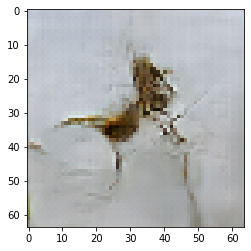

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 18

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.7066709995269775 sec
Gen loss: 1.9258919828816463, Disc loss: 2.1787418879960714, Disc valid real loss: 0.3763140126278526, Disc valid fake loss: 0.3993468723799053, Disc class real loss: 0.702029758378079, Disc class fake loss: 0.15800935343692177
Time for epoch 2 is 0.7101919651031494 sec
Gen loss: 1.7972298358616077, Disc loss: 2.2042161226272583, Disc valid real loss: 0.3846178854766645, Disc valid fake loss: 0.40431302472164754, Disc class real loss: 0.7091382396848578, Disc class fake loss: 0.14396172722703532
Time for epoch 3 is 0.7047462463378906 sec
Gen loss: 1.8514735322249563, Disc loss: 2.115348226145694, Disc valid real loss: 0.38826397531910944, Disc valid fake loss: 0.39942341886068644, Disc class real loss: 0.6661555265125475, Disc class fake loss: 0.14188955096822037
Time for epoch 4 is 0.7074301242828369 sec
Gen loss: 1.84574597760

Time for epoch 31 is 0.6944077014923096 sec
Gen loss: 1.8360817369661833, Disc loss: 2.043116613438255, Disc valid real loss: 0.40863698877786336, Disc valid fake loss: 0.39046570972392436, Disc class real loss: 0.6467790038962113, Disc class fake loss: 0.19487591636808296
Time for epoch 32 is 0.6962039470672607 sec
Gen loss: 1.799249529838562, Disc loss: 2.0659776549590263, Disc valid real loss: 0.406143550810061, Disc valid fake loss: 0.37621493402280304, Disc class real loss: 0.6688222947873568, Disc class fake loss: 0.19219260192231127
Time for epoch 33 is 0.6962971687316895 sec
Gen loss: 1.7893169365431134, Disc loss: 2.0933939594971505, Disc valid real loss: 0.39721869010674327, Disc valid fake loss: 0.40425946994831685, Disc class real loss: 0.6736950403765628, Disc class fake loss: 0.19909800196948804
Time for epoch 34 is 0.6982119083404541 sec
Gen loss: 1.8478205392235203, Disc loss: 2.0616384744644165, Disc valid real loss: 0.3963611031833448, Disc valid fake loss: 0.37877387

Time for epoch 62 is 0.69931960105896 sec
Gen loss: 1.765620137515821, Disc loss: 2.0000650318045365, Disc valid real loss: 0.39290421730593633, Disc valid fake loss: 0.3775664818914313, Disc class real loss: 0.6662638783454895, Disc class fake loss: 0.20126886038403763
Time for epoch 63 is 0.6986069679260254 sec
Gen loss: 1.9126972273776406, Disc loss: 2.01163837784215, Disc valid real loss: 0.39297080353686686, Disc valid fake loss: 0.4172432626548566, Disc class real loss: 0.6489822864532471, Disc class fake loss: 0.21956360026409752
Time for epoch 64 is 0.6985044479370117 sec
Gen loss: 1.8359407562958567, Disc loss: 2.03694528655002, Disc valid real loss: 0.3996101821723737, Disc valid fake loss: 0.4005361152322669, Disc class real loss: 0.6721110124337045, Disc class fake loss: 0.2017827504559567
Time for epoch 65 is 0.6949539184570312 sec
Gen loss: 1.7914056777954102, Disc loss: 2.014913753459328, Disc valid real loss: 0.3818572194952714, Disc valid fake loss: 0.3979429022261971,

Time for epoch 93 is 0.6974291801452637 sec
Gen loss: 1.9048596181367572, Disc loss: 1.9610299373927869, Disc valid real loss: 0.39675966218898173, Disc valid fake loss: 0.37998886327994497, Disc class real loss: 0.6672375578629343, Disc class fake loss: 0.21608471399859377
Time for epoch 94 is 0.6992533206939697 sec
Gen loss: 1.8819490420190912, Disc loss: 1.9521621967616833, Disc valid real loss: 0.39678471025667694, Disc valid fake loss: 0.38529119993511, Disc class real loss: 0.6596796010669909, Disc class fake loss: 0.2161149147309755
Time for epoch 95 is 0.6960968971252441 sec
Gen loss: 1.9619510048314144, Disc loss: 1.9333777992348922, Disc valid real loss: 0.3753216250946647, Disc valid fake loss: 0.3944383342015116, Disc class real loss: 0.6529654656585894, Disc class fake loss: 0.23457654447931992
Time for epoch 96 is 0.6953551769256592 sec
Gen loss: 2.035072866239046, Disc loss: 1.9557654418443378, Disc valid real loss: 0.37559686993297775, Disc valid fake loss: 0.4002503297

Time for epoch 123 is 0.696829080581665 sec
Gen loss: 1.964634148698104, Disc loss: 1.879565295420195, Disc valid real loss: 0.4011143226372568, Disc valid fake loss: 0.37484501537523773, Disc class real loss: 0.6512326723650882, Disc class fake loss: 0.2001312382911381
Time for epoch 124 is 0.6997082233428955 sec
Gen loss: 1.8298136936990839, Disc loss: 1.851767571348893, Disc valid real loss: 0.39053971045895625, Disc valid fake loss: 0.3889642075488442, Disc class real loss: 0.6402411335393002, Disc class fake loss: 0.17186085840589121
Time for epoch 125 is 0.6980011463165283 sec
Gen loss: 1.8711513155385067, Disc loss: 1.940972133686668, Disc valid real loss: 0.39315027861218704, Disc valid fake loss: 0.40776573827392176, Disc class real loss: 0.6759579652234128, Disc class fake loss: 0.2031721394313009
Time for epoch 126 is 0.6941089630126953 sec
Gen loss: 1.8702321429001658, Disc loss: 1.8789059362913434, Disc valid real loss: 0.3845486327221519, Disc valid fake loss: 0.390984304

Time for epoch 153 is 0.6966590881347656 sec
Gen loss: 1.9157180535165887, Disc loss: 1.8711416721343994, Disc valid real loss: 0.38469709534394114, Disc valid fake loss: 0.39603113971258463, Disc class real loss: 0.6722461706713626, Disc class fake loss: 0.20941921088256335
Time for epoch 154 is 0.6989305019378662 sec
Gen loss: 1.9179986464349847, Disc loss: 1.8468334612093473, Disc valid real loss: 0.39290885078279597, Disc valid fake loss: 0.4041842206528312, Disc class real loss: 0.6582218910518446, Disc class fake loss: 0.1754934297580468
Time for epoch 155 is 0.6966254711151123 sec
Gen loss: 1.991543211435017, Disc loss: 1.7667023382688825, Disc valid real loss: 0.3792577346688823, Disc valid fake loss: 0.3714950665047294, Disc class real loss: 0.6326320955627843, Disc class fake loss: 0.1842489564105084
Time for epoch 156 is 0.6950283050537109 sec
Gen loss: 1.8758795637833445, Disc loss: 1.84501828645405, Disc valid real loss: 0.38733788540488795, Disc valid fake loss: 0.4007879

Time for epoch 183 is 0.6980915069580078 sec
Gen loss: 2.0278323261361373, Disc loss: 1.8227902964541787, Disc valid real loss: 0.3807072223801362, Disc valid fake loss: 0.39645323471019145, Disc class real loss: 0.6798616710462069, Disc class fake loss: 0.20162918928422427
Time for epoch 184 is 0.6985852718353271 sec
Gen loss: 1.9644626880946912, Disc loss: 1.8145750384581716, Disc valid real loss: 0.4174900807832417, Disc valid fake loss: 0.3862127959728241, Disc class real loss: 0.6604471802711487, Disc class fake loss: 0.1910880419768785
Time for epoch 185 is 0.6937077045440674 sec
Gen loss: 1.9740974275689376, Disc loss: 1.777783613455923, Disc valid real loss: 0.3875151731465992, Disc valid fake loss: 0.38958942890167236, Disc class real loss: 0.639519391875518, Disc class fake loss: 0.2203141097959719
Time for epoch 186 is 0.6911525726318359 sec
Gen loss: 1.951566269523219, Disc loss: 1.8123068809509277, Disc valid real loss: 0.39909345068429647, Disc valid fake loss: 0.40845398

Time for epoch 213 is 0.6979186534881592 sec
Gen loss: 2.0181291103363037, Disc loss: 1.7123566050278514, Disc valid real loss: 0.3744683250000602, Disc valid fake loss: 0.4194195568561554, Disc class real loss: 0.6347276254704124, Disc class fake loss: 0.17582683461277107
Time for epoch 214 is 0.694840669631958 sec
Gen loss: 2.013423285986248, Disc loss: 1.8018510153419094, Disc valid real loss: 0.4029699234586013, Disc valid fake loss: 0.3965094709082654, Disc class real loss: 0.6935389857543143, Disc class fake loss: 0.19294400944521553
Time for epoch 215 is 0.6947216987609863 sec
Gen loss: 1.9458831862399453, Disc loss: 1.7378634653593366, Disc valid real loss: 0.406467971048857, Disc valid fake loss: 0.40006049055802195, Disc class real loss: 0.6449455462004009, Disc class fake loss: 0.1805456766956731
Time for epoch 216 is 0.6940834522247314 sec
Gen loss: 1.8559844995799817, Disc loss: 1.7215251922607422, Disc valid real loss: 0.4038594694514024, Disc valid fake loss: 0.379761242

Time for epoch 243 is 0.6998722553253174 sec
Gen loss: 2.168345043533727, Disc loss: 1.6980155643663908, Disc valid real loss: 0.38998370578414515, Disc valid fake loss: 0.36442108373892934, Disc class real loss: 0.6601599862701014, Disc class fake loss: 0.22851691002908506
Time for epoch 244 is 0.6968808174133301 sec
Gen loss: 2.0952221406133553, Disc loss: 1.7541757382844623, Disc valid real loss: 0.38888841945874064, Disc valid fake loss: 0.4012141525745392, Disc class real loss: 0.681211110792662, Disc class fake loss: 0.22671596549059214
Time for epoch 245 is 0.695965051651001 sec
Gen loss: 1.8605592439049168, Disc loss: 1.6880703097895573, Disc valid real loss: 0.3974863259415877, Disc valid fake loss: 0.3998845917613883, Disc class real loss: 0.6576490653188605, Disc class fake loss: 0.17525073023218857
Time for epoch 246 is 0.6973292827606201 sec
Gen loss: 2.055411602321424, Disc loss: 1.6833414654982717, Disc valid real loss: 0.38645713109719126, Disc valid fake loss: 0.387096

Time for epoch 273 is 0.6959047317504883 sec
Gen loss: 1.9885440060966892, Disc loss: 1.6269631448544954, Disc valid real loss: 0.39126494056300115, Disc valid fake loss: 0.41099624414193003, Disc class real loss: 0.6602815640600104, Disc class fake loss: 0.15476014857229434
Time for epoch 274 is 0.6972596645355225 sec
Gen loss: 1.9220366728933234, Disc loss: 1.6489034263711226, Disc valid real loss: 0.4080534389144496, Disc valid fake loss: 0.4125687370174809, Disc class real loss: 0.670850251850329, Disc class fake loss: 0.14940659035193293
Time for epoch 275 is 0.699873685836792 sec
Gen loss: 1.9810039683392173, Disc loss: 1.5952071892587762, Disc valid real loss: 0.3902117908000946, Disc valid fake loss: 0.39852159431106166, Disc class real loss: 0.6458978056907654, Disc class fake loss: 0.15474470626366765
Time for epoch 276 is 0.69663405418396 sec
Gen loss: 1.9186022532613654, Disc loss: 1.609110857311048, Disc valid real loss: 0.38820745443042953, Disc valid fake loss: 0.3953514

Time for epoch 303 is 0.6965076923370361 sec
Gen loss: 2.1932894430662455, Disc loss: 1.613988198732075, Disc valid real loss: 0.3711115278695759, Disc valid fake loss: 0.417470572810424, Disc class real loss: 0.6546856290415713, Disc class fake loss: 0.1708172649929398
Time for epoch 304 is 0.6947262287139893 sec
Gen loss: 2.1061362216347144, Disc loss: 1.7261034940418445, Disc valid real loss: 0.3878580739623622, Disc valid fake loss: 0.4228711379201789, Disc class real loss: 0.6933140848812304, Disc class fake loss: 0.2221544071247703
Time for epoch 305 is 0.6985013484954834 sec
Gen loss: 2.062641971989682, Disc loss: 1.6365038281992863, Disc valid real loss: 0.39884627806512934, Disc valid fake loss: 0.3859123838575263, Disc class real loss: 0.6768320485165245, Disc class fake loss: 0.17501347943356163
Time for epoch 306 is 0.6984038352966309 sec
Gen loss: 2.0409452789708187, Disc loss: 1.6321323921805935, Disc valid real loss: 0.37607164524103465, Disc valid fake loss: 0.388643680

Time for epoch 333 is 0.6979269981384277 sec
Gen loss: 1.9854931329426013, Disc loss: 1.6946882448698346, Disc valid real loss: 0.41796498392757614, Disc valid fake loss: 0.41205947179543345, Disc class real loss: 0.6895787747282731, Disc class fake loss: 0.17518790889727442
Time for epoch 334 is 0.6967284679412842 sec
Gen loss: 1.9663680666371395, Disc loss: 1.5830408209248592, Disc valid real loss: 0.36833062611128153, Disc valid fake loss: 0.39766047032255875, Disc class real loss: 0.6759476442086069, Disc class fake loss: 0.1412090404253257
Time for epoch 335 is 0.696237325668335 sec
Gen loss: 1.896662712097168, Disc loss: 1.6097550643117804, Disc valid real loss: 0.3732952726514716, Disc valid fake loss: 0.3982117081943311, Disc class real loss: 0.6894275389219585, Disc class fake loss: 0.14892866305614771
Time for epoch 336 is 0.6974644660949707 sec
Gen loss: 1.8573306046034161, Disc loss: 1.6379117024572272, Disc valid real loss: 0.41012887578261525, Disc valid fake loss: 0.3901

Time for epoch 363 is 0.6983661651611328 sec
Gen loss: 1.8774348434649015, Disc loss: 1.6499707322371633, Disc valid real loss: 0.3853550490580107, Disc valid fake loss: 0.42272977609383433, Disc class real loss: 0.6717019520307842, Disc class fake loss: 0.1702842753576605
Time for epoch 364 is 0.6970999240875244 sec
Gen loss: 2.0470289556603682, Disc loss: 1.5915105656573647, Disc valid real loss: 0.3883113076812343, Disc valid fake loss: 0.39803032655464976, Disc class real loss: 0.662649575032686, Disc class fake loss: 0.14262337551305168
Time for epoch 365 is 0.6956415176391602 sec
Gen loss: 2.0174184974871183, Disc loss: 1.6423955716584857, Disc valid real loss: 0.4116595905078085, Disc valid fake loss: 0.3991783198557402, Disc class real loss: 0.6846217418971815, Disc class fake loss: 0.14704344970615288
Time for epoch 366 is 0.6935009956359863 sec
Gen loss: 1.8904011814217818, Disc loss: 1.589697473927548, Disc valid real loss: 0.39200566709041595, Disc valid fake loss: 0.409350

Time for epoch 393 is 0.6974031925201416 sec
Gen loss: 1.9022895976116783, Disc loss: 1.6101472189551906, Disc valid real loss: 0.36308341277273076, Disc valid fake loss: 0.39396159429299205, Disc class real loss: 0.686196578176398, Disc class fake loss: 0.16700949147343636
Time for epoch 394 is 0.6974771022796631 sec
Gen loss: 1.9915292074805813, Disc loss: 1.5738655893426192, Disc valid real loss: 0.37377813772151347, Disc valid fake loss: 0.40245747723077474, Disc class real loss: 0.6496541343237224, Disc class fake loss: 0.14807618193720518
Time for epoch 395 is 0.6940252780914307 sec
Gen loss: 2.019635470289933, Disc loss: 1.6158615915398848, Disc valid real loss: 0.38721088516084773, Disc valid fake loss: 0.3793407600176962, Disc class real loss: 0.6961321548411721, Disc class fake loss: 0.15328638216382579
Time for epoch 396 is 0.6901931762695312 sec
Gen loss: 1.9877601548245079, Disc loss: 1.6422414842404818, Disc valid real loss: 0.38187529695661443, Disc valid fake loss: 0.40

Time for epoch 423 is 0.696150541305542 sec
Gen loss: 1.9202672305860018, Disc loss: 1.6046267998845953, Disc valid real loss: 0.39678506945308883, Disc valid fake loss: 0.3993853785489735, Disc class real loss: 0.6590067179579484, Disc class fake loss: 0.14955155041656995
Time for epoch 424 is 0.697390079498291 sec
Gen loss: 1.9643043279647827, Disc loss: 1.5827131334104036, Disc valid real loss: 0.3840027608369526, Disc valid fake loss: 0.39410335845068883, Disc class real loss: 0.667582066435563, Disc class fake loss: 0.13713107375722183
Time for epoch 425 is 0.696662425994873 sec
Gen loss: 1.999762823707179, Disc loss: 1.5850920488959865, Disc valid real loss: 0.39789191045259176, Disc valid fake loss: 0.3798854272616537, Disc class real loss: 0.6666354348784999, Disc class fake loss: 0.14078445575739207
Time for epoch 426 is 0.693244457244873 sec
Gen loss: 1.885831826611569, Disc loss: 1.5769231695877879, Disc valid real loss: 0.39771392627766256, Disc valid fake loss: 0.387673159

Time for epoch 453 is 0.6949203014373779 sec
Gen loss: 2.0583017123372933, Disc loss: 1.604233704115215, Disc valid real loss: 0.387815103719109, Disc valid fake loss: 0.3874237490327735, Disc class real loss: 0.6846451978934439, Disc class fake loss: 0.1444577094363539
Time for epoch 454 is 0.6972990036010742 sec
Gen loss: 1.8251179456710815, Disc loss: 1.6687510452772443, Disc valid real loss: 0.3999333946328414, Disc valid fake loss: 0.40824962289709793, Disc class real loss: 0.6792636858789545, Disc class fake loss: 0.18140390907463275
Time for epoch 455 is 0.6936328411102295 sec
Gen loss: 1.9609046045102572, Disc loss: 1.6079175346776058, Disc valid real loss: 0.40795958355853434, Disc valid fake loss: 0.37135463325600876, Disc class real loss: 0.6808064046658968, Disc class fake loss: 0.1479035082616304
Time for epoch 456 is 0.6923196315765381 sec
Gen loss: 2.004340466700102, Disc loss: 1.6283779457995766, Disc valid real loss: 0.3912256642391807, Disc valid fake loss: 0.40143263

Time for epoch 483 is 0.6914780139923096 sec
Gen loss: 1.978476700029875, Disc loss: 1.5667262516523663, Disc valid real loss: 0.3960895914780466, Disc valid fake loss: 0.37505514370767695, Disc class real loss: 0.6484421366139462, Disc class fake loss: 0.14723963643375196
Time for epoch 484 is 0.6970927715301514 sec
Gen loss: 1.9508330069090192, Disc loss: 1.5680757572776394, Disc valid real loss: 0.39382422754639074, Disc valid fake loss: 0.40201374574711446, Disc class real loss: 0.6578159708725778, Disc class fake loss: 0.11453051061222427
Time for epoch 485 is 0.7105100154876709 sec
Gen loss: 1.9424299378144114, Disc loss: 1.58534364323867, Disc valid real loss: 0.4103204498165532, Disc valid fake loss: 0.39157415691174957, Disc class real loss: 0.6328631451255397, Disc class fake loss: 0.1506823195438636
Time for epoch 486 is 0.6967575550079346 sec
Gen loss: 1.922373658732364, Disc loss: 1.5858849600741738, Disc valid real loss: 0.3903079213280427, Disc valid fake loss: 0.3763524

Time for epoch 513 is 0.6955957412719727 sec
Gen loss: 1.8768240213394165, Disc loss: 1.5871274784991616, Disc valid real loss: 0.408590095607858, Disc valid fake loss: 0.3837670683860779, Disc class real loss: 0.6771303132960671, Disc class fake loss: 0.11775186265769758
Time for epoch 514 is 0.6954658031463623 sec
Gen loss: 1.9023430159217434, Disc loss: 1.6261709050128335, Disc valid real loss: 0.38881122438531174, Disc valid fake loss: 0.3873149909471211, Disc class real loss: 0.6954102986737302, Disc class fake loss: 0.15474253069413335
Time for epoch 515 is 0.6929833889007568 sec
Gen loss: 1.930170542315433, Disc loss: 1.583235263824463, Disc valid real loss: 0.382049361341878, Disc valid fake loss: 0.38184989596668045, Disc class real loss: 0.6845925450325012, Disc class fake loss: 0.13485344264068103
Time for epoch 516 is 0.6958532333374023 sec
Gen loss: 1.9434281399375515, Disc loss: 1.6102233372236554, Disc valid real loss: 0.39851306457268565, Disc valid fake loss: 0.3882494

Time for epoch 543 is 0.6952295303344727 sec
Gen loss: 2.212566934133831, Disc loss: 1.547932925977205, Disc valid real loss: 0.36825520819739294, Disc valid fake loss: 0.3778034432938224, Disc class real loss: 0.6483048577057687, Disc class fake loss: 0.15366837068607933
Time for epoch 544 is 0.6959147453308105 sec
Gen loss: 2.0685890913009644, Disc loss: 1.5839645486128957, Disc valid real loss: 0.38406944118048014, Disc valid fake loss: 0.39355663876784475, Disc class real loss: 0.6480672390837419, Disc class fake loss: 0.15836917040379425
Time for epoch 545 is 0.6961760520935059 sec
Gen loss: 1.9645305746480037, Disc loss: 1.5859870785161068, Disc valid real loss: 0.3810215529642607, Disc valid fake loss: 0.3813065172810304, Disc class real loss: 0.6807177035432113, Disc class fake loss: 0.14304886366191663
Time for epoch 546 is 0.6992275714874268 sec
Gen loss: 1.9710450925325091, Disc loss: 1.6412359601572941, Disc valid real loss: 0.39072764547247635, Disc valid fake loss: 0.4002

Time for epoch 573 is 0.6978535652160645 sec
Gen loss: 2.1718606760627344, Disc loss: 1.5987682593496222, Disc valid real loss: 0.3795047221999419, Disc valid fake loss: 0.3854982554912567, Disc class real loss: 0.6790001611960562, Disc class fake loss: 0.15486998032582433
Time for epoch 574 is 0.6961169242858887 sec
Gen loss: 2.1415162964871057, Disc loss: 1.5790487653330754, Disc valid real loss: 0.375391938184437, Disc valid fake loss: 0.3712330052727147, Disc class real loss: 0.6730940373320329, Disc class fake loss: 0.15943252922672974
Time for epoch 575 is 0.6983134746551514 sec
Gen loss: 2.078819306273209, Disc loss: 1.5769406619824862, Disc valid real loss: 0.3770840654247685, Disc valid fake loss: 0.3877415374705666, Disc class real loss: 0.6462321563770896, Disc class fake loss: 0.16597896069288254
Time for epoch 576 is 0.7004568576812744 sec
Gen loss: 1.9821550846099854, Disc loss: 1.6074166235170866, Disc valid real loss: 0.3858738839626312, Disc valid fake loss: 0.38477901

Time for epoch 603 is 0.6961972713470459 sec
Gen loss: 2.005983453047903, Disc loss: 1.6358249752145064, Disc valid real loss: 0.3869029816828276, Disc valid fake loss: 0.38851066247413035, Disc class real loss: 0.68662912280936, Disc class fake loss: 0.17388475019680827
Time for epoch 604 is 0.6901588439941406 sec
Gen loss: 1.9306710770255642, Disc loss: 1.6387177893989964, Disc valid real loss: 0.380642283903925, Disc valid fake loss: 0.4112622596715626, Disc class real loss: 0.7003865147891798, Disc class fake loss: 0.14653752881445384
Time for epoch 605 is 0.6960885524749756 sec
Gen loss: 2.0593399311366833, Disc loss: 1.6575387779035067, Disc valid real loss: 0.3976891778017345, Disc valid fake loss: 0.40765793543112905, Disc class real loss: 0.678767624654268, Disc class fake loss: 0.1735251173377037
Time for epoch 606 is 0.697056770324707 sec
Gen loss: 1.9420584377489591, Disc loss: 1.6017385909431858, Disc valid real loss: 0.3843890969690524, Disc valid fake loss: 0.38423877170

Time for epoch 633 is 0.6972968578338623 sec
Gen loss: 1.9328227921536094, Disc loss: 1.6192494819038792, Disc valid real loss: 0.39548475961936147, Disc valid fake loss: 0.39075501733704615, Disc class real loss: 0.673753277251595, Disc class fake loss: 0.15935931864537692
Time for epoch 634 is 0.6976029872894287 sec
Gen loss: 1.8363205884632312, Disc loss: 1.633968892850374, Disc valid real loss: 0.3919731127588372, Disc valid fake loss: 0.3964155583005202, Disc class real loss: 0.6848489673514115, Disc class fake loss: 0.16083605312987378
Time for epoch 635 is 0.7000176906585693 sec
Gen loss: 1.9814333100067942, Disc loss: 1.55412757396698, Disc valid real loss: 0.3884439844834177, Disc valid fake loss: 0.39984600638088424, Disc class real loss: 0.6427556260635978, Disc class fake loss: 0.12318588263894382
Time for epoch 636 is 0.6973981857299805 sec
Gen loss: 1.9597696254127903, Disc loss: 1.605010791828758, Disc valid real loss: 0.37954904060614736, Disc valid fake loss: 0.3953302

Time for epoch 663 is 0.70054030418396 sec
Gen loss: 1.9247482011192723, Disc loss: 1.6298201523329083, Disc valid real loss: 0.38620692569958537, Disc valid fake loss: 0.3965862173783152, Disc class real loss: 0.6791747651602092, Disc class fake loss: 0.16795452762591212
Time for epoch 664 is 0.6985905170440674 sec
Gen loss: 1.988384955807736, Disc loss: 1.6171840993981612, Disc valid real loss: 0.38366133131478963, Disc valid fake loss: 0.3964238198179948, Disc class real loss: 0.6729107373639157, Disc class fake loss: 0.1642899723037293
Time for epoch 665 is 0.6981079578399658 sec
Gen loss: 2.01007080078125, Disc loss: 1.595376548014189, Disc valid real loss: 0.3844392111426906, Disc valid fake loss: 0.38127521621553523, Disc class real loss: 0.6957165222418936, Disc class fake loss: 0.13405798022684298
Time for epoch 666 is 0.6991682052612305 sec
Gen loss: 2.0568584831137406, Disc loss: 1.634346278090226, Disc valid real loss: 0.37473905086517334, Disc valid fake loss: 0.4109460891

Time for epoch 693 is 0.6973512172698975 sec
Gen loss: 1.9538775556965877, Disc loss: 1.6034461950000964, Disc valid real loss: 0.3957255451302779, Disc valid fake loss: 0.3866570309588784, Disc class real loss: 0.6694058493564004, Disc class fake loss: 0.1517613483102698
Time for epoch 694 is 0.6971406936645508 sec
Gen loss: 1.9093664508116872, Disc loss: 1.6173704360660754, Disc valid real loss: 0.39272742365535934, Disc valid fake loss: 0.39928517529838964, Disc class real loss: 0.6720818092948512, Disc class fake loss: 0.1533797783286948
Time for epoch 695 is 0.6957898139953613 sec
Gen loss: 2.0224106750990214, Disc loss: 1.6089653341393721, Disc valid real loss: 0.38052676069109065, Disc valid fake loss: 0.39451037425743907, Disc class real loss: 0.6872632346655193, Disc class fake loss: 0.14677308460599497
Time for epoch 696 is 0.6988229751586914 sec
Gen loss: 1.9443634121041549, Disc loss: 1.6363030232881244, Disc valid real loss: 0.38832860792938034, Disc valid fake loss: 0.396

Time for epoch 723 is 0.6975574493408203 sec
Gen loss: 1.981056903537951, Disc loss: 1.6444343014767295, Disc valid real loss: 0.4047925495787671, Disc valid fake loss: 0.3992413941182588, Disc class real loss: 0.6772401552451285, Disc class fake loss: 0.16326299348944112
Time for epoch 724 is 0.6967051029205322 sec
Gen loss: 2.022540305790148, Disc loss: 1.5507554004066868, Disc valid real loss: 0.37951981393914475, Disc valid fake loss: 0.3541303543668044, Disc class real loss: 0.6684960942519339, Disc class fake loss: 0.14871311305384888
Time for epoch 725 is 0.6958107948303223 sec
Gen loss: 2.022992786608244, Disc loss: 1.618660700948615, Disc valid real loss: 0.39200862928440694, Disc valid fake loss: 0.3902149310237483, Disc class real loss: 0.6797040575429013, Disc class fake loss: 0.15683766846594058
Time for epoch 726 is 0.6961886882781982 sec
Gen loss: 1.9383315224396556, Disc loss: 1.6359980482804148, Disc valid real loss: 0.391964106183303, Disc valid fake loss: 0.406854919

Time for epoch 753 is 0.6973013877868652 sec
Gen loss: 2.0696180431466353, Disc loss: 1.5632907842334949, Disc valid real loss: 0.38606678498418706, Disc valid fake loss: 0.38464806111235367, Disc class real loss: 0.6679209470748901, Disc class fake loss: 0.12476363385978498
Time for epoch 754 is 0.6974029541015625 sec
Gen loss: 2.0745296227304557, Disc loss: 1.5592296060762907, Disc valid real loss: 0.37083904994161504, Disc valid fake loss: 0.3836978815103832, Disc class real loss: 0.6633629673405698, Disc class fake loss: 0.14143411207355952
Time for epoch 755 is 0.6986722946166992 sec
Gen loss: 1.9853843387804533, Disc loss: 1.5861863274323313, Disc valid real loss: 0.38365895183462845, Disc valid fake loss: 0.39331308320948954, Disc class real loss: 0.6590435912734584, Disc class fake loss: 0.15027246761478877
Time for epoch 756 is 0.6961555480957031 sec
Gen loss: 1.9724360077004683, Disc loss: 1.5928743952199031, Disc valid real loss: 0.3813937267190532, Disc valid fake loss: 0.3

Time for epoch 783 is 0.6951804161071777 sec
Gen loss: 2.0189364458385266, Disc loss: 1.5550369965402704, Disc valid real loss: 0.3897426536208705, Disc valid fake loss: 0.3813188750492899, Disc class real loss: 0.6468606120661685, Disc class fake loss: 0.13721682484212674
Time for epoch 784 is 0.6994531154632568 sec
Gen loss: 1.9730867649379529, Disc loss: 1.5732188413017674, Disc valid real loss: 0.3935365755307047, Disc valid fake loss: 0.3792899282355058, Disc class real loss: 0.6582749611453006, Disc class fake loss: 0.1422205935967596
Time for epoch 785 is 0.6974806785583496 sec
Gen loss: 1.9286242158789384, Disc loss: 1.6318841607947099, Disc valid real loss: 0.3996615896099492, Disc valid fake loss: 0.4040120840072632, Disc class real loss: 0.6458774977608731, Disc class fake loss: 0.18242569444210907
Time for epoch 786 is 0.6972219944000244 sec
Gen loss: 1.9663822901876349, Disc loss: 1.6027531498356868, Disc valid real loss: 0.39569854579473795, Disc valid fake loss: 0.381678

Time for epoch 813 is 0.6976218223571777 sec
Gen loss: 1.9885214253475791, Disc loss: 1.567584426779496, Disc valid real loss: 0.39877063741809443, Disc valid fake loss: 0.38307442163166244, Disc class real loss: 0.6488869409812125, Disc class fake loss: 0.1369548377237822
Time for epoch 814 is 0.6961803436279297 sec
Gen loss: 1.8862519326962923, Disc loss: 1.6047770600569875, Disc valid real loss: 0.39408050712786225, Disc valid fake loss: 0.38088234004221466, Disc class real loss: 0.700929792303788, Disc class fake loss: 0.12899885071735634
Time for epoch 815 is 0.6953203678131104 sec
Gen loss: 1.8754436593306691, Disc loss: 1.6415620414834273, Disc valid real loss: 0.39058672362252284, Disc valid fake loss: 0.3884318376842298, Disc class real loss: 0.7076308162588822, Disc class fake loss: 0.15502319739837395
Time for epoch 816 is 0.6968944072723389 sec
Gen loss: 1.968263776678788, Disc loss: 1.6276465466147976, Disc valid real loss: 0.3888302006219563, Disc valid fake loss: 0.39875

Time for epoch 843 is 0.6916954517364502 sec
Gen loss: 1.9679261885191266, Disc loss: 1.5331526430029618, Disc valid real loss: 0.38131063705996465, Disc valid fake loss: 0.38268459627502843, Disc class real loss: 0.6431584201361004, Disc class fake loss: 0.1261024243737522
Time for epoch 844 is 0.6989285945892334 sec
Gen loss: 1.941310204957661, Disc loss: 1.62483633191962, Disc valid real loss: 0.38828710035273906, Disc valid fake loss: 0.3815226994062725, Disc class real loss: 0.7084857978318867, Disc class fake loss: 0.14665310869091436
Time for epoch 845 is 0.6961486339569092 sec
Gen loss: 1.906034319024337, Disc loss: 1.6259604065041793, Disc valid real loss: 0.4086120567823711, Disc valid fake loss: 0.41034077343187836, Disc class real loss: 0.6600183656341151, Disc class fake loss: 0.14709182514956123
Time for epoch 846 is 0.696866512298584 sec
Gen loss: 1.9322486300217478, Disc loss: 1.597946424233286, Disc valid real loss: 0.3970219947789845, Disc valid fake loss: 0.387361201

Time for epoch 873 is 0.6969168186187744 sec
Gen loss: 2.0620016737988123, Disc loss: 1.5767725329650075, Disc valid real loss: 0.3869632059022, Disc valid fake loss: 0.3788008658509505, Disc class real loss: 0.6564421057701111, Disc class fake loss: 0.15466672103655965
Time for epoch 874 is 0.6989898681640625 sec
Gen loss: 1.9568184174989398, Disc loss: 1.5919638934888338, Disc valid real loss: 0.3910637701812543, Disc valid fake loss: 0.3873423573217894, Disc class real loss: 0.6559093971001474, Disc class fake loss: 0.1577480247146205
Time for epoch 875 is 0.6966555118560791 sec
Gen loss: 1.991120507842616, Disc loss: 1.64891180866643, Disc valid real loss: 0.3963209531809154, Disc valid fake loss: 0.407230628164191, Disc class real loss: 0.6832090208404943, Disc class fake loss: 0.16225539069426687
Time for epoch 876 is 0.6972856521606445 sec
Gen loss: 1.9595509767532349, Disc loss: 1.6254678462681018, Disc valid real loss: 0.4232197215682582, Disc valid fake loss: 0.38605864738163

Time for epoch 903 is 0.6963851451873779 sec
Gen loss: 1.9832267573005276, Disc loss: 1.6309613365876048, Disc valid real loss: 0.4029999845906308, Disc valid fake loss: 0.37447166442871094, Disc class real loss: 0.6938278675079346, Disc class fake loss: 0.1597686233489137
Time for epoch 904 is 0.694298505783081 sec
Gen loss: 1.9743763710323132, Disc loss: 1.6327682608052303, Disc valid real loss: 0.3863012759309066, Disc valid fake loss: 0.38998478337338094, Disc class real loss: 0.688702708796451, Disc class fake loss: 0.16788369809326373
Time for epoch 905 is 0.6967592239379883 sec
Gen loss: 1.8875280681409334, Disc loss: 1.651124778546785, Disc valid real loss: 0.39495794082942765, Disc valid fake loss: 0.39670884844503906, Disc class real loss: 0.7015352405999836, Disc class fake loss: 0.15803144989829315
Time for epoch 906 is 0.6974363327026367 sec
Gen loss: 1.9733932206505223, Disc loss: 1.6169152949985706, Disc valid real loss: 0.39420412872966965, Disc valid fake loss: 0.40769

Time for epoch 933 is 0.6987004280090332 sec
Gen loss: 1.9600602137415033, Disc loss: 1.5874861102355153, Disc valid real loss: 0.3794641259469484, Disc valid fake loss: 0.39486392626636907, Disc class real loss: 0.6660211996028298, Disc class fake loss: 0.14724063677223106
Time for epoch 934 is 0.6988852024078369 sec
Gen loss: 1.9080210861406828, Disc loss: 1.6351706667950279, Disc valid real loss: 0.3780748593179803, Disc valid fake loss: 0.399981038350808, Disc class real loss: 0.7033570314708509, Disc class fake loss: 0.15386762626861272
Time for epoch 935 is 0.6993629932403564 sec
Gen loss: 2.010703130772239, Disc loss: 1.5739442549253766, Disc valid real loss: 0.37836026596395594, Disc valid fake loss: 0.36528659651153966, Disc class real loss: 0.6839148151247125, Disc class fake loss: 0.14649008371328054
Time for epoch 936 is 0.6969094276428223 sec
Gen loss: 1.9984283635490818, Disc loss: 1.5566561096592952, Disc valid real loss: 0.3889168987148686, Disc valid fake loss: 0.37224

Time for epoch 963 is 0.6976587772369385 sec
Gen loss: 1.9274300211354305, Disc loss: 1.6069458660326505, Disc valid real loss: 0.36647904703491613, Disc valid fake loss: 0.4205803118254009, Disc class real loss: 0.6690968886802071, Disc class fake loss: 0.15089327841997147
Time for epoch 964 is 0.6986246109008789 sec
Gen loss: 1.9649996381056936, Disc loss: 1.5742085983878689, Disc valid real loss: 0.3965153772579996, Disc valid fake loss: 0.4000764034296337, Disc class real loss: 0.6403167122288754, Disc class fake loss: 0.13740070536732674
Time for epoch 965 is 0.6982383728027344 sec
Gen loss: 1.9504084336130243, Disc loss: 1.5495605217783075, Disc valid real loss: 0.3766096422546788, Disc valid fake loss: 0.37251467610660355, Disc class real loss: 0.6687640830090171, Disc class fake loss: 0.1317795256250783
Time for epoch 966 is 0.696709394454956 sec
Gen loss: 1.9568497883646112, Disc loss: 1.6011709288546914, Disc valid real loss: 0.3882377884889904, Disc valid fake loss: 0.403128

Time for epoch 993 is 0.695310115814209 sec
Gen loss: 1.8426632002780312, Disc loss: 1.6139158386933177, Disc valid real loss: 0.39695353884445994, Disc valid fake loss: 0.3833763897418976, Disc class real loss: 0.7014097132180867, Disc class fake loss: 0.1322900523480616
Time for epoch 994 is 0.697800874710083 sec
Gen loss: 1.8654903236188387, Disc loss: 1.6969797736720036, Disc valid real loss: 0.40335051166383845, Disc valid fake loss: 0.3973816586168189, Disc class real loss: 0.6676489993145591, Disc class fake loss: 0.22868642563882627
Time for epoch 995 is 0.6958882808685303 sec
Gen loss: 2.035867954555311, Disc loss: 1.567595268550672, Disc valid real loss: 0.3672728860064557, Disc valid fake loss: 0.39517195914921005, Disc class real loss: 0.6606066477926154, Disc class fake loss: 0.1446470081021911
Time for epoch 996 is 0.692664384841919 sec
Gen loss: 2.124783434365925, Disc loss: 1.5970613893709684, Disc valid real loss: 0.3484365093080621, Disc valid fake loss: 0.39853938865

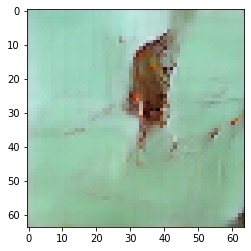

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 19

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.7095942497253418 sec
Gen loss: 2.091998721423902, Disc loss: 2.169468402862549, Disc valid real loss: 0.37719991724742086, Disc valid fake loss: 0.41190848695604426, Disc class real loss: 0.6906317817537408, Disc class fake loss: 0.14101649860018178
Time for epoch 2 is 0.697420597076416 sec
Gen loss: 1.998135441227963, Disc loss: 2.144202006490607, Disc valid real loss: 0.3936584733034435, Disc valid fake loss: 0.37448024279192876, Disc class real loss: 0.6893348787960253, Disc class fake loss: 0.19296502478812871
Time for epoch 3 is 0.696779727935791 sec
Gen loss: 1.934315606167442, Disc loss: 2.1531967363859477, Disc valid real loss: 0.3735437644155402, Disc valid fake loss: 0.40331870317459106, Disc class real loss: 0.6903467554795114, Disc class fake loss: 0.20546000882198936
Time for epoch 4 is 0.7147300243377686 sec
Gen loss: 1.826315076727616

Time for epoch 31 is 0.6968231201171875 sec
Gen loss: 1.831297711322182, Disc loss: 2.038022461690401, Disc valid real loss: 0.37164076221616643, Disc valid fake loss: 0.3747480088158658, Disc class real loss: 0.6722221311769987, Disc class fake loss: 0.19061119305460075
Time for epoch 32 is 0.695948600769043 sec
Gen loss: 1.8511044916353727, Disc loss: 2.032849776117425, Disc valid real loss: 0.38145821188625534, Disc valid fake loss: 0.4084227618418242, Disc class real loss: 0.6483255875738043, Disc class fake loss: 0.17453888450798236
Time for epoch 33 is 0.6994888782501221 sec
Gen loss: 1.8304953010458695, Disc loss: 2.029825285861367, Disc valid real loss: 0.3747262860599317, Disc valid fake loss: 0.3755263843034443, Disc class real loss: 0.6671968949468512, Disc class fake loss: 0.19819941214824977
Time for epoch 34 is 0.6958217620849609 sec
Gen loss: 1.8894247067602057, Disc loss: 2.0928243147699455, Disc valid real loss: 0.40124496347025823, Disc valid fake loss: 0.374623337858

Time for epoch 62 is 0.695256233215332 sec
Gen loss: 1.9398215130755776, Disc loss: 2.0070965164586116, Disc valid real loss: 0.3931509366160945, Disc valid fake loss: 0.38513558710876267, Disc class real loss: 0.6677141597396449, Disc class fake loss: 0.186172059492061
Time for epoch 63 is 0.6943047046661377 sec
Gen loss: 1.9561611225730495, Disc loss: 2.008988938833538, Disc valid real loss: 0.3782860448485927, Disc valid fake loss: 0.3811823098283065, Disc class real loss: 0.678728040895964, Disc class fake loss: 0.1987597942352295
Time for epoch 64 is 0.6959269046783447 sec
Gen loss: 1.9390234319787276, Disc loss: 2.0449240897831165, Disc valid real loss: 0.39651638034142944, Disc valid fake loss: 0.38326429536468104, Disc class real loss: 0.6842923948639318, Disc class fake loss: 0.2314607932379371
Time for epoch 65 is 0.6981804370880127 sec
Gen loss: 1.8922721774954545, Disc loss: 2.0397182138342607, Disc valid real loss: 0.4186871365496987, Disc valid fake loss: 0.38840380154157

Time for epoch 93 is 0.6971595287322998 sec
Gen loss: 2.032128666576586, Disc loss: 1.9096844133577848, Disc valid real loss: 0.3879108068190123, Disc valid fake loss: 0.3814515424402137, Disc class real loss: 0.6423312268759075, Disc class fake loss: 0.20881802510274083
Time for epoch 94 is 0.6963448524475098 sec
Gen loss: 1.9167495777732448, Disc loss: 1.9708918144828396, Disc valid real loss: 0.3956465281938252, Disc valid fake loss: 0.3782167230781756, Disc class real loss: 0.6810816965605083, Disc class fake loss: 0.19027869991566004
Time for epoch 95 is 0.6979255676269531 sec
Gen loss: 1.9509404709464626, Disc loss: 1.9830476735767566, Disc valid real loss: 0.3815491481831199, Disc valid fake loss: 0.400412455201149, Disc class real loss: 0.6794385408100329, Disc class fake loss: 0.215552209239257
Time for epoch 96 is 0.6982424259185791 sec
Gen loss: 1.9588853685479415, Disc loss: 1.8816980876420673, Disc valid real loss: 0.3767667914691724, Disc valid fake loss: 0.37210010070549

Time for epoch 123 is 0.6979846954345703 sec
Gen loss: 1.8194520661705418, Disc loss: 1.9481188623528731, Disc valid real loss: 0.4049902793608214, Disc valid fake loss: 0.4006858358257695, Disc class real loss: 0.6708790722646212, Disc class fake loss: 0.21892623603343964
Time for epoch 124 is 0.697012186050415 sec
Gen loss: 1.883223245018407, Disc loss: 1.871994514214365, Disc valid real loss: 0.38450639734142705, Disc valid fake loss: 0.38219197957139267, Disc class real loss: 0.6511679699546412, Disc class fake loss: 0.20777841931895205
Time for epoch 125 is 0.700721025466919 sec
Gen loss: 1.871772333195335, Disc loss: 1.867671012878418, Disc valid real loss: 0.3882518763604917, Disc valid fake loss: 0.39077730398429067, Disc class real loss: 0.639709936945062, Disc class fake loss: 0.21399920551400436
Time for epoch 126 is 0.697868824005127 sec
Gen loss: 2.0442522764205933, Disc loss: 1.8855797679800737, Disc valid real loss: 0.3791864624148921, Disc valid fake loss: 0.38734033939

Time for epoch 153 is 0.6979291439056396 sec
Gen loss: 1.855235545258773, Disc loss: 1.839954652284321, Disc valid real loss: 0.3702432262270074, Disc valid fake loss: 0.40189009434298467, Disc class real loss: 0.6492885194326702, Disc class fake loss: 0.22898639581705393
Time for epoch 154 is 0.6990296840667725 sec
Gen loss: 2.0335414535120915, Disc loss: 1.8930104908190275, Disc valid real loss: 0.3885170723262586, Disc valid fake loss: 0.39401679368395554, Disc class real loss: 0.6674848010665492, Disc class fake loss: 0.2611440028014936
Time for epoch 155 is 0.6995360851287842 sec
Gen loss: 2.290456596173738, Disc loss: 1.8781828127409284, Disc valid real loss: 0.3652124114726719, Disc valid fake loss: 0.38060152844378825, Disc class real loss: 0.6760602216971549, Disc class fake loss: 0.28100990856948654
Time for epoch 156 is 0.6988487243652344 sec
Gen loss: 1.8381043296111257, Disc loss: 1.8763093697397333, Disc valid real loss: 0.3920783275052121, Disc valid fake loss: 0.3945090

Time for epoch 183 is 0.6970038414001465 sec
Gen loss: 1.958446741104126, Disc loss: 1.7675333650488603, Disc valid real loss: 0.40194428437634516, Disc valid fake loss: 0.38498601787968684, Disc class real loss: 0.6431248156647933, Disc class fake loss: 0.17782184011057803
Time for epoch 184 is 0.7056763172149658 sec
Gen loss: 1.9280244676690352, Disc loss: 1.7755347364827205, Disc valid real loss: 0.41661818247092397, Disc valid fake loss: 0.3779688265762831, Disc class real loss: 0.635352749573557, Disc class fake loss: 0.1966549918839806
Time for epoch 185 is 0.7002823352813721 sec
Gen loss: 1.979648414411043, Disc loss: 1.7896808511332463, Disc valid real loss: 0.3825739386834596, Disc valid fake loss: 0.3888323808971204, Disc class real loss: 0.6701434787951017, Disc class fake loss: 0.18527850626330628
Time for epoch 186 is 0.6993153095245361 sec
Gen loss: 1.9227914810180664, Disc loss: 1.8034332990646362, Disc valid real loss: 0.3912697512852518, Disc valid fake loss: 0.3963775

Time for epoch 213 is 0.6989564895629883 sec
Gen loss: 1.969537804001256, Disc loss: 1.737899290887933, Disc valid real loss: 0.3844960629940033, Disc valid fake loss: 0.40147654163210017, Disc class real loss: 0.6545330223284269, Disc class fake loss: 0.18764042266105352
Time for epoch 214 is 0.6990871429443359 sec
Gen loss: 1.9007705826508372, Disc loss: 1.7433752825385647, Disc valid real loss: 0.4115267866536191, Disc valid fake loss: 0.4056816838289562, Disc class real loss: 0.6540234873169347, Disc class fake loss: 0.1570489735979783
Time for epoch 215 is 0.6946830749511719 sec
Gen loss: 1.9296774425004657, Disc loss: 1.7980661517695378, Disc valid real loss: 0.4057514589083822, Disc valid fake loss: 0.3956326701139149, Disc class real loss: 0.684421391863572, Disc class fake loss: 0.20241562943709523
Time for epoch 216 is 0.6995248794555664 sec
Gen loss: 1.9333254287117405, Disc loss: 1.7228377430062545, Disc valid real loss: 0.3883069173285836, Disc valid fake loss: 0.406555102

Time for epoch 243 is 0.6953895092010498 sec
Gen loss: 1.986845248623898, Disc loss: 1.6345398739764565, Disc valid real loss: 0.3902575208952552, Disc valid fake loss: 0.37856830264392655, Disc class real loss: 0.6401713365002683, Disc class fake loss: 0.16518844899378324
Time for epoch 244 is 0.6949822902679443 sec
Gen loss: 1.9309321516438533, Disc loss: 1.694023941692553, Disc valid real loss: 0.3905702201943648, Disc valid fake loss: 0.38494427659009633, Disc class real loss: 0.6847872828182421, Disc class fake loss: 0.17018650511377736
Time for epoch 245 is 0.6951389312744141 sec
Gen loss: 2.0592772584212455, Disc loss: 1.7164309652228105, Disc valid real loss: 0.3942923122330716, Disc valid fake loss: 0.4004670028623782, Disc class real loss: 0.6684305605135465, Disc class fake loss: 0.19661627278516167
Time for epoch 246 is 0.6950211524963379 sec
Gen loss: 1.9780245203720896, Disc loss: 1.680949945198862, Disc valid real loss: 0.39210634482534307, Disc valid fake loss: 0.405892

Time for epoch 273 is 0.6966636180877686 sec
Gen loss: 1.9883865243510197, Disc loss: 1.588851759308263, Disc valid real loss: 0.37962569610068675, Disc valid fake loss: 0.38118982315063477, Disc class real loss: 0.6552249883350573, Disc class fake loss: 0.1634133040512863
Time for epoch 274 is 0.6979227066040039 sec
Gen loss: 1.976112961769104, Disc loss: 1.6099794789364463, Disc valid real loss: 0.3994880177472767, Disc valid fake loss: 0.38909390255024556, Disc class real loss: 0.6531896873524314, Disc class fake loss: 0.16062921677765093
Time for epoch 275 is 0.6985714435577393 sec
Gen loss: 1.8917141588110673, Disc loss: 1.5581048036876477, Disc valid real loss: 0.37957299853626053, Disc valid fake loss: 0.3959378129557559, Disc class real loss: 0.6576775030085915, Disc class fake loss: 0.11844597129445326
Time for epoch 276 is 0.6982913017272949 sec
Gen loss: 1.979423071208753, Disc loss: 1.6232222004940635, Disc valid real loss: 0.3905088666238283, Disc valid fake loss: 0.396519

Time for epoch 303 is 0.6940295696258545 sec
Gen loss: 2.0085934965234054, Disc loss: 1.5831596663123684, Disc valid real loss: 0.36579304776693644, Disc valid fake loss: 0.3946498099126314, Disc class real loss: 0.6861405686328286, Disc class fake loss: 0.13668615410202428
Time for epoch 304 is 0.6927468776702881 sec
Gen loss: 1.955746995775323, Disc loss: 1.5919571675752338, Disc valid real loss: 0.4016978897546467, Disc valid fake loss: 0.38385869013635737, Disc class real loss: 0.6707608354719061, Disc class fake loss: 0.13574680372288353
Time for epoch 305 is 0.6966054439544678 sec
Gen loss: 1.961409518593236, Disc loss: 1.6266594623264514, Disc valid real loss: 0.3853775811822791, Disc valid fake loss: 0.39107539857688706, Disc class real loss: 0.7019436798597637, Disc class fake loss: 0.14837354009872988
Time for epoch 306 is 0.7008254528045654 sec
Gen loss: 2.0272143577274524, Disc loss: 1.639416173884743, Disc valid real loss: 0.3768385915379775, Disc valid fake loss: 0.393033

Time for epoch 333 is 0.6975123882293701 sec
Gen loss: 1.9362225218823081, Disc loss: 1.5988301540675915, Disc valid real loss: 0.3900364747172908, Disc valid fake loss: 0.38506751468307093, Disc class real loss: 0.6441324353218079, Disc class fake loss: 0.1796866365169224
Time for epoch 334 is 0.6962103843688965 sec
Gen loss: 2.276242582421554, Disc loss: 1.6282557186327482, Disc valid real loss: 0.3942186706944516, Disc valid fake loss: 0.4005700004728217, Disc class real loss: 0.6725414426703202, Disc class fake loss: 0.1610279004824789
Time for epoch 335 is 0.697382926940918 sec
Gen loss: 2.0844751784676, Disc loss: 1.6044874504992837, Disc valid real loss: 0.38153289336907237, Disc valid fake loss: 0.40349263266513224, Disc class real loss: 0.638606469882162, Disc class fake loss: 0.1809469759464264
Time for epoch 336 is 0.696840763092041 sec
Gen loss: 2.1152272287168, Disc loss: 1.5877608374545449, Disc valid real loss: 0.3805920528738122, Disc valid fake loss: 0.3909157075380024

Time for epoch 363 is 0.6960546970367432 sec
Gen loss: 2.1059672581522086, Disc loss: 1.622914565236945, Disc valid real loss: 0.3789186179637909, Disc valid fake loss: 0.40420683747843694, Disc class real loss: 0.6685015967017726, Disc class fake loss: 0.17138698304954328
Time for epoch 364 is 0.6957516670227051 sec
Gen loss: 2.0791513480638204, Disc loss: 1.6142334749824123, Disc valid real loss: 0.38983730579677384, Disc valid fake loss: 0.4064080668123145, Disc class real loss: 0.6635196428549918, Disc class fake loss: 0.15457025836957128
Time for epoch 365 is 0.6970052719116211 sec
Gen loss: 2.055741918714423, Disc loss: 1.6362363852952655, Disc valid real loss: 0.3926509618759155, Disc valid fake loss: 0.3765068054199219, Disc class real loss: 0.7060909396723697, Disc class fake loss: 0.16109667502735792
Time for epoch 366 is 0.6918880939483643 sec
Gen loss: 1.951320717209264, Disc loss: 1.593155258580258, Disc valid real loss: 0.39254243122903926, Disc valid fake loss: 0.3765881

Time for epoch 393 is 0.6982853412628174 sec
Gen loss: 1.9093768973099559, Disc loss: 1.5966406621431048, Disc valid real loss: 0.39797470836262955, Disc valid fake loss: 0.3893883510639793, Disc class real loss: 0.6756368185344496, Disc class fake loss: 0.1337491764049781
Time for epoch 394 is 0.6966238021850586 sec
Gen loss: 1.8931405042347156, Disc loss: 1.6077796032554226, Disc valid real loss: 0.398153703463705, Disc valid fake loss: 0.3761565402934426, Disc class real loss: 0.6935870616059554, Disc class fake loss: 0.13999302332338534
Time for epoch 395 is 0.6982612609863281 sec
Gen loss: 1.9310660864177502, Disc loss: 1.6377763371718557, Disc valid real loss: 0.3971622178429051, Disc valid fake loss: 0.3758065700531006, Disc class real loss: 0.6848395309950176, Disc class fake loss: 0.18006897404005653
Time for epoch 396 is 0.6977686882019043 sec
Gen loss: 1.9874581788715564, Disc loss: 1.5754118028439974, Disc valid real loss: 0.39580755563158737, Disc valid fake loss: 0.385077

Time for epoch 423 is 0.6970875263214111 sec
Gen loss: 1.8604073900925486, Disc loss: 1.6177848640241121, Disc valid real loss: 0.4012754434033444, Disc valid fake loss: 0.4020076535250011, Disc class real loss: 0.6724583977147153, Disc class fake loss: 0.1421494687858381
Time for epoch 424 is 0.6969988346099854 sec
Gen loss: 1.951053550368861, Disc loss: 1.5741697549819946, Disc valid real loss: 0.3880152608218946, Disc valid fake loss: 0.376785021079214, Disc class real loss: 0.6871687644406369, Disc class fake loss: 0.1223137078708724
Time for epoch 425 is 0.6912133693695068 sec
Gen loss: 1.9661987016075535, Disc loss: 1.5781161471417076, Disc valid real loss: 0.39249988135538605, Disc valid fake loss: 0.39359549001643535, Disc class real loss: 0.6686191872546547, Disc class fake loss: 0.12351062658586
Time for epoch 426 is 0.6957786083221436 sec
Gen loss: 2.0403163746783606, Disc loss: 1.5623097106030113, Disc valid real loss: 0.38393238814253555, Disc valid fake loss: 0.3862429778

Time for epoch 453 is 0.6992547512054443 sec
Gen loss: 2.0602075614427267, Disc loss: 1.6028990243610584, Disc valid real loss: 0.3887709488994197, Disc valid fake loss: 0.3823418193741849, Disc class real loss: 0.6819554253628379, Disc class fake loss: 0.14993726736620852
Time for epoch 454 is 0.6998202800750732 sec
Gen loss: 2.1319609566738733, Disc loss: 1.5974704654593217, Disc valid real loss: 0.3898948509442179, Disc valid fake loss: 0.3933712683225933, Disc class real loss: 0.656179079883977, Disc class fake loss: 0.1581248772379599
Time for epoch 455 is 0.6968626976013184 sec
Gen loss: 2.0234197252675106, Disc loss: 1.619790936771192, Disc valid real loss: 0.3803190934030633, Disc valid fake loss: 0.39266438860642283, Disc class real loss: 0.6667118386218422, Disc class fake loss: 0.18019295013264605
Time for epoch 456 is 0.6927876472473145 sec
Gen loss: 1.9714842783777338, Disc loss: 1.636696639813875, Disc valid real loss: 0.3886434357417257, Disc valid fake loss: 0.407195535

Time for epoch 483 is 0.7004468441009521 sec
Gen loss: 1.9416708820744564, Disc loss: 1.6183784572701705, Disc valid real loss: 0.3966843125067259, Disc valid fake loss: 0.40600333402031347, Disc class real loss: 0.6882848269061038, Disc class fake loss: 0.12751814723014832
Time for epoch 484 is 0.6906485557556152 sec
Gen loss: 1.9868239979994924, Disc loss: 1.5694360168356645, Disc valid real loss: 0.3785930401400516, Disc valid fake loss: 0.38933355870999786, Disc class real loss: 0.6602506872854734, Disc class fake loss: 0.141362516503585
Time for epoch 485 is 0.700439453125 sec
Gen loss: 1.9183286177484613, Disc loss: 1.6263857577976428, Disc valid real loss: 0.3982071970638476, Disc valid fake loss: 0.38912624748129593, Disc class real loss: 0.6899647242144534, Disc class fake loss: 0.14919575891996684
Time for epoch 486 is 0.7016925811767578 sec
Gen loss: 1.8678455039074546, Disc loss: 1.5968074296650134, Disc valid real loss: 0.40253992143430206, Disc valid fake loss: 0.39987744

Time for epoch 513 is 0.7000861167907715 sec
Gen loss: 1.886940366343448, Disc loss: 1.588596732992875, Disc valid real loss: 0.378024664364363, Disc valid fake loss: 0.40056924914058883, Disc class real loss: 0.665125708830984, Disc class fake loss: 0.1449811827195318
Time for epoch 514 is 0.700059175491333 sec
Gen loss: 1.9607390290812443, Disc loss: 1.6019407385273983, Disc valid real loss: 0.4010277155198549, Disc valid fake loss: 0.38150168876898916, Disc class real loss: 0.6803043641542134, Disc class fake loss: 0.13921520466867246
Time for epoch 515 is 0.6974270343780518 sec
Gen loss: 1.9939188392538774, Disc loss: 1.6250538073087994, Disc valid real loss: 0.38438108092860174, Disc valid fake loss: 0.4054637551307678, Disc class real loss: 0.683387815952301, Disc class fake loss: 0.15192744057429464
Time for epoch 516 is 0.7036068439483643 sec
Gen loss: 1.9181460518586009, Disc loss: 1.5850331344102557, Disc valid real loss: 0.39038967145116704, Disc valid fake loss: 0.391581569

Time for epoch 543 is 0.7017519474029541 sec
Gen loss: 2.068297950845016, Disc loss: 1.6560237282200863, Disc valid real loss: 0.38430185380734894, Disc valid fake loss: 0.37968555406520244, Disc class real loss: 0.7175372870344865, Disc class fake loss: 0.17460765571970688
Time for epoch 544 is 0.7044665813446045 sec
Gen loss: 2.164099931716919, Disc loss: 1.575751361094023, Disc valid real loss: 0.3708832169833936, Disc valid fake loss: 0.37320842084131745, Disc class real loss: 0.694492729086625, Disc class fake loss: 0.1372784223211439
Time for epoch 545 is 0.7006301879882812 sec
Gen loss: 2.0978160469155562, Disc loss: 1.601379105919286, Disc valid real loss: 0.37860440894177083, Disc valid fake loss: 0.3638364915785037, Disc class real loss: 0.6998663481913114, Disc class fake loss: 0.1591800270896209
Time for epoch 546 is 0.7013335227966309 sec
Gen loss: 1.9587225286584151, Disc loss: 1.6044362156014693, Disc valid real loss: 0.39192306211120204, Disc valid fake loss: 0.39406255

Time for epoch 573 is 0.7015397548675537 sec
Gen loss: 1.8840710614856921, Disc loss: 1.6119859218597412, Disc valid real loss: 0.4165764670622976, Disc valid fake loss: 0.39616297263848155, Disc class real loss: 0.6645098297219527, Disc class fake loss: 0.13484263655386472
Time for epoch 574 is 0.6941952705383301 sec
Gen loss: 1.9418850760710866, Disc loss: 1.5968500313005949, Disc valid real loss: 0.3844765095334304, Disc valid fake loss: 0.39288097463156046, Disc class real loss: 0.6576789241088065, Disc class fake loss: 0.1619127996658024
Time for epoch 575 is 0.6993451118469238 sec
Gen loss: 1.981043163098787, Disc loss: 1.5754756488298114, Disc valid real loss: 0.3930452944416749, Disc valid fake loss: 0.3912957271462993, Disc class real loss: 0.6610514207890159, Disc class fake loss: 0.130189382912297
Time for epoch 576 is 0.6991815567016602 sec
Gen loss: 1.9269142401845831, Disc loss: 1.6099685430526733, Disc valid real loss: 0.38831237899629695, Disc valid fake loss: 0.4117470

Time for epoch 603 is 0.694000244140625 sec
Gen loss: 1.9572680372940867, Disc loss: 1.6061342578185231, Disc valid real loss: 0.39309250053606537, Disc valid fake loss: 0.4039021377500735, Disc class real loss: 0.6555054470112449, Disc class fake loss: 0.15373455693847254
Time for epoch 604 is 0.6959164142608643 sec
Gen loss: 1.9516084507892006, Disc loss: 1.6202283658479388, Disc valid real loss: 0.3942830625333284, Disc valid fake loss: 0.3851411828869267, Disc class real loss: 0.6940001688505474, Disc class fake loss: 0.14691337943077087
Time for epoch 605 is 0.7309844493865967 sec
Gen loss: 1.917487288776197, Disc loss: 1.642348007151955, Disc valid real loss: 0.39308856035533707, Disc valid fake loss: 0.3850983585181989, Disc class real loss: 0.6980060809536984, Disc class fake loss: 0.16626138632234774
Time for epoch 606 is 0.731313943862915 sec
Gen loss: 2.0204988968999764, Disc loss: 1.5845220151700472, Disc valid real loss: 0.3913998086201517, Disc valid fake loss: 0.38481515

Time for epoch 633 is 0.700446367263794 sec
Gen loss: 1.990948576676218, Disc loss: 1.5799391959842883, Disc valid real loss: 0.40995773516203227, Disc valid fake loss: 0.4069920041059193, Disc class real loss: 0.6350082880572269, Disc class fake loss: 0.12808254067050784
Time for epoch 634 is 0.6998190879821777 sec
Gen loss: 1.9072814991599636, Disc loss: 1.568757508930407, Disc valid real loss: 0.3901519791076058, Disc valid fake loss: 0.38811089333735016, Disc class real loss: 0.6486926674842834, Disc class fake loss: 0.14190336787386945
Time for epoch 635 is 0.6896815299987793 sec
Gen loss: 1.9571194523259212, Disc loss: 1.6430482989863346, Disc valid real loss: 0.39383689118059056, Disc valid fake loss: 0.3963148405677394, Disc class real loss: 0.683329136748063, Disc class fake loss: 0.16967018576044784
Time for epoch 636 is 0.7000927925109863 sec
Gen loss: 1.914485630236174, Disc loss: 1.6347018919493024, Disc valid real loss: 0.4141316633475454, Disc valid fake loss: 0.38353383

Time for epoch 663 is 0.6995060443878174 sec
Gen loss: 1.9811328335812217, Disc loss: 1.6067269099386114, Disc valid real loss: 0.38295544448651764, Disc valid fake loss: 0.3914704526725568, Disc class real loss: 0.6623425891524867, Disc class fake loss: 0.17005689285303416
Time for epoch 664 is 0.7010643482208252 sec
Gen loss: 2.2763039438348067, Disc loss: 1.6213021027414423, Disc valid real loss: 0.3723021259433345, Disc valid fake loss: 0.3924168426739542, Disc class real loss: 0.6821377371486864, Disc class fake loss: 0.1745469436833733
Time for epoch 665 is 0.6964828968048096 sec
Gen loss: 2.2423792701018486, Disc loss: 1.660701594854656, Disc valid real loss: 0.3988143668362969, Disc valid fake loss: 0.38179386524777664, Disc class real loss: 0.6735163519256994, Disc class fake loss: 0.20667038073665217
Time for epoch 666 is 0.6984193325042725 sec
Gen loss: 2.2010058352821753, Disc loss: 1.6185274563337628, Disc valid real loss: 0.37525222568135513, Disc valid fake loss: 0.39385

Time for epoch 693 is 0.6940145492553711 sec
Gen loss: 2.156869882031491, Disc loss: 1.6152222344749851, Disc valid real loss: 0.4013007291053471, Disc valid fake loss: 0.39598422379870163, Disc class real loss: 0.6849114769383481, Disc class fake loss: 0.13313618145490946
Time for epoch 694 is 0.694589376449585 sec
Gen loss: 2.0936631403471293, Disc loss: 1.5923239871075279, Disc valid real loss: 0.4074013766489531, Disc valid fake loss: 0.37402135682733434, Disc class real loss: 0.6694215002812838, Disc class fake loss: 0.14158535670293004
Time for epoch 695 is 0.6939752101898193 sec
Gen loss: 2.0226795861595557, Disc loss: 1.615615449453655, Disc valid real loss: 0.3958733128873925, Disc valid fake loss: 0.3908015411151083, Disc class real loss: 0.6741287300461217, Disc class fake loss: 0.15491571747942975
Time for epoch 696 is 0.695441484451294 sec
Gen loss: 2.032669795186896, Disc loss: 1.6023991045198942, Disc valid real loss: 0.39561526320482554, Disc valid fake loss: 0.39681172

Time for epoch 723 is 0.7105810642242432 sec
Gen loss: 1.9516670892113133, Disc loss: 1.5985803666867708, Disc valid real loss: 0.38774063712672185, Disc valid fake loss: 0.3838892453595212, Disc class real loss: 0.688025741200698, Disc class fake loss: 0.13903455632297615
Time for epoch 724 is 0.707960844039917 sec
Gen loss: 1.9250366185840808, Disc loss: 1.6154805421829224, Disc valid real loss: 0.40377630763932276, Disc valid fake loss: 0.40061557920355545, Disc class real loss: 0.662992144885816, Disc class fake loss: 0.14819951590738797
Time for epoch 725 is 0.7043581008911133 sec
Gen loss: 1.8729517585352848, Disc loss: 1.6227915036050897, Disc valid real loss: 0.3880649538416612, Disc valid fake loss: 0.40256451619298833, Disc class real loss: 0.6686743874298898, Disc class fake loss: 0.16358869052246997
Time for epoch 726 is 0.7015693187713623 sec
Gen loss: 1.9314351960232383, Disc loss: 1.612567807498731, Disc valid real loss: 0.38529836033519943, Disc valid fake loss: 0.38822

Time for epoch 753 is 0.696148157119751 sec
Gen loss: 1.9089126649655794, Disc loss: 1.6327429758874994, Disc valid real loss: 0.3702652054397683, Disc valid fake loss: 0.3957140900586781, Disc class real loss: 0.7135816153727079, Disc class fake loss: 0.15329413429686897
Time for epoch 754 is 0.6987738609313965 sec
Gen loss: 1.9165064096450806, Disc loss: 1.632488765214619, Disc valid real loss: 0.3855209507440266, Disc valid fake loss: 0.4121888734792408, Disc class real loss: 0.671119329176451, Disc class fake loss: 0.16376110401592756
Time for epoch 755 is 0.6987981796264648 sec
Gen loss: 1.9036804625862522, Disc loss: 1.6338229744057906, Disc valid real loss: 0.39220982162575974, Disc valid fake loss: 0.39920637482091, Disc class real loss: 0.6819712300049631, Disc class fake loss: 0.1605398407892177
Time for epoch 756 is 0.6998815536499023 sec
Gen loss: 1.9009671775918258, Disc loss: 1.5839312013826872, Disc valid real loss: 0.38093607911938115, Disc valid fake loss: 0.3947828866

Time for epoch 783 is 0.6985979080200195 sec
Gen loss: 1.9149603969172428, Disc loss: 1.6191498166636418, Disc valid real loss: 0.40256473265196147, Disc valid fake loss: 0.39251873681419774, Disc class real loss: 0.6823420210888511, Disc class fake loss: 0.14183244579716733
Time for epoch 784 is 0.6970820426940918 sec
Gen loss: 1.946915670445091, Disc loss: 1.6111412675757157, Disc valid real loss: 0.38412575345290334, Disc valid fake loss: 0.3852831376226325, Disc class real loss: 0.7004229395013106, Disc class fake loss: 0.1414212780563455
Time for epoch 785 is 0.692845344543457 sec
Gen loss: 2.0471913626319482, Disc loss: 1.593684522729171, Disc valid real loss: 0.37275647646502447, Disc valid fake loss: 0.3967346180426447, Disc class real loss: 0.6725689737420333, Disc class fake loss: 0.15172864457494334
Time for epoch 786 is 0.6958434581756592 sec
Gen loss: 1.985614023710552, Disc loss: 1.6324272469470376, Disc valid real loss: 0.3908353800836362, Disc valid fake loss: 0.3764899

Time for epoch 813 is 0.6982970237731934 sec
Gen loss: 2.0390881299972534, Disc loss: 1.6447673032158299, Disc valid real loss: 0.3903783842136985, Disc valid fake loss: 0.3814415688577451, Disc class real loss: 0.7301213458964699, Disc class fake loss: 0.14294346814092837
Time for epoch 814 is 0.7011773586273193 sec
Gen loss: 1.9860968778007908, Disc loss: 1.5923677933843512, Disc valid real loss: 0.3939396205701326, Disc valid fake loss: 0.3772530524354232, Disc class real loss: 0.6810127528090226, Disc class fake loss: 0.14027058215517746
Time for epoch 815 is 0.6939535140991211 sec
Gen loss: 1.9506005738910877, Disc loss: 1.6355187390979968, Disc valid real loss: 0.3926351540967038, Disc valid fake loss: 0.39123987994695963, Disc class real loss: 0.6983925135512101, Disc class fake loss: 0.1533602323187025
Time for epoch 816 is 0.6972112655639648 sec
Gen loss: 1.8550416105671932, Disc loss: 1.6492899405328851, Disc valid real loss: 0.387409917618099, Disc valid fake loss: 0.3983897

Time for epoch 843 is 0.6981031894683838 sec
Gen loss: 1.9643078791467767, Disc loss: 1.6239301468196667, Disc valid real loss: 0.3830604772818716, Disc valid fake loss: 0.3871532945256484, Disc class real loss: 0.6904252391112479, Disc class fake loss: 0.16339655926353053
Time for epoch 844 is 0.7011761665344238 sec
Gen loss: 1.9903237694188167, Disc loss: 1.634402783293473, Disc valid real loss: 0.3889588917556562, Disc valid fake loss: 0.37016379205804123, Disc class real loss: 0.6970120542927792, Disc class fake loss: 0.17837180510947578
Time for epoch 845 is 0.6976723670959473 sec
Gen loss: 1.842640939511751, Disc loss: 1.5448650623622693, Disc valid real loss: 0.36765497452334356, Disc valid fake loss: 0.40454592202839096, Disc class real loss: 0.6561580112105921, Disc class fake loss: 0.11661407135819134
Time for epoch 846 is 0.6974594593048096 sec
Gen loss: 1.947955570722881, Disc loss: 1.62223766352001, Disc valid real loss: 0.40288129292036357, Disc valid fake loss: 0.3918788

Time for epoch 873 is 0.6969656944274902 sec
Gen loss: 1.9749882974122699, Disc loss: 1.5526270489943654, Disc valid real loss: 0.3771484651063618, Disc valid fake loss: 0.3824131080978795, Disc class real loss: 0.6607438074915033, Disc class fake loss: 0.1324273508630301
Time for epoch 874 is 0.6982271671295166 sec
Gen loss: 1.8777496438277395, Disc loss: 1.6623631778516268, Disc valid real loss: 0.4131736143639213, Disc valid fake loss: 0.4066919872635289, Disc class real loss: 0.6994873410777042, Disc class fake loss: 0.14312153152729334
Time for epoch 875 is 0.6989550590515137 sec
Gen loss: 2.0523591919949182, Disc loss: 1.5724926496806897, Disc valid real loss: 0.3801170383629046, Disc valid fake loss: 0.3901084363460541, Disc class real loss: 0.6736680771175184, Disc class fake loss: 0.1287081000444136
Time for epoch 876 is 0.7005562782287598 sec
Gen loss: 1.9106066728893079, Disc loss: 1.609475393044321, Disc valid real loss: 0.4026452506843366, Disc valid fake loss: 0.389865854

Time for epoch 903 is 0.694068193435669 sec
Gen loss: 2.0714316870036877, Disc loss: 1.6061694998490184, Disc valid real loss: 0.38494575964777095, Disc valid fake loss: 0.400255854192533, Disc class real loss: 0.6715463744966608, Disc class fake loss: 0.14952593610474937
Time for epoch 904 is 0.6935663223266602 sec
Gen loss: 2.1135376629076505, Disc loss: 1.6091443488472386, Disc valid real loss: 0.3808904384311877, Disc valid fake loss: 0.3892391041705483, Disc class real loss: 0.6803364314531025, Disc class fake loss: 0.15878270448822723
Time for epoch 905 is 0.69303297996521 sec
Gen loss: 2.1055388827072945, Disc loss: 1.6727056754262823, Disc valid real loss: 0.40341782413030924, Disc valid fake loss: 0.3842138993112664, Disc class real loss: 0.709239987950576, Disc class fake loss: 0.1759406441920682
Time for epoch 906 is 0.6945865154266357 sec
Gen loss: 2.075951858570701, Disc loss: 1.626020820517289, Disc valid real loss: 0.379655554106361, Disc valid fake loss: 0.4108873542986

Time for epoch 933 is 0.6936249732971191 sec
Gen loss: 1.9728040757932161, Disc loss: 1.5922645079462152, Disc valid real loss: 0.3989395467858565, Disc valid fake loss: 0.38579219265987996, Disc class real loss: 0.6697645218748796, Disc class fake loss: 0.13787467032670975
Time for epoch 934 is 0.6930530071258545 sec
Gen loss: 1.9762852819342362, Disc loss: 1.587529220079121, Disc valid real loss: 0.40304690521014364, Disc valid fake loss: 0.38275419724614995, Disc class real loss: 0.6697307134929457, Disc class fake loss: 0.13210495718215642
Time for epoch 935 is 0.6957805156707764 sec
Gen loss: 1.8589189742740833, Disc loss: 1.5744510073410838, Disc valid real loss: 0.3917801364472038, Disc valid fake loss: 0.38253806296147796, Disc class real loss: 0.6576875793306451, Disc class fake loss: 0.1425482777780608
Time for epoch 936 is 0.6934397220611572 sec
Gen loss: 1.9303606874064396, Disc loss: 1.5855544491818077, Disc valid real loss: 0.393643676450378, Disc valid fake loss: 0.38772

Time for epoch 963 is 0.6966958045959473 sec
Gen loss: 1.9917727897041722, Disc loss: 1.6189775529660677, Disc valid real loss: 0.37574368401577596, Disc valid fake loss: 0.4290708507362165, Disc class real loss: 0.6718511330453973, Disc class fake loss: 0.14241779948535718
Time for epoch 964 is 0.6953082084655762 sec
Gen loss: 1.915289044380188, Disc loss: 1.619657654511301, Disc valid real loss: 0.3855563527659366, Disc valid fake loss: 0.39089046653948334, Disc class real loss: 0.6943065429988661, Disc class fake loss: 0.14901338870588102
Time for epoch 965 is 0.698317289352417 sec
Gen loss: 1.929164641781857, Disc loss: 1.5955837902269865, Disc valid real loss: 0.39200001719750854, Disc valid fake loss: 0.3863680064678192, Disc class real loss: 0.6719079080380892, Disc class fake loss: 0.14541317228423922
Time for epoch 966 is 0.695246696472168 sec
Gen loss: 1.9134641509307058, Disc loss: 1.6386868639996177, Disc valid real loss: 0.40268411604981674, Disc valid fake loss: 0.3912733

Time for epoch 993 is 0.6976468563079834 sec
Gen loss: 1.874645427653664, Disc loss: 1.5989530149259066, Disc valid real loss: 0.3787825515395717, Disc valid fake loss: 0.39892169205765976, Disc class real loss: 0.6610106449378165, Disc class fake loss: 0.16033826376262464
Time for epoch 994 is 0.6998534202575684 sec
Gen loss: 1.9956272652274685, Disc loss: 1.593946055362099, Disc valid real loss: 0.40412774211482, Disc valid fake loss: 0.3902392105052346, Disc class real loss: 0.6713358508913141, Disc class fake loss: 0.1283518709242344
Time for epoch 995 is 0.7000820636749268 sec
Gen loss: 1.9943753041719134, Disc loss: 1.5338783703352277, Disc valid real loss: 0.37131234689762715, Disc valid fake loss: 0.3829489899309058, Disc class real loss: 0.6722887032910397, Disc class fake loss: 0.10744132650525946
Time for epoch 996 is 0.6957976818084717 sec
Gen loss: 1.999111206907975, Disc loss: 1.5758605128840397, Disc valid real loss: 0.3840610816290504, Disc valid fake loss: 0.3875113521

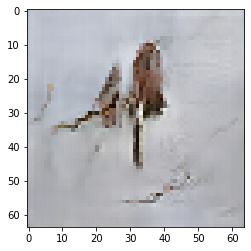

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 20

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6929945945739746 sec
Gen loss: 1.9346049271131818, Disc loss: 2.144379471477709, Disc valid real loss: 0.3919822197211416, Disc valid fake loss: 0.395992857845206, Disc class real loss: 0.678645017899965, Disc class fake loss: 0.14422571306165896
Time for epoch 2 is 0.6951980590820312 sec
Gen loss: 1.9927927506597418, Disc loss: 2.153556077103866, Disc valid real loss: 0.3826654522042525, Disc valid fake loss: 0.39631185876695735, Disc class real loss: 0.6887351274490356, Disc class fake loss: 0.1540307104587555
Time for epoch 3 is 0.6984586715698242 sec
Gen loss: 1.912629899225737, Disc loss: 2.2202447213624654, Disc valid real loss: 0.40724282358822067, Disc valid fake loss: 0.4032384659114637, Disc class real loss: 0.7073443814327842, Disc class fake loss: 0.15412381330603048
Time for epoch 4 is 0.6932098865509033 sec
Gen loss: 1.9192131318544086

Time for epoch 31 is 0.6988401412963867 sec
Gen loss: 1.8542617496691252, Disc loss: 2.090790171372263, Disc valid real loss: 0.3861944440164064, Disc valid fake loss: 0.40279881107179744, Disc class real loss: 0.6779834283025641, Disc class fake loss: 0.18436355339853386
Time for epoch 32 is 0.6990108489990234 sec
Gen loss: 1.8756377634249235, Disc loss: 2.0637997075131067, Disc valid real loss: 0.39193747388689143, Disc valid fake loss: 0.37624878946103546, Disc class real loss: 0.6743005043581912, Disc class fake loss: 0.20690319647914485
Time for epoch 33 is 0.7143993377685547 sec
Gen loss: 1.8086044851102328, Disc loss: 2.1433244880877043, Disc valid real loss: 0.40187584726434006, Disc valid fake loss: 0.4000369545660521, Disc class real loss: 0.7000731574861627, Disc class fake loss: 0.1975360540182967
Time for epoch 34 is 0.6947741508483887 sec
Gen loss: 1.8324050903320312, Disc loss: 2.0259893316971627, Disc valid real loss: 0.3900091428505747, Disc valid fake loss: 0.39120050

Time for epoch 62 is 0.6976425647735596 sec
Gen loss: 1.7643326144469411, Disc loss: 1.9602545499801636, Disc valid real loss: 0.3843850148351569, Disc valid fake loss: 0.39136782759114314, Disc class real loss: 0.6421041112197073, Disc class fake loss: 0.19166591528214907
Time for epoch 63 is 0.6970336437225342 sec
Gen loss: 1.8419048033262555, Disc loss: 2.0421770811080933, Disc valid real loss: 0.388093921699022, Disc valid fake loss: 0.41774477221463857, Disc class real loss: 0.6709058002421731, Disc class fake loss: 0.20197090467340068
Time for epoch 64 is 0.696582555770874 sec
Gen loss: 1.8937360926678306, Disc loss: 2.0151139372273494, Disc valid real loss: 0.3824462122038791, Disc valid fake loss: 0.384352854992214, Disc class real loss: 0.6777718474990443, Disc class fake loss: 0.20855484785217987
Time for epoch 65 is 0.6951570510864258 sec
Gen loss: 1.9092419586683576, Disc loss: 1.9583488828257511, Disc valid real loss: 0.35761244046060664, Disc valid fake loss: 0.3898323680

Time for epoch 93 is 0.694047212600708 sec
Gen loss: 1.9089558438250893, Disc loss: 1.8569499066001491, Disc valid real loss: 0.3893493053160216, Disc valid fake loss: 0.37814652449206304, Disc class real loss: 0.6122080715079057, Disc class fake loss: 0.20680151644505954
Time for epoch 94 is 0.697256326675415 sec
Gen loss: 1.7826444475274337, Disc loss: 1.9497450025458085, Disc valid real loss: 0.3662398269301967, Disc valid fake loss: 0.4060308431324206, Disc class real loss: 0.6636267304420471, Disc class fake loss: 0.21856000548914858
Time for epoch 95 is 0.6946895122528076 sec
Gen loss: 1.9249011152669002, Disc loss: 1.9726482253325612, Disc valid real loss: 0.4068227974992049, Disc valid fake loss: 0.39317438476964045, Disc class real loss: 0.6599484776195726, Disc class fake loss: 0.22699546225761114
Time for epoch 96 is 0.6984951496124268 sec
Gen loss: 1.8871255360151593, Disc loss: 1.9079595176797164, Disc valid real loss: 0.38821661001757574, Disc valid fake loss: 0.392206681

Time for epoch 123 is 0.6974813938140869 sec
Gen loss: 1.9259747454994602, Disc loss: 1.9089956722761456, Disc valid real loss: 0.39222941116282817, Disc valid fake loss: 0.38964412871160004, Disc class real loss: 0.6701844679681879, Disc class fake loss: 0.18654886593944148
Time for epoch 124 is 0.6961085796356201 sec
Gen loss: 1.888580083847046, Disc loss: 1.8949769296144183, Disc valid real loss: 0.3858082568959186, Disc valid fake loss: 0.3847886927817997, Disc class real loss: 0.6595440381451657, Disc class fake loss: 0.2215311409611451
Time for epoch 125 is 0.696033239364624 sec
Gen loss: 1.9347669890052395, Disc loss: 1.8881276218514693, Disc valid real loss: 0.3811954565738377, Disc valid fake loss: 0.37752250934901993, Disc class real loss: 0.6650752205597726, Disc class fake loss: 0.21711937338113785
Time for epoch 126 is 0.6966888904571533 sec
Gen loss: 1.9349742563147294, Disc loss: 1.9356684433786493, Disc valid real loss: 0.38390027692443446, Disc valid fake loss: 0.39498

Time for epoch 153 is 0.6969225406646729 sec
Gen loss: 1.989716843554848, Disc loss: 1.849431922561244, Disc valid real loss: 0.3647442883566806, Disc valid fake loss: 0.39184976408356115, Disc class real loss: 0.6726803183555603, Disc class fake loss: 0.2126282088850674
Time for epoch 154 is 0.6962752342224121 sec
Gen loss: 1.8900365578500848, Disc loss: 1.9232283767900968, Disc valid real loss: 0.41279923915863037, Disc valid fake loss: 0.3815987157194238, Disc class real loss: 0.7015379541798642, Disc class fake loss: 0.20513842294090673
Time for epoch 155 is 0.6912274360656738 sec
Gen loss: 1.9310036144758527, Disc loss: 1.8604625400743986, Disc valid real loss: 0.39938614713518245, Disc valid fake loss: 0.3841887571309742, Disc class real loss: 0.6670911625811928, Disc class fake loss: 0.20434220174425527
Time for epoch 156 is 0.7000453472137451 sec
Gen loss: 1.8462619593268947, Disc loss: 1.8201686708550704, Disc valid real loss: 0.38490695702402217, Disc valid fake loss: 0.40489

Time for epoch 183 is 0.6981704235076904 sec
Gen loss: 1.9513120212052997, Disc loss: 1.8122986366874294, Disc valid real loss: 0.3944737095581858, Disc valid fake loss: 0.3970548087044766, Disc class real loss: 0.6648832324304079, Disc class fake loss: 0.19453474173420354
Time for epoch 184 is 0.6975884437561035 sec
Gen loss: 1.8945433717024953, Disc loss: 1.8380318127180402, Disc valid real loss: 0.3925239553577022, Disc valid fake loss: 0.386318564414978, Disc class real loss: 0.6850510365084598, Disc class fake loss: 0.2143233818443198
Time for epoch 185 is 0.6951849460601807 sec
Gen loss: 1.9664256133531268, Disc loss: 1.7827344379926984, Disc valid real loss: 0.3724919918336366, Disc valid fake loss: 0.3890073597431183, Disc class real loss: 0.6589767964262712, Disc class fake loss: 0.21219044453219363
Time for epoch 186 is 0.6966331005096436 sec
Gen loss: 1.9819629819769609, Disc loss: 1.8022511632818925, Disc valid real loss: 0.4015906782526719, Disc valid fake loss: 0.40931807

Time for epoch 213 is 0.690410852432251 sec
Gen loss: 1.976151660868996, Disc loss: 1.737171260934127, Disc valid real loss: 0.38153902951039764, Disc valid fake loss: 0.39475480192585993, Disc class real loss: 0.6665109395980835, Disc class fake loss: 0.17997194787389353
Time for epoch 214 is 0.6902680397033691 sec
Gen loss: 1.9931800302706266, Disc loss: 1.7411463448875828, Disc valid real loss: 0.4073929786682129, Disc valid fake loss: 0.3747344487591794, Disc class real loss: 0.6672447857103849, Disc class fake loss: 0.1786562694530738
Time for epoch 215 is 0.6918082237243652 sec
Gen loss: 1.9544618568922345, Disc loss: 1.7641584183040417, Disc valid real loss: 0.38298171915506063, Disc valid fake loss: 0.4083855152130127, Disc class real loss: 0.6619776895171717, Disc class fake loss: 0.20715245604515076
Time for epoch 216 is 0.6979632377624512 sec
Gen loss: 1.9810816739734851, Disc loss: 1.74171455282914, Disc valid real loss: 0.3916921709713183, Disc valid fake loss: 0.400500236

Time for epoch 243 is 0.705207347869873 sec
Gen loss: 1.9889765538667377, Disc loss: 1.6450020012102629, Disc valid real loss: 0.3909002746406354, Disc valid fake loss: 0.38649776264240865, Disc class real loss: 0.6578118267812227, Disc class fake loss: 0.14462494791338318
Time for epoch 244 is 0.7058093547821045 sec
Gen loss: 2.075423416338469, Disc loss: 1.6480525732040405, Disc valid real loss: 0.3826398535778648, Disc valid fake loss: 0.3828364202850743, Disc class real loss: 0.6673331386164615, Disc class fake loss: 0.15152908508714877
Time for epoch 245 is 0.6985399723052979 sec
Gen loss: 1.9952485937821238, Disc loss: 1.6349996642062539, Disc valid real loss: 0.4075016332300086, Disc valid fake loss: 0.35020937574537175, Disc class real loss: 0.653627197993429, Disc class fake loss: 0.1650884578886785
Time for epoch 246 is 0.6956262588500977 sec
Gen loss: 1.9636341333389282, Disc loss: 1.7187845016780652, Disc valid real loss: 0.38126468501592936, Disc valid fake loss: 0.3993576

Time for epoch 273 is 0.696164608001709 sec
Gen loss: 1.9936958865115517, Disc loss: 1.6568133266348588, Disc valid real loss: 0.42421816681560715, Disc valid fake loss: 0.3759649066548598, Disc class real loss: 0.6729910687396401, Disc class fake loss: 0.17410169737903694
Time for epoch 274 is 0.6958723068237305 sec
Gen loss: 1.937926919836747, Disc loss: 1.579667656045211, Disc valid real loss: 0.3840875421699725, Disc valid fake loss: 0.38377035605280024, Disc class real loss: 0.6521997671378287, Disc class fake loss: 0.15185004668800453
Time for epoch 275 is 0.6942861080169678 sec
Gen loss: 1.9945198109275417, Disc loss: 1.6581803372031765, Disc valid real loss: 0.4113081560323113, Disc valid fake loss: 0.37482410120336634, Disc class real loss: 0.683141761704495, Disc class fake loss: 0.18288921172681608
Time for epoch 276 is 0.6887154579162598 sec
Gen loss: 1.927697689909684, Disc loss: 1.624775020699752, Disc valid real loss: 0.41440256018387644, Disc valid fake loss: 0.38082667

Time for epoch 303 is 0.6901602745056152 sec
Gen loss: 2.0235521479656824, Disc loss: 1.6095855612503855, Disc valid real loss: 0.3911951513666856, Disc valid fake loss: 0.3872794046213752, Disc class real loss: 0.6604332296471846, Disc class fake loss: 0.17077572016339554
Time for epoch 304 is 0.6914105415344238 sec
Gen loss: 2.024357281233135, Disc loss: 1.6545585582130833, Disc valid real loss: 0.3941655096254851, Disc valid fake loss: 0.3704870249095716, Disc class real loss: 0.6881471903700578, Disc class fake loss: 0.2018560786780558
Time for epoch 305 is 0.6983320713043213 sec
Gen loss: 2.1017489433288574, Disc loss: 1.5710513027090776, Disc valid real loss: 0.3808476564131285, Disc valid fake loss: 0.39000090015561956, Disc class real loss: 0.6467618910889876, Disc class fake loss: 0.15353951171824806
Time for epoch 306 is 0.6953549385070801 sec
Gen loss: 1.9094217827445583, Disc loss: 1.6498812938991345, Disc valid real loss: 0.40434776952392176, Disc valid fake loss: 0.396630

Time for epoch 333 is 0.6968252658843994 sec
Gen loss: 1.8890611184270758, Disc loss: 1.6072827452107479, Disc valid real loss: 0.40890333919148697, Disc valid fake loss: 0.383751475497296, Disc class real loss: 0.672478785640315, Disc class fake loss: 0.14225522271896662
Time for epoch 334 is 0.6967761516571045 sec
Gen loss: 1.995797220029329, Disc loss: 1.5921113742025275, Disc valid real loss: 0.3959417939186096, Disc valid fake loss: 0.39030105816690547, Disc class real loss: 0.6533304954829969, Disc class fake loss: 0.15263818106368968
Time for epoch 335 is 0.6977126598358154 sec
Gen loss: 2.0037911377455058, Disc loss: 1.574751245348077, Disc valid real loss: 0.3671990931034088, Disc valid fake loss: 0.3837787948156658, Disc class real loss: 0.6484377070477134, Disc class fake loss: 0.17543025157953562
Time for epoch 336 is 0.6978983879089355 sec
Gen loss: 1.9679965282741345, Disc loss: 1.5928141192386025, Disc valid real loss: 0.4022810145428306, Disc valid fake loss: 0.38291544

Time for epoch 363 is 0.691831111907959 sec
Gen loss: 1.9425484694932635, Disc loss: 1.6085797171843679, Disc valid real loss: 0.4033574430566085, Disc valid fake loss: 0.39546263061071696, Disc class real loss: 0.6543118200804058, Disc class fake loss: 0.15554759180859515
Time for epoch 364 is 0.69338059425354 sec
Gen loss: 1.8710097137250399, Disc loss: 1.5997656897494668, Disc valid real loss: 0.4089629916768325, Disc valid fake loss: 0.395867131258312, Disc class real loss: 0.6657172127773887, Disc class fake loss: 0.1293256480834986
Time for epoch 365 is 0.6930556297302246 sec
Gen loss: 1.9480432899374711, Disc loss: 1.5612017857400995, Disc valid real loss: 0.3740439469877042, Disc valid fake loss: 0.38371457551655014, Disc class real loss: 0.6677865166413156, Disc class fake loss: 0.13576315735515795
Time for epoch 366 is 0.6933338642120361 sec
Gen loss: 1.9441126334039789, Disc loss: 1.624062230712489, Disc valid real loss: 0.4037709377313915, Disc valid fake loss: 0.4066053832

Time for epoch 393 is 0.7041635513305664 sec
Gen loss: 1.8970479337792647, Disc loss: 1.6348881596013118, Disc valid real loss: 0.3841728113199535, Disc valid fake loss: 0.3920296587442097, Disc class real loss: 0.6928725023018686, Disc class fake loss: 0.16591857765850268
Time for epoch 394 is 0.7042415142059326 sec
Gen loss: 2.044898378221612, Disc loss: 1.5904145366267155, Disc valid real loss: 0.39429052723081487, Disc valid fake loss: 0.38640666164849935, Disc class real loss: 0.6629383783591422, Disc class fake loss: 0.14688221169145485
Time for epoch 395 is 0.7054734230041504 sec
Gen loss: 1.9780225565558986, Disc loss: 1.5655548070606433, Disc valid real loss: 0.37286196962783213, Disc valid fake loss: 0.3723035486120927, Disc class real loss: 0.6809718483372739, Disc class fake loss: 0.13952573133926643
Time for epoch 396 is 0.703855037689209 sec
Gen loss: 1.8653137872093601, Disc loss: 1.6355639256929095, Disc valid real loss: 0.3934356546715686, Disc valid fake loss: 0.40835

Time for epoch 423 is 0.6947495937347412 sec
Gen loss: 1.998595821230035, Disc loss: 1.5835780532736528, Disc valid real loss: 0.38772325766713994, Disc valid fake loss: 0.3997449686652736, Disc class real loss: 0.645755294122194, Disc class fake loss: 0.1504536137769097
Time for epoch 424 is 0.7019786834716797 sec
Gen loss: 1.9735653776871531, Disc loss: 1.5583229378650063, Disc valid real loss: 0.379456794575641, Disc valid fake loss: 0.4024618769946851, Disc class real loss: 0.6380596380484732, Disc class fake loss: 0.13844457856918635
Time for epoch 425 is 0.7010102272033691 sec
Gen loss: 2.005426519795468, Disc loss: 1.6162008172587345, Disc valid real loss: 0.38170494060767324, Disc valid fake loss: 0.3921383791848233, Disc class real loss: 0.6969198302218789, Disc class fake loss: 0.1455479425035025
Time for epoch 426 is 0.6958212852478027 sec
Gen loss: 1.9772657406957526, Disc loss: 1.5699656511607922, Disc valid real loss: 0.3788557978052842, Disc valid fake loss: 0.3796766368

Time for epoch 453 is 0.6878995895385742 sec
Gen loss: 2.2651568839424536, Disc loss: 1.6052660440143787, Disc valid real loss: 0.37453359757599075, Disc valid fake loss: 0.3850985506647511, Disc class real loss: 0.6895677792398553, Disc class fake loss: 0.15617281433783078
Time for epoch 454 is 0.6899123191833496 sec
Gen loss: 2.092882426161515, Disc loss: 1.5659862254795276, Disc valid real loss: 0.3894096134524596, Disc valid fake loss: 0.37376316754441513, Disc class real loss: 0.6582438820286801, Disc class fake loss: 0.144672297725552
Time for epoch 455 is 0.6922707557678223 sec
Gen loss: 2.055641249606484, Disc loss: 1.6549845745688991, Disc valid real loss: 0.39801293533099324, Disc valid fake loss: 0.40241203182622004, Disc class real loss: 0.7122151788912321, Disc class fake loss: 0.1424583990715052
Time for epoch 456 is 0.6924259662628174 sec
Gen loss: 1.9725436787856252, Disc loss: 1.5855789561020701, Disc valid real loss: 0.3868747918229354, Disc valid fake loss: 0.3996348

Time for epoch 483 is 0.6901977062225342 sec
Gen loss: 2.120340347290039, Disc loss: 1.5985298407705206, Disc valid real loss: 0.38248725157035024, Disc valid fake loss: 0.39872481321033676, Disc class real loss: 0.6506775586228621, Disc class fake loss: 0.16673701491795087
Time for epoch 484 is 0.6956746578216553 sec
Gen loss: 2.0440238400509485, Disc loss: 1.6272445791646053, Disc valid real loss: 0.39091943047548594, Disc valid fake loss: 0.3839136683627179, Disc class real loss: 0.6874202646707234, Disc class fake loss: 0.165095664168659
Time for epoch 485 is 0.6934762001037598 sec
Gen loss: 1.955290624969884, Disc loss: 1.5773238947516994, Disc valid real loss: 0.36030417523886027, Disc valid fake loss: 0.39221557033689397, Disc class real loss: 0.66977953126556, Disc class fake loss: 0.15512755905327044
Time for epoch 486 is 0.6981856822967529 sec
Gen loss: 1.94562103873805, Disc loss: 1.5891008753525584, Disc valid real loss: 0.3616227335051486, Disc valid fake loss: 0.410723482

Time for epoch 513 is 0.697303056716919 sec
Gen loss: 1.9387620373776084, Disc loss: 1.5846551844948216, Disc valid real loss: 0.38238792984109177, Disc valid fake loss: 0.39649020841247157, Disc class real loss: 0.664548867627194, Disc class fake loss: 0.1413328455466973
Time for epoch 514 is 0.6963677406311035 sec
Gen loss: 1.9927069827129966, Disc loss: 1.6166643908149319, Disc valid real loss: 0.38584601722265544, Disc valid fake loss: 0.41358352021167155, Disc class real loss: 0.6710900005541349, Disc class fake loss: 0.14624986523076108
Time for epoch 515 is 0.6945695877075195 sec
Gen loss: 1.9420026728981419, Disc loss: 1.5908913737849186, Disc valid real loss: 0.3919151911610051, Disc valid fake loss: 0.3851135608397032, Disc class real loss: 0.6578282462923151, Disc class fake loss: 0.15613474677267827
Time for epoch 516 is 0.6951980590820312 sec
Gen loss: 2.02701871646078, Disc loss: 1.6204089741957814, Disc valid real loss: 0.40344687982609395, Disc valid fake loss: 0.386874

Time for epoch 543 is 0.6916098594665527 sec
Gen loss: 1.9034834347273175, Disc loss: 1.5673926378551282, Disc valid real loss: 0.4000830932667381, Disc valid fake loss: 0.37296461588458013, Disc class real loss: 0.6423152089118958, Disc class fake loss: 0.15212776962863772
Time for epoch 544 is 0.6947553157806396 sec
Gen loss: 1.86813685768529, Disc loss: 1.5889115270815397, Disc valid real loss: 0.4115779384186393, Disc valid fake loss: 0.393568649103767, Disc class real loss: 0.6695602253863686, Disc class fake loss: 0.1143157709585993
Time for epoch 545 is 0.6949167251586914 sec
Gen loss: 1.9686495379397744, Disc loss: 1.637386767487777, Disc valid real loss: 0.3932765345824392, Disc valid fake loss: 0.4012153744697571, Disc class real loss: 0.6809041939283672, Disc class fake loss: 0.16209441776338376
Time for epoch 546 is 0.6943373680114746 sec
Gen loss: 1.844661649904753, Disc loss: 1.5932318285891884, Disc valid real loss: 0.3848060102839219, Disc valid fake loss: 0.39702439465

Time for epoch 573 is 0.7012960910797119 sec
Gen loss: 1.9821447635951794, Disc loss: 1.6099542630346197, Disc valid real loss: 0.4096148563058753, Disc valid fake loss: 0.3749697129977377, Disc class real loss: 0.6769566284982782, Disc class fake loss: 0.1485187642668423
Time for epoch 574 is 0.6975593566894531 sec
Gen loss: 1.8882758240950734, Disc loss: 1.6165232407419305, Disc valid real loss: 0.37772747795832784, Disc valid fake loss: 0.39122143544648824, Disc class real loss: 0.7109036602472004, Disc class fake loss: 0.13678551347632156
Time for epoch 575 is 0.6970763206481934 sec
Gen loss: 1.9879249585302252, Disc loss: 1.5971892946644832, Disc valid real loss: 0.3751974843050304, Disc valid fake loss: 0.39048167278892115, Disc class real loss: 0.6931251758023312, Disc class fake loss: 0.13849590561891856
Time for epoch 576 is 0.6981863975524902 sec
Gen loss: 2.014899956552606, Disc loss: 1.5942313608370329, Disc valid real loss: 0.39265769406368856, Disc valid fake loss: 0.3708

Time for epoch 603 is 0.6956672668457031 sec
Gen loss: 2.1112933221616244, Disc loss: 1.676305419520328, Disc valid real loss: 0.38983169354890523, Disc valid fake loss: 0.41496665148358597, Disc class real loss: 0.6737220977482042, Disc class fake loss: 0.197880162612388
Time for epoch 604 is 0.6918880939483643 sec
Gen loss: 2.340007035355819, Disc loss: 1.6619061106129696, Disc valid real loss: 0.39543288083452927, Disc valid fake loss: 0.3955002780023374, Disc class real loss: 0.6816149008901495, Disc class fake loss: 0.1894564961916522
Time for epoch 605 is 0.6934764385223389 sec
Gen loss: 2.1869448737094275, Disc loss: 1.612944339451037, Disc valid real loss: 0.3806673366772501, Disc valid fake loss: 0.38127503191169937, Disc class real loss: 0.672881935772143, Disc class fake loss: 0.17821897213396273
Time for epoch 606 is 0.6979734897613525 sec
Gen loss: 1.9959867627997148, Disc loss: 1.6155341738148739, Disc valid real loss: 0.3674166257444181, Disc valid fake loss: 0.407683510

Time for epoch 633 is 0.6982319355010986 sec
Gen loss: 1.8876593614879407, Disc loss: 1.5935732439944619, Disc valid real loss: 0.3782874926140434, Disc valid fake loss: 0.38972689446650055, Disc class real loss: 0.6822985881253293, Disc class fake loss: 0.1433680547695411
Time for epoch 634 is 0.6966967582702637 sec
Gen loss: 1.9750676594282452, Disc loss: 1.6058123488175242, Disc valid real loss: 0.38348265227518585, Disc valid fake loss: 0.3948058768322593, Disc class real loss: 0.67503632683503, Disc class fake loss: 0.15259199667918055
Time for epoch 635 is 0.6907823085784912 sec
Gen loss: 2.0112166969399703, Disc loss: 1.6285825465854846, Disc valid real loss: 0.38834041043331746, Disc valid fake loss: 0.3794806081997721, Disc class real loss: 0.7049531215115598, Disc class fake loss: 0.15591824917416824
Time for epoch 636 is 0.6997420787811279 sec
Gen loss: 1.9731265557439703, Disc loss: 1.584106263361479, Disc valid real loss: 0.37245556712150574, Disc valid fake loss: 0.409721

Time for epoch 663 is 0.6920242309570312 sec
Gen loss: 1.9117281311436702, Disc loss: 1.6517076429567839, Disc valid real loss: 0.41295942350437764, Disc valid fake loss: 0.3949091497220491, Disc class real loss: 0.6887708118087367, Disc class fake loss: 0.1551749921943012
Time for epoch 664 is 0.6933929920196533 sec
Gen loss: 1.9677026146336605, Disc loss: 1.5806445197055214, Disc valid real loss: 0.3811442977503726, Disc valid fake loss: 0.39408869962943227, Disc class real loss: 0.684259483688756, Disc class fake loss: 0.12126465180986806
Time for epoch 665 is 0.6930680274963379 sec
Gen loss: 1.95060228046618, Disc loss: 1.6130680786935907, Disc valid real loss: 0.40839294540254695, Disc valid fake loss: 0.3791762857060683, Disc class real loss: 0.6624660335089031, Disc class fake loss: 0.1631327047944069
Time for epoch 666 is 0.6923606395721436 sec
Gen loss: 1.9592739029934532, Disc loss: 1.6030707484797428, Disc valid real loss: 0.39031759845583064, Disc valid fake loss: 0.3996309

Time for epoch 693 is 0.6991093158721924 sec
Gen loss: 1.9568402139764083, Disc loss: 1.610286035035786, Disc valid real loss: 0.3892874200093119, Disc valid fake loss: 0.3995338568561955, Disc class real loss: 0.6917488606352555, Disc class fake loss: 0.12982831071866185
Time for epoch 694 is 0.697411298751831 sec
Gen loss: 1.9649106013147455, Disc loss: 1.5941218514191478, Disc valid real loss: 0.37104915160881846, Disc valid fake loss: 0.3984339770517851, Disc class real loss: 0.6872037994234186, Disc class fake loss: 0.1375448625338705
Time for epoch 695 is 0.6975860595703125 sec
Gen loss: 2.061483527484693, Disc loss: 1.5945685788204795, Disc valid real loss: 0.39244401611779867, Disc valid fake loss: 0.3839425334804936, Disc class real loss: 0.6849098519275063, Disc class fake loss: 0.13338251411914825
Time for epoch 696 is 0.6977484226226807 sec
Gen loss: 2.034435987472534, Disc loss: 1.546125995485406, Disc valid real loss: 0.3761137943518789, Disc valid fake loss: 0.3803378076

Time for epoch 723 is 0.6991384029388428 sec
Gen loss: 1.9917866932718378, Disc loss: 1.589722558071739, Disc valid real loss: 0.38865948507660314, Disc valid fake loss: 0.3890960279263948, Disc class real loss: 0.680769333713933, Disc class fake loss: 0.13130762859394676
Time for epoch 724 is 0.7080681324005127 sec
Gen loss: 1.9416993981913517, Disc loss: 1.590037603127329, Disc valid real loss: 0.38545494644265427, Disc valid fake loss: 0.41117665642186213, Disc class real loss: 0.6573179615171332, Disc class fake loss: 0.13619227472104525
Time for epoch 725 is 0.6962549686431885 sec
Gen loss: 2.018118368951898, Disc loss: 1.5660528258273476, Disc valid real loss: 0.37905144691467285, Disc valid fake loss: 0.37568696549064234, Disc class real loss: 0.6843235461335433, Disc class fake loss: 0.12710232915062653
Time for epoch 726 is 0.6925642490386963 sec
Gen loss: 1.9588016208849455, Disc loss: 1.568985336705258, Disc valid real loss: 0.379878873887815, Disc valid fake loss: 0.3742977

Time for epoch 753 is 0.6969139575958252 sec
Gen loss: 1.9130828255101253, Disc loss: 1.6180669696707475, Disc valid real loss: 0.39501652121543884, Disc valid fake loss: 0.3981724522615734, Disc class real loss: 0.6806130221015528, Disc class fake loss: 0.14437222872909747
Time for epoch 754 is 0.7005281448364258 sec
Gen loss: 1.9500762851614701, Disc loss: 1.610930279681557, Disc valid real loss: 0.3730459668134388, Disc valid fake loss: 0.40093573614170674, Disc class real loss: 0.6802307743775217, Disc class fake loss: 0.15682247320288106
Time for epoch 755 is 0.6992099285125732 sec
Gen loss: 1.947090368521841, Disc loss: 1.5992754697799683, Disc valid real loss: 0.39374830691437973, Disc valid fake loss: 0.38560707788718374, Disc class real loss: 0.6964251650007147, Disc class fake loss: 0.12360949677072074
Time for epoch 756 is 0.7002456188201904 sec
Gen loss: 1.9608341455459595, Disc loss: 1.5816134590851634, Disc valid real loss: 0.3814139679858559, Disc valid fake loss: 0.3895

Time for epoch 783 is 0.6952636241912842 sec
Gen loss: 1.8773751258850098, Disc loss: 1.6348484629078914, Disc valid real loss: 0.3985801072497117, Disc valid fake loss: 0.4011917271112141, Disc class real loss: 0.6749904406698126, Disc class fake loss: 0.16018914156838468
Time for epoch 784 is 0.6966395378112793 sec
Gen loss: 2.0063794223885787, Disc loss: 1.5612681915885525, Disc valid real loss: 0.4009072827665429, Disc valid fake loss: 0.3684668337043963, Disc class real loss: 0.627298464900569, Disc class fake loss: 0.1646881668191207
Time for epoch 785 is 0.6944341659545898 sec
Gen loss: 2.0934776883376274, Disc loss: 1.6174240927947194, Disc valid real loss: 0.35892794791020843, Disc valid fake loss: 0.3943030387163162, Disc class real loss: 0.6848288209814775, Disc class fake loss: 0.17946538603619525
Time for epoch 786 is 0.6919634342193604 sec
Gen loss: 2.2189251247205233, Disc loss: 1.6735762985129106, Disc valid real loss: 0.3660673083443391, Disc valid fake loss: 0.3859466

Time for epoch 813 is 0.6948471069335938 sec
Gen loss: 1.857012949491802, Disc loss: 1.5551820491489612, Disc valid real loss: 0.376799812442378, Disc valid fake loss: 0.38230819608035843, Disc class real loss: 0.6453868934982702, Disc class fake loss: 0.15078606534945338
Time for epoch 814 is 0.6947231292724609 sec
Gen loss: 2.0250117276844226, Disc loss: 1.5541645790401257, Disc valid real loss: 0.3992440292709752, Disc valid fake loss: 0.37942682755620855, Disc class real loss: 0.6503701053167644, Disc class fake loss: 0.12522864616230914
Time for epoch 815 is 0.6958262920379639 sec
Gen loss: 1.904616726072211, Disc loss: 1.534681238626179, Disc valid real loss: 0.3831568689722764, Disc valid fake loss: 0.4090601299938403, Disc class real loss: 0.6319006744183993, Disc class fake loss: 0.11066783121541927
Time for epoch 816 is 0.6943283081054688 sec
Gen loss: 1.9464491543016935, Disc loss: 1.5520458597885936, Disc valid real loss: 0.397221155856785, Disc valid fake loss: 0.381333895

Time for epoch 843 is 0.6919991970062256 sec
Gen loss: 1.9216459173905223, Disc loss: 1.6246818241320158, Disc valid real loss: 0.3935367119939704, Disc valid fake loss: 0.41202986710949946, Disc class real loss: 0.678891028228559, Disc class fake loss: 0.14033196474376478
Time for epoch 844 is 0.6951115131378174 sec
Gen loss: 2.028825465001558, Disc loss: 1.5794382471787303, Disc valid real loss: 0.37390117111958954, Disc valid fake loss: 0.38726144636932175, Disc class real loss: 0.6889934571165788, Disc class fake loss: 0.129394095587103
Time for epoch 845 is 0.6975128650665283 sec
Gen loss: 1.9743614573227732, Disc loss: 1.601230125678213, Disc valid real loss: 0.39407027238293696, Disc valid fake loss: 0.3990083172133094, Disc class real loss: 0.6443647177595841, Disc class fake loss: 0.16388292257723056
Time for epoch 846 is 0.6945948600769043 sec
Gen loss: 1.9301915858921253, Disc loss: 1.608762923039888, Disc valid real loss: 0.39050169210684926, Disc valid fake loss: 0.4109742

Time for epoch 873 is 0.6959168910980225 sec
Gen loss: 2.1101742669155725, Disc loss: 1.5461471708197343, Disc valid real loss: 0.3832296807514994, Disc valid fake loss: 0.38670822272175237, Disc class real loss: 0.6470919784746672, Disc class fake loss: 0.1292208829208424
Time for epoch 874 is 0.6940948963165283 sec
Gen loss: 1.9335303494804783, Disc loss: 1.5938367529919273, Disc valid real loss: 0.3764610337583642, Disc valid fake loss: 0.38088405759711014, Disc class real loss: 0.6812183386401126, Disc class fake loss: 0.15537850245049126
Time for epoch 875 is 0.6896138191223145 sec
Gen loss: 2.0040181937970614, Disc loss: 1.654340424035725, Disc valid real loss: 0.39062959426327754, Disc valid fake loss: 0.4076945232717614, Disc class real loss: 0.7262540208665949, Disc class fake loss: 0.12988159178118958
Time for epoch 876 is 0.6926510334014893 sec
Gen loss: 2.008730568383869, Disc loss: 1.6360043726469342, Disc valid real loss: 0.40036640198607193, Disc valid fake loss: 0.40517

Time for epoch 903 is 0.6964988708496094 sec
Gen loss: 2.0488149555105912, Disc loss: 1.5924350274236578, Disc valid real loss: 0.3819787753255744, Disc valid fake loss: 0.3899913681180854, Disc class real loss: 0.6866361592945299, Disc class fake loss: 0.13393927816497653
Time for epoch 904 is 0.6962101459503174 sec
Gen loss: 1.9789014490027177, Disc loss: 1.5905294732043618, Disc valid real loss: 0.39865969827300624, Disc valid fake loss: 0.4029362891849719, Disc class real loss: 0.6767068975850156, Disc class fake loss: 0.11233949347546227
Time for epoch 905 is 0.6959335803985596 sec
Gen loss: 1.923796572183308, Disc loss: 1.6162564189810502, Disc valid real loss: 0.39074480533599854, Disc valid fake loss: 0.39647161333184494, Disc class real loss: 0.671784016646837, Disc class fake loss: 0.15735887971363569
Time for epoch 906 is 0.696120023727417 sec
Gen loss: 1.9595514473162199, Disc loss: 1.567151245317961, Disc valid real loss: 0.3755062881268953, Disc valid fake loss: 0.3906240

Time for epoch 933 is 0.6956450939178467 sec
Gen loss: 1.936942458152771, Disc loss: 1.594050407409668, Disc valid real loss: 0.3790486658874311, Disc valid fake loss: 0.3877133491792177, Disc class real loss: 0.6901622163622003, Disc class fake loss: 0.13723678063405187
Time for epoch 934 is 0.697105884552002 sec
Gen loss: 1.9958664555298655, Disc loss: 1.6623810278741937, Disc valid real loss: 0.4123289036123376, Disc valid fake loss: 0.4107102987013365, Disc class real loss: 0.6992474166970504, Disc class fake loss: 0.14020622031469093
Time for epoch 935 is 0.6975653171539307 sec
Gen loss: 2.246713299500315, Disc loss: 1.6191062864504362, Disc valid real loss: 0.3829962830794485, Disc valid fake loss: 0.4057006537914276, Disc class real loss: 0.6427577137947083, Disc class fake loss: 0.18774264148975672
Time for epoch 936 is 0.6973135471343994 sec
Gen loss: 2.13559343312916, Disc loss: 1.5840218945553428, Disc valid real loss: 0.3750723161195454, Disc valid fake loss: 0.385795034076

Time for epoch 963 is 0.6999645233154297 sec
Gen loss: 2.148117975184792, Disc loss: 1.6472250348643254, Disc valid real loss: 0.40358404736769826, Disc valid fake loss: 0.3566949885142477, Disc class real loss: 0.7041841698320288, Disc class fake loss: 0.1828661149269656
Time for epoch 964 is 0.6950862407684326 sec
Gen loss: 2.1212225148552344, Disc loss: 1.653672224596927, Disc valid real loss: 0.38432704774956955, Disc valid fake loss: 0.40922434471155467, Disc class real loss: 0.7131018293531317, Disc class fake loss: 0.14713221827619954
Time for epoch 965 is 0.6954934597015381 sec
Gen loss: 2.002675263505233, Disc loss: 1.6268823774237382, Disc valid real loss: 0.40441437457737167, Disc valid fake loss: 0.38349539982645137, Disc class real loss: 0.6785077044838353, Disc class fake loss: 0.16056849885928004
Time for epoch 966 is 0.7000768184661865 sec
Gen loss: 2.0911619224046407, Disc loss: 1.6226767803493298, Disc valid real loss: 0.3856752656008068, Disc valid fake loss: 0.39025

Time for epoch 993 is 0.6960382461547852 sec
Gen loss: 1.9426576212832802, Disc loss: 1.653250160970186, Disc valid real loss: 0.39346539974212646, Disc valid fake loss: 0.404055182086794, Disc class real loss: 0.6955645523573223, Disc class fake loss: 0.16027208809789859
Time for epoch 994 is 0.6946349143981934 sec
Gen loss: 1.9409008590798629, Disc loss: 1.5928106998142444, Disc valid real loss: 0.37862721712965713, Disc valid fake loss: 0.39249980606530843, Disc class real loss: 0.6813009632261176, Disc class fake loss: 0.14049088562789716
Time for epoch 995 is 0.6949279308319092 sec
Gen loss: 2.001790084336933, Disc loss: 1.5833396472428973, Disc valid real loss: 0.38626097377977875, Disc valid fake loss: 0.380514615460446, Disc class real loss: 0.6741762192625749, Disc class fake loss: 0.142494193425304
Time for epoch 996 is 0.6961565017700195 sec
Gen loss: 1.9295425916972913, Disc loss: 1.5980706716838635, Disc valid real loss: 0.4006768088591726, Disc valid fake loss: 0.38950742

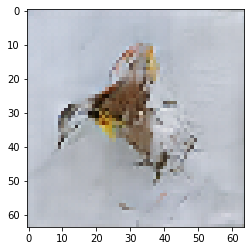

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 21

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.7079553604125977 sec
Gen loss: 1.932541891148216, Disc loss: 2.139542686311822, Disc valid real loss: 0.38348485764704254, Disc valid fake loss: 0.37913815206603, Disc class real loss: 0.6889383353685078, Disc class fake loss: 0.1309733135919822
Time for epoch 2 is 0.7122130393981934 sec
Gen loss: 1.9770973858080412, Disc loss: 2.152591303775185, Disc valid real loss: 0.40050964763290003, Disc valid fake loss: 0.39891308389211955, Disc class real loss: 0.6780028594167609, Disc class fake loss: 0.14944472791332947
Time for epoch 3 is 0.7067792415618896 sec
Gen loss: 1.8124700659199764, Disc loss: 2.1391864387612594, Disc valid real loss: 0.3927140141788282, Disc valid fake loss: 0.39446187333056804, Disc class real loss: 0.6783477569881239, Disc class fake loss: 0.15073538297101072
Time for epoch 4 is 0.7049076557159424 sec
Gen loss: 1.92426431806463

Time for epoch 31 is 0.6972784996032715 sec
Gen loss: 1.8943455093785335, Disc loss: 2.081858760432193, Disc valid real loss: 0.3935710411322744, Disc valid fake loss: 0.38951799430345235, Disc class real loss: 0.6772576915590387, Disc class fake loss: 0.16885303196154142
Time for epoch 32 is 0.6957266330718994 sec
Gen loss: 1.8558043806176436, Disc loss: 2.1063990718440007, Disc valid real loss: 0.39439366052025243, Disc valid fake loss: 0.40280152935730784, Disc class real loss: 0.6816846853808353, Disc class fake loss: 0.20366713718364113
Time for epoch 33 is 0.6961753368377686 sec
Gen loss: 1.7813678666165, Disc loss: 2.098479440337733, Disc valid real loss: 0.38607439398765564, Disc valid fake loss: 0.40296363830566406, Disc class real loss: 0.6836314075871518, Disc class fake loss: 0.18878768776592456
Time for epoch 34 is 0.6953332424163818 sec
Gen loss: 1.899471772344489, Disc loss: 2.0742177084872595, Disc valid real loss: 0.3806957429961154, Disc valid fake loss: 0.38786412461

Time for epoch 62 is 0.6946799755096436 sec
Gen loss: 1.8992328455573635, Disc loss: 1.9351303577423096, Disc valid real loss: 0.4023284143523166, Disc valid fake loss: 0.3913714477890416, Disc class real loss: 0.6176070978766993, Disc class fake loss: 0.19381424078815862
Time for epoch 63 is 0.6985633373260498 sec
Gen loss: 1.8418877375753302, Disc loss: 2.0360637777730037, Disc valid real loss: 0.3950515060048354, Disc valid fake loss: 0.3970198960680711, Disc class real loss: 0.6697354724532679, Disc class fake loss: 0.2451882142769663
Time for epoch 64 is 0.7003154754638672 sec
Gen loss: 1.8304845094680786, Disc loss: 1.9517940282821655, Disc valid real loss: 0.37630945287252726, Disc valid fake loss: 0.38914865569064494, Disc class real loss: 0.6426678048936945, Disc class fake loss: 0.20936933316682516
Time for epoch 65 is 0.7155194282531738 sec
Gen loss: 1.903947993328697, Disc loss: 2.0062500991319356, Disc valid real loss: 0.3956436358000103, Disc valid fake loss: 0.3917345890

Time for epoch 93 is 0.700474739074707 sec
Gen loss: 2.215004462944834, Disc loss: 1.9426845249376798, Disc valid real loss: 0.37317596454369395, Disc valid fake loss: 0.3916686412535216, Disc class real loss: 0.6530832711019015, Disc class fake loss: 0.26761112636641454
Time for epoch 94 is 0.6987557411193848 sec
Gen loss: 2.0235621552718315, Disc loss: 1.9047817054547762, Disc valid real loss: 0.37518983765652303, Disc valid fake loss: 0.37667402625083923, Disc class real loss: 0.6445297724322269, Disc class fake loss: 0.23979962577945307
Time for epoch 95 is 0.6951165199279785 sec
Gen loss: 2.1137074420326636, Disc loss: 1.9397548688085455, Disc valid real loss: 0.41735505430321945, Disc valid fake loss: 0.3756504200006786, Disc class real loss: 0.6448266412082472, Disc class fake loss: 0.22459088814885994
Time for epoch 96 is 0.698479413986206 sec
Gen loss: 2.005357949357284, Disc loss: 1.9280834135256315, Disc valid real loss: 0.3852789950998206, Disc valid fake loss: 0.3765062030

Time for epoch 123 is 0.6954488754272461 sec
Gen loss: 2.0089961980518543, Disc loss: 1.8586898163745278, Disc valid real loss: 0.35673580906893076, Disc valid fake loss: 0.38051710160155044, Disc class real loss: 0.6575733925166883, Disc class fake loss: 0.2180726983045277
Time for epoch 124 is 0.693511962890625 sec
Gen loss: 2.117803410479897, Disc loss: 1.887063415426957, Disc valid real loss: 0.37450599199847173, Disc valid fake loss: 0.4015630664009797, Disc class real loss: 0.6454528413320842, Disc class fake loss: 0.24073602023877597
Time for epoch 125 is 0.6989998817443848 sec
Gen loss: 1.988223395849529, Disc loss: 1.8337171077728271, Disc valid real loss: 0.372752297865717, Disc valid fake loss: 0.39645607298926305, Disc class real loss: 0.6327887961738988, Disc class fake loss: 0.1840582035089794
Time for epoch 126 is 0.699012041091919 sec
Gen loss: 1.8903781112871672, Disc loss: 1.9114233757320203, Disc valid real loss: 0.39243176422621073, Disc valid fake loss: 0.393616572

Time for epoch 153 is 0.6995084285736084 sec
Gen loss: 1.8842941585339998, Disc loss: 1.8365227674183093, Disc valid real loss: 0.4002221101208737, Disc valid fake loss: 0.4040477040566896, Disc class real loss: 0.6382220795280055, Disc class fake loss: 0.19329493179133064
Time for epoch 154 is 0.6979925632476807 sec
Gen loss: 1.865248862065767, Disc loss: 1.8392532812921625, Disc valid real loss: 0.38774713403300237, Disc valid fake loss: 0.39835306374650253, Disc class real loss: 0.6545501476839969, Disc class fake loss: 0.19128696816532234
Time for epoch 155 is 0.6969869136810303 sec
Gen loss: 1.952725008914345, Disc loss: 1.8186738867508738, Disc valid real loss: 0.3773870719106574, Disc valid fake loss: 0.381489087092249, Disc class real loss: 0.6635119538558157, Disc class fake loss: 0.18300712892883703
Time for epoch 156 is 0.6940944194793701 sec
Gen loss: 1.927396102955467, Disc loss: 1.8082343402661776, Disc valid real loss: 0.3657185529407702, Disc valid fake loss: 0.41240532

Time for epoch 183 is 0.7132511138916016 sec
Gen loss: 1.919278295416581, Disc loss: 1.80900103794901, Disc valid real loss: 0.39939646971853154, Disc valid fake loss: 0.41389113821481405, Disc class real loss: 0.6608930575220209, Disc class fake loss: 0.16454696380778364
Time for epoch 184 is 0.7105269432067871 sec
Gen loss: 1.868105179385135, Disc loss: 1.7423470773194965, Disc valid real loss: 0.37055582827643346, Disc valid fake loss: 0.3863151544018796, Disc class real loss: 0.6510309733842549, Disc class fake loss: 0.17162639137945676
Time for epoch 185 is 0.7050859928131104 sec
Gen loss: 1.9934593564585636, Disc loss: 1.7656206896430569, Disc valid real loss: 0.37341523405752686, Disc valid fake loss: 0.39995937441524704, Disc class real loss: 0.6376154956064726, Disc class fake loss: 0.21152833809978083
Time for epoch 186 is 0.7037723064422607 sec
Gen loss: 2.007123112678528, Disc loss: 1.735455174195139, Disc valid real loss: 0.3843460255547574, Disc valid fake loss: 0.3809515

Time for epoch 213 is 0.7025573253631592 sec
Gen loss: 1.912429131959614, Disc loss: 1.7328089977565564, Disc valid real loss: 0.39439507613056585, Disc valid fake loss: 0.39829270071104955, Disc class real loss: 0.665180598434649, Disc class fake loss: 0.15499874831814514
Time for epoch 214 is 0.7004046440124512 sec
Gen loss: 1.9660496335280568, Disc loss: 1.6710481894643683, Disc valid real loss: 0.3648411396302675, Disc valid fake loss: 0.40658817950047943, Disc class real loss: 0.628326742272628, Disc class fake loss: 0.16375227939141423
Time for epoch 215 is 0.6970784664154053 sec
Gen loss: 1.983147658799824, Disc loss: 1.72120621957277, Disc valid real loss: 0.3843927838300404, Disc valid fake loss: 0.39293992205670003, Disc class real loss: 0.6679374606985795, Disc class fake loss: 0.16019229218363762
Time for epoch 216 is 0.6968388557434082 sec
Gen loss: 2.026065186450356, Disc loss: 1.729058159025092, Disc valid real loss: 0.38306824627675506, Disc valid fake loss: 0.404203245

Time for epoch 243 is 0.700014591217041 sec
Gen loss: 1.942022957299885, Disc loss: 1.6809391724435907, Disc valid real loss: 0.3796205112808629, Disc valid fake loss: 0.4050983190536499, Disc class real loss: 0.6620756168114511, Disc class fake loss: 0.17179793903702184
Time for epoch 244 is 0.6986410617828369 sec
Gen loss: 1.9531046277598332, Disc loss: 1.6590212709025334, Disc valid real loss: 0.3888817272688213, Disc valid fake loss: 0.3815220029730546, Disc class real loss: 0.6677210519188329, Disc class fake loss: 0.15790799299353048
Time for epoch 245 is 0.6975123882293701 sec
Gen loss: 1.9685148502651013, Disc loss: 1.6586524122639705, Disc valid real loss: 0.3744722785134065, Disc valid fake loss: 0.402385413646698, Disc class real loss: 0.6567898580902501, Disc class fake loss: 0.1661870228616815
Time for epoch 246 is 0.7002789974212646 sec
Gen loss: 1.9796137370561298, Disc loss: 1.659414247462624, Disc valid real loss: 0.38562839595895065, Disc valid fake loss: 0.3968938714

Time for epoch 273 is 0.6987969875335693 sec
Gen loss: 1.908023520519859, Disc loss: 1.6060848800759566, Disc valid real loss: 0.3859704952490957, Disc valid fake loss: 0.3680963939742038, Disc class real loss: 0.687872074152294, Disc class fake loss: 0.1539549666799997
Time for epoch 274 is 0.6961214542388916 sec
Gen loss: 1.9133869346819425, Disc loss: 1.5906615194521452, Disc valid real loss: 0.40095966113241094, Disc valid fake loss: 0.38939228810762105, Disc class real loss: 0.662495682114049, Disc class fake loss: 0.12951448089198062
Time for epoch 275 is 0.6991345882415771 sec
Gen loss: 1.9470652028133995, Disc loss: 1.6766263873953569, Disc valid real loss: 0.40381247040472534, Disc valid fake loss: 0.4196088784619382, Disc class real loss: 0.6919871192229422, Disc class fake loss: 0.1548079307142057
Time for epoch 276 is 0.6955492496490479 sec
Gen loss: 2.012040985258002, Disc loss: 1.6101276121641461, Disc valid real loss: 0.3854450567772514, Disc valid fake loss: 0.379029096

Time for epoch 303 is 0.698906660079956 sec
Gen loss: 1.9633020162582397, Disc loss: 1.5936904392744367, Disc valid real loss: 0.4023339293505016, Disc valid fake loss: 0.3848061812551398, Disc class real loss: 0.6683250665664673, Disc class fake loss: 0.13833130033392654
Time for epoch 304 is 0.6962754726409912 sec
Gen loss: 1.8973504681336253, Disc loss: 1.5948259830474854, Disc valid real loss: 0.3844148155890013, Disc valid fake loss: 0.40372623267926666, Disc class real loss: 0.6599314463765997, Disc class fake loss: 0.14685612838519246
Time for epoch 305 is 0.6969485282897949 sec
Gen loss: 1.9596144776595266, Disc loss: 1.6051256342938072, Disc valid real loss: 0.384649363003279, Disc valid fake loss: 0.4073250136877361, Disc class real loss: 0.6695929734330428, Disc class fake loss: 0.1436634797014688
Time for epoch 306 is 0.6988415718078613 sec
Gen loss: 1.9255664348602295, Disc loss: 1.6006264310134084, Disc valid real loss: 0.41249942152123703, Disc valid fake loss: 0.4005090

Time for epoch 333 is 0.6988439559936523 sec
Gen loss: 1.953624085376137, Disc loss: 1.5914414870111566, Disc valid real loss: 0.3812823107368068, Disc valid fake loss: 0.37799881947667974, Disc class real loss: 0.6827521261415983, Disc class fake loss: 0.14951487571785324
Time for epoch 334 is 0.6965692043304443 sec
Gen loss: 1.9919894431766711, Disc loss: 1.5511366630855359, Disc valid real loss: 0.38279698083275243, Disc valid fake loss: 0.3873001697816347, Disc class real loss: 0.6607860201283505, Disc class fake loss: 0.12036161889371119
Time for epoch 335 is 0.6970367431640625 sec
Gen loss: 1.986343120273791, Disc loss: 1.5862840288563778, Disc valid real loss: 0.38228695486721237, Disc valid fake loss: 0.39918879929341766, Disc class real loss: 0.6562595963478088, Disc class fake loss: 0.14865024113341382
Time for epoch 336 is 0.6965723037719727 sec
Gen loss: 1.9878612254795276, Disc loss: 1.6136091947555542, Disc valid real loss: 0.3781380418099855, Disc valid fake loss: 0.3912

Time for epoch 363 is 0.6959323883056641 sec
Gen loss: 1.9455762160451788, Disc loss: 1.6264197826385498, Disc valid real loss: 0.379473466622202, Disc valid fake loss: 0.3952899324266534, Disc class real loss: 0.6794851861501995, Disc class fake loss: 0.17227265042693993
Time for epoch 364 is 0.6993474960327148 sec
Gen loss: 2.0212821395773637, Disc loss: 1.5888279425470453, Disc valid real loss: 0.37572321766301203, Disc valid fake loss: 0.3829595870093295, Disc class real loss: 0.6821909672335574, Disc class fake loss: 0.14806100412418968
Time for epoch 365 is 0.6993699073791504 sec
Gen loss: 2.0138801524513648, Disc loss: 1.593653634974831, Disc valid real loss: 0.39557298390488876, Disc valid fake loss: 0.38644817942067194, Disc class real loss: 0.6645783154587996, Disc class fake loss: 0.1471576592639873
Time for epoch 366 is 0.6984505653381348 sec
Gen loss: 1.9567513403139616, Disc loss: 1.6364853005660207, Disc valid real loss: 0.3957581229900059, Disc valid fake loss: 0.402208

Time for epoch 393 is 0.698570728302002 sec
Gen loss: 1.914693412027861, Disc loss: 1.589758640841434, Disc valid real loss: 0.3974075293854663, Disc valid fake loss: 0.37747329473495483, Disc class real loss: 0.6692272863889995, Disc class fake loss: 0.14575523706643204
Time for epoch 394 is 0.7001900672912598 sec
Gen loss: 1.976362705230713, Disc loss: 1.6029683602483649, Disc valid real loss: 0.40012190687028987, Disc valid fake loss: 0.3792541466261211, Disc class real loss: 0.6700808029425772, Disc class fake loss: 0.15361483355886058
Time for epoch 395 is 0.6978871822357178 sec
Gen loss: 1.8691784645381726, Disc loss: 1.63630968018582, Disc valid real loss: 0.3968149611824437, Disc valid fake loss: 0.3938514025587785, Disc class real loss: 0.6981598828968248, Disc class fake loss: 0.14759355548181033
Time for epoch 396 is 0.6941268444061279 sec
Gen loss: 2.0033692497956124, Disc loss: 1.5645078922572888, Disc valid real loss: 0.3870228089784321, Disc valid fake loss: 0.3727772800

Time for epoch 423 is 0.6962814331054688 sec
Gen loss: 2.0544894996442293, Disc loss: 1.5668117058904547, Disc valid real loss: 0.39078962802886963, Disc valid fake loss: 0.4057812627993132, Disc class real loss: 0.6385425486062702, Disc class fake loss: 0.13179965513317207
Time for epoch 424 is 0.6957275867462158 sec
Gen loss: 1.9372147133475857, Disc loss: 1.565867361269499, Disc valid real loss: 0.3847476792962928, Disc valid fake loss: 0.3840861759687725, Disc class real loss: 0.6444705912941381, Disc class fake loss: 0.1526613149203752
Time for epoch 425 is 0.6976234912872314 sec
Gen loss: 1.9158454506020797, Disc loss: 1.6393627242038125, Disc valid real loss: 0.40510204277540507, Disc valid fake loss: 0.39216215516391556, Disc class real loss: 0.7101534197204992, Disc class fake loss: 0.1320607538678144
Time for epoch 426 is 0.6985607147216797 sec
Gen loss: 1.8659294216256392, Disc loss: 1.632936063565706, Disc valid real loss: 0.3950227310782985, Disc valid fake loss: 0.3987695

Time for epoch 453 is 0.6913237571716309 sec
Gen loss: 1.891618201607152, Disc loss: 1.6401699781417847, Disc valid real loss: 0.39596098190859746, Disc valid fake loss: 0.39804516967974213, Disc class real loss: 0.7028533032065943, Disc class fake loss: 0.1434224455764419
Time for epoch 454 is 0.6947929859161377 sec
Gen loss: 2.024843774343792, Disc loss: 1.5495845455872386, Disc valid real loss: 0.3711065289221312, Disc valid fake loss: 0.3738524662820916, Disc class real loss: 0.6762966764600653, Disc class fake loss: 0.12843849392313705
Time for epoch 455 is 0.6989560127258301 sec
Gen loss: 1.9751858272050555, Disc loss: 1.5728733727806492, Disc valid real loss: 0.38000815557806117, Disc valid fake loss: 0.405367363440363, Disc class real loss: 0.6279708790151697, Disc class fake loss: 0.1596206438384558
Time for epoch 456 is 0.6960780620574951 sec
Gen loss: 1.9871255912278827, Disc loss: 1.5725847294456081, Disc valid real loss: 0.41648967956241806, Disc valid fake loss: 0.3700406

Time for epoch 483 is 0.6917610168457031 sec
Gen loss: 1.86268991545627, Disc loss: 1.5562614892658435, Disc valid real loss: 0.3951405145620045, Disc valid fake loss: 0.38802970553699295, Disc class real loss: 0.6494509703234622, Disc class fake loss: 0.12374542594740265
Time for epoch 484 is 0.6997952461242676 sec
Gen loss: 1.8522175864169472, Disc loss: 1.6135666433133578, Disc valid real loss: 0.3770100772380829, Disc valid fake loss: 0.4114149526545876, Disc class real loss: 0.6839257290488795, Disc class fake loss: 0.1413244154108198
Time for epoch 485 is 0.6963362693786621 sec
Gen loss: 2.031049377039859, Disc loss: 1.585072542491712, Disc valid real loss: 0.38907668308207866, Disc valid fake loss: 0.4001370103735673, Disc class real loss: 0.6625309617895829, Disc class fake loss: 0.13343372823376404
Time for epoch 486 is 0.6955316066741943 sec
Gen loss: 1.8636659822965924, Disc loss: 1.572982574764051, Disc valid real loss: 0.349673225691444, Disc valid fake loss: 0.40546944580

Time for epoch 513 is 0.6957111358642578 sec
Gen loss: 1.997288898417824, Disc loss: 1.5731056426700794, Disc valid real loss: 0.39357948146368327, Disc valid fake loss: 0.3832976190667403, Disc class real loss: 0.6549103040444223, Disc class fake loss: 0.141420944152694
Time for epoch 514 is 0.6990737915039062 sec
Gen loss: 1.9970770697844655, Disc loss: 1.6332169269260608, Disc valid real loss: 0.37636688194776835, Disc valid fake loss: 0.392680613618148, Disc class real loss: 0.683872684052116, Disc class fake loss: 0.18039742308227638
Time for epoch 515 is 0.6987833976745605 sec
Gen loss: 1.8742408752441406, Disc loss: 1.5947369462565373, Disc valid real loss: 0.4156622855286849, Disc valid fake loss: 0.404857210422817, Disc class real loss: 0.6425643547585136, Disc class fake loss: 0.13175528574930995
Time for epoch 516 is 0.6944091320037842 sec
Gen loss: 1.9608375712444908, Disc loss: 1.6376247719714516, Disc valid real loss: 0.3950664589279576, Disc valid fake loss: 0.3946291961

Time for epoch 543 is 0.6949059963226318 sec
Gen loss: 1.9551624122418856, Disc loss: 1.5942906329506321, Disc valid real loss: 0.37948612633504364, Disc valid fake loss: 0.38383519806359945, Disc class real loss: 0.6922773687463057, Disc class fake loss: 0.1388026197489939
Time for epoch 544 is 0.6979868412017822 sec
Gen loss: 1.907616609021237, Disc loss: 1.6160669577749152, Disc valid real loss: 0.3865852952003479, Disc valid fake loss: 0.3946245195049989, Disc class real loss: 0.6728114924932781, Disc class fake loss: 0.16214778313511297
Time for epoch 545 is 0.6972639560699463 sec
Gen loss: 1.9446626274209273, Disc loss: 1.5642859433826648, Disc valid real loss: 0.37948606986748545, Disc valid fake loss: 0.38612237572669983, Disc class real loss: 0.6725775191658422, Disc class fake loss: 0.1262092678562591
Time for epoch 546 is 0.6958208084106445 sec
Gen loss: 1.9586986240587736, Disc loss: 1.6031191474513005, Disc valid real loss: 0.3925904239478864, Disc valid fake loss: 0.40709

Time for epoch 573 is 0.6977343559265137 sec
Gen loss: 1.9950839281082153, Disc loss: 1.5666206886893825, Disc valid real loss: 0.36251900541154963, Disc valid fake loss: 0.3788086144547713, Disc class real loss: 0.685772064485048, Disc class fake loss: 0.139630248279948
Time for epoch 574 is 0.6984155178070068 sec
Gen loss: 1.963549061825401, Disc loss: 1.6230480733670687, Disc valid real loss: 0.3792117285101037, Disc valid fake loss: 0.40724799978105647, Disc class real loss: 0.6504928846108285, Disc class fake loss: 0.18618835273541903
Time for epoch 575 is 0.6935741901397705 sec
Gen loss: 1.8983617393594039, Disc loss: 1.564452748549612, Disc valid real loss: 0.37891132423752233, Disc valid fake loss: 0.37978385310424, Disc class real loss: 0.661345362663269, Disc class fake loss: 0.14451560182006737
Time for epoch 576 is 0.695875883102417 sec
Gen loss: 2.0667362275876497, Disc loss: 1.6300440712978965, Disc valid real loss: 0.3985412481584047, Disc valid fake loss: 0.384338973384

Time for epoch 604 is 0.6976568698883057 sec
Gen loss: 2.028706054938467, Disc loss: 1.5982502510673122, Disc valid real loss: 0.38979810946866084, Disc valid fake loss: 0.3789781912377006, Disc class real loss: 0.6867814816926655, Disc class fake loss: 0.14280129008387266
Time for epoch 605 is 0.6973421573638916 sec
Gen loss: 1.8874346645254838, Disc loss: 1.6117077124746222, Disc valid real loss: 0.3930702711406507, Disc valid fake loss: 0.38663095549533244, Disc class real loss: 0.6761899182670995, Disc class fake loss: 0.15592064786898463
Time for epoch 606 is 0.6956195831298828 sec
Gen loss: 2.029599403080187, Disc loss: 1.58504907708419, Disc valid real loss: 0.3783896879145974, Disc valid fake loss: 0.4034142447145362, Disc class real loss: 0.6700510664990074, Disc class fake loss: 0.1333014478808955
Time for epoch 607 is 0.6972560882568359 sec
Gen loss: 2.1130967140197754, Disc loss: 1.6225933777658563, Disc valid real loss: 0.3905508706444188, Disc valid fake loss: 0.392624034

Time for epoch 634 is 0.6971416473388672 sec
Gen loss: 1.956078052520752, Disc loss: 1.6304965270193, Disc valid real loss: 0.4012258586130644, Disc valid fake loss: 0.37895768410281133, Disc class real loss: 0.7125751689860695, Disc class fake loss: 0.13785277169786
Time for epoch 635 is 0.6966941356658936 sec
Gen loss: 1.9140832173196893, Disc loss: 1.5898095683047646, Disc valid real loss: 0.40757407326447337, Disc valid fake loss: 0.3955646392546202, Disc class real loss: 0.6322483734080666, Disc class fake loss: 0.15451804646535924
Time for epoch 636 is 0.6922199726104736 sec
Gen loss: 1.910679861118919, Disc loss: 1.5656856172963192, Disc valid real loss: 0.3752243283547853, Disc valid fake loss: 0.39805009961128235, Disc class real loss: 0.6594849166117216, Disc class fake loss: 0.13303156197071075
Time for epoch 637 is 0.6971144676208496 sec
Gen loss: 2.0571508470334505, Disc loss: 1.5746167521727712, Disc valid real loss: 0.3847662759454627, Disc valid fake loss: 0.39166525947

Time for epoch 664 is 0.6987664699554443 sec
Gen loss: 1.9610474360616583, Disc loss: 1.5928042123192234, Disc valid real loss: 0.39429643593336405, Disc valid fake loss: 0.3816937725794943, Disc class real loss: 0.6742870180230391, Disc class fake loss: 0.14263334635056948
Time for epoch 665 is 0.6975893974304199 sec
Gen loss: 1.9386716077202244, Disc loss: 1.6000187397003174, Disc valid real loss: 0.3825945140499818, Disc valid fake loss: 0.3976351305058128, Disc class real loss: 0.677282474542919, Disc class fake loss: 0.14261357133325778
Time for epoch 666 is 0.7020080089569092 sec
Gen loss: 1.9466397825040316, Disc loss: 1.5961922469892, Disc valid real loss: 0.39355185784791646, Disc valid fake loss: 0.3903658617483942, Disc class real loss: 0.6720440701434487, Disc class fake loss: 0.14033683310998113
Time for epoch 667 is 0.6990237236022949 sec
Gen loss: 1.9949536574514288, Disc loss: 1.6169682490198236, Disc valid real loss: 0.38691526180819463, Disc valid fake loss: 0.4145230

Time for epoch 694 is 0.6922085285186768 sec
Gen loss: 1.9604323286759227, Disc loss: 1.6099282754094977, Disc valid real loss: 0.39272338779349075, Disc valid fake loss: 0.3819074599366439, Disc class real loss: 0.6873108995588202, Disc class fake loss: 0.14809436076565793
Time for epoch 695 is 0.6905817985534668 sec
Gen loss: 1.9649569109866494, Disc loss: 1.5848712293725264, Disc valid real loss: 0.3965661447299154, Disc valid fake loss: 0.374726340174675, Disc class real loss: 0.6860194802284241, Disc class fake loss: 0.12767094805052406
Time for epoch 696 is 0.7003295421600342 sec
Gen loss: 1.884839327711808, Disc loss: 1.5881859628777755, Disc valid real loss: 0.38437335742147344, Disc valid fake loss: 0.3958753410138582, Disc class real loss: 0.6693270990723058, Disc class fake loss: 0.13871631143908753
Time for epoch 697 is 0.6918137073516846 sec
Gen loss: 1.921668667542307, Disc loss: 1.6242847066176564, Disc valid real loss: 0.4060100332686776, Disc valid fake loss: 0.3966575

Time for epoch 725 is 0.6996309757232666 sec
Gen loss: 1.9301445797870034, Disc loss: 1.6304806345387508, Disc valid real loss: 0.39105522162035894, Disc valid fake loss: 0.4180289271630739, Disc class real loss: 0.6803732106560155, Disc class fake loss: 0.14113113342931397
Time for epoch 726 is 0.6986637115478516 sec
Gen loss: 1.993999907844945, Disc loss: 1.5786167194968777, Disc valid real loss: 0.3750210043631102, Disc valid fake loss: 0.3750309912781966, Disc class real loss: 0.6749750469860277, Disc class fake loss: 0.153693945392182
Time for epoch 727 is 0.6957190036773682 sec
Gen loss: 2.034248954371402, Disc loss: 1.604604677150124, Disc valid real loss: 0.3923352917558269, Disc valid fake loss: 0.39164888231377853, Disc class real loss: 0.6944429686194972, Disc class fake loss: 0.12629118326463198
Time for epoch 728 is 0.6963975429534912 sec
Gen loss: 1.9144614495729144, Disc loss: 1.634882468926279, Disc valid real loss: 0.39823378857813385, Disc valid fake loss: 0.395142654

Time for epoch 755 is 0.6978883743286133 sec
Gen loss: 2.194945925160458, Disc loss: 1.5759618721510236, Disc valid real loss: 0.3874045390831797, Disc valid fake loss: 0.37520252717168706, Disc class real loss: 0.6367660823621248, Disc class fake loss: 0.17668074173362633
Time for epoch 756 is 0.7133162021636963 sec
Gen loss: 2.156142328914843, Disc loss: 1.6294260213249607, Disc valid real loss: 0.40770803313506276, Disc valid fake loss: 0.3834913294566305, Disc class real loss: 0.6646265418905961, Disc class fake loss: 0.17369831431853144
Time for epoch 757 is 0.6986830234527588 sec
Gen loss: 2.0481294079830774, Disc loss: 1.580014103337338, Disc valid real loss: 0.3690729627483769, Disc valid fake loss: 0.3902029175507395, Disc class real loss: 0.6681286661248458, Disc class fake loss: 0.15271266118476265
Time for epoch 758 is 0.6997315883636475 sec
Gen loss: 2.0486740564045154, Disc loss: 1.6151618330102218, Disc valid real loss: 0.3958566926027599, Disc valid fake loss: 0.4003472

Time for epoch 785 is 0.6969451904296875 sec
Gen loss: 1.9430222197582847, Disc loss: 1.6186224975084003, Disc valid real loss: 0.37387076020240784, Disc valid fake loss: 0.38918311815512807, Disc class real loss: 0.6986169219017029, Disc class fake loss: 0.15706003202419533
Time for epoch 786 is 0.6990253925323486 sec
Gen loss: 1.9306448760785555, Disc loss: 1.5852193581430536, Disc valid real loss: 0.3986740661294837, Disc valid fake loss: 0.3912236251329121, Disc class real loss: 0.6704007669499046, Disc class fake loss: 0.12503000093918099
Time for epoch 787 is 0.6969072818756104 sec
Gen loss: 1.912852864516409, Disc loss: 1.5717559488196122, Disc valid real loss: 0.4049815441432752, Disc valid fake loss: 0.3967768298952203, Disc class real loss: 0.6647830323169106, Disc class fake loss: 0.10532645665501293
Time for epoch 788 is 0.6940896511077881 sec
Gen loss: 2.0441088927419564, Disc loss: 1.6021069225512052, Disc valid real loss: 0.3822910817045915, Disc valid fake loss: 0.37831

Time for epoch 815 is 0.6968419551849365 sec
Gen loss: 2.0326362534573206, Disc loss: 1.5801147285260653, Disc valid real loss: 0.37740779942587804, Disc valid fake loss: 0.3942191428259799, Disc class real loss: 0.6686377023395739, Disc class fake loss: 0.1399558374756261
Time for epoch 816 is 0.6978020668029785 sec
Gen loss: 2.0958431206251444, Disc loss: 1.5765752729616667, Disc valid real loss: 0.3718949164214887, Disc valid fake loss: 0.3917259958229567, Disc class real loss: 0.6688380711957028, Disc class fake loss: 0.14422122624359632
Time for epoch 817 is 0.6938948631286621 sec
Gen loss: 1.968800475722865, Disc loss: 1.5776427607787282, Disc valid real loss: 0.3752258184709047, Disc valid fake loss: 0.38607484102249146, Disc class real loss: 0.6838720064414175, Disc class fake loss: 0.1325803479473842
Time for epoch 818 is 0.6921508312225342 sec
Gen loss: 1.8871500931288068, Disc loss: 1.598864800051639, Disc valid real loss: 0.37492569496757105, Disc valid fake loss: 0.3870807

Time for epoch 845 is 0.6995365619659424 sec
Gen loss: 1.9073905191923444, Disc loss: 1.5715411775990535, Disc valid real loss: 0.3890843062024367, Disc valid fake loss: 0.3646401778647774, Disc class real loss: 0.6744125767758018, Disc class fake loss: 0.14351031105769307
Time for epoch 846 is 0.6987934112548828 sec
Gen loss: 1.8865443656319065, Disc loss: 1.6217635242562545, Disc valid real loss: 0.3947716543548985, Disc valid fake loss: 0.38847498674141734, Disc class real loss: 0.6687289194056862, Disc class fake loss: 0.16988775290940938
Time for epoch 847 is 0.6979632377624512 sec
Gen loss: 1.9400326452757184, Disc loss: 1.6246119235691272, Disc valid real loss: 0.3851769268512726, Disc valid fake loss: 0.3922929685366781, Disc class real loss: 0.6941843879850287, Disc class fake loss: 0.15306586929057775
Time for epoch 848 is 0.7013041973114014 sec
Gen loss: 1.9476715953726518, Disc loss: 1.574491205968355, Disc valid real loss: 0.37054590802443654, Disc valid fake loss: 0.38459

Time for epoch 875 is 0.6926534175872803 sec
Gen loss: 1.9530374564622577, Disc loss: 1.5490363083387677, Disc valid real loss: 0.3868206566885898, Disc valid fake loss: 0.38998910784721375, Disc class real loss: 0.6568184871422617, Disc class fake loss: 0.11551634830079581
Time for epoch 876 is 0.6934604644775391 sec
Gen loss: 1.9504707737972862, Disc loss: 1.5769381648615788, Disc valid real loss: 0.37518413757023056, Disc valid fake loss: 0.39089314561141164, Disc class real loss: 0.6699417860884416, Disc class fake loss: 0.1410249005022802
Time for epoch 877 is 0.6894252300262451 sec
Gen loss: 1.965282402540508, Disc loss: 1.5658934555555646, Disc valid real loss: 0.38547318075832565, Disc valid fake loss: 0.3633824171204316, Disc class real loss: 0.681419667444731, Disc class fake loss: 0.13572734751199422
Time for epoch 878 is 0.6922204494476318 sec
Gen loss: 1.9510758236834878, Disc loss: 1.5684782894034135, Disc valid real loss: 0.38304434951983, Disc valid fake loss: 0.3576311

Time for epoch 905 is 0.6970608234405518 sec
Gen loss: 2.0352131065569425, Disc loss: 1.621420232873214, Disc valid real loss: 0.40387966601472153, Disc valid fake loss: 0.3898489585048274, Disc class real loss: 0.6952560481272245, Disc class fake loss: 0.13254815555716815
Time for epoch 906 is 0.6978967189788818 sec
Gen loss: 1.8815119893927323, Disc loss: 1.6063565015792847, Disc valid real loss: 0.40028692076080724, Disc valid fake loss: 0.3844867191816631, Disc class real loss: 0.6783888245883741, Disc class fake loss: 0.1433010901275434
Time for epoch 907 is 0.6974778175354004 sec
Gen loss: 1.8615726483495612, Disc loss: 1.5935914453707243, Disc valid real loss: 0.38881401482381317, Disc valid fake loss: 0.3879521159749282, Disc class real loss: 0.6747625909353557, Disc class fake loss: 0.1421692690959102
Time for epoch 908 is 0.6981017589569092 sec
Gen loss: 1.9747110918948525, Disc loss: 1.6562887116482383, Disc valid real loss: 0.3969418814307765, Disc valid fake loss: 0.379876

Time for epoch 935 is 0.6935176849365234 sec
Gen loss: 1.872142415297659, Disc loss: 1.5924196682478253, Disc valid real loss: 0.3778660313079232, Disc valid fake loss: 0.38366275868917765, Disc class real loss: 0.7049404319963957, Disc class fake loss: 0.12606623925660787
Time for epoch 936 is 0.6941030025482178 sec
Gen loss: 1.9175696561211033, Disc loss: 1.6545256313524748, Disc valid real loss: 0.4097968120323984, Disc valid fake loss: 0.3967484894551729, Disc class real loss: 0.6698365933016727, Disc class fake loss: 0.17824208109002365
Time for epoch 937 is 0.6926577091217041 sec
Gen loss: 1.8970727481340106, Disc loss: 1.5913100179873014, Disc valid real loss: 0.37558001750393916, Disc valid fake loss: 0.41491833642909404, Disc class real loss: 0.663770605074732, Disc class fake loss: 0.1371463958762194
Time for epoch 938 is 0.6941502094268799 sec
Gen loss: 1.9239761641151027, Disc loss: 1.557740606759724, Disc valid real loss: 0.3953296306886171, Disc valid fake loss: 0.3817199

Time for epoch 965 is 0.6953716278076172 sec
Gen loss: 1.9891025455374467, Disc loss: 1.618108216084932, Disc valid real loss: 0.38737665822631434, Disc valid fake loss: 0.39238547886672775, Disc class real loss: 0.7009466164990475, Disc class fake loss: 0.13751216075922312
Time for epoch 966 is 0.6836674213409424 sec
Gen loss: 1.9257982341866744, Disc loss: 1.5597725040034245, Disc valid real loss: 0.3716277056618741, Disc valid fake loss: 0.37638255483225774, Disc class real loss: 0.6751114631953993, Disc class fake loss: 0.13675846669234729
Time for epoch 967 is 0.6919808387756348 sec
Gen loss: 2.085444318620782, Disc loss: 1.6106475968109935, Disc valid real loss: 0.3849059704102968, Disc valid fake loss: 0.40210492046255814, Disc class real loss: 0.6868105436626234, Disc class fake loss: 0.1369361610789048
Time for epoch 968 is 0.6917989253997803 sec
Gen loss: 1.888943025940343, Disc loss: 1.5811530916314376, Disc valid real loss: 0.38052390437377126, Disc valid fake loss: 0.39002

Time for epoch 995 is 0.6950504779815674 sec
Gen loss: 1.9147060670350726, Disc loss: 1.5738080677233244, Disc valid real loss: 0.3846776610926578, Disc valid fake loss: 0.36963463613861486, Disc class real loss: 0.6806429687299227, Disc class fake loss: 0.13896116339846662
Time for epoch 996 is 0.6979279518127441 sec
Gen loss: 1.9091164877540188, Disc loss: 1.6295965282540572, Disc valid real loss: 0.3960759671110856, Disc valid fake loss: 0.39208751603176717, Disc class real loss: 0.7052205142221952, Disc class fake loss: 0.1363263404683063
Time for epoch 997 is 0.6989600658416748 sec
Gen loss: 1.9400428470812345, Disc loss: 1.6069064704995406, Disc valid real loss: 0.39129191480184855, Disc valid fake loss: 0.4071261035768609, Disc class real loss: 0.6601916928040353, Disc class fake loss: 0.1483991177458512
Time for epoch 998 is 0.6962423324584961 sec
Gen loss: 1.9088127048392045, Disc loss: 1.6405366784647892, Disc valid real loss: 0.3875243459877215, Disc valid fake loss: 0.39731

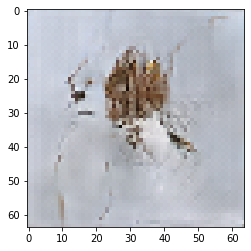

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 22

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6934669017791748 sec
Gen loss: 1.9375641847911633, Disc loss: 2.136354609539634, Disc valid real loss: 0.39326651943357366, Disc valid fake loss: 0.38896476124462326, Disc class real loss: 0.6775005679381522, Disc class fake loss: 0.15710612308037908
Time for epoch 2 is 0.6961841583251953 sec
Gen loss: 1.8596289785284745, Disc loss: 2.166344774396796, Disc valid real loss: 0.38708056744776276, Disc valid fake loss: 0.39294294071824926, Disc class real loss: 0.6945214208803678, Disc class fake loss: 0.17880399682019887
Time for epoch 3 is 0.6962363719940186 sec
Gen loss: 1.9474843803204989, Disc loss: 2.102773515801681, Disc valid real loss: 0.40506023952835485, Disc valid fake loss: 0.3778279533511714, Disc class real loss: 0.6621798339642977, Disc class fake loss: 0.15783640977583432
Time for epoch 4 is 0.699772834777832 sec
Gen loss: 1.84365456982

Time for epoch 31 is 0.6969969272613525 sec
Gen loss: 1.8170372435921116, Disc loss: 2.1073888289301017, Disc valid real loss: 0.4102776081938493, Disc valid fake loss: 0.396993393960752, Disc class real loss: 0.6770523284610949, Disc class fake loss: 0.18473191716169057
Time for epoch 32 is 0.6947400569915771 sec
Gen loss: 1.7968800256126805, Disc loss: 2.0408432985606946, Disc valid real loss: 0.39247738687615646, Disc valid fake loss: 0.37820051532042653, Disc class real loss: 0.6600333107145209, Disc class fake loss: 0.2193943716977772
Time for epoch 33 is 0.6936707496643066 sec
Gen loss: 1.782094208817733, Disc loss: 2.1123125302164176, Disc valid real loss: 0.40357460316858795, Disc valid fake loss: 0.39322330136048167, Disc class real loss: 0.6856323731573004, Disc class fake loss: 0.20860046030659424
Time for epoch 34 is 0.6948895454406738 sec
Gen loss: 1.8318549080898887, Disc loss: 2.0829500399137797, Disc valid real loss: 0.4233565628528595, Disc valid fake loss: 0.394498633

Time for epoch 62 is 0.6986236572265625 sec
Gen loss: 1.8565996132398908, Disc loss: 1.9672821509210687, Disc valid real loss: 0.3811318544965041, Disc valid fake loss: 0.3876099508059652, Disc class real loss: 0.6455862929946498, Disc class fake loss: 0.22702920672140622
Time for epoch 63 is 0.6984143257141113 sec
Gen loss: 1.9023860567494442, Disc loss: 1.9795082556573969, Disc valid real loss: 0.3875891111398998, Disc valid fake loss: 0.3795332500809117, Disc class real loss: 0.652689842801345, Disc class fake loss: 0.23886307093657946
Time for epoch 64 is 0.6965477466583252 sec
Gen loss: 1.9386250470813953, Disc loss: 1.9589554824327167, Disc valid real loss: 0.39136179654221787, Disc valid fake loss: 0.3906807585766441, Disc class real loss: 0.6399787476188258, Disc class fake loss: 0.1892458671017697
Time for epoch 65 is 0.6937649250030518 sec
Gen loss: 1.8931726719203747, Disc loss: 1.9650533701244153, Disc valid real loss: 0.3972950248341811, Disc valid fake loss: 0.36759594553

Time for epoch 93 is 0.6955978870391846 sec
Gen loss: 1.8810664227134304, Disc loss: 1.9388543053677207, Disc valid real loss: 0.38067117960829483, Disc valid fake loss: 0.37785751725498, Disc class real loss: 0.6683532219184073, Disc class fake loss: 0.198567748461899
Time for epoch 94 is 0.6978485584259033 sec
Gen loss: 1.9392363460440385, Disc loss: 1.9165896365517063, Disc valid real loss: 0.3836077906583485, Disc valid fake loss: 0.380413681268692, Disc class real loss: 0.6535915010853818, Disc class fake loss: 0.19409285838666715
Time for epoch 95 is 0.6986100673675537 sec
Gen loss: 1.916867551050688, Disc loss: 1.9093989761252153, Disc valid real loss: 0.36004215165188436, Disc valid fake loss: 0.38402619173652247, Disc class real loss: 0.6594026182827196, Disc class fake loss: 0.20827525854110718
Time for epoch 96 is 0.7035624980926514 sec
Gen loss: 1.9423559025714272, Disc loss: 1.952917920915704, Disc valid real loss: 0.3800121859500283, Disc valid fake loss: 0.40038133765521

Time for epoch 123 is 0.6945819854736328 sec
Gen loss: 1.9083652684563084, Disc loss: 1.8892574812236584, Disc valid real loss: 0.37511216025603444, Disc valid fake loss: 0.40330842607899714, Disc class real loss: 0.6491625058023553, Disc class fake loss: 0.22388085330787458
Time for epoch 124 is 0.6977753639221191 sec
Gen loss: 2.072439846239592, Disc loss: 1.905463043012117, Disc valid real loss: 0.3684034222050717, Disc valid fake loss: 0.39348688094239487, Disc class real loss: 0.6629261029394049, Disc class fake loss: 0.25290813414674057
Time for epoch 125 is 0.6988232135772705 sec
Gen loss: 2.1495181259356047, Disc loss: 1.8760187374918085, Disc valid real loss: 0.3499444511375929, Disc valid fake loss: 0.4101330418335764, Disc class real loss: 0.6473423211198104, Disc class fake loss: 0.24838795787409731
Time for epoch 126 is 0.6964015960693359 sec
Gen loss: 2.208140065795497, Disc loss: 1.8887824259306256, Disc valid real loss: 0.401355485382833, Disc valid fake loss: 0.3857628

Time for epoch 153 is 0.6996617317199707 sec
Gen loss: 1.9515628500988609, Disc loss: 1.8780416312970614, Disc valid real loss: 0.39907979259365484, Disc valid fake loss: 0.3816996216773987, Disc class real loss: 0.6711751912769518, Disc class fake loss: 0.22475806702124446
Time for epoch 154 is 0.6967413425445557 sec
Gen loss: 1.8925052442048724, Disc loss: 1.838544487953186, Disc valid real loss: 0.40723412758425664, Disc valid fake loss: 0.39330366410707174, Disc class real loss: 0.6471429718168158, Disc class fake loss: 0.18334850982615822
Time for epoch 155 is 0.6961009502410889 sec
Gen loss: 1.9418659335688542, Disc loss: 1.8647140703703229, Disc valid real loss: 0.4091309607028961, Disc valid fake loss: 0.3908520387975793, Disc class real loss: 0.6578965563523141, Disc class fake loss: 0.20644480068432658
Time for epoch 156 is 0.693852424621582 sec
Gen loss: 1.9184373868139166, Disc loss: 1.8318313422955965, Disc valid real loss: 0.38465506779520137, Disc valid fake loss: 0.4034

Time for epoch 183 is 0.6956663131713867 sec
Gen loss: 1.9634558213384528, Disc loss: 1.7616723587638454, Disc valid real loss: 0.38003547881778915, Disc valid fake loss: 0.38490432187130574, Disc class real loss: 0.6542297978150217, Disc class fake loss: 0.17966012774329437
Time for epoch 184 is 0.6961731910705566 sec
Gen loss: 1.9700524932459782, Disc loss: 1.8472917205409, Disc valid real loss: 0.38223027555566086, Disc valid fake loss: 0.4095696916705684, Disc class real loss: 0.6929840727856285, Disc class fake loss: 0.19257779184140658
Time for epoch 185 is 0.698845624923706 sec
Gen loss: 1.939776439415781, Disc loss: 1.7796819272794222, Disc valid real loss: 0.37728452996203776, Disc valid fake loss: 0.38525379017779704, Disc class real loss: 0.6730778687878659, Disc class fake loss: 0.177705764378372
Time for epoch 186 is 0.697908878326416 sec
Gen loss: 1.874906351691798, Disc loss: 1.8195844574978477, Disc valid real loss: 0.4008119623912008, Disc valid fake loss: 0.3901868384

Time for epoch 213 is 0.6969854831695557 sec
Gen loss: 2.0012771832315543, Disc loss: 1.7071025057842857, Disc valid real loss: 0.38949401284519, Disc valid fake loss: 0.3863459103985837, Disc class real loss: 0.6479363065016898, Disc class fake loss: 0.17126615619973132
Time for epoch 214 is 0.6971971988677979 sec
Gen loss: 1.9248577921014083, Disc loss: 1.7187311586580778, Disc valid real loss: 0.4119274726039485, Disc valid fake loss: 0.3636084104839124, Disc class real loss: 0.6750618595825998, Disc class fake loss: 0.1455296768169654
Time for epoch 215 is 0.6955842971801758 sec
Gen loss: 2.01383826607152, Disc loss: 1.722916603088379, Disc valid real loss: 0.38227391399835287, Disc valid fake loss: 0.3926800693336286, Disc class real loss: 0.6737049567072015, Disc class fake loss: 0.15640660963560404
Time for epoch 216 is 0.6987395286560059 sec
Gen loss: 1.9489462061932212, Disc loss: 1.7310649721246016, Disc valid real loss: 0.4010355331395802, Disc valid fake loss: 0.39795500040

Time for epoch 243 is 0.6937987804412842 sec
Gen loss: 1.9274647863287675, Disc loss: 1.649587217130159, Disc valid real loss: 0.38816441517127187, Disc valid fake loss: 0.3749219304636905, Disc class real loss: 0.6788177803943032, Disc class fake loss: 0.13906512958438774
Time for epoch 244 is 0.6980171203613281 sec
Gen loss: 1.9678694762681659, Disc loss: 1.6598919379083734, Disc valid real loss: 0.38056718989422444, Disc valid fake loss: 0.4104005200298209, Disc class real loss: 0.6502017661144859, Disc class fake loss: 0.15792013195000196
Time for epoch 245 is 0.6987643241882324 sec
Gen loss: 2.018988753619947, Disc loss: 1.6384884683709395, Disc valid real loss: 0.3864500742209585, Disc valid fake loss: 0.39227381191755595, Disc class real loss: 0.6605893718568903, Disc class fake loss: 0.1363263649767951
Time for epoch 246 is 0.6979532241821289 sec
Gen loss: 2.059362373853985, Disc loss: 1.6423478063784147, Disc valid real loss: 0.37209149881413106, Disc valid fake loss: 0.384167

Time for epoch 273 is 0.6960575580596924 sec
Gen loss: 2.0569372992766533, Disc loss: 1.6139435140710128, Disc valid real loss: 0.37587993082247284, Disc valid fake loss: 0.39437120682314825, Disc class real loss: 0.67863529920578, Disc class fake loss: 0.15506438989388316
Time for epoch 274 is 0.6963274478912354 sec
Gen loss: 2.0027190760562292, Disc loss: 1.5973573546660573, Disc valid real loss: 0.3784345623693968, Disc valid fake loss: 0.3953135342974412, Disc class real loss: 0.6652959616560685, Disc class fake loss: 0.1503424252334394
Time for epoch 275 is 0.6964941024780273 sec
Gen loss: 1.9701481932087948, Disc loss: 1.7065037739904303, Disc valid real loss: 0.4139282954366584, Disc valid fake loss: 0.39985338637703344, Disc class real loss: 0.7022378256446437, Disc class fake loss: 0.1842936044068713
Time for epoch 276 is 0.6929993629455566 sec
Gen loss: 2.0578190590205945, Disc loss: 1.639024721948724, Disc valid real loss: 0.3957290131794779, Disc valid fake loss: 0.39713207

Time for epoch 303 is 0.6924662590026855 sec
Gen loss: 2.0336371158298694, Disc loss: 1.5979645314969515, Disc valid real loss: 0.39190463643325, Disc valid fake loss: 0.4081469789931649, Disc class real loss: 0.6648935361912376, Disc class fake loss: 0.1331257565241111
Time for epoch 304 is 0.6981451511383057 sec
Gen loss: 1.9831174423820095, Disc loss: 1.5854249000549316, Disc valid real loss: 0.4015318170974129, Disc valid fake loss: 0.3794109413498326, Disc class real loss: 0.6720839613362363, Disc class fake loss: 0.13250614624274404
Time for epoch 305 is 0.6915647983551025 sec
Gen loss: 1.9155124739596718, Disc loss: 1.5721421869177568, Disc valid real loss: 0.3847659700795224, Disc valid fake loss: 0.39059289191898544, Disc class real loss: 0.6707150810643246, Disc class fake loss: 0.126177145658355
Time for epoch 306 is 0.698937177658081 sec
Gen loss: 1.9502422244925248, Disc loss: 1.603313634270116, Disc valid real loss: 0.3886883901922326, Disc valid fake loss: 0.406890971095

Time for epoch 333 is 0.695521354675293 sec
Gen loss: 1.9827988963378103, Disc loss: 1.6279124084271883, Disc valid real loss: 0.380490171281915, Disc valid fake loss: 0.40413907327150045, Disc class real loss: 0.6716948935860082, Disc class fake loss: 0.17168830295926646
Time for epoch 334 is 0.698591947555542 sec
Gen loss: 1.9475695522207963, Disc loss: 1.615420937538147, Disc valid real loss: 0.38844053682528046, Disc valid fake loss: 0.39996723595418426, Disc class real loss: 0.685644413295545, Disc class fake loss: 0.1414775946422627
Time for epoch 335 is 0.694676399230957 sec
Gen loss: 1.9785377979278564, Disc loss: 1.649234232149626, Disc valid real loss: 0.39083874068762126, Disc valid fake loss: 0.4003311850522694, Disc class real loss: 0.6944701232408222, Disc class fake loss: 0.16370032727718353
Time for epoch 336 is 0.6962692737579346 sec
Gen loss: 1.951935887336731, Disc loss: 1.652408242225647, Disc valid real loss: 0.3987187053027906, Disc valid fake loss: 0.393518328666

Time for epoch 363 is 0.6965458393096924 sec
Gen loss: 1.9817849585884495, Disc loss: 1.5834914759585732, Disc valid real loss: 0.38301791485987213, Disc valid fake loss: 0.37505312969810084, Disc class real loss: 0.6658790142912614, Disc class fake loss: 0.15964269049857793
Time for epoch 364 is 0.6944184303283691 sec
Gen loss: 1.9592391315259432, Disc loss: 1.5967444997084768, Disc valid real loss: 0.3882344757255755, Disc valid fake loss: 0.39380787705120285, Disc class real loss: 0.6814970029027838, Disc class fake loss: 0.13331479089040504
Time for epoch 365 is 0.6974711418151855 sec
Gen loss: 1.9391246469397294, Disc loss: 1.594812976686578, Disc valid real loss: 0.388741240689629, Disc valid fake loss: 0.38941342265982376, Disc class real loss: 0.6765573181604084, Disc class fake loss: 0.14020831373177076
Time for epoch 366 is 0.6988112926483154 sec
Gen loss: 1.973042563388222, Disc loss: 1.5336320651204962, Disc valid real loss: 0.38458821569618423, Disc valid fake loss: 0.3660

Time for epoch 393 is 0.6945595741271973 sec
Gen loss: 2.047911204789814, Disc loss: 1.648541105420966, Disc valid real loss: 0.38858944648190547, Disc valid fake loss: 0.4023043027049617, Disc class real loss: 0.6797966862979689, Disc class fake loss: 0.17795103278599286
Time for epoch 394 is 0.6899392604827881 sec
Gen loss: 1.994984884011118, Disc loss: 1.5825047367497493, Disc valid real loss: 0.39196168513674484, Disc valid fake loss: 0.385105793413363, Disc class real loss: 0.6834822642175775, Disc class fake loss: 0.12206728717214183
Time for epoch 395 is 0.693368673324585 sec
Gen loss: 1.9916600616354692, Disc loss: 1.6226238263280768, Disc valid real loss: 0.3824192834527869, Disc valid fake loss: 0.39778420799656916, Disc class real loss: 0.6655314878413552, Disc class fake loss: 0.1769865649311166
Time for epoch 396 is 0.6984810829162598 sec
Gen loss: 1.9466184314928556, Disc loss: 1.588644071629173, Disc valid real loss: 0.40123968218502243, Disc valid fake loss: 0.383477036

Time for epoch 423 is 0.6972606182098389 sec
Gen loss: 2.014757890450327, Disc loss: 1.5757506458382857, Disc valid real loss: 0.3720987674437071, Disc valid fake loss: 0.3756834299940812, Disc class real loss: 0.6959288998654014, Disc class fake loss: 0.13215232581684463
Time for epoch 424 is 0.6987309455871582 sec
Gen loss: 1.9450980989556563, Disc loss: 1.6090015737633956, Disc valid real loss: 0.40508085959836054, Disc valid fake loss: 0.37321253199326365, Disc class real loss: 0.6913737937023765, Disc class fake loss: 0.1394448158772368
Time for epoch 425 is 0.6994278430938721 sec
Gen loss: 1.9592682311409397, Disc loss: 1.596214118756746, Disc valid real loss: 0.37998899190049423, Disc valid fake loss: 0.39498672203013774, Disc class real loss: 0.6697801759368495, Disc class fake loss: 0.15156187548449165
Time for epoch 426 is 0.6990015506744385 sec
Gen loss: 1.9813830476058156, Disc loss: 1.5943498987900584, Disc valid real loss: 0.3864231360586066, Disc valid fake loss: 0.39734

Time for epoch 453 is 0.6950008869171143 sec
Gen loss: 1.957260200851842, Disc loss: 1.6531388508646112, Disc valid real loss: 0.39758811812651784, Disc valid fake loss: 0.40155241677635595, Disc class real loss: 0.7088854532492789, Disc class fake loss: 0.14522564489590495
Time for epoch 454 is 0.6977236270904541 sec
Gen loss: 1.9159012091787238, Disc loss: 1.5765118347971063, Disc valid real loss: 0.38656860119418096, Disc valid fake loss: 0.3866147728342759, Disc class real loss: 0.6592776022459331, Disc class fake loss: 0.14415391103217476
Time for epoch 455 is 0.6985518932342529 sec
Gen loss: 1.9468252847069187, Disc loss: 1.5859966905493486, Disc valid real loss: 0.3751639347327383, Disc valid fake loss: 0.38203590951467814, Disc class real loss: 0.6705184202445181, Disc class fake loss: 0.1583808711484859
Time for epoch 456 is 0.695016622543335 sec
Gen loss: 1.9877747610995644, Disc loss: 1.5817413643786782, Disc valid real loss: 0.3916057897241492, Disc valid fake loss: 0.37749

Time for epoch 483 is 0.707207202911377 sec
Gen loss: 1.88668692111969, Disc loss: 1.534160576368633, Disc valid real loss: 0.39093271838991267, Disc valid fake loss: 0.39814133706845733, Disc class real loss: 0.6462002145616632, Disc class fake loss: 0.09899576910232243
Time for epoch 484 is 0.7048444747924805 sec
Gen loss: 2.029315791632, Disc loss: 1.5854316761619167, Disc valid real loss: 0.4009221415770681, Disc valid fake loss: 0.3778827864872782, Disc class real loss: 0.677061234649859, Disc class fake loss: 0.12967502678695478
Time for epoch 485 is 0.7077820301055908 sec
Gen loss: 1.9994102841929386, Disc loss: 1.5592974800812571, Disc valid real loss: 0.36531904967207657, Disc valid fake loss: 0.39554099660170705, Disc class real loss: 0.6704956198993482, Disc class fake loss: 0.1280503443589336
Time for epoch 486 is 0.7053425312042236 sec
Gen loss: 1.975613744635331, Disc loss: 1.6076406303204989, Disc valid real loss: 0.3831759879463597, Disc valid fake loss: 0.4147519955509

Time for epoch 514 is 0.6966230869293213 sec
Gen loss: 1.9170290357188176, Disc loss: 1.5903985186627037, Disc valid real loss: 0.39643151195425735, Disc valid fake loss: 0.41432100063876104, Disc class real loss: 0.6496298093544809, Disc class fake loss: 0.13012011957011724
Time for epoch 515 is 0.6924431324005127 sec
Gen loss: 1.9594248658732365, Disc loss: 1.5748596756081832, Disc valid real loss: 0.39766023660960953, Disc valid fake loss: 0.396259290607352, Disc class real loss: 0.6512558021043476, Disc class fake loss: 0.12978865206241608
Time for epoch 516 is 0.6953520774841309 sec
Gen loss: 1.9451490828865452, Disc loss: 1.5561058395787288, Disc valid real loss: 0.3820953714220147, Disc valid fake loss: 0.39046712925559596, Disc class real loss: 0.6428594118670413, Disc class fake loss: 0.1407843490964488
Time for epoch 517 is 0.6994240283966064 sec
Gen loss: 2.0110220971860384, Disc loss: 1.5925588984238475, Disc valid real loss: 0.3811391443014145, Disc valid fake loss: 0.3915

Time for epoch 544 is 0.6986730098724365 sec
Gen loss: 2.0482223473097148, Disc loss: 1.5853758234726756, Disc valid real loss: 0.3742232307007438, Disc valid fake loss: 0.39048479732714203, Disc class real loss: 0.6793812356497112, Disc class fake loss: 0.1413941975486906
Time for epoch 545 is 0.695197582244873 sec
Gen loss: 1.9816489721599377, Disc loss: 1.5914688235835026, Disc valid real loss: 0.3777543588688499, Disc valid fake loss: 0.3964466044777318, Disc class real loss: 0.6796344769628424, Disc class fake loss: 0.13774178275152257
Time for epoch 546 is 0.6939361095428467 sec
Gen loss: 1.86359797653399, Disc loss: 1.5731897667834633, Disc valid real loss: 0.3871559516379708, Disc valid fake loss: 0.38908255413958903, Disc class real loss: 0.6774085352295324, Disc class fake loss: 0.11965431645512581
Time for epoch 547 is 0.6968159675598145 sec
Gen loss: 1.945583186651531, Disc loss: 1.5824648455569619, Disc valid real loss: 0.3823476323955937, Disc valid fake loss: 0.380370249

Time for epoch 574 is 0.6957588195800781 sec
Gen loss: 2.041879603737279, Disc loss: 1.566352034869947, Disc valid real loss: 0.38785722694898905, Disc valid fake loss: 0.3774889080147994, Disc class real loss: 0.671994620247891, Disc class fake loss: 0.12911987618396156
Time for epoch 575 is 0.6935956478118896 sec
Gen loss: 2.002844076407583, Disc loss: 1.5825581111406024, Disc valid real loss: 0.38125712934293243, Disc valid fake loss: 0.38093605480696024, Disc class real loss: 0.6878528406745509, Disc class fake loss: 0.13262314506267248
Time for epoch 576 is 0.6976423263549805 sec
Gen loss: 1.9578653950440257, Disc loss: 1.6198265176070363, Disc valid real loss: 0.3968029712375842, Disc valid fake loss: 0.42049204048357514, Disc class real loss: 0.6732906918776663, Disc class fake loss: 0.12934961405239606
Time for epoch 577 is 0.7011208534240723 sec
Gen loss: 1.9438083422811407, Disc loss: 1.6025166448793913, Disc valid real loss: 0.3871379086845799, Disc valid fake loss: 0.415764

Time for epoch 604 is 0.6916720867156982 sec
Gen loss: 2.0203899270609806, Disc loss: 1.5971134022662514, Disc valid real loss: 0.3890770407099473, Disc valid fake loss: 0.4012516768355119, Disc class real loss: 0.6658029211194891, Disc class fake loss: 0.14108670581328242
Time for epoch 605 is 0.6954829692840576 sec
Gen loss: 1.9560629254893254, Disc loss: 1.6088880175038387, Disc valid real loss: 0.3752856129094174, Disc valid fake loss: 0.40398797079136495, Disc class real loss: 0.6698437238994398, Disc class fake loss: 0.1598727338408169
Time for epoch 606 is 0.6913950443267822 sec
Gen loss: 2.0409765870947587, Disc loss: 1.6076841228886654, Disc valid real loss: 0.39172853294171783, Disc valid fake loss: 0.3805290727238906, Disc class real loss: 0.7082423881480568, Disc class fake loss: 0.12730034989745995
Time for epoch 607 is 0.6933434009552002 sec
Gen loss: 1.9121217853144596, Disc loss: 1.5957795946221602, Disc valid real loss: 0.37387537093538986, Disc valid fake loss: 0.4066

Time for epoch 634 is 0.6983671188354492 sec
Gen loss: 1.9355721975627698, Disc loss: 1.6252341082221584, Disc valid real loss: 0.42046843077007096, Disc valid fake loss: 0.40029762606871755, Disc class real loss: 0.6800441898797688, Disc class fake loss: 0.12453499946155046
Time for epoch 635 is 0.6928880214691162 sec
Gen loss: 1.948035572704516, Disc loss: 1.6043929865485744, Disc valid real loss: 0.3803807057832417, Disc valid fake loss: 0.38818921854621485, Disc class real loss: 0.6758732262410616, Disc class fake loss: 0.1600530045597177
Time for epoch 636 is 0.69455885887146 sec
Gen loss: 1.946164463695727, Disc loss: 1.5548720422543978, Disc valid real loss: 0.37195046010770294, Disc valid fake loss: 0.36561766266822815, Disc class real loss: 0.6650176487470928, Disc class fake loss: 0.15238879346533826
Time for epoch 637 is 0.6948087215423584 sec
Gen loss: 1.9897629900982505, Disc loss: 1.5807625306280035, Disc valid real loss: 0.39528782273593704, Disc valid fake loss: 0.39171

Time for epoch 664 is 0.6928830146789551 sec
Gen loss: 2.1406075515245138, Disc loss: 1.5992582910939266, Disc valid real loss: 0.38996653807790654, Disc valid fake loss: 0.3741632856820759, Disc class real loss: 0.6922180746731005, Disc class fake loss: 0.14302025970659757
Time for epoch 665 is 0.6953704357147217 sec
Gen loss: 2.108153449861627, Disc loss: 1.710336490681297, Disc valid real loss: 0.41840253691924245, Disc valid fake loss: 0.40645709006409897, Disc class real loss: 0.6989284063640394, Disc class fake loss: 0.18665093575653277
Time for epoch 666 is 0.6943051815032959 sec
Gen loss: 2.0085713612405875, Disc loss: 1.6179611682891846, Disc valid real loss: 0.38064381558644145, Disc valid fake loss: 0.3949824226529975, Disc class real loss: 0.6980925641561809, Disc class fake loss: 0.144353145047238
Time for epoch 667 is 0.6950914859771729 sec
Gen loss: 2.001101431093718, Disc loss: 1.6198230166184275, Disc valid real loss: 0.4111034493697317, Disc valid fake loss: 0.3812362

Time for epoch 694 is 0.7005431652069092 sec
Gen loss: 1.9696712305671291, Disc loss: 1.6005037583802875, Disc valid real loss: 0.3841243496066646, Disc valid fake loss: 0.39640483260154724, Disc class real loss: 0.674594079193316, Disc class fake loss: 0.1454863065951749
Time for epoch 695 is 0.6971511840820312 sec
Gen loss: 1.934685606705515, Disc loss: 1.6725980419861644, Disc valid real loss: 0.4097974723891208, Disc valid fake loss: 0.3999192322555341, Disc class real loss: 0.6900561200945001, Disc class fake loss: 0.17292866248049235
Time for epoch 696 is 0.6945428848266602 sec
Gen loss: 1.9252821897205554, Disc loss: 1.5652250616173995, Disc valid real loss: 0.3968479617645866, Disc valid fake loss: 0.3918684062204863, Disc class real loss: 0.6495007276535034, Disc class fake loss: 0.12711248566445552
Time for epoch 697 is 0.692453145980835 sec
Gen loss: 2.058642475228561, Disc loss: 1.557623731462579, Disc valid real loss: 0.37057615738166005, Disc valid fake loss: 0.3843637900

Time for epoch 724 is 0.6958212852478027 sec
Gen loss: 1.9768270254135132, Disc loss: 1.6146008842869808, Disc valid real loss: 0.3782719342332137, Disc valid fake loss: 0.392153567389438, Disc class real loss: 0.6976332413522821, Disc class fake loss: 0.14665235794688525
Time for epoch 725 is 0.6979327201843262 sec
Gen loss: 1.9581777108343024, Disc loss: 1.600725299433658, Disc valid real loss: 0.38655985813391835, Disc valid fake loss: 0.389861095108484, Disc class real loss: 0.6774618876607794, Disc class fake loss: 0.14694859754098089
Time for epoch 726 is 0.6967477798461914 sec
Gen loss: 1.961494339139838, Disc loss: 1.6040082918970209, Disc valid real loss: 0.3993598520755768, Disc valid fake loss: 0.37878599762916565, Disc class real loss: 0.69826740026474, Disc class fake loss: 0.12770916874471464
Time for epoch 727 is 0.6974484920501709 sec
Gen loss: 1.934435486793518, Disc loss: 1.5978795854668868, Disc valid real loss: 0.4087312378381428, Disc valid fake loss: 0.40643475087

Time for epoch 754 is 0.6978468894958496 sec
Gen loss: 1.9439414676867033, Disc loss: 1.63101421531878, Disc valid real loss: 0.3757785323419069, Disc valid fake loss: 0.38192315478073924, Disc class real loss: 0.7085129336306923, Disc class fake loss: 0.1649083389263404
Time for epoch 755 is 0.6954517364501953 sec
Gen loss: 1.9539060529909635, Disc loss: 1.582358956336975, Disc valid real loss: 0.39014263843235214, Disc valid fake loss: 0.39255856683379725, Disc class real loss: 0.6739911813484994, Disc class fake loss: 0.1257762461900711
Time for epoch 756 is 0.6984915733337402 sec
Gen loss: 1.9013745910242985, Disc loss: 1.5836942321375798, Disc valid real loss: 0.40166516366757843, Disc valid fake loss: 0.39141450273363215, Disc class real loss: 0.6693153600943716, Disc class fake loss: 0.12140876564540361
Time for epoch 757 is 0.6989049911499023 sec
Gen loss: 1.996425804338957, Disc loss: 1.6124774405830784, Disc valid real loss: 0.36972976044604655, Disc valid fake loss: 0.391758

Time for epoch 784 is 0.6990432739257812 sec
Gen loss: 1.9601309424952458, Disc loss: 1.5760815771002519, Disc valid real loss: 0.37633065800917775, Disc valid fake loss: 0.3847011280687232, Disc class real loss: 0.6687459475115726, Disc class fake loss: 0.14640831672831586
Time for epoch 785 is 0.7115283012390137 sec
Gen loss: 1.9067406026940596, Disc loss: 1.6290466659947445, Disc valid real loss: 0.3895734987760845, Disc valid fake loss: 0.3955600685194919, Disc class real loss: 0.701605875241129, Disc class fake loss: 0.14241907902454076
Time for epoch 786 is 0.6994190216064453 sec
Gen loss: 1.9879622961345471, Disc loss: 1.5638241516916376, Disc valid real loss: 0.3763018532803184, Disc valid fake loss: 0.38914138235543905, Disc class real loss: 0.6741447323247006, Disc class fake loss: 0.12434614096817218
Time for epoch 787 is 0.6972255706787109 sec
Gen loss: 2.015695910704763, Disc loss: 1.5622472386611135, Disc valid real loss: 0.37586668133735657, Disc valid fake loss: 0.38652

Time for epoch 814 is 0.6977283954620361 sec
Gen loss: 1.9647009937386763, Disc loss: 1.612151352982772, Disc valid real loss: 0.38377381782782705, Disc valid fake loss: 0.4038577958157188, Disc class real loss: 0.6539042905757302, Disc class fake loss: 0.17071209259723363
Time for epoch 815 is 0.6954796314239502 sec
Gen loss: 1.9202613893308138, Disc loss: 1.6375917259015536, Disc valid real loss: 0.40083177701423045, Disc valid fake loss: 0.39350430588973195, Disc class real loss: 0.6850190288142154, Disc class fake loss: 0.1583419669615595
Time for epoch 816 is 0.6991734504699707 sec
Gen loss: 2.177439915506463, Disc loss: 1.6025680930990922, Disc valid real loss: 0.3812019981836018, Disc valid fake loss: 0.3729952605147111, Disc class real loss: 0.6781197849072909, Disc class fake loss: 0.1703526295329395
Time for epoch 817 is 0.6992621421813965 sec
Gen loss: 2.166416331341392, Disc loss: 1.623118425670423, Disc valid real loss: 0.39686624548937144, Disc valid fake loss: 0.39149311

Time for epoch 844 is 0.697411060333252 sec
Gen loss: 1.9362839774081582, Disc loss: 1.6151393024544967, Disc valid real loss: 0.4116499706318504, Disc valid fake loss: 0.4130422959202214, Disc class real loss: 0.6627639547774666, Disc class fake loss: 0.12779006910951515
Time for epoch 845 is 0.6970169544219971 sec
Gen loss: 1.9153199572312205, Disc loss: 1.541455814712926, Disc valid real loss: 0.3684414554583399, Disc valid fake loss: 0.3952179558967289, Disc class real loss: 0.6576407865474099, Disc class fake loss: 0.12026309045521837
Time for epoch 846 is 0.6993975639343262 sec
Gen loss: 1.9362319268678363, Disc loss: 1.5787466325257953, Disc valid real loss: 0.4005433760191265, Disc valid fake loss: 0.38692868226452876, Disc class real loss: 0.6698120016800729, Disc class fake loss: 0.12157223020729266
Time for epoch 847 is 0.6987340450286865 sec
Gen loss: 1.9925714354766042, Disc loss: 1.5639277633867765, Disc valid real loss: 0.38787497658478587, Disc valid fake loss: 0.390801

Time for epoch 874 is 0.6969280242919922 sec
Gen loss: 2.1666205682252584, Disc loss: 1.6224941328952187, Disc valid real loss: 0.3878193011409358, Disc valid fake loss: 0.4281838818600303, Disc class real loss: 0.6459913724347165, Disc class fake loss: 0.1605966749944185
Time for epoch 875 is 0.6967566013336182 sec
Gen loss: 2.1708648079320003, Disc loss: 1.6309639089985897, Disc valid real loss: 0.39574662321492243, Disc valid fake loss: 0.38049180021411494, Disc class real loss: 0.6848160122570238, Disc class fake loss: 0.17001241445541382
Time for epoch 876 is 0.6994678974151611 sec
Gen loss: 2.1970400684758236, Disc loss: 1.6380370729847957, Disc valid real loss: 0.4082427150324771, Disc valid fake loss: 0.3742218990074961, Disc class real loss: 0.6872898716675607, Disc class fake loss: 0.1683863499446919
Time for epoch 877 is 0.695730447769165 sec
Gen loss: 2.1135150319651554, Disc loss: 1.5463683793419285, Disc valid real loss: 0.37270114217933853, Disc valid fake loss: 0.386247

Time for epoch 904 is 0.6975357532501221 sec
Gen loss: 2.021651211537813, Disc loss: 1.5963027665489598, Disc valid real loss: 0.4058840651261179, Disc valid fake loss: 0.37609202610818965, Disc class real loss: 0.6804137041694239, Disc class fake loss: 0.13402225116365835
Time for epoch 905 is 0.6978549957275391 sec
Gen loss: 1.8535535398282503, Disc loss: 1.5435511438470138, Disc valid real loss: 0.3776827070273851, Disc valid fake loss: 0.3669336344066419, Disc class real loss: 0.6725738864195975, Disc class fake loss: 0.12647014777911336
Time for epoch 906 is 0.7002663612365723 sec
Gen loss: 1.9866161722885936, Disc loss: 1.5964065601951198, Disc valid real loss: 0.3931426296108647, Disc valid fake loss: 0.3783200571411534, Disc class real loss: 0.6795505191150465, Disc class fake loss: 0.1455001689885792
Time for epoch 907 is 0.6979918479919434 sec
Gen loss: 1.9971337381162142, Disc loss: 1.582193374633789, Disc valid real loss: 0.41097500606587056, Disc valid fake loss: 0.3996011

Time for epoch 934 is 0.6979176998138428 sec
Gen loss: 1.858562707901001, Disc loss: 1.600240751316673, Disc valid real loss: 0.3916989282557839, Disc valid fake loss: 0.39511935961873906, Disc class real loss: 0.683198586890572, Disc class fake loss: 0.13033445179462433
Time for epoch 935 is 0.6984632015228271 sec
Gen loss: 1.9066847060856067, Disc loss: 1.5583482353310836, Disc valid real loss: 0.3851016148140556, Disc valid fake loss: 0.40651971886032506, Disc class real loss: 0.6428690427228024, Disc class fake loss: 0.12396166904976494
Time for epoch 936 is 0.6984446048736572 sec
Gen loss: 1.8326805641776638, Disc loss: 1.62107379185526, Disc valid real loss: 0.37962935159080907, Disc valid fake loss: 0.4071512159548308, Disc class real loss: 0.6918127724998876, Disc class fake loss: 0.14259031924762225
Time for epoch 937 is 0.6972100734710693 sec
Gen loss: 1.8759101691998934, Disc loss: 1.5880959159449528, Disc valid real loss: 0.3870949329514253, Disc valid fake loss: 0.38821769

Time for epoch 964 is 0.6980068683624268 sec
Gen loss: 2.101408469049554, Disc loss: 1.6202659355966669, Disc valid real loss: 0.38828364093052714, Disc valid fake loss: 0.390636693490179, Disc class real loss: 0.6962593574272958, Disc class fake loss: 0.1451964633245217
Time for epoch 965 is 0.6981701850891113 sec
Gen loss: 1.9319414339567487, Disc loss: 1.6043844662214581, Disc valid real loss: 0.37386992887446757, Disc valid fake loss: 0.3857983193899456, Disc class real loss: 0.7086788384537948, Disc class fake loss: 0.1361519070832353
Time for epoch 966 is 0.6980443000793457 sec
Gen loss: 1.9486147039814998, Disc loss: 1.6157783332623934, Disc valid real loss: 0.41523001303798274, Disc valid fake loss: 0.3853852999837775, Disc class real loss: 0.6762230898204603, Disc class fake loss: 0.13904738916378273
Time for epoch 967 is 0.6993892192840576 sec
Gen loss: 1.9580671097102917, Disc loss: 1.6004014077939486, Disc valid real loss: 0.39690990197031123, Disc valid fake loss: 0.388074

Time for epoch 994 is 0.7002859115600586 sec
Gen loss: 1.9055921278501813, Disc loss: 1.6019879328577142, Disc valid real loss: 0.3971428416277233, Disc valid fake loss: 0.392734305639016, Disc class real loss: 0.6787107367264597, Disc class fake loss: 0.1335091036009161
Time for epoch 995 is 0.6971442699432373 sec
Gen loss: 1.8831151912086888, Disc loss: 1.6026646965428402, Disc valid real loss: 0.4037499741504067, Disc valid fake loss: 0.3984833814595875, Disc class real loss: 0.6752393873114335, Disc class fake loss: 0.12530194595456123
Time for epoch 996 is 0.6925287246704102 sec
Gen loss: 1.8785508369144641, Disc loss: 1.6109508777919568, Disc valid real loss: 0.4063193202018738, Disc valid fake loss: 0.3844891402282213, Disc class real loss: 0.6745132835287797, Disc class fake loss: 0.14573492933260768
Time for epoch 997 is 0.6971900463104248 sec
Gen loss: 1.9139685881765265, Disc loss: 1.5664805236615633, Disc valid real loss: 0.3922662593816456, Disc valid fake loss: 0.37888985

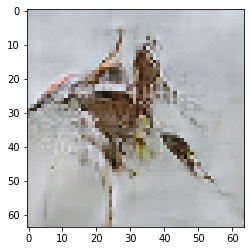

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 23

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6940951347351074 sec
Gen loss: 1.9958311633059853, Disc loss: 2.091778372463427, Disc valid real loss: 0.3951681358249564, Disc valid fake loss: 0.37031875864455577, Disc class real loss: 0.6636141852328652, Disc class fake loss: 0.11988805469713713
Time for epoch 2 is 0.6954391002655029 sec
Gen loss: 1.8708002002615678, Disc loss: 2.176921348822744, Disc valid real loss: 0.3933288235413401, Disc valid fake loss: 0.4063217749721126, Disc class real loss: 0.690115749835968, Disc class fake loss: 0.13640430608862325
Time for epoch 3 is 0.6959576606750488 sec
Gen loss: 1.8524303749987954, Disc loss: 2.1869805298353495, Disc valid real loss: 0.39392900780627604, Disc valid fake loss: 0.4154547233330576, Disc class real loss: 0.6912616287407122, Disc class fake loss: 0.13748983803548312
Time for epoch 4 is 0.6910562515258789 sec
Gen loss: 1.8864265492087

Time for epoch 31 is 0.6949186325073242 sec
Gen loss: 1.8504030453531366, Disc loss: 2.0395388854177376, Disc valid real loss: 0.387508445664456, Disc valid fake loss: 0.3867143627844359, Disc class real loss: 0.6593425493491324, Disc class fake loss: 0.17307762919287933
Time for epoch 32 is 0.6959142684936523 sec
Gen loss: 1.879061548333419, Disc loss: 2.0516588060479415, Disc valid real loss: 0.39003291098695053, Disc valid fake loss: 0.3969961781250803, Disc class real loss: 0.6588456724819384, Disc class fake loss: 0.19079233470715976
Time for epoch 33 is 0.6999740600585938 sec
Gen loss: 1.8925184638876664, Disc loss: 2.0573550839173165, Disc valid real loss: 0.3900405435185683, Disc valid fake loss: 0.3795858605911857, Disc class real loss: 0.6733234932548121, Disc class fake loss: 0.1691057634981055
Time for epoch 34 is 0.6962606906890869 sec
Gen loss: 1.858152753428409, Disc loss: 2.0078280975944116, Disc valid real loss: 0.385558357364253, Disc valid fake loss: 0.39050970579448

Time for epoch 62 is 0.6953861713409424 sec
Gen loss: 1.8526914935362966, Disc loss: 2.035500275461297, Disc valid real loss: 0.39206295734957647, Disc valid fake loss: 0.3874007965389051, Disc class real loss: 0.6794454549488268, Disc class fake loss: 0.21453380349435305
Time for epoch 63 is 0.700390100479126 sec
Gen loss: 1.8765181804958142, Disc loss: 2.0064590981132104, Disc valid real loss: 0.39976150895419876, Disc valid fake loss: 0.38481861039211873, Disc class real loss: 0.6647019229437175, Disc class fake loss: 0.18669318054851733
Time for epoch 64 is 0.6997299194335938 sec
Gen loss: 1.836689685520373, Disc loss: 1.9439276958766736, Disc valid real loss: 0.4007215311652736, Disc valid fake loss: 0.3808915238631399, Disc class real loss: 0.6305598930308693, Disc class fake loss: 0.1982317002196061
Time for epoch 65 is 0.69883131980896 sec
Gen loss: 1.921958521792763, Disc loss: 1.9556572750995034, Disc valid real loss: 0.41987007072097376, Disc valid fake loss: 0.3775499510137

Time for epoch 93 is 0.696906328201294 sec
Gen loss: 1.837593492708708, Disc loss: 1.976632375466196, Disc valid real loss: 0.38318825081775065, Disc valid fake loss: 0.4118098428374843, Disc class real loss: 0.6710023911375749, Disc class fake loss: 0.18919600115010612
Time for epoch 94 is 0.6955761909484863 sec
Gen loss: 1.825961251007883, Disc loss: 1.9482493463315462, Disc valid real loss: 0.4005318974193774, Disc valid fake loss: 0.39219025404829727, Disc class real loss: 0.6534492247983029, Disc class fake loss: 0.2036331241068087
Time for epoch 95 is 0.692363977432251 sec
Gen loss: 1.9075646714160317, Disc loss: 1.9041579961776733, Disc valid real loss: 0.3888303119885294, Disc valid fake loss: 0.37102019316271734, Disc class real loss: 0.6435801606429251, Disc class fake loss: 0.22353952966238322
Time for epoch 96 is 0.6949687004089355 sec
Gen loss: 1.9386183023452759, Disc loss: 1.9134338529486405, Disc valid real loss: 0.39140502559511287, Disc valid fake loss: 0.375081244267

Time for epoch 123 is 0.6867520809173584 sec
Gen loss: 1.9076704602492482, Disc loss: 1.88576540821477, Disc valid real loss: 0.39896783075834574, Disc valid fake loss: 0.374648884723061, Disc class real loss: 0.6582976328699213, Disc class fake loss: 0.19465223621380956
Time for epoch 124 is 0.6814773082733154 sec
Gen loss: 1.8563700726157741, Disc loss: 1.9303513263401233, Disc valid real loss: 0.3917263840374194, Disc valid fake loss: 0.4018201922115527, Disc class real loss: 0.6738483278374923, Disc class fake loss: 0.1993050488986467
Time for epoch 125 is 0.6803164482116699 sec
Gen loss: 1.9434957755239386, Disc loss: 1.852472054330926, Disc valid real loss: 0.3786775375667371, Disc valid fake loss: 0.38724807061647115, Disc class real loss: 0.6485569822160822, Disc class fake loss: 0.17860431969165802
Time for epoch 126 is 0.6725265979766846 sec
Gen loss: 1.966126046682659, Disc loss: 1.9204164994390387, Disc valid real loss: 0.42044459204924733, Disc valid fake loss: 0.410836960

Time for epoch 153 is 0.7027091979980469 sec
Gen loss: 1.9487029815974988, Disc loss: 1.9271021642183002, Disc valid real loss: 0.3975717190064882, Disc valid fake loss: 0.4071696479069559, Disc class real loss: 0.6987448271952177, Disc class fake loss: 0.19752838305736842
Time for epoch 154 is 0.6985301971435547 sec
Gen loss: 1.9002364371952258, Disc loss: 1.817386689938997, Disc valid real loss: 0.39290119629157216, Disc valid fake loss: 0.39566272654031454, Disc class real loss: 0.6397450189841422, Disc class fake loss: 0.18601151281281522
Time for epoch 155 is 0.6988697052001953 sec
Gen loss: 1.889185529006155, Disc loss: 1.848989863144724, Disc valid real loss: 0.3860284748830293, Disc valid fake loss: 0.3872855117446498, Disc class real loss: 0.66310421416634, Disc class fake loss: 0.21254448906371468
Time for epoch 156 is 0.6983692646026611 sec
Gen loss: 1.9433128394578632, Disc loss: 1.8408734735689665, Disc valid real loss: 0.41076804932795075, Disc valid fake loss: 0.38212758

Time for epoch 183 is 0.6992928981781006 sec
Gen loss: 1.9534415194862766, Disc loss: 1.7782874295586033, Disc valid real loss: 0.420341736391971, Disc valid fake loss: 0.38428741693496704, Disc class real loss: 0.6365077119124564, Disc class fake loss: 0.18080402087224157
Time for epoch 184 is 0.7001209259033203 sec
Gen loss: 1.9888909176776284, Disc loss: 1.773659153988487, Disc valid real loss: 0.38902463018894196, Disc valid fake loss: 0.39903886537802846, Disc class real loss: 0.6578371179731268, Disc class fake loss: 0.15810145045581617
Time for epoch 185 is 0.7039926052093506 sec
Gen loss: 1.9733571504291736, Disc loss: 1.7423770427703857, Disc valid real loss: 0.3917506086198907, Disc valid fake loss: 0.3781870478077939, Disc class real loss: 0.6470731120360526, Disc class fake loss: 0.1626227866662176
Time for epoch 186 is 0.7041823863983154 sec
Gen loss: 1.9923894530848454, Disc loss: 1.7656454036110325, Disc valid real loss: 0.3894259019901878, Disc valid fake loss: 0.387562

Time for epoch 213 is 0.7031221389770508 sec
Gen loss: 2.023496903871235, Disc loss: 1.7328015377647, Disc valid real loss: 0.3935355167639883, Disc valid fake loss: 0.394839860891041, Disc class real loss: 0.6685239860886022, Disc class fake loss: 0.15527727886250145
Time for epoch 214 is 0.7029743194580078 sec
Gen loss: 1.9211816536752802, Disc loss: 1.70696643151735, Disc valid real loss: 0.40548815225300033, Disc valid fake loss: 0.384248485690669, Disc class real loss: 0.6473964107664008, Disc class fake loss: 0.15609035856629672
Time for epoch 215 is 0.7036128044128418 sec
Gen loss: 1.9249645910764996, Disc loss: 1.7550959398871975, Disc valid real loss: 0.3911893759903155, Disc valid fake loss: 0.39835876853842483, Disc class real loss: 0.6853240383298773, Disc class fake loss: 0.16060700228339747
Time for epoch 216 is 0.7041316032409668 sec
Gen loss: 1.9512316866924888, Disc loss: 1.755122002802397, Disc valid real loss: 0.40156546391938863, Disc valid fake loss: 0.392062660894

Time for epoch 243 is 0.7012975215911865 sec
Gen loss: 1.9645765768854242, Disc loss: 1.608173269974558, Disc valid real loss: 0.39981375556243093, Disc valid fake loss: 0.37541067286541585, Disc class real loss: 0.629030748417503, Disc class fake loss: 0.1420211819441695
Time for epoch 244 is 0.700812578201294 sec
Gen loss: 1.9417795068339299, Disc loss: 1.6995598579707898, Disc valid real loss: 0.3819841413121474, Disc valid fake loss: 0.41365957416986165, Disc class real loss: 0.6680343558913783, Disc class fake loss: 0.17493764389502375
Time for epoch 245 is 0.6994373798370361 sec
Gen loss: 1.9697564024674266, Disc loss: 1.6890432897366976, Disc valid real loss: 0.4011221371198955, Disc valid fake loss: 0.3974523293344598, Disc class real loss: 0.6716407192380804, Disc class fake loss: 0.15712858383592807
Time for epoch 246 is 0.6977441310882568 sec
Gen loss: 1.8918809577038413, Disc loss: 1.6719862034446316, Disc valid real loss: 0.39605945035030965, Disc valid fake loss: 0.404997

Time for epoch 273 is 0.699970006942749 sec
Gen loss: 1.976030054845308, Disc loss: 1.5791747130845721, Disc valid real loss: 0.3929749209629862, Disc valid fake loss: 0.3736335117565958, Disc class real loss: 0.651423244099868, Disc class fake loss: 0.1515719751386266
Time for epoch 274 is 0.697925329208374 sec
Gen loss: 1.9877303587762933, Disc loss: 1.625723826257806, Disc valid real loss: 0.3861843598516364, Disc valid fake loss: 0.37177534793552597, Disc class real loss: 0.6988932302123622, Disc class fake loss: 0.1605292746895238
Time for epoch 275 is 0.6981174945831299 sec
Gen loss: 1.9160515320928473, Disc loss: 1.5958150813454075, Disc valid real loss: 0.38852208539059285, Disc valid fake loss: 0.396555842537629, Disc class real loss: 0.6701525637978002, Disc class fake loss: 0.13417017263801476
Time for epoch 276 is 0.6980576515197754 sec
Gen loss: 1.99955247577868, Disc loss: 1.606950935564543, Disc valid real loss: 0.3946425757910076, Disc valid fake loss: 0.391404526798348

Time for epoch 303 is 0.70823073387146 sec
Gen loss: 1.9295234805659245, Disc loss: 1.61039273989828, Disc valid real loss: 0.38151691305009944, Disc valid fake loss: 0.4085716165994343, Disc class real loss: 0.6748223022410744, Disc class fake loss: 0.14558778820853485
Time for epoch 304 is 0.6941101551055908 sec
Gen loss: 1.9419636789121126, Disc loss: 1.582449291881762, Disc valid real loss: 0.4091021324458875, Disc valid fake loss: 0.37830557164392975, Disc class real loss: 0.6455540249222204, Disc class fake loss: 0.1495867767616322
Time for epoch 305 is 0.6945922374725342 sec
Gen loss: 2.016109635955409, Disc loss: 1.6477081273731433, Disc valid real loss: 0.3893863150947972, Disc valid fake loss: 0.4144189538140046, Disc class real loss: 0.677024245262146, Disc class fake loss: 0.16698065321696431
Time for epoch 306 is 0.6943013668060303 sec
Gen loss: 1.961876298251905, Disc loss: 1.5698874310443276, Disc valid real loss: 0.3963158428668976, Disc valid fake loss: 0.3922605436099

Time for epoch 333 is 0.6922602653503418 sec
Gen loss: 1.9159025706742938, Disc loss: 1.6307542826000012, Disc valid real loss: 0.37870671404035466, Disc valid fake loss: 0.4124812985721387, Disc class real loss: 0.6609490482430709, Disc class fake loss: 0.17871367382375816
Time for epoch 334 is 0.6919252872467041 sec
Gen loss: 1.9134945932187533, Disc loss: 1.6172147361855758, Disc valid real loss: 0.4057511546109852, Disc valid fake loss: 0.3757282715094717, Disc class real loss: 0.6904259449557254, Disc class fake loss: 0.1454183867103175
Time for epoch 335 is 0.7286019325256348 sec
Gen loss: 1.9865464474025525, Disc loss: 1.6022090535414846, Disc valid real loss: 0.38460262982468857, Disc valid fake loss: 0.39413018603073924, Disc class real loss: 0.6684311095036959, Disc class fake loss: 0.15514775836154035
Time for epoch 336 is 0.7189657688140869 sec
Gen loss: 2.1554763756300273, Disc loss: 1.5495988318794651, Disc valid real loss: 0.3806256463653163, Disc valid fake loss: 0.3649

Time for epoch 363 is 0.6954355239868164 sec
Gen loss: 1.906892218087849, Disc loss: 1.5779726191570884, Disc valid real loss: 0.4079463105452688, Disc valid fake loss: 0.38605601693454544, Disc class real loss: 0.6644951512939051, Disc class fake loss: 0.11958411414372294
Time for epoch 364 is 0.6920061111450195 sec
Gen loss: 1.9653172806689614, Disc loss: 1.6352358052605076, Disc valid real loss: 0.393983593112544, Disc valid fake loss: 0.4083222158645329, Disc class real loss: 0.6880888750678614, Disc class fake loss: 0.14494977813017995
Time for epoch 365 is 0.6948623657226562 sec
Gen loss: 1.9837567806243896, Disc loss: 1.5256730004360801, Disc valid real loss: 0.35578090579886185, Disc valid fake loss: 0.3784461774324116, Disc class real loss: 0.6444532526166815, Disc class fake loss: 0.14709215238690376
Time for epoch 366 is 0.6971025466918945 sec
Gen loss: 1.9908511073965776, Disc loss: 1.5850912959952104, Disc valid real loss: 0.3970710886152167, Disc valid fake loss: 0.396234

Time for epoch 393 is 0.7007904052734375 sec
Gen loss: 1.9740986510326988, Disc loss: 1.5832580139762478, Disc valid real loss: 0.4035330806907855, Disc valid fake loss: 0.37048548460006714, Disc class real loss: 0.6715720044939142, Disc class fake loss: 0.1377742378727386
Time for epoch 394 is 0.701153039932251 sec
Gen loss: 1.9495910657079596, Disc loss: 1.5862088203430176, Disc valid real loss: 0.3884976663087544, Disc valid fake loss: 0.3860993338258643, Disc class real loss: 0.6815076533116793, Disc class fake loss: 0.13021443196033178
Time for epoch 395 is 0.6928765773773193 sec
Gen loss: 2.015621078641791, Disc loss: 1.524452479262101, Disc valid real loss: 0.38182633958364787, Disc valid fake loss: 0.3759019296420248, Disc class real loss: 0.6483567827626279, Disc class fake loss: 0.11847340825356935
Time for epoch 396 is 0.7015640735626221 sec
Gen loss: 1.9740858391711587, Disc loss: 1.5723726749420166, Disc valid real loss: 0.38132596172784505, Disc valid fake loss: 0.4018404

Time for epoch 423 is 0.7015016078948975 sec
Gen loss: 1.9581113551792346, Disc loss: 1.5915143803546303, Disc valid real loss: 0.3790084515747271, Disc valid fake loss: 0.3955998138377541, Disc class real loss: 0.6767417506167763, Disc class fake loss: 0.1402716566073267
Time for epoch 424 is 0.6966402530670166 sec
Gen loss: 2.019315945474725, Disc loss: 1.597220590240077, Disc valid real loss: 0.3877316885872891, Disc valid fake loss: 0.40187313133164454, Disc class real loss: 0.6668384232019123, Disc class fake loss: 0.14088256108133415
Time for epoch 425 is 0.6943352222442627 sec
Gen loss: 2.101915020691721, Disc loss: 1.5529651390878778, Disc valid real loss: 0.37618808840450485, Disc valid fake loss: 0.3696310473115821, Disc class real loss: 0.6710528103928817, Disc class fake loss: 0.1362001952764235
Time for epoch 426 is 0.701514482498169 sec
Gen loss: 2.0926355939162407, Disc loss: 1.6194195684633756, Disc valid real loss: 0.38834725320339203, Disc valid fake loss: 0.384002699

Time for epoch 453 is 0.6925203800201416 sec
Gen loss: 1.917999499722531, Disc loss: 1.5398550598244918, Disc valid real loss: 0.37274805103477676, Disc valid fake loss: 0.38924513208238704, Disc class real loss: 0.6803670337325648, Disc class fake loss: 0.09761142867960428
Time for epoch 454 is 0.6899094581604004 sec
Gen loss: 2.0075665649614836, Disc loss: 1.575359714658637, Disc valid real loss: 0.3836269315920378, Disc valid fake loss: 0.38397404237797383, Disc class real loss: 0.6675246357917786, Disc class fake loss: 0.14033953610219455
Time for epoch 455 is 0.6924996376037598 sec
Gen loss: 2.0831127605940165, Disc loss: 1.5809838081661023, Disc valid real loss: 0.39359672681281443, Disc valid fake loss: 0.3869862234906146, Disc class real loss: 0.6869596148792066, Disc class fake loss: 0.11355592153574291
Time for epoch 456 is 0.6959326267242432 sec
Gen loss: 1.9646927432010048, Disc loss: 1.607429027557373, Disc valid real loss: 0.37890541396642985, Disc valid fake loss: 0.4006

Time for epoch 483 is 0.7061631679534912 sec
Gen loss: 1.9396871202870418, Disc loss: 1.6007409848664935, Disc valid real loss: 0.3938680604884499, Disc valid fake loss: 0.3828411761083101, Disc class real loss: 0.6659094879501745, Disc class fake loss: 0.15822380624319377
Time for epoch 484 is 0.7047371864318848 sec
Gen loss: 1.8538791443172253, Disc loss: 1.5878781833146747, Disc valid real loss: 0.3960594456446798, Disc valid fake loss: 0.39520768115394994, Disc class real loss: 0.66543742230064, Disc class fake loss: 0.13128047122767098
Time for epoch 485 is 0.7047734260559082 sec
Gen loss: 1.9489991790369938, Disc loss: 1.580804335443597, Disc valid real loss: 0.39341244728941666, Disc valid fake loss: 0.3917604324064757, Disc class real loss: 0.6769658734923915, Disc class fake loss: 0.11877727037981937
Time for epoch 486 is 0.7081923484802246 sec
Gen loss: 1.9684933047545583, Disc loss: 1.590353294422752, Disc valid real loss: 0.3985707148125297, Disc valid fake loss: 0.37937034

Time for epoch 513 is 0.6929447650909424 sec
Gen loss: 2.0153722888544987, Disc loss: 1.5694843028721057, Disc valid real loss: 0.3798873612755223, Disc valid fake loss: 0.3593266731814334, Disc class real loss: 0.681602772913481, Disc class fake loss: 0.14877408037060186
Time for epoch 514 is 0.694281816482544 sec
Gen loss: 1.9406913267938715, Disc loss: 1.5795995310733193, Disc valid real loss: 0.3728527450247815, Disc valid fake loss: 0.3904269086687188, Disc class real loss: 0.6834299062427721, Disc class fake loss: 0.13300006719012009
Time for epoch 515 is 0.6944530010223389 sec
Gen loss: 2.0294918574784933, Disc loss: 1.580951502448634, Disc valid real loss: 0.4097522826571214, Disc valid fake loss: 0.392386647431474, Disc class real loss: 0.6633087365250838, Disc class fake loss: 0.11561338701530506
Time for epoch 516 is 0.6972863674163818 sec
Gen loss: 2.0106364237634757, Disc loss: 1.5613546245976497, Disc valid real loss: 0.3748730060301329, Disc valid fake loss: 0.3736219453

Time for epoch 543 is 0.6920902729034424 sec
Gen loss: 1.9504160818300749, Disc loss: 1.523357498018365, Disc valid real loss: 0.3796034706266303, Disc valid fake loss: 0.3961333836379804, Disc class real loss: 0.6465620053441901, Disc class fake loss: 0.1011677198112011
Time for epoch 544 is 0.6937012672424316 sec
Gen loss: 2.040666279039885, Disc loss: 1.596965049442492, Disc valid real loss: 0.3908417867986779, Disc valid fake loss: 0.4009929071915777, Disc class real loss: 0.6757600495689794, Disc class fake loss: 0.12947960315566315
Time for epoch 545 is 0.7120218276977539 sec
Gen loss: 2.0209880753567346, Disc loss: 1.5417567303306179, Disc valid real loss: 0.3807236301271539, Disc valid fake loss: 0.3784127988313374, Disc class real loss: 0.6505482385033056, Disc class fake loss: 0.13217572181632645
Time for epoch 546 is 0.7238192558288574 sec
Gen loss: 1.991899289582905, Disc loss: 1.579672280110811, Disc valid real loss: 0.3811188300973491, Disc valid fake loss: 0.404617737782

Time for epoch 573 is 0.7004022598266602 sec
Gen loss: 1.911604592674657, Disc loss: 1.5678033515026695, Disc valid real loss: 0.3908475574694182, Disc valid fake loss: 0.39740056270047236, Disc class real loss: 0.6537244853220487, Disc class fake loss: 0.12593630171920123
Time for epoch 574 is 0.6940243244171143 sec
Gen loss: 1.9644415127603632, Disc loss: 1.6040477125268233, Disc valid real loss: 0.38511225659596293, Disc valid fake loss: 0.4042951166629791, Disc class real loss: 0.6674515573601973, Disc class fake loss: 0.14729283848091176
Time for epoch 575 is 0.6976265907287598 sec
Gen loss: 2.0892932415008545, Disc loss: 1.6072744444796914, Disc valid real loss: 0.40368906761470597, Disc valid fake loss: 0.3743523696535512, Disc class real loss: 0.6899916655138919, Disc class fake loss: 0.13935147696419767
Time for epoch 576 is 0.6942670345306396 sec
Gen loss: 1.966059069884451, Disc loss: 1.630466994486357, Disc valid real loss: 0.39767926303963913, Disc valid fake loss: 0.39951

Time for epoch 603 is 0.7005164623260498 sec
Gen loss: 1.9484867233979075, Disc loss: 1.628259213347184, Disc valid real loss: 0.40535857175525863, Disc valid fake loss: 0.39543186520275314, Disc class real loss: 0.7016193741246274, Disc class fake loss: 0.12596454667417625
Time for epoch 604 is 0.6944665908813477 sec
Gen loss: 1.9307792312220524, Disc loss: 1.5977694862767269, Disc valid real loss: 0.39679534498013946, Disc valid fake loss: 0.37509130176744965, Disc class real loss: 0.6879008255506817, Disc class fake loss: 0.13809197082331306
Time for epoch 605 is 0.6965115070343018 sec
Gen loss: 1.8889741709357815, Disc loss: 1.5922343354476125, Disc valid real loss: 0.3977595677501277, Disc valid fake loss: 0.38300349994709615, Disc class real loss: 0.6835287401550695, Disc class fake loss: 0.12805365182851491
Time for epoch 606 is 0.6972291469573975 sec
Gen loss: 1.9263456306959454, Disc loss: 1.5374162008887844, Disc valid real loss: 0.37897594508371857, Disc valid fake loss: 0.3

Time for epoch 633 is 0.6934177875518799 sec
Gen loss: 1.9700325915687962, Disc loss: 1.6301781001843905, Disc valid real loss: 0.39191304068816335, Disc valid fake loss: 0.40050974958821345, Disc class real loss: 0.6942497334982219, Disc class fake loss: 0.14361573442032463
Time for epoch 634 is 0.6939828395843506 sec
Gen loss: 1.9656273628536023, Disc loss: 1.559276072602523, Disc valid real loss: 0.38439219092067917, Disc valid fake loss: 0.38993267322841446, Disc class real loss: 0.6767831225144235, Disc class fake loss: 0.10828179670007605
Time for epoch 635 is 0.698765754699707 sec
Gen loss: 1.9843703069184955, Disc loss: 1.59086947692068, Disc valid real loss: 0.35743781845820577, Disc valid fake loss: 0.41794759662527786, Disc class real loss: 0.6975096683753165, Disc class fake loss: 0.1180902878312688
Time for epoch 636 is 0.6978387832641602 sec
Gen loss: 2.0214056968688965, Disc loss: 1.5585794637077732, Disc valid real loss: 0.39619573323350205, Disc valid fake loss: 0.3909

Time for epoch 663 is 0.6942019462585449 sec
Gen loss: 1.9290545614142167, Disc loss: 1.5771069526672363, Disc valid real loss: 0.40421647303982783, Disc valid fake loss: 0.3675343017829092, Disc class real loss: 0.6710247491535387, Disc class fake loss: 0.13443876214717565
Time for epoch 664 is 0.6978108882904053 sec
Gen loss: 1.9685216200979132, Disc loss: 1.5486629260213751, Disc valid real loss: 0.3730567991733551, Disc valid fake loss: 0.3825132062560634, Disc class real loss: 0.6719286880995098, Disc class fake loss: 0.12127435246580526
Time for epoch 665 is 0.6980974674224854 sec
Gen loss: 1.898189808193006, Disc loss: 1.5776917432483875, Disc valid real loss: 0.37912102278910187, Disc valid fake loss: 0.4072855460016351, Disc class real loss: 0.6442164119921232, Disc class fake loss: 0.14716818575796328
Time for epoch 666 is 0.697641134262085 sec
Gen loss: 1.9148424863815308, Disc loss: 1.5443763105492843, Disc valid real loss: 0.385104490738166, Disc valid fake loss: 0.3682007

Time for epoch 693 is 0.6980476379394531 sec
Gen loss: 2.0711914489143775, Disc loss: 1.5757136595876593, Disc valid real loss: 0.41214167601183843, Disc valid fake loss: 0.37958018873867233, Disc class real loss: 0.6442805340415553, Disc class fake loss: 0.13981215028386368
Time for epoch 694 is 0.6973669528961182 sec
Gen loss: 1.9879190168882672, Disc loss: 1.6048437921624434, Disc valid real loss: 0.3721991738206462, Disc valid fake loss: 0.41148664841526433, Disc class real loss: 0.6973780456342196, Disc class fake loss: 0.12389462009856575
Time for epoch 695 is 0.6969001293182373 sec
Gen loss: 2.103951617291099, Disc loss: 1.552120798512509, Disc valid real loss: 0.36877812602018056, Disc valid fake loss: 0.38831125278221934, Disc class real loss: 0.6748591222261128, Disc class fake loss: 0.12028324329539349
Time for epoch 696 is 0.699833869934082 sec
Gen loss: 2.004848185338472, Disc loss: 1.6044716835021973, Disc valid real loss: 0.39458944452436345, Disc valid fake loss: 0.3701

Time for epoch 723 is 0.6970903873443604 sec
Gen loss: 2.024585165475544, Disc loss: 1.5593641996383667, Disc valid real loss: 0.3853813378434432, Disc valid fake loss: 0.39919090427850423, Disc class real loss: 0.6631812610124287, Disc class fake loss: 0.11172103705374818
Time for epoch 724 is 0.6975808143615723 sec
Gen loss: 1.9089230487221165, Disc loss: 1.6316583093843962, Disc valid real loss: 0.4055375119573192, Disc valid fake loss: 0.40369538256996557, Disc class real loss: 0.6848547772357338, Disc class fake loss: 0.13768008116044497
Time for epoch 725 is 0.699622392654419 sec
Gen loss: 2.0928150478162264, Disc loss: 1.5728303319529484, Disc valid real loss: 0.3791438450938777, Disc valid fake loss: 0.3887505288186826, Disc class real loss: 0.6545526385307312, Disc class fake loss: 0.15048415174609736
Time for epoch 726 is 0.6965701580047607 sec
Gen loss: 2.06025503183666, Disc loss: 1.5888839018972296, Disc valid real loss: 0.3725021795222634, Disc valid fake loss: 0.39305016

Time for epoch 753 is 0.6970663070678711 sec
Gen loss: 2.0088440117083097, Disc loss: 1.5494317255522077, Disc valid real loss: 0.36778712900061356, Disc valid fake loss: 0.39610757953242254, Disc class real loss: 0.6628489902144984, Disc class fake loss: 0.12279603983226575
Time for epoch 754 is 0.6993551254272461 sec
Gen loss: 2.036568836161965, Disc loss: 1.5912422380949323, Disc valid real loss: 0.39704883255456624, Disc valid fake loss: 0.3849758694046422, Disc class real loss: 0.6772335328553852, Disc class fake loss: 0.13209301821495356
Time for epoch 755 is 0.6901826858520508 sec
Gen loss: 1.922545508334511, Disc loss: 1.625514871195743, Disc valid real loss: 0.3901510050422267, Disc valid fake loss: 0.38889588023486893, Disc class real loss: 0.7091366711415743, Disc class fake loss: 0.13744569138476723
Time for epoch 756 is 0.6936163902282715 sec
Gen loss: 1.959196598906266, Disc loss: 1.5785163515492489, Disc valid real loss: 0.39475675005661814, Disc valid fake loss: 0.38178

Time for epoch 783 is 0.7029666900634766 sec
Gen loss: 1.9589828190050627, Disc loss: 1.5833242378736798, Disc valid real loss: 0.394464384568365, Disc valid fake loss: 0.39565059385801615, Disc class real loss: 0.6818582321468153, Disc class fake loss: 0.11146514039290578
Time for epoch 784 is 0.7024331092834473 sec
Gen loss: 1.9252453226792186, Disc loss: 1.6078084770001864, Disc valid real loss: 0.3876609912044124, Disc valid fake loss: 0.40179788438897385, Disc class real loss: 0.6752107708077681, Disc class fake loss: 0.14324525194732765
Time for epoch 785 is 0.7012166976928711 sec
Gen loss: 1.9185669924083508, Disc loss: 1.5804079018141095, Disc valid real loss: 0.37892056923163564, Disc valid fake loss: 0.3974606394767761, Disc class real loss: 0.6864880699860422, Disc class fake loss: 0.11765242916973014
Time for epoch 786 is 0.699073314666748 sec
Gen loss: 1.9277447273856716, Disc loss: 1.5881827818719965, Disc valid real loss: 0.3968951984455711, Disc valid fake loss: 0.39622

Time for epoch 813 is 0.6923987865447998 sec
Gen loss: 1.954101794644406, Disc loss: 1.5923699140548706, Disc valid real loss: 0.36102127401452316, Disc valid fake loss: 0.3868942645035292, Disc class real loss: 0.6715841261964095, Disc class fake loss: 0.1729699745774269
Time for epoch 814 is 0.6989285945892334 sec
Gen loss: 2.16724735812137, Disc loss: 1.569022912728159, Disc valid real loss: 0.3788542096552096, Disc valid fake loss: 0.3663899184841859, Disc class real loss: 0.6843311159234298, Disc class fake loss: 0.13955669928538172
Time for epoch 815 is 0.6973185539245605 sec
Gen loss: 2.212636031602558, Disc loss: 1.6132453680038452, Disc valid real loss: 0.3848911225795746, Disc valid fake loss: 0.3930026198688306, Disc class real loss: 0.6976705475857383, Disc class fake loss: 0.13779307745004954
Time for epoch 816 is 0.6971962451934814 sec
Gen loss: 2.1283006291640434, Disc loss: 1.610989589440195, Disc valid real loss: 0.389006423322778, Disc valid fake loss: 0.3771619781067

Time for epoch 843 is 0.6947331428527832 sec
Gen loss: 2.045438528060913, Disc loss: 1.5664607662903636, Disc valid real loss: 0.39169485788596303, Disc valid fake loss: 0.40189578344947413, Disc class real loss: 0.64897641696428, Disc class fake loss: 0.12399870568984434
Time for epoch 844 is 0.6946475505828857 sec
Gen loss: 1.8628151981454146, Disc loss: 1.5566005769528841, Disc valid real loss: 0.3765885186822791, Disc valid fake loss: 0.40244741816269725, Disc class real loss: 0.6712106811372858, Disc class fake loss: 0.10646693369275645
Time for epoch 845 is 0.6965446472167969 sec
Gen loss: 1.9734612766065096, Disc loss: 1.5253392897154157, Disc valid real loss: 0.3882719294021004, Disc valid fake loss: 0.38342943003303126, Disc class real loss: 0.6288905112366927, Disc class fake loss: 0.12484822971256156
Time for epoch 846 is 0.6984236240386963 sec
Gen loss: 1.8977752359289872, Disc loss: 1.6029344859876131, Disc valid real loss: 0.3747916723552503, Disc valid fake loss: 0.42499

Time for epoch 873 is 0.6963226795196533 sec
Gen loss: 1.940322386591058, Disc loss: 1.535319579275031, Disc valid real loss: 0.3926403412693425, Disc valid fake loss: 0.38269683875535665, Disc class real loss: 0.6556420608570701, Disc class fake loss: 0.10445059541808932
Time for epoch 874 is 0.6970832347869873 sec
Gen loss: 1.9224790083734613, Disc loss: 1.6054820386986983, Disc valid real loss: 0.3925497775015078, Disc valid fake loss: 0.39945811817520543, Disc class real loss: 0.6842996729047675, Disc class fake loss: 0.12928548690519834
Time for epoch 875 is 0.694866418838501 sec
Gen loss: 1.882481524818822, Disc loss: 1.5870989812047858, Disc valid real loss: 0.3984722322539279, Disc valid fake loss: 0.37699362949321147, Disc class real loss: 0.682676723128871, Disc class fake loss: 0.12906711509353236
Time for epoch 876 is 0.6967685222625732 sec
Gen loss: 1.9484504524030184, Disc loss: 1.5765512491527356, Disc valid real loss: 0.38428082591608953, Disc valid fake loss: 0.3988960

Time for epoch 903 is 0.6941673755645752 sec
Gen loss: 2.02421804478294, Disc loss: 1.5903938004845066, Disc valid real loss: 0.37878808143891785, Disc valid fake loss: 0.3897537165566495, Disc class real loss: 0.6852243699525532, Disc class fake loss: 0.13673737762789978
Time for epoch 904 is 0.6978793144226074 sec
Gen loss: 1.9361617941605418, Disc loss: 1.633421778678894, Disc valid real loss: 0.3920009104829085, Disc valid fake loss: 0.41581921044148895, Disc class real loss: 0.679533252590581, Disc class fake loss: 0.14617510963427394
Time for epoch 905 is 0.6966826915740967 sec
Gen loss: 2.0289892773879203, Disc loss: 1.6006614220769781, Disc valid real loss: 0.3898828217857762, Disc valid fake loss: 0.3882845467642734, Disc class real loss: 0.6882576911072982, Disc class fake loss: 0.13434715274917453
Time for epoch 906 is 0.695178747177124 sec
Gen loss: 2.0176444241875098, Disc loss: 1.5581437663028115, Disc valid real loss: 0.39416800831493576, Disc valid fake loss: 0.37477740

Time for epoch 933 is 0.6995346546173096 sec
Gen loss: 1.9209698564127873, Disc loss: 1.5622484182056628, Disc valid real loss: 0.3859941763313193, Disc valid fake loss: 0.37747425782053096, Disc class real loss: 0.669781882511942, Disc class fake loss: 0.12910625044452517
Time for epoch 934 is 0.704991340637207 sec
Gen loss: 1.986924880429318, Disc loss: 1.5713099805932296, Disc valid real loss: 0.37806805184012965, Disc valid fake loss: 0.3812247373555836, Disc class real loss: 0.6841843536025599, Disc class fake loss: 0.12794409496219536
Time for epoch 935 is 0.703153133392334 sec
Gen loss: 1.9449338473771747, Disc loss: 1.5682551358875476, Disc valid real loss: 0.3845449968388206, Disc valid fake loss: 0.39812374899261876, Disc class real loss: 0.6692318132049159, Disc class fake loss: 0.1164651356245342
Time for epoch 936 is 0.7029435634613037 sec
Gen loss: 1.9637637514817088, Disc loss: 1.6111523854105096, Disc valid real loss: 0.39254860658394664, Disc valid fake loss: 0.3983194

Time for epoch 963 is 0.6912281513214111 sec
Gen loss: 1.995033584142986, Disc loss: 1.573218119771857, Disc valid real loss: 0.3908894971797341, Disc valid fake loss: 0.37144672870635986, Disc class real loss: 0.6733998436676828, Disc class fake loss: 0.13758922485928787
Time for epoch 964 is 0.6921098232269287 sec
Gen loss: 2.0356874779651037, Disc loss: 1.5610111136185496, Disc valid real loss: 0.39502131782079997, Disc valid fake loss: 0.3690342856080909, Disc class real loss: 0.6657758700220209, Disc class fake loss: 0.13128653325532613
Time for epoch 965 is 0.6929264068603516 sec
Gen loss: 1.9388516639408313, Disc loss: 1.5596237496325844, Disc valid real loss: 0.3832104433523981, Disc valid fake loss: 0.37221818221242803, Disc class real loss: 0.6757316620726335, Disc class fake loss: 0.1285729196510817
Time for epoch 966 is 0.6948919296264648 sec
Gen loss: 2.0132641855039095, Disc loss: 1.5884443897950022, Disc valid real loss: 0.3950752913951874, Disc valid fake loss: 0.385806

Time for epoch 993 is 0.7002549171447754 sec
Gen loss: 1.8945981577823037, Disc loss: 1.639568479437577, Disc valid real loss: 0.38472161010691996, Disc valid fake loss: 0.42131578294854416, Disc class real loss: 0.70030677318573, Disc class fake loss: 0.13333773416908165
Time for epoch 994 is 0.6954777240753174 sec
Gen loss: 1.8614953003431622, Disc loss: 1.612686878756473, Disc valid real loss: 0.39783520761289093, Disc valid fake loss: 0.4067598173492833, Disc class real loss: 0.6670631546723215, Disc class fake loss: 0.14113390171214155
Time for epoch 995 is 0.6966023445129395 sec
Gen loss: 1.952818054901926, Disc loss: 1.5749059225383557, Disc valid real loss: 0.3819053329919514, Disc valid fake loss: 0.3693294682000813, Disc class real loss: 0.6806403900447645, Disc class fake loss: 0.143138245924523
Time for epoch 996 is 0.6970102787017822 sec
Gen loss: 1.9307988254647506, Disc loss: 1.5844473525097496, Disc valid real loss: 0.3770103846725665, Disc valid fake loss: 0.3968028677

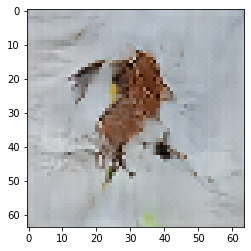

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 24

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6948578357696533 sec
Gen loss: 1.8452352599093789, Disc loss: 2.179952910071925, Disc valid real loss: 0.39862374098677383, Disc valid fake loss: 0.38673504089054306, Disc class real loss: 0.697768907797964, Disc class fake loss: 0.12946159471022456
Time for epoch 2 is 0.6968274116516113 sec
Gen loss: 1.9476058294898586, Disc loss: 2.109176905531632, Disc valid real loss: 0.39920860215237264, Disc valid fake loss: 0.3932802261490571, Disc class real loss: 0.6597253335149664, Disc class fake loss: 0.13572615032133303
Time for epoch 3 is 0.6974220275878906 sec
Gen loss: 1.895145435082285, Disc loss: 2.067969008495933, Disc valid real loss: 0.4032538078333202, Disc valid fake loss: 0.38995950786690964, Disc class real loss: 0.6394177675247192, Disc class fake loss: 0.18464504299979462
Time for epoch 4 is 0.6975953578948975 sec
Gen loss: 1.9189862075604

Time for epoch 31 is 0.6947722434997559 sec
Gen loss: 1.7700648245058561, Disc loss: 2.0747309295754683, Disc valid real loss: 0.3871054735622908, Disc valid fake loss: 0.3938996634985271, Disc class real loss: 0.67380774648566, Disc class fake loss: 0.1823109380508724
Time for epoch 32 is 0.697913408279419 sec
Gen loss: 1.9037244068948846, Disc loss: 2.0577916659806905, Disc valid real loss: 0.40644804741206925, Disc valid fake loss: 0.3935372413773286, Disc class real loss: 0.6565851600546586, Disc class fake loss: 0.1676729595974872
Time for epoch 33 is 0.6961386203765869 sec
Gen loss: 1.9007938347364728, Disc loss: 2.074279916913886, Disc valid real loss: 0.3959865475955762, Disc valid fake loss: 0.3873743744272935, Disc class real loss: 0.6746963293928849, Disc class fake loss: 0.17445597797632217
Time for epoch 34 is 0.6966118812561035 sec
Gen loss: 2.0203532858898767, Disc loss: 2.063942645725451, Disc valid real loss: 0.3938759690836856, Disc valid fake loss: 0.3699826715808165

Time for epoch 62 is 0.6985454559326172 sec
Gen loss: 1.8340190649032593, Disc loss: 1.9683099859639217, Disc valid real loss: 0.38121318973993, Disc valid fake loss: 0.38200798160151433, Disc class real loss: 0.6546612758385507, Disc class fake loss: 0.183770935394262
Time for epoch 63 is 0.6972646713256836 sec
Gen loss: 1.9739079036210712, Disc loss: 1.9752284476631565, Disc valid real loss: 0.39592619789274114, Disc valid fake loss: 0.40648280789977626, Disc class real loss: 0.6399288146119368, Disc class fake loss: 0.16418300725911794
Time for epoch 64 is 0.6962971687316895 sec
Gen loss: 1.8859390083112215, Disc loss: 1.9724682130311664, Disc valid real loss: 0.3833893004216646, Disc valid fake loss: 0.3737457880848332, Disc class real loss: 0.6624113980092501, Disc class fake loss: 0.18336839660217888
Time for epoch 65 is 0.6974554061889648 sec
Gen loss: 1.8407719762701737, Disc loss: 2.024313713374891, Disc valid real loss: 0.39976371275751216, Disc valid fake loss: 0.38599937683

Time for epoch 93 is 0.6954100131988525 sec
Gen loss: 1.948628168357046, Disc loss: 1.9232713736985858, Disc valid real loss: 0.40516910270640727, Disc valid fake loss: 0.3726537055090854, Disc class real loss: 0.6539523381935922, Disc class fake loss: 0.16597691609671242
Time for epoch 94 is 0.6974680423736572 sec
Gen loss: 1.8183521220558567, Disc loss: 1.9327849714379561, Disc valid real loss: 0.38239556707833944, Disc valid fake loss: 0.4030830138608029, Disc class real loss: 0.649368101044705, Disc class fake loss: 0.19930818598521383
Time for epoch 95 is 0.7005457878112793 sec
Gen loss: 1.9154886321017617, Disc loss: 1.9401611277931614, Disc valid real loss: 0.38263532833049174, Disc valid fake loss: 0.4035566762874001, Disc class real loss: 0.6517347379734642, Disc class fake loss: 0.21207068546822197
Time for epoch 96 is 0.6975739002227783 sec
Gen loss: 2.0064450878846016, Disc loss: 1.9403737657948543, Disc valid real loss: 0.3841827292191355, Disc valid fake loss: 0.389869268

Time for epoch 123 is 0.6968262195587158 sec
Gen loss: 1.927053413893047, Disc loss: 1.920973539352417, Disc valid real loss: 0.40953848079631205, Disc valid fake loss: 0.3917699518956636, Disc class real loss: 0.6627845074001112, Disc class fake loss: 0.19571995539100548
Time for epoch 124 is 0.6974375247955322 sec
Gen loss: 2.0006069697831808, Disc loss: 1.8918538971951133, Disc valid real loss: 0.4119919020878641, Disc valid fake loss: 0.3906054230112779, Disc class real loss: 0.6478464321086281, Disc class fake loss: 0.1834564922671569
Time for epoch 125 is 0.6993105411529541 sec
Gen loss: 1.8633527943962498, Disc loss: 1.901856736132973, Disc valid real loss: 0.38643862856061834, Disc valid fake loss: 0.40883958967108475, Disc class real loss: 0.6571022083884791, Disc class fake loss: 0.19374685734510422
Time for epoch 126 is 0.6967179775238037 sec
Gen loss: 1.8277364341836226, Disc loss: 1.891281523202595, Disc valid real loss: 0.40118637681007385, Disc valid fake loss: 0.4069120

Time for epoch 153 is 0.6994068622589111 sec
Gen loss: 1.9729002839640568, Disc loss: 1.8567337864323665, Disc valid real loss: 0.3881704540629136, Disc valid fake loss: 0.3931488065343154, Disc class real loss: 0.6716469181211371, Disc class fake loss: 0.18372113375287308
Time for epoch 154 is 0.6988654136657715 sec
Gen loss: 1.9183115080783242, Disc loss: 1.8915883428172062, Disc valid real loss: 0.38562452008849696, Disc valid fake loss: 0.40940371626301814, Disc class real loss: 0.6789604613655492, Disc class fake loss: 0.20591862578141062
Time for epoch 155 is 0.6966285705566406 sec
Gen loss: 1.9052339541284662, Disc loss: 1.759797729943928, Disc valid real loss: 0.3782169222831726, Disc valid fake loss: 0.3734560012817383, Disc class real loss: 0.6295523863089713, Disc class fake loss: 0.1782238577541552
Time for epoch 156 is 0.6976048946380615 sec
Gen loss: 1.8945392119257074, Disc loss: 1.840362824891743, Disc valid real loss: 0.41138950931398494, Disc valid fake loss: 0.409444

Time for epoch 183 is 0.7006487846374512 sec
Gen loss: 2.013640748827081, Disc loss: 1.7613127357081364, Disc valid real loss: 0.3857766076138145, Disc valid fake loss: 0.38156873223028687, Disc class real loss: 0.6505943223049766, Disc class fake loss: 0.18291912227869034
Time for epoch 184 is 0.6970078945159912 sec
Gen loss: 1.9234108548415334, Disc loss: 1.7835466046082347, Disc valid real loss: 0.38655340044121994, Disc valid fake loss: 0.3960665778109902, Disc class real loss: 0.6636762650389421, Disc class fake loss: 0.16945447929595647
Time for epoch 185 is 0.6952388286590576 sec
Gen loss: 2.002782056206151, Disc loss: 1.7858196371480037, Disc valid real loss: 0.40477752999255534, Disc valid fake loss: 0.38626640878225627, Disc class real loss: 0.6665941257225839, Disc class fake loss: 0.1569665980182196
Time for epoch 186 is 0.695331335067749 sec
Gen loss: 1.926788750447725, Disc loss: 1.7984688532979864, Disc valid real loss: 0.41077810839602824, Disc valid fake loss: 0.375519

Time for epoch 213 is 0.6993319988250732 sec
Gen loss: 1.9619587471610622, Disc loss: 1.6838939440877814, Disc valid real loss: 0.3878185749053955, Disc valid fake loss: 0.38300838360660955, Disc class real loss: 0.6370787149981448, Disc class fake loss: 0.16500411417923475
Time for epoch 214 is 0.6949989795684814 sec
Gen loss: 1.9635117367694253, Disc loss: 1.7440960783707469, Disc valid real loss: 0.374007163863433, Disc valid fake loss: 0.3934812749686994, Disc class real loss: 0.7068433636113217, Disc class fake loss: 0.13816961018662705
Time for epoch 215 is 0.6981465816497803 sec
Gen loss: 2.0515493091784025, Disc loss: 1.7270054440749318, Disc valid real loss: 0.38715267024542155, Disc valid fake loss: 0.3925822259564149, Disc class real loss: 0.6845511919573734, Disc class fake loss: 0.138224953099301
Time for epoch 216 is 0.6948280334472656 sec
Gen loss: 2.022084631417927, Disc loss: 1.7148745875609548, Disc valid real loss: 0.3813765692083459, Disc valid fake loss: 0.39286827

Time for epoch 243 is 0.6971454620361328 sec
Gen loss: 1.968564315846092, Disc loss: 1.6574004512084157, Disc valid real loss: 0.39794088194244787, Disc valid fake loss: 0.4040584572051701, Disc class real loss: 0.6457548423817283, Disc class fake loss: 0.14613797770519005
Time for epoch 244 is 0.6954846382141113 sec
Gen loss: 1.9554473600889508, Disc loss: 1.6603875724892867, Disc valid real loss: 0.39314485066815424, Disc valid fake loss: 0.38525035506800603, Disc class real loss: 0.6672722352178473, Disc class fake loss: 0.15094679731287455
Time for epoch 245 is 0.6979477405548096 sec
Gen loss: 2.076633986673857, Disc loss: 1.6352743412318982, Disc valid real loss: 0.3781514442280719, Disc valid fake loss: 0.37198594369386373, Disc class real loss: 0.6597207000381068, Disc class fake loss: 0.16622988565971977
Time for epoch 246 is 0.6991934776306152 sec
Gen loss: 2.1641223430633545, Disc loss: 1.644313467176337, Disc valid real loss: 0.3878224711669119, Disc valid fake loss: 0.39115

Time for epoch 273 is 0.6983826160430908 sec
Gen loss: 1.9704162447076095, Disc loss: 1.6113692396565487, Disc valid real loss: 0.3922424504631444, Disc valid fake loss: 0.39058932505155863, Disc class real loss: 0.6679839021281192, Disc class fake loss: 0.15069762578136042
Time for epoch 274 is 0.6976017951965332 sec
Gen loss: 1.9506179596248425, Disc loss: 1.610508078023007, Disc valid real loss: 0.40263493908079045, Disc valid fake loss: 0.39047110551281977, Disc class real loss: 0.6618723681098536, Disc class fake loss: 0.14754787518789894
Time for epoch 275 is 0.7000713348388672 sec
Gen loss: 1.89642039725655, Disc loss: 1.6061297466880398, Disc valid real loss: 0.36934253730271993, Disc valid fake loss: 0.4031830100636733, Disc class real loss: 0.6831301544841967, Disc class fake loss: 0.1440371949421732
Time for epoch 276 is 0.7021939754486084 sec
Gen loss: 1.952133109695033, Disc loss: 1.5758886776472394, Disc valid real loss: 0.4033739080554561, Disc valid fake loss: 0.3993773

Time for epoch 304 is 0.6991353034973145 sec
Gen loss: 2.024314183937876, Disc loss: 1.578489247121309, Disc valid real loss: 0.4083422861601177, Disc valid fake loss: 0.3723906074699603, Disc class real loss: 0.6656809825646249, Disc class fake loss: 0.13218207069133459
Time for epoch 305 is 0.700047492980957 sec
Gen loss: 2.021031511457343, Disc loss: 1.5500114591498124, Disc valid real loss: 0.37450149341633443, Disc valid fake loss: 0.3861152984594044, Disc class real loss: 0.6509664246910497, Disc class fake loss: 0.13853072904442487
Time for epoch 306 is 0.7022089958190918 sec
Gen loss: 1.965385455834238, Disc loss: 1.5990405898345144, Disc valid real loss: 0.3908386379480362, Disc valid fake loss: 0.41066078920113414, Disc class real loss: 0.6622094104164525, Disc class fake loss: 0.1354371336729903
Time for epoch 307 is 0.7022836208343506 sec
Gen loss: 2.0700730587306775, Disc loss: 1.6091934505261873, Disc valid real loss: 0.3970554094565542, Disc valid fake loss: 0.3983479487

Time for epoch 334 is 0.7023811340332031 sec
Gen loss: 1.943120040391621, Disc loss: 1.5978719121531437, Disc valid real loss: 0.3876766107584301, Disc valid fake loss: 0.41209504635710464, Disc class real loss: 0.653777191513463, Disc class fake loss: 0.14442493844973414
Time for epoch 335 is 0.7102901935577393 sec
Gen loss: 1.9588122179633694, Disc loss: 1.5750393804750944, Disc valid real loss: 0.385878744878267, Disc valid fake loss: 0.4034244622054853, Disc class real loss: 0.6645703598072654, Disc class fake loss: 0.12127448500771272
Time for epoch 336 is 0.7021880149841309 sec
Gen loss: 2.0036648009952747, Disc loss: 1.5120838817797209, Disc valid real loss: 0.3772314379089757, Disc valid fake loss: 0.36777812242507935, Disc class real loss: 0.659092366695404, Disc class fake loss: 0.1080921917761627
Time for epoch 337 is 0.7004053592681885 sec
Gen loss: 2.0520251048238656, Disc loss: 1.5519458055496216, Disc valid real loss: 0.3732590314589049, Disc valid fake loss: 0.387543367

Time for epoch 364 is 0.6952764987945557 sec
Gen loss: 2.0422359203037463, Disc loss: 1.5307491076620001, Disc valid real loss: 0.35797866316218124, Disc valid fake loss: 0.3689289673378593, Disc class real loss: 0.675993988388463, Disc class fake loss: 0.1279571156360601
Time for epoch 365 is 0.6940169334411621 sec
Gen loss: 1.9691094850239002, Disc loss: 1.6283168039823834, Disc valid real loss: 0.40979892486020136, Disc valid fake loss: 0.38537483936861944, Disc class real loss: 0.6876566221839503, Disc class fake loss: 0.14559484743758253
Time for epoch 366 is 0.6943552494049072 sec
Gen loss: 1.9308025084043805, Disc loss: 1.57851200982144, Disc valid real loss: 0.38719384999651657, Disc valid fake loss: 0.40105329218663666, Disc class real loss: 0.6649479175868788, Disc class fake loss: 0.12542484406577914
Time for epoch 367 is 0.6882185935974121 sec
Gen loss: 1.9167291427913464, Disc loss: 1.608163921456588, Disc valid real loss: 0.391140668015731, Disc valid fake loss: 0.3984701

Time for epoch 394 is 0.7044057846069336 sec
Gen loss: 2.01460389714492, Disc loss: 1.586099342295998, Disc valid real loss: 0.3757641629168862, Disc valid fake loss: 0.37747517541835185, Disc class real loss: 0.7022003437343397, Disc class fake loss: 0.1307739921306309
Time for epoch 395 is 0.7022285461425781 sec
Gen loss: 2.0140102286087838, Disc loss: 1.56782361080772, Disc valid real loss: 0.3991611568551314, Disc valid fake loss: 0.37613748406109054, Disc class real loss: 0.6624555368172494, Disc class fake loss: 0.1301758736371994
Time for epoch 396 is 0.7045025825500488 sec
Gen loss: 1.9346793764515926, Disc loss: 1.5580741292551945, Disc valid real loss: 0.4086427170979349, Disc valid fake loss: 0.3847179444212663, Disc class real loss: 0.6482116015333879, Disc class fake loss: 0.11660821696645335
Time for epoch 397 is 0.7053160667419434 sec
Gen loss: 1.9727741291648464, Disc loss: 1.5765550701241744, Disc valid real loss: 0.3781182013059917, Disc valid fake loss: 0.38709614778

Time for epoch 424 is 0.6979241371154785 sec
Gen loss: 2.0559796471344796, Disc loss: 1.5912185154463117, Disc valid real loss: 0.3799918552762584, Disc valid fake loss: 0.38619884064323023, Disc class real loss: 0.6652648950877943, Disc class fake loss: 0.15986402724918566
Time for epoch 425 is 0.6976256370544434 sec
Gen loss: 2.1111002344834175, Disc loss: 1.571552508755734, Disc valid real loss: 0.3705592077029379, Disc valid fake loss: 0.3960350296999279, Disc class real loss: 0.6680264629815754, Disc class fake loss: 0.13703802502469012
Time for epoch 426 is 0.6971898078918457 sec
Gen loss: 2.042771057078713, Disc loss: 1.6078013683620251, Disc valid real loss: 0.40611092354121964, Disc valid fake loss: 0.3916151900040476, Disc class real loss: 0.6561376468131417, Disc class fake loss: 0.15403803634016136
Time for epoch 427 is 0.6930840015411377 sec
Gen loss: 2.007408204831575, Disc loss: 1.6140473830072504, Disc valid real loss: 0.3912798119218726, Disc valid fake loss: 0.3872279

Time for epoch 454 is 0.6979396343231201 sec
Gen loss: 1.9236651972720498, Disc loss: 1.5467862204501504, Disc valid real loss: 0.38570607649652583, Disc valid fake loss: 0.38889546770798533, Disc class real loss: 0.6666778075067621, Disc class fake loss: 0.10561908507033398
Time for epoch 455 is 0.6920711994171143 sec
Gen loss: 1.9695796966552734, Disc loss: 1.5971664692226208, Disc valid real loss: 0.38014395613419383, Disc valid fake loss: 0.4012621060798043, Disc class real loss: 0.6658977176013746, Disc class fake loss: 0.14996589857496714
Time for epoch 456 is 0.692070484161377 sec
Gen loss: 2.039917230606079, Disc loss: 1.5680877221258063, Disc valid real loss: 0.3878211802557895, Disc valid fake loss: 0.37890349328517914, Disc class real loss: 0.6804670220927188, Disc class fake loss: 0.12100793538909209
Time for epoch 457 is 0.6964812278747559 sec
Gen loss: 1.9255427749533403, Disc loss: 1.578751852637843, Disc valid real loss: 0.39190417057589483, Disc valid fake loss: 0.4019

Time for epoch 484 is 0.6952810287475586 sec
Gen loss: 1.9916038136733205, Disc loss: 1.5820580532676296, Disc valid real loss: 0.4051183320974049, Disc valid fake loss: 0.39959109456915604, Disc class real loss: 0.6635637597033852, Disc class fake loss: 0.11389480276327384
Time for epoch 485 is 0.6964428424835205 sec
Gen loss: 2.039623492642453, Disc loss: 1.5996920121343512, Disc valid real loss: 0.39577843640979965, Disc valid fake loss: 0.395350401338778, Disc class real loss: 0.6781041998612253, Disc class fake loss: 0.13056851492116325
Time for epoch 486 is 0.6961972713470459 sec
Gen loss: 1.9901590472773503, Disc loss: 1.5474278989591097, Disc valid real loss: 0.38192111096884074, Disc valid fake loss: 0.37773872519794266, Disc class real loss: 0.6515349777121293, Disc class fake loss: 0.13633614856945842
Time for epoch 487 is 0.6930205821990967 sec
Gen loss: 1.9926987886428833, Disc loss: 1.6454832365638332, Disc valid real loss: 0.3964766342388956, Disc valid fake loss: 0.4225

Time for epoch 514 is 0.6916511058807373 sec
Gen loss: 2.02793950783579, Disc loss: 1.5545463060077869, Disc valid real loss: 0.3617817610502243, Disc valid fake loss: 0.3874176928871556, Disc class real loss: 0.6767431779911643, Disc class fake loss: 0.1287132768254531
Time for epoch 515 is 0.6945271492004395 sec
Gen loss: 1.904523121683221, Disc loss: 1.5736033226314343, Disc valid real loss: 0.38688002448332937, Disc valid fake loss: 0.40408140264059367, Disc class real loss: 0.6581479436472842, Disc class fake loss: 0.12460064417437504
Time for epoch 516 is 0.6920206546783447 sec
Gen loss: 1.9303677458512156, Disc loss: 1.6059020067516125, Disc valid real loss: 0.38686989169371755, Disc valid fake loss: 0.3958891441947536, Disc class real loss: 0.6746822125033328, Disc class fake loss: 0.1485660107512223
Time for epoch 517 is 0.6930117607116699 sec
Gen loss: 2.1068435970105623, Disc loss: 1.6723057094373202, Disc valid real loss: 0.40644379038559764, Disc valid fake loss: 0.3980041

Time for epoch 544 is 0.6904153823852539 sec
Gen loss: 1.9407021120974892, Disc loss: 1.6096762732455605, Disc valid real loss: 0.386547913676814, Disc valid fake loss: 0.40124862288173874, Disc class real loss: 0.6715704735956693, Disc class fake loss: 0.15041350298806241
Time for epoch 545 is 0.6975600719451904 sec
Gen loss: 1.9070633587084318, Disc loss: 1.5994435360557155, Disc valid real loss: 0.3853172761829276, Disc valid fake loss: 0.39287356326454564, Disc class real loss: 0.6975475581068742, Disc class fake loss: 0.12381990881342637
Time for epoch 546 is 0.6966893672943115 sec
Gen loss: 2.049118863908868, Disc loss: 1.607576665125395, Disc valid real loss: 0.403475505741019, Disc valid fake loss: 0.4025240007199739, Disc class real loss: 0.666671589801186, Disc class fake loss: 0.13501190452983505
Time for epoch 547 is 0.6941909790039062 sec
Gen loss: 2.0271642961000143, Disc loss: 1.6268535977915715, Disc valid real loss: 0.3960646955590499, Disc valid fake loss: 0.372397646

Time for epoch 574 is 0.6941871643066406 sec
Gen loss: 1.9734159708023071, Disc loss: 1.6290889727441888, Disc valid real loss: 0.4118995509649578, Disc valid fake loss: 0.3845468288973758, Disc class real loss: 0.6921195356469405, Disc class fake loss: 0.14063333837609543
Time for epoch 575 is 0.6966221332550049 sec
Gen loss: 2.016929971544366, Disc loss: 1.5841878401605707, Disc valid real loss: 0.3590430382050966, Disc valid fake loss: 0.3890924594904247, Disc class real loss: 0.6993730130948519, Disc class fake loss: 0.13679185980244687
Time for epoch 576 is 0.6971721649169922 sec
Gen loss: 2.012246985184519, Disc loss: 1.5518991633465415, Disc valid real loss: 0.4062469476147702, Disc valid fake loss: 0.37714984228736476, Disc class real loss: 0.647963351324985, Disc class fake loss: 0.12064447744112265
Time for epoch 577 is 0.6971635818481445 sec
Gen loss: 2.1019993393044722, Disc loss: 1.57259338153036, Disc valid real loss: 0.39538527397732987, Disc valid fake loss: 0.378799093

Time for epoch 604 is 0.6953349113464355 sec
Gen loss: 2.026263720110843, Disc loss: 1.5942230601059764, Disc valid real loss: 0.3897020863859277, Disc valid fake loss: 0.3935341254660958, Disc class real loss: 0.6661417452912581, Disc class fake loss: 0.14494936011339488
Time for epoch 605 is 0.695669412612915 sec
Gen loss: 1.9869995179929232, Disc loss: 1.6407212018966675, Disc valid real loss: 0.3809886166923924, Disc valid fake loss: 0.39801885501334544, Disc class real loss: 0.6909056086289255, Disc class fake loss: 0.17091213911771774
Time for epoch 606 is 0.6962053775787354 sec
Gen loss: 1.9096451684048301, Disc loss: 1.5967036109221608, Disc valid real loss: 0.36760713787455307, Disc valid fake loss: 0.3889802208072261, Disc class real loss: 0.6977370538209614, Disc class fake loss: 0.14249026559685407
Time for epoch 607 is 0.6963024139404297 sec
Gen loss: 1.92062929429506, Disc loss: 1.613028369451824, Disc valid real loss: 0.40771181489291947, Disc valid fake loss: 0.39461068

Time for epoch 634 is 0.6899914741516113 sec
Gen loss: 1.9197912404411717, Disc loss: 1.5855026245117188, Disc valid real loss: 0.39777411442053945, Disc valid fake loss: 0.38777542741675125, Disc class real loss: 0.6731918234574167, Disc class fake loss: 0.12687054198039205
Time for epoch 635 is 0.6928539276123047 sec
Gen loss: 1.924829125404358, Disc loss: 1.5723182213933844, Disc valid real loss: 0.3784442496927161, Disc valid fake loss: 0.3701325796152416, Disc class real loss: 0.6980581409052798, Disc class fake loss: 0.12579771288131414
Time for epoch 636 is 0.6956222057342529 sec
Gen loss: 2.0022901422099064, Disc loss: 1.5672810579601086, Disc valid real loss: 0.3873825135983919, Disc valid fake loss: 0.396686431608702, Disc class real loss: 0.6660037291677374, Disc class fake loss: 0.11731815867518124
Time for epoch 637 is 0.6917095184326172 sec
Gen loss: 1.99765944480896, Disc loss: 1.5650352867026078, Disc valid real loss: 0.3876488553850274, Disc valid fake loss: 0.37916487

Time for epoch 664 is 0.6957969665527344 sec
Gen loss: 1.9231626861973812, Disc loss: 1.5831996390694065, Disc valid real loss: 0.3967855368789874, Disc valid fake loss: 0.3887431041190499, Disc class real loss: 0.674697364631452, Disc class fake loss: 0.12308397065652044
Time for epoch 665 is 0.6945569515228271 sec
Gen loss: 1.9783822988208972, Disc loss: 1.5919718428661949, Disc valid real loss: 0.38216037499277217, Disc valid fake loss: 0.3897119054668828, Disc class real loss: 0.6796215835370516, Disc class fake loss: 0.14058579700557808
Time for epoch 666 is 0.6939404010772705 sec
Gen loss: 1.9770205083646273, Disc loss: 1.5917798155232479, Disc valid real loss: 0.38838087414440353, Disc valid fake loss: 0.39306466516695526, Disc class real loss: 0.6950885967204445, Disc class fake loss: 0.1153616277795089
Time for epoch 667 is 0.6959104537963867 sec
Gen loss: 1.9977774494572689, Disc loss: 1.5562566267816644, Disc valid real loss: 0.38344985246658325, Disc valid fake loss: 0.3800

Time for epoch 694 is 0.6945958137512207 sec
Gen loss: 1.9556459188461304, Disc loss: 1.6133530014439632, Disc valid real loss: 0.37605501632941396, Disc valid fake loss: 0.3940292094883166, Disc class real loss: 0.7099763939255163, Disc class fake loss: 0.13340771806083226
Time for epoch 695 is 0.698789119720459 sec
Gen loss: 1.9074003947408575, Disc loss: 1.6070804031271684, Disc valid real loss: 0.3994226800767999, Disc valid fake loss: 0.3823255771084836, Disc class real loss: 0.6757165789604187, Disc class fake loss: 0.1497207907469649
Time for epoch 696 is 0.6962144374847412 sec
Gen loss: 2.0212907791137695, Disc loss: 1.558258188398261, Disc valid real loss: 0.3795790876212873, Disc valid fake loss: 0.3985760855047326, Disc class real loss: 0.6639861495871293, Disc class fake loss: 0.1162264703920013
Time for epoch 697 is 0.6958627700805664 sec
Gen loss: 1.9671285654369153, Disc loss: 1.5900575487237227, Disc valid real loss: 0.38582672100318105, Disc valid fake loss: 0.40540678

Time for epoch 724 is 0.6983866691589355 sec
Gen loss: 1.9615547029595626, Disc loss: 1.5808914084183543, Disc valid real loss: 0.40191817048348877, Disc valid fake loss: 0.36647425670372813, Disc class real loss: 0.6909310566751581, Disc class fake loss: 0.12168181334671221
Time for epoch 725 is 0.6949808597564697 sec
Gen loss: 1.9314160033276206, Disc loss: 1.5804836310838397, Disc valid real loss: 0.3677432709618619, Disc valid fake loss: 0.38703800816284983, Disc class real loss: 0.6883562583672372, Disc class fake loss: 0.13745630434469172
Time for epoch 726 is 0.6964128017425537 sec
Gen loss: 1.947787266028555, Disc loss: 1.5499308862184222, Disc valid real loss: 0.36531143753152145, Disc valid fake loss: 0.3734590536669681, Disc class real loss: 0.6831773833224648, Disc class fake loss: 0.12809404417088158
Time for epoch 727 is 0.6919691562652588 sec
Gen loss: 2.0066262232629875, Disc loss: 1.5166356249859458, Disc valid real loss: 0.3840374938751522, Disc valid fake loss: 0.385

Time for epoch 754 is 0.6953389644622803 sec
Gen loss: 1.956421789370085, Disc loss: 1.57551277938642, Disc valid real loss: 0.38975006498788534, Disc valid fake loss: 0.38172996985284907, Disc class real loss: 0.6736833766887063, Disc class fake loss: 0.13045802437945417
Time for epoch 755 is 0.6981911659240723 sec
Gen loss: 1.8981170340588218, Disc loss: 1.6345560927140086, Disc valid real loss: 0.39879967429135976, Disc valid fake loss: 0.384245913279684, Disc class real loss: 0.6779184435543261, Disc class fake loss: 0.17369293068584643
Time for epoch 756 is 0.6927790641784668 sec
Gen loss: 1.966894833665145, Disc loss: 1.598379467663012, Disc valid real loss: 0.3984876243691695, Disc valid fake loss: 0.37158197635098505, Disc class real loss: 0.6958887294719094, Disc class fake loss: 0.1325338137777228
Time for epoch 757 is 0.697650671005249 sec
Gen loss: 1.9541036016062687, Disc loss: 1.5622606089240627, Disc valid real loss: 0.3959370286841142, Disc valid fake loss: 0.3880003596

Time for epoch 784 is 0.6976394653320312 sec
Gen loss: 1.9132102288697894, Disc loss: 1.6578871890118247, Disc valid real loss: 0.43517786578128215, Disc valid fake loss: 0.4018955591477846, Disc class real loss: 0.686758533904427, Disc class fake loss: 0.13416576581565956
Time for epoch 785 is 0.6938178539276123 sec
Gen loss: 1.9808869675586098, Disc loss: 1.5246952521173578, Disc valid real loss: 0.3935457766056061, Disc valid fake loss: 0.37646704127914027, Disc class real loss: 0.6572538049597489, Disc class fake loss: 0.09754057052104097
Time for epoch 786 is 0.6940295696258545 sec
Gen loss: 1.950609608700401, Disc loss: 1.5768119347722906, Disc valid real loss: 0.38478513062000275, Disc valid fake loss: 0.4005931678571199, Disc class real loss: 0.6822990869220934, Disc class fake loss: 0.10924916479148362
Time for epoch 787 is 0.6950099468231201 sec
Gen loss: 1.9893365094536228, Disc loss: 1.5797741789566844, Disc valid real loss: 0.39064565614650126, Disc valid fake loss: 0.3893

Time for epoch 814 is 0.699974536895752 sec
Gen loss: 1.9279051579927142, Disc loss: 1.5319377999556691, Disc valid real loss: 0.3827314768966876, Disc valid fake loss: 0.39331736690119695, Disc class real loss: 0.6542174125972547, Disc class fake loss: 0.10178204429777045
Time for epoch 815 is 0.6975977420806885 sec
Gen loss: 1.9517465265173661, Disc loss: 1.539015161363702, Disc valid real loss: 0.38040101528167725, Disc valid fake loss: 0.378999473232972, Disc class real loss: 0.6647883371302956, Disc class fake loss: 0.11493633295360364
Time for epoch 816 is 0.6976323127746582 sec
Gen loss: 1.9889814916409945, Disc loss: 1.577068699033637, Disc valid real loss: 0.38915368287186874, Disc valid fake loss: 0.40724944127233403, Disc class real loss: 0.6654142486421686, Disc class fake loss: 0.11536135367657009
Time for epoch 817 is 0.6949453353881836 sec
Gen loss: 1.9259667145578485, Disc loss: 1.5919041194413837, Disc valid real loss: 0.39686399698257446, Disc valid fake loss: 0.39336

Time for epoch 844 is 0.6983819007873535 sec
Gen loss: 1.937960198051051, Disc loss: 1.5658730331220125, Disc valid real loss: 0.3979956711593427, Disc valid fake loss: 0.3653957890836816, Disc class real loss: 0.682525822990819, Disc class fake loss: 0.12006826287037448
Time for epoch 845 is 0.6958544254302979 sec
Gen loss: 1.909043418733697, Disc loss: 1.5748632142418308, Disc valid real loss: 0.36603936396147074, Disc valid fake loss: 0.38414244432198374, Disc class real loss: 0.6973777852560344, Disc class fake loss: 0.1274176216439197
Time for epoch 846 is 0.6951119899749756 sec
Gen loss: 1.9652798803229081, Disc loss: 1.5979180335998535, Disc valid real loss: 0.3988496927838576, Disc valid fake loss: 0.3852491833661732, Disc class real loss: 0.6530406851517526, Disc class fake loss: 0.16087691250600314
Time for epoch 847 is 0.7017037868499756 sec
Gen loss: 1.9727023087049786, Disc loss: 1.5522345869164718, Disc valid real loss: 0.3800959798850511, Disc valid fake loss: 0.38345474

Time for epoch 874 is 0.6960251331329346 sec
Gen loss: 1.9968203243456388, Disc loss: 1.5876864759545577, Disc valid real loss: 0.4002493259153868, Disc valid fake loss: 0.38650449639872503, Disc class real loss: 0.6773927274503206, Disc class fake loss: 0.12365069946176127
Time for epoch 875 is 0.6945688724517822 sec
Gen loss: 1.9556048418346204, Disc loss: 1.5696080421146594, Disc valid real loss: 0.38000891240019546, Disc valid fake loss: 0.3907813006325772, Disc class real loss: 0.6826294315488715, Disc class fake loss: 0.11630167321939218
Time for epoch 876 is 0.697547197341919 sec
Gen loss: 1.862214157455846, Disc loss: 1.6270273170973126, Disc valid real loss: 0.40581513549152176, Disc valid fake loss: 0.3845523533068205, Disc class real loss: 0.7024111779112565, Disc class fake loss: 0.1343622797806012
Time for epoch 877 is 0.6967160701751709 sec
Gen loss: 1.9514708268015009, Disc loss: 1.551180124282837, Disc valid real loss: 0.4030100765981172, Disc valid fake loss: 0.3908256

Time for epoch 904 is 0.6917386054992676 sec
Gen loss: 1.9999864791568958, Disc loss: 1.5852658058467664, Disc valid real loss: 0.3955736191649186, Disc valid fake loss: 0.38087553726999385, Disc class real loss: 0.6988619001288163, Disc class fake loss: 0.11007251276781685
Time for epoch 905 is 0.6963996887207031 sec
Gen loss: 2.0149276570269934, Disc loss: 1.5632449890437878, Disc valid real loss: 0.3826448619365692, Disc valid fake loss: 0.39817081156529877, Disc class real loss: 0.6706181545006601, Disc class fake loss: 0.11192295249355466
Time for epoch 906 is 0.6947014331817627 sec
Gen loss: 1.915907715496264, Disc loss: 1.5582495363135087, Disc valid real loss: 0.4055621773004532, Disc valid fake loss: 0.38141543771091263, Disc class real loss: 0.6424824250371832, Disc class fake loss: 0.128892235850033
Time for epoch 907 is 0.6963958740234375 sec
Gen loss: 1.9145030849858333, Disc loss: 1.5855175758662976, Disc valid real loss: 0.3977578596064919, Disc valid fake loss: 0.408383

Time for epoch 934 is 0.6961803436279297 sec
Gen loss: 2.0649986894507157, Disc loss: 1.5894731157704403, Disc valid real loss: 0.400023080800709, Disc valid fake loss: 0.3907445559376164, Disc class real loss: 0.6814575352166828, Disc class fake loss: 0.11736077383944862
Time for epoch 935 is 0.6973690986633301 sec
Gen loss: 1.8903188768186068, Disc loss: 1.5893262938449257, Disc valid real loss: 0.3735598686494325, Disc valid fake loss: 0.43049965563573334, Disc class real loss: 0.6731105603669819, Disc class fake loss: 0.11226837297803477
Time for epoch 936 is 0.6972496509552002 sec
Gen loss: 1.9669085866526554, Disc loss: 1.5810890636946027, Disc valid real loss: 0.39004379040316534, Disc valid fake loss: 0.38658684335256877, Disc class real loss: 0.6777724655050981, Disc class fake loss: 0.12679617420623177
Time for epoch 937 is 0.6981379985809326 sec
Gen loss: 1.9179508811549137, Disc loss: 1.5844722672512657, Disc valid real loss: 0.4006544712342714, Disc valid fake loss: 0.4017

Time for epoch 964 is 0.6964468955993652 sec
Gen loss: 1.9235645156157644, Disc loss: 1.592647765812121, Disc valid real loss: 0.377039350961384, Disc valid fake loss: 0.3752828914868204, Disc class real loss: 0.6793719310509531, Disc class fake loss: 0.16105728419987778
Time for epoch 965 is 0.6952292919158936 sec
Gen loss: 1.9583841562271118, Disc loss: 1.6156471528505023, Disc valid real loss: 0.37746314155428035, Disc valid fake loss: 0.4156176275328586, Disc class real loss: 0.6886415638421711, Disc class fake loss: 0.1340357280875507
Time for epoch 966 is 0.6968526840209961 sec
Gen loss: 1.9799072742462158, Disc loss: 1.6704151630401611, Disc valid real loss: 0.4142072263516878, Disc valid fake loss: 0.3830120657619677, Disc class real loss: 0.7341859748488978, Disc class fake loss: 0.13912893008244664
Time for epoch 967 is 0.6921103000640869 sec
Gen loss: 1.9481875143553082, Disc loss: 1.5356586042203402, Disc valid real loss: 0.3694645166397095, Disc valid fake loss: 0.39012191

Time for epoch 994 is 0.7009663581848145 sec
Gen loss: 1.9432071510114168, Disc loss: 1.5746127743470042, Disc valid real loss: 0.3825799116962834, Disc valid fake loss: 0.3754340457288842, Disc class real loss: 0.6979686272771735, Disc class fake loss: 0.11874604127124737
Time for epoch 995 is 0.70210862159729 sec
Gen loss: 1.9803029047815424, Disc loss: 1.5877531076732434, Disc valid real loss: 0.39334136639770706, Disc valid fake loss: 0.3853122591972351, Disc class real loss: 0.6914777222432589, Disc class fake loss: 0.11773653230384777
Time for epoch 996 is 0.6941702365875244 sec
Gen loss: 1.9333495340849225, Disc loss: 1.5745351251802946, Disc valid real loss: 0.3947378993034363, Disc valid fake loss: 0.37495709406702143, Disc class real loss: 0.6668897051560251, Disc class fake loss: 0.1380562209769299
Time for epoch 997 is 0.6978602409362793 sec
Gen loss: 1.9573648791564138, Disc loss: 1.596060596014324, Disc valid real loss: 0.38397591365011113, Disc valid fake loss: 0.4032874

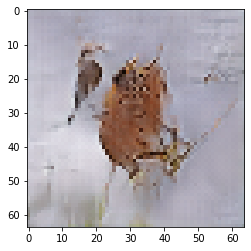

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 25

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6913242340087891 sec
Gen loss: 1.9496731632634212, Disc loss: 2.1718081361369084, Disc valid real loss: 0.40321494560492666, Disc valid fake loss: 0.38588531236899526, Disc class real loss: 0.6918398047748365, Disc class fake loss: 0.12562758789250725
Time for epoch 2 is 0.6939992904663086 sec
Gen loss: 1.8561693618172093, Disc loss: 2.1276779049321224, Disc valid real loss: 0.3824435033296284, Disc valid fake loss: 0.3929863744660428, Disc class real loss: 0.6775114097093281, Disc class fake loss: 0.14937421679496765
Time for epoch 3 is 0.6964964866638184 sec
Gen loss: 1.897497114382292, Disc loss: 2.135215263617666, Disc valid real loss: 0.38874087678758723, Disc valid fake loss: 0.38036737316533137, Disc class real loss: 0.6854293409146761, Disc class fake loss: 0.14875348343660957
Time for epoch 4 is 0.696427583694458 sec
Gen loss: 1.93418290113

Time for epoch 31 is 0.6999242305755615 sec
Gen loss: 2.023658921844081, Disc loss: 2.093082773058038, Disc valid real loss: 0.3592991170130278, Disc valid fake loss: 0.3823844429693724, Disc class real loss: 0.7019589010037874, Disc class fake loss: 0.2229821054559005
Time for epoch 32 is 0.7031304836273193 sec
Gen loss: 1.7385904412520559, Disc loss: 2.0591520071029663, Disc valid real loss: 0.40929899560777766, Disc valid fake loss: 0.41827329052122014, Disc class real loss: 0.6422858614670602, Disc class fake loss: 0.17461370284620084
Time for epoch 33 is 0.6968655586242676 sec
Gen loss: 1.8213622758263035, Disc loss: 2.151788692725332, Disc valid real loss: 0.3997915591064252, Disc valid fake loss: 0.40684000128193903, Disc class real loss: 0.7025249694523058, Disc class fake loss: 0.19021754437371305
Time for epoch 34 is 0.6943566799163818 sec
Gen loss: 1.9997190111561824, Disc loss: 2.0132702024359452, Disc valid real loss: 0.39455402367993403, Disc valid fake loss: 0.3679174263

Time for epoch 62 is 0.6962900161743164 sec
Gen loss: 1.870524287223816, Disc loss: 1.9899405178270841, Disc valid real loss: 0.40956500800032364, Disc valid fake loss: 0.3887894263393001, Disc class real loss: 0.6447625693522001, Disc class fake loss: 0.20235907560900637
Time for epoch 63 is 0.6981298923492432 sec
Gen loss: 1.8230074204896625, Disc loss: 1.9546848786504645, Disc valid real loss: 0.3973649081430937, Disc valid fake loss: 0.39039407121507747, Disc class real loss: 0.6316765295831781, Disc class fake loss: 0.20311408764437625
Time for epoch 64 is 0.6967427730560303 sec
Gen loss: 1.8514336222096492, Disc loss: 1.9965390782607229, Disc valid real loss: 0.3951108079207571, Disc valid fake loss: 0.4048998889170195, Disc class real loss: 0.6505199294341238, Disc class fake loss: 0.1930533655379948
Time for epoch 65 is 0.6961171627044678 sec
Gen loss: 2.0385298854426335, Disc loss: 2.010200287166395, Disc valid real loss: 0.38864584659275253, Disc valid fake loss: 0.3822299226

Time for epoch 93 is 0.6976799964904785 sec
Gen loss: 1.8434526167417828, Disc loss: 1.9519926121360378, Disc valid real loss: 0.3915435609064604, Disc valid fake loss: 0.40366485871766744, Disc class real loss: 0.66009458428935, Disc class fake loss: 0.16922114671845184
Time for epoch 94 is 0.6968379020690918 sec
Gen loss: 1.9271761743645919, Disc loss: 1.9168338210959184, Disc valid real loss: 0.40421995520591736, Disc valid fake loss: 0.4022800326347351, Disc class real loss: 0.6344861011756094, Disc class fake loss: 0.16299343736548172
Time for epoch 95 is 0.6970503330230713 sec
Gen loss: 1.912720103012888, Disc loss: 1.940902082543624, Disc valid real loss: 0.38959299576909917, Disc valid fake loss: 0.38845302478263255, Disc class real loss: 0.6596213014502275, Disc class fake loss: 0.19981848409301356
Time for epoch 96 is 0.696251392364502 sec
Gen loss: 1.908846428519801, Disc loss: 2.022039143662704, Disc valid real loss: 0.3996996283531189, Disc valid fake loss: 0.3945299888912

Time for epoch 123 is 0.6956279277801514 sec
Gen loss: 1.9471092663313214, Disc loss: 1.9057371114429675, Disc valid real loss: 0.3971977029976092, Disc valid fake loss: 0.37679782196095113, Disc class real loss: 0.6709702234519156, Disc class fake loss: 0.19421373699840747
Time for epoch 124 is 0.6962244510650635 sec
Gen loss: 1.9078259405336881, Disc loss: 1.8879240437557823, Disc valid real loss: 0.3875542290900883, Disc valid fake loss: 0.3882863929397182, Disc class real loss: 0.6568487600276345, Disc class fake loss: 0.20323408120556882
Time for epoch 125 is 0.6951706409454346 sec
Gen loss: 1.9833313414925022, Disc loss: 1.8105726994966205, Disc valid real loss: 0.37603006707994563, Disc valid fake loss: 0.37466205342819814, Disc class real loss: 0.6278608629578039, Disc class fake loss: 0.1907854542920464
Time for epoch 126 is 0.6983590126037598 sec
Gen loss: 1.9384964955480475, Disc loss: 1.8321254943546497, Disc valid real loss: 0.3928508821286653, Disc valid fake loss: 0.3694

Time for epoch 153 is 0.6942934989929199 sec
Gen loss: 2.024408302809063, Disc loss: 1.8330028872740896, Disc valid real loss: 0.382052154917466, Disc valid fake loss: 0.38501073184766266, Disc class real loss: 0.6706350163409585, Disc class fake loss: 0.16903106240849747
Time for epoch 154 is 0.6967427730560303 sec
Gen loss: 1.9773664411745573, Disc loss: 1.8303726221385754, Disc valid real loss: 0.39227680156105443, Disc valid fake loss: 0.38141210455643504, Disc class real loss: 0.6608218111489949, Disc class fake loss: 0.1811705984567341
Time for epoch 155 is 0.6946718692779541 sec
Gen loss: 1.999715754860326, Disc loss: 1.8499442338943481, Disc valid real loss: 0.39509839917484085, Disc valid fake loss: 0.3760130546594921, Disc class real loss: 0.672597565149006, Disc class fake loss: 0.19367658699813642
Time for epoch 156 is 0.7006039619445801 sec
Gen loss: 1.8913952927840383, Disc loss: 1.8595135400169773, Disc valid real loss: 0.38596095066321523, Disc valid fake loss: 0.390416

Time for epoch 183 is 0.6966090202331543 sec
Gen loss: 1.9357922516371076, Disc loss: 1.7791070247951306, Disc valid real loss: 0.3954922117685017, Disc valid fake loss: 0.3802304558063808, Disc class real loss: 0.6651606716607746, Disc class fake loss: 0.1674381255319244
Time for epoch 184 is 0.6961562633514404 sec
Gen loss: 1.9386725613945408, Disc loss: 1.7356638971127962, Disc valid real loss: 0.3757651824700205, Disc valid fake loss: 0.3915031693483654, Disc class real loss: 0.6427906720261825, Disc class fake loss: 0.162543108196635
Time for epoch 185 is 0.6971273422241211 sec
Gen loss: 1.9412335345619602, Disc loss: 1.7774566913905896, Disc valid real loss: 0.3696750653417487, Disc valid fake loss: 0.3985005287747634, Disc class real loss: 0.6629734007935775, Disc class fake loss: 0.186126367434075
Time for epoch 186 is 0.6981284618377686 sec
Gen loss: 1.9799566206179167, Disc loss: 1.786723350223742, Disc valid real loss: 0.3813682457334117, Disc valid fake loss: 0.408743368951

Time for epoch 213 is 0.6968848705291748 sec
Gen loss: 1.977754084687484, Disc loss: 1.705445829190706, Disc valid real loss: 0.40910939009566055, Disc valid fake loss: 0.3838116903054087, Disc class real loss: 0.6498526617100364, Disc class fake loss: 0.14364556889784963
Time for epoch 214 is 0.6956527233123779 sec
Gen loss: 1.9091466665267944, Disc loss: 1.7069929900922274, Disc valid real loss: 0.3939855396747589, Disc valid fake loss: 0.3804214502635755, Disc class real loss: 0.6551987434688368, Disc class fake loss: 0.16357788051429548
Time for epoch 215 is 0.6974871158599854 sec
Gen loss: 1.9721086025238037, Disc loss: 1.7283000757819729, Disc valid real loss: 0.38879842115075963, Disc valid fake loss: 0.38388379467161077, Disc class real loss: 0.6722767447170458, Disc class fake loss: 0.16852002159545296
Time for epoch 216 is 0.6961662769317627 sec
Gen loss: 1.8929774447491294, Disc loss: 1.722431885568719, Disc valid real loss: 0.4093096115087208, Disc valid fake loss: 0.377526

Time for epoch 243 is 0.6971995830535889 sec
Gen loss: 2.0360219415865446, Disc loss: 1.6669954061508179, Disc valid real loss: 0.3932822644710541, Disc valid fake loss: 0.4123441325990777, Disc class real loss: 0.6634178067508497, Disc class fake loss: 0.13019274175167084
Time for epoch 244 is 0.6974396705627441 sec
Gen loss: 1.9384622887561196, Disc loss: 1.6687838717510826, Disc valid real loss: 0.3985470643169002, Disc valid fake loss: 0.39433681180602626, Disc class real loss: 0.6694821213421068, Disc class fake loss: 0.14114305808355934
Time for epoch 245 is 0.6969549655914307 sec
Gen loss: 1.9441890340102346, Disc loss: 1.6686084897894609, Disc valid real loss: 0.38619794735783025, Disc valid fake loss: 0.3932646387501767, Disc class real loss: 0.6611108779907227, Disc class fake loss: 0.1690486830316092
Time for epoch 246 is 0.6964001655578613 sec
Gen loss: 1.9536726662987156, Disc loss: 1.6618343152497943, Disc valid real loss: 0.41256225579663325, Disc valid fake loss: 0.4030

Time for epoch 273 is 0.6967720985412598 sec
Gen loss: 2.001481871855886, Disc loss: 1.5835232734680176, Disc valid real loss: 0.38228690545809896, Disc valid fake loss: 0.377201372855588, Disc class real loss: 0.6620421190010873, Disc class fake loss: 0.1522557037441354
Time for epoch 274 is 0.6995294094085693 sec
Gen loss: 2.0027800233740556, Disc loss: 1.5654707331406443, Disc valid real loss: 0.37559551941721064, Disc valid fake loss: 0.3760173697220652, Disc class real loss: 0.6807786445868643, Disc class fake loss: 0.12446824970998262
Time for epoch 275 is 0.6972806453704834 sec
Gen loss: 1.992385368598135, Disc loss: 1.644452728723225, Disc valid real loss: 0.37820395356730413, Disc valid fake loss: 0.4299125138082002, Disc class real loss: 0.6894918272369787, Disc class fake loss: 0.1402995762856383
Time for epoch 276 is 0.6961643695831299 sec
Gen loss: 2.1697040482571253, Disc loss: 1.642595698958949, Disc valid real loss: 0.38774792065745906, Disc valid fake loss: 0.398202290

Time for epoch 303 is 0.6959335803985596 sec
Gen loss: 1.9303906152122898, Disc loss: 1.607493475863808, Disc valid real loss: 0.3897114192184649, Disc valid fake loss: 0.3979172439951646, Disc class real loss: 0.7067843926580328, Disc class fake loss: 0.11319916812997115
Time for epoch 304 is 0.6939129829406738 sec
Gen loss: 1.9825953621613353, Disc loss: 1.597470013718856, Disc valid real loss: 0.40744132274075556, Disc valid fake loss: 0.36912453488299724, Disc class real loss: 0.668450863737809, Disc class fake loss: 0.1525564758401168
Time for epoch 305 is 0.6991105079650879 sec
Gen loss: 1.9360120484703465, Disc loss: 1.5988171728033769, Disc valid real loss: 0.4225626305529946, Disc valid fake loss: 0.38087743363882365, Disc class real loss: 0.6447240365178961, Disc class fake loss: 0.15075188169353887
Time for epoch 306 is 0.6982393264770508 sec
Gen loss: 1.8551562146136635, Disc loss: 1.6181490860487286, Disc valid real loss: 0.39739405716720383, Disc valid fake loss: 0.411241

Time for epoch 333 is 0.6959397792816162 sec
Gen loss: 1.9724827063711066, Disc loss: 1.6083224258924786, Disc valid real loss: 0.4137335207901503, Disc valid fake loss: 0.395111051044966, Disc class real loss: 0.6582715103500768, Disc class fake loss: 0.1413097254147655
Time for epoch 334 is 0.6960384845733643 sec
Gen loss: 1.9864130584817183, Disc loss: 1.5451038009242009, Disc valid real loss: 0.3627703738840003, Disc valid fake loss: 0.38754205327284963, Disc class real loss: 0.6488049124416552, Disc class fake loss: 0.14608701083220935
Time for epoch 335 is 0.698256254196167 sec
Gen loss: 1.9043218022898625, Disc loss: 1.538704884679694, Disc valid real loss: 0.3669716904037877, Disc valid fake loss: 0.39678205628144114, Disc class real loss: 0.6537873274401614, Disc class fake loss: 0.12127033228936948
Time for epoch 336 is 0.6966254711151123 sec
Gen loss: 2.0028177437029386, Disc loss: 1.6076096359052157, Disc valid real loss: 0.39466968806166397, Disc valid fake loss: 0.3838313

Time for epoch 363 is 0.7004156112670898 sec
Gen loss: 2.1000469232860364, Disc loss: 1.6145795144532855, Disc valid real loss: 0.3970142132357547, Disc valid fake loss: 0.37709973595644297, Disc class real loss: 0.681252802673139, Disc class fake loss: 0.15931716090754458
Time for epoch 364 is 0.6961216926574707 sec
Gen loss: 1.9339373990109092, Disc loss: 1.5623498778594167, Disc valid real loss: 0.3976244126495562, Disc valid fake loss: 0.3940274778165315, Disc class real loss: 0.6486564686423854, Disc class fake loss: 0.12214684604029906
Time for epoch 365 is 0.7107598781585693 sec
Gen loss: 2.0159008565701937, Disc loss: 1.585449921457391, Disc valid real loss: 0.40298902047307866, Disc valid fake loss: 0.3680366991381896, Disc class real loss: 0.6717962591271651, Disc class fake loss: 0.14273376958934883
Time for epoch 366 is 0.6975908279418945 sec
Gen loss: 2.021734733330576, Disc loss: 1.54844541926133, Disc valid real loss: 0.39869374272070435, Disc valid fake loss: 0.36731419

Time for epoch 393 is 0.6957838535308838 sec
Gen loss: 1.9798467033787777, Disc loss: 1.5662581104981272, Disc valid real loss: 0.399138690609681, Disc valid fake loss: 0.3863817625924161, Disc class real loss: 0.6727667325421384, Disc class fake loss: 0.1080838837905934
Time for epoch 394 is 0.6990292072296143 sec
Gen loss: 2.036809482072529, Disc loss: 1.6088647340473377, Disc valid real loss: 0.3745333332764475, Disc valid fake loss: 0.3924739564719953, Disc class real loss: 0.7037438781637895, Disc class fake loss: 0.13822669261380247
Time for epoch 395 is 0.6975414752960205 sec
Gen loss: 2.0525188508786654, Disc loss: 1.6227307382382845, Disc valid real loss: 0.3919776764355208, Disc valid fake loss: 0.39224988457403687, Disc class real loss: 0.6770282858296445, Disc class fake loss: 0.1615780148851244
Time for epoch 396 is 0.6955122947692871 sec
Gen loss: 2.0524709224700928, Disc loss: 1.6065846430627924, Disc valid real loss: 0.4079464062264091, Disc valid fake loss: 0.382596775

Time for epoch 423 is 0.6956489086151123 sec
Gen loss: 2.1140465987356087, Disc loss: 1.5420758975179572, Disc valid real loss: 0.3986452739489706, Disc valid fake loss: 0.3880177485315423, Disc class real loss: 0.6415436299223649, Disc class fake loss: 0.11397478925554376
Time for epoch 424 is 0.6922094821929932 sec
Gen loss: 1.88922455436305, Disc loss: 1.642061528406645, Disc valid real loss: 0.41040006436799703, Disc valid fake loss: 0.39700407417196976, Disc class real loss: 0.7078746274897927, Disc class fake loss: 0.12689898751283946
Time for epoch 425 is 0.6963732242584229 sec
Gen loss: 1.9586997408615916, Disc loss: 1.5738067313244468, Disc valid real loss: 0.4003307474286933, Disc valid fake loss: 0.3833163364937431, Disc class real loss: 0.6763531691149661, Disc class fake loss: 0.11391898754395936
Time for epoch 426 is 0.6955041885375977 sec
Gen loss: 1.9441791333650287, Disc loss: 1.543396742720353, Disc valid real loss: 0.39869109423537, Disc valid fake loss: 0.3690014058

Time for epoch 453 is 0.7014245986938477 sec
Gen loss: 1.9396029459802728, Disc loss: 1.535060819826628, Disc valid real loss: 0.37385029149682897, Disc valid fake loss: 0.37677125868044403, Disc class real loss: 0.6550012105389645, Disc class fake loss: 0.12954315425533997
Time for epoch 454 is 0.6982297897338867 sec
Gen loss: 1.920743791680587, Disc loss: 1.5326250854291414, Disc valid real loss: 0.3791418444169195, Disc valid fake loss: 0.38226809470277084, Disc class real loss: 0.6564950911622298, Disc class fake loss: 0.11482837874638407
Time for epoch 455 is 0.6976845264434814 sec
Gen loss: 2.1378741389826725, Disc loss: 1.5964682917845876, Disc valid real loss: 0.3894227068675192, Disc valid fake loss: 0.3877508420693247, Disc class real loss: 0.6883402058952733, Disc class fake loss: 0.13106598999155195
Time for epoch 456 is 0.6963112354278564 sec
Gen loss: 2.187296045453925, Disc loss: 1.6291332056647854, Disc valid real loss: 0.378887320819654, Disc valid fake loss: 0.3939574

Time for epoch 483 is 0.6982574462890625 sec
Gen loss: 1.9590297121750682, Disc loss: 1.5587211345371448, Disc valid real loss: 0.4082907453963631, Disc valid fake loss: 0.3730356708953255, Disc class real loss: 0.6662195669977289, Disc class fake loss: 0.11128612764571842
Time for epoch 484 is 0.6961407661437988 sec
Gen loss: 2.043743108448229, Disc loss: 1.5422914404618113, Disc valid real loss: 0.37338421532982274, Disc valid fake loss: 0.3791303924824062, Disc class real loss: 0.6699252724647522, Disc class fake loss: 0.11996154879268847
Time for epoch 485 is 0.6989245414733887 sec
Gen loss: 1.9665320735228689, Disc loss: 1.6281287983844155, Disc valid real loss: 0.387959549301549, Disc valid fake loss: 0.41177553722732946, Disc class real loss: 0.6935139110213832, Disc class fake loss: 0.13499152150593305
Time for epoch 486 is 0.6975619792938232 sec
Gen loss: 2.0367962247446965, Disc loss: 1.5353547522896214, Disc valid real loss: 0.3630512827321103, Disc valid fake loss: 0.391774

Time for epoch 513 is 0.6968965530395508 sec
Gen loss: 1.8667811719994796, Disc loss: 1.6037875100185996, Disc valid real loss: 0.40065873453491613, Disc valid fake loss: 0.4079474555818658, Disc class real loss: 0.679257050940865, Disc class fake loss: 0.11603690585807751
Time for epoch 514 is 0.6982161998748779 sec
Gen loss: 1.9064082722914846, Disc loss: 1.5904566927960044, Disc valid real loss: 0.4059886602978957, Disc valid fake loss: 0.3907526315827119, Disc class real loss: 0.6781839665613676, Disc class fake loss: 0.11564397792282857
Time for epoch 515 is 0.6947758197784424 sec
Gen loss: 1.9134152123802586, Disc loss: 1.607763591565584, Disc valid real loss: 0.3804764731934196, Disc valid fake loss: 0.397537698871211, Disc class real loss: 0.6849776631907413, Disc class fake loss: 0.1448797901210032
Time for epoch 516 is 0.695206880569458 sec
Gen loss: 2.0058315929613615, Disc loss: 1.5403783509605808, Disc valid real loss: 0.3778059388461866, Disc valid fake loss: 0.3864274730

Time for epoch 543 is 0.699845552444458 sec
Gen loss: 2.0419438387218274, Disc loss: 1.590972103570637, Disc valid real loss: 0.4007802786011445, Disc valid fake loss: 0.3810703268176631, Disc class real loss: 0.7102396488189697, Disc class fake loss: 0.09900410679218016
Time for epoch 544 is 0.6983554363250732 sec
Gen loss: 1.8953023333298533, Disc loss: 1.5922375039050454, Disc valid real loss: 0.39559931660953324, Disc valid fake loss: 0.39021377500734833, Disc class real loss: 0.6615474475057501, Disc class fake loss: 0.14498030315888555
Time for epoch 545 is 0.6966547966003418 sec
Gen loss: 2.0055297236693534, Disc loss: 1.5590431376507408, Disc valid real loss: 0.40214987491306503, Disc valid fake loss: 0.38853990561083745, Disc class real loss: 0.6650020856606332, Disc class fake loss: 0.10346361308505661
Time for epoch 546 is 0.6992230415344238 sec
Gen loss: 2.0404606367412366, Disc loss: 1.571634763165524, Disc valid real loss: 0.3776949777414924, Disc valid fake loss: 0.39797

Time for epoch 573 is 0.6974847316741943 sec
Gen loss: 2.0109141876823022, Disc loss: 1.5416488145527087, Disc valid real loss: 0.3648415278447302, Disc valid fake loss: 0.40380589585555227, Disc class real loss: 0.6553715624307331, Disc class fake loss: 0.11773735853402238
Time for epoch 574 is 0.7012348175048828 sec
Gen loss: 1.9374596005991886, Disc loss: 1.557164844713713, Disc valid real loss: 0.3937402681300515, Disc valid fake loss: 0.3908658200188687, Disc class real loss: 0.661913148666683, Disc class fake loss: 0.11075584757092752
Time for epoch 575 is 0.6998963356018066 sec
Gen loss: 1.9962531516426487, Disc loss: 1.612505737103914, Disc valid real loss: 0.37986720392578527, Disc valid fake loss: 0.38897241416730377, Disc class real loss: 0.698866583799061, Disc class fake loss: 0.14491034024640134
Time for epoch 576 is 0.6996269226074219 sec
Gen loss: 2.0179700161281384, Disc loss: 1.5691594324613873, Disc valid real loss: 0.39455352017754003, Disc valid fake loss: 0.373763

Time for epoch 603 is 0.7027437686920166 sec
Gen loss: 1.9005743955311023, Disc loss: 1.5784611200031482, Disc valid real loss: 0.38978561915849386, Disc valid fake loss: 0.4161701970978787, Disc class real loss: 0.6551214393816496, Disc class fake loss: 0.11749139075216494
Time for epoch 604 is 0.6959183216094971 sec
Gen loss: 1.9664565387525057, Disc loss: 1.5794986423693205, Disc valid real loss: 0.3676579978905226, Disc valid fake loss: 0.3934914846169321, Disc class real loss: 0.6758506580402976, Disc class fake loss: 0.14260515727494893
Time for epoch 605 is 0.6969597339630127 sec
Gen loss: 2.0052175898300972, Disc loss: 1.565472634215104, Disc valid real loss: 0.39238640509153666, Disc valid fake loss: 0.40057408966516195, Disc class real loss: 0.653896008667193, Disc class fake loss: 0.11872322975020659
Time for epoch 606 is 0.6986808776855469 sec
Gen loss: 1.9610353771008944, Disc loss: 1.6094187937284772, Disc valid real loss: 0.39605557918548584, Disc valid fake loss: 0.3948

Time for epoch 633 is 0.6926319599151611 sec
Gen loss: 1.8558167219161987, Disc loss: 1.6284447594692832, Disc valid real loss: 0.38520702876542745, Disc valid fake loss: 0.4033583292835637, Disc class real loss: 0.696054386465173, Disc class fake loss: 0.14393543804946698
Time for epoch 634 is 0.7000110149383545 sec
Gen loss: 2.033654808998108, Disc loss: 1.6099275977987992, Disc valid real loss: 0.3911618339387994, Disc valid fake loss: 0.3970083225714533, Disc class real loss: 0.6928565408054151, Disc class fake loss: 0.12901370580259122
Time for epoch 635 is 0.6983039379119873 sec
Gen loss: 2.0818929546757747, Disc loss: 1.6357641345576237, Disc valid real loss: 0.39609026987301676, Disc valid fake loss: 0.3970339353147306, Disc class real loss: 0.7146509603450173, Disc class fake loss: 0.12810628743548141
Time for epoch 636 is 0.6985146999359131 sec
Gen loss: 1.8088877075596859, Disc loss: 1.6087964835919832, Disc valid real loss: 0.40456942115959366, Disc valid fake loss: 0.37677

Time for epoch 663 is 0.6978590488433838 sec
Gen loss: 1.9102518370277004, Disc loss: 1.6008948150433993, Disc valid real loss: 0.389602719168914, Disc valid fake loss: 0.39337275059599625, Disc class real loss: 0.6865601570982682, Disc class fake loss: 0.1314702312413015
Time for epoch 664 is 0.6927926540374756 sec
Gen loss: 1.952088098776968, Disc loss: 1.5478436382193315, Disc valid real loss: 0.3723779305031425, Disc valid fake loss: 0.3934140675946286, Disc class real loss: 0.6560473410706771, Disc class fake loss: 0.12611030375486926
Time for epoch 665 is 0.6968135833740234 sec
Gen loss: 2.0003800768601265, Disc loss: 1.5841172619869834, Disc valid real loss: 0.4038585408737785, Disc valid fake loss: 0.39848764946586207, Disc class real loss: 0.6649831909882394, Disc class fake loss: 0.1168975041885125
Time for epoch 666 is 0.70072340965271 sec
Gen loss: 1.9450229971032393, Disc loss: 1.5794062049765336, Disc valid real loss: 0.40191530710772466, Disc valid fake loss: 0.394380603

Time for epoch 693 is 0.6991119384765625 sec
Gen loss: 1.9242145262266461, Disc loss: 1.621584365242406, Disc valid real loss: 0.41337213390751887, Disc valid fake loss: 0.39686202218658045, Disc class real loss: 0.6747452004959709, Disc class fake loss: 0.13671262601488515
Time for epoch 694 is 0.6963629722595215 sec
Gen loss: 1.9456400871276855, Disc loss: 1.62387730573353, Disc valid real loss: 0.3969566484815196, Disc valid fake loss: 0.3922830427947797, Disc class real loss: 0.6848760153117933, Disc class fake loss: 0.14986858183616086
Time for epoch 695 is 0.7008700370788574 sec
Gen loss: 1.9428969558916593, Disc loss: 1.5550000542088558, Disc valid real loss: 0.3757921786684739, Disc valid fake loss: 0.37318078938283417, Disc class real loss: 0.679867380543759, Disc class fake loss: 0.12627045202412104
Time for epoch 696 is 0.7002730369567871 sec
Gen loss: 1.8718235618189762, Disc loss: 1.6596724861546566, Disc valid real loss: 0.3909546811329691, Disc valid fake loss: 0.4128008

Time for epoch 723 is 0.6958794593811035 sec
Gen loss: 1.8697114053525423, Disc loss: 1.6444212762933028, Disc valid real loss: 0.406477562691036, Disc valid fake loss: 0.4007788676964609, Disc class real loss: 0.6818332797602603, Disc class fake loss: 0.15543683304598457
Time for epoch 724 is 0.6928300857543945 sec
Gen loss: 2.2625741958618164, Disc loss: 1.6397318902768587, Disc valid real loss: 0.38997670066984075, Disc valid fake loss: 0.38758169036162526, Disc class real loss: 0.6800756799547296, Disc class fake loss: 0.18219739002616783
Time for epoch 725 is 0.6924948692321777 sec
Gen loss: 2.027384318803486, Disc loss: 1.5708923465327214, Disc valid real loss: 0.36903280098187297, Disc valid fake loss: 0.3913536150204508, Disc class real loss: 0.6670208416487041, Disc class fake loss: 0.14358979032227867
Time for epoch 726 is 0.6950902938842773 sec
Gen loss: 1.8669328877800389, Disc loss: 1.5784521479355662, Disc valid real loss: 0.37251732067057963, Disc valid fake loss: 0.3681

Time for epoch 753 is 0.6991279125213623 sec
Gen loss: 2.037982520304228, Disc loss: 1.59292607558401, Disc valid real loss: 0.37726593958704097, Disc valid fake loss: 0.4142900054392062, Disc class real loss: 0.6724070090996591, Disc class fake loss: 0.12907181503741363
Time for epoch 754 is 0.6999080181121826 sec
Gen loss: 2.0250831403230367, Disc loss: 1.600231829442476, Disc valid real loss: 0.40246321966773585, Disc valid fake loss: 0.40339403403432744, Disc class real loss: 0.6604533634687725, Disc class fake loss: 0.13402653701211276
Time for epoch 755 is 0.6984038352966309 sec
Gen loss: 1.9814097442125018, Disc loss: 1.574756804265474, Disc valid real loss: 0.3912250634871031, Disc valid fake loss: 0.3995309628938374, Disc class real loss: 0.6765870295072857, Disc class fake loss: 0.10752758403357707
Time for epoch 756 is 0.6990418434143066 sec
Gen loss: 1.948744824058131, Disc loss: 1.572348393891987, Disc valid real loss: 0.4062708239806326, Disc valid fake loss: 0.4032980297

Time for epoch 783 is 0.6987924575805664 sec
Gen loss: 2.0102242670561137, Disc loss: 1.5629977050580477, Disc valid real loss: 0.38911374462278264, Disc valid fake loss: 0.3787212152230112, Disc class real loss: 0.6613346463755557, Disc class fake loss: 0.13393359631299973
Time for epoch 784 is 0.7003071308135986 sec
Gen loss: 1.8809505952031988, Disc loss: 1.6164283815183138, Disc valid real loss: 0.3633633404970169, Disc valid fake loss: 0.3988800989954095, Disc class real loss: 0.7091574449288217, Disc class fake loss: 0.1451403422183112
Time for epoch 785 is 0.6973590850830078 sec
Gen loss: 1.9971453076914738, Disc loss: 1.5728343223270618, Disc valid real loss: 0.38707977690194784, Disc valid fake loss: 0.3814462046874197, Disc class real loss: 0.659758741918363, Disc class fake loss: 0.14465267211198807
Time for epoch 786 is 0.6958673000335693 sec
Gen loss: 1.9293103280820345, Disc loss: 1.591994047164917, Disc valid real loss: 0.3845756587229277, Disc valid fake loss: 0.3961790

Time for epoch 813 is 0.6981382369995117 sec
Gen loss: 1.9341471006995754, Disc loss: 1.6116685930051302, Disc valid real loss: 0.39188886943616363, Disc valid fake loss: 0.4134272133049212, Disc class real loss: 0.6745384539428511, Disc class fake loss: 0.13192258187030492
Time for epoch 814 is 0.7010073661804199 sec
Gen loss: 2.009635002989518, Disc loss: 1.5719998573002063, Disc valid real loss: 0.4104620281018709, Disc valid fake loss: 0.381016648129413, Disc class real loss: 0.6523566120549252, Disc class fake loss: 0.12826940691784808
Time for epoch 815 is 0.6963040828704834 sec
Gen loss: 1.8241742535641319, Disc loss: 1.63710145573867, Disc valid real loss: 0.3926885755438554, Disc valid fake loss: 0.3890700167731235, Disc class real loss: 0.6955912615123548, Disc class fake loss: 0.15985876106117902
Time for epoch 816 is 0.6966993808746338 sec
Gen loss: 2.0131952950828955, Disc loss: 1.5672111636713932, Disc valid real loss: 0.38917777726524755, Disc valid fake loss: 0.38583977

Time for epoch 843 is 0.6975381374359131 sec
Gen loss: 1.9723114653637535, Disc loss: 1.5845679358432168, Disc valid real loss: 0.396090777296769, Disc valid fake loss: 0.39599961826675817, Disc class real loss: 0.6818977939455133, Disc class fake loss: 0.11069397549880178
Time for epoch 844 is 0.6951303482055664 sec
Gen loss: 1.8812542777312429, Disc loss: 1.5747292167262028, Disc valid real loss: 0.4111367181727761, Disc valid fake loss: 0.3938946582769093, Disc class real loss: 0.6600893296693501, Disc class fake loss: 0.10971861411082118
Time for epoch 845 is 0.6990199089050293 sec
Gen loss: 1.9305542581959774, Disc loss: 1.590080976486206, Disc valid real loss: 0.405890543209879, Disc valid fake loss: 0.3891676946690208, Disc class real loss: 0.6675867846137599, Disc class fake loss: 0.12754400505831368
Time for epoch 846 is 0.7002894878387451 sec
Gen loss: 2.007366996062429, Disc loss: 1.5314054112685354, Disc valid real loss: 0.3876105546951294, Disc valid fake loss: 0.388220063

Time for epoch 873 is 0.6999392509460449 sec
Gen loss: 1.9567739649822837, Disc loss: 1.5727298134251644, Disc valid real loss: 0.3955669214850978, Disc valid fake loss: 0.37010253965854645, Disc class real loss: 0.6754576908914667, Disc class fake loss: 0.1317114175150269
Time for epoch 874 is 0.6968133449554443 sec
Gen loss: 2.024951746589259, Disc loss: 1.5747758024617244, Disc valid real loss: 0.3808496712069762, Disc valid fake loss: 0.3825148532265111, Disc class real loss: 0.6872185154965049, Disc class fake loss: 0.12430535041187939
Time for epoch 875 is 0.6987299919128418 sec
Gen loss: 1.9247044262133146, Disc loss: 1.5896850196938765, Disc valid real loss: 0.40893223411158514, Disc valid fake loss: 0.39486835034270035, Disc class real loss: 0.6695503278782493, Disc class fake loss: 0.11644474299330461
Time for epoch 876 is 0.6947460174560547 sec
Gen loss: 1.9279865214699192, Disc loss: 1.5737409277966148, Disc valid real loss: 0.3465003135957216, Disc valid fake loss: 0.40481

Time for epoch 903 is 0.7010421752929688 sec
Gen loss: 2.0442374693719962, Disc loss: 1.6284806100945723, Disc valid real loss: 0.38957852282022176, Disc valid fake loss: 0.394472222579153, Disc class real loss: 0.7040023709598341, Disc class fake loss: 0.14054021886304804
Time for epoch 904 is 0.6979579925537109 sec
Gen loss: 2.0780466104808606, Disc loss: 1.5736713723132485, Disc valid real loss: 0.38095553925162867, Disc valid fake loss: 0.36659469259412664, Disc class real loss: 0.6947766762030753, Disc class fake loss: 0.13145716096225538
Time for epoch 905 is 0.6999819278717041 sec
Gen loss: 1.940477220635665, Disc loss: 1.5679337350945723, Disc valid real loss: 0.3811528949361098, Disc valid fake loss: 0.3895141639207539, Disc class real loss: 0.6786257812851354, Disc class fake loss: 0.11875289502112489
Time for epoch 906 is 0.6967465877532959 sec
Gen loss: 1.9476117146642584, Disc loss: 1.597252419120387, Disc valid real loss: 0.38885195004312617, Disc valid fake loss: 0.39670

Time for epoch 933 is 0.6953935623168945 sec
Gen loss: 1.930123718161332, Disc loss: 1.5957281526766325, Disc valid real loss: 0.38759653976089076, Disc valid fake loss: 0.3972947519076498, Disc class real loss: 0.6925312374767504, Disc class fake loss: 0.1184204567811991
Time for epoch 934 is 0.6943755149841309 sec
Gen loss: 1.9022620853624845, Disc loss: 1.5479162805958797, Disc valid real loss: 0.3745132496482448, Disc valid fake loss: 0.4004390255401009, Disc class real loss: 0.6754366128068221, Disc class fake loss: 0.09764294208664644
Time for epoch 935 is 0.6947996616363525 sec
Gen loss: 1.9975961321278621, Disc loss: 1.5453785406915765, Disc valid real loss: 0.3897133830346559, Disc valid fake loss: 0.35914878311910126, Disc class real loss: 0.6538743784553126, Disc class fake loss: 0.1427442521641129
Time for epoch 936 is 0.699007511138916 sec
Gen loss: 1.9378867400319952, Disc loss: 1.5406255596562435, Disc valid real loss: 0.37145232213170903, Disc valid fake loss: 0.3766672

Time for epoch 963 is 0.695934534072876 sec
Gen loss: 1.9806347269760936, Disc loss: 1.5776332365839105, Disc valid real loss: 0.3719176383394944, Disc valid fake loss: 0.39684603873052093, Disc class real loss: 0.6868246480038291, Disc class fake loss: 0.12215783917590191
Time for epoch 964 is 0.6868743896484375 sec
Gen loss: 1.9672933628684597, Disc loss: 1.5642224111055072, Disc valid real loss: 0.3838403460226561, Disc valid fake loss: 0.3873373913137536, Disc class real loss: 0.686916288576628, Disc class fake loss: 0.10624453268553082
Time for epoch 965 is 0.694472074508667 sec
Gen loss: 1.9485531355205334, Disc loss: 1.5528076761647274, Disc valid real loss: 0.39044766206490367, Disc valid fake loss: 0.387907243088672, Disc class real loss: 0.6517390169595417, Disc class fake loss: 0.12281955739385203
Time for epoch 966 is 0.6957364082336426 sec
Gen loss: 1.9726500699394627, Disc loss: 1.580421246980366, Disc valid real loss: 0.3878754016600157, Disc valid fake loss: 0.382241591

Time for epoch 993 is 0.6967637538909912 sec
Gen loss: 2.0108586361533716, Disc loss: 1.66360698875628, Disc valid real loss: 0.4052421168277138, Disc valid fake loss: 0.41551789013963, Disc class real loss: 0.7033563162151136, Disc class fake loss: 0.13960343305217593
Time for epoch 994 is 0.6959588527679443 sec
Gen loss: 1.9065785596245213, Disc loss: 1.6200159411681325, Disc valid real loss: 0.38891460707313136, Disc valid fake loss: 0.386876548591413, Disc class real loss: 0.7038544510540209, Disc class fake loss: 0.1404829950709092
Time for epoch 995 is 0.6948940753936768 sec
Gen loss: 1.9404113355435824, Disc loss: 1.5822948844809281, Disc valid real loss: 0.411506535191285, Disc valid fake loss: 0.38766008615493774, Disc class real loss: 0.6573906133049413, Disc class fake loss: 0.12584399314303146
Time for epoch 996 is 0.6975336074829102 sec
Gen loss: 1.9472254702919407, Disc loss: 1.5984133168270713, Disc valid real loss: 0.3748009675427487, Disc valid fake loss: 0.40526850443

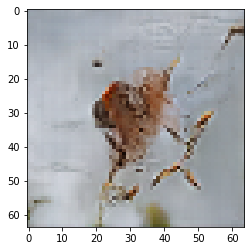

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 26

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6949758529663086 sec
Gen loss: 1.976366268961053, Disc loss: 2.147667690327293, Disc valid real loss: 0.37402525387312235, Disc valid fake loss: 0.39571064553762736, Disc class real loss: 0.6894492946173015, Disc class fake loss: 0.12737428024411201
Time for epoch 2 is 0.6957485675811768 sec
Gen loss: 1.9080168447996442, Disc loss: 2.096785545349121, Disc valid real loss: 0.37783675758462204, Disc valid fake loss: 0.411737627104709, Disc class real loss: 0.6550114625378659, Disc class fake loss: 0.1225422179620517
Time for epoch 3 is 0.695897102355957 sec
Gen loss: 1.8804021948262264, Disc loss: 2.123058036754006, Disc valid real loss: 0.3986778023995851, Disc valid fake loss: 0.3829088697307988, Disc class real loss: 0.6731248748929877, Disc class fake loss: 0.13470316639072016
Time for epoch 4 is 0.6894919872283936 sec
Gen loss: 1.7912813048613698

Time for epoch 31 is 0.6949620246887207 sec
Gen loss: 1.853652050620631, Disc loss: 2.0412247745614303, Disc valid real loss: 0.3863448579060404, Disc valid fake loss: 0.3729319760673924, Disc class real loss: 0.6686884949081823, Disc class fake loss: 0.16314594722107836
Time for epoch 32 is 0.6951751708984375 sec
Gen loss: 1.8487755813096698, Disc loss: 2.038357000601919, Disc valid real loss: 0.395534927907743, Disc valid fake loss: 0.39662365536940725, Disc class real loss: 0.6493134969159177, Disc class fake loss: 0.18658807246308579
Time for epoch 33 is 0.6921796798706055 sec
Gen loss: 1.7829528984270597, Disc loss: 2.0869099654649435, Disc valid real loss: 0.40725814355047124, Disc valid fake loss: 0.4211590917486894, Disc class real loss: 0.6577384848343698, Disc class fake loss: 0.17028744832465523
Time for epoch 34 is 0.6938004493713379 sec
Gen loss: 1.8257228700738204, Disc loss: 2.0502624386235286, Disc valid real loss: 0.3721471162218797, Disc valid fake loss: 0.40333918834

Time for epoch 62 is 0.6908309459686279 sec
Gen loss: 1.8701867053383274, Disc loss: 1.9650573354018361, Disc valid real loss: 0.39210178977564764, Disc valid fake loss: 0.38350397975821243, Disc class real loss: 0.6477805721132379, Disc class fake loss: 0.16816646762584386
Time for epoch 63 is 0.6974992752075195 sec
Gen loss: 1.8062752610758732, Disc loss: 1.9596779973883378, Disc valid real loss: 0.38853800610492106, Disc valid fake loss: 0.3974250476611288, Disc class real loss: 0.6370814160296792, Disc class fake loss: 0.19036976640161715
Time for epoch 64 is 0.6937618255615234 sec
Gen loss: 1.9293729694266069, Disc loss: 2.013892788636057, Disc valid real loss: 0.3956281464350851, Disc valid fake loss: 0.3835507803841641, Disc class real loss: 0.6731435750660143, Disc class fake loss: 0.18487223433820824
Time for epoch 65 is 0.6905057430267334 sec
Gen loss: 1.9138920934576737, Disc loss: 1.9955154720105623, Disc valid real loss: 0.4150138450296302, Disc valid fake loss: 0.37935565

Time for epoch 93 is 0.6950044631958008 sec
Gen loss: 1.8267084297380949, Disc loss: 1.9086896181106567, Disc valid real loss: 0.40107793400162145, Disc valid fake loss: 0.40040825385796397, Disc class real loss: 0.6254184026467172, Disc class fake loss: 0.19383258647040316
Time for epoch 94 is 0.7012729644775391 sec
Gen loss: 2.061834774519268, Disc loss: 1.9600753156762374, Disc valid real loss: 0.3662427334409011, Disc valid fake loss: 0.38701603914562027, Disc class real loss: 0.6863108685142115, Disc class fake loss: 0.19365079622519643
Time for epoch 95 is 0.6940622329711914 sec
Gen loss: 1.9720240329441272, Disc loss: 1.9545852510552657, Disc valid real loss: 0.39224272025258916, Disc valid fake loss: 0.40399989956303645, Disc class real loss: 0.659020765831596, Disc class fake loss: 0.18950330426818446
Time for epoch 96 is 0.6977634429931641 sec
Gen loss: 1.8719671776420193, Disc loss: 1.9758059727518182, Disc valid real loss: 0.38482293643449483, Disc valid fake loss: 0.395337

Time for epoch 123 is 0.69510817527771 sec
Gen loss: 1.9636039169211137, Disc loss: 1.89628467434331, Disc valid real loss: 0.39389240584875407, Disc valid fake loss: 0.38279954696956436, Disc class real loss: 0.6674263540067171, Disc class fake loss: 0.17913274270923515
Time for epoch 124 is 0.6968848705291748 sec
Gen loss: 1.92701214238217, Disc loss: 1.8616871959284733, Disc valid real loss: 0.38385003491451863, Disc valid fake loss: 0.38556437272774546, Disc class real loss: 0.6505803058021947, Disc class fake loss: 0.18067623988578194
Time for epoch 125 is 0.6977739334106445 sec
Gen loss: 1.9522244051883095, Disc loss: 1.8853494242617959, Disc valid real loss: 0.39556217350457845, Disc valid fake loss: 0.38876564879166453, Disc class real loss: 0.6613472794231615, Disc class fake loss: 0.1666207693909344
Time for epoch 126 is 0.6943314075469971 sec
Gen loss: 1.941012376233151, Disc loss: 1.9046767636349327, Disc valid real loss: 0.38420388573094416, Disc valid fake loss: 0.3980199

Time for epoch 153 is 0.7000236511230469 sec
Gen loss: 1.9769467429110879, Disc loss: 1.8588768620240061, Disc valid real loss: 0.3901594500792654, Disc valid fake loss: 0.3860963708476016, Disc class real loss: 0.6823800300296984, Disc class fake loss: 0.16836265945120862
Time for epoch 154 is 0.6957244873046875 sec
Gen loss: 1.9496358633041382, Disc loss: 1.810482709031356, Disc valid real loss: 0.3832399374560306, Disc valid fake loss: 0.37825421439973933, Disc class real loss: 0.6561379432678223, Disc class fake loss: 0.17963391189512454
Time for epoch 155 is 0.6962897777557373 sec
Gen loss: 1.8834069841786434, Disc loss: 1.8222928549114026, Disc valid real loss: 0.3938005833249343, Disc valid fake loss: 0.3908150980347081, Disc class real loss: 0.6567250835268121, Disc class fake loss: 0.16072703545030795
Time for epoch 156 is 0.6976053714752197 sec
Gen loss: 2.0064120292663574, Disc loss: 1.7983010442633378, Disc valid real loss: 0.38799656378595454, Disc valid fake loss: 0.38871

Time for epoch 183 is 0.6948506832122803 sec
Gen loss: 1.9701153604607833, Disc loss: 1.7333452387859947, Disc valid real loss: 0.3659525396008241, Disc valid fake loss: 0.3842828430627522, Disc class real loss: 0.6578919981655321, Disc class fake loss: 0.15145944686312424
Time for epoch 184 is 0.690185546875 sec
Gen loss: 1.952703363017032, Disc loss: 1.7418898595006842, Disc valid real loss: 0.3798873550013492, Disc valid fake loss: 0.3909163129957099, Disc class real loss: 0.6589796950942591, Disc class fake loss: 0.13382896094730026
Time for epoch 185 is 0.6954035758972168 sec
Gen loss: 1.9958425572043972, Disc loss: 1.7490473107287758, Disc valid real loss: 0.3699247491987128, Disc valid fake loss: 0.38371903174801875, Disc class real loss: 0.6676964477488869, Disc class fake loss: 0.15576290888221642
Time for epoch 186 is 0.6935741901397705 sec
Gen loss: 1.8868261763924046, Disc loss: 1.8135766355614913, Disc valid real loss: 0.39711855665633555, Disc valid fake loss: 0.414438870

Time for epoch 213 is 0.6948161125183105 sec
Gen loss: 1.998734147925126, Disc loss: 1.6835009612535174, Disc valid real loss: 0.3980798501717417, Disc valid fake loss: 0.37306317059617294, Disc class real loss: 0.6501735793916803, Disc class fake loss: 0.1429417682321448
Time for epoch 214 is 0.6973638534545898 sec
Gen loss: 2.0000622774425305, Disc loss: 1.6810475964295237, Disc valid real loss: 0.3890884424510755, Disc valid fake loss: 0.38234277540131617, Disc class real loss: 0.6553087422722265, Disc class fake loss: 0.1335259146596256
Time for epoch 215 is 0.6945533752441406 sec
Gen loss: 1.9925092145016319, Disc loss: 1.7157954165810032, Disc valid real loss: 0.36264284504087346, Disc valid fake loss: 0.4033210481468, Disc class real loss: 0.6832063386314794, Disc class fake loss: 0.14368085876891487
Time for epoch 216 is 0.6966958045959473 sec
Gen loss: 2.1339337323841296, Disc loss: 1.6350195094158775, Disc valid real loss: 0.3710383161118156, Disc valid fake loss: 0.371596508

Time for epoch 243 is 0.6958892345428467 sec
Gen loss: 1.9458860849079334, Disc loss: 1.6665428500426442, Disc valid real loss: 0.40693303158408717, Disc valid fake loss: 0.3871225118637085, Disc class real loss: 0.6565661022537633, Disc class fake loss: 0.1517850760566561
Time for epoch 244 is 0.69950270652771 sec
Gen loss: 1.9155199088548358, Disc loss: 1.6353393165688765, Disc valid real loss: 0.37312607231893036, Disc valid fake loss: 0.3865772438676734, Disc class real loss: 0.6673337817192078, Disc class fake loss: 0.14361761196663506
Time for epoch 245 is 0.6990363597869873 sec
Gen loss: 2.0419671033558093, Disc loss: 1.635966420173645, Disc valid real loss: 0.39223071775938334, Disc valid fake loss: 0.37288869838965566, Disc class real loss: 0.6690565692751032, Disc class fake loss: 0.13812710972208725
Time for epoch 246 is 0.6955931186676025 sec
Gen loss: 1.9644290585266917, Disc loss: 1.660366221478111, Disc valid real loss: 0.3949361851340846, Disc valid fake loss: 0.3841920

Time for epoch 273 is 0.6971409320831299 sec
Gen loss: 1.9524428468001516, Disc loss: 1.602738945107711, Disc valid real loss: 0.382688883888094, Disc valid fake loss: 0.3951812621794249, Disc class real loss: 0.6749944467293588, Disc class fake loss: 0.13964810281207687
Time for epoch 274 is 0.695929765701294 sec
Gen loss: 1.971061342640927, Disc loss: 1.6086664325312565, Disc valid real loss: 0.3824838697910309, Disc valid fake loss: 0.4190211343137841, Disc class real loss: 0.6714268138534144, Disc class fake loss: 0.12727846283661692
Time for epoch 275 is 0.6966485977172852 sec
Gen loss: 1.9222009432943243, Disc loss: 1.575382998115138, Disc valid real loss: 0.4057605705763164, Disc valid fake loss: 0.3717840643305528, Disc class real loss: 0.6666699177340457, Disc class fake loss: 0.12473665530744352
Time for epoch 276 is 0.6932625770568848 sec
Gen loss: 2.0177040539289774, Disc loss: 1.608111481917532, Disc valid real loss: 0.38987556570454646, Disc valid fake loss: 0.40786551644

Time for epoch 303 is 0.6961901187896729 sec
Gen loss: 2.0021418521278784, Disc loss: 1.606974482536316, Disc valid real loss: 0.3983644011773561, Disc valid fake loss: 0.39619294593208715, Disc class real loss: 0.6990561453919661, Disc class fake loss: 0.11347814021926177
Time for epoch 304 is 0.6953122615814209 sec
Gen loss: 1.8996201439907676, Disc loss: 1.5679176355663098, Disc valid real loss: 0.3766913021865644, Disc valid fake loss: 0.38721856318022074, Disc class real loss: 0.6770815159145155, Disc class fake loss: 0.12703628289072136
Time for epoch 305 is 0.6981172561645508 sec
Gen loss: 1.9699137022620754, Disc loss: 1.594145279181631, Disc valid real loss: 0.39349935243004247, Disc valid fake loss: 0.39299672057754115, Disc class real loss: 0.6762830897381431, Disc class fake loss: 0.13147507960859098
Time for epoch 306 is 0.6972811222076416 sec
Gen loss: 1.9283667928294133, Disc loss: 1.5618485965226825, Disc valid real loss: 0.3998228515449323, Disc valid fake loss: 0.3905

Time for epoch 333 is 0.6939220428466797 sec
Gen loss: 2.027078754023502, Disc loss: 1.5702094906254818, Disc valid real loss: 0.39334428310394287, Disc valid fake loss: 0.38412020865239593, Disc class real loss: 0.6888984128048545, Disc class fake loss: 0.10396359880503855
Time for epoch 334 is 0.6887912750244141 sec
Gen loss: 1.966258362719887, Disc loss: 1.5339786002510472, Disc valid real loss: 0.3819374049964704, Disc valid fake loss: 0.3853244624639812, Disc class real loss: 0.6638603084965756, Disc class fake loss: 0.10296862199902534
Time for epoch 335 is 0.7005400657653809 sec
Gen loss: 1.949596266997488, Disc loss: 1.6008684886129279, Disc valid real loss: 0.4191874689177463, Disc valid fake loss: 0.3956389850691745, Disc class real loss: 0.6626781915363512, Disc class fake loss: 0.12347167377409182
Time for epoch 336 is 0.6974856853485107 sec
Gen loss: 1.9343966810326827, Disc loss: 1.555118253356532, Disc valid real loss: 0.39734815923791184, Disc valid fake loss: 0.3639357

Time for epoch 363 is 0.697730302810669 sec
Gen loss: 2.112895187578703, Disc loss: 1.5343937685615139, Disc valid real loss: 0.39277063937563644, Disc valid fake loss: 0.36776309264333623, Disc class real loss: 0.6644784917956904, Disc class fake loss: 0.10949255369211498
Time for epoch 364 is 0.6959729194641113 sec
Gen loss: 2.047246820048282, Disc loss: 1.5830646376860769, Disc valid real loss: 0.4082648942345067, Disc valid fake loss: 0.384219334313744, Disc class real loss: 0.6660216231095163, Disc class fake loss: 0.1246670755116563
Time for epoch 365 is 0.6953072547912598 sec
Gen loss: 2.0026273915642188, Disc loss: 1.5500038987711857, Disc valid real loss: 0.39567841667878, Disc valid fake loss: 0.39113130538087143, Disc class real loss: 0.653229484432622, Disc class fake loss: 0.11007333056707132
Time for epoch 366 is 0.6988265514373779 sec
Gen loss: 1.9757638730500873, Disc loss: 1.6221724372161062, Disc valid real loss: 0.39674547393071025, Disc valid fake loss: 0.4090394142

Time for epoch 393 is 0.6947920322418213 sec
Gen loss: 1.9283308292690076, Disc loss: 1.5923503637313843, Disc valid real loss: 0.40841707900950786, Disc valid fake loss: 0.39384128859168605, Disc class real loss: 0.666246705933621, Disc class fake loss: 0.12395373339715757
Time for epoch 394 is 0.6960837841033936 sec
Gen loss: 2.0081025675723425, Disc loss: 1.5921629667282104, Disc valid real loss: 0.38471425207037674, Disc valid fake loss: 0.4014978267644581, Disc class real loss: 0.6690326160506198, Disc class fake loss: 0.13702468887755745
Time for epoch 395 is 0.7025625705718994 sec
Gen loss: 1.9947556382731388, Disc loss: 1.579240278193825, Disc valid real loss: 0.3830684643042715, Disc valid fake loss: 0.4111075981667167, Disc class real loss: 0.6486340823926424, Disc class fake loss: 0.13653259881232915
Time for epoch 396 is 0.7043790817260742 sec
Gen loss: 2.002054678766351, Disc loss: 1.5874269510570325, Disc valid real loss: 0.38596867260180023, Disc valid fake loss: 0.38615

Time for epoch 423 is 0.6955673694610596 sec
Gen loss: 1.9596170500705117, Disc loss: 1.5424046328193264, Disc valid real loss: 0.3786000287846515, Disc valid fake loss: 0.38324330041283056, Disc class real loss: 0.6694560835235998, Disc class fake loss: 0.11121689018450286
Time for epoch 424 is 0.6962580680847168 sec
Gen loss: 1.9722255719335455, Disc loss: 1.5532761435759694, Disc valid real loss: 0.3835268742159793, Disc valid fake loss: 0.381559282541275, Disc class real loss: 0.6688066407253868, Disc class fake loss: 0.11949325980324495
Time for epoch 425 is 0.6967048645019531 sec
Gen loss: 1.9632689074466103, Disc loss: 1.6397196054458618, Disc valid real loss: 0.4158886012278105, Disc valid fake loss: 0.4095804989337921, Disc class real loss: 0.6942693747972187, Disc class fake loss: 0.12009599295101668
Time for epoch 426 is 0.699880838394165 sec
Gen loss: 1.9529350431341874, Disc loss: 1.5884663682234914, Disc valid real loss: 0.3955976476794795, Disc valid fake loss: 0.3860304

Time for epoch 453 is 0.6950778961181641 sec
Gen loss: 1.9239176950956647, Disc loss: 1.6107509261683415, Disc valid real loss: 0.38018990033551264, Disc valid fake loss: 0.39901732143602875, Disc class real loss: 0.71343374566028, Disc class fake loss: 0.11822902332795293
Time for epoch 454 is 0.6962518692016602 sec
Gen loss: 1.935773447940224, Disc loss: 1.5224050157948543, Disc valid real loss: 0.38335300276153966, Disc valid fake loss: 0.379510151712518, Disc class real loss: 0.6396096066424721, Disc class fake loss: 0.12003619066978756
Time for epoch 455 is 0.6927146911621094 sec
Gen loss: 1.860937476158142, Disc loss: 1.6130844856563367, Disc valid real loss: 0.42270344182064656, Disc valid fake loss: 0.3987401206242411, Disc class real loss: 0.6771825520615828, Disc class fake loss: 0.11457093158050587
Time for epoch 456 is 0.6901364326477051 sec
Gen loss: 1.9678026249534206, Disc loss: 1.5642683192303306, Disc valid real loss: 0.38996053839984696, Disc valid fake loss: 0.375606

Time for epoch 483 is 0.6968917846679688 sec
Gen loss: 2.026933751608196, Disc loss: 1.6207921881424754, Disc valid real loss: 0.3950105262430091, Disc valid fake loss: 0.3893066628983146, Disc class real loss: 0.7048289399398001, Disc class fake loss: 0.13176068291068077
Time for epoch 484 is 0.6998231410980225 sec
Gen loss: 1.9064093012558787, Disc loss: 1.5840424801173962, Disc valid real loss: 0.39161177214823273, Disc valid fake loss: 0.3948485239555961, Disc class real loss: 0.667105003407127, Disc class fake loss: 0.13058452092503248
Time for epoch 485 is 0.700200080871582 sec
Gen loss: 1.8640948596753573, Disc loss: 1.584274411201477, Disc valid real loss: 0.40233177417203, Disc valid fake loss: 0.40692849849399765, Disc class real loss: 0.6667635346713819, Disc class fake loss: 0.10836228002843104
Time for epoch 486 is 0.6973752975463867 sec
Gen loss: 2.0829154002039054, Disc loss: 1.5987847290540997, Disc valid real loss: 0.41871356179839686, Disc valid fake loss: 0.402537220

Time for epoch 513 is 0.6988906860351562 sec
Gen loss: 2.0183756727921334, Disc loss: 1.5852077571969283, Disc valid real loss: 0.3896599584504178, Disc valid fake loss: 0.384996077732036, Disc class real loss: 0.6737405720509981, Disc class fake loss: 0.13691853280914457
Time for epoch 514 is 0.693044900894165 sec
Gen loss: 1.9727496849863153, Disc loss: 1.5722209026938991, Disc valid real loss: 0.39533301560502304, Disc valid fake loss: 0.38520533395440953, Disc class real loss: 0.6735582728134958, Disc class fake loss: 0.11823535926247898
Time for epoch 515 is 0.6947433948516846 sec
Gen loss: 1.9205569342563027, Disc loss: 1.548157629213835, Disc valid real loss: 0.39155753662711695, Disc valid fake loss: 0.3769370442942569, Disc class real loss: 0.664435769382276, Disc class fake loss: 0.11533711085978307
Time for epoch 516 is 0.6964783668518066 sec
Gen loss: 1.9369682889235647, Disc loss: 1.597717900025217, Disc valid real loss: 0.4048502476591813, Disc valid fake loss: 0.38673200

Time for epoch 543 is 0.6966755390167236 sec
Gen loss: 1.9626568116639789, Disc loss: 1.5684745499962254, Disc valid real loss: 0.3913541185228448, Disc valid fake loss: 0.3947816051934895, Disc class real loss: 0.6558382040575931, Disc class fake loss: 0.12660645575899826
Time for epoch 544 is 0.701646089553833 sec
Gen loss: 1.9420569131248875, Disc loss: 1.5446814988788806, Disc valid real loss: 0.38569111886777374, Disc valid fake loss: 0.37791546394950465, Disc class real loss: 0.6598195370874906, Disc class fake loss: 0.12136306496042955
Time for epoch 545 is 0.6958434581756592 sec
Gen loss: 1.9424779226905422, Disc loss: 1.5959618217066716, Disc valid real loss: 0.3930668125027104, Disc valid fake loss: 0.40746382819978816, Disc class real loss: 0.6734812887091386, Disc class fake loss: 0.1220602024542658
Time for epoch 546 is 0.6981019973754883 sec
Gen loss: 1.932747577366076, Disc loss: 1.5892056791405929, Disc valid real loss: 0.37727685115839305, Disc valid fake loss: 0.39182

Time for epoch 573 is 0.6906554698944092 sec
Gen loss: 1.9221349452671253, Disc loss: 1.5539869885695607, Disc valid real loss: 0.3894703341157813, Disc valid fake loss: 0.3821120089606235, Disc class real loss: 0.6729835585543984, Disc class fake loss: 0.10953382520299208
Time for epoch 574 is 0.691133975982666 sec
Gen loss: 2.0144775227496496, Disc loss: 1.6241641295583624, Disc valid real loss: 0.3975897462744462, Disc valid fake loss: 0.38859222594060394, Disc class real loss: 0.6737449075046339, Disc class fake loss: 0.16433915966435483
Time for epoch 575 is 0.6918416023254395 sec
Gen loss: 2.281833378892196, Disc loss: 1.5865526826758134, Disc valid real loss: 0.3846943252965024, Disc valid fake loss: 0.3966219095807326, Disc class real loss: 0.6376746422366092, Disc class fake loss: 0.16765581894862025
Time for epoch 576 is 0.6931805610656738 sec
Gen loss: 1.9066261931469566, Disc loss: 1.571082171640898, Disc valid real loss: 0.37761908769607544, Disc valid fake loss: 0.3909500

Time for epoch 603 is 0.7001686096191406 sec
Gen loss: 1.9443638073770624, Disc loss: 1.5828161867041337, Disc valid real loss: 0.3984061009005496, Disc valid fake loss: 0.4004960530682614, Disc class real loss: 0.6505165790256701, Disc class fake loss: 0.13350088227736323
Time for epoch 604 is 0.7016439437866211 sec
Gen loss: 2.001574233958596, Disc loss: 1.5694388527619212, Disc valid real loss: 0.40264156460762024, Disc valid fake loss: 0.3997753576228493, Disc class real loss: 0.6578714925991861, Disc class fake loss: 0.10926020772833574
Time for epoch 605 is 0.6996269226074219 sec
Gen loss: 1.9411929720326473, Disc loss: 1.614401246372022, Disc valid real loss: 0.3930144937414872, Disc valid fake loss: 0.40769238534726593, Disc class real loss: 0.6860562061008654, Disc class fake loss: 0.12774986969797233
Time for epoch 606 is 0.7014892101287842 sec
Gen loss: 1.9033961798015393, Disc loss: 1.567726637187757, Disc valid real loss: 0.38498290588981227, Disc valid fake loss: 0.394291

Time for epoch 633 is 0.6946237087249756 sec
Gen loss: 1.933139405752483, Disc loss: 1.5751167473040129, Disc valid real loss: 0.37800643475432144, Disc valid fake loss: 0.3957190121475019, Disc class real loss: 0.6759466842601174, Disc class fake loss: 0.12555470043107084
Time for epoch 634 is 0.6939847469329834 sec
Gen loss: 1.95740975204267, Disc loss: 1.567677704911483, Disc valid real loss: 0.37089990706820236, Disc valid fake loss: 0.3899659420314588, Disc class real loss: 0.7019146335752386, Disc class fake loss: 0.1050166175945809
Time for epoch 635 is 0.6945898532867432 sec
Gen loss: 2.047884200748644, Disc loss: 1.541579899035002, Disc valid real loss: 0.3781014163243143, Disc valid fake loss: 0.36840665340423584, Disc class real loss: 0.6728748553677609, Disc class fake loss: 0.12230711351884038
Time for epoch 636 is 0.6966099739074707 sec
Gen loss: 1.9772445528130782, Disc loss: 1.5888836070110923, Disc valid real loss: 0.38845073706225347, Disc valid fake loss: 0.392063302

Time for epoch 663 is 0.6960482597351074 sec
Gen loss: 1.9432582604257684, Disc loss: 1.6160624278219122, Disc valid real loss: 0.37288465468507065, Disc valid fake loss: 0.409238653747659, Disc class real loss: 0.7086466770423087, Disc class fake loss: 0.12540912941882484
Time for epoch 664 is 0.6953878402709961 sec
Gen loss: 1.979840178238718, Disc loss: 1.5895621023680035, Disc valid real loss: 0.37497813607517044, Disc valid fake loss: 0.3946381556360345, Disc class real loss: 0.6788527463611803, Disc class fake loss: 0.14120062597488103
Time for epoch 665 is 0.6969599723815918 sec
Gen loss: 2.035676253469367, Disc loss: 1.5737213837473016, Disc valid real loss: 0.38625739593254893, Disc valid fake loss: 0.3975316929189782, Disc class real loss: 0.6615555223665739, Disc class fake loss: 0.128483413277488
Time for epoch 666 is 0.6943693161010742 sec
Gen loss: 1.9647916806371588, Disc loss: 1.5577013241617303, Disc valid real loss: 0.3883843688588393, Disc valid fake loss: 0.39006330

Time for epoch 693 is 0.7009727954864502 sec
Gen loss: 1.8609014561301784, Disc loss: 1.6199587395316677, Disc valid real loss: 0.3770101619394202, Disc valid fake loss: 0.40882752600469086, Disc class real loss: 0.696808535801737, Disc class fake loss: 0.13742442781987943
Time for epoch 694 is 0.6946814060211182 sec
Gen loss: 1.9158718836934943, Disc loss: 1.5494604549909894, Disc valid real loss: 0.3968363537600166, Disc valid fake loss: 0.3842290279112364, Disc class real loss: 0.6650702561202803, Disc class fake loss: 0.10343715019131962
Time for epoch 695 is 0.6913557052612305 sec
Gen loss: 2.0124441887203015, Disc loss: 1.5790968317734568, Disc valid real loss: 0.405884198452297, Disc valid fake loss: 0.38885959355454697, Disc class real loss: 0.6772396658596239, Disc class fake loss: 0.10722741719923522
Time for epoch 696 is 0.6943209171295166 sec
Gen loss: 1.9913928132308156, Disc loss: 1.5543526724765175, Disc valid real loss: 0.38130095993217666, Disc valid fake loss: 0.38645

Time for epoch 723 is 0.6953613758087158 sec
Gen loss: 1.8475268012598942, Disc loss: 1.573213351400275, Disc valid real loss: 0.38801553061133937, Disc valid fake loss: 0.39527569162218196, Disc class real loss: 0.6455370752434981, Disc class fake loss: 0.14448530187732295
Time for epoch 724 is 0.6947488784790039 sec
Gen loss: 1.9725692021219354, Disc loss: 1.5692167470329685, Disc valid real loss: 0.388572926584043, Disc valid fake loss: 0.3888495093897769, Disc class real loss: 0.6694011907828482, Disc class fake loss: 0.12250249793654994
Time for epoch 725 is 0.6978921890258789 sec
Gen loss: 1.8997767348038523, Disc loss: 1.5848017052600258, Disc valid real loss: 0.3861556633522636, Disc valid fake loss: 0.3937349115547381, Disc class real loss: 0.6703521891644126, Disc class fake loss: 0.13466609230166987
Time for epoch 726 is 0.6954226493835449 sec
Gen loss: 1.9958045733602423, Disc loss: 1.528006622665807, Disc valid real loss: 0.37425810569211054, Disc valid fake loss: 0.382684

Time for epoch 753 is 0.6986808776855469 sec
Gen loss: 1.8756190161955983, Disc loss: 1.633389491783945, Disc valid real loss: 0.402792132214496, Disc valid fake loss: 0.4048737601230019, Disc class real loss: 0.6744078585976049, Disc class fake loss: 0.15142036974430084
Time for epoch 754 is 0.6965658664703369 sec
Gen loss: 1.9981860863535028, Disc loss: 1.5603473751168502, Disc valid real loss: 0.3896757238789609, Disc valid fake loss: 0.3950489618276295, Disc class real loss: 0.6569143408223203, Disc class fake loss: 0.11881596418587785
Time for epoch 755 is 0.696169376373291 sec
Gen loss: 1.921880973012824, Disc loss: 1.6268448076750104, Disc valid real loss: 0.39173745481591477, Disc valid fake loss: 0.41480053725995514, Disc class real loss: 0.676860090933348, Disc class fake loss: 0.14355339502033435
Time for epoch 756 is 0.6949279308319092 sec
Gen loss: 1.9500645273610164, Disc loss: 1.5871529453679134, Disc valid real loss: 0.38334806028165314, Disc valid fake loss: 0.36827118

Time for epoch 783 is 0.6937742233276367 sec
Gen loss: 1.972538151239094, Disc loss: 1.63407606200168, Disc valid real loss: 0.40210442480288056, Disc valid fake loss: 0.3919455354150973, Disc class real loss: 0.7111712725538957, Disc class fake loss: 0.12897128807870964
Time for epoch 784 is 0.6974265575408936 sec
Gen loss: 1.9571990464863025, Disc loss: 1.5424085102583234, Disc valid real loss: 0.3843805491924286, Disc valid fake loss: 0.3815160487827502, Disc class real loss: 0.6576402218718278, Disc class fake loss: 0.1189794361983475
Time for epoch 785 is 0.6934421062469482 sec
Gen loss: 1.9068127117658917, Disc loss: 1.6244274440564608, Disc valid real loss: 0.41782045050671224, Disc valid fake loss: 0.382609519519304, Disc class real loss: 0.6867758114086954, Disc class fake loss: 0.13733154849002235
Time for epoch 786 is 0.6955204010009766 sec
Gen loss: 1.9074621451528448, Disc loss: 1.5294489170375622, Disc valid real loss: 0.37472430655830785, Disc valid fake loss: 0.38607717

Time for epoch 813 is 0.6958723068237305 sec
Gen loss: 1.8897548913955688, Disc loss: 1.5661480991463912, Disc valid real loss: 0.4035215581718244, Disc valid fake loss: 0.3880288365640138, Disc class real loss: 0.6685546166018436, Disc class fake loss: 0.10615559108555317
Time for epoch 814 is 0.6907150745391846 sec
Gen loss: 2.056612027318854, Disc loss: 1.5733737192655866, Disc valid real loss: 0.37794296365035207, Disc valid fake loss: 0.39253902592157064, Disc class real loss: 0.6675331184738561, Disc class fake loss: 0.13546503217596756
Time for epoch 815 is 0.6920008659362793 sec
Gen loss: 2.226819678356773, Disc loss: 1.578098121442293, Disc valid real loss: 0.3745224687613939, Disc valid fake loss: 0.389010027050972, Disc class real loss: 0.6690060025767276, Disc class fake loss: 0.1456642784178257
Time for epoch 816 is 0.6932306289672852 sec
Gen loss: 2.0719818127782723, Disc loss: 1.5265893183256452, Disc valid real loss: 0.37887639042578247, Disc valid fake loss: 0.38662307

Time for epoch 843 is 0.69594407081604 sec
Gen loss: 1.9231759811702527, Disc loss: 1.5402065390034725, Disc valid real loss: 0.40217707345360204, Disc valid fake loss: 0.37379026961954015, Disc class real loss: 0.6776002520009091, Disc class fake loss: 0.08675712033321983
Time for epoch 844 is 0.6948659420013428 sec
Gen loss: 1.9875200986862183, Disc loss: 1.5514400883724815, Disc valid real loss: 0.40560003173978704, Disc valid fake loss: 0.3861960753014213, Disc class real loss: 0.6710201893982134, Disc class fake loss: 0.08874025862467916
Time for epoch 845 is 0.6954092979431152 sec
Gen loss: 1.8907597817872699, Disc loss: 1.531196864027726, Disc valid real loss: 0.3644095447502638, Disc valid fake loss: 0.3836259089018169, Disc class real loss: 0.6755375517042059, Disc class fake loss: 0.10773743375351555
Time for epoch 846 is 0.6936557292938232 sec
Gen loss: 1.972400753121627, Disc loss: 1.556576929594341, Disc valid real loss: 0.40214148948067113, Disc valid fake loss: 0.3787719

Time for epoch 873 is 0.695671796798706 sec
Gen loss: 1.9457396708036725, Disc loss: 1.5861344588430304, Disc valid real loss: 0.41559408212962906, Disc valid fake loss: 0.38964416243528066, Disc class real loss: 0.6714134341792056, Disc class fake loss: 0.10959517798925701
Time for epoch 874 is 0.6972255706787109 sec
Gen loss: 1.899639236299615, Disc loss: 1.5803727037028263, Disc valid real loss: 0.36583614035656575, Disc valid fake loss: 0.4114376463388142, Disc class real loss: 0.6976772013463473, Disc class fake loss: 0.10554016244254615
Time for epoch 875 is 0.6950428485870361 sec
Gen loss: 1.921741755385148, Disc loss: 1.580245105843795, Disc valid real loss: 0.40903397610313014, Disc valid fake loss: 0.38792917916649267, Disc class real loss: 0.6608375373639559, Disc class fake loss: 0.12255210311789262
Time for epoch 876 is 0.6937856674194336 sec
Gen loss: 1.9087906009272526, Disc loss: 1.5991216709739284, Disc valid real loss: 0.3881868594571164, Disc valid fake loss: 0.39020

Time for epoch 903 is 0.6950287818908691 sec
Gen loss: 1.955978230426186, Disc loss: 1.604053585152877, Disc valid real loss: 0.4059916781751733, Disc valid fake loss: 0.3881344591316424, Disc class real loss: 0.6805631785016311, Disc class fake loss: 0.1294744901947285
Time for epoch 904 is 0.6961705684661865 sec
Gen loss: 1.9566181709891872, Disc loss: 1.6135850391889874, Disc valid real loss: 0.3984705170518474, Disc valid fake loss: 0.39536760825859874, Disc class real loss: 0.6831609732226321, Disc class fake loss: 0.1366952585154458
Time for epoch 905 is 0.6961541175842285 sec
Gen loss: 1.9016230984737998, Disc loss: 1.568264741646616, Disc valid real loss: 0.38594184815883636, Disc valid fake loss: 0.37354771087044164, Disc class real loss: 0.6639166725309271, Disc class fake loss: 0.144962312163491
Time for epoch 906 is 0.6949419975280762 sec
Gen loss: 1.9141167904201306, Disc loss: 1.610577903295818, Disc valid real loss: 0.3950271465276417, Disc valid fake loss: 0.42065066883

Time for epoch 933 is 0.6982457637786865 sec
Gen loss: 1.9038159847259521, Disc loss: 1.5805535504692478, Disc valid real loss: 0.4027211822961506, Disc valid fake loss: 0.4030868128726357, Disc class real loss: 0.6624321529739782, Disc class fake loss: 0.11242342799117691
Time for epoch 934 is 0.6973791122436523 sec
Gen loss: 1.9986098502811633, Disc loss: 1.59428586457905, Disc valid real loss: 0.39896579478916366, Disc valid fake loss: 0.39818095847180013, Disc class real loss: 0.6505753241087261, Disc class fake loss: 0.14666458297716944
Time for epoch 935 is 0.6951467990875244 sec
Gen loss: 2.1559725184189644, Disc loss: 1.6059219523480064, Disc valid real loss: 0.3860976374463031, Disc valid fake loss: 0.4010873672209288, Disc class real loss: 0.6550277691138419, Disc class fake loss: 0.16380743172607923
Time for epoch 936 is 0.698122501373291 sec
Gen loss: 2.1260427738490857, Disc loss: 1.6049825392271344, Disc valid real loss: 0.38710789382457733, Disc valid fake loss: 0.385241

Time for epoch 963 is 0.695894718170166 sec
Gen loss: 1.979054896455062, Disc loss: 1.5941766688698216, Disc valid real loss: 0.3912950879649112, Disc valid fake loss: 0.4064174686607562, Disc class real loss: 0.678277734078859, Disc class fake loss: 0.11829840254626776
Time for epoch 964 is 0.6954927444458008 sec
Gen loss: 1.9391986884568866, Disc loss: 1.5993320126282542, Disc valid real loss: 0.39309249426189224, Disc valid fake loss: 0.41091940748064143, Disc class real loss: 0.6670148498133609, Disc class fake loss: 0.12841301607458214
Time for epoch 965 is 0.6968798637390137 sec
Gen loss: 1.9678550017507452, Disc loss: 1.6282269891939665, Disc valid real loss: 0.40778558034645884, Disc valid fake loss: 0.4017241706973628, Disc class real loss: 0.6758020865289789, Disc class fake loss: 0.14302173805864235
Time for epoch 966 is 0.6954314708709717 sec
Gen loss: 1.9842900727924548, Disc loss: 1.5612783996682418, Disc valid real loss: 0.3959595561027527, Disc valid fake loss: 0.392641

Time for epoch 993 is 0.695141077041626 sec
Gen loss: 1.9027719623164128, Disc loss: 1.5171589663154201, Disc valid real loss: 0.3829684273192757, Disc valid fake loss: 0.3617304171386518, Disc class real loss: 0.681037564026682, Disc class fake loss: 0.09154047424855985
Time for epoch 994 is 0.6950569152832031 sec
Gen loss: 1.9055499214875071, Disc loss: 1.5804560874637805, Disc valid real loss: 0.38843891730434016, Disc valid fake loss: 0.4000296678982283, Disc class real loss: 0.6896751930839137, Disc class fake loss: 0.10242976601186551
Time for epoch 995 is 0.6962265968322754 sec
Gen loss: 1.9170331515763934, Disc loss: 1.5705366448352212, Disc valid real loss: 0.4115719857968782, Disc valid fake loss: 0.39200349073661, Disc class real loss: 0.6467779529722113, Disc class fake loss: 0.1202885257570367
Time for epoch 996 is 0.6973390579223633 sec
Gen loss: 2.0719243978199207, Disc loss: 1.5636119403337176, Disc valid real loss: 0.3940517714149074, Disc valid fake loss: 0.3833595953

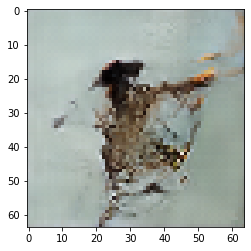

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 27

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6950106620788574 sec
Gen loss: 1.958181663563377, Disc loss: 2.1247232650455676, Disc valid real loss: 0.40182680832712275, Disc valid fake loss: 0.4000755611218904, Disc class real loss: 0.6618631607607791, Disc class fake loss: 0.1310425741892112
Time for epoch 2 is 0.696160078048706 sec
Gen loss: 1.891077392979672, Disc loss: 2.0808661862423548, Disc valid real loss: 0.3858163701860528, Disc valid fake loss: 0.39760280439728185, Disc class real loss: 0.6500829552349291, Disc class fake loss: 0.12792078621293368
Time for epoch 3 is 0.6953167915344238 sec
Gen loss: 1.9328972603145398, Disc loss: 2.134158159557142, Disc valid real loss: 0.412983039492055, Disc valid fake loss: 0.4041449082525153, Disc class real loss: 0.6608780308773643, Disc class fake loss: 0.1290262008183881
Time for epoch 4 is 0.6962566375732422 sec
Gen loss: 1.8466020320591174,

Time for epoch 31 is 0.6954927444458008 sec
Gen loss: 1.923497852526213, Disc loss: 2.081726030299538, Disc valid real loss: 0.4077654888755397, Disc valid fake loss: 0.38193793986973007, Disc class real loss: 0.6735396416563737, Disc class fake loss: 0.17151192810974622
Time for epoch 32 is 0.6972661018371582 sec
Gen loss: 1.8888177683478908, Disc loss: 2.0252029644815543, Disc valid real loss: 0.38845921974433095, Disc valid fake loss: 0.3854211066898547, Disc class real loss: 0.6532499633337322, Disc class fake loss: 0.16631930870445152
Time for epoch 33 is 0.6869843006134033 sec
Gen loss: 1.7501534160814787, Disc loss: 2.1165754104915417, Disc valid real loss: 0.4027005339923658, Disc valid fake loss: 0.38682959581676285, Disc class real loss: 0.6931709929516441, Disc class fake loss: 0.186041538260485
Time for epoch 34 is 0.6957004070281982 sec
Gen loss: 1.8862097890753495, Disc loss: 2.0486503776751066, Disc valid real loss: 0.3949709879724603, Disc valid fake loss: 0.36797563810

Time for epoch 62 is 0.6983547210693359 sec
Gen loss: 1.8737071689806486, Disc loss: 1.9895222187042236, Disc valid real loss: 0.3971958630963376, Disc valid fake loss: 0.395084305813438, Disc class real loss: 0.6483432901533026, Disc class fake loss: 0.19903778167147385
Time for epoch 63 is 0.6978776454925537 sec
Gen loss: 1.7607713310342086, Disc loss: 1.9621868259028385, Disc valid real loss: 0.40718174608130203, Disc valid fake loss: 0.3836086078693992, Disc class real loss: 0.6371779316350034, Disc class fake loss: 0.17929309841833616
Time for epoch 64 is 0.7004694938659668 sec
Gen loss: 1.905903697013855, Disc loss: 1.894408251109876, Disc valid real loss: 0.35917380765864726, Disc valid fake loss: 0.37351164692326594, Disc class real loss: 0.6322131094179655, Disc class fake loss: 0.1827055137408407
Time for epoch 65 is 0.6994009017944336 sec
Gen loss: 1.8670192517732318, Disc loss: 2.064582849803724, Disc valid real loss: 0.40432381002526535, Disc valid fake loss: 0.39474959749

Time for epoch 93 is 0.7009022235870361 sec
Gen loss: 1.8910241691689742, Disc loss: 1.9497277987630743, Disc valid real loss: 0.38954041035551773, Disc valid fake loss: 0.4011945395093215, Disc class real loss: 0.658421908554278, Disc class fake loss: 0.18421659422548195
Time for epoch 94 is 0.7023217678070068 sec
Gen loss: 1.8414115090119212, Disc loss: 1.961588652510392, Disc valid real loss: 0.40535372809359904, Disc valid fake loss: 0.39324792121586044, Disc class real loss: 0.6547075917846278, Disc class fake loss: 0.2195819616317749
Time for epoch 95 is 0.7003288269042969 sec
Gen loss: 1.8843025910226923, Disc loss: 1.9241188388121755, Disc valid real loss: 0.3905270648630042, Disc valid fake loss: 0.3737118761790426, Disc class real loss: 0.6571712054704365, Disc class fake loss: 0.20297189449009143
Time for epoch 96 is 0.6986429691314697 sec
Gen loss: 1.91959716144361, Disc loss: 1.9743732966874774, Disc valid real loss: 0.39513524111948517, Disc valid fake loss: 0.39634006195

Time for epoch 124 is 0.6955583095550537 sec
Gen loss: 1.8488650572927374, Disc loss: 1.8407877244447406, Disc valid real loss: 0.38338195022783783, Disc valid fake loss: 0.38746124192288045, Disc class real loss: 0.6383239532771864, Disc class fake loss: 0.1732707705936934
Time for epoch 125 is 0.6958727836608887 sec
Gen loss: 1.9878338889071816, Disc loss: 1.846949200881155, Disc valid real loss: 0.3806225798631969, Disc valid fake loss: 0.38434044467775447, Disc class real loss: 0.6450807075751456, Disc class fake loss: 0.18064346987950175
Time for epoch 126 is 0.7000088691711426 sec
Gen loss: 2.0257679914173328, Disc loss: 1.8713086906232332, Disc valid real loss: 0.3826518294058348, Disc valid fake loss: 0.3823570750261608, Disc class real loss: 0.6573969282602009, Disc class fake loss: 0.19586540444901115
Time for epoch 127 is 0.6983587741851807 sec
Gen loss: 1.9309765476929515, Disc loss: 1.872549991858633, Disc valid real loss: 0.3965051064365788, Disc valid fake loss: 0.392977

Time for epoch 154 is 0.6988475322723389 sec
Gen loss: 1.8918056237070184, Disc loss: 1.821831841217844, Disc valid real loss: 0.38756367564201355, Disc valid fake loss: 0.3814718033138074, Disc class real loss: 0.6667997146907606, Disc class fake loss: 0.15864890970681844
Time for epoch 155 is 0.6922383308410645 sec
Gen loss: 1.9951638046063875, Disc loss: 1.783634907320926, Disc valid real loss: 0.3908507572977166, Disc valid fake loss: 0.38875607440346166, Disc class real loss: 0.6308361542852301, Disc class fake loss: 0.1674599616151107
Time for epoch 156 is 0.6993246078491211 sec
Gen loss: 1.984379536227176, Disc loss: 1.8320937533127635, Disc valid real loss: 0.3784431783776534, Disc valid fake loss: 0.3932137646173176, Disc class real loss: 0.6695892057920757, Disc class fake loss: 0.17161818044750313
Time for epoch 157 is 0.6983635425567627 sec
Gen loss: 1.9637258931210166, Disc loss: 1.8221871852874756, Disc valid real loss: 0.39070246251005875, Disc valid fake loss: 0.3840154

Time for epoch 184 is 0.6933543682098389 sec
Gen loss: 1.961319459112067, Disc loss: 1.7934943123867637, Disc valid real loss: 0.41944273286744166, Disc valid fake loss: 0.3764374930607645, Disc class real loss: 0.664747206788314, Disc class fake loss: 0.16230459432852895
Time for epoch 185 is 0.6931130886077881 sec
Gen loss: 2.0029300325795223, Disc loss: 1.762685731837624, Disc valid real loss: 0.38453068074427155, Disc valid fake loss: 0.3879759923407906, Disc class real loss: 0.659473927397477, Disc class fake loss: 0.16440023089710035
Time for epoch 186 is 0.6954264640808105 sec
Gen loss: 1.9256692873804193, Disc loss: 1.7578656422464471, Disc valid real loss: 0.3821540914083782, Disc valid fake loss: 0.3900572014482398, Disc class real loss: 0.6494146930544, Disc class fake loss: 0.1803242544594564
Time for epoch 187 is 0.6934733390808105 sec
Gen loss: 1.9361817397569354, Disc loss: 1.8271194445459467, Disc valid real loss: 0.40005923258630854, Disc valid fake loss: 0.39941674549

Time for epoch 214 is 0.7018654346466064 sec
Gen loss: 1.9529454080682052, Disc loss: 1.7279924091539884, Disc valid real loss: 0.3964162029718098, Disc valid fake loss: 0.4114903101795598, Disc class real loss: 0.6517040541297511, Disc class fake loss: 0.15293633820194946
Time for epoch 215 is 0.6985809803009033 sec
Gen loss: 1.9551494560743634, Disc loss: 1.7167354884900545, Disc valid real loss: 0.3929316981842643, Disc valid fake loss: 0.39583859788744075, Disc class real loss: 0.6659555058730277, Disc class fake loss: 0.1428090247668718
Time for epoch 216 is 0.7006759643554688 sec
Gen loss: 1.9346905758506374, Disc loss: 1.690722578450253, Disc valid real loss: 0.3713631198594445, Disc valid fake loss: 0.40896239641465637, Disc class real loss: 0.652399546221683, Disc class fake loss: 0.143989119090532
Time for epoch 217 is 0.7000632286071777 sec
Gen loss: 1.9322967843005532, Disc loss: 1.671561968953986, Disc valid real loss: 0.3911221874387641, Disc valid fake loss: 0.3811411575

Time for epoch 244 is 0.6935532093048096 sec
Gen loss: 2.0741997078845373, Disc loss: 1.6266145957143683, Disc valid real loss: 0.38792168388241216, Disc valid fake loss: 0.3799006695810117, Disc class real loss: 0.6521865945113333, Disc class fake loss: 0.14382317779879822
Time for epoch 245 is 0.695183277130127 sec
Gen loss: 2.1226365378028467, Disc loss: 1.6531988507822941, Disc valid real loss: 0.3856397271156311, Disc valid fake loss: 0.3999892724187751, Disc class real loss: 0.6454507143873918, Disc class fake loss: 0.1644650834955667
Time for epoch 246 is 0.6946704387664795 sec
Gen loss: 1.8593066052386635, Disc loss: 1.6617725397411145, Disc valid real loss: 0.39517780981565775, Disc valid fake loss: 0.40426115299526016, Disc class real loss: 0.6518120483348244, Disc class fake loss: 0.15246237657572093
Time for epoch 247 is 0.6919887065887451 sec
Gen loss: 1.9968105868289345, Disc loss: 1.6246514132148342, Disc valid real loss: 0.3889047723067434, Disc valid fake loss: 0.39932

Time for epoch 274 is 0.6958060264587402 sec
Gen loss: 1.9737866426769055, Disc loss: 1.6070571196706671, Disc valid real loss: 0.39340219215342875, Disc valid fake loss: 0.3847551173285434, Disc class real loss: 0.692830851203517, Disc class fake loss: 0.12726314091368726
Time for epoch 275 is 0.6978237628936768 sec
Gen loss: 1.9390170636929964, Disc loss: 1.6047312774156268, Disc valid real loss: 0.3943289737952383, Disc valid fake loss: 0.40241159420264394, Disc class real loss: 0.6660955893365961, Disc class fake loss: 0.13558485162885567
Time for epoch 276 is 0.6975727081298828 sec
Gen loss: 1.968059960164522, Disc loss: 1.5813798716193752, Disc valid real loss: 0.3912414131980193, Disc valid fake loss: 0.3835930934077815, Disc class real loss: 0.6397392090998197, Disc class fake loss: 0.16282940577519567
Time for epoch 277 is 0.6937594413757324 sec
Gen loss: 2.1035954701273063, Disc loss: 1.5554034584446956, Disc valid real loss: 0.39089416673308924, Disc valid fake loss: 0.37905

Time for epoch 304 is 0.6981325149536133 sec
Gen loss: 2.141848419841967, Disc loss: 1.5706232346986468, Disc valid real loss: 0.3865501472824498, Disc valid fake loss: 0.3862664205463309, Disc class real loss: 0.6634098291397095, Disc class fake loss: 0.13450261166221217
Time for epoch 305 is 0.7007830142974854 sec
Gen loss: 2.0695254739962126, Disc loss: 1.571914835980064, Disc valid real loss: 0.37870124296138163, Disc valid fake loss: 0.39314214963662, Disc class real loss: 0.6709563794888949, Disc class fake loss: 0.1292234204317394
Time for epoch 306 is 0.6994583606719971 sec
Gen loss: 1.9517189452522679, Disc loss: 1.5680701293443378, Disc valid real loss: 0.3876428415900783, Disc valid fake loss: 0.3894462695247249, Disc class real loss: 0.6673547939250344, Disc class fake loss: 0.12373497199855353
Time for epoch 307 is 0.6984939575195312 sec
Gen loss: 1.953781899652983, Disc loss: 1.5760634761107595, Disc valid real loss: 0.40094736218452454, Disc valid fake loss: 0.3969272077

Time for epoch 334 is 0.6960654258728027 sec
Gen loss: 1.9300484029870284, Disc loss: 1.5662691153978046, Disc valid real loss: 0.3929840624332428, Disc valid fake loss: 0.39286748359077855, Disc class real loss: 0.6465125742711519, Disc class fake loss: 0.1340075186208675
Time for epoch 335 is 0.6991114616394043 sec
Gen loss: 1.9695280539362054, Disc loss: 1.556146320543791, Disc valid real loss: 0.3775593026688224, Disc valid fake loss: 0.40219905972480774, Disc class real loss: 0.6678364088660792, Disc class fake loss: 0.10866340288990423
Time for epoch 336 is 0.6964118480682373 sec
Gen loss: 1.9369734776647467, Disc loss: 1.585029175407008, Disc valid real loss: 0.392672609341772, Disc valid fake loss: 0.39278049061172887, Disc class real loss: 0.6681935630346599, Disc class fake loss: 0.13148989920553408
Time for epoch 337 is 0.6939113140106201 sec
Gen loss: 2.0023125912013806, Disc loss: 1.5798347184532566, Disc valid real loss: 0.3986585673532988, Disc valid fake loss: 0.4021797

Time for epoch 364 is 0.6918587684631348 sec
Gen loss: 1.9349297787013806, Disc loss: 1.5758478390543085, Disc valid real loss: 0.3829824234309949, Disc valid fake loss: 0.39080896659901265, Disc class real loss: 0.670694395115501, Disc class fake loss: 0.13146990223934776
Time for epoch 365 is 0.6962053775787354 sec
Gen loss: 2.247837631325973, Disc loss: 1.640716878991378, Disc valid real loss: 0.38718489126155253, Disc valid fake loss: 0.4144105581860793, Disc class real loss: 0.6655572119512057, Disc class fake loss: 0.17366262446892888
Time for epoch 366 is 0.6946310997009277 sec
Gen loss: 2.046192821703459, Disc loss: 1.566659312499197, Disc valid real loss: 0.39044293133836044, Disc valid fake loss: 0.3877661337977962, Disc class real loss: 0.650954848841617, Disc class fake loss: 0.1375980794821915
Time for epoch 367 is 0.696582555770874 sec
Gen loss: 1.9592765632428621, Disc loss: 1.5613620343961214, Disc valid real loss: 0.3859279320428246, Disc valid fake loss: 0.39354171250

Time for epoch 394 is 0.6972804069519043 sec
Gen loss: 1.993332536597001, Disc loss: 1.6114545370403088, Disc valid real loss: 0.37954284956580714, Disc valid fake loss: 0.4012648227967714, Disc class real loss: 0.7163698139943575, Disc class fake loss: 0.11439745147761546
Time for epoch 395 is 0.6943871974945068 sec
Gen loss: 1.9173189150659662, Disc loss: 1.572973935227645, Disc valid real loss: 0.3923744465175428, Disc valid fake loss: 0.3905342033034877, Disc class real loss: 0.6949552705413417, Disc class fake loss: 0.0952299974466625
Time for epoch 396 is 0.6922893524169922 sec
Gen loss: 1.9587538995240863, Disc loss: 1.604094618245175, Disc valid real loss: 0.3961695071898009, Disc valid fake loss: 0.382608059205507, Disc class real loss: 0.6750477740639135, Disc class fake loss: 0.15037422215468005
Time for epoch 397 is 0.6977620124816895 sec
Gen loss: 1.9858970077414262, Disc loss: 1.5711871573799534, Disc valid real loss: 0.3733003594373402, Disc valid fake loss: 0.3818267191

Time for epoch 424 is 0.6970691680908203 sec
Gen loss: 1.8270169622019719, Disc loss: 1.5949218147679378, Disc valid real loss: 0.3866727242344304, Disc valid fake loss: 0.3906084981403853, Disc class real loss: 0.6810944425432306, Disc class fake loss: 0.13665505969210676
Time for epoch 425 is 0.6945791244506836 sec
Gen loss: 1.8764849085556834, Disc loss: 1.5951938691892122, Disc valid real loss: 0.3933027684688568, Disc valid fake loss: 0.38704467604034826, Disc class real loss: 0.6892570884604203, Disc class fake loss: 0.12570204213261604
Time for epoch 426 is 0.6969499588012695 sec
Gen loss: 1.9661772125645687, Disc loss: 1.568055366214953, Disc valid real loss: 0.4051003581599185, Disc valid fake loss: 0.3928480116944564, Disc class real loss: 0.6681471780726784, Disc class fake loss: 0.102073020840946
Time for epoch 427 is 0.694404125213623 sec
Gen loss: 1.9726798597135042, Disc loss: 1.5965289379421033, Disc valid real loss: 0.3852442942167583, Disc valid fake loss: 0.377336313

Time for epoch 454 is 0.6966502666473389 sec
Gen loss: 2.0709244326541296, Disc loss: 1.5455278534638255, Disc valid real loss: 0.38487624965215983, Disc valid fake loss: 0.38427070724336726, Disc class real loss: 0.6620818188315943, Disc class fake loss: 0.11440861989793025
Time for epoch 455 is 0.6970365047454834 sec
Gen loss: 1.9695052661393817, Disc loss: 1.5912593665875887, Disc valid real loss: 0.40650628899273117, Disc valid fake loss: 0.38809885633619207, Disc class real loss: 0.6722309903094643, Disc class fake loss: 0.12453279565823705
Time for epoch 456 is 0.6966049671173096 sec
Gen loss: 1.99287548190669, Disc loss: 1.5905567846800153, Disc valid real loss: 0.3880299172903362, Disc valid fake loss: 0.40230603908237655, Disc class real loss: 0.677170853865774, Disc class fake loss: 0.12316081790547621
Time for epoch 457 is 0.6958420276641846 sec
Gen loss: 2.123413500032927, Disc loss: 1.6581908464431763, Disc valid real loss: 0.3861030261767538, Disc valid fake loss: 0.42992

Time for epoch 484 is 0.6941313743591309 sec
Gen loss: 1.9906118794491416, Disc loss: 1.5625791800649542, Disc valid real loss: 0.3993879305688958, Disc valid fake loss: 0.39572905396160324, Disc class real loss: 0.6604815501915781, Disc class fake loss: 0.10709134450084284
Time for epoch 485 is 0.6960508823394775 sec
Gen loss: 2.0173721878152144, Disc loss: 1.540614366531372, Disc valid real loss: 0.37508732080459595, Disc valid fake loss: 0.38703591572610957, Disc class real loss: 0.6649964106710333, Disc class fake loss: 0.11360501497983932
Time for epoch 486 is 0.689410924911499 sec
Gen loss: 1.9774868300086574, Disc loss: 1.6188244317707263, Disc valid real loss: 0.39421000762989644, Disc valid fake loss: 0.4013926975036922, Disc class real loss: 0.6915607232796518, Disc class fake loss: 0.131772995387253
Time for epoch 487 is 0.6917026042938232 sec
Gen loss: 1.9470483252876682, Disc loss: 1.563152739876195, Disc valid real loss: 0.39474734977671977, Disc valid fake loss: 0.415250

Time for epoch 514 is 0.6937222480773926 sec
Gen loss: 1.9672613332146092, Disc loss: 1.5790897294094688, Disc valid real loss: 0.3882097711688594, Disc valid fake loss: 0.3936788345638074, Disc class real loss: 0.6647670049416391, Disc class fake loss: 0.13254056478801526
Time for epoch 515 is 0.6954302787780762 sec
Gen loss: 1.9229625212518793, Disc loss: 1.586786150932312, Disc valid real loss: 0.3915700536025198, Disc valid fake loss: 0.3838673249671334, Disc class real loss: 0.6815742913045382, Disc class fake loss: 0.1298848455281634
Time for epoch 516 is 0.6967959403991699 sec
Gen loss: 1.8374684672606618, Disc loss: 1.5591747698030973, Disc valid real loss: 0.40736451588178935, Disc valid fake loss: 0.39435850162255137, Disc class real loss: 0.649661848419591, Disc class fake loss: 0.1078982874751091
Time for epoch 517 is 0.6989350318908691 sec
Gen loss: 1.966296308919003, Disc loss: 1.5211175554677059, Disc valid real loss: 0.3592898767245443, Disc valid fake loss: 0.401673288

Time for epoch 544 is 0.6957952976226807 sec
Gen loss: 1.995314215358935, Disc loss: 1.6015260031348781, Disc valid real loss: 0.3890898149264486, Disc valid fake loss: 0.41273575080068486, Disc class real loss: 0.6759161384482133, Disc class fake loss: 0.1238947467584359
Time for epoch 545 is 0.6947758197784424 sec
Gen loss: 1.9506505727767944, Disc loss: 1.594698805558054, Disc valid real loss: 0.3926959806366971, Disc valid fake loss: 0.380053953120583, Disc class real loss: 0.6748239743082147, Disc class fake loss: 0.14723043457457893
Time for epoch 546 is 0.6899876594543457 sec
Gen loss: 2.0020840669933118, Disc loss: 1.5914063767382973, Disc valid real loss: 0.39887761599139165, Disc valid fake loss: 0.3816971810240495, Disc class real loss: 0.6913937047908181, Disc class fake loss: 0.119552249971189
Time for epoch 547 is 0.6950552463531494 sec
Gen loss: 1.9137020675759566, Disc loss: 1.5664444157951756, Disc valid real loss: 0.38324380862085444, Disc valid fake loss: 0.390899183

Time for epoch 574 is 0.6976211071014404 sec
Gen loss: 2.0114642444409823, Disc loss: 1.6005551375840839, Disc valid real loss: 0.42369172761314794, Disc valid fake loss: 0.38347326768072026, Disc class real loss: 0.6707395566137213, Disc class fake loss: 0.12276019744182888
Time for epoch 575 is 0.6961972713470459 sec
Gen loss: 1.9749537392666465, Disc loss: 1.5293037954129671, Disc valid real loss: 0.3699750288536674, Disc valid fake loss: 0.3801879945554231, Disc class real loss: 0.6644321209505984, Disc class fake loss: 0.1148186147605118
Time for epoch 576 is 0.696190357208252 sec
Gen loss: 1.9743050525062962, Disc loss: 1.5511919260025024, Disc valid real loss: 0.38499604714544194, Disc valid fake loss: 0.38192027336672735, Disc class real loss: 0.6663479867734408, Disc class fake loss: 0.1180373257712314
Time for epoch 577 is 0.6972546577453613 sec
Gen loss: 1.9928300255223323, Disc loss: 1.593725505628084, Disc valid real loss: 0.39860132650325175, Disc valid fake loss: 0.40068

Time for epoch 604 is 0.6971354484558105 sec
Gen loss: 1.9956666168413664, Disc loss: 1.5969624958540265, Disc valid real loss: 0.4075747085245032, Disc valid fake loss: 0.38108721218611064, Disc class real loss: 0.6901506907061526, Disc class fake loss: 0.11826427731859057
Time for epoch 605 is 0.71099853515625 sec
Gen loss: 1.913097858428955, Disc loss: 1.5569088835465281, Disc valid real loss: 0.3922442307597713, Disc valid fake loss: 0.378359887160753, Disc class real loss: 0.6743749380111694, Disc class fake loss: 0.11204230197166141
Time for epoch 606 is 0.6947524547576904 sec
Gen loss: 2.011910313054135, Disc loss: 1.5858128259056492, Disc valid real loss: 0.40003592089602824, Disc valid fake loss: 0.4001777281886653, Disc class real loss: 0.66606457923588, Disc class fake loss: 0.1196438909361237
Time for epoch 607 is 0.695481538772583 sec
Gen loss: 1.8622710642061735, Disc loss: 1.6583830306404514, Disc valid real loss: 0.4000303588415447, Disc valid fake loss: 0.4065648631045

Time for epoch 634 is 0.6963276863098145 sec
Gen loss: 1.8566860587973344, Disc loss: 1.5696527267757214, Disc valid real loss: 0.3741231333268316, Disc valid fake loss: 0.4073265994849958, Disc class real loss: 0.6793255178551925, Disc class fake loss: 0.10899156724151812
Time for epoch 635 is 0.6965851783752441 sec
Gen loss: 1.9568384634821039, Disc loss: 1.5615244915610866, Disc valid real loss: 0.365264483188328, Disc valid fake loss: 0.39481507477007416, Disc class real loss: 0.6792038365414268, Disc class fake loss: 0.12235249461312044
Time for epoch 636 is 0.6979198455810547 sec
Gen loss: 1.9877588560706692, Disc loss: 1.582986543053075, Disc valid real loss: 0.39744753743472855, Disc valid fake loss: 0.39627607402048615, Disc class real loss: 0.6688708474761561, Disc class fake loss: 0.12050178352939456
Time for epoch 637 is 0.6887898445129395 sec
Gen loss: 1.9470833288995844, Disc loss: 1.5504787030972933, Disc valid real loss: 0.39059069125275864, Disc valid fake loss: 0.4005

Time for epoch 664 is 0.6950323581695557 sec
Gen loss: 1.9122508889750431, Disc loss: 1.531863438455682, Disc valid real loss: 0.39680766745617513, Disc valid fake loss: 0.3908580588667016, Disc class real loss: 0.647244089528134, Disc class fake loss: 0.09706368062056993
Time for epoch 665 is 0.6947734355926514 sec
Gen loss: 1.9352237111643742, Disc loss: 1.6055150722202503, Disc valid real loss: 0.4008985898996654, Disc valid fake loss: 0.3924781460511057, Disc class real loss: 0.6920967509872035, Disc class fake loss: 0.12015597679113087
Time for epoch 666 is 0.6937999725341797 sec
Gen loss: 1.9953897124842594, Disc loss: 1.579636247534501, Disc valid real loss: 0.40021854482199015, Disc valid fake loss: 0.396004750540382, Disc class real loss: 0.6491012228162665, Disc class fake loss: 0.13441466814593264
Time for epoch 667 is 0.6972742080688477 sec
Gen loss: 1.9295511496694464, Disc loss: 1.5440705324474133, Disc valid real loss: 0.3826203448207755, Disc valid fake loss: 0.37557484

Time for epoch 694 is 0.6998839378356934 sec
Gen loss: 1.9659248214018972, Disc loss: 1.5644454956054688, Disc valid real loss: 0.38717101671193777, Disc valid fake loss: 0.39180729891124527, Disc class real loss: 0.6690789963069715, Disc class fake loss: 0.11649870421541364
Time for epoch 695 is 0.6980023384094238 sec
Gen loss: 1.8963158130645752, Disc loss: 1.5675112510982312, Disc valid real loss: 0.3865931300740493, Disc valid fake loss: 0.39197454327031184, Disc class real loss: 0.66366130741019, Disc class fake loss: 0.12538993750747882
Time for epoch 696 is 0.6930546760559082 sec
Gen loss: 2.006139115283364, Disc loss: 1.6102206267808612, Disc valid real loss: 0.4008796403282567, Disc valid fake loss: 0.3889683187007904, Disc class real loss: 0.6903949568146154, Disc class fake loss: 0.13008980217732882
Time for epoch 697 is 0.6988546848297119 sec
Gen loss: 2.116185050261648, Disc loss: 1.647561606607939, Disc valid real loss: 0.3966407979789533, Disc valid fake loss: 0.40170708

Time for epoch 724 is 0.6999938488006592 sec
Gen loss: 1.8992179569445158, Disc loss: 1.5344133000624807, Disc valid real loss: 0.3836115732004768, Disc valid fake loss: 0.3990002447053006, Disc class real loss: 0.6451560133381894, Disc class fake loss: 0.10675319088132758
Time for epoch 725 is 0.7021374702453613 sec
Gen loss: 1.9212885844080072, Disc loss: 1.5504934725008512, Disc valid real loss: 0.3652948752829903, Disc valid fake loss: 0.3934308580662075, Disc class real loss: 0.6837331715383028, Disc class fake loss: 0.10814970947409931
Time for epoch 726 is 0.6985960006713867 sec
Gen loss: 1.9197840000453747, Disc loss: 1.5770847922877262, Disc valid real loss: 0.41985646674507543, Disc valid fake loss: 0.37314083152695704, Disc class real loss: 0.6593060085647985, Disc class fake loss: 0.1248883830481454
Time for epoch 727 is 0.6999733448028564 sec
Gen loss: 2.0110212062534534, Disc loss: 1.6025096429021735, Disc valid real loss: 0.395729483742463, Disc valid fake loss: 0.398903

Time for epoch 754 is 0.6942012310028076 sec
Gen loss: 1.8870740313279002, Disc loss: 1.553372019215634, Disc valid real loss: 0.3983035573833867, Disc valid fake loss: 0.39296026763163117, Disc class real loss: 0.6753193736076355, Disc class fake loss: 0.08690652153209637
Time for epoch 755 is 0.6962053775787354 sec
Gen loss: 2.031638967363458, Disc loss: 1.6139138309579146, Disc valid real loss: 0.3789057339492597, Disc valid fake loss: 0.4065820104197452, Disc class real loss: 0.6991597288533261, Disc class fake loss: 0.12938032005178302
Time for epoch 756 is 0.695103645324707 sec
Gen loss: 1.9183898474040784, Disc loss: 1.4972326504556757, Disc valid real loss: 0.3808068037033081, Disc valid fake loss: 0.36246728426531744, Disc class real loss: 0.6489312586031462, Disc class fake loss: 0.10513607745892123
Time for epoch 757 is 0.6946890354156494 sec
Gen loss: 1.9935290374253924, Disc loss: 1.5938670635223389, Disc valid real loss: 0.4031025563415728, Disc valid fake loss: 0.3800863

Time for epoch 784 is 0.6958479881286621 sec
Gen loss: 1.9813701918250637, Disc loss: 1.5945805248461271, Disc valid real loss: 0.39824778625839635, Disc valid fake loss: 0.37502319561807734, Disc class real loss: 0.6824184593401457, Disc class fake loss: 0.13899977583634227
Time for epoch 785 is 0.6971471309661865 sec
Gen loss: 1.9263040642989309, Disc loss: 1.5639816459856535, Disc valid real loss: 0.37708024445332977, Disc valid fake loss: 0.38624938067636994, Disc class real loss: 0.6664030081347415, Disc class fake loss: 0.13435542759926697
Time for epoch 786 is 0.6969184875488281 sec
Gen loss: 1.9157060196525173, Disc loss: 1.597945865831877, Disc valid real loss: 0.42683686865003484, Disc valid fake loss: 0.3966693987971858, Disc class real loss: 0.6428407775728326, Disc class fake loss: 0.13170105258100911
Time for epoch 787 is 0.6947035789489746 sec
Gen loss: 1.8411937073657387, Disc loss: 1.5889369061118679, Disc valid real loss: 0.41643751138135005, Disc valid fake loss: 0.4

Time for epoch 814 is 0.6960718631744385 sec
Gen loss: 1.9262208248439587, Disc loss: 1.5635223012221486, Disc valid real loss: 0.36854551810967295, Disc valid fake loss: 0.4051656158346879, Disc class real loss: 0.6724252638063932, Disc class fake loss: 0.1174969069267574
Time for epoch 815 is 0.6956570148468018 sec
Gen loss: 2.0107842432825187, Disc loss: 1.554531969522175, Disc valid real loss: 0.3901795478243577, Disc valid fake loss: 0.37679498917178106, Disc class real loss: 0.6610976269370631, Disc class fake loss: 0.12656673200820623
Time for epoch 816 is 0.6948981285095215 sec
Gen loss: 1.9392712053499723, Disc loss: 1.6073368975990696, Disc valid real loss: 0.40758093564133896, Disc valid fake loss: 0.39419101570781906, Disc class real loss: 0.6896278230767501, Disc class fake loss: 0.11605183035135269
Time for epoch 817 is 0.697716474533081 sec
Gen loss: 1.9781007264789783, Disc loss: 1.5405937245017605, Disc valid real loss: 0.38413742184638977, Disc valid fake loss: 0.3902

Time for epoch 844 is 0.6932103633880615 sec
Gen loss: 1.9828668017136424, Disc loss: 1.5630680448130558, Disc valid real loss: 0.38840754173303904, Disc valid fake loss: 0.3889361902287132, Disc class real loss: 0.6875056498929074, Disc class fake loss: 0.09833652134004392
Time for epoch 845 is 0.6946184635162354 sec
Gen loss: 1.9068623404753835, Disc loss: 1.5123463429902728, Disc valid real loss: 0.3746559463049236, Disc valid fake loss: 0.39716332680300664, Disc class real loss: 0.6406348912339461, Disc class fake loss: 0.10000032225721761
Time for epoch 846 is 0.6962003707885742 sec
Gen loss: 1.9281048711977506, Disc loss: 1.5740871994118941, Disc valid real loss: 0.3938078645028566, Disc valid fake loss: 0.40198788831108495, Disc class real loss: 0.6697495046414828, Disc class fake loss: 0.10865418279641553
Time for epoch 847 is 0.6948332786560059 sec
Gen loss: 2.0173690570028207, Disc loss: 1.5541311941648785, Disc valid real loss: 0.3982480701647307, Disc valid fake loss: 0.367

Time for epoch 874 is 0.703455924987793 sec
Gen loss: 2.0249225967808773, Disc loss: 1.5446871456347013, Disc valid real loss: 0.3826941988970104, Disc valid fake loss: 0.3824989309436397, Disc class real loss: 0.6706637865618655, Disc class fake loss: 0.10894257555666723
Time for epoch 875 is 0.7043709754943848 sec
Gen loss: 2.0464229520998503, Disc loss: 1.5492657548502873, Disc valid real loss: 0.37111038597006546, Disc valid fake loss: 0.3705976228964956, Disc class real loss: 0.684954235428258, Disc class fake loss: 0.12271596569763987
Time for epoch 876 is 0.7015655040740967 sec
Gen loss: 1.9335816784908897, Disc loss: 1.5500553030716746, Disc valid real loss: 0.3848201695241426, Disc valid fake loss: 0.3806830589708529, Disc class real loss: 0.6845875068714744, Disc class fake loss: 0.10008148456874646
Time for epoch 877 is 0.6991274356842041 sec
Gen loss: 2.0051020823026957, Disc loss: 1.596159439337881, Disc valid real loss: 0.39706661042414215, Disc valid fake loss: 0.4104073

Time for epoch 904 is 0.6957318782806396 sec
Gen loss: 1.8450964312804372, Disc loss: 1.5813428916429217, Disc valid real loss: 0.3881483328969855, Disc valid fake loss: 0.4179279725802572, Disc class real loss: 0.6564537067162363, Disc class fake loss: 0.11892040838536463
Time for epoch 905 is 0.6944196224212646 sec
Gen loss: 1.9980674542878802, Disc loss: 1.5684668202149241, Disc valid real loss: 0.3801300447238119, Disc valid fake loss: 0.39057149228296784, Disc class real loss: 0.6692425169442829, Disc class fake loss: 0.12863092085248545
Time for epoch 906 is 0.6926841735839844 sec
Gen loss: 1.9736046540109735, Disc loss: 1.542440784604926, Disc valid real loss: 0.38047268986701965, Disc valid fake loss: 0.38248080328891154, Disc class real loss: 0.6766417340228432, Disc class fake loss: 0.10296032852248142
Time for epoch 907 is 0.6932270526885986 sec
Gen loss: 2.0821521282196045, Disc loss: 1.5393584088275307, Disc valid real loss: 0.36915054838908345, Disc valid fake loss: 0.373

Time for epoch 934 is 0.6965212821960449 sec
Gen loss: 1.892191679854142, Disc loss: 1.5890312884983264, Disc valid real loss: 0.4184425755550987, Disc valid fake loss: 0.39968578125301163, Disc class real loss: 0.6703188231116847, Disc class fake loss: 0.1006980556014337
Time for epoch 935 is 0.6999783515930176 sec
Gen loss: 1.9481471902445744, Disc loss: 1.5654748239015277, Disc valid real loss: 0.3998101432072489, Disc valid fake loss: 0.3956086729702197, Disc class real loss: 0.6655386435358148, Disc class fake loss: 0.10462954620781698
Time for epoch 936 is 0.7013068199157715 sec
Gen loss: 2.0075291206962182, Disc loss: 1.5753628642935502, Disc valid real loss: 0.38512936312901347, Disc valid fake loss: 0.3931315886346917, Disc class real loss: 0.6772851598890204, Disc class fake loss: 0.11992823920751873
Time for epoch 937 is 0.7001099586486816 sec
Gen loss: 1.9353917335209094, Disc loss: 1.5694666285263865, Disc valid real loss: 0.376683362220463, Disc valid fake loss: 0.3969766

Time for epoch 964 is 0.694209098815918 sec
Gen loss: 1.9659982605984336, Disc loss: 1.535018895801745, Disc valid real loss: 0.37354424595832825, Disc valid fake loss: 0.39943586368309825, Disc class real loss: 0.6511290512586895, Disc class fake loss: 0.11101777675120454
Time for epoch 965 is 0.694469690322876 sec
Gen loss: 1.8795870856234902, Disc loss: 1.5161364768680774, Disc valid real loss: 0.3711018013326745, Disc valid fake loss: 0.3953095078468323, Disc class real loss: 0.6537123855791593, Disc class fake loss: 0.09612433337851574
Time for epoch 966 is 0.6935749053955078 sec
Gen loss: 2.0398542379078113, Disc loss: 1.5295736162286055, Disc valid real loss: 0.3918386682083732, Disc valid fake loss: 0.3607702953250785, Disc class real loss: 0.6833553722030238, Disc class fake loss: 0.09372722308494542
Time for epoch 967 is 0.6927790641784668 sec
Gen loss: 1.9355576101102328, Disc loss: 1.6012145469063206, Disc valid real loss: 0.40454823562973424, Disc valid fake loss: 0.389007

Time for epoch 994 is 0.703300952911377 sec
Gen loss: 1.9756179106862921, Disc loss: 1.5701765825873928, Disc valid real loss: 0.3775186421055543, Disc valid fake loss: 0.37241802246947037, Disc class real loss: 0.6913631119226155, Disc class fake loss: 0.12898931573880346
Time for epoch 995 is 0.702200174331665 sec
Gen loss: 1.967404610232303, Disc loss: 1.5077540999964665, Disc valid real loss: 0.3726148072041963, Disc valid fake loss: 0.377519976151617, Disc class real loss: 0.6635784381314328, Disc class fake loss: 0.09415479847475101
Time for epoch 996 is 0.6980917453765869 sec
Gen loss: 2.012839731417204, Disc loss: 1.600542099852311, Disc valid real loss: 0.3981748874250211, Disc valid fake loss: 0.39157167077064514, Disc class real loss: 0.6698495588804546, Disc class fake loss: 0.1410517559239739
Time for epoch 997 is 0.6961638927459717 sec
Gen loss: 1.9829566353245784, Disc loss: 1.601319388339394, Disc valid real loss: 0.3916202281650744, Disc valid fake loss: 0.408906157079

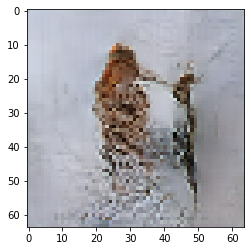

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 28

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6944971084594727 sec
Gen loss: 1.8765768816596584, Disc loss: 2.1561643261658516, Disc valid real loss: 0.3949144725736819, Disc valid fake loss: 0.3975807663641478, Disc class real loss: 0.6823073719677172, Disc class fake loss: 0.1438849615423303
Time for epoch 2 is 0.6983935832977295 sec
Gen loss: 1.9304226260436208, Disc loss: 2.1155745418448197, Disc valid real loss: 0.36939838842341777, Disc valid fake loss: 0.3993508502056724, Disc class real loss: 0.6748538111385546, Disc class fake loss: 0.13025913387537003
Time for epoch 3 is 0.6975300312042236 sec
Gen loss: 1.800420930511073, Disc loss: 2.0827363353026542, Disc valid real loss: 0.38638255470677424, Disc valid fake loss: 0.3974141776561737, Disc class real loss: 0.6517695815939653, Disc class fake loss: 0.13591948190802022
Time for epoch 4 is 0.6969594955444336 sec
Gen loss: 1.763506920714

Time for epoch 31 is 0.69685959815979 sec
Gen loss: 1.8383358403256065, Disc loss: 2.02200302324797, Disc valid real loss: 0.384069246681113, Disc valid fake loss: 0.382754490563744, Disc class real loss: 0.6545096447593287, Disc class fake loss: 0.16376774130683197
Time for epoch 32 is 0.6967272758483887 sec
Gen loss: 1.8843029800214266, Disc loss: 2.05638901810897, Disc valid real loss: 0.38843536533807455, Disc valid fake loss: 0.39000127190037776, Disc class real loss: 0.6673712793149447, Disc class fake loss: 0.16609701278962588
Time for epoch 33 is 0.6935393810272217 sec
Gen loss: 1.848265484759682, Disc loss: 2.10631095108233, Disc valid real loss: 0.3840002009743138, Disc valid fake loss: 0.40157904907276754, Disc class real loss: 0.6904658988902443, Disc class fake loss: 0.17552521197419418
Time for epoch 34 is 0.6982109546661377 sec
Gen loss: 1.9070511617158588, Disc loss: 2.032405376434326, Disc valid real loss: 0.3982005950651671, Disc valid fake loss: 0.40758099838307027, 

Time for epoch 62 is 0.6949167251586914 sec
Gen loss: 2.00375098931162, Disc loss: 2.046810695999547, Disc valid real loss: 0.4038478018421876, Disc valid fake loss: 0.39275216742565755, Disc class real loss: 0.6788625654421354, Disc class fake loss: 0.1929883776526702
Time for epoch 63 is 0.6937301158905029 sec
Gen loss: 1.8448213527077122, Disc loss: 2.0233569082460905, Disc valid real loss: 0.4030536483777197, Disc valid fake loss: 0.398621161517344, Disc class real loss: 0.6659681138239408, Disc class fake loss: 0.17588741332292557
Time for epoch 64 is 0.6964950561523438 sec
Gen loss: 1.76155686378479, Disc loss: 2.040898166204754, Disc valid real loss: 0.3814845822359386, Disc valid fake loss: 0.3940637990048057, Disc class real loss: 0.688009732647946, Disc class fake loss: 0.20365228190233833
Time for epoch 65 is 0.6921095848083496 sec
Gen loss: 1.8818001747131348, Disc loss: 2.0069258213043213, Disc valid real loss: 0.3765275196025246, Disc valid fake loss: 0.39113922338736684,

Time for epoch 93 is 0.6953563690185547 sec
Gen loss: 1.8976755330437107, Disc loss: 2.001370166477404, Disc valid real loss: 0.392243786862022, Disc valid fake loss: 0.41408072961004155, Disc class real loss: 0.6750659942626953, Disc class fake loss: 0.20914837482728457
Time for epoch 94 is 0.6991147994995117 sec
Gen loss: 1.9598928501731472, Disc loss: 1.9107596560528404, Disc valid real loss: 0.3916618871061425, Disc valid fake loss: 0.39781391150073003, Disc class real loss: 0.6405647302928724, Disc class fake loss: 0.1655419437508834
Time for epoch 95 is 0.6971526145935059 sec
Gen loss: 1.961508412110178, Disc loss: 1.967169956157082, Disc valid real loss: 0.4007571088640313, Disc valid fake loss: 0.3962019305480154, Disc class real loss: 0.6645418656499762, Disc class fake loss: 0.1974607941351439
Time for epoch 96 is 0.6948127746582031 sec
Gen loss: 1.880978684676321, Disc loss: 1.9996786807712756, Disc valid real loss: 0.41733751328367935, Disc valid fake loss: 0.39482609064955

Time for epoch 124 is 0.6978743076324463 sec
Gen loss: 1.9733648300170898, Disc loss: 1.8318622927916677, Disc valid real loss: 0.3848925217201835, Disc valid fake loss: 0.37670299567674337, Disc class real loss: 0.6370523007292497, Disc class fake loss: 0.1784065308931627
Time for epoch 125 is 0.6928448677062988 sec
Gen loss: 1.9495510678542287, Disc loss: 1.884827588733874, Disc valid real loss: 0.3793518747154035, Disc valid fake loss: 0.3922219119573894, Disc class real loss: 0.6669266537616128, Disc class fake loss: 0.1745907734883459
Time for epoch 126 is 0.6948378086090088 sec
Gen loss: 1.9834739408994977, Disc loss: 1.8676439460955168, Disc valid real loss: 0.38813045934626933, Disc valid fake loss: 0.3836564625564374, Disc class real loss: 0.65095632640939, Disc class fake loss: 0.19488468021154404
Time for epoch 127 is 0.6975815296173096 sec
Gen loss: 1.903039580897281, Disc loss: 1.8319408328909623, Disc valid real loss: 0.3926184349938443, Disc valid fake loss: 0.3689421085

Time for epoch 154 is 0.698387861251831 sec
Gen loss: 1.995753520413449, Disc loss: 1.7798890628312762, Disc valid real loss: 0.3801906375508559, Disc valid fake loss: 0.3668883662474783, Disc class real loss: 0.652396139345671, Disc class fake loss: 0.16014552351675534
Time for epoch 155 is 0.6929235458374023 sec
Gen loss: 1.9786580612784939, Disc loss: 1.8308903920023065, Disc valid real loss: 0.4028537924352445, Disc valid fake loss: 0.38579131270709793, Disc class real loss: 0.6513069366153917, Disc class fake loss: 0.18307355556048846
Time for epoch 156 is 0.6978240013122559 sec
Gen loss: 2.050438767985294, Disc loss: 1.8194250872260647, Disc valid real loss: 0.37423034718162135, Disc valid fake loss: 0.4027649179885262, Disc class real loss: 0.655109681581196, Disc class fake loss: 0.1766526224581819
Time for epoch 157 is 0.6956558227539062 sec
Gen loss: 2.2009268308940686, Disc loss: 1.8241062478015297, Disc valid real loss: 0.3769052310993797, Disc valid fake loss: 0.3825663900

Time for epoch 184 is 0.6949265003204346 sec
Gen loss: 2.007934488748249, Disc loss: 1.7568205971466868, Disc valid real loss: 0.385101003082175, Disc valid fake loss: 0.3888613001296395, Disc class real loss: 0.6578171739452764, Disc class fake loss: 0.15392772578879407
Time for epoch 185 is 0.6959576606750488 sec
Gen loss: 2.0218471665131417, Disc loss: 1.736097674620779, Disc valid real loss: 0.3850157433434537, Disc valid fake loss: 0.39510525527753326, Disc class real loss: 0.6417241127867448, Disc class fake loss: 0.14865573809335106
Time for epoch 186 is 0.6929070949554443 sec
Gen loss: 1.9132579376823025, Disc loss: 1.7732617353138171, Disc valid real loss: 0.4073585899252641, Disc valid fake loss: 0.4047806325711702, Disc class real loss: 0.6492201968243247, Disc class fake loss: 0.14400181860515945
Time for epoch 187 is 0.6948707103729248 sec
Gen loss: 1.9834617941003096, Disc loss: 1.8159274364772595, Disc valid real loss: 0.42403075255845724, Disc valid fake loss: 0.3883439

Time for epoch 214 is 0.6951780319213867 sec
Gen loss: 1.9731960547597784, Disc loss: 1.7572165602131893, Disc valid real loss: 0.3884300809157522, Disc valid fake loss: 0.39884555967230545, Disc class real loss: 0.6882975132841813, Disc class fake loss: 0.1591735082237344
Time for epoch 215 is 0.696073055267334 sec
Gen loss: 2.195928830849497, Disc loss: 1.6948901414871216, Disc valid real loss: 0.37121665791461345, Disc valid fake loss: 0.38389394942082855, Disc class real loss: 0.6630828631551642, Disc class fake loss: 0.16262513242269816
Time for epoch 216 is 0.6934945583343506 sec
Gen loss: 2.009283574003922, Disc loss: 1.6976697256690578, Disc valid real loss: 0.37739596476680354, Disc valid fake loss: 0.39929931414754766, Disc class real loss: 0.6677765218835128, Disc class fake loss: 0.13330952901589244
Time for epoch 217 is 0.6972379684448242 sec
Gen loss: 1.8607309868461208, Disc loss: 1.7068559056834172, Disc valid real loss: 0.3971766892232393, Disc valid fake loss: 0.40388

Time for epoch 244 is 0.6936652660369873 sec
Gen loss: 1.9758361327020746, Disc loss: 1.6496190711071617, Disc valid real loss: 0.4003404567116185, Disc valid fake loss: 0.37685903514686386, Disc class real loss: 0.6679338530490273, Disc class fake loss: 0.1392086360015367
Time for epoch 245 is 0.695305347442627 sec
Gen loss: 1.911570065899899, Disc loss: 1.636123814080891, Disc valid real loss: 0.39435679661600215, Disc valid fake loss: 0.3777434308277933, Disc class real loss: 0.6660660097473546, Disc class fake loss: 0.13418068991679893
Time for epoch 246 is 0.6964845657348633 sec
Gen loss: 1.9992998085523908, Disc loss: 1.6267542839050293, Disc valid real loss: 0.3988295715106161, Disc valid fake loss: 0.38817624590898814, Disc class real loss: 0.6388125639212759, Disc class fake loss: 0.14327514014746012
Time for epoch 247 is 0.694617748260498 sec
Gen loss: 2.02736791184074, Disc loss: 1.6300432368328697, Disc valid real loss: 0.37726769792406184, Disc valid fake loss: 0.401611597

Time for epoch 274 is 0.6984348297119141 sec
Gen loss: 1.99155761066236, Disc loss: 1.5126182531055652, Disc valid real loss: 0.38631948828697205, Disc valid fake loss: 0.3694233376728861, Disc class real loss: 0.6260036543795937, Disc class fake loss: 0.12306302315310429
Time for epoch 275 is 0.6948034763336182 sec
Gen loss: 2.0651293051870248, Disc loss: 1.60092494362279, Disc valid real loss: 0.39772031338591324, Disc valid fake loss: 0.38732013576909113, Disc class real loss: 0.6667025089263916, Disc class fake loss: 0.14295917867045654
Time for epoch 276 is 0.696075439453125 sec
Gen loss: 1.8842295031798513, Disc loss: 1.6219497919082642, Disc valid real loss: 0.3943160521356683, Disc valid fake loss: 0.39319994888807597, Disc class real loss: 0.694361084385922, Disc class fake loss: 0.13543072970289932
Time for epoch 277 is 0.6952619552612305 sec
Gen loss: 2.002292218961214, Disc loss: 1.5913987096987272, Disc valid real loss: 0.406013769538779, Disc valid fake loss: 0.3897665378

Time for epoch 304 is 0.6886146068572998 sec
Gen loss: 1.9484175882841412, Disc loss: 1.5757802348387868, Disc valid real loss: 0.4200592982141595, Disc valid fake loss: 0.39226430654525757, Disc class real loss: 0.6651705095642492, Disc class fake loss: 0.09839947600113719
Time for epoch 305 is 0.6948268413543701 sec
Gen loss: 1.8781703459589105, Disc loss: 1.6100862402664988, Disc valid real loss: 0.3835263220887435, Disc valid fake loss: 0.3870417726667304, Disc class real loss: 0.7014787071629575, Disc class fake loss: 0.1381521173997929
Time for epoch 306 is 0.6979479789733887 sec
Gen loss: 2.0330799190621627, Disc loss: 1.5818671866467124, Disc valid real loss: 0.3946615081084402, Disc valid fake loss: 0.3815524091846065, Disc class real loss: 0.6890949324557656, Disc class fake loss: 0.11667284134187196
Time for epoch 307 is 0.6985833644866943 sec
Gen loss: 2.0629019486276725, Disc loss: 1.5140813338129144, Disc valid real loss: 0.3983994440028542, Disc valid fake loss: 0.380512

Time for epoch 334 is 0.6961755752563477 sec
Gen loss: 2.035003141353005, Disc loss: 1.5621853627656634, Disc valid real loss: 0.4043617813210738, Disc valid fake loss: 0.37329140619227763, Disc class real loss: 0.6847082815672222, Disc class fake loss: 0.09994085838920191
Time for epoch 335 is 0.6974148750305176 sec
Gen loss: 1.9629433970702321, Disc loss: 1.5219992650182623, Disc valid real loss: 0.37306386938220576, Disc valid fake loss: 0.38919639430548014, Disc class real loss: 0.6373063953299272, Disc class fake loss: 0.12253558498464133
Time for epoch 336 is 0.6978919506072998 sec
Gen loss: 1.9716537563424361, Disc loss: 1.5987273705633063, Disc valid real loss: 0.3994157267244239, Disc valid fake loss: 0.395275321445967, Disc class real loss: 0.6856440995868883, Disc class fake loss: 0.11850566416978836
Time for epoch 337 is 0.6934096813201904 sec
Gen loss: 1.8850989090768915, Disc loss: 1.5911378609506708, Disc valid real loss: 0.37841116127214935, Disc valid fake loss: 0.4197

Time for epoch 364 is 0.6977214813232422 sec
Gen loss: 1.975155366094489, Disc loss: 1.5729256115461652, Disc valid real loss: 0.3860229026330145, Disc valid fake loss: 0.37611384376099233, Disc class real loss: 0.6864085009223536, Disc class fake loss: 0.12449277270781367
Time for epoch 365 is 0.693835973739624 sec
Gen loss: 1.9506704305347644, Disc loss: 1.5460307158921893, Disc valid real loss: 0.38716899329110194, Disc valid fake loss: 0.386239230632782, Disc class real loss: 0.6661254669490614, Disc class fake loss: 0.10660895509155173
Time for epoch 366 is 0.6958835124969482 sec
Gen loss: 1.926311825451098, Disc loss: 1.6171840178339105, Disc valid real loss: 0.40156929900771693, Disc valid fake loss: 0.4085451144921152, Disc class real loss: 0.6967544336068002, Disc class fake loss: 0.11043244168946617
Time for epoch 367 is 0.6921567916870117 sec
Gen loss: 1.9594818416394686, Disc loss: 1.5374706167923777, Disc valid real loss: 0.3840034713870601, Disc valid fake loss: 0.3953914

Time for epoch 394 is 0.6958198547363281 sec
Gen loss: 1.901763784257989, Disc loss: 1.5904959001039203, Disc valid real loss: 0.4003516074858214, Disc valid fake loss: 0.38294975145866994, Disc class real loss: 0.6776450495970877, Disc class fake loss: 0.12965910136699677
Time for epoch 395 is 0.6944386959075928 sec
Gen loss: 2.0142588678159212, Disc loss: 1.6088336455194574, Disc valid real loss: 0.38317182973811503, Disc valid fake loss: 0.40360238834431295, Disc class real loss: 0.718983138862409, Disc class fake loss: 0.10319949333605014
Time for epoch 396 is 0.6935374736785889 sec
Gen loss: 2.07170213523664, Disc loss: 1.5415596773749904, Disc valid real loss: 0.37589461709323685, Disc valid fake loss: 0.3887006922772056, Disc class real loss: 0.6713847361112896, Disc class fake loss: 0.10569281621198905
Time for epoch 397 is 0.698073148727417 sec
Gen loss: 1.9671775165357088, Disc loss: 1.5701947651411359, Disc valid real loss: 0.3939743857634695, Disc valid fake loss: 0.3815059

Time for epoch 424 is 0.6950094699859619 sec
Gen loss: 1.957325201285513, Disc loss: 1.5810946539828652, Disc valid real loss: 0.3848867494809, Disc valid fake loss: 0.40216718378819916, Disc class real loss: 0.6770380327576085, Disc class fake loss: 0.1171147088079076
Time for epoch 425 is 0.6987612247467041 sec
Gen loss: 2.0281010740681698, Disc loss: 1.5922730784667165, Disc valid real loss: 0.3994797923062977, Disc valid fake loss: 0.40123179084376287, Disc class real loss: 0.6592131068831996, Disc class fake loss: 0.13245377768027156
Time for epoch 426 is 0.69594407081604 sec
Gen loss: 1.9659965728458606, Disc loss: 1.5583118827719438, Disc valid real loss: 0.3829338534882194, Disc valid fake loss: 0.3707978419567409, Disc class real loss: 0.6784007361060694, Disc class fake loss: 0.12628989666700363
Time for epoch 427 is 0.6961410045623779 sec
Gen loss: 2.0436645118813765, Disc loss: 1.5492689609527588, Disc valid real loss: 0.38049647839445816, Disc valid fake loss: 0.3752715869

Time for epoch 454 is 0.6941602230072021 sec
Gen loss: 1.9369035896502043, Disc loss: 1.5917828647713912, Disc valid real loss: 0.40522040662012604, Disc valid fake loss: 0.39187476666350113, Disc class real loss: 0.6783988444428695, Disc class fake loss: 0.11640127238474395
Time for epoch 455 is 0.6970598697662354 sec
Gen loss: 1.9657388925552368, Disc loss: 1.5547197617982562, Disc valid real loss: 0.388649245626048, Disc valid fake loss: 0.39940320033776133, Disc class real loss: 0.6510239368990848, Disc class fake loss: 0.11575045083698474
Time for epoch 456 is 0.693878173828125 sec
Gen loss: 1.931984725751375, Disc loss: 1.5945585840626766, Disc valid real loss: 0.40940410996738236, Disc valid fake loss: 0.38220913786637156, Disc class real loss: 0.6701365960271735, Disc class fake loss: 0.1329162063959398
Time for epoch 457 is 0.6980695724487305 sec
Gen loss: 1.8849313070899563, Disc loss: 1.5794990941097862, Disc valid real loss: 0.41864488626781265, Disc valid fake loss: 0.3891

Time for epoch 484 is 0.6933937072753906 sec
Gen loss: 2.000770217493961, Disc loss: 1.5449349441026385, Disc valid real loss: 0.3705277639000039, Disc valid fake loss: 0.38981793899285166, Disc class real loss: 0.6697143222156324, Disc class fake loss: 0.11498591088150677
Time for epoch 485 is 0.6947164535522461 sec
Gen loss: 1.9841179220299971, Disc loss: 1.5960795377430164, Disc valid real loss: 0.38105481314031703, Disc valid fake loss: 0.3860457602300142, Disc class real loss: 0.7079005084539715, Disc class fake loss: 0.12119584138456144
Time for epoch 486 is 0.6972765922546387 sec
Gen loss: 1.982579413213228, Disc loss: 1.5513629097687571, Disc valid real loss: 0.3860428207799008, Disc valid fake loss: 0.3858800969625774, Disc class real loss: 0.65855641427793, Disc class fake loss: 0.12099111364468147
Time for epoch 487 is 0.6937816143035889 sec
Gen loss: 1.954816266110069, Disc loss: 1.564340309092873, Disc valid real loss: 0.38308805227279663, Disc valid fake loss: 0.395016320

Time for epoch 514 is 0.6933369636535645 sec
Gen loss: 1.9270947105006169, Disc loss: 1.587948767762435, Disc valid real loss: 0.38777785238466767, Disc valid fake loss: 0.4035788052960446, Disc class real loss: 0.6842352747917175, Disc class fake loss: 0.11247120581959423
Time for epoch 515 is 0.6955499649047852 sec
Gen loss: 1.9400473707600643, Disc loss: 1.5148924400931911, Disc valid real loss: 0.3721251174023277, Disc valid fake loss: 0.38271594047546387, Disc class real loss: 0.6671836470302782, Disc class fake loss: 0.09298261235419072
Time for epoch 516 is 0.6969408988952637 sec
Gen loss: 2.0885773269753707, Disc loss: 1.5669898735849481, Disc valid real loss: 0.38168636121247945, Disc valid fake loss: 0.38620106719042124, Disc class real loss: 0.6817690416386253, Disc class fake loss: 0.11744629454455878
Time for epoch 517 is 0.6938278675079346 sec
Gen loss: 1.9357625434273167, Disc loss: 1.5831544336519743, Disc valid real loss: 0.4026904074769271, Disc valid fake loss: 0.372

Time for epoch 544 is 0.7012834548950195 sec
Gen loss: 2.0602427909248755, Disc loss: 1.539112743578459, Disc valid real loss: 0.38608561534630625, Disc valid fake loss: 0.37870858531249196, Disc class real loss: 0.6464243029293261, Disc class fake loss: 0.1279979246227365
Time for epoch 545 is 0.6963107585906982 sec
Gen loss: 1.9070605729755603, Disc loss: 1.5486584964551424, Disc valid real loss: 0.37671929754708944, Disc valid fake loss: 0.406575913492002, Disc class real loss: 0.6488595165704426, Disc class fake loss: 0.1166102039186578
Time for epoch 546 is 0.7003040313720703 sec
Gen loss: 1.9437471126255237, Disc loss: 1.5922931746432656, Disc valid real loss: 0.39790316396637965, Disc valid fake loss: 0.4106216587518391, Disc class real loss: 0.6718982395372892, Disc class fake loss: 0.11198211265237708
Time for epoch 547 is 0.699899435043335 sec
Gen loss: 1.9972503059788753, Disc loss: 1.5584426490884078, Disc valid real loss: 0.3849841089625108, Disc valid fake loss: 0.3844841

Time for epoch 574 is 0.6966898441314697 sec
Gen loss: 2.021102045711718, Disc loss: 1.547762996272037, Disc valid real loss: 0.38791897108680323, Disc valid fake loss: 0.3731542362978584, Disc class real loss: 0.6967874200720536, Disc class fake loss: 0.09002374230246794
Time for epoch 575 is 0.6980762481689453 sec
Gen loss: 1.9738844193910297, Disc loss: 1.5646426677703857, Disc valid real loss: 0.3793520833316602, Disc valid fake loss: 0.38091274939085307, Disc class real loss: 0.690445065498352, Disc class fake loss: 0.114048071205616
Time for epoch 576 is 0.698206901550293 sec
Gen loss: 1.9847219366776316, Disc loss: 1.5779935686211837, Disc valid real loss: 0.399095030207383, Disc valid fake loss: 0.3892317163316827, Disc class real loss: 0.67890738499792, Disc class fake loss: 0.11087306177145556
Time for epoch 577 is 0.6964571475982666 sec
Gen loss: 1.9740753487536782, Disc loss: 1.5459860688761662, Disc valid real loss: 0.4031227372194591, Disc valid fake loss: 0.3684705370350

Time for epoch 604 is 0.6982321739196777 sec
Gen loss: 1.9680886394099186, Disc loss: 1.582695446516338, Disc valid real loss: 0.3909154612767069, Disc valid fake loss: 0.38618943252061544, Disc class real loss: 0.6913027794737565, Disc class fake loss: 0.1144031735235139
Time for epoch 605 is 0.6959676742553711 sec
Gen loss: 1.8759964328063161, Disc loss: 1.565475959526865, Disc valid real loss: 0.4022051268502286, Disc valid fake loss: 0.3956289746259388, Disc class real loss: 0.6478255077412254, Disc class fake loss: 0.1199219599366188
Time for epoch 606 is 0.696699857711792 sec
Gen loss: 1.953541441967613, Disc loss: 1.5772210798765485, Disc valid real loss: 0.38115078602966507, Disc valid fake loss: 0.40409337062584727, Disc class real loss: 0.686951778436962, Disc class fake loss: 0.10514150991251595
Time for epoch 607 is 0.6993038654327393 sec
Gen loss: 2.05201782678303, Disc loss: 1.6093052751139592, Disc valid real loss: 0.39050424098968506, Disc valid fake loss: 0.39573687471

Time for epoch 634 is 0.7021238803863525 sec
Gen loss: 1.9734929925517033, Disc loss: 1.5974617569070113, Disc valid real loss: 0.3832236465654875, Disc valid fake loss: 0.40532453436600535, Disc class real loss: 0.6946221652783846, Disc class fake loss: 0.1144074627051228
Time for epoch 635 is 0.7083573341369629 sec
Gen loss: 1.9635208719655086, Disc loss: 1.5676556762896086, Disc valid real loss: 0.38188301732665614, Disc valid fake loss: 0.371923776049363, Disc class real loss: 0.6902838506196675, Disc class fake loss: 0.12367838660353109
Time for epoch 636 is 0.6967458724975586 sec
Gen loss: 1.9180095258511995, Disc loss: 1.554807512383712, Disc valid real loss: 0.3866393824941234, Disc valid fake loss: 0.3852949189512353, Disc class real loss: 0.6745840122825221, Disc class fake loss: 0.10840245767643578
Time for epoch 637 is 0.7018871307373047 sec
Gen loss: 2.0233501697841443, Disc loss: 1.5744188522037708, Disc valid real loss: 0.4049479459461413, Disc valid fake loss: 0.3794780

Time for epoch 664 is 0.6993381977081299 sec
Gen loss: 1.9293649196624756, Disc loss: 1.5403867395300614, Disc valid real loss: 0.39590506804616826, Disc valid fake loss: 0.3812536314914101, Disc class real loss: 0.6726678045172441, Disc class fake loss: 0.09067666981565325
Time for epoch 665 is 0.7004165649414062 sec
Gen loss: 1.9751621359273006, Disc loss: 1.5290125984894603, Disc valid real loss: 0.3830243121636541, Disc valid fake loss: 0.3774008907769856, Disc class real loss: 0.6741031031859549, Disc class fake loss: 0.09460020986826796
Time for epoch 666 is 0.7000331878662109 sec
Gen loss: 1.9906032273643894, Disc loss: 1.518061217508818, Disc valid real loss: 0.3785696719822131, Disc valid fake loss: 0.38684535026550293, Disc class real loss: 0.6452170735911319, Disc class fake loss: 0.10753667668292397
Time for epoch 667 is 0.6955695152282715 sec
Gen loss: 2.078299459658171, Disc loss: 1.5634293305246454, Disc valid real loss: 0.38619202689120646, Disc valid fake loss: 0.38147

Time for epoch 694 is 0.699641227722168 sec
Gen loss: 1.9664153048866673, Disc loss: 1.5689623104898553, Disc valid real loss: 0.3827045308916192, Disc valid fake loss: 0.3860813912592436, Disc class real loss: 0.6709342347948175, Disc class fake loss: 0.12935048812314084
Time for epoch 695 is 0.6951518058776855 sec
Gen loss: 1.979768627568295, Disc loss: 1.5363993268263967, Disc valid real loss: 0.4028780774066323, Disc valid fake loss: 0.40391144313310323, Disc class real loss: 0.6412757791970906, Disc class fake loss: 0.08844459135281413
Time for epoch 696 is 0.699800968170166 sec
Gen loss: 1.9405149723354138, Disc loss: 1.5331426106001202, Disc valid real loss: 0.3916944359478198, Disc valid fake loss: 0.3938339995710473, Disc class real loss: 0.6640426704758092, Disc class fake loss: 0.08368757033818647
Time for epoch 697 is 0.6969945430755615 sec
Gen loss: 2.0078491662677966, Disc loss: 1.5835977541772943, Disc valid real loss: 0.38239716071831553, Disc valid fake loss: 0.3947350

Time for epoch 724 is 0.6958410739898682 sec
Gen loss: 1.9480158278816624, Disc loss: 1.563968997252615, Disc valid real loss: 0.38235806712978765, Disc valid fake loss: 0.39034457269467804, Disc class real loss: 0.6683228894283897, Disc class fake loss: 0.12305252901033352
Time for epoch 725 is 0.7004077434539795 sec
Gen loss: 2.049694619680706, Disc loss: 1.5346318483352661, Disc valid real loss: 0.36710931282294423, Disc valid fake loss: 0.38468462385629354, Disc class real loss: 0.6565638843335604, Disc class fake loss: 0.12638008927828387
Time for epoch 726 is 0.6942379474639893 sec
Gen loss: 2.060501506454066, Disc loss: 1.5432294983612864, Disc valid real loss: 0.3667075053641671, Disc valid fake loss: 0.3867233873982179, Disc class real loss: 0.6690665263878671, Disc class fake loss: 0.12084174960067398
Time for epoch 727 is 0.6950891017913818 sec
Gen loss: 2.025907742349725, Disc loss: 1.5596944156445955, Disc valid real loss: 0.37909715269741256, Disc valid fake loss: 0.39008

Time for epoch 754 is 0.6962294578552246 sec
Gen loss: 1.9348259850552207, Disc loss: 1.5493174916819523, Disc valid real loss: 0.37550715396278783, Disc valid fake loss: 0.3863058654885543, Disc class real loss: 0.6772920395198622, Disc class fake loss: 0.11032586819247196
Time for epoch 755 is 0.6973164081573486 sec
Gen loss: 1.8681376231344122, Disc loss: 1.591284049184699, Disc valid real loss: 0.4024235355226617, Disc valid fake loss: 0.39125072014959233, Disc class real loss: 0.692340119888908, Disc class fake loss: 0.1053870839900092
Time for epoch 756 is 0.700253963470459 sec
Gen loss: 2.010150206716437, Disc loss: 1.5896588375693874, Disc valid real loss: 0.398325756976479, Disc valid fake loss: 0.38906470411702204, Disc class real loss: 0.6805180656282526, Disc class fake loss: 0.12186204191101224
Time for epoch 757 is 0.7010488510131836 sec
Gen loss: 1.9519474506378174, Disc loss: 1.5411103901110197, Disc valid real loss: 0.38357311016634893, Disc valid fake loss: 0.39248724

Time for epoch 784 is 0.6953847408294678 sec
Gen loss: 1.9558516678057218, Disc loss: 1.5241734856053402, Disc valid real loss: 0.3846642829869923, Disc valid fake loss: 0.3729582711269981, Disc class real loss: 0.6507905188359713, Disc class fake loss: 0.11586739926746017
Time for epoch 785 is 0.6983311176300049 sec
Gen loss: 1.9631007972516512, Disc loss: 1.5860270638214915, Disc valid real loss: 0.3962286020580091, Disc valid fake loss: 0.39194273791815104, Disc class real loss: 0.684232379260816, Disc class fake loss: 0.11373748404807166
Time for epoch 786 is 0.6935803890228271 sec
Gen loss: 1.9362484655882184, Disc loss: 1.5665408184653835, Disc valid real loss: 0.38885605021526937, Disc valid fake loss: 0.39280994942313746, Disc class real loss: 0.6874548918322513, Disc class fake loss: 0.09753793360371339
Time for epoch 787 is 0.696558952331543 sec
Gen loss: 1.8907824315522845, Disc loss: 1.572236883012872, Disc valid real loss: 0.40161382367736415, Disc valid fake loss: 0.39786

Time for epoch 814 is 0.6988394260406494 sec
Gen loss: 1.9054945707321167, Disc loss: 1.5815795409051996, Disc valid real loss: 0.4195527450034493, Disc valid fake loss: 0.39903869126972397, Disc class real loss: 0.659151227850663, Disc class fake loss: 0.10394792023457979
Time for epoch 815 is 0.7002246379852295 sec
Gen loss: 1.882536166592648, Disc loss: 1.5886807943645276, Disc valid real loss: 0.4117148126426496, Disc valid fake loss: 0.36887967272808675, Disc class real loss: 0.7017995934737357, Disc class fake loss: 0.10640580265929825
Time for epoch 816 is 0.6988155841827393 sec
Gen loss: 1.9957369691447209, Disc loss: 1.5223279438520734, Disc valid real loss: 0.3779773821956233, Disc valid fake loss: 0.37196923478653554, Disc class real loss: 0.6777160826482271, Disc class fake loss: 0.09478182718157768
Time for epoch 817 is 0.6953234672546387 sec
Gen loss: 2.022098785952518, Disc loss: 1.556106818349738, Disc valid real loss: 0.38073389153731496, Disc valid fake loss: 0.389157

Time for epoch 844 is 0.695232629776001 sec
Gen loss: 1.985129343835931, Disc loss: 1.5626865876348395, Disc valid real loss: 0.37981484202962174, Disc valid fake loss: 0.3881730594133076, Disc class real loss: 0.6814634674473813, Disc class fake loss: 0.11334888970381335
Time for epoch 845 is 0.6984000205993652 sec
Gen loss: 1.9738257245013588, Disc loss: 1.5589588629572015, Disc valid real loss: 0.4151868522167206, Disc valid fake loss: 0.3926922067215568, Disc class real loss: 0.6651129597111752, Disc class fake loss: 0.08608268103317211
Time for epoch 846 is 0.6968672275543213 sec
Gen loss: 1.9476360647301925, Disc loss: 1.5535188787861873, Disc valid real loss: 0.3639627499015708, Disc valid fake loss: 0.4022991265121259, Disc class real loss: 0.6629232638760617, Disc class fake loss: 0.12444147016657026
Time for epoch 847 is 0.6970729827880859 sec
Gen loss: 1.8839850927654065, Disc loss: 1.5574104534952264, Disc valid real loss: 0.40528269974808945, Disc valid fake loss: 0.390452

Time for epoch 874 is 0.6954600811004639 sec
Gen loss: 2.0242404686777213, Disc loss: 1.5583163123381765, Disc valid real loss: 0.4037603014393857, Disc valid fake loss: 0.3750975257471988, Disc class real loss: 0.6755026139711079, Disc class fake loss: 0.1040701711256253
Time for epoch 875 is 0.6968448162078857 sec
Gen loss: 1.9185607245093899, Disc loss: 1.5613168666237278, Disc valid real loss: 0.37918711806598465, Disc valid fake loss: 0.40908608938518326, Disc class real loss: 0.6753725221282557, Disc class fake loss: 0.09778667633470736
Time for epoch 876 is 0.6988067626953125 sec
Gen loss: 1.9388649400911833, Disc loss: 1.5541383529964246, Disc valid real loss: 0.40057576016375895, Disc valid fake loss: 0.4016629567271785, Disc class real loss: 0.6578463221851149, Disc class fake loss: 0.09416604081266805
Time for epoch 877 is 0.6993358135223389 sec
Gen loss: 1.9972495530780994, Disc loss: 1.561828054879841, Disc valid real loss: 0.38662150345350565, Disc valid fake loss: 0.4104

Time for epoch 904 is 0.6931462287902832 sec
Gen loss: 1.9613319196199115, Disc loss: 1.5715384608820866, Disc valid real loss: 0.3978462627059535, Disc valid fake loss: 0.3878831063446246, Disc class real loss: 0.6678246385172794, Disc class fake loss: 0.1180944117276292
Time for epoch 905 is 0.6958551406860352 sec
Gen loss: 1.962551280071861, Disc loss: 1.5882115364074707, Disc valid real loss: 0.39090354975901154, Disc valid fake loss: 0.40564245299289103, Disc class real loss: 0.69324497172707, Disc class fake loss: 0.09853952417248174
Time for epoch 906 is 0.6951766014099121 sec
Gen loss: 2.000797252905996, Disc loss: 1.5422304994181584, Disc valid real loss: 0.36014080831879064, Disc valid fake loss: 0.38083149100604813, Disc class real loss: 0.687547809199283, Disc class fake loss: 0.11382516179429858
Time for epoch 907 is 0.696610689163208 sec
Gen loss: 1.9480509381545217, Disc loss: 1.5468635559082031, Disc valid real loss: 0.3843441636938798, Disc valid fake loss: 0.382301313

Time for epoch 934 is 0.6978878974914551 sec
Gen loss: 2.0220554000452946, Disc loss: 1.6078061994753385, Disc valid real loss: 0.37326486330283315, Disc valid fake loss: 0.3978764618697919, Disc class real loss: 0.6936196339757819, Disc class fake loss: 0.1431553555946601
Time for epoch 935 is 0.6967830657958984 sec
Gen loss: 1.9922288028817428, Disc loss: 1.5616272562428524, Disc valid real loss: 0.3985915074222966, Disc valid fake loss: 0.392616668814107, Disc class real loss: 0.6621622192232233, Disc class fake loss: 0.10836765287738097
Time for epoch 936 is 0.6961729526519775 sec
Gen loss: 2.008769850981863, Disc loss: 1.5691766048732556, Disc valid real loss: 0.3789697948255037, Disc valid fake loss: 0.3966024329787807, Disc class real loss: 0.676244252606442, Disc class fake loss: 0.11747190356254578
Time for epoch 937 is 0.6932086944580078 sec
Gen loss: 2.061636523196572, Disc loss: 1.5219579495881732, Disc valid real loss: 0.38560538072335093, Disc valid fake loss: 0.383660738

Time for epoch 964 is 0.6988263130187988 sec
Gen loss: 1.88204919037066, Disc loss: 1.5439887172297428, Disc valid real loss: 0.3795418802060579, Disc valid fake loss: 0.38689395785331726, Disc class real loss: 0.6779408517636751, Disc class fake loss: 0.09972768139682318
Time for epoch 965 is 0.6973259449005127 sec
Gen loss: 1.966926882141515, Disc loss: 1.4913779999080456, Disc valid real loss: 0.38060319737384196, Disc valid fake loss: 0.36373475037123026, Disc class real loss: 0.6531735721387362, Disc class fake loss: 0.09397833872782557
Time for epoch 966 is 0.6910078525543213 sec
Gen loss: 2.007591730669925, Disc loss: 1.5338383787556698, Disc valid real loss: 0.41382048004551936, Disc valid fake loss: 0.36835872813274984, Disc class real loss: 0.6534602736171923, Disc class fake loss: 0.09830993296284425
Time for epoch 967 is 0.6919221878051758 sec
Gen loss: 1.9805881286922253, Disc loss: 1.551864937732094, Disc valid real loss: 0.398048103639954, Disc valid fake loss: 0.3694330

Time for epoch 994 is 0.6962485313415527 sec
Gen loss: 1.9943725372615613, Disc loss: 1.6186740021956594, Disc valid real loss: 0.40787158828032644, Disc valid fake loss: 0.39081642031669617, Disc class real loss: 0.6888406715895, Disc class fake loss: 0.1312568771995996
Time for epoch 995 is 0.702282190322876 sec
Gen loss: 1.9189033382817318, Disc loss: 1.5794027290846173, Disc valid real loss: 0.40169865206668254, Disc valid fake loss: 0.3885118349602348, Disc class real loss: 0.6921123925008272, Disc class fake loss: 0.09719884552453693
Time for epoch 996 is 0.6977996826171875 sec
Gen loss: 1.9223867152866565, Disc loss: 1.5435850432044582, Disc valid real loss: 0.3843294444837068, Disc valid fake loss: 0.3995502732302013, Disc class real loss: 0.6490661909705714, Disc class fake loss: 0.11074681521246307
Time for epoch 997 is 0.6945738792419434 sec
Gen loss: 1.9535113635816073, Disc loss: 1.5884740038921958, Disc valid real loss: 0.3929486627641477, Disc valid fake loss: 0.39499327

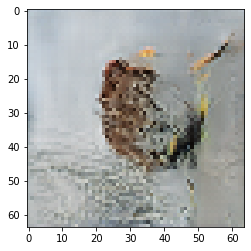

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 29

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6970300674438477 sec
Gen loss: 1.938708418294003, Disc loss: 2.1240790392223157, Disc valid real loss: 0.37545112402815567, Disc valid fake loss: 0.42801255144571004, Disc class real loss: 0.660757303237915, Disc class fake loss: 0.1058207250347263
Time for epoch 2 is 0.6994271278381348 sec
Gen loss: 1.8899174614956504, Disc loss: 2.119345658703854, Disc valid real loss: 0.384803244942113, Disc valid fake loss: 0.39832587932285507, Disc class real loss: 0.6695583964649, Disc class fake loss: 0.12116718409877074
Time for epoch 3 is 0.6985011100769043 sec
Gen loss: 1.8807079917506169, Disc loss: 2.069642700647053, Disc valid real loss: 0.37992554589321736, Disc valid fake loss: 0.38102519982739497, Disc class real loss: 0.6566513149361861, Disc class fake loss: 0.13526082215340515
Time for epoch 4 is 0.697213888168335 sec
Gen loss: 1.8032365096242804,

Time for epoch 31 is 0.6988117694854736 sec
Gen loss: 1.895416071540431, Disc loss: 2.0486183166503906, Disc valid real loss: 0.3958233579208976, Disc valid fake loss: 0.3924919806028667, Disc class real loss: 0.657665701288926, Disc class fake loss: 0.15642762576278887
Time for epoch 32 is 0.6996791362762451 sec
Gen loss: 1.810868733807614, Disc loss: 2.063377775644001, Disc valid real loss: 0.40289152766528885, Disc valid fake loss: 0.3810380022776754, Disc class real loss: 0.6681820091448332, Disc class fake loss: 0.16598500311374664
Time for epoch 33 is 0.7003011703491211 sec
Gen loss: 1.7650791532114933, Disc loss: 2.0490917218358895, Disc valid real loss: 0.3931138342932651, Disc valid fake loss: 0.38986224563498245, Disc class real loss: 0.6628518543745342, Disc class fake loss: 0.15283455268332832
Time for epoch 34 is 0.6986582279205322 sec
Gen loss: 1.9081872576161434, Disc loss: 2.062010871736627, Disc valid real loss: 0.3718346435772745, Disc valid fake loss: 0.4108640379027

Time for epoch 62 is 0.6951100826263428 sec
Gen loss: 1.857200158269782, Disc loss: 2.0056447418112504, Disc valid real loss: 0.3916796539959155, Disc valid fake loss: 0.3995100322522615, Disc class real loss: 0.6631073951721191, Disc class fake loss: 0.15810985902422353
Time for epoch 63 is 0.6988248825073242 sec
Gen loss: 1.7892888909892033, Disc loss: 1.9586541276229055, Disc valid real loss: 0.3853654516370673, Disc valid fake loss: 0.3992150770990472, Disc class real loss: 0.6371894698393973, Disc class fake loss: 0.19115706533193588
Time for epoch 64 is 0.694080114364624 sec
Gen loss: 1.8556752769570601, Disc loss: 1.965446164733485, Disc valid real loss: 0.3952941329855668, Disc valid fake loss: 0.40572237654736165, Disc class real loss: 0.6316545166467366, Disc class fake loss: 0.19907181670791224
Time for epoch 65 is 0.6903378963470459 sec
Gen loss: 1.949997538014462, Disc loss: 2.0091365513048673, Disc valid real loss: 0.3824419692942971, Disc valid fake loss: 0.3828835346196

Time for epoch 93 is 0.7009122371673584 sec
Gen loss: 1.8743907401436253, Disc loss: 1.9259972258618003, Disc valid real loss: 0.40490706657108505, Disc valid fake loss: 0.400932335539868, Disc class real loss: 0.6389159340607492, Disc class fake loss: 0.16540814622452385
Time for epoch 94 is 0.6976926326751709 sec
Gen loss: 1.877137905672977, Disc loss: 1.9225348108693172, Disc valid real loss: 0.4038507640361786, Disc valid fake loss: 0.39031676320653214, Disc class real loss: 0.6409062272623965, Disc class fake loss: 0.18483920669869372
Time for epoch 95 is 0.6976509094238281 sec
Gen loss: 1.8980074368025128, Disc loss: 1.9584105579476607, Disc valid real loss: 0.4133451439832386, Disc valid fake loss: 0.38381449015516983, Disc class real loss: 0.6659607448075947, Disc class fake loss: 0.16418620473460147
Time for epoch 96 is 0.6959707736968994 sec
Gen loss: 1.8618202962373431, Disc loss: 1.8890221432635659, Disc valid real loss: 0.39824347433290985, Disc valid fake loss: 0.40389975

Time for epoch 123 is 0.6988968849182129 sec
Gen loss: 1.9567986726760864, Disc loss: 1.8571745345467014, Disc valid real loss: 0.3978112104691957, Disc valid fake loss: 0.39006209844037104, Disc class real loss: 0.6447407634634721, Disc class fake loss: 0.14536229442608983
Time for epoch 124 is 0.6986708641052246 sec
Gen loss: 1.8854512038983797, Disc loss: 1.8488918354636745, Disc valid real loss: 0.39249277114868164, Disc valid fake loss: 0.3795333614474849, Disc class real loss: 0.6454100985276071, Disc class fake loss: 0.16396472799150566
Time for epoch 125 is 0.6962249279022217 sec
Gen loss: 1.909529397362157, Disc loss: 1.8643726612392224, Disc valid real loss: 0.3734929294962632, Disc valid fake loss: 0.38024210616161946, Disc class real loss: 0.6666837083665949, Disc class fake loss: 0.16959151664846822
Time for epoch 126 is 0.6983098983764648 sec
Gen loss: 1.9694232187773053, Disc loss: 1.8552771555749994, Disc valid real loss: 0.39524703276784795, Disc valid fake loss: 0.400

Time for epoch 153 is 0.7026338577270508 sec
Gen loss: 1.932129652876603, Disc loss: 1.8097340370479382, Disc valid real loss: 0.391012241965846, Disc valid fake loss: 0.3796016620962243, Disc class real loss: 0.6566028532228971, Disc class fake loss: 0.15728727022283956
Time for epoch 154 is 0.7198994159698486 sec
Gen loss: 1.951195572551928, Disc loss: 1.806966367520784, Disc valid real loss: 0.3828179875486775, Disc valid fake loss: 0.3969078158077441, Disc class real loss: 0.6444477156588906, Disc class fake loss: 0.1707920204651983
Time for epoch 155 is 0.7024188041687012 sec
Gen loss: 1.9426312823044627, Disc loss: 1.8181544228603965, Disc valid real loss: 0.385344712357772, Disc valid fake loss: 0.4031409197732022, Disc class real loss: 0.6503923566717851, Disc class fake loss: 0.1628262898639629
Time for epoch 156 is 0.703850269317627 sec
Gen loss: 1.9778839036038047, Disc loss: 1.7878596782684326, Disc valid real loss: 0.39000134248482554, Disc valid fake loss: 0.3939325354601

Time for epoch 183 is 0.6968016624450684 sec
Gen loss: 1.9786888360977173, Disc loss: 1.7510269754811336, Disc valid real loss: 0.387112516321634, Disc valid fake loss: 0.377771562651584, Disc class real loss: 0.6702046017897757, Disc class fake loss: 0.1309378727486259
Time for epoch 184 is 0.6955742835998535 sec
Gen loss: 1.9258804446772526, Disc loss: 1.7421182644994635, Disc valid real loss: 0.3814730942249298, Disc valid fake loss: 0.38562229746266413, Disc class real loss: 0.6478427742656908, Disc class fake loss: 0.16234558663870158
Time for epoch 185 is 0.6924688816070557 sec
Gen loss: 1.9522373550816585, Disc loss: 1.7144357656177722, Disc valid real loss: 0.39160753080719396, Disc valid fake loss: 0.38853090138811813, Disc class real loss: 0.6404657112924677, Disc class fake loss: 0.11845565253966733
Time for epoch 186 is 0.6974227428436279 sec
Gen loss: 1.9881295655903064, Disc loss: 1.7275982405010022, Disc valid real loss: 0.37580261575548274, Disc valid fake loss: 0.39770

Time for epoch 213 is 0.6966044902801514 sec
Gen loss: 1.8506242476011578, Disc loss: 1.718855619430542, Disc valid real loss: 0.386183657928517, Disc valid fake loss: 0.3968846829313981, Disc class real loss: 0.6716366723964089, Disc class fake loss: 0.13888489102062426
Time for epoch 214 is 0.6955854892730713 sec
Gen loss: 1.8980222814961483, Disc loss: 1.6742378096831472, Disc valid real loss: 0.38822085920133087, Disc valid fake loss: 0.3995903636279859, Disc class real loss: 0.6278893602521796, Disc class fake loss: 0.14723716009604304
Time for epoch 215 is 0.6983058452606201 sec
Gen loss: 2.039331417334707, Disc loss: 1.7549615220019692, Disc valid real loss: 0.4278670078829715, Disc valid fake loss: 0.39829900390223455, Disc class real loss: 0.6654691162862276, Disc class fake loss: 0.14462116948868098
Time for epoch 216 is 0.6959412097930908 sec
Gen loss: 1.9124340571855243, Disc loss: 1.717185754525034, Disc valid real loss: 0.3957629297908984, Disc valid fake loss: 0.39105940

Time for epoch 243 is 0.6980457305908203 sec
Gen loss: 1.993122659231487, Disc loss: 1.6331115019948859, Disc valid real loss: 0.3820451325491855, Disc valid fake loss: 0.3855119504426655, Disc class real loss: 0.6677528776620564, Disc class fake loss: 0.12941007022010653
Time for epoch 244 is 0.6942923069000244 sec
Gen loss: 2.0268445579629195, Disc loss: 1.6271075010299683, Disc valid real loss: 0.39228236753689616, Disc valid fake loss: 0.3744263178423831, Disc class real loss: 0.664693252036446, Disc class fake loss: 0.12961702950690923
Time for epoch 245 is 0.6960351467132568 sec
Gen loss: 1.973614253495869, Disc loss: 1.5611374252720882, Disc valid real loss: 0.38812408008073507, Disc valid fake loss: 0.35788212089162125, Disc class real loss: 0.6449978571189078, Disc class fake loss: 0.10548051132967598
Time for epoch 246 is 0.6969733238220215 sec
Gen loss: 1.9882803778899343, Disc loss: 1.6808723085804989, Disc valid real loss: 0.3809994427781356, Disc valid fake loss: 0.422996

Time for epoch 273 is 0.6940844058990479 sec
Gen loss: 1.9044531772011204, Disc loss: 1.6295504068073474, Disc valid real loss: 0.40125377084079544, Disc valid fake loss: 0.4125433877894753, Disc class real loss: 0.7004935584570232, Disc class fake loss: 0.1038863425584216
Time for epoch 274 is 0.6973519325256348 sec
Gen loss: 2.0685568232285347, Disc loss: 1.5576759451314022, Disc valid real loss: 0.38726412936260823, Disc valid fake loss: 0.3929759138508847, Disc class real loss: 0.6599503034039548, Disc class fake loss: 0.10895026239909623
Time for epoch 275 is 0.6956849098205566 sec
Gen loss: 1.9821547269821167, Disc loss: 1.515810671605562, Disc valid real loss: 0.3673291857305326, Disc valid fake loss: 0.36602835906179326, Disc class real loss: 0.6611383306352716, Disc class fake loss: 0.11481467163876484
Time for epoch 276 is 0.6964662075042725 sec
Gen loss: 1.9735390449825085, Disc loss: 1.5619139357617027, Disc valid real loss: 0.38184836663697896, Disc valid fake loss: 0.4056

Time for epoch 303 is 0.6945345401763916 sec
Gen loss: 1.9916677914167706, Disc loss: 1.5617400784241526, Disc valid real loss: 0.380256230893888, Disc valid fake loss: 0.39332909019369827, Disc class real loss: 0.6731337465737995, Disc class fake loss: 0.1151326034022005
Time for epoch 304 is 0.6961069107055664 sec
Gen loss: 1.9598161107615422, Disc loss: 1.5552759672466077, Disc valid real loss: 0.390636019016567, Disc valid fake loss: 0.40016767382621765, Disc class real loss: 0.6448385684113753, Disc class fake loss: 0.11973875957100015
Time for epoch 305 is 0.6978991031646729 sec
Gen loss: 1.9383441962693866, Disc loss: 1.5909761064930965, Disc valid real loss: 0.4112204721099452, Disc valid fake loss: 0.40214089657130997, Disc class real loss: 0.6764793866559079, Disc class fake loss: 0.1012504032175792
Time for epoch 306 is 0.6973443031311035 sec
Gen loss: 1.9954535710184198, Disc loss: 1.581521893802442, Disc valid real loss: 0.3865061072926772, Disc valid fake loss: 0.38671475

Time for epoch 333 is 0.6954514980316162 sec
Gen loss: 1.9500577512540316, Disc loss: 1.534900935072648, Disc valid real loss: 0.3866852772863288, Disc valid fake loss: 0.3870471653185393, Disc class real loss: 0.6695281737729123, Disc class fake loss: 0.09175591621744006
Time for epoch 334 is 0.6978018283843994 sec
Gen loss: 1.9364074154904014, Disc loss: 1.5726851287641024, Disc valid real loss: 0.39904287300611796, Disc valid fake loss: 0.4051069805496617, Disc class real loss: 0.6569821960047671, Disc class fake loss: 0.1116621533506795
Time for epoch 335 is 0.6953489780426025 sec
Gen loss: 2.074981501227931, Disc loss: 1.5317605796613192, Disc valid real loss: 0.3773354338972192, Disc valid fake loss: 0.40461512145243195, Disc class real loss: 0.6671807546364633, Disc class fake loss: 0.0827461849702032
Time for epoch 336 is 0.6974639892578125 sec
Gen loss: 1.9212258175799721, Disc loss: 1.546704744037829, Disc valid real loss: 0.39405280351638794, Disc valid fake loss: 0.37687848

Time for epoch 363 is 0.698601484298706 sec
Gen loss: 1.9286597088763588, Disc loss: 1.513485218349256, Disc valid real loss: 0.405414049562655, Disc valid fake loss: 0.37922213893187673, Disc class real loss: 0.638011141827232, Disc class fake loss: 0.09094729568613202
Time for epoch 364 is 0.6964528560638428 sec
Gen loss: 1.9862394081918817, Disc loss: 1.536973470135739, Disc valid real loss: 0.40580305300260844, Disc valid fake loss: 0.39951872041350917, Disc class real loss: 0.639884773053621, Disc class fake loss: 0.09187653190211247
Time for epoch 365 is 0.6951019763946533 sec
Gen loss: 2.1032824767263314, Disc loss: 1.5955770141200016, Disc valid real loss: 0.3962272531107852, Disc valid fake loss: 0.3907435904992254, Disc class real loss: 0.680255629514393, Disc class fake loss: 0.12846093566009872
Time for epoch 366 is 0.697746753692627 sec
Gen loss: 2.099406361579895, Disc loss: 1.5683964553632235, Disc valid real loss: 0.36436488440162257, Disc valid fake loss: 0.41358633417

Time for epoch 393 is 0.6941626071929932 sec
Gen loss: 1.920115401870326, Disc loss: 1.5749418045345105, Disc valid real loss: 0.4017476047340192, Disc valid fake loss: 0.39683548086567927, Disc class real loss: 0.6618837180890536, Disc class fake loss: 0.11458446340341318
Time for epoch 394 is 0.6925475597381592 sec
Gen loss: 1.951023453160336, Disc loss: 1.5500715657284385, Disc valid real loss: 0.3768777564952248, Disc valid fake loss: 0.3965036335744356, Disc class real loss: 0.6660305073386744, Disc class fake loss: 0.11077073216438293
Time for epoch 395 is 0.6972002983093262 sec
Gen loss: 1.9505208228763782, Disc loss: 1.5480484836979915, Disc valid real loss: 0.4241862814677389, Disc valid fake loss: 0.37002542144373846, Disc class real loss: 0.6647253663916337, Disc class fake loss: 0.089226534786193
Time for epoch 396 is 0.6967720985412598 sec
Gen loss: 1.963831443535654, Disc loss: 1.5913179234454506, Disc valid real loss: 0.4004755506390019, Disc valid fake loss: 0.382885718

Time for epoch 423 is 0.6966581344604492 sec
Gen loss: 1.9530302913565385, Disc loss: 1.5781112909317017, Disc valid real loss: 0.3601526821914472, Disc valid fake loss: 0.4109185432132922, Disc class real loss: 0.6980600451168261, Disc class fake loss: 0.1090978340883004
Time for epoch 424 is 0.6980957984924316 sec
Gen loss: 2.0502091897161385, Disc loss: 1.5625603512713784, Disc valid real loss: 0.4098827791841407, Disc valid fake loss: 0.37922978087475423, Disc class real loss: 0.667901032849362, Disc class fake loss: 0.10565923566096708
Time for epoch 425 is 0.6964497566223145 sec
Gen loss: 1.9165903392590975, Disc loss: 1.5466600405542474, Disc valid real loss: 0.3821743789472078, Disc valid fake loss: 0.39601091962111623, Disc class real loss: 0.675438338204434, Disc class fake loss: 0.09315287027704089
Time for epoch 426 is 0.6959004402160645 sec
Gen loss: 1.9220244131590192, Disc loss: 1.558162250016865, Disc valid real loss: 0.39429014607479695, Disc valid fake loss: 0.3774655

Time for epoch 453 is 0.6956791877746582 sec
Gen loss: 1.8973834389134456, Disc loss: 1.5682025645908557, Disc valid real loss: 0.3951241562241002, Disc valid fake loss: 0.38700845367030096, Disc class real loss: 0.6714089261858087, Disc class fake loss: 0.11477236096796237
Time for epoch 454 is 0.6971321105957031 sec
Gen loss: 1.9390539119118138, Disc loss: 1.5768680258801109, Disc valid real loss: 0.40648644692019414, Disc valid fake loss: 0.40161514909643875, Disc class real loss: 0.6597484256091871, Disc class fake loss: 0.10912816226482391
Time for epoch 455 is 0.6955554485321045 sec
Gen loss: 1.955749555637962, Disc loss: 1.5805348973525197, Disc valid real loss: 0.39878789060994196, Disc valid fake loss: 0.39987533970883016, Disc class real loss: 0.669184989050815, Disc class fake loss: 0.11279797436375368
Time for epoch 456 is 0.6947593688964844 sec
Gen loss: 1.9843062915300067, Disc loss: 1.5657859350505627, Disc valid real loss: 0.38282498874162374, Disc valid fake loss: 0.39

Time for epoch 483 is 0.7007098197937012 sec
Gen loss: 2.1109292381688167, Disc loss: 1.527801469752663, Disc valid real loss: 0.3918198990194421, Disc valid fake loss: 0.38339782231732417, Disc class real loss: 0.6223375389450475, Disc class fake loss: 0.13034461340621897
Time for epoch 484 is 0.6959934234619141 sec
Gen loss: 2.038381526344701, Disc loss: 1.5467693868436312, Disc valid real loss: 0.38253925191728694, Disc valid fake loss: 0.38586151599884033, Disc class real loss: 0.6838946624806053, Disc class fake loss: 0.09459181384820688
Time for epoch 485 is 0.6968307495117188 sec
Gen loss: 1.9562558186681647, Disc loss: 1.5288289848126864, Disc valid real loss: 0.3766112578542609, Disc valid fake loss: 0.3913894405490474, Disc class real loss: 0.6380046574692977, Disc class fake loss: 0.12292664321629625
Time for epoch 486 is 0.7013778686523438 sec
Gen loss: 2.1681618000331677, Disc loss: 1.562389285940873, Disc valid real loss: 0.3926373657427336, Disc valid fake loss: 0.392872

Time for epoch 513 is 0.6955280303955078 sec
Gen loss: 1.8649365400013171, Disc loss: 1.5536555302770514, Disc valid real loss: 0.37321042230254725, Disc valid fake loss: 0.3900708948311053, Disc class real loss: 0.68474049630918, Disc class fake loss: 0.1057495368938697
Time for epoch 514 is 0.6950874328613281 sec
Gen loss: 2.059383749961853, Disc loss: 1.5691973786605031, Disc valid real loss: 0.39870959206631307, Disc valid fake loss: 0.3908195017199767, Disc class real loss: 0.6774041338970787, Disc class fake loss: 0.10237916696228479
Time for epoch 515 is 0.6994738578796387 sec
Gen loss: 2.1443685355939364, Disc loss: 1.598362778362475, Disc valid real loss: 0.3917696585780696, Disc valid fake loss: 0.40594282824742167, Disc class real loss: 0.6912005104516682, Disc class fake loss: 0.10956613582215811
Time for epoch 516 is 0.6949975490570068 sec
Gen loss: 1.9587585361380326, Disc loss: 1.628192336935746, Disc valid real loss: 0.3959819031389136, Disc valid fake loss: 0.419786203

Time for epoch 543 is 0.6924746036529541 sec
Gen loss: 1.883288866595218, Disc loss: 1.5385326147079468, Disc valid real loss: 0.39336522158823517, Disc valid fake loss: 0.38584751361294795, Disc class real loss: 0.6699162345183524, Disc class fake loss: 0.089519728171198
Time for epoch 544 is 0.6953272819519043 sec
Gen loss: 1.9402208390988802, Disc loss: 1.6038719101956016, Disc valid real loss: 0.4098843006711257, Disc valid fake loss: 0.38246274778717443, Disc class real loss: 0.6971459325991178, Disc class fake loss: 0.11449548121737807
Time for epoch 545 is 0.6966280937194824 sec
Gen loss: 1.9701645813490216, Disc loss: 1.5307058848832782, Disc valid real loss: 0.385883861466458, Disc valid fake loss: 0.38636265146104914, Disc class real loss: 0.646166632049962, Disc class fake loss: 0.1123995118235287
Time for epoch 546 is 0.6940457820892334 sec
Gen loss: 2.038144174375032, Disc loss: 1.5484345523934615, Disc valid real loss: 0.3842251873330066, Disc valid fake loss: 0.390093796

Time for epoch 573 is 0.6964576244354248 sec
Gen loss: 1.8700706456836902, Disc loss: 1.5239074857611405, Disc valid real loss: 0.38463787342372696, Disc valid fake loss: 0.39278117528087214, Disc class real loss: 0.6402716197465596, Disc class fake loss: 0.10632362314744999
Time for epoch 574 is 0.6976103782653809 sec
Gen loss: 2.0162351382406136, Disc loss: 1.5412343552238064, Disc valid real loss: 0.3899654651943006, Disc valid fake loss: 0.36467209066215317, Disc class real loss: 0.6805174915414107, Disc class fake loss: 0.10619419636695009
Time for epoch 575 is 0.6978805065155029 sec
Gen loss: 1.8615677168494777, Disc loss: 1.5819151464261507, Disc valid real loss: 0.39240768081263494, Disc valid fake loss: 0.3961111040491807, Disc class real loss: 0.7050669036413494, Disc class fake loss: 0.08845281032355208
Time for epoch 576 is 0.6954994201660156 sec
Gen loss: 1.9503247926109715, Disc loss: 1.5755750944739895, Disc valid real loss: 0.40361051182997854, Disc valid fake loss: 0.3

Time for epoch 603 is 0.6942019462585449 sec
Gen loss: 2.004083777728834, Disc loss: 1.5296619942313747, Disc valid real loss: 0.3999251158613908, Disc valid fake loss: 0.3968311014928316, Disc class real loss: 0.6475039438197487, Disc class fake loss: 0.0855142540837589
Time for epoch 604 is 0.6901636123657227 sec
Gen loss: 1.9129172438069393, Disc loss: 1.570995481390702, Disc valid real loss: 0.4042730190252003, Disc valid fake loss: 0.3924912292706339, Disc class real loss: 0.6706941378744025, Disc class fake loss: 0.10365052658476327
Time for epoch 605 is 0.6932015419006348 sec
Gen loss: 1.9589563482686092, Disc loss: 1.5775118564304553, Disc valid real loss: 0.376900923879523, Disc valid fake loss: 0.4004893538198973, Disc class real loss: 0.6848870515823364, Disc class fake loss: 0.11534846103505085
Time for epoch 606 is 0.6928374767303467 sec
Gen loss: 2.002844728921589, Disc loss: 1.5409187643151534, Disc valid real loss: 0.3944139880569358, Disc valid fake loss: 0.38716087372

Time for epoch 633 is 0.6898882389068604 sec
Gen loss: 1.94051782708419, Disc loss: 1.512808228793897, Disc valid real loss: 0.3587361095767272, Disc valid fake loss: 0.38083992192619726, Disc class real loss: 0.6824969210122761, Disc class fake loss: 0.0908536118896384
Time for epoch 634 is 0.6884372234344482 sec
Gen loss: 1.9087704482831453, Disc loss: 1.5781599847893966, Disc valid real loss: 0.39712931294190257, Disc valid fake loss: 0.3928983980103543, Disc class real loss: 0.6936215507356744, Disc class fake loss: 0.0946305421622176
Time for epoch 635 is 0.6889684200286865 sec
Gen loss: 1.9625631508074308, Disc loss: 1.5491209281118292, Disc valid real loss: 0.3693236896866246, Disc valid fake loss: 0.40817078791166606, Disc class real loss: 0.6714726592365065, Disc class fake loss: 0.10026806200805463
Time for epoch 636 is 0.6897892951965332 sec
Gen loss: 1.9403567125922756, Disc loss: 1.5789016485214233, Disc valid real loss: 0.36829810864047, Disc valid fake loss: 0.3984701970

Time for epoch 663 is 0.6946535110473633 sec
Gen loss: 1.9353605759771246, Disc loss: 1.545780715189482, Disc valid real loss: 0.37767518821515533, Disc valid fake loss: 0.39760650772797435, Disc class real loss: 0.6765100077578896, Disc class fake loss: 0.0941055060217255
Time for epoch 664 is 0.6951568126678467 sec
Gen loss: 1.985592195862218, Disc loss: 1.5614674154080843, Disc valid real loss: 0.37793939050875214, Disc valid fake loss: 0.4032513609057979, Disc class real loss: 0.6768321332178617, Disc class fake loss: 0.10355918854475021
Time for epoch 665 is 0.6935098171234131 sec
Gen loss: 1.9401371416292692, Disc loss: 1.5617507947118658, Disc valid real loss: 0.39763409526724564, Disc valid fake loss: 0.3907758483761235, Disc class real loss: 0.6636136236943697, Disc class fake loss: 0.10983797966649658
Time for epoch 666 is 0.6949708461761475 sec
Gen loss: 1.9511613720341732, Disc loss: 1.5322377807215641, Disc valid real loss: 0.3930035484464545, Disc valid fake loss: 0.40397

Time for epoch 693 is 0.6948511600494385 sec
Gen loss: 1.8847021742870933, Disc loss: 1.5545644822873568, Disc valid real loss: 0.3899780315788169, Disc valid fake loss: 0.37758276337071467, Disc class real loss: 0.6785682659400137, Disc class fake loss: 0.10854946233724293
Time for epoch 694 is 0.6936979293823242 sec
Gen loss: 1.9749139233639366, Disc loss: 1.5316051119252254, Disc valid real loss: 0.3732143467978427, Disc valid fake loss: 0.3813588038871163, Disc class real loss: 0.6891622417851498, Disc class fake loss: 0.08798996515964207
Time for epoch 695 is 0.6957228183746338 sec
Gen loss: 2.0004607815491524, Disc loss: 1.5751522152047408, Disc valid real loss: 0.3768821452793322, Disc valid fake loss: 0.3944599769617382, Disc class real loss: 0.6824052522056981, Disc class fake loss: 0.12151704630569408
Time for epoch 696 is 0.6933403015136719 sec
Gen loss: 1.940074412446273, Disc loss: 1.5222430793862594, Disc valid real loss: 0.3579399287700653, Disc valid fake loss: 0.380212

Time for epoch 723 is 0.6962060928344727 sec
Gen loss: 1.974613541050961, Disc loss: 1.6278663936414217, Disc valid real loss: 0.3882708384802467, Disc valid fake loss: 0.38816328111447784, Disc class real loss: 0.6942238054777446, Disc class fake loss: 0.1573158931967459
Time for epoch 724 is 0.694594144821167 sec
Gen loss: 1.911520750899064, Disc loss: 1.5600167575635409, Disc valid real loss: 0.4044596286196458, Disc valid fake loss: 0.3807803141443353, Disc class real loss: 0.6715995418398004, Disc class fake loss: 0.10329092842967887
Time for epoch 725 is 0.6960649490356445 sec
Gen loss: 1.9525846933063709, Disc loss: 1.5223866199192249, Disc valid real loss: 0.39809210833750275, Disc valid fake loss: 0.38000193708821345, Disc class real loss: 0.625215116300081, Disc class fake loss: 0.11917866844879954
Time for epoch 726 is 0.6909339427947998 sec
Gen loss: 1.9221428507252742, Disc loss: 1.5378711600052684, Disc valid real loss: 0.3766226988089712, Disc valid fake loss: 0.38061356

Time for epoch 753 is 0.6934278011322021 sec
Gen loss: 2.0312211388035823, Disc loss: 1.5475073299909894, Disc valid real loss: 0.37883680274612025, Disc valid fake loss: 0.38044995226358114, Disc class real loss: 0.6756376749590823, Disc class fake loss: 0.11269549515686537
Time for epoch 754 is 0.6952633857727051 sec
Gen loss: 1.99058619298433, Disc loss: 1.5899400083642257, Disc valid real loss: 0.38234265070212514, Disc valid fake loss: 0.4014212928320232, Disc class real loss: 0.7064752327768427, Disc class fake loss: 0.0998221833847071
Time for epoch 755 is 0.6942095756530762 sec
Gen loss: 1.974748511063425, Disc loss: 1.5771325575677972, Disc valid real loss: 0.39364330941124964, Disc valid fake loss: 0.40537717311005844, Disc class real loss: 0.6838823964721278, Disc class fake loss: 0.09434759793312926
Time for epoch 756 is 0.6918988227844238 sec
Gen loss: 1.894571774884274, Disc loss: 1.5497830227801674, Disc valid real loss: 0.39653591262666804, Disc valid fake loss: 0.39865

Time for epoch 783 is 0.6944518089294434 sec
Gen loss: 1.8758428284996433, Disc loss: 1.635581650232014, Disc valid real loss: 0.40870110925875214, Disc valid fake loss: 0.4086056288919951, Disc class real loss: 0.7130185993094194, Disc class fake loss: 0.10537782978070409
Time for epoch 784 is 0.6941678524017334 sec
Gen loss: 1.9220253166399504, Disc loss: 1.5442144808016325, Disc valid real loss: 0.3775981398005235, Disc valid fake loss: 0.38174647563382197, Disc class real loss: 0.680218944424077, Disc class fake loss: 0.10476602908027799
Time for epoch 785 is 0.6945385932922363 sec
Gen loss: 1.9828634073859768, Disc loss: 1.5501534436878406, Disc valid real loss: 0.4034069494197243, Disc valid fake loss: 0.3898330801411679, Disc class real loss: 0.663463765069058, Disc class fake loss: 0.09356364607810974
Time for epoch 786 is 0.6931471824645996 sec
Gen loss: 1.9680523119474713, Disc loss: 1.5546604081204063, Disc valid real loss: 0.37731513851567317, Disc valid fake loss: 0.379097

Time for epoch 813 is 0.6976499557495117 sec
Gen loss: 2.004410643326609, Disc loss: 1.5539118239754124, Disc valid real loss: 0.383548378944397, Disc valid fake loss: 0.3943364345713666, Disc class real loss: 0.663984333214007, Disc class fake loss: 0.11215309230120558
Time for epoch 814 is 0.696479082107544 sec
Gen loss: 1.9573462072171663, Disc loss: 1.5320514377794767, Disc valid real loss: 0.37857559009602193, Disc valid fake loss: 0.38385293671959325, Disc class real loss: 0.6831776405635633, Disc class fake loss: 0.0865646363481095
Time for epoch 815 is 0.6981897354125977 sec
Gen loss: 1.9698581883781834, Disc loss: 1.526454680844357, Disc valid real loss: 0.3919050364117873, Disc valid fake loss: 0.37853940144965526, Disc class real loss: 0.6584962967195009, Disc class fake loss: 0.09762613142007276
Time for epoch 816 is 0.6962687969207764 sec
Gen loss: 1.9347786840639616, Disc loss: 1.5394092170815719, Disc valid real loss: 0.38237523718884114, Disc valid fake loss: 0.39067005

Time for epoch 843 is 0.705834150314331 sec
Gen loss: 1.9845158300901715, Disc loss: 1.604708709214863, Disc valid real loss: 0.3943905775484286, Disc valid fake loss: 0.39779736180054515, Disc class real loss: 0.7242486853348581, Disc class fake loss: 0.08839927692162364
Time for epoch 844 is 0.6942260265350342 sec
Gen loss: 1.8827406983626516, Disc loss: 1.5418527941954763, Disc valid real loss: 0.387956639653758, Disc valid fake loss: 0.3875935360005027, Disc class real loss: 0.6686160972243861, Disc class fake loss: 0.09780071264034823
Time for epoch 845 is 0.6937375068664551 sec
Gen loss: 1.9330295136100368, Disc loss: 1.5419022158572548, Disc valid real loss: 0.3867635656344263, Disc valid fake loss: 0.3799116627166146, Disc class real loss: 0.6720173170692042, Disc class fake loss: 0.10332343139146503
Time for epoch 846 is 0.6942987442016602 sec
Gen loss: 1.9048900227797658, Disc loss: 1.5670736212479441, Disc valid real loss: 0.3967902942707664, Disc valid fake loss: 0.37414860

Time for epoch 873 is 0.689873218536377 sec
Gen loss: 1.9072385838157253, Disc loss: 1.593387942565115, Disc valid real loss: 0.3907841475386369, Disc valid fake loss: 0.37865248479341207, Disc class real loss: 0.7156223780230472, Disc class fake loss: 0.10845036079224787
Time for epoch 874 is 0.6934969425201416 sec
Gen loss: 2.012218431422585, Disc loss: 1.5455392222655446, Disc valid real loss: 0.41199772138344615, Disc valid fake loss: 0.3691141903400421, Disc class real loss: 0.6664709542926989, Disc class fake loss: 0.0980700713239218
Time for epoch 875 is 0.6895513534545898 sec
Gen loss: 1.9692143264569735, Disc loss: 1.5698085772363763, Disc valid real loss: 0.4179132910151231, Disc valid fake loss: 0.37002242709461014, Disc class real loss: 0.6784036112459082, Disc class fake loss: 0.10358423563210588
Time for epoch 876 is 0.6939551830291748 sec
Gen loss: 1.9238993054942082, Disc loss: 1.5423814497495953, Disc valid real loss: 0.4026796504070884, Disc valid fake loss: 0.3796513

Time for epoch 903 is 0.6929061412811279 sec
Gen loss: 1.920557411093461, Disc loss: 1.5700228527972573, Disc valid real loss: 0.3922179278574492, Disc valid fake loss: 0.40648460074474935, Disc class real loss: 0.6803618544026425, Disc class fake loss: 0.09107634287915732
Time for epoch 904 is 0.6954038143157959 sec
Gen loss: 1.9372383481577824, Disc loss: 1.5800680549521195, Disc valid real loss: 0.38512301052871506, Disc valid fake loss: 0.3974841237068176, Disc class real loss: 0.6924666009451214, Disc class fake loss: 0.10511180444767601
Time for epoch 905 is 0.696556806564331 sec
Gen loss: 1.9414606596294202, Disc loss: 1.5678448112387406, Disc valid real loss: 0.4041540418800555, Disc valid fake loss: 0.38284978741093684, Disc class real loss: 0.6736019692922893, Disc class fake loss: 0.10735230539974414
Time for epoch 906 is 0.6961517333984375 sec
Gen loss: 1.9477406489221674, Disc loss: 1.5875403190913953, Disc valid real loss: 0.39987748390749883, Disc valid fake loss: 0.3706

Time for epoch 933 is 0.6951608657836914 sec
Gen loss: 1.9304114831121344, Disc loss: 1.5910840599160445, Disc valid real loss: 0.38287947366112157, Disc valid fake loss: 0.40869081804626867, Disc class real loss: 0.683679715583199, Disc class fake loss: 0.11594760476758606
Time for epoch 934 is 0.6971256732940674 sec
Gen loss: 2.157642414695338, Disc loss: 1.551896521919652, Disc valid real loss: 0.4009314132364173, Disc valid fake loss: 0.37146225885341044, Disc class real loss: 0.6748429787786383, Disc class fake loss: 0.10477390924566671
Time for epoch 935 is 0.6923580169677734 sec
Gen loss: 2.067441890114232, Disc loss: 1.5887691472706043, Disc valid real loss: 0.38586559577992086, Disc valid fake loss: 0.40538450918699565, Disc class real loss: 0.6767682558611819, Disc class fake loss: 0.12086199655344612
Time for epoch 936 is 0.6968450546264648 sec
Gen loss: 1.954360754866349, Disc loss: 1.541892039148431, Disc valid real loss: 0.36784833826516805, Disc valid fake loss: 0.396391

Time for epoch 963 is 0.6953339576721191 sec
Gen loss: 1.9640793925837468, Disc loss: 1.5896221273823787, Disc valid real loss: 0.40607462901818125, Disc valid fake loss: 0.40092591862929494, Disc class real loss: 0.6860306953129015, Disc class fake loss: 0.09670876437111904
Time for epoch 964 is 0.6948184967041016 sec
Gen loss: 1.8968598905362581, Disc loss: 1.5280910981328863, Disc valid real loss: 0.3916380625022085, Disc valid fake loss: 0.3893656181661706, Disc class real loss: 0.656547486782074, Disc class fake loss: 0.09065309892359533
Time for epoch 965 is 0.6966869831085205 sec
Gen loss: 1.9634958442888761, Disc loss: 1.5948280535246198, Disc valid real loss: 0.4045799892199667, Disc valid fake loss: 0.3859046054513831, Disc class real loss: 0.6886531930220755, Disc class fake loss: 0.115804838506799
Time for epoch 966 is 0.6970067024230957 sec
Gen loss: 1.9239797905871743, Disc loss: 1.507783619981063, Disc valid real loss: 0.37888413510824503, Disc valid fake loss: 0.3921540

Time for epoch 993 is 0.6966152191162109 sec
Gen loss: 2.002909785822818, Disc loss: 1.532385688079031, Disc valid real loss: 0.37833935022354126, Disc valid fake loss: 0.36570095859075846, Disc class real loss: 0.6746810564869329, Disc class fake loss: 0.11377651479683425
Time for epoch 994 is 0.6948757171630859 sec
Gen loss: 1.9548678523615788, Disc loss: 1.557661156905325, Disc valid real loss: 0.3986892825678775, Disc valid fake loss: 0.3926604672482139, Disc class real loss: 0.6803112594704879, Disc class fake loss: 0.08611899947649554
Time for epoch 995 is 0.6977167129516602 sec
Gen loss: 1.9273039855455096, Disc loss: 1.5367549281371267, Disc valid real loss: 0.40029449839341014, Disc valid fake loss: 0.3942415980916274, Disc class real loss: 0.6564503563077826, Disc class fake loss: 0.08588260725924843
Time for epoch 996 is 0.6950161457061768 sec
Gen loss: 1.9027920647671348, Disc loss: 1.554786531548751, Disc valid real loss: 0.4003564025226392, Disc valid fake loss: 0.3969177

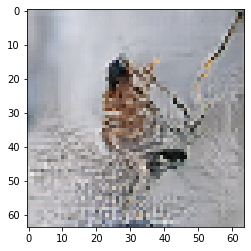

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 30

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6925415992736816 sec
Gen loss: 1.9990434081930863, Disc loss: 2.0865939918317293, Disc valid real loss: 0.3966831768813886, Disc valid fake loss: 0.39162163357985647, Disc class real loss: 0.6495911353512814, Disc class fake loss: 0.10752817204124049
Time for epoch 2 is 0.6967511177062988 sec
Gen loss: 1.9368591936011064, Disc loss: 2.0663005991985925, Disc valid real loss: 0.391191923304608, Disc valid fake loss: 0.3879455327987671, Disc class real loss: 0.6450413779208535, Disc class fake loss: 0.09388738468681511
Time for epoch 3 is 0.7018887996673584 sec
Gen loss: 1.9293207683061298, Disc loss: 2.122736384994105, Disc valid real loss: 0.4071521461009979, Disc valid fake loss: 0.38144976841775996, Disc class real loss: 0.6695224674124467, Disc class fake loss: 0.11789220551911153
Time for epoch 4 is 0.6973159313201904 sec
Gen loss: 1.775070911959

Time for epoch 31 is 0.696927547454834 sec
Gen loss: 1.8995868783248098, Disc loss: 2.118151727475618, Disc valid real loss: 0.41803872506869466, Disc valid fake loss: 0.37213907273192154, Disc class real loss: 0.692673943544689, Disc class fake loss: 0.16936321870276802
Time for epoch 32 is 0.6945652961730957 sec
Gen loss: 1.9219704991892765, Disc loss: 2.065145825084887, Disc valid real loss: 0.3913459040616688, Disc valid fake loss: 0.37658615175046417, Disc class real loss: 0.6776130387657567, Disc class fake loss: 0.16571104840228432
Time for epoch 33 is 0.6956162452697754 sec
Gen loss: 1.8443028738624172, Disc loss: 2.0851828550037586, Disc valid real loss: 0.3976689153595975, Disc valid fake loss: 0.393050270645242, Disc class real loss: 0.6782648657497606, Disc class fake loss: 0.14725890245876813
Time for epoch 34 is 0.6933152675628662 sec
Gen loss: 1.8192424648686458, Disc loss: 2.1006455421447754, Disc valid real loss: 0.39318904280662537, Disc valid fake loss: 0.41535100654

Time for epoch 62 is 0.6950807571411133 sec
Gen loss: 1.8244637627350657, Disc loss: 1.9936565537201731, Disc valid real loss: 0.40049591503645243, Disc valid fake loss: 0.3994579660265069, Disc class real loss: 0.6502351604009929, Disc class fake loss: 0.16772176874311348
Time for epoch 63 is 0.6966025829315186 sec
Gen loss: 1.8956399089411686, Disc loss: 1.9880206898639077, Disc valid real loss: 0.40687712556437444, Disc valid fake loss: 0.3826719663645092, Disc class real loss: 0.653081122197603, Disc class fake loss: 0.17426448864372154
Time for epoch 64 is 0.6963961124420166 sec
Gen loss: 1.8808360162534212, Disc loss: 1.9959209216268439, Disc valid real loss: 0.4076451110212426, Disc valid fake loss: 0.38339788349051224, Disc class real loss: 0.659955664684898, Disc class fake loss: 0.1565076669580058
Time for epoch 65 is 0.6972866058349609 sec
Gen loss: 1.8278708771655434, Disc loss: 1.968403502514488, Disc valid real loss: 0.40067784252919647, Disc valid fake loss: 0.4074645685

Time for epoch 93 is 0.6938550472259521 sec
Gen loss: 1.850161822218644, Disc loss: 1.9256045755587126, Disc valid real loss: 0.3885264459409212, Disc valid fake loss: 0.3895428478717804, Disc class real loss: 0.65070830207122, Disc class fake loss: 0.1884447630298765
Time for epoch 94 is 0.6974520683288574 sec
Gen loss: 1.8544845141862567, Disc loss: 1.9513331024270308, Disc valid real loss: 0.3959599388273139, Disc valid fake loss: 0.38671206643706874, Disc class real loss: 0.6688036730414942, Disc class fake loss: 0.16672488223565252
Time for epoch 95 is 0.695016622543335 sec
Gen loss: 1.9304492473602295, Disc loss: 1.928778980907641, Disc valid real loss: 0.3795606431208159, Disc valid fake loss: 0.3694974199721688, Disc class real loss: 0.6764350094293293, Disc class fake loss: 0.1672606009401773
Time for epoch 96 is 0.6926355361938477 sec
Gen loss: 1.9022270566538761, Disc loss: 1.963764002448634, Disc valid real loss: 0.40814739936276484, Disc valid fake loss: 0.3979236514944779

Time for epoch 123 is 0.6957721710205078 sec
Gen loss: 1.896837121561954, Disc loss: 1.8567174171146594, Disc valid real loss: 0.40711363836338643, Disc valid fake loss: 0.38297651786553233, Disc class real loss: 0.6412828470531263, Disc class fake loss: 0.15147187560796738
Time for epoch 124 is 0.6950392723083496 sec
Gen loss: 1.9528911364705939, Disc loss: 1.8824523373654014, Disc valid real loss: 0.379599602598893, Disc valid fake loss: 0.3985576268873717, Disc class real loss: 0.6633878193403545, Disc class fake loss: 0.16284788321507604
Time for epoch 125 is 0.6936907768249512 sec
Gen loss: 1.9287939510847394, Disc loss: 1.8372742816021568, Disc valid real loss: 0.37914741980402095, Disc valid fake loss: 0.383427536801288, Disc class real loss: 0.6535359087743258, Disc class fake loss: 0.13500090884534935
Time for epoch 126 is 0.6938817501068115 sec
Gen loss: 1.9021739332299483, Disc loss: 1.8486940045105784, Disc valid real loss: 0.3774776207773309, Disc valid fake loss: 0.376513

Time for epoch 153 is 0.7038969993591309 sec
Gen loss: 2.031251731671785, Disc loss: 1.8067431324406673, Disc valid real loss: 0.36434421884386164, Disc valid fake loss: 0.37660810665080424, Disc class real loss: 0.6700614565297177, Disc class fake loss: 0.1703121501364206
Time for epoch 154 is 0.7010300159454346 sec
Gen loss: 1.9596062584927207, Disc loss: 1.8048161644684642, Disc valid real loss: 0.40737192881734746, Disc valid fake loss: 0.389858835621884, Disc class real loss: 0.6412662550022727, Disc class fake loss: 0.1436680390646583
Time for epoch 155 is 0.6981046199798584 sec
Gen loss: 1.9688890231283087, Disc loss: 1.7784020900726318, Disc valid real loss: 0.3947438519251974, Disc valid fake loss: 0.3804373584295574, Disc class real loss: 0.6403547933227137, Disc class fake loss: 0.14132611884882576
Time for epoch 156 is 0.6937506198883057 sec
Gen loss: 1.9463562212492291, Disc loss: 1.8211248234698647, Disc valid real loss: 0.3967951645976619, Disc valid fake loss: 0.4005949

Time for epoch 183 is 0.6998248100280762 sec
Gen loss: 1.997793015680815, Disc loss: 1.7075403489564593, Disc valid real loss: 0.3937929460876866, Disc valid fake loss: 0.3758709352267416, Disc class real loss: 0.6311354197953877, Disc class fake loss: 0.13726391721712916
Time for epoch 184 is 0.7139196395874023 sec
Gen loss: 1.9676873432962518, Disc loss: 1.7531508646513287, Disc valid real loss: 0.36954859055970846, Disc valid fake loss: 0.4094144137282121, Disc class real loss: 0.6587724905265006, Disc class fake loss: 0.1388558792440515
Time for epoch 185 is 0.6992440223693848 sec
Gen loss: 2.0566007965489437, Disc loss: 1.7426326651322215, Disc valid real loss: 0.377607933784786, Disc valid fake loss: 0.39008796058203044, Disc class real loss: 0.6696691764028448, Disc class fake loss: 0.1209351290997706
Time for epoch 186 is 0.6976602077484131 sec
Gen loss: 1.9786508585277356, Disc loss: 1.715958833694458, Disc valid real loss: 0.38458552956581116, Disc valid fake loss: 0.38856152

Time for epoch 213 is 0.6947658061981201 sec
Gen loss: 1.921296151060807, Disc loss: 1.7344965872011686, Disc valid real loss: 0.4140501288991225, Disc valid fake loss: 0.4194825181835576, Disc class real loss: 0.6548307161582144, Disc class fake loss: 0.12054439947793358
Time for epoch 214 is 0.6991610527038574 sec
Gen loss: 1.9522699368627447, Disc loss: 1.6567834176515277, Disc valid real loss: 0.37098233166493866, Disc valid fake loss: 0.39771181031277303, Disc class real loss: 0.6435031075226633, Disc class fake loss: 0.12445126787612312
Time for epoch 215 is 0.7008154392242432 sec
Gen loss: 1.8706621747267873, Disc loss: 1.7239887463419061, Disc valid real loss: 0.39309493491524145, Disc valid fake loss: 0.40557240655547694, Disc class real loss: 0.6910698068769354, Disc class fake loss: 0.09941475799209193
Time for epoch 216 is 0.696709156036377 sec
Gen loss: 1.9852067357615422, Disc loss: 1.7358988774450201, Disc valid real loss: 0.4165949821472168, Disc valid fake loss: 0.3936

Time for epoch 243 is 0.6948471069335938 sec
Gen loss: 1.9003241940548545, Disc loss: 1.6442250264318365, Disc valid real loss: 0.4068651764016402, Disc valid fake loss: 0.3904254075727965, Disc class real loss: 0.677217257650275, Disc class fake loss: 0.0958432884592759
Time for epoch 244 is 0.6954305171966553 sec
Gen loss: 1.9419696268282438, Disc loss: 1.664366646816856, Disc valid real loss: 0.40130345288075897, Disc valid fake loss: 0.39314298096456024, Disc class real loss: 0.6768106598603097, Disc class fake loss: 0.12496633376730115
Time for epoch 245 is 0.6977896690368652 sec
Gen loss: 1.9640819210755198, Disc loss: 1.646655183089407, Disc valid real loss: 0.39342475878564936, Disc valid fake loss: 0.4049066509071149, Disc class real loss: 0.6639539003372192, Disc class fake loss: 0.11899437716132716
Time for epoch 246 is 0.6962714195251465 sec
Gen loss: 2.0640615224838257, Disc loss: 1.581717660552577, Disc valid real loss: 0.37686730529132645, Disc valid fake loss: 0.3903086

Time for epoch 273 is 0.6947770118713379 sec
Gen loss: 1.9972365216204995, Disc loss: 1.5748497247695923, Disc valid real loss: 0.3973041451291034, Disc valid fake loss: 0.39519646450092916, Disc class real loss: 0.6504559736502799, Disc class fake loss: 0.12177660512296777
Time for epoch 274 is 0.6977479457855225 sec
Gen loss: 1.965140374083268, Disc loss: 1.5697242711719714, Disc valid real loss: 0.4107943302706668, Disc valid fake loss: 0.3761994336780749, Disc class real loss: 0.651542161640368, Disc class fake loss: 0.12293320266824019
Time for epoch 275 is 0.6970293521881104 sec
Gen loss: 1.9881967368878817, Disc loss: 1.5495158559397648, Disc valid real loss: 0.38930684328079224, Disc valid fake loss: 0.3952140855161767, Disc class real loss: 0.653425439407951, Disc class fake loss: 0.10504085296078731
Time for epoch 276 is 0.692936897277832 sec
Gen loss: 1.9585791387056048, Disc loss: 1.5780491891660189, Disc valid real loss: 0.3990375932894255, Disc valid fake loss: 0.39642558

Time for epoch 303 is 0.6992950439453125 sec
Gen loss: 1.955749367412768, Disc loss: 1.5473012045810097, Disc valid real loss: 0.39151454599280106, Disc valid fake loss: 0.379298912851434, Disc class real loss: 0.6734613619352642, Disc class fake loss: 0.10314048983548817
Time for epoch 304 is 0.6976170539855957 sec
Gen loss: 1.9167125225067139, Disc loss: 1.5638540669491416, Disc valid real loss: 0.3769527203158328, Disc valid fake loss: 0.40238671396908005, Disc class real loss: 0.6613430412192094, Disc class fake loss: 0.12327919704349417
Time for epoch 305 is 0.6968178749084473 sec
Gen loss: 1.9747191416589838, Disc loss: 1.5232193093550832, Disc valid real loss: 0.3802577876730969, Disc valid fake loss: 0.40371933265736226, Disc class real loss: 0.6463933492961683, Disc class fake loss: 0.0929595614342313
Time for epoch 306 is 0.697843074798584 sec
Gen loss: 2.0037942497353805, Disc loss: 1.5255348745145296, Disc valid real loss: 0.38625099941303853, Disc valid fake loss: 0.372971

Time for epoch 333 is 0.6970212459564209 sec
Gen loss: 1.9340733540685553, Disc loss: 1.53391190579063, Disc valid real loss: 0.38529688276742635, Disc valid fake loss: 0.3789814255739513, Disc class real loss: 0.6715570594135084, Disc class fake loss: 0.09819120580428525
Time for epoch 334 is 0.6948833465576172 sec
Gen loss: 1.9380897597262734, Disc loss: 1.608157051237006, Disc valid real loss: 0.4091957650686565, Disc valid fake loss: 0.4083548329378429, Disc class real loss: 0.6655917795080888, Disc class fake loss: 0.1251227800783358
Time for epoch 335 is 0.6936500072479248 sec
Gen loss: 1.9185103993666799, Disc loss: 1.590867324879295, Disc valid real loss: 0.3958969178952669, Disc valid fake loss: 0.40522971435597066, Disc class real loss: 0.6892646770728262, Disc class fake loss: 0.10059378021641781
Time for epoch 336 is 0.698958158493042 sec
Gen loss: 1.9939776784495304, Disc loss: 1.5702490681096126, Disc valid real loss: 0.4126100555846566, Disc valid fake loss: 0.3700426581

Time for epoch 363 is 0.6988418102264404 sec
Gen loss: 1.9626015550211857, Disc loss: 1.59847681145919, Disc valid real loss: 0.4048302063816472, Disc valid fake loss: 0.39722274871248947, Disc class real loss: 0.6869808686406988, Disc class fake loss: 0.10955847329215
Time for epoch 364 is 0.6982758045196533 sec
Gen loss: 1.98943209020715, Disc loss: 1.5403570689653094, Disc valid real loss: 0.3885785764769504, Disc valid fake loss: 0.3986304167069887, Disc class real loss: 0.6634851192173205, Disc class fake loss: 0.0897777141316941
Time for epoch 365 is 0.6954061985015869 sec
Gen loss: 1.9495681963468854, Disc loss: 1.488149555105912, Disc valid real loss: 0.3857668144138236, Disc valid fake loss: 0.3669523596763611, Disc class real loss: 0.6452675587252567, Disc class fake loss: 0.09027386946897757
Time for epoch 366 is 0.6979501247406006 sec
Gen loss: 1.9805044374967877, Disc loss: 1.5323437138607627, Disc valid real loss: 0.3891652257818925, Disc valid fake loss: 0.38679545647219

Time for epoch 393 is 0.6976499557495117 sec
Gen loss: 2.057664814748262, Disc loss: 1.5132060615639937, Disc valid real loss: 0.37745629251003265, Disc valid fake loss: 0.3888701522036603, Disc class real loss: 0.6459425154485201, Disc class fake loss: 0.10104610143523467
Time for epoch 394 is 0.6996164321899414 sec
Gen loss: 2.136531848656504, Disc loss: 1.5601396937119334, Disc valid real loss: 0.37687188700625773, Disc valid fake loss: 0.371853055138337, Disc class real loss: 0.6941573055166947, Disc class fake loss: 0.11737283221200893
Time for epoch 395 is 0.692988395690918 sec
Gen loss: 2.015814498851174, Disc loss: 1.5612468719482422, Disc valid real loss: 0.4014546730016407, Disc valid fake loss: 0.38665317861657394, Disc class real loss: 0.6660407593375758, Disc class fake loss: 0.1072100444059623
Time for epoch 396 is 0.6987969875335693 sec
Gen loss: 1.893386251048038, Disc loss: 1.5271626710891724, Disc valid real loss: 0.3635858077751963, Disc valid fake loss: 0.4005873328

Time for epoch 423 is 0.6976382732391357 sec
Gen loss: 1.947563372160259, Disc loss: 1.5621039490950734, Disc valid real loss: 0.3950657515149367, Disc valid fake loss: 0.40394093802100733, Disc class real loss: 0.6748760687677484, Disc class fake loss: 0.08833851959360273
Time for epoch 424 is 0.6978302001953125 sec
Gen loss: 1.9247661013352244, Disc loss: 1.5699918646561473, Disc valid real loss: 0.4102709340421777, Disc valid fake loss: 0.3952031229671679, Disc class real loss: 0.6746422052383423, Disc class fake loss: 0.08999252260515564
Time for epoch 425 is 0.697702169418335 sec
Gen loss: 1.9219594754670795, Disc loss: 1.5434943814026683, Disc valid real loss: 0.38963391749482407, Disc valid fake loss: 0.389519475008312, Disc class real loss: 0.6550186464661046, Disc class fake loss: 0.10943145951942394
Time for epoch 426 is 0.6987707614898682 sec
Gen loss: 1.9109509179466648, Disc loss: 1.5131438594115407, Disc valid real loss: 0.37281403102372823, Disc valid fake loss: 0.385491

Time for epoch 453 is 0.695796012878418 sec
Gen loss: 2.0469793708700883, Disc loss: 1.5256091293535734, Disc valid real loss: 0.38215273148135137, Disc valid fake loss: 0.37836354970932007, Disc class real loss: 0.6816696963812175, Disc class fake loss: 0.08354277810768078
Time for epoch 454 is 0.7000577449798584 sec
Gen loss: 1.9994426589263112, Disc loss: 1.5449385831230564, Disc valid real loss: 0.39057070252142456, Disc valid fake loss: 0.3795467677869295, Disc class real loss: 0.6706938225972024, Disc class fake loss: 0.10424063531191725
Time for epoch 455 is 0.6941518783569336 sec
Gen loss: 1.9586624597248279, Disc loss: 1.5441940458197343, Disc valid real loss: 0.39472186094836187, Disc valid fake loss: 0.38227339010489614, Disc class real loss: 0.6593694655518783, Disc class fake loss: 0.10793964055023696
Time for epoch 456 is 0.6971290111541748 sec
Gen loss: 1.9236718290730526, Disc loss: 1.5321724603050633, Disc valid real loss: 0.38066461603892476, Disc valid fake loss: 0.3

Time for epoch 483 is 0.6972310543060303 sec
Gen loss: 1.942134273679633, Disc loss: 1.5716683425401385, Disc valid real loss: 0.4236836511837809, Disc valid fake loss: 0.396946519613266, Disc class real loss: 0.6695000592030977, Disc class fake loss: 0.08165568466249265
Time for epoch 484 is 0.6985762119293213 sec
Gen loss: 2.109425996479235, Disc loss: 1.5318968609759682, Disc valid real loss: 0.40439079388191823, Disc valid fake loss: 0.37883317627404867, Disc class real loss: 0.651194879883214, Disc class fake loss: 0.09758874303416203
Time for epoch 485 is 0.6985466480255127 sec
Gen loss: 1.911598707500257, Disc loss: 1.5745711954016435, Disc valid real loss: 0.403994819051341, Disc valid fake loss: 0.390475365676378, Disc class real loss: 0.6746506753720736, Disc class fake loss: 0.10556416801716152
Time for epoch 486 is 0.6957926750183105 sec
Gen loss: 1.9300463136873747, Disc loss: 1.5280670617756091, Disc valid real loss: 0.360163655720259, Disc valid fake loss: 0.416664947020

Time for epoch 513 is 0.6979916095733643 sec
Gen loss: 2.001092609606291, Disc loss: 1.5403182443819547, Disc valid real loss: 0.3843784920479122, Disc valid fake loss: 0.37755984303198364, Disc class real loss: 0.6780134878660503, Disc class fake loss: 0.10048194876626919
Time for epoch 514 is 0.7010624408721924 sec
Gen loss: 2.068044160541735, Disc loss: 1.5649426359879344, Disc valid real loss: 0.40274662093112346, Disc valid fake loss: 0.3623841106891632, Disc class real loss: 0.7060140183097438, Disc class fake loss: 0.09392031958620799
Time for epoch 515 is 0.6988677978515625 sec
Gen loss: 1.9345779481687044, Disc loss: 1.5521977512460006, Disc valid real loss: 0.40412676961798416, Disc valid fake loss: 0.39411112509275736, Disc class real loss: 0.6642614948122125, Disc class fake loss: 0.08981325379327725
Time for epoch 516 is 0.6972970962524414 sec
Gen loss: 1.9176212047275745, Disc loss: 1.589517216933401, Disc valid real loss: 0.4053225705498143, Disc valid fake loss: 0.41621

Time for epoch 543 is 0.6983790397644043 sec
Gen loss: 1.9061921960429142, Disc loss: 1.5551511300237555, Disc valid real loss: 0.3820700567019613, Disc valid fake loss: 0.38981589047532333, Disc class real loss: 0.6843930922056499, Disc class fake loss: 0.09898921298353296
Time for epoch 544 is 0.7017562389373779 sec
Gen loss: 1.9989294001930638, Disc loss: 1.5618510120793392, Disc valid real loss: 0.3872098781560597, Disc valid fake loss: 0.4107519341142554, Disc class real loss: 0.6659949610107824, Disc class fake loss: 0.0980078591720054
Time for epoch 545 is 0.6968920230865479 sec
Gen loss: 2.0300044950686003, Disc loss: 1.5431888981869346, Disc valid real loss: 0.39470097657881287, Disc valid fake loss: 0.3727779560967496, Disc class real loss: 0.6871320605278015, Disc class fake loss: 0.08869762120670394
Time for epoch 546 is 0.6973986625671387 sec
Gen loss: 1.959647956647371, Disc loss: 1.5423338726947182, Disc valid real loss: 0.3852140879944751, Disc valid fake loss: 0.395162

Time for epoch 573 is 0.6969902515411377 sec
Gen loss: 1.9636808382837396, Disc loss: 1.506891783915068, Disc valid real loss: 0.3860675786670886, Disc valid fake loss: 0.3874430068229374, Disc class real loss: 0.6494859864837245, Disc class fake loss: 0.08400831567613702
Time for epoch 574 is 0.6992290019989014 sec
Gen loss: 1.9885046984020032, Disc loss: 1.5662079171130532, Disc valid real loss: 0.38427735786688955, Disc valid fake loss: 0.38481830609472173, Disc class real loss: 0.6985305045780382, Disc class fake loss: 0.09870172233173721
Time for epoch 575 is 0.6967940330505371 sec
Gen loss: 1.9879279764075029, Disc loss: 1.5913708398216648, Disc valid real loss: 0.40982672258427266, Disc valid fake loss: 0.38026990074860423, Disc class real loss: 0.7071944035981831, Disc class fake loss: 0.09420243925169895
Time for epoch 576 is 0.6978099346160889 sec
Gen loss: 1.889855146408081, Disc loss: 1.5675837742654901, Disc valid real loss: 0.40210296292054026, Disc valid fake loss: 0.399

Time for epoch 603 is 0.696854829788208 sec
Gen loss: 2.0061202425705758, Disc loss: 1.5816731076491506, Disc valid real loss: 0.38391614430829096, Disc valid fake loss: 0.3861262868893774, Disc class real loss: 0.7038011801870245, Disc class fake loss: 0.10794868947643983
Time for epoch 604 is 0.6986567974090576 sec
Gen loss: 1.9521547995115582, Disc loss: 1.5319919397956447, Disc valid real loss: 0.3884438597842267, Disc valid fake loss: 0.3856307958301745, Disc class real loss: 0.6674141099578456, Disc class fake loss: 0.0906185582280159
Time for epoch 605 is 0.6953978538513184 sec
Gen loss: 2.0363522454311975, Disc loss: 1.505707910186366, Disc valid real loss: 0.38763901748155294, Disc valid fake loss: 0.375027312259925, Disc class real loss: 0.6447666381534777, Disc class fake loss: 0.09838425936667543
Time for epoch 606 is 0.6958622932434082 sec
Gen loss: 1.9196166741220575, Disc loss: 1.5460807649712813, Disc valid real loss: 0.39404366204613134, Disc valid fake loss: 0.3958406

Time for epoch 633 is 0.6920413970947266 sec
Gen loss: 1.9251529354798167, Disc loss: 1.5666387394854897, Disc valid real loss: 0.4116554181826742, Disc valid fake loss: 0.37721934130317286, Disc class real loss: 0.6854446749938162, Disc class fake loss: 0.0924379282483929
Time for epoch 634 is 0.692249059677124 sec
Gen loss: 1.9344183896717273, Disc loss: 1.5138880453611676, Disc valid real loss: 0.39569834815828425, Disc valid fake loss: 0.38167772795024674, Disc class real loss: 0.6447252537074842, Disc class fake loss: 0.09189727627917339
Time for epoch 635 is 0.6904294490814209 sec
Gen loss: 1.9646858102396916, Disc loss: 1.5582867296118486, Disc valid real loss: 0.40824735635205317, Disc valid fake loss: 0.3777146025707847, Disc class real loss: 0.6708192229270935, Disc class fake loss: 0.10161942576891497
Time for epoch 636 is 0.6912295818328857 sec
Gen loss: 1.8950878946404708, Disc loss: 1.5049899189095748, Disc valid real loss: 0.36527286548363536, Disc valid fake loss: 0.389

Time for epoch 663 is 0.6900279521942139 sec
Gen loss: 1.940103944979216, Disc loss: 1.5430589851580168, Disc valid real loss: 0.39567377692774724, Disc valid fake loss: 0.3786966439924742, Disc class real loss: 0.6812505188741182, Disc class fake loss: 0.08755679359953654
Time for epoch 664 is 0.6907713413238525 sec
Gen loss: 1.859509411611055, Disc loss: 1.5209586808556004, Disc valid real loss: 0.39299261883685466, Disc valid fake loss: 0.4034218301898555, Disc class real loss: 0.6554866276289287, Disc class fake loss: 0.06917486594695794
Time for epoch 665 is 0.6902189254760742 sec
Gen loss: 2.0031410957637585, Disc loss: 1.571371040846172, Disc valid real loss: 0.40132162445469904, Disc valid fake loss: 0.3842992437513251, Disc class real loss: 0.6834004395886472, Disc class fake loss: 0.10246593034581135
Time for epoch 666 is 0.6932508945465088 sec
Gen loss: 1.8929907773670398, Disc loss: 1.5216301491386013, Disc valid real loss: 0.39895849635726527, Disc valid fake loss: 0.37811

Time for epoch 693 is 0.6999142169952393 sec
Gen loss: 1.911084965655678, Disc loss: 1.5593022233561467, Disc valid real loss: 0.38926097280100774, Disc valid fake loss: 0.39122925934038666, Disc class real loss: 0.6704337157701191, Disc class fake loss: 0.1084906698057526
Time for epoch 694 is 0.7008461952209473 sec
Gen loss: 1.9592201396038658, Disc loss: 1.5285646789952327, Disc valid real loss: 0.38422219847377975, Disc valid fake loss: 0.3800985695500123, Disc class real loss: 0.6640788316726685, Disc class fake loss: 0.10027785461984183
Time for epoch 695 is 0.6951422691345215 sec
Gen loss: 2.0320198786886117, Disc loss: 1.5693113992088719, Disc valid real loss: 0.37746809501396983, Disc valid fake loss: 0.3882072865962982, Disc class real loss: 0.6673218435362765, Disc class fake loss: 0.13642037855951408
Time for epoch 696 is 0.6887357234954834 sec
Gen loss: 1.9365364375867342, Disc loss: 1.5523109687002081, Disc valid real loss: 0.3963627438796194, Disc valid fake loss: 0.3793

Time for epoch 723 is 0.6964795589447021 sec
Gen loss: 1.9011134411159314, Disc loss: 1.5649969075855457, Disc valid real loss: 0.39037478754394933, Disc valid fake loss: 0.38686193604218333, Disc class real loss: 0.6751396844261571, Disc class fake loss: 0.11273300039925073
Time for epoch 724 is 0.6944000720977783 sec
Gen loss: 1.8688705218465704, Disc loss: 1.5362506226489419, Disc valid real loss: 0.3943115512007161, Disc valid fake loss: 0.3957836980882444, Disc class real loss: 0.680112550133153, Disc class fake loss: 0.0661656279116869
Time for epoch 725 is 0.6940133571624756 sec
Gen loss: 1.933539258806329, Disc loss: 1.5623140146857815, Disc valid real loss: 0.38854510690036576, Disc valid fake loss: 0.3892775428922553, Disc class real loss: 0.7012061884528712, Disc class fake loss: 0.08340878294486749
Time for epoch 726 is 0.6940863132476807 sec
Gen loss: 2.024710040343435, Disc loss: 1.5918026095942448, Disc valid real loss: 0.38998244938097504, Disc valid fake loss: 0.394237

Time for epoch 753 is 0.6951537132263184 sec
Gen loss: 1.9267872634686922, Disc loss: 1.517565783701445, Disc valid real loss: 0.3670901765948848, Disc valid fake loss: 0.420244447494808, Disc class real loss: 0.6407924043504816, Disc class fake loss: 0.08954906032273643
Time for epoch 754 is 0.6911864280700684 sec
Gen loss: 1.9951112082130031, Disc loss: 1.5386468611265485, Disc valid real loss: 0.3922239722389924, Disc valid fake loss: 0.38521886028741537, Disc class real loss: 0.6740703708247134, Disc class fake loss: 0.08725104088846006
Time for epoch 755 is 0.6923332214355469 sec
Gen loss: 1.9471569437729686, Disc loss: 1.5208529108449031, Disc valid real loss: 0.387409602340899, Disc valid fake loss: 0.38862703975878266, Disc class real loss: 0.6625164464900368, Disc class fake loss: 0.08241587093001917
Time for epoch 756 is 0.6974737644195557 sec
Gen loss: 1.9145190841273259, Disc loss: 1.6172328559975875, Disc valid real loss: 0.385395442184649, Disc valid fake loss: 0.40194239

Time for epoch 783 is 0.7109870910644531 sec
Gen loss: 2.0056023848684212, Disc loss: 1.5771474775515104, Disc valid real loss: 0.3887404532809007, Disc valid fake loss: 0.4029826804211265, Disc class real loss: 0.6922047671518827, Disc class fake loss: 0.09333940085611846
Time for epoch 784 is 0.7096879482269287 sec
Gen loss: 1.9745471665733738, Disc loss: 1.5539690632569163, Disc valid real loss: 0.3867908637774618, Disc valid fake loss: 0.392568312193218, Disc class real loss: 0.6912019284147966, Disc class fake loss: 0.08352953430853392
Time for epoch 785 is 0.713019847869873 sec
Gen loss: 1.9752355312046253, Disc loss: 1.5462074342526888, Disc valid real loss: 0.3942414498642871, Disc valid fake loss: 0.3888699545672065, Disc class real loss: 0.662700100948936, Disc class fake loss: 0.10050836479977558
Time for epoch 786 is 0.713322639465332 sec
Gen loss: 1.9072259350826866, Disc loss: 1.5673318160207648, Disc valid real loss: 0.3991139484079261, Disc valid fake loss: 0.3915129194

Time for epoch 813 is 0.6911110877990723 sec
Gen loss: 1.961420084300794, Disc loss: 1.51100618588297, Disc valid real loss: 0.3862857583322023, Disc valid fake loss: 0.3850422313338832, Disc class real loss: 0.6400294429377505, Disc class fake loss: 0.09975682434282805
Time for epoch 814 is 0.6955418586730957 sec
Gen loss: 1.892202427512721, Disc loss: 1.5361252270246808, Disc valid real loss: 0.3938745777857931, Disc valid fake loss: 0.36537068768551473, Disc class real loss: 0.6755011395404213, Disc class fake loss: 0.10149362349980756
Time for epoch 815 is 0.6941449642181396 sec
Gen loss: 1.9042418567757857, Disc loss: 1.5059723352131091, Disc valid real loss: 0.39166095225434555, Disc valid fake loss: 0.3903649323864987, Disc class real loss: 0.6277834020162883, Disc class fake loss: 0.09626934167585875
Time for epoch 816 is 0.6935398578643799 sec
Gen loss: 1.9494285018820512, Disc loss: 1.5075139936647917, Disc valid real loss: 0.3992044204159787, Disc valid fake loss: 0.37030543

Time for epoch 843 is 0.6924080848693848 sec
Gen loss: 1.9432400402269865, Disc loss: 1.5143544924886603, Disc valid real loss: 0.3991310141588512, Disc valid fake loss: 0.38777394200626175, Disc class real loss: 0.6572766492241308, Disc class fake loss: 0.07029031981763087
Time for epoch 844 is 0.695854663848877 sec
Gen loss: 1.9238691392697786, Disc loss: 1.4886885065781443, Disc valid real loss: 0.37436077469273615, Disc valid fake loss: 0.38002875290418925, Disc class real loss: 0.6689315501012301, Disc class fake loss: 0.06548815348038547
Time for epoch 845 is 0.6925156116485596 sec
Gen loss: 1.9975562409350747, Disc loss: 1.5215984582901, Disc valid real loss: 0.37650730264814275, Disc valid fake loss: 0.3971785103019915, Disc class real loss: 0.6722644661602221, Disc class fake loss: 0.07576748258189152
Time for epoch 846 is 0.6954386234283447 sec
Gen loss: 1.9303185751563625, Disc loss: 1.5567535538422435, Disc valid real loss: 0.3923177389722121, Disc valid fake loss: 0.395454

Time for epoch 873 is 0.7042396068572998 sec
Gen loss: 2.022839772073846, Disc loss: 1.504935816714638, Disc valid real loss: 0.3781465401774959, Disc valid fake loss: 0.37510796518702255, Disc class real loss: 0.6637296488410548, Disc class fake loss: 0.08806681436927695
Time for epoch 874 is 0.6951947212219238 sec
Gen loss: 1.969480225914403, Disc loss: 1.5281015571795011, Disc valid real loss: 0.3811113544200596, Disc valid fake loss: 0.39666491433193807, Disc class real loss: 0.657839624505294, Disc class fake loss: 0.09259876922557228
Time for epoch 875 is 0.6931471824645996 sec
Gen loss: 1.9513460146753412, Disc loss: 1.5576005295703286, Disc valid real loss: 0.38994887314344706, Disc valid fake loss: 0.37613406934236226, Disc class real loss: 0.6922682178647894, Disc class fake loss: 0.09936796873807907
Time for epoch 876 is 0.7093746662139893 sec
Gen loss: 1.9620565301493595, Disc loss: 1.5288052433415462, Disc valid real loss: 0.3845000894446122, Disc valid fake loss: 0.373665

Time for epoch 903 is 0.7122962474822998 sec
Gen loss: 1.992610027915553, Disc loss: 1.5226669311523438, Disc valid real loss: 0.39454015775730733, Disc valid fake loss: 0.37509017712191534, Disc class real loss: 0.667071100912596, Disc class fake loss: 0.086081691674496
Time for epoch 904 is 0.7120633125305176 sec
Gen loss: 1.93656503526788, Disc loss: 1.486876512828626, Disc valid real loss: 0.37556785188223185, Disc valid fake loss: 0.36980295181274414, Disc class real loss: 0.6650161868647525, Disc class fake loss: 0.07660723105072975
Time for epoch 905 is 0.7110519409179688 sec
Gen loss: 1.9070574484373395, Disc loss: 1.5071007954446893, Disc valid real loss: 0.38580117413872167, Disc valid fake loss: 0.38519014653406647, Disc class real loss: 0.6525278687477112, Disc class fake loss: 0.0836953617828457
Time for epoch 906 is 0.7025432586669922 sec
Gen loss: 1.957738863794427, Disc loss: 1.5397852408258539, Disc valid real loss: 0.3908687280981164, Disc valid fake loss: 0.390261650

Time for epoch 933 is 0.6983540058135986 sec
Gen loss: 2.1017882510235437, Disc loss: 1.513507648518211, Disc valid real loss: 0.3787795932669389, Disc valid fake loss: 0.36601812431686803, Disc class real loss: 0.6630750423983524, Disc class fake loss: 0.10574635941731303
Time for epoch 934 is 0.6974244117736816 sec
Gen loss: 1.9800741421548944, Disc loss: 1.547043147839998, Disc valid real loss: 0.3883812011856782, Disc valid fake loss: 0.3845014289805764, Disc class real loss: 0.6855149112249675, Disc class fake loss: 0.08876495710329006
Time for epoch 935 is 0.6946492195129395 sec
Gen loss: 1.9622414739508378, Disc loss: 1.5851341987911023, Disc valid real loss: 0.39830554786481354, Disc valid fake loss: 0.38925627501387344, Disc class real loss: 0.6911340763694361, Disc class fake loss: 0.10655524444423224
Time for epoch 936 is 0.6941132545471191 sec
Gen loss: 1.9747019880696346, Disc loss: 1.565924462519194, Disc valid real loss: 0.389118807880502, Disc valid fake loss: 0.3925241

Time for epoch 963 is 0.6933634281158447 sec
Gen loss: 1.9190313376878436, Disc loss: 1.5339707449862832, Disc valid real loss: 0.39791772396940933, Disc valid fake loss: 0.3977140847005342, Disc class real loss: 0.6526938896430167, Disc class fake loss: 0.08575846294039174
Time for epoch 964 is 0.6928458213806152 sec
Gen loss: 1.900597283714696, Disc loss: 1.5613997986442165, Disc valid real loss: 0.37576043292095784, Disc valid fake loss: 0.39221230619832087, Disc class real loss: 0.7114699984851637, Disc class fake loss: 0.08208296585239862
Time for epoch 965 is 0.6934356689453125 sec
Gen loss: 2.041085124015808, Disc loss: 1.5563626603076333, Disc valid real loss: 0.3843974737744582, Disc valid fake loss: 0.3861420829045145, Disc class real loss: 0.672439136003193, Disc class fake loss: 0.11349578005702872
Time for epoch 966 is 0.691533088684082 sec
Gen loss: 1.9289887829830772, Disc loss: 1.5334868368349577, Disc valid real loss: 0.36389586329460144, Disc valid fake loss: 0.379756

Time for epoch 993 is 0.6915180683135986 sec
Gen loss: 1.9850689988387258, Disc loss: 1.5235551156495746, Disc valid real loss: 0.3841115722530766, Disc valid fake loss: 0.39063501671740886, Disc class real loss: 0.6649806279885141, Disc class fake loss: 0.08394411451330311
Time for epoch 994 is 0.6901113986968994 sec
Gen loss: 1.9347632495980513, Disc loss: 1.5312086343765259, Disc valid real loss: 0.38966857602721766, Disc valid fake loss: 0.3963120720888439, Disc class real loss: 0.6738204485491702, Disc class fake loss: 0.07152802359900977
Time for epoch 995 is 0.6893937587738037 sec
Gen loss: 1.932081611532914, Disc loss: 1.4834014428289313, Disc valid real loss: 0.369355509155675, Disc valid fake loss: 0.38539424538612366, Disc class real loss: 0.6440818592121726, Disc class fake loss: 0.08468173757979744
Time for epoch 996 is 0.6919436454772949 sec
Gen loss: 2.0652048713282536, Disc loss: 1.5550343551133807, Disc valid real loss: 0.4213643293631704, Disc valid fake loss: 0.37824

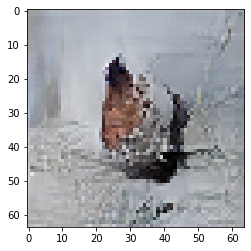

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 31

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.685234785079956 sec
Gen loss: 1.8549535713697736, Disc loss: 2.161484592839291, Disc valid real loss: 0.3927867773332094, Disc valid fake loss: 0.39850031702142014, Disc class real loss: 0.6855822613364772, Disc class fake loss: 0.09771855763698879
Time for epoch 2 is 0.6891005039215088 sec
Gen loss: 1.8582608699798584, Disc loss: 2.097431697343525, Disc valid real loss: 0.381339336696424, Disc valid fake loss: 0.40372522253739207, Disc class real loss: 0.6576844767520302, Disc class fake loss: 0.09301867198787238
Time for epoch 3 is 0.692103385925293 sec
Gen loss: 1.9809910121716952, Disc loss: 2.1418223443784212, Disc valid real loss: 0.37552204728126526, Disc valid fake loss: 0.4076831795667347, Disc class real loss: 0.6818736979835912, Disc class fake loss: 0.10690337537150633
Time for epoch 4 is 0.6920726299285889 sec
Gen loss: 1.91495437371103

Time for epoch 31 is 0.6939811706542969 sec
Gen loss: 1.8114816703294452, Disc loss: 2.0602251793208874, Disc valid real loss: 0.39477730581634923, Disc valid fake loss: 0.3783537447452545, Disc class real loss: 0.6719482227375633, Disc class fake loss: 0.15412788544046252
Time for epoch 32 is 0.6937663555145264 sec
Gen loss: 1.8094806545659115, Disc loss: 2.054632538243344, Disc valid real loss: 0.3926400557944649, Disc valid fake loss: 0.37842417077014323, Disc class real loss: 0.6716841176936501, Disc class fake loss: 0.14409587375427546
Time for epoch 33 is 0.6920368671417236 sec
Gen loss: 1.8818552745015997, Disc loss: 2.0319460253966484, Disc valid real loss: 0.37475179841643885, Disc valid fake loss: 0.3876616688151109, Disc class real loss: 0.666136970645503, Disc class fake loss: 0.12932652509526202
Time for epoch 34 is 0.6924998760223389 sec
Gen loss: 1.8246099948883057, Disc loss: 2.0093139159051994, Disc valid real loss: 0.4055700145269695, Disc valid fake loss: 0.400976662

Time for epoch 62 is 0.6919193267822266 sec
Gen loss: 1.953302590470565, Disc loss: 1.971831158587807, Disc valid real loss: 0.4081547605363946, Disc valid fake loss: 0.38534346066023173, Disc class real loss: 0.6435695855241073, Disc class fake loss: 0.15186554585632525
Time for epoch 63 is 0.6932857036590576 sec
Gen loss: 1.9198554315065082, Disc loss: 1.9712164025557668, Disc valid real loss: 0.3953920634169328, Disc valid fake loss: 0.367484356227674, Disc class real loss: 0.6629165065915961, Disc class fake loss: 0.14045236926329763
Time for epoch 64 is 0.6939363479614258 sec
Gen loss: 1.8488284161216335, Disc loss: 2.017037918693141, Disc valid real loss: 0.38279803489383896, Disc valid fake loss: 0.4037549291786395, Disc class real loss: 0.672635837605125, Disc class fake loss: 0.17010427305572912
Time for epoch 65 is 0.6919875144958496 sec
Gen loss: 1.9171756317740993, Disc loss: 2.016662020432322, Disc valid real loss: 0.3787873763787119, Disc valid fake loss: 0.39789150733696

Time for epoch 93 is 0.6949687004089355 sec
Gen loss: 1.9370789025959216, Disc loss: 1.874882001625864, Disc valid real loss: 0.37934803492144537, Disc valid fake loss: 0.38377501933198227, Disc class real loss: 0.6359488807226482, Disc class fake loss: 0.15498610272219307
Time for epoch 94 is 0.6929237842559814 sec
Gen loss: 1.9160298485504954, Disc loss: 1.8662197903582924, Disc valid real loss: 0.38916323216337906, Disc valid fake loss: 0.3860591791178051, Disc class real loss: 0.6226835721417477, Disc class fake loss: 0.16395514262349983
Time for epoch 95 is 0.6943230628967285 sec
Gen loss: 1.9822790120777332, Disc loss: 1.9322231819755153, Disc valid real loss: 0.3796131234419973, Disc valid fake loss: 0.38633312206519277, Disc class real loss: 0.6722438743239955, Disc class fake loss: 0.1483718250927172
Time for epoch 96 is 0.6968321800231934 sec
Gen loss: 1.915522155008818, Disc loss: 1.9307445538671393, Disc valid real loss: 0.39406028076222066, Disc valid fake loss: 0.40156125

Time for epoch 123 is 0.6946132183074951 sec
Gen loss: 1.941032560248124, Disc loss: 1.886986117613943, Disc valid real loss: 0.38971800866879913, Disc valid fake loss: 0.397709879435991, Disc class real loss: 0.6636879820572702, Disc class fake loss: 0.14689509296103528
Time for epoch 124 is 0.6953902244567871 sec
Gen loss: 1.8550984859466553, Disc loss: 1.8975468748494198, Disc valid real loss: 0.4149746369374426, Disc valid fake loss: 0.3795021442990554, Disc class real loss: 0.6625557384992901, Disc class fake loss: 0.16300181809224581
Time for epoch 125 is 0.6967594623565674 sec
Gen loss: 1.9363709876411839, Disc loss: 1.8795435303135921, Disc valid real loss: 0.4027887943543886, Disc valid fake loss: 0.3914581521561271, Disc class real loss: 0.6562447767508658, Disc class fake loss: 0.14922607180319333
Time for epoch 126 is 0.6951522827148438 sec
Gen loss: 2.015084298033463, Disc loss: 1.8137327934566296, Disc valid real loss: 0.37741474101417943, Disc valid fake loss: 0.37229869

Time for epoch 153 is 0.6995811462402344 sec
Gen loss: 1.900713418659411, Disc loss: 1.7842296675631875, Disc valid real loss: 0.3630299050556986, Disc valid fake loss: 0.3904429846688321, Disc class real loss: 0.6568016096165306, Disc class fake loss: 0.14149180446800433
Time for epoch 154 is 0.6932210922241211 sec
Gen loss: 1.8805045391383923, Disc loss: 1.808382837395919, Disc valid real loss: 0.38668444909547506, Disc valid fake loss: 0.3980393770493959, Disc class real loss: 0.6565472860085336, Disc class fake loss: 0.13270468441279312
Time for epoch 155 is 0.6974709033966064 sec
Gen loss: 1.9895105801130597, Disc loss: 1.7993715374093306, Disc valid real loss: 0.4002238339499423, Disc valid fake loss: 0.3931171643106561, Disc class real loss: 0.6448589751594945, Disc class fake loss: 0.134704679642853
Time for epoch 156 is 0.6963748931884766 sec
Gen loss: 1.9106587108812834, Disc loss: 1.757590463286952, Disc valid real loss: 0.3872380868384713, Disc valid fake loss: 0.3752732574

Time for epoch 183 is 0.7008695602416992 sec
Gen loss: 2.056352841226678, Disc loss: 1.7255607780657316, Disc valid real loss: 0.3671146035194397, Disc valid fake loss: 0.371261317478983, Disc class real loss: 0.6830756601534391, Disc class fake loss: 0.1062076272148835
Time for epoch 184 is 0.6992349624633789 sec
Gen loss: 1.9755762815475464, Disc loss: 1.7579669513200458, Disc valid real loss: 0.41558125458265605, Disc valid fake loss: 0.360926816337987, Disc class real loss: 0.6675516461071215, Disc class fake loss: 0.1321724621873153
Time for epoch 185 is 0.6979763507843018 sec
Gen loss: 1.9694603556080867, Disc loss: 1.7509874168195223, Disc valid real loss: 0.4087675292240946, Disc valid fake loss: 0.3819183550382915, Disc class real loss: 0.6612511904616105, Disc class fake loss: 0.11578061157151272
Time for epoch 186 is 0.6929056644439697 sec
Gen loss: 2.0223750064247534, Disc loss: 1.7388516037087691, Disc valid real loss: 0.38354156989800303, Disc valid fake loss: 0.380265374

Time for epoch 213 is 0.6924309730529785 sec
Gen loss: 2.0743599000730013, Disc loss: 1.6689100955661975, Disc valid real loss: 0.3709087842389157, Disc valid fake loss: 0.38195283867810903, Disc class real loss: 0.6569788675559195, Disc class fake loss: 0.13670425587578824
Time for epoch 214 is 0.6934022903442383 sec
Gen loss: 1.9554094640832198, Disc loss: 1.721902100663436, Disc valid real loss: 0.4080248004511783, Disc valid fake loss: 0.37871109811883225, Disc class real loss: 0.6824533845248976, Disc class fake loss: 0.12325880558867204
Time for epoch 215 is 0.6905474662780762 sec
Gen loss: 1.9966265778792531, Disc loss: 1.6701744857587313, Disc valid real loss: 0.37875606198059886, Disc valid fake loss: 0.4037020096653386, Disc class real loss: 0.6471748979468095, Disc class fake loss: 0.12049531838611553
Time for epoch 216 is 0.6980359554290771 sec
Gen loss: 1.9377292206412868, Disc loss: 1.7413545595972162, Disc valid real loss: 0.40955003468613876, Disc valid fake loss: 0.412

Time for epoch 244 is 0.695075511932373 sec
Gen loss: 1.9235165558363263, Disc loss: 1.5924142599105835, Disc valid real loss: 0.38332841113994, Disc valid fake loss: 0.40499096795132283, Disc class real loss: 0.64414066703696, Disc class fake loss: 0.09173987472527906
Time for epoch 245 is 0.6948394775390625 sec
Gen loss: 1.9741809744583934, Disc loss: 1.596032926910802, Disc valid real loss: 0.3971707491498244, Disc valid fake loss: 0.3797661050369865, Disc class real loss: 0.6504872378550077, Disc class fake loss: 0.1030112479470278
Time for epoch 246 is 0.6926825046539307 sec
Gen loss: 1.93106452414864, Disc loss: 1.651838741804424, Disc valid real loss: 0.4228729480191281, Disc valid fake loss: 0.3880092564382051, Disc class real loss: 0.6653803116396854, Disc class fake loss: 0.11111599501026304
Time for epoch 247 is 0.6930606365203857 sec
Gen loss: 1.9661754746186106, Disc loss: 1.656598643252724, Disc valid real loss: 0.4024468236847928, Disc valid fake loss: 0.4073514310937178

Time for epoch 274 is 0.697861909866333 sec
Gen loss: 1.9716154525154514, Disc loss: 1.5551467318283885, Disc valid real loss: 0.3834084727262196, Disc valid fake loss: 0.39217095312319306, Disc class real loss: 0.6511295375071073, Disc class fake loss: 0.12018115034228877
Time for epoch 275 is 0.6969995498657227 sec
Gen loss: 1.96146653827868, Disc loss: 1.6054127279080843, Disc valid real loss: 0.3861478896517503, Disc valid fake loss: 0.41528116480300303, Disc class real loss: 0.6753530565061068, Disc class fake loss: 0.12204129895881603
Time for epoch 276 is 0.6990838050842285 sec
Gen loss: 1.9582606177580983, Disc loss: 1.5485624827836688, Disc valid real loss: 0.3945714721554204, Disc valid fake loss: 0.3819259718844765, Disc class real loss: 0.666504304659994, Disc class fake loss: 0.10086222404712125
Time for epoch 277 is 0.6964266300201416 sec
Gen loss: 1.9709648270356028, Disc loss: 1.4797531617315192, Disc valid real loss: 0.38103889321026047, Disc valid fake loss: 0.3763423

Time for epoch 304 is 0.6986942291259766 sec
Gen loss: 1.9627305959400378, Disc loss: 1.5390705121190924, Disc valid real loss: 0.40672918056186874, Disc valid fake loss: 0.3778159194870999, Disc class real loss: 0.6738410686191759, Disc class fake loss: 0.08080297002666875
Time for epoch 305 is 0.6965489387512207 sec
Gen loss: 1.9323494810807078, Disc loss: 1.5685081105483205, Disc valid real loss: 0.3929447845408791, Disc valid fake loss: 0.4078056859342675, Disc class real loss: 0.6712959659726996, Disc class fake loss: 0.09657663891189977
Time for epoch 306 is 0.6977159976959229 sec
Gen loss: 1.9501197275362516, Disc loss: 1.570362323208859, Disc valid real loss: 0.4002574854775479, Disc valid fake loss: 0.41004462618576853, Disc class real loss: 0.6741503665321752, Disc class fake loss: 0.08602749340628323
Time for epoch 307 is 0.6974592208862305 sec
Gen loss: 2.0071108968634355, Disc loss: 1.552123734825536, Disc valid real loss: 0.3958125130126351, Disc valid fake loss: 0.386402

Time for epoch 334 is 0.6978611946105957 sec
Gen loss: 1.9535849470841258, Disc loss: 1.5541716688557674, Disc valid real loss: 0.3845817054572858, Disc valid fake loss: 0.4016913646145871, Disc class real loss: 0.6857872511211195, Disc class fake loss: 0.08223206589096471
Time for epoch 335 is 0.7009978294372559 sec
Gen loss: 1.968838603873002, Disc loss: 1.5515611673656262, Disc valid real loss: 0.3980216744698976, Disc valid fake loss: 0.3989019723314988, Disc class real loss: 0.6621862367579812, Disc class fake loss: 0.09256523690725628
Time for epoch 336 is 0.7021956443786621 sec
Gen loss: 2.0158541641737284, Disc loss: 1.5473671963340359, Disc valid real loss: 0.3917542821482608, Disc valid fake loss: 0.39675788346089813, Disc class real loss: 0.6652055570953771, Disc class fake loss: 0.093763803965167
Time for epoch 337 is 0.6942770481109619 sec
Gen loss: 1.9737097903301841, Disc loss: 1.4889135423459505, Disc valid real loss: 0.3696958806953932, Disc valid fake loss: 0.37450145

Time for epoch 364 is 0.700042724609375 sec
Gen loss: 1.998105902420847, Disc loss: 1.5529133395144814, Disc valid real loss: 0.37964957481936407, Disc valid fake loss: 0.39046155778985275, Disc class real loss: 0.6852323601120397, Disc class fake loss: 0.0976873665655914
Time for epoch 365 is 0.6956019401550293 sec
Gen loss: 1.9565030901055587, Disc loss: 1.5371143880643343, Disc valid real loss: 0.39815549395586314, Disc valid fake loss: 0.38751660052098724, Disc class real loss: 0.6501686949478952, Disc class fake loss: 0.10138335912243317
Time for epoch 366 is 0.6904559135437012 sec
Gen loss: 1.9529948422783299, Disc loss: 1.5587241461402492, Disc valid real loss: 0.40646090711417954, Disc valid fake loss: 0.3992019264321578, Disc class real loss: 0.6624935175243177, Disc class fake loss: 0.09068215089408975
Time for epoch 367 is 0.6964261531829834 sec
Gen loss: 2.0938333900351274, Disc loss: 1.5106963609394275, Disc valid real loss: 0.381494665616437, Disc valid fake loss: 0.39686

Time for epoch 394 is 0.7003951072692871 sec
Gen loss: 1.9436706053583246, Disc loss: 1.520666938079031, Disc valid real loss: 0.37939657663044174, Disc valid fake loss: 0.4170440058959158, Disc class real loss: 0.6337373099829021, Disc class fake loss: 0.09059768385793034
Time for epoch 395 is 0.7001793384552002 sec
Gen loss: 2.0156669302990564, Disc loss: 1.511716735990424, Disc valid real loss: 0.39208483225420904, Disc valid fake loss: 0.38662815721411453, Disc class real loss: 0.6506159587910301, Disc class fake loss: 0.08250142967230395
Time for epoch 396 is 0.696425199508667 sec
Gen loss: 1.9195415158020823, Disc loss: 1.5465826862736751, Disc valid real loss: 0.38676304566232783, Disc valid fake loss: 0.37923006791817515, Disc class real loss: 0.682650951962722, Disc class fake loss: 0.09805556484743168
Time for epoch 397 is 0.6941244602203369 sec
Gen loss: 1.955825736648158, Disc loss: 1.5601998944031565, Disc valid real loss: 0.39329401442879125, Disc valid fake loss: 0.39163

Time for epoch 424 is 0.6935358047485352 sec
Gen loss: 1.992814013832494, Disc loss: 1.5365033839878284, Disc valid real loss: 0.41790590239198583, Disc valid fake loss: 0.3782237846600382, Disc class real loss: 0.6435934399303637, Disc class fake loss: 0.09688962094093624
Time for epoch 425 is 0.6935009956359863 sec
Gen loss: 1.9757187429227328, Disc loss: 1.5468987289227938, Disc valid real loss: 0.38406685622114883, Disc valid fake loss: 0.39276254177093506, Disc class real loss: 0.6694256475097254, Disc class fake loss: 0.10075744790466208
Time for epoch 426 is 0.6961960792541504 sec
Gen loss: 1.9923040866851807, Disc loss: 1.5332379843059338, Disc valid real loss: 0.377823962977058, Disc valid fake loss: 0.38411264043105275, Disc class real loss: 0.6735487423445049, Disc class fake loss: 0.0978678027658086
Time for epoch 427 is 0.6925928592681885 sec
Gen loss: 2.0094673006158126, Disc loss: 1.55320784292723, Disc valid real loss: 0.3882615205488707, Disc valid fake loss: 0.4000990

Time for epoch 454 is 0.692861795425415 sec
Gen loss: 1.93767585879878, Disc loss: 1.5139262237046893, Disc valid real loss: 0.378099882288983, Disc valid fake loss: 0.37735647276828166, Disc class real loss: 0.6484817987994144, Disc class fake loss: 0.1100957446584576
Time for epoch 455 is 0.6916799545288086 sec
Gen loss: 1.9642293014024432, Disc loss: 1.5175557324760838, Disc valid real loss: 0.38284002479754, Disc valid fake loss: 0.3930306513058512, Disc class real loss: 0.6661998958964097, Disc class fake loss: 0.07560328717686628
Time for epoch 456 is 0.6936180591583252 sec
Gen loss: 2.069029375126487, Disc loss: 1.5433921312030994, Disc valid real loss: 0.37860388504831416, Disc valid fake loss: 0.39117586769555746, Disc class real loss: 0.6909437556015817, Disc class fake loss: 0.08279027927078698
Time for epoch 457 is 0.6935737133026123 sec
Gen loss: 1.8723349508486296, Disc loss: 1.5465946260251497, Disc valid real loss: 0.39695302906789276, Disc valid fake loss: 0.4032356048

Time for epoch 484 is 0.6937992572784424 sec
Gen loss: 1.9513477212504338, Disc loss: 1.5610958275042082, Disc valid real loss: 0.39770612277482686, Disc valid fake loss: 0.4006636566237399, Disc class real loss: 0.6586084930520308, Disc class fake loss: 0.10422845537725248
Time for epoch 485 is 0.6928837299346924 sec
Gen loss: 1.9828668079878156, Disc loss: 1.5190013207887347, Disc valid real loss: 0.3860038660074535, Disc valid fake loss: 0.38674017943834005, Disc class real loss: 0.648978264708268, Disc class fake loss: 0.09738934883161594
Time for epoch 486 is 0.6961610317230225 sec
Gen loss: 2.0268495835756, Disc loss: 1.5428843121779592, Disc valid real loss: 0.39613390596289383, Disc valid fake loss: 0.3799823240229958, Disc class real loss: 0.6743153019955284, Disc class fake loss: 0.09256912444375064
Time for epoch 487 is 0.6962685585021973 sec
Gen loss: 1.9155380098443282, Disc loss: 1.5521364713969983, Disc valid real loss: 0.3962462183676268, Disc valid fake loss: 0.3828534

Time for epoch 514 is 0.7197847366333008 sec
Gen loss: 1.9525327055077804, Disc loss: 1.505506063762464, Disc valid real loss: 0.3775770366191864, Disc valid fake loss: 0.38735515820352656, Disc class real loss: 0.6615778364633259, Disc class fake loss: 0.07911252995070658
Time for epoch 515 is 0.7200498580932617 sec
Gen loss: 1.9708925799319619, Disc loss: 1.5014216711646633, Disc valid real loss: 0.39286788827494573, Disc valid fake loss: 0.37372205288786636, Disc class real loss: 0.6577248510561491, Disc class fake loss: 0.07722299712661065
Time for epoch 516 is 0.7018544673919678 sec
Gen loss: 2.0839293505016125, Disc loss: 1.5098405009821843, Disc valid real loss: 0.37134340091755513, Disc valid fake loss: 0.36759827952635915, Disc class real loss: 0.6926136895229942, Disc class fake loss: 0.0784080244208637
Time for epoch 517 is 0.6957240104675293 sec
Gen loss: 1.8744611865595768, Disc loss: 1.5200021329678988, Disc valid real loss: 0.3793793101059763, Disc valid fake loss: 0.396

Time for epoch 544 is 0.6937065124511719 sec
Gen loss: 1.988164042171679, Disc loss: 1.5184297373420315, Disc valid real loss: 0.3730087107733676, Disc valid fake loss: 0.3849811930405466, Disc class real loss: 0.6756108622801932, Disc class fake loss: 0.08494715186718263
Time for epoch 545 is 0.6931178569793701 sec
Gen loss: 1.9995911999752647, Disc loss: 1.5626018549266614, Disc valid real loss: 0.3955116538625014, Disc valid fake loss: 0.3952493024499793, Disc class real loss: 0.6878316308322706, Disc class fake loss: 0.08413003032144747
Time for epoch 546 is 0.6900038719177246 sec
Gen loss: 1.9060189222034656, Disc loss: 1.540601567218178, Disc valid real loss: 0.39638091859064606, Disc valid fake loss: 0.3927337009655802, Disc class real loss: 0.6678976291104367, Disc class fake loss: 0.083706176594684
Time for epoch 547 is 0.6935656070709229 sec
Gen loss: 1.8787702886681807, Disc loss: 1.53725308493564, Disc valid real loss: 0.39062117432293136, Disc valid fake loss: 0.3858579005

Time for epoch 574 is 0.6960053443908691 sec
Gen loss: 1.9809949147073846, Disc loss: 1.507803803996036, Disc valid real loss: 0.3980769013103686, Disc valid fake loss: 0.38658671865337774, Disc class real loss: 0.6480058870817486, Disc class fake loss: 0.07524885276430532
Time for epoch 575 is 0.6900575160980225 sec
Gen loss: 1.9157185115312274, Disc loss: 1.5749891494449817, Disc valid real loss: 0.4092223142322741, Disc valid fake loss: 0.40230471523184524, Disc class real loss: 0.6881919095390722, Disc class fake loss: 0.0753927813156655
Time for epoch 576 is 0.6906542778015137 sec
Gen loss: 1.9734619604913812, Disc loss: 1.5400868779734562, Disc valid real loss: 0.37200161657835307, Disc valid fake loss: 0.39294881569711787, Disc class real loss: 0.6711745826821578, Disc class fake loss: 0.10407531732007076
Time for epoch 577 is 0.6936297416687012 sec
Gen loss: 1.896782354304665, Disc loss: 1.5598217311658358, Disc valid real loss: 0.40961425555379766, Disc valid fake loss: 0.3943

Time for epoch 604 is 0.7004168033599854 sec
Gen loss: 1.9014786544599032, Disc loss: 1.5600414276123047, Disc valid real loss: 0.4061466314290699, Disc valid fake loss: 0.3943919178686644, Disc class real loss: 0.6691336725887499, Disc class fake loss: 0.09048494637796753
Time for epoch 605 is 0.6948955059051514 sec
Gen loss: 1.9677490999824123, Disc loss: 1.554392607588517, Disc valid real loss: 0.39521741396502447, Disc valid fake loss: 0.3880591000381269, Disc class real loss: 0.6600044055988914, Disc class fake loss: 0.111221465625261
Time for epoch 606 is 0.6995925903320312 sec
Gen loss: 1.982824313013177, Disc loss: 1.5435340404510498, Disc valid real loss: 0.3920494678773378, Disc valid fake loss: 0.3837947076872775, Disc class real loss: 0.6894750030417192, Disc class fake loss: 0.07833708528625338
Time for epoch 607 is 0.7001810073852539 sec
Gen loss: 1.998566941211098, Disc loss: 1.5491526566053693, Disc valid real loss: 0.38384095932308, Disc valid fake loss: 0.394643479271

Time for epoch 634 is 0.702415943145752 sec
Gen loss: 1.9504918612931903, Disc loss: 1.555874316315902, Disc valid real loss: 0.3863660222605655, Disc valid fake loss: 0.39820387802625956, Disc class real loss: 0.6536771184519717, Disc class fake loss: 0.1177345114318948
Time for epoch 635 is 0.7024943828582764 sec
Gen loss: 2.003435486241391, Disc loss: 1.5517433568050987, Disc valid real loss: 0.3855797021012557, Disc valid fake loss: 0.39784238683549983, Disc class real loss: 0.6717153191566467, Disc class fake loss: 0.09672096136369203
Time for epoch 636 is 0.6968264579772949 sec
Gen loss: 1.9848769401249133, Disc loss: 1.531629807070682, Disc valid real loss: 0.38036598500452545, Disc valid fake loss: 0.3933191911170357, Disc class real loss: 0.6837977045460751, Disc class fake loss: 0.07426885554665014
Time for epoch 637 is 0.6904947757720947 sec
Gen loss: 2.0629623563666093, Disc loss: 1.5470789357235557, Disc valid real loss: 0.40659101542673615, Disc valid fake loss: 0.3882138

Time for epoch 664 is 0.691981315612793 sec
Gen loss: 1.8968860412898816, Disc loss: 1.5435750484466553, Disc valid real loss: 0.3839086890220642, Disc valid fake loss: 0.4079816262972982, Disc class real loss: 0.6568700984904641, Disc class fake loss: 0.09492707115254904
Time for epoch 665 is 0.693915605545044 sec
Gen loss: 1.9416291776456331, Disc loss: 1.545733094215393, Disc valid real loss: 0.3767470842913577, Disc valid fake loss: 0.40053485726055343, Disc class real loss: 0.6753179681928534, Disc class fake loss: 0.09324963753552813
Time for epoch 666 is 0.6965510845184326 sec
Gen loss: 1.9814405754992837, Disc loss: 1.5389581730491237, Disc valid real loss: 0.38168342411518097, Disc valid fake loss: 0.37127411836072016, Disc class real loss: 0.7014293858879491, Disc class fake loss: 0.0846946302213167
Time for epoch 667 is 0.6919355392456055 sec
Gen loss: 1.9818960114529258, Disc loss: 1.5024261474609375, Disc valid real loss: 0.39164579542059647, Disc valid fake loss: 0.382010

Time for epoch 694 is 0.6919255256652832 sec
Gen loss: 1.9961076535676654, Disc loss: 1.5500232859661704, Disc valid real loss: 0.37701088739068883, Disc valid fake loss: 0.38380495184346247, Disc class real loss: 0.7075260563900596, Disc class fake loss: 0.08180656872297588
Time for epoch 695 is 0.6932172775268555 sec
Gen loss: 1.9363608862224377, Disc loss: 1.5556051103692305, Disc valid real loss: 0.3824801570490787, Disc valid fake loss: 0.3960738401663931, Disc class real loss: 0.6835156961491233, Disc class fake loss: 0.09365339910513476
Time for epoch 696 is 0.6940414905548096 sec
Gen loss: 1.9483465646442615, Disc loss: 1.5684021648607755, Disc valid real loss: 0.3892612402376376, Disc valid fake loss: 0.3934267696581389, Disc class real loss: 0.6809850774313274, Disc class fake loss: 0.10484431135027032
Time for epoch 697 is 0.6950109004974365 sec
Gen loss: 1.9353319155542474, Disc loss: 1.5393931991175602, Disc valid real loss: 0.3863401256109539, Disc valid fake loss: 0.3950

Time for epoch 724 is 0.6962847709655762 sec
Gen loss: 1.946017773527848, Disc loss: 1.5842985793163902, Disc valid real loss: 0.38329996011759104, Disc valid fake loss: 0.40313582985024704, Disc class real loss: 0.6902033372929222, Disc class fake loss: 0.1077759561962203
Time for epoch 725 is 0.694617509841919 sec
Gen loss: 2.1214069818195544, Disc loss: 1.4889751860969944, Disc valid real loss: 0.3780909996283682, Disc valid fake loss: 0.3784282082005551, Disc class real loss: 0.6667315583480032, Disc class fake loss: 0.06584459700082478
Time for epoch 726 is 0.6930840015411377 sec
Gen loss: 2.0322835947337903, Disc loss: 1.5522844101253308, Disc valid real loss: 0.375248289421985, Disc valid fake loss: 0.38875991419741984, Disc class real loss: 0.6933711422117133, Disc class fake loss: 0.09502477904683665
Time for epoch 727 is 0.6935153007507324 sec
Gen loss: 1.9920526617451717, Disc loss: 1.5360377211319773, Disc valid real loss: 0.3842296663083528, Disc valid fake loss: 0.3886610

Time for epoch 754 is 0.6946828365325928 sec
Gen loss: 1.9232848757191707, Disc loss: 1.5584658447064852, Disc valid real loss: 0.4021272925954116, Disc valid fake loss: 0.37695504960260895, Disc class real loss: 0.6900685900136044, Disc class fake loss: 0.08943504447999753
Time for epoch 755 is 0.6954019069671631 sec
Gen loss: 1.9174840638512058, Disc loss: 1.5431101447657536, Disc valid real loss: 0.39859357789943095, Disc valid fake loss: 0.3848127958021666, Disc class real loss: 0.6733767672588951, Disc class fake loss: 0.08644440966217141
Time for epoch 756 is 0.6969425678253174 sec
Gen loss: 1.9706975786309493, Disc loss: 1.5325564397008795, Disc valid real loss: 0.39011323216714355, Disc valid fake loss: 0.37882841103955317, Disc class real loss: 0.683790241417132, Disc class fake loss: 0.07994534467395983
Time for epoch 757 is 0.6951930522918701 sec
Gen loss: 1.966469501194201, Disc loss: 1.5066693519291126, Disc valid real loss: 0.37636872028049667, Disc valid fake loss: 0.371

Time for epoch 784 is 0.7098021507263184 sec
Gen loss: 2.003756152956109, Disc loss: 1.5354270433124744, Disc valid real loss: 0.3933175723803671, Disc valid fake loss: 0.3923798956369099, Disc class real loss: 0.6561609883057443, Disc class fake loss: 0.09368111918631353
Time for epoch 785 is 0.6989989280700684 sec
Gen loss: 1.9463002932699103, Disc loss: 1.5645194304616827, Disc valid real loss: 0.3821044705416027, Disc valid fake loss: 0.39210884978896693, Disc class real loss: 0.6941988248574106, Disc class fake loss: 0.0962269357160518
Time for epoch 786 is 0.7044439315795898 sec
Gen loss: 2.043913301668669, Disc loss: 1.500244742945621, Disc valid real loss: 0.3847690208962089, Disc valid fake loss: 0.3630701813258623, Disc class real loss: 0.6817609605036283, Disc class fake loss: 0.07076678130971759
Time for epoch 787 is 0.7053089141845703 sec
Gen loss: 2.0220298516122917, Disc loss: 1.579353834453382, Disc valid real loss: 0.39854673962844045, Disc valid fake loss: 0.384367182

Time for epoch 814 is 0.6994473934173584 sec
Gen loss: 1.9269535039600574, Disc loss: 1.5298734526885183, Disc valid real loss: 0.3852823400183728, Disc valid fake loss: 0.39418721826452957, Disc class real loss: 0.6660751355321783, Disc class fake loss: 0.08444509214084399
Time for epoch 815 is 0.694277286529541 sec
Gen loss: 1.9662181264475773, Disc loss: 1.5347239281001843, Disc valid real loss: 0.376615047454834, Disc valid fake loss: 0.37852286665063156, Disc class real loss: 0.702354581732499, Disc class fake loss: 0.07735644516191985
Time for epoch 816 is 0.6994426250457764 sec
Gen loss: 1.9664913541392277, Disc loss: 1.5368778642855192, Disc valid real loss: 0.40870638426981476, Disc valid fake loss: 0.3859356249633588, Disc class real loss: 0.6670628911570499, Disc class fake loss: 0.07529134234707606
Time for epoch 817 is 0.6976532936096191 sec
Gen loss: 1.933135421652543, Disc loss: 1.5699887903113114, Disc valid real loss: 0.38872205269964116, Disc valid fake loss: 0.392201

Time for epoch 844 is 0.6992151737213135 sec
Gen loss: 2.0209427883750513, Disc loss: 1.4862688528864008, Disc valid real loss: 0.38180037234958847, Disc valid fake loss: 0.3564154921393645, Disc class real loss: 0.6527912052054154, Disc class fake loss: 0.09537327838571448
Time for epoch 845 is 0.6962590217590332 sec
Gen loss: 2.000803037693626, Disc loss: 1.5285262559589587, Disc valid real loss: 0.39668632337921544, Disc valid fake loss: 0.37551357401044744, Disc class real loss: 0.6758096939639041, Disc class fake loss: 0.08063570586474318
Time for epoch 846 is 0.6960186958312988 sec
Gen loss: 1.9569786598807888, Disc loss: 1.538438734255339, Disc valid real loss: 0.39921659231185913, Disc valid fake loss: 0.3750228944577669, Disc class real loss: 0.6751263267115543, Disc class fake loss: 0.08919012154403486
Time for epoch 847 is 0.6952149868011475 sec
Gen loss: 1.9898305252978676, Disc loss: 1.5548264478382312, Disc valid real loss: 0.4055509567260742, Disc valid fake loss: 0.3691

Time for epoch 874 is 0.7015302181243896 sec
Gen loss: 1.9442264029854222, Disc loss: 1.5477350385565507, Disc valid real loss: 0.40831258893013, Disc valid fake loss: 0.4018976562901547, Disc class real loss: 0.6602222135192469, Disc class fake loss: 0.07741915924768698
Time for epoch 875 is 0.6992616653442383 sec
Gen loss: 1.941473596974423, Disc loss: 1.4971955324474133, Disc valid real loss: 0.385320279159044, Disc valid fake loss: 0.3918424703572926, Disc class real loss: 0.6538680258550142, Disc class fake loss: 0.06628229723949182
Time for epoch 876 is 0.6969387531280518 sec
Gen loss: 1.9050558554498773, Disc loss: 1.6146297392092253, Disc valid real loss: 0.4200502038002014, Disc valid fake loss: 0.39070763086017807, Disc class real loss: 0.6909559682795876, Disc class fake loss: 0.11303153849746052
Time for epoch 877 is 0.6961765289306641 sec
Gen loss: 1.8273068290007741, Disc loss: 1.5366288109829551, Disc valid real loss: 0.4000765493041591, Disc valid fake loss: 0.392484108

Time for epoch 904 is 0.6927976608276367 sec
Gen loss: 1.912078581358257, Disc loss: 1.5424504405573796, Disc valid real loss: 0.39375129812642146, Disc valid fake loss: 0.39592980240520675, Disc class real loss: 0.6717578517763239, Disc class fake loss: 0.08112961161685617
Time for epoch 905 is 0.6943209171295166 sec
Gen loss: 1.9998116430483366, Disc loss: 1.5458023359901027, Disc valid real loss: 0.40595969871470805, Disc valid fake loss: 0.36497886557328074, Disc class real loss: 0.6685234308242798, Disc class fake loss: 0.10645278621661036
Time for epoch 906 is 0.695711612701416 sec
Gen loss: 1.8760041939584833, Disc loss: 1.5524624648847078, Disc valid real loss: 0.4011660751543547, Disc valid fake loss: 0.4237811251690513, Disc class real loss: 0.6381667350467882, Disc class fake loss: 0.0894582934285465
Time for epoch 907 is 0.7128911018371582 sec
Gen loss: 2.065126525728326, Disc loss: 1.5388893265473216, Disc valid real loss: 0.37598882223430435, Disc valid fake loss: 0.38722

Time for epoch 934 is 0.6986989974975586 sec
Gen loss: 1.9966236980337846, Disc loss: 1.5497011573691117, Disc valid real loss: 0.4159875888573496, Disc valid fake loss: 0.3811584350309874, Disc class real loss: 0.6865287517246447, Disc class fake loss: 0.06615047980295985
Time for epoch 935 is 0.6952660083770752 sec
Gen loss: 1.9526436077921014, Disc loss: 1.5343645936564396, Disc valid real loss: 0.3833232145560415, Disc valid fake loss: 0.3962628715916684, Disc class real loss: 0.6751013147203546, Disc class fake loss: 0.07979625992869076
Time for epoch 936 is 0.6988921165466309 sec
Gen loss: 1.9577355259343197, Disc loss: 1.5446333132292096, Disc valid real loss: 0.39234773893105357, Disc valid fake loss: 0.4016638586395665, Disc class real loss: 0.6601515600555822, Disc class fake loss: 0.0905841026259096
Time for epoch 937 is 0.7011237144470215 sec
Gen loss: 1.9966597180617482, Disc loss: 1.558477288798282, Disc valid real loss: 0.40644359902331706, Disc valid fake loss: 0.394622

Time for epoch 964 is 0.6977019309997559 sec
Gen loss: 1.925492380794726, Disc loss: 1.5771388819343166, Disc valid real loss: 0.4118214359408931, Disc valid fake loss: 0.4004624925161663, Disc class real loss: 0.673655535045423, Disc class fake loss: 0.0913159068869917
Time for epoch 965 is 0.6930220127105713 sec
Gen loss: 1.8766232979925055, Disc loss: 1.5610033336438631, Disc valid real loss: 0.3875829091197566, Disc valid fake loss: 0.3984159137073316, Disc class real loss: 0.6872218784533048, Disc class fake loss: 0.08790249553950209
Time for epoch 966 is 0.6964163780212402 sec
Gen loss: 1.8672783939461959, Disc loss: 1.5258216606943231, Disc valid real loss: 0.4019539183691928, Disc valid fake loss: 0.3825236323632692, Disc class real loss: 0.6774475668606005, Disc class fake loss: 0.06401923651757993
Time for epoch 967 is 0.6987743377685547 sec
Gen loss: 1.956408375187924, Disc loss: 1.5326303431862278, Disc valid real loss: 0.39100944995880127, Disc valid fake loss: 0.389249252

Time for epoch 994 is 0.7012729644775391 sec
Gen loss: 1.9740690432096784, Disc loss: 1.5640012339541787, Disc valid real loss: 0.4035179724818782, Disc valid fake loss: 0.3943646361953334, Disc class real loss: 0.6745897719734594, Disc class fake loss: 0.09164544837059159
Time for epoch 995 is 0.7039868831634521 sec
Gen loss: 1.9958054517444812, Disc loss: 1.503480873609844, Disc valid real loss: 0.38503721356391907, Disc valid fake loss: 0.37041561697658737, Disc class real loss: 0.6526155220834833, Disc class fake loss: 0.09552398343619548
Time for epoch 996 is 0.69978928565979 sec
Gen loss: 2.006502157763431, Disc loss: 1.528224932520013, Disc valid real loss: 0.4084111452102661, Disc valid fake loss: 0.36943959562402023, Disc class real loss: 0.6821066047015943, Disc class fake loss: 0.06839036490572126
Time for epoch 997 is 0.6928410530090332 sec
Gen loss: 1.9439991524344997, Disc loss: 1.5454522559517307, Disc valid real loss: 0.3901894876831456, Disc valid fake loss: 0.39402611

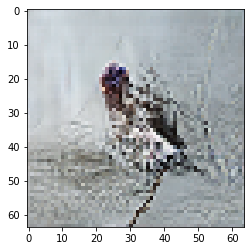

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 32

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6956698894500732 sec
Gen loss: 1.8682712316513062, Disc loss: 2.1283065268867896, Disc valid real loss: 0.39530012482091, Disc valid fake loss: 0.40328940435459737, Disc class real loss: 0.6653647077711005, Disc class fake loss: 0.0745247216208985
Time for epoch 2 is 0.7015061378479004 sec
Gen loss: 1.857231435022856, Disc loss: 2.1608740718741166, Disc valid real loss: 0.42007846424454137, Disc valid fake loss: 0.4051138193983781, Disc class real loss: 0.6693763952506216, Disc class fake loss: 0.08670874567408311
Time for epoch 3 is 0.7014586925506592 sec
Gen loss: 1.8312735432072689, Disc loss: 2.1690038191644767, Disc valid real loss: 0.3852228255648362, Disc valid fake loss: 0.4040266949879496, Disc class real loss: 0.6925902805830303, Disc class fake loss: 0.08139466984491599
Time for epoch 4 is 0.7031002044677734 sec
Gen loss: 1.85433740364877

Time for epoch 31 is 0.7015109062194824 sec
Gen loss: 1.8966224068089534, Disc loss: 2.012501095470629, Disc valid real loss: 0.38557996561652735, Disc valid fake loss: 0.39628999641067103, Disc class real loss: 0.6426027417182922, Disc class fake loss: 0.14541174863514147
Time for epoch 32 is 0.6969635486602783 sec
Gen loss: 1.757690141075536, Disc loss: 2.0580658285241378, Disc valid real loss: 0.40355508892159714, Disc valid fake loss: 0.3857918962051994, Disc class real loss: 0.6646038983997545, Disc class fake loss: 0.13051065645719828
Time for epoch 33 is 0.6992933750152588 sec
Gen loss: 1.945741942054347, Disc loss: 2.070720020093416, Disc valid real loss: 0.39057141228726033, Disc valid fake loss: 0.39623851838864776, Disc class real loss: 0.6717646906250402, Disc class fake loss: 0.16159148435843618
Time for epoch 34 is 0.697885274887085 sec
Gen loss: 1.8369584334524054, Disc loss: 2.0289157691754793, Disc valid real loss: 0.37861585146502447, Disc valid fake loss: 0.381824410

Time for epoch 62 is 0.6934115886688232 sec
Gen loss: 1.8913632945010537, Disc loss: 2.0361857665212533, Disc valid real loss: 0.40835245345768173, Disc valid fake loss: 0.38294081468331187, Disc class real loss: 0.6820193403645566, Disc class fake loss: 0.14361935775530965
Time for epoch 63 is 0.6886193752288818 sec
Gen loss: 1.8874449792661165, Disc loss: 1.996391541079471, Disc valid real loss: 0.4121222872483103, Disc valid fake loss: 0.38896449772935165, Disc class real loss: 0.6534787447828996, Disc class fake loss: 0.1568952747865727
Time for epoch 64 is 0.7086062431335449 sec
Gen loss: 1.8568669620313143, Disc loss: 1.9625030755996704, Disc valid real loss: 0.39165218096030385, Disc valid fake loss: 0.3865733930939122, Disc class real loss: 0.6508227335779291, Disc class fake loss: 0.13715317453208722
Time for epoch 65 is 0.7148537635803223 sec
Gen loss: 1.8062773754722194, Disc loss: 1.9646083179273104, Disc valid real loss: 0.4002581819107658, Disc valid fake loss: 0.37169349

Time for epoch 93 is 0.6976916790008545 sec
Gen loss: 1.9292595261021663, Disc loss: 1.9555607218491404, Disc valid real loss: 0.40419090107867595, Disc valid fake loss: 0.38878619749295085, Disc class real loss: 0.6668138127577933, Disc class fake loss: 0.15305481772673757
Time for epoch 94 is 0.700263500213623 sec
Gen loss: 1.848092756773296, Disc loss: 1.9666308666530408, Disc valid real loss: 0.3966513127088547, Disc valid fake loss: 0.39023563265800476, Disc class real loss: 0.6780513493638289, Disc class fake loss: 0.1538270096245565
Time for epoch 95 is 0.7000682353973389 sec
Gen loss: 1.9397188299580623, Disc loss: 1.9110018579583419, Disc valid real loss: 0.38061210042551946, Disc valid fake loss: 0.3897234405341901, Disc class real loss: 0.6551942542979592, Disc class fake loss: 0.15607819117997823
Time for epoch 96 is 0.7042953968048096 sec
Gen loss: 1.9699284716656333, Disc loss: 1.9081940964648598, Disc valid real loss: 0.3768647705253802, Disc valid fake loss: 0.393500440

Time for epoch 123 is 0.6965420246124268 sec
Gen loss: 1.974564602500514, Disc loss: 1.9533086074026007, Disc valid real loss: 0.4040508238892806, Disc valid fake loss: 0.3974595728673433, Disc class real loss: 0.6944959634228757, Disc class fake loss: 0.15648164796201805
Time for epoch 124 is 0.6939907073974609 sec
Gen loss: 1.907782322482059, Disc loss: 1.9468332591809725, Disc valid real loss: 0.4099511017924861, Disc valid fake loss: 0.410122275352478, Disc class real loss: 0.6774613669044093, Disc class fake loss: 0.16417050400846883
Time for epoch 125 is 0.6951568126678467 sec
Gen loss: 1.8591574304982235, Disc loss: 1.882505310209174, Disc valid real loss: 0.3847621883216657, Disc valid fake loss: 0.40568707020659195, Disc class real loss: 0.6626288357533907, Disc class fake loss: 0.1422397323737019
Time for epoch 126 is 0.685964822769165 sec
Gen loss: 1.9495878345087956, Disc loss: 1.8658656948491146, Disc valid real loss: 0.39256265994749573, Disc valid fake loss: 0.3809048800

Time for epoch 153 is 0.6920804977416992 sec
Gen loss: 2.002950392271343, Disc loss: 1.8320110346141614, Disc valid real loss: 0.3916251518224415, Disc valid fake loss: 0.3808224263944124, Disc class real loss: 0.6796221764464128, Disc class fake loss: 0.13364715089923457
Time for epoch 154 is 0.7001523971557617 sec
Gen loss: 1.9855935636319613, Disc loss: 1.8152811840960854, Disc valid real loss: 0.39459250945793956, Disc valid fake loss: 0.4125403212873559, Disc class real loss: 0.6427590784273649, Disc class fake loss: 0.14067474203674415
Time for epoch 155 is 0.6980633735656738 sec
Gen loss: 2.0287970241747404, Disc loss: 1.77528977394104, Disc valid real loss: 0.38012414543252243, Disc valid fake loss: 0.37608869295371206, Disc class real loss: 0.6517531965908251, Disc class fake loss: 0.14030451386382706
Time for epoch 156 is 0.6943700313568115 sec
Gen loss: 1.9499543717032986, Disc loss: 1.8024669885635376, Disc valid real loss: 0.4046206356663453, Disc valid fake loss: 0.359910

Time for epoch 183 is 0.6955413818359375 sec
Gen loss: 1.9432700370487415, Disc loss: 1.7145402933421887, Disc valid real loss: 0.37836002048693207, Disc valid fake loss: 0.39105433539340373, Disc class real loss: 0.6478468618894878, Disc class fake loss: 0.1141483093562879
Time for epoch 184 is 0.6969625949859619 sec
Gen loss: 1.929919914195412, Disc loss: 1.711239350469489, Disc valid real loss: 0.38486831517595993, Disc valid fake loss: 0.4070074809224982, Disc class real loss: 0.6422527652037772, Disc class fake loss: 0.0894380790230475
Time for epoch 185 is 0.6955463886260986 sec
Gen loss: 1.9596550778338784, Disc loss: 1.7578830969961066, Disc valid real loss: 0.4033713528984471, Disc valid fake loss: 0.3894349854243429, Disc class real loss: 0.6628651744440982, Disc class fake loss: 0.11985006614735252
Time for epoch 186 is 0.6940808296203613 sec
Gen loss: 1.9293496483250667, Disc loss: 1.765677295233074, Disc valid real loss: 0.3975202927463933, Disc valid fake loss: 0.39822726

Time for epoch 213 is 0.6953999996185303 sec
Gen loss: 1.9279210881183022, Disc loss: 1.658487457978098, Disc valid real loss: 0.38246771850084005, Disc valid fake loss: 0.3965287898716174, Disc class real loss: 0.6438627305783724, Disc class fake loss: 0.11013193546157134
Time for epoch 214 is 0.6944007873535156 sec
Gen loss: 2.0024728712282682, Disc loss: 1.6970927025142468, Disc valid real loss: 0.3939093225880673, Disc valid fake loss: 0.3976793775432988, Disc class real loss: 0.6589192999036688, Disc class fake loss: 0.12241261236761745
Time for epoch 215 is 0.6987361907958984 sec
Gen loss: 1.9383658233441805, Disc loss: 1.6916278726176213, Disc valid real loss: 0.3886958768493251, Disc valid fake loss: 0.4108726617537047, Disc class real loss: 0.6499639812268709, Disc class fake loss: 0.12168136278265401
Time for epoch 216 is 0.693199634552002 sec
Gen loss: 2.079322934150696, Disc loss: 1.6669901672162508, Disc valid real loss: 0.3761096816313894, Disc valid fake loss: 0.38581810

Time for epoch 243 is 0.6998059749603271 sec
Gen loss: 2.0171247783460116, Disc loss: 1.587054365559628, Disc valid real loss: 0.3859685879004629, Disc valid fake loss: 0.3709118703478261, Disc class real loss: 0.6519203750710738, Disc class fake loss: 0.1092546021467761
Time for epoch 244 is 0.697037935256958 sec
Gen loss: 1.9881715084377087, Disc loss: 1.6204651845128912, Disc valid real loss: 0.4006268742837404, Disc valid fake loss: 0.4056292866405688, Disc class real loss: 0.6546464719270405, Disc class fake loss: 0.08982795427896474
Time for epoch 245 is 0.6970839500427246 sec
Gen loss: 1.9674478455593711, Disc loss: 1.62392584901107, Disc valid real loss: 0.39754476359016017, Disc valid fake loss: 0.3861845331756692, Disc class real loss: 0.6747457447804903, Disc class fake loss: 0.096083179312317
Time for epoch 246 is 0.6963207721710205 sec
Gen loss: 2.039717994238201, Disc loss: 1.6273035689404136, Disc valid real loss: 0.3859469451402363, Disc valid fake loss: 0.3888101452275

Time for epoch 273 is 0.6952013969421387 sec
Gen loss: 1.8963661131105924, Disc loss: 1.5570349818781803, Disc valid real loss: 0.39745805922307464, Disc valid fake loss: 0.39839020214582743, Disc class real loss: 0.6584535617577402, Disc class fake loss: 0.09194962307810783
Time for epoch 274 is 0.6964824199676514 sec
Gen loss: 1.9717433452606201, Disc loss: 1.4939959300191779, Disc valid real loss: 0.38248820367612335, Disc valid fake loss: 0.38092036466849477, Disc class real loss: 0.6461345772994193, Disc class fake loss: 0.07561437864052623
Time for epoch 275 is 0.6975977420806885 sec
Gen loss: 1.98231167542307, Disc loss: 1.5751148525037264, Disc valid real loss: 0.42529373576766566, Disc valid fake loss: 0.3847817111956446, Disc class real loss: 0.6571135379766163, Disc class fake loss: 0.10130236140991512
Time for epoch 276 is 0.698115348815918 sec
Gen loss: 1.9340728897797435, Disc loss: 1.516463919689781, Disc valid real loss: 0.38533947028611837, Disc valid fake loss: 0.3843

Time for epoch 303 is 0.6985630989074707 sec
Gen loss: 1.987632757739017, Disc loss: 1.5222698889280621, Disc valid real loss: 0.3896236074598212, Disc valid fake loss: 0.38873421675280523, Disc class real loss: 0.6375519852889212, Disc class fake loss: 0.10646631274568408
Time for epoch 304 is 0.6971628665924072 sec
Gen loss: 2.0210036290319344, Disc loss: 1.5176742829774554, Disc valid real loss: 0.38826076294246475, Disc valid fake loss: 0.38306803373914017, Disc class real loss: 0.6669279462412784, Disc class fake loss: 0.07953503551451784
Time for epoch 305 is 0.6976678371429443 sec
Gen loss: 1.9424187886087518, Disc loss: 1.5176728336434615, Disc valid real loss: 0.38402723952343587, Disc valid fake loss: 0.3814453263031809, Disc class real loss: 0.671115169399663, Disc class fake loss: 0.08120309806575901
Time for epoch 306 is 0.6959683895111084 sec
Gen loss: 2.0378359869906775, Disc loss: 1.5209180116653442, Disc valid real loss: 0.37433627404664693, Disc valid fake loss: 0.376

Time for epoch 333 is 0.6970579624176025 sec
Gen loss: 2.0431008903603805, Disc loss: 1.5327034498515881, Disc valid real loss: 0.3835746238106175, Disc valid fake loss: 0.3930871800372475, Disc class real loss: 0.6751523080625033, Disc class fake loss: 0.08100818391693265
Time for epoch 334 is 0.6992373466491699 sec
Gen loss: 1.8636458986683895, Disc loss: 1.5123058118318256, Disc valid real loss: 0.40157012092439753, Disc valid fake loss: 0.38911582451117666, Disc class real loss: 0.6474666469975522, Disc class fake loss: 0.07426786697224567
Time for epoch 335 is 0.6964292526245117 sec
Gen loss: 1.9634275059950979, Disc loss: 1.4883233434275578, Disc valid real loss: 0.36960065678546306, Disc valid fake loss: 0.3880285526576795, Disc class real loss: 0.6609830872008675, Disc class fake loss: 0.06982931475106038
Time for epoch 336 is 0.7012495994567871 sec
Gen loss: 1.9542589438588995, Disc loss: 1.5337486643540232, Disc valid real loss: 0.4046165927460319, Disc valid fake loss: 0.384

Time for epoch 363 is 0.6979382038116455 sec
Gen loss: 1.9412071579381038, Disc loss: 1.5854208720357794, Disc valid real loss: 0.39916065805836726, Disc valid fake loss: 0.40633490367939595, Disc class real loss: 0.6793446070269534, Disc class fake loss: 0.10069647235305686
Time for epoch 364 is 0.696533203125 sec
Gen loss: 1.887988529707256, Disc loss: 1.5338139220287925, Disc valid real loss: 0.3666270469364367, Disc valid fake loss: 0.39930213752545807, Disc class real loss: 0.6862589748282182, Disc class fake loss: 0.08174668252468109
Time for epoch 365 is 0.6976091861724854 sec
Gen loss: 2.0179036040055123, Disc loss: 1.553157887960735, Disc valid real loss: 0.39124379659953873, Disc valid fake loss: 0.41032782353852926, Disc class real loss: 0.6635613535579882, Disc class fake loss: 0.08814003200907457
Time for epoch 366 is 0.6985938549041748 sec
Gen loss: 1.8797788118061267, Disc loss: 1.5494135806435032, Disc valid real loss: 0.3982429739676024, Disc valid fake loss: 0.4038851

Time for epoch 393 is 0.698739767074585 sec
Gen loss: 1.914907731507954, Disc loss: 1.5624700220007646, Disc valid real loss: 0.39144137815425273, Disc valid fake loss: 0.3965320132280651, Disc class real loss: 0.6953034808761195, Disc class fake loss: 0.07931636038579438
Time for epoch 394 is 0.697155237197876 sec
Gen loss: 1.9443419920770746, Disc loss: 1.5639646304281134, Disc valid real loss: 0.40750949006331594, Disc valid fake loss: 0.396940689337881, Disc class real loss: 0.6688158731711539, Disc class fake loss: 0.0908141790055915
Time for epoch 395 is 0.6981918811798096 sec
Gen loss: 1.993559115811398, Disc loss: 1.548745036125183, Disc valid real loss: 0.37193601382406133, Disc valid fake loss: 0.4166887073140395, Disc class real loss: 0.6781515165379173, Disc class fake loss: 0.08208803499215528
Time for epoch 396 is 0.6969799995422363 sec
Gen loss: 1.9692110638869436, Disc loss: 1.6105404339338605, Disc valid real loss: 0.392387004275071, Disc valid fake loss: 0.40645713084

Time for epoch 423 is 0.696744441986084 sec
Gen loss: 1.9558022837889821, Disc loss: 1.5552433791913485, Disc valid real loss: 0.39871902920697866, Disc valid fake loss: 0.40323823611987264, Disc class real loss: 0.6693470321203533, Disc class fake loss: 0.08405615801089689
Time for epoch 424 is 0.6974942684173584 sec
Gen loss: 1.8967698812484741, Disc loss: 1.4883077332847996, Disc valid real loss: 0.36762699327970805, Disc valid fake loss: 0.3961920385297976, Disc class real loss: 0.6573230373231989, Disc class fake loss: 0.06728369477940233
Time for epoch 425 is 0.7144794464111328 sec
Gen loss: 1.9651353610189337, Disc loss: 1.5219607604177374, Disc valid real loss: 0.3910927270588122, Disc valid fake loss: 0.3572290069178531, Disc class real loss: 0.6838299412476389, Disc class fake loss: 0.08992787430945196
Time for epoch 426 is 0.6979701519012451 sec
Gen loss: 1.9854695922450016, Disc loss: 1.5304090725748163, Disc valid real loss: 0.3967113573300211, Disc valid fake loss: 0.3835

Time for epoch 453 is 0.6979885101318359 sec
Gen loss: 1.930395427503084, Disc loss: 1.4900003797129582, Disc valid real loss: 0.39079212671832037, Disc valid fake loss: 0.3894617071277217, Disc class real loss: 0.6375195603621634, Disc class fake loss: 0.07234002326272036
Time for epoch 454 is 0.6934046745300293 sec
Gen loss: 1.9392935665030229, Disc loss: 1.5801448884763216, Disc valid real loss: 0.4353511835399427, Disc valid fake loss: 0.38634538493658366, Disc class real loss: 0.6810119120698226, Disc class fake loss: 0.07755711223734052
Time for epoch 455 is 0.696735143661499 sec
Gen loss: 1.9494553929881047, Disc loss: 1.5044695640865124, Disc valid real loss: 0.3930396202363466, Disc valid fake loss: 0.3691755548903817, Disc class real loss: 0.6679041040571112, Disc class fake loss: 0.07446896461279769
Time for epoch 456 is 0.6969907283782959 sec
Gen loss: 1.9788839754305387, Disc loss: 1.5085843550531488, Disc valid real loss: 0.3997602541195719, Disc valid fake loss: 0.391563

Time for epoch 483 is 0.6983754634857178 sec
Gen loss: 1.8851111437145032, Disc loss: 1.5746790484378212, Disc valid real loss: 0.39023114976130036, Disc valid fake loss: 0.42108454516059474, Disc class real loss: 0.6546115545850051, Disc class fake loss: 0.10886096170074061
Time for epoch 484 is 0.6968259811401367 sec
Gen loss: 1.9565178093157316, Disc loss: 1.5223643277820789, Disc valid real loss: 0.3825982981606534, Disc valid fake loss: 0.3858136236667633, Disc class real loss: 0.6878779593266939, Disc class fake loss: 0.06619878779900701
Time for epoch 485 is 0.6980485916137695 sec
Gen loss: 1.9546241634770443, Disc loss: 1.529376036242435, Disc valid real loss: 0.39756114388767044, Disc valid fake loss: 0.37597990506573725, Disc class real loss: 0.6695413652219271, Disc class fake loss: 0.08641024620125168
Time for epoch 486 is 0.6986823081970215 sec
Gen loss: 1.937883778622276, Disc loss: 1.5176281176115338, Disc valid real loss: 0.3800717913790753, Disc valid fake loss: 0.3913

Time for epoch 513 is 0.6945505142211914 sec
Gen loss: 1.91378494940306, Disc loss: 1.5191031004253186, Disc valid real loss: 0.3923930902230112, Disc valid fake loss: 0.3857306336101733, Disc class real loss: 0.6460529408956829, Disc class fake loss: 0.09503666458553389
Time for epoch 514 is 0.7007861137390137 sec
Gen loss: 1.9437684761850458, Disc loss: 1.505730101936742, Disc valid real loss: 0.3940358632489255, Disc valid fake loss: 0.3755275999244891, Disc class real loss: 0.636550540986814, Disc class fake loss: 0.09972345064345159
Time for epoch 515 is 0.696195125579834 sec
Gen loss: 1.8787782945131, Disc loss: 1.549986814197741, Disc valid real loss: 0.4020621227590661, Disc valid fake loss: 0.4143510617707905, Disc class real loss: 0.670343794320759, Disc class fake loss: 0.06335127824231197
Time for epoch 516 is 0.6958448886871338 sec
Gen loss: 2.026604232035185, Disc loss: 1.4926129516802336, Disc valid real loss: 0.3694408457530172, Disc valid fake loss: 0.3773201123664254,

Time for epoch 543 is 0.6962559223175049 sec
Gen loss: 1.940406793042233, Disc loss: 1.5184711343363713, Disc valid real loss: 0.390949862568002, Disc valid fake loss: 0.3844657744231977, Disc class real loss: 0.6696986148231908, Disc class fake loss: 0.07347613847569416
Time for epoch 544 is 0.694594144821167 sec
Gen loss: 1.9216025063866062, Disc loss: 1.508637735718175, Disc valid real loss: 0.36378426143997594, Disc valid fake loss: 0.3953910030816731, Disc class real loss: 0.6699186469379225, Disc class fake loss: 0.07966189792281703
Time for epoch 545 is 0.6939771175384521 sec
Gen loss: 1.999147747692309, Disc loss: 1.5148836938958419, Disc valid real loss: 0.3728329398130116, Disc valid fake loss: 0.38412919483686747, Disc class real loss: 0.6734559222271568, Disc class fake loss: 0.08458340501314715
Time for epoch 546 is 0.6948974132537842 sec
Gen loss: 2.050655383812754, Disc loss: 1.502934782128585, Disc valid real loss: 0.383675543885482, Disc valid fake loss: 0.391224023542

Time for epoch 573 is 0.6949617862701416 sec
Gen loss: 1.9614187479019165, Disc loss: 1.5327001935557316, Disc valid real loss: 0.38919704681948614, Disc valid fake loss: 0.3892742379715568, Disc class real loss: 0.6854385168928849, Disc class fake loss: 0.06891368466772531
Time for epoch 574 is 0.689011812210083 sec
Gen loss: 1.9485187718742771, Disc loss: 1.5537289820219342, Disc valid real loss: 0.39796970078819677, Disc valid fake loss: 0.3816826735672198, Disc class real loss: 0.6882089094111794, Disc class fake loss: 0.08598815796798781
Time for epoch 575 is 0.6918673515319824 sec
Gen loss: 1.8455082366341038, Disc loss: 1.5707182131315534, Disc valid real loss: 0.39324236857263667, Disc valid fake loss: 0.39132516007674367, Disc class real loss: 0.7052419436605353, Disc class fake loss: 0.08103359157317563
Time for epoch 576 is 0.692702054977417 sec
Gen loss: 1.9078711334027743, Disc loss: 1.5179455970463, Disc valid real loss: 0.3576391809865048, Disc valid fake loss: 0.4007266

Time for epoch 603 is 0.6942026615142822 sec
Gen loss: 1.95505134055489, Disc loss: 1.519532887559188, Disc valid real loss: 0.3797941788246757, Disc valid fake loss: 0.3885004943922946, Disc class real loss: 0.6623303294181824, Disc class fake loss: 0.08902254975155781
Time for epoch 604 is 0.6903390884399414 sec
Gen loss: 1.9460774283660085, Disc loss: 1.5126648764861257, Disc valid real loss: 0.3834331804200223, Disc valid fake loss: 0.3900704634817023, Disc class real loss: 0.6697407835408261, Disc class fake loss: 0.06954049054337175
Time for epoch 605 is 0.693953275680542 sec
Gen loss: 1.9587133244464272, Disc loss: 1.526765685332449, Disc valid real loss: 0.39105987862536784, Disc valid fake loss: 0.3652948313637784, Disc class real loss: 0.688545845056835, Disc class fake loss: 0.08198647191257853
Time for epoch 606 is 0.6941437721252441 sec
Gen loss: 1.9543882169221576, Disc loss: 1.5777239862241244, Disc valid real loss: 0.41494215789594147, Disc valid fake loss: 0.3839207683

Time for epoch 633 is 0.703427791595459 sec
Gen loss: 1.8581652390329462, Disc loss: 1.5221646333995618, Disc valid real loss: 0.37405490012545334, Disc valid fake loss: 0.3940659730057967, Disc class real loss: 0.6745952305040861, Disc class fake loss: 0.07956755984770625
Time for epoch 634 is 0.7008144855499268 sec
Gen loss: 2.0164719004380074, Disc loss: 1.5238527059555054, Disc valid real loss: 0.4048696960273542, Disc valid fake loss: 0.3926451363061604, Disc class real loss: 0.6501111952882064, Disc class fake loss: 0.07634147687962181
Time for epoch 635 is 0.7001776695251465 sec
Gen loss: 1.9182862545314587, Disc loss: 1.4920922078584369, Disc valid real loss: 0.3780553144843955, Disc valid fake loss: 0.37795037188028036, Disc class real loss: 0.6514864689425418, Disc class fake loss: 0.08471342872240041
Time for epoch 636 is 0.6971864700317383 sec
Gen loss: 1.9233067788575824, Disc loss: 1.542913229841935, Disc valid real loss: 0.38980012190969365, Disc valid fake loss: 0.39040

Time for epoch 663 is 0.695669412612915 sec
Gen loss: 1.9960229208594875, Disc loss: 1.5414695865229557, Disc valid real loss: 0.3791550923334925, Disc valid fake loss: 0.39144119385041687, Disc class real loss: 0.6823169651784395, Disc class fake loss: 0.08867507192649339
Time for epoch 664 is 0.6931631565093994 sec
Gen loss: 2.0359767549916317, Disc loss: 1.5311920893819708, Disc valid real loss: 0.3858210169955304, Disc valid fake loss: 0.40181717747136164, Disc class real loss: 0.6706309193059018, Disc class fake loss: 0.07304251546922483
Time for epoch 665 is 0.6973097324371338 sec
Gen loss: 2.0146254301071167, Disc loss: 1.5738865764517533, Disc valid real loss: 0.4085396732154645, Disc valid fake loss: 0.39973075138895137, Disc class real loss: 0.6858511096552798, Disc class fake loss: 0.07988625735436615
Time for epoch 666 is 0.6979036331176758 sec
Gen loss: 1.9602875019374646, Disc loss: 1.51361420280055, Disc valid real loss: 0.3918948032354054, Disc valid fake loss: 0.383223

Time for epoch 693 is 0.6945116519927979 sec
Gen loss: 1.8776592455412213, Disc loss: 1.5425778690137362, Disc valid real loss: 0.3974852914872922, Disc valid fake loss: 0.4011462660212266, Disc class real loss: 0.660086264735774, Disc class fake loss: 0.08397528460543406
Time for epoch 694 is 0.6977040767669678 sec
Gen loss: 1.928030817132247, Disc loss: 1.5600109602275647, Disc valid real loss: 0.3951161111655988, Disc valid fake loss: 0.38362959811561986, Disc class real loss: 0.6967322104855588, Disc class fake loss: 0.0846554959486974
Time for epoch 695 is 0.6925382614135742 sec
Gen loss: 2.00925580451363, Disc loss: 1.4995294621116237, Disc valid real loss: 0.37652298337534856, Disc valid fake loss: 0.3796432598641044, Disc class real loss: 0.6656321663605539, Disc class fake loss: 0.07784859541999667
Time for epoch 696 is 0.6905505657196045 sec
Gen loss: 2.016822651812905, Disc loss: 1.493861054119311, Disc valid real loss: 0.3643799110462791, Disc valid fake loss: 0.38502575849

Time for epoch 723 is 0.6934428215026855 sec
Gen loss: 1.9280981201874583, Disc loss: 1.529019600466678, Disc valid real loss: 0.39241460593123184, Disc valid fake loss: 0.3893126437538548, Disc class real loss: 0.6761229100980257, Disc class fake loss: 0.07129045556250371
Time for epoch 724 is 0.6954207420349121 sec
Gen loss: 1.9473874317972284, Disc loss: 1.574582206575494, Disc valid real loss: 0.3924461320826882, Disc valid fake loss: 0.40858995992886393, Disc class real loss: 0.6947145430665267, Disc class fake loss: 0.07895476586724583
Time for epoch 725 is 0.6975963115692139 sec
Gen loss: 2.002209606923555, Disc loss: 1.5455327473188702, Disc valid real loss: 0.3689250663707131, Disc valid fake loss: 0.3955491702807577, Disc class real loss: 0.6952670687123349, Disc class fake loss: 0.08591331816033314
Time for epoch 726 is 0.695152759552002 sec
Gen loss: 1.9146749785071926, Disc loss: 1.5091392868443538, Disc valid real loss: 0.3887726201822883, Disc valid fake loss: 0.38511360

Time for epoch 753 is 0.6857054233551025 sec
Gen loss: 1.9622665957400673, Disc loss: 1.5367593137841475, Disc valid real loss: 0.38254146199477346, Disc valid fake loss: 0.38887382337921544, Disc class real loss: 0.6823582053184509, Disc class fake loss: 0.08310569077730179
Time for epoch 754 is 0.6934933662414551 sec
Gen loss: 1.9328262554971796, Disc loss: 1.5376275275882922, Disc valid real loss: 0.38537232813082245, Disc valid fake loss: 0.40230278749214976, Disc class real loss: 0.6645551825824537, Disc class fake loss: 0.08551306601025556
Time for epoch 755 is 0.6940343379974365 sec
Gen loss: 1.9804020304428904, Disc loss: 1.5140725436963534, Disc valid real loss: 0.40162387176563863, Disc valid fake loss: 0.3805918756284212, Disc class real loss: 0.6463701411297447, Disc class fake loss: 0.08559884974046757
Time for epoch 756 is 0.694218635559082 sec
Gen loss: 1.8317920847942954, Disc loss: 1.544509912792005, Disc valid real loss: 0.39770599807563584, Disc valid fake loss: 0.38

Time for epoch 783 is 0.6931154727935791 sec
Gen loss: 1.881932453105324, Disc loss: 1.5554586460715847, Disc valid real loss: 0.40349275501150833, Disc valid fake loss: 0.39116634506928294, Disc class real loss: 0.6687622760471544, Disc class fake loss: 0.09215259787283446
Time for epoch 784 is 0.695408821105957 sec
Gen loss: 2.0389011219928137, Disc loss: 1.5288067805139642, Disc valid real loss: 0.37365341735513585, Disc valid fake loss: 0.397640270622153, Disc class real loss: 0.6754224676834909, Disc class fake loss: 0.08220927191800192
Time for epoch 785 is 0.696509838104248 sec
Gen loss: 2.080972822088944, Disc loss: 1.5046123454445286, Disc valid real loss: 0.3720054751948306, Disc valid fake loss: 0.37844214941325943, Disc class real loss: 0.6769443875864932, Disc class fake loss: 0.07734027661775288
Time for epoch 786 is 0.6945924758911133 sec
Gen loss: 1.9206323686398958, Disc loss: 1.5501681503496672, Disc valid real loss: 0.3941211292618199, Disc valid fake loss: 0.4053292

Time for epoch 813 is 0.6968417167663574 sec
Gen loss: 1.874806655080695, Disc loss: 1.5929956498898958, Disc valid real loss: 0.41267297299284683, Disc valid fake loss: 0.4026117811077519, Disc class real loss: 0.6769413508866963, Disc class fake loss: 0.10088477911133516
Time for epoch 814 is 0.6947464942932129 sec
Gen loss: 2.032898043331347, Disc loss: 1.5920728570536564, Disc valid real loss: 0.3983548840409831, Disc valid fake loss: 0.3949341052456906, Disc class real loss: 0.696387557606948, Disc class fake loss: 0.10251510849124507
Time for epoch 815 is 0.6947932243347168 sec
Gen loss: 2.0152107163479456, Disc loss: 1.4831637018605281, Disc valid real loss: 0.3847382421556272, Disc valid fake loss: 0.38939740155872543, Disc class real loss: 0.6424474747557389, Disc class fake loss: 0.06669577760131735
Time for epoch 816 is 0.696230411529541 sec
Gen loss: 1.9564398840854043, Disc loss: 1.5519707453878302, Disc valid real loss: 0.390282878750249, Disc valid fake loss: 0.392322813

Time for epoch 843 is 0.6968832015991211 sec
Gen loss: 1.8705256361710398, Disc loss: 1.5411607528987683, Disc valid real loss: 0.40032528262389333, Disc valid fake loss: 0.3987916221744136, Disc class real loss: 0.663085821427797, Disc class fake loss: 0.07907486236409138
Time for epoch 844 is 0.69148850440979 sec
Gen loss: 1.9821779476968866, Disc loss: 1.5448474131132428, Disc valid real loss: 0.381013118907025, Disc valid fake loss: 0.38113730047878464, Disc class real loss: 0.6993164859319988, Disc class fake loss: 0.08350367648036856
Time for epoch 845 is 0.6957976818084717 sec
Gen loss: 1.8704340520657992, Disc loss: 1.531197466348347, Disc valid real loss: 0.3932663955186543, Disc valid fake loss: 0.3820836544036865, Disc class real loss: 0.6860790189943815, Disc class fake loss: 0.06989164140663649
Time for epoch 846 is 0.6986620426177979 sec
Gen loss: 1.987778337378251, Disc loss: 1.4923141379105418, Disc valid real loss: 0.3813141521654631, Disc valid fake loss: 0.3562247086

Time for epoch 873 is 0.689384937286377 sec
Gen loss: 1.8705332969364368, Disc loss: 1.5766605389745612, Disc valid real loss: 0.39048998214696584, Disc valid fake loss: 0.3956292004961717, Disc class real loss: 0.6866302898055628, Disc class fake loss: 0.10402760595867508
Time for epoch 874 is 0.6960158348083496 sec
Gen loss: 2.0249952140607332, Disc loss: 1.542942015748275, Disc valid real loss: 0.37510174042300176, Disc valid fake loss: 0.3758114999846408, Disc class real loss: 0.6730487315278304, Disc class fake loss: 0.11909084080865509
Time for epoch 875 is 0.6961815357208252 sec
Gen loss: 2.003472591701307, Disc loss: 1.587222557318838, Disc valid real loss: 0.3982347814660323, Disc valid fake loss: 0.39749813864105626, Disc class real loss: 0.6993092643587213, Disc class fake loss: 0.0923017853576886
Time for epoch 876 is 0.6980500221252441 sec
Gen loss: 1.9064971898731433, Disc loss: 1.554149301428544, Disc valid real loss: 0.41548155483446625, Disc valid fake loss: 0.38408669

Time for epoch 903 is 0.6941096782684326 sec
Gen loss: 2.0188526479821456, Disc loss: 1.5133343684045892, Disc valid real loss: 0.39889953481523616, Disc valid fake loss: 0.3762374551672685, Disc class real loss: 0.6591719451703524, Disc class fake loss: 0.07914146251584354
Time for epoch 904 is 0.6970512866973877 sec
Gen loss: 1.8926214607138383, Disc loss: 1.565815247987446, Disc valid real loss: 0.3885617365962581, Disc valid fake loss: 0.4032798707485199, Disc class real loss: 0.6858225151112205, Disc class fake loss: 0.08827067225387222
Time for epoch 905 is 0.6974954605102539 sec
Gen loss: 1.9707553261204769, Disc loss: 1.5463282936497738, Disc valid real loss: 0.3847536766215375, Disc valid fake loss: 0.40546373160261856, Disc class real loss: 0.6589910262509396, Disc class fake loss: 0.09723223441917646
Time for epoch 906 is 0.6974012851715088 sec
Gen loss: 1.9765921956614445, Disc loss: 1.546654789071334, Disc valid real loss: 0.393331306545358, Disc valid fake loss: 0.3938240

Time for epoch 933 is 0.6940479278564453 sec
Gen loss: 1.9363774751362048, Disc loss: 1.5158946890580027, Disc valid real loss: 0.3664219191199855, Disc valid fake loss: 0.41009556462890223, Disc class real loss: 0.6661155725780287, Disc class fake loss: 0.07338019529063451
Time for epoch 934 is 0.6946053504943848 sec
Gen loss: 2.004132126507006, Disc loss: 1.5502135565406399, Disc valid real loss: 0.3941558003425598, Disc valid fake loss: 0.3900421630395086, Disc class real loss: 0.6719089997442145, Disc class fake loss: 0.09422216985962893
Time for epoch 935 is 0.6961660385131836 sec
Gen loss: 2.048817408712287, Disc loss: 1.5256478723726774, Disc valid real loss: 0.4032249858504848, Disc valid fake loss: 0.37398692494944524, Disc class real loss: 0.6611374365656, Disc class fake loss: 0.08741329845629241
Time for epoch 936 is 0.697983980178833 sec
Gen loss: 1.9728501533207141, Disc loss: 1.5276336983630532, Disc valid real loss: 0.38005862424248144, Disc valid fake loss: 0.395313963

Time for epoch 963 is 0.6944520473480225 sec
Gen loss: 1.9481557544909025, Disc loss: 1.5332307125392712, Disc valid real loss: 0.3992430583426827, Disc valid fake loss: 0.39905942113775955, Disc class real loss: 0.6439787682734037, Disc class fake loss: 0.09106007590889931
Time for epoch 964 is 0.6976585388183594 sec
Gen loss: 1.9179377367621975, Disc loss: 1.5427951750002409, Disc valid real loss: 0.37462416448091207, Disc valid fake loss: 0.407248246042352, Disc class real loss: 0.683555963792299, Disc class fake loss: 0.07748803349309846
Time for epoch 965 is 0.6940476894378662 sec
Gen loss: 2.0093835027594316, Disc loss: 1.5330113925431903, Disc valid real loss: 0.38356797789272506, Disc valid fake loss: 0.3916897067898198, Disc class real loss: 0.6836034875167044, Disc class fake loss: 0.07427209772561726
Time for epoch 966 is 0.6938772201538086 sec
Gen loss: 1.9218692967766209, Disc loss: 1.5891575374101337, Disc valid real loss: 0.4051906756664577, Disc valid fake loss: 0.39980

Time for epoch 993 is 0.6957404613494873 sec
Gen loss: 1.9603927511917918, Disc loss: 1.5379133287229036, Disc valid real loss: 0.3813954842718024, Disc valid fake loss: 0.3798826564299433, Disc class real loss: 0.6935681920302542, Disc class fake loss: 0.08318909747820151
Time for epoch 994 is 0.6943228244781494 sec
Gen loss: 1.9788015139730353, Disc loss: 1.5316947133917558, Disc valid real loss: 0.3907405906601956, Disc valid fake loss: 0.39462680565683467, Disc class real loss: 0.6625370665600425, Disc class fake loss: 0.08390599606852782
Time for epoch 995 is 0.6976394653320312 sec
Gen loss: 2.0089556794417534, Disc loss: 1.5231679991671914, Disc valid real loss: 0.38924282318667364, Disc valid fake loss: 0.370525134237189, Disc class real loss: 0.670621329232266, Disc class fake loss: 0.0928942690554418
Time for epoch 996 is 0.6969156265258789 sec
Gen loss: 1.9254264329609119, Disc loss: 1.5117932620801424, Disc valid real loss: 0.39357741255509227, Disc valid fake loss: 0.385487

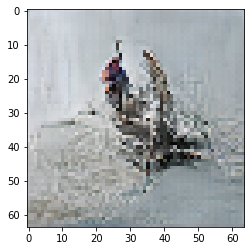

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 33

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6951770782470703 sec
Gen loss: 1.9638018357126337, Disc loss: 2.137614833681207, Disc valid real loss: 0.3946551241372761, Disc valid fake loss: 0.3955957983669482, Disc class real loss: 0.6741952566724074, Disc class fake loss: 0.08158403429153718
Time for epoch 2 is 0.6972715854644775 sec
Gen loss: 1.8848876576674611, Disc loss: 2.180841232600965, Disc valid real loss: 0.38889914907907186, Disc valid fake loss: 0.3933060639782956, Disc class real loss: 0.7009129837939614, Disc class fake loss: 0.08557115554025299
Time for epoch 3 is 0.6955757141113281 sec
Gen loss: 1.85795731920945, Disc loss: 2.1481880639728748, Disc valid real loss: 0.4151729266894491, Disc valid fake loss: 0.3671601038230093, Disc class real loss: 0.6856714298850611, Disc class fake loss: 0.07066480423274793
Time for epoch 4 is 0.6956448554992676 sec
Gen loss: 1.947405187707198

Time for epoch 31 is 0.6942348480224609 sec
Gen loss: 1.8363862351367348, Disc loss: 1.964710505385148, Disc valid real loss: 0.38711720234469366, Disc valid fake loss: 0.378506811041581, Disc class real loss: 0.6273516087155593, Disc class fake loss: 0.12035846827845824
Time for epoch 32 is 0.6887948513031006 sec
Gen loss: 1.8520043084495945, Disc loss: 2.0533673763275146, Disc valid real loss: 0.39885078762706955, Disc valid fake loss: 0.39447954453920064, Disc class real loss: 0.65921614044591, Disc class fake loss: 0.1436547813446898
Time for epoch 33 is 0.6944708824157715 sec
Gen loss: 1.8209426403045654, Disc loss: 2.1515648176795557, Disc valid real loss: 0.4230914759008508, Disc valid fake loss: 0.39163152481380265, Disc class real loss: 0.7018840469812092, Disc class fake loss: 0.12912158550400482
Time for epoch 34 is 0.695145845413208 sec
Gen loss: 1.883539971552397, Disc loss: 1.9996923647428815, Disc valid real loss: 0.40361045379387706, Disc valid fake loss: 0.376553781722

Time for epoch 62 is 0.694739580154419 sec
Gen loss: 1.8493825699153699, Disc loss: 2.0003824484975716, Disc valid real loss: 0.390457830931011, Disc valid fake loss: 0.4011269901928149, Disc class real loss: 0.660975412318581, Disc class fake loss: 0.14963700504679428
Time for epoch 63 is 0.6989421844482422 sec
Gen loss: 1.9028507973018445, Disc loss: 1.9819550702446385, Disc valid real loss: 0.41186943022828354, Disc valid fake loss: 0.3771601852617766, Disc class real loss: 0.6511181153749165, Disc class fake loss: 0.16514144367293307
Time for epoch 64 is 0.6904816627502441 sec
Gen loss: 1.8854722098300332, Disc loss: 1.9712599955107037, Disc valid real loss: 0.42233518236561823, Disc valid fake loss: 0.39256876236514043, Disc class real loss: 0.6310956415377165, Disc class fake loss: 0.1679487930316674
Time for epoch 65 is 0.6909854412078857 sec
Gen loss: 1.8779488801956177, Disc loss: 1.9515293648368435, Disc valid real loss: 0.38296820144904287, Disc valid fake loss: 0.3826320061

Time for epoch 93 is 0.6974596977233887 sec
Gen loss: 1.9126557362707037, Disc loss: 1.8963563567713688, Disc valid real loss: 0.39495764359047536, Disc valid fake loss: 0.3754890968925075, Disc class real loss: 0.6473023891448975, Disc class fake loss: 0.14056100108121572
Time for epoch 94 is 0.6937689781188965 sec
Gen loss: 1.8812896891644126, Disc loss: 1.8919735582251298, Disc valid real loss: 0.3845188429481105, Disc valid fake loss: 0.38698878649033996, Disc class real loss: 0.6464875685541254, Disc class fake loss: 0.13385822467113795
Time for epoch 95 is 0.6957235336303711 sec
Gen loss: 1.8842506283207943, Disc loss: 1.912893389400683, Disc valid real loss: 0.4026778387395959, Disc valid fake loss: 0.38529793839705617, Disc class real loss: 0.648343092516849, Disc class fake loss: 0.143333064490243
Time for epoch 96 is 0.6941759586334229 sec
Gen loss: 1.9057772536026805, Disc loss: 1.9242095884523893, Disc valid real loss: 0.3911193656293969, Disc valid fake loss: 0.38177340595

Time for epoch 123 is 0.6959629058837891 sec
Gen loss: 2.0611792426360283, Disc loss: 1.8769901175247996, Disc valid real loss: 0.38305388077309255, Disc valid fake loss: 0.4035295616639288, Disc class real loss: 0.6378196446519149, Disc class fake loss: 0.2177740813870179
Time for epoch 124 is 0.697197437286377 sec
Gen loss: 1.8779622253618742, Disc loss: 1.8635668378127248, Disc valid real loss: 0.3818592162508714, Disc valid fake loss: 0.3982459385144083, Disc class real loss: 0.6524227543881065, Disc class fake loss: 0.1543843938331855
Time for epoch 125 is 0.6884250640869141 sec
Gen loss: 1.897335642262509, Disc loss: 1.941403589750591, Disc valid real loss: 0.399603324501138, Disc valid fake loss: 0.4122905699830306, Disc class real loss: 0.6809351789323908, Disc class fake loss: 0.16240850443902768
Time for epoch 126 is 0.6969428062438965 sec
Gen loss: 2.0442503251527486, Disc loss: 1.8471558282249851, Disc valid real loss: 0.3694193206335369, Disc valid fake loss: 0.38515511782

Time for epoch 153 is 0.6990821361541748 sec
Gen loss: 1.901924127026608, Disc loss: 1.8034580506776507, Disc valid real loss: 0.4009193856465189, Disc valid fake loss: 0.37665588134213496, Disc class real loss: 0.6645226102126273, Disc class fake loss: 0.11219565295859386
Time for epoch 154 is 0.6981101036071777 sec
Gen loss: 1.9599790510378385, Disc loss: 1.768859675056056, Disc valid real loss: 0.3947444848324123, Disc valid fake loss: 0.38386642776037516, Disc class real loss: 0.642491949232001, Disc class fake loss: 0.10896647721529007
Time for epoch 155 is 0.6961956024169922 sec
Gen loss: 1.9288056586918079, Disc loss: 1.7992069031062878, Disc valid real loss: 0.38490668252894755, Disc valid fake loss: 0.4055830240249634, Disc class real loss: 0.6439429741156729, Disc class fake loss: 0.14190950577980593
Time for epoch 156 is 0.6980280876159668 sec
Gen loss: 1.938302711436623, Disc loss: 1.7477643866288035, Disc valid real loss: 0.40107602665298864, Disc valid fake loss: 0.378399

Time for epoch 183 is 0.6981396675109863 sec
Gen loss: 1.9881092937369096, Disc loss: 1.7376063873893337, Disc valid real loss: 0.3960555917338321, Disc valid fake loss: 0.39707502173750026, Disc class real loss: 0.6460903882980347, Disc class fake loss: 0.11677161133603046
Time for epoch 184 is 0.695798397064209 sec
Gen loss: 1.9134422226956016, Disc loss: 1.7282202494771857, Disc valid real loss: 0.4149484650084847, Disc valid fake loss: 0.38067624600310074, Disc class real loss: 0.6306102715040508, Disc class fake loss: 0.1330496425691404
Time for epoch 185 is 0.6906278133392334 sec
Gen loss: 1.9856913968136436, Disc loss: 1.7443903370907432, Disc valid real loss: 0.3951182192877719, Disc valid fake loss: 0.41061682606998245, Disc class real loss: 0.6347541244406449, Disc class fake loss: 0.13654119188064023
Time for epoch 186 is 0.6951005458831787 sec
Gen loss: 2.019447088241577, Disc loss: 1.6911245208037526, Disc valid real loss: 0.3926578760147095, Disc valid fake loss: 0.376179

Time for epoch 213 is 0.6954007148742676 sec
Gen loss: 2.0113469926934493, Disc loss: 1.6475087153284174, Disc valid real loss: 0.3915961165177195, Disc valid fake loss: 0.3898914973986776, Disc class real loss: 0.6394184921917162, Disc class fake loss: 0.09973174019863731
Time for epoch 214 is 0.6974780559539795 sec
Gen loss: 1.957370124365154, Disc loss: 1.657761762016698, Disc valid real loss: 0.4010927488929347, Disc valid fake loss: 0.3987987182642284, Disc class real loss: 0.6285986743475261, Disc class fake loss: 0.10899218740431886
Time for epoch 215 is 0.6966390609741211 sec
Gen loss: 1.9673830333508944, Disc loss: 1.698425581580714, Disc valid real loss: 0.3923938305754411, Disc valid fake loss: 0.4103036005246012, Disc class real loss: 0.6642563405789828, Disc class fake loss: 0.10373563299837865
Time for epoch 216 is 0.6939105987548828 sec
Gen loss: 1.9867589097273977, Disc loss: 1.6770474910736084, Disc valid real loss: 0.3884400333228864, Disc valid fake loss: 0.391247330

Time for epoch 243 is 0.6963436603546143 sec
Gen loss: 1.8912697340312756, Disc loss: 1.5956859525881315, Disc valid real loss: 0.3908101571233649, Disc valid fake loss: 0.39754061479317515, Disc class real loss: 0.6488031054797926, Disc class fake loss: 0.0871576868781918
Time for epoch 244 is 0.6984899044036865 sec
Gen loss: 2.0925763280768144, Disc loss: 1.5749884153667248, Disc valid real loss: 0.3675883004539891, Disc valid fake loss: 0.39297637657115336, Disc class real loss: 0.6580842388303656, Disc class fake loss: 0.08563953187120588
Time for epoch 245 is 0.6955392360687256 sec
Gen loss: 2.0092825952329134, Disc loss: 1.5968238303535862, Disc valid real loss: 0.3799120619108802, Disc valid fake loss: 0.39025212510635976, Disc class real loss: 0.6670609618488111, Disc class fake loss: 0.09046605170557373
Time for epoch 246 is 0.6988129615783691 sec
Gen loss: 1.8711432720485486, Disc loss: 1.6186087758917558, Disc valid real loss: 0.38557542860507965, Disc valid fake loss: 0.409

Time for epoch 273 is 0.6962456703186035 sec
Gen loss: 1.8895951258508783, Disc loss: 1.5548455213245593, Disc valid real loss: 0.38435233109875727, Disc valid fake loss: 0.3997780398318642, Disc class real loss: 0.6548989666135687, Disc class fake loss: 0.10530736120907884
Time for epoch 274 is 0.698491096496582 sec
Gen loss: 1.9802125002208508, Disc loss: 1.5651381517711438, Disc valid real loss: 0.3866886794567108, Disc valid fake loss: 0.38898292576011856, Disc class real loss: 0.6671758043138605, Disc class fake loss: 0.11370183684323963
Time for epoch 275 is 0.6957437992095947 sec
Gen loss: 2.0195596845526445, Disc loss: 1.5417062859786184, Disc valid real loss: 0.40200869346919815, Disc valid fake loss: 0.3817798573719828, Disc class real loss: 0.6650165037104958, Disc class fake loss: 0.0860266463929101
Time for epoch 276 is 0.696378231048584 sec
Gen loss: 2.014044215804652, Disc loss: 1.5445858302869295, Disc valid real loss: 0.385163205234628, Disc valid fake loss: 0.36841958

Time for epoch 303 is 0.7009701728820801 sec
Gen loss: 2.0549988244709216, Disc loss: 1.5579817169591, Disc valid real loss: 0.3947664875733225, Disc valid fake loss: 0.3981376258950484, Disc class real loss: 0.688654225123556, Disc class fake loss: 0.07654578807322603
Time for epoch 304 is 0.6921727657318115 sec
Gen loss: 1.9419683782677901, Disc loss: 1.5254068688342446, Disc valid real loss: 0.3955242900471938, Disc valid fake loss: 0.3741510165365119, Disc class real loss: 0.6747614709954513, Disc class fake loss: 0.08108883762830182
Time for epoch 305 is 0.6956751346588135 sec
Gen loss: 1.9504981605630172, Disc loss: 1.5401151744942916, Disc valid real loss: 0.398894306860472, Disc valid fake loss: 0.39965824704421193, Disc class real loss: 0.6683070142018167, Disc class fake loss: 0.07337462255044987
Time for epoch 306 is 0.6994845867156982 sec
Gen loss: 1.9745182614577443, Disc loss: 1.5245889488019442, Disc valid real loss: 0.3812962072460275, Disc valid fake loss: 0.3759537566

Time for epoch 333 is 0.6987764835357666 sec
Gen loss: 1.9402266991765875, Disc loss: 1.5202525728627254, Disc valid real loss: 0.3824484536522313, Disc valid fake loss: 0.38933627072133514, Disc class real loss: 0.6825404951446935, Disc class fake loss: 0.06605065986514091
Time for epoch 334 is 0.6905200481414795 sec
Gen loss: 1.9783016819702952, Disc loss: 1.5192671386819137, Disc valid real loss: 0.3913869426438683, Disc valid fake loss: 0.3828066571762687, Disc class real loss: 0.6574874739897879, Disc class fake loss: 0.08770003424663293
Time for epoch 335 is 0.70035719871521 sec
Gen loss: 2.003798196190282, Disc loss: 1.4901503324508667, Disc valid real loss: 0.3805870602005406, Disc valid fake loss: 0.3798895195910805, Disc class real loss: 0.6582540556004173, Disc class fake loss: 0.0715370737016201
Time for epoch 336 is 0.7008621692657471 sec
Gen loss: 1.9590601419147693, Disc loss: 1.5382778456336574, Disc valid real loss: 0.3942269322119261, Disc valid fake loss: 0.391633912

Time for epoch 363 is 0.6986665725708008 sec
Gen loss: 2.0919148921966553, Disc loss: 1.5154260396957397, Disc valid real loss: 0.3657361096457431, Disc valid fake loss: 0.3854956422981463, Disc class real loss: 0.6800372569184554, Disc class fake loss: 0.08427620012509196
Time for epoch 364 is 0.696009635925293 sec
Gen loss: 2.0195266071118807, Disc loss: 1.5214273239436902, Disc valid real loss: 0.408154873471511, Disc valid fake loss: 0.3902008455050619, Disc class real loss: 0.6460702921214857, Disc class fake loss: 0.07711511105298996
Time for epoch 365 is 0.7008669376373291 sec
Gen loss: 1.9677277991646214, Disc loss: 1.5380128120121204, Disc valid real loss: 0.3959876204791822, Disc valid fake loss: 0.3953022172576503, Disc class real loss: 0.6730267844702068, Disc class fake loss: 0.07381604504036277
Time for epoch 366 is 0.6996078491210938 sec
Gen loss: 1.9408023294649626, Disc loss: 1.58306790653028, Disc valid real loss: 0.41246503748391805, Disc valid fake loss: 0.412921372

Time for epoch 393 is 0.6959145069122314 sec
Gen loss: 2.02138814800664, Disc loss: 1.5893986287869906, Disc valid real loss: 0.3913732610250774, Disc valid fake loss: 0.4024069795483037, Disc class real loss: 0.693128294066379, Disc class fake loss: 0.10260823369026184
Time for epoch 394 is 0.6977074146270752 sec
Gen loss: 2.0018461566222343, Disc loss: 1.5060570365504216, Disc valid real loss: 0.3995190749042912, Disc valid fake loss: 0.37327415770605993, Disc class real loss: 0.6547729341607345, Disc class fake loss: 0.07860613418252844
Time for epoch 395 is 0.6961750984191895 sec
Gen loss: 1.9894339787332636, Disc loss: 1.5240421169682552, Disc valid real loss: 0.3837629635083048, Disc valid fake loss: 0.38068963352002594, Disc class real loss: 0.6862064505878248, Disc class fake loss: 0.07350564944116693
Time for epoch 396 is 0.6979267597198486 sec
Gen loss: 1.9693424952657599, Disc loss: 1.528767610851087, Disc valid real loss: 0.37487648349059255, Disc valid fake loss: 0.4186781

Time for epoch 423 is 0.6997580528259277 sec
Gen loss: 1.920284252417715, Disc loss: 1.502201099144785, Disc valid real loss: 0.38164753741339635, Disc valid fake loss: 0.39807958665647003, Disc class real loss: 0.6473959903968008, Disc class fake loss: 0.07519242569412056
Time for epoch 424 is 0.6970889568328857 sec
Gen loss: 2.02654851110358, Disc loss: 1.5749073969690424, Disc valid real loss: 0.40926538643084076, Disc valid fake loss: 0.38654487697701706, Disc class real loss: 0.6921336619477523, Disc class fake loss: 0.08708451658879456
Time for epoch 425 is 0.6979424953460693 sec
Gen loss: 1.9596609755566246, Disc loss: 1.5278422957972477, Disc valid real loss: 0.3843436398004231, Disc valid fake loss: 0.39974761871915115, Disc class real loss: 0.6645974861948114, Disc class fake loss: 0.07927064166257256
Time for epoch 426 is 0.6987736225128174 sec
Gen loss: 1.9653416244607222, Disc loss: 1.5366512787969488, Disc valid real loss: 0.3898247856842844, Disc valid fake loss: 0.40385

Time for epoch 453 is 0.6981794834136963 sec
Gen loss: 1.940719347251089, Disc loss: 1.5257173651143123, Disc valid real loss: 0.39387437936506775, Disc valid fake loss: 0.37602161106310394, Disc class real loss: 0.6802460112069783, Disc class fake loss: 0.07569628336319797
Time for epoch 454 is 0.7034993171691895 sec
Gen loss: 2.015206776167217, Disc loss: 1.531538072385286, Disc valid real loss: 0.4057696791071641, Disc valid fake loss: 0.38348236366322164, Disc class real loss: 0.6640181478701139, Disc class fake loss: 0.07838500526390578
Time for epoch 455 is 0.6956689357757568 sec
Gen loss: 1.9274177300302606, Disc loss: 1.5197648625624807, Disc valid real loss: 0.3931605800202018, Disc valid fake loss: 0.388847595766971, Disc class real loss: 0.6627866908123619, Disc class fake loss: 0.07508755808598117
Time for epoch 456 is 0.7108137607574463 sec
Gen loss: 1.8771800367455733, Disc loss: 1.5782931352916516, Disc valid real loss: 0.39712987604894134, Disc valid fake loss: 0.391089

Time for epoch 483 is 0.6991822719573975 sec
Gen loss: 1.873971844974317, Disc loss: 1.5212030724475258, Disc valid real loss: 0.38868688517495203, Disc valid fake loss: 0.3971534057667381, Disc class real loss: 0.6636827054776644, Disc class fake loss: 0.07179850575171019
Time for epoch 484 is 0.6971108913421631 sec
Gen loss: 1.9569486316881681, Disc loss: 1.5435786435478611, Disc valid real loss: 0.3890961596840306, Disc valid fake loss: 0.3934014894460377, Disc class real loss: 0.6858868724421451, Disc class fake loss: 0.07531623326634106
Time for epoch 485 is 0.6984574794769287 sec
Gen loss: 1.9692316619973433, Disc loss: 1.5168538030825163, Disc valid real loss: 0.37527265987898173, Disc valid fake loss: 0.3783047622755954, Disc class real loss: 0.6894158438632363, Disc class fake loss: 0.07398363849834393
Time for epoch 486 is 0.6969201564788818 sec
Gen loss: 2.0174820234901025, Disc loss: 1.5226793414668034, Disc valid real loss: 0.38870410542739064, Disc valid fake loss: 0.3784

Time for epoch 513 is 0.6968364715576172 sec
Gen loss: 1.9237005522376613, Disc loss: 1.4754700974414223, Disc valid real loss: 0.37799909554029765, Disc valid fake loss: 0.3783504108065053, Disc class real loss: 0.6378091542344344, Disc class fake loss: 0.08142276265119251
Time for epoch 514 is 0.69441819190979 sec
Gen loss: 1.9398402352082103, Disc loss: 1.6003341674804688, Disc valid real loss: 0.40508294262384115, Disc valid fake loss: 0.39642642673693207, Disc class real loss: 0.7188166505412051, Disc class fake loss: 0.08013590935029481
Time for epoch 515 is 0.6954727172851562 sec
Gen loss: 1.9088244312687923, Disc loss: 1.5526381731033325, Disc valid real loss: 0.3893340245673531, Disc valid fake loss: 0.3777249408395667, Disc class real loss: 0.7161888605669925, Disc class fake loss: 0.06951969136532984
Time for epoch 516 is 0.7000324726104736 sec
Gen loss: 1.9443612224177311, Disc loss: 1.4846177226618718, Disc valid real loss: 0.37363238005261673, Disc valid fake loss: 0.3808

Time for epoch 543 is 0.6922075748443604 sec
Gen loss: 1.9789973999324597, Disc loss: 1.531788524828459, Disc valid real loss: 0.3787124941223546, Disc valid fake loss: 0.3843051446111579, Disc class real loss: 0.6815156089632135, Disc class fake loss: 0.08737411751951042
Time for epoch 544 is 0.6981353759765625 sec
Gen loss: 2.0085955983714054, Disc loss: 1.5536197423934937, Disc valid real loss: 0.3838952168038017, Disc valid fake loss: 0.39620840235760335, Disc class real loss: 0.6973363035603574, Disc class fake loss: 0.0763040542798607
Time for epoch 545 is 0.6956846714019775 sec
Gen loss: 1.9172650575637817, Disc loss: 1.522322836675142, Disc valid real loss: 0.3860065576277281, Disc valid fake loss: 0.3833603200159575, Disc class real loss: 0.6558145221910978, Disc class fake loss: 0.0972531600610206
Time for epoch 546 is 0.6919057369232178 sec
Gen loss: 1.8392091613066823, Disc loss: 1.5412289406123914, Disc valid real loss: 0.39692611443369014, Disc valid fake loss: 0.40430545

Time for epoch 573 is 0.6960806846618652 sec
Gen loss: 2.0443126276919714, Disc loss: 1.5623432146875482, Disc valid real loss: 0.41069389017004715, Disc valid fake loss: 0.37774177287754257, Disc class real loss: 0.6981669821237263, Disc class fake loss: 0.0758650530325739
Time for epoch 574 is 0.6924428939819336 sec
Gen loss: 2.024622126629478, Disc loss: 1.5455660380815204, Disc valid real loss: 0.4136072914851339, Disc valid fake loss: 0.39066191880326523, Disc class real loss: 0.6662405070505644, Disc class fake loss: 0.07517454184983906
Time for epoch 575 is 0.6944530010223389 sec
Gen loss: 1.910796924641258, Disc loss: 1.5693096926337795, Disc valid real loss: 0.3895207000406165, Disc valid fake loss: 0.39733690807693883, Disc class real loss: 0.6956722799100374, Disc class fake loss: 0.08690154728920836
Time for epoch 576 is 0.6867847442626953 sec
Gen loss: 1.9735441082402279, Disc loss: 1.5320223193419606, Disc valid real loss: 0.40792981574409887, Disc valid fake loss: 0.3913

Time for epoch 603 is 0.7027864456176758 sec
Gen loss: 1.9577402315641705, Disc loss: 1.5674173769197965, Disc valid real loss: 0.3951999725479829, Disc valid fake loss: 0.40316144886769745, Disc class real loss: 0.6934825997603568, Disc class fake loss: 0.07569695156263678
Time for epoch 604 is 0.7006287574768066 sec
Gen loss: 1.907788031979611, Disc loss: 1.5608134144230892, Disc valid real loss: 0.40151571756915044, Disc valid fake loss: 0.404956739199789, Disc class real loss: 0.6659042458785208, Disc class fake loss: 0.08855220802912586
Time for epoch 605 is 0.7019650936126709 sec
Gen loss: 1.9260190913551731, Disc loss: 1.5623436915247064, Disc valid real loss: 0.40448247915820074, Disc valid fake loss: 0.38765751060686615, Disc class real loss: 0.6829048112819069, Disc class fake loss: 0.08741800134119235
Time for epoch 606 is 0.7041382789611816 sec
Gen loss: 1.8616804323698346, Disc loss: 1.5764063157533343, Disc valid real loss: 0.4080185027498948, Disc valid fake loss: 0.4124

Time for epoch 633 is 0.6955180168151855 sec
Gen loss: 2.0548626560913887, Disc loss: 1.5382725188606663, Disc valid real loss: 0.3771463240447797, Disc valid fake loss: 0.39575975662783575, Disc class real loss: 0.6720345334002846, Disc class fake loss: 0.09344761838254176
Time for epoch 634 is 0.6950063705444336 sec
Gen loss: 1.9483666169015985, Disc loss: 1.5202760759152865, Disc valid real loss: 0.3720603930322747, Disc valid fake loss: 0.3755052732793908, Disc class real loss: 0.68247368774916, Disc class fake loss: 0.09035513530436315
Time for epoch 635 is 0.6959328651428223 sec
Gen loss: 2.043960188564501, Disc loss: 1.5138754279989945, Disc valid real loss: 0.3850399804742713, Disc valid fake loss: 0.38760765132151154, Disc class real loss: 0.667019900522734, Disc class fake loss: 0.07432647706254532
Time for epoch 636 is 0.6978340148925781 sec
Gen loss: 1.9373819765291715, Disc loss: 1.5139317826220864, Disc valid real loss: 0.380866958906776, Disc valid fake loss: 0.401986577

Time for epoch 663 is 0.6965327262878418 sec
Gen loss: 1.8971162093313116, Disc loss: 1.5287562796944065, Disc valid real loss: 0.3827573029618514, Disc valid fake loss: 0.38964604704003586, Disc class real loss: 0.6703417552144904, Disc class fake loss: 0.08612802409027752
Time for epoch 664 is 0.6921985149383545 sec
Gen loss: 1.935130106775384, Disc loss: 1.5158289419977289, Disc valid real loss: 0.3891899570038444, Disc valid fake loss: 0.3826325849482888, Disc class real loss: 0.6639172434806824, Disc class fake loss: 0.08020590265330516
Time for epoch 665 is 0.6870162487030029 sec
Gen loss: 1.9413200554094816, Disc loss: 1.5268576835331165, Disc valid real loss: 0.4126919209957123, Disc valid fake loss: 0.4013190426324543, Disc class real loss: 0.6456473940297177, Disc class fake loss: 0.06731499809967845
Time for epoch 666 is 0.6938796043395996 sec
Gen loss: 1.9224723953949778, Disc loss: 1.5453153221230758, Disc valid real loss: 0.39147638176616867, Disc valid fake loss: 0.38759

Time for epoch 693 is 0.6963808536529541 sec
Gen loss: 1.8947242247430902, Disc loss: 1.5680940339439793, Disc valid real loss: 0.3898330934737858, Disc valid fake loss: 0.38810102406300995, Disc class real loss: 0.6903599877106515, Disc class fake loss: 0.09991803020238876
Time for epoch 694 is 0.6979408264160156 sec
Gen loss: 1.9569819538216842, Disc loss: 1.5680057249571149, Disc valid real loss: 0.40168363169619914, Disc valid fake loss: 0.3941571932089956, Disc class real loss: 0.676053850274337, Disc class fake loss: 0.09622704041631598
Time for epoch 695 is 0.7016327381134033 sec
Gen loss: 1.9117322909204584, Disc loss: 1.556953844271208, Disc valid real loss: 0.3894359343930295, Disc valid fake loss: 0.40478516095562983, Disc class real loss: 0.683148205280304, Disc class fake loss: 0.07970527912441053
Time for epoch 696 is 0.6964197158813477 sec
Gen loss: 2.159766015253569, Disc loss: 1.575629842908759, Disc valid real loss: 0.4047365941499409, Disc valid fake loss: 0.39658613

Time for epoch 723 is 0.6979916095733643 sec
Gen loss: 1.9067561626434326, Disc loss: 1.5356710960990505, Disc valid real loss: 0.3936176488274022, Disc valid fake loss: 0.3920818630017732, Disc class real loss: 0.6872863298968265, Disc class fake loss: 0.0628101443381686
Time for epoch 724 is 0.6977818012237549 sec
Gen loss: 1.9062672978953312, Disc loss: 1.5145551781905324, Disc valid real loss: 0.39331352240160894, Disc valid fake loss: 0.4004102153213401, Disc class real loss: 0.6360922079337271, Disc class fake loss: 0.08484946014849763
Time for epoch 725 is 0.6954550743103027 sec
Gen loss: 1.9694974987130416, Disc loss: 1.5222556089100086, Disc valid real loss: 0.3946786711090489, Disc valid fake loss: 0.3936112679933247, Disc class real loss: 0.6494956110653124, Disc class fake loss: 0.08458306522745836
Time for epoch 726 is 0.6960957050323486 sec
Gen loss: 1.9216242526706897, Disc loss: 1.5379756187137805, Disc valid real loss: 0.40349626541137695, Disc valid fake loss: 0.41551

Time for epoch 753 is 0.6989152431488037 sec
Gen loss: 2.007579703080027, Disc loss: 1.489642990262885, Disc valid real loss: 0.3751015176898555, Disc valid fake loss: 0.38952629895586716, Disc class real loss: 0.6418586875263014, Disc class fake loss: 0.08326822754583861
Time for epoch 754 is 0.6899316310882568 sec
Gen loss: 1.975805778252451, Disc loss: 1.5388348918212087, Disc valid real loss: 0.39085389752137034, Disc valid fake loss: 0.3939794129446933, Disc class real loss: 0.6771690155330458, Disc class fake loss: 0.0769526258503136
Time for epoch 755 is 0.6989617347717285 sec
Gen loss: 1.9708885017194246, Disc loss: 1.5250731455652338, Disc valid real loss: 0.38622439535040604, Disc valid fake loss: 0.3779892654795396, Disc class real loss: 0.6842578335812217, Disc class fake loss: 0.07672318071126938
Time for epoch 756 is 0.6994774341583252 sec
Gen loss: 1.9271079364575838, Disc loss: 1.550353018861068, Disc valid real loss: 0.39500751463990463, Disc valid fake loss: 0.3896031

Time for epoch 783 is 0.6949970722198486 sec
Gen loss: 1.8974842711498863, Disc loss: 1.5623613282253868, Disc valid real loss: 0.3971793118276094, Disc valid fake loss: 0.39781214375244944, Disc class real loss: 0.7011287494709617, Disc class fake loss: 0.06636809459642361
Time for epoch 784 is 0.695040225982666 sec
Gen loss: 1.9972679113086902, Disc loss: 1.56822837653913, Disc valid real loss: 0.40372932584662186, Disc valid fake loss: 0.38201414283953217, Disc class real loss: 0.692904249617928, Disc class fake loss: 0.08970132391703756
Time for epoch 785 is 0.6967461109161377 sec
Gen loss: 1.937143325805664, Disc loss: 1.549581998272946, Disc valid real loss: 0.3957006131347857, Disc valid fake loss: 0.38833898619601603, Disc class real loss: 0.6745840938467729, Disc class fake loss: 0.0910749892263036
Time for epoch 786 is 0.6971311569213867 sec
Gen loss: 1.9627661391308433, Disc loss: 1.5359687554208856, Disc valid real loss: 0.38680494302197505, Disc valid fake loss: 0.40975312

Time for epoch 813 is 0.6902501583099365 sec
Gen loss: 1.9418783062382747, Disc loss: 1.5280212791342485, Disc valid real loss: 0.37483138787119014, Disc valid fake loss: 0.400886008613988, Disc class real loss: 0.6939001804903934, Disc class fake loss: 0.05853081465159592
Time for epoch 814 is 0.6979985237121582 sec
Gen loss: 1.9256369691146047, Disc loss: 1.526755872525667, Disc valid real loss: 0.3648694832074015, Disc valid fake loss: 0.39487598052150324, Disc class real loss: 0.6870806813240051, Disc class fake loss: 0.08005113546785556
Time for epoch 815 is 0.6969578266143799 sec
Gen loss: 1.9892674559041073, Disc loss: 1.4963642672488564, Disc valid real loss: 0.37206852749774333, Disc valid fake loss: 0.3860476079740022, Disc class real loss: 0.6656690177164579, Disc class fake loss: 0.07269772867623128
Time for epoch 816 is 0.696631669998169 sec
Gen loss: 1.9926144010142277, Disc loss: 1.4916296005249023, Disc valid real loss: 0.39850325725580515, Disc valid fake loss: 0.37368

Time for epoch 843 is 0.6939020156860352 sec
Gen loss: 1.9558893253928737, Disc loss: 1.4835644082019204, Disc valid real loss: 0.38979961840729965, Disc valid fake loss: 0.37856673096355636, Disc class real loss: 0.6452616735508567, Disc class fake loss: 0.07005146224247782
Time for epoch 844 is 0.6951904296875 sec
Gen loss: 2.003343387653953, Disc loss: 1.442850250946848, Disc valid real loss: 0.37635468966082525, Disc valid fake loss: 0.3689000528109701, Disc class real loss: 0.6415738839852182, Disc class fake loss: 0.056138719579106884
Time for epoch 845 is 0.6936144828796387 sec
Gen loss: 2.0321285034480847, Disc loss: 1.5216730393861468, Disc valid real loss: 0.3888346819501174, Disc valid fake loss: 0.3864830944098924, Disc class real loss: 0.6809397873125578, Disc class fake loss: 0.0655385673438248
Time for epoch 846 is 0.6952311992645264 sec
Gen loss: 1.9327812947724994, Disc loss: 1.5524307301169948, Disc valid real loss: 0.39215122712285894, Disc valid fake loss: 0.3965471

Time for epoch 873 is 0.6971633434295654 sec
Gen loss: 1.9159435284765143, Disc loss: 1.569082354244433, Disc valid real loss: 0.38950136774464655, Disc valid fake loss: 0.39844808609862076, Disc class real loss: 0.705276580233323, Disc class fake loss: 0.07598221792202246
Time for epoch 874 is 0.6938090324401855 sec
Gen loss: 1.94131338596344, Disc loss: 1.531245796304, Disc valid real loss: 0.39335810353881434, Disc valid fake loss: 0.3966629238505113, Disc class real loss: 0.6671109670086911, Disc class fake loss: 0.07423241044345655
Time for epoch 875 is 0.6922633647918701 sec
Gen loss: 1.9814156293869019, Disc loss: 1.5224976539611816, Disc valid real loss: 0.3818946841515993, Disc valid fake loss: 0.3868687262660579, Disc class real loss: 0.6679177252869857, Disc class fake loss: 0.08593295455763214
Time for epoch 876 is 0.6958446502685547 sec
Gen loss: 1.9760947917637073, Disc loss: 1.5081107428199367, Disc valid real loss: 0.3581681329953043, Disc valid fake loss: 0.39472542938

Time for epoch 903 is 0.6983363628387451 sec
Gen loss: 1.894062173993964, Disc loss: 1.540177715452094, Disc valid real loss: 0.38517454266548157, Disc valid fake loss: 0.3888226590658489, Disc class real loss: 0.6803701959158245, Disc class fake loss: 0.08592921730719115
Time for epoch 904 is 0.6937088966369629 sec
Gen loss: 1.875065841172871, Disc loss: 1.5129006348158185, Disc valid real loss: 0.41456411543645355, Disc valid fake loss: 0.3792999935777564, Disc class real loss: 0.6617985712854486, Disc class fake loss: 0.05735882704979495
Time for epoch 905 is 0.696521520614624 sec
Gen loss: 1.9837679925717806, Disc loss: 1.516474541864897, Disc valid real loss: 0.3994362542503758, Disc valid fake loss: 0.390553385803574, Disc class real loss: 0.6526100572786833, Disc class fake loss: 0.07399059420353488
Time for epoch 906 is 0.6973135471343994 sec
Gen loss: 1.8629564360568398, Disc loss: 1.5987791575883563, Disc valid real loss: 0.38631813149703176, Disc valid fake loss: 0.420274535

Time for epoch 933 is 0.6970908641815186 sec
Gen loss: 1.915800182442916, Disc loss: 1.524891225915206, Disc valid real loss: 0.38347772548073217, Disc valid fake loss: 0.39913564763571086, Disc class real loss: 0.6873919901094938, Disc class fake loss: 0.05501233766737737
Time for epoch 934 is 0.6953377723693848 sec
Gen loss: 1.9628510475158691, Disc loss: 1.5411983038249768, Disc valid real loss: 0.385790649213289, Disc valid fake loss: 0.3975889620028044, Disc class real loss: 0.6724177693065844, Disc class fake loss: 0.08551829425912154
Time for epoch 935 is 0.6937932968139648 sec
Gen loss: 1.8948691016749333, Disc loss: 1.5206740278946727, Disc valid real loss: 0.3661449598638635, Disc valid fake loss: 0.40491794598729985, Disc class real loss: 0.6741332945070768, Disc class fake loss: 0.07559756228798314
Time for epoch 936 is 0.6926846504211426 sec
Gen loss: 1.9338103030857288, Disc loss: 1.5624328036057322, Disc valid real loss: 0.3872983267432765, Disc valid fake loss: 0.390171

Time for epoch 963 is 0.6957638263702393 sec
Gen loss: 1.9638020239378278, Disc loss: 1.496558151747051, Disc valid real loss: 0.37804535345027324, Disc valid fake loss: 0.3658037891513423, Disc class real loss: 0.6734603674788224, Disc class fake loss: 0.07936750685698107
Time for epoch 964 is 0.6958022117614746 sec
Gen loss: 1.8634937876149227, Disc loss: 1.5435561255404824, Disc valid real loss: 0.3888162405867326, Disc valid fake loss: 0.4022277028937089, Disc class real loss: 0.6703590248760424, Disc class fake loss: 0.08227079283250005
Time for epoch 965 is 0.6952850818634033 sec
Gen loss: 1.996074356530842, Disc loss: 1.591099877106516, Disc valid real loss: 0.4009558103586498, Disc valid fake loss: 0.3834705839031621, Disc class real loss: 0.6854240266900313, Disc class fake loss: 0.12136229147252284
Time for epoch 966 is 0.6991405487060547 sec
Gen loss: 2.310152574589378, Disc loss: 1.6490309175692106, Disc valid real loss: 0.3994513373625906, Disc valid fake loss: 0.388576609

Time for epoch 993 is 0.694481611251831 sec
Gen loss: 1.9919171082346063, Disc loss: 1.520035837825976, Disc valid real loss: 0.37395388829080684, Disc valid fake loss: 0.39131452064765126, Disc class real loss: 0.6703863112550033, Disc class fake loss: 0.08449830036414296
Time for epoch 994 is 0.695380687713623 sec
Gen loss: 1.9392558900933516, Disc loss: 1.4832079912486829, Disc valid real loss: 0.36876328211081655, Disc valid fake loss: 0.3827679063144483, Disc class real loss: 0.6710126964669478, Disc class fake loss: 0.060786186570399685
Time for epoch 995 is 0.6946449279785156 sec
Gen loss: 1.9014992337477834, Disc loss: 1.5487758611377918, Disc valid real loss: 0.382000575724401, Disc valid fake loss: 0.3999530484801845, Disc class real loss: 0.68665349012927, Disc class fake loss: 0.08029004225605413
Time for epoch 996 is 0.6969969272613525 sec
Gen loss: 1.9485673527968557, Disc loss: 1.480318496101781, Disc valid real loss: 0.36205086582585383, Disc valid fake loss: 0.40310564

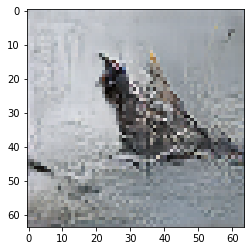

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 34

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6944301128387451 sec
Gen loss: 1.858055171213652, Disc loss: 2.1878700130864193, Disc valid real loss: 0.3884726323579487, Disc valid fake loss: 0.4109496976199903, Disc class real loss: 0.6947485490849143, Disc class fake loss: 0.0723197073920777
Time for epoch 2 is 0.697829008102417 sec
Gen loss: 1.9094331829171431, Disc loss: 2.1232466321242485, Disc valid real loss: 0.3958995216771176, Disc valid fake loss: 0.38953307741566706, Disc class real loss: 0.6704326177898207, Disc class fake loss: 0.09413702550687288
Time for epoch 3 is 0.6989610195159912 sec
Gen loss: 1.8802622619428133, Disc loss: 2.098031840826336, Disc valid real loss: 0.40917110443115234, Disc valid fake loss: 0.39508426346276937, Disc class real loss: 0.649291267520503, Disc class fake loss: 0.10829513892531395
Time for epoch 4 is 0.6954922676086426 sec
Gen loss: 1.81636941432952

Time for epoch 31 is 0.7001619338989258 sec
Gen loss: 1.856968183266489, Disc loss: 2.061826047144438, Disc valid real loss: 0.38191925067650645, Disc valid fake loss: 0.3991363048553467, Disc class real loss: 0.6699071714752599, Disc class fake loss: 0.13195409900263735
Time for epoch 32 is 0.6942422389984131 sec
Gen loss: 1.851054913119266, Disc loss: 2.0714967752757825, Disc valid real loss: 0.40881950917996857, Disc valid fake loss: 0.3866086429671237, Disc class real loss: 0.6686299819695322, Disc class fake loss: 0.1285055758137452
Time for epoch 33 is 0.6990609169006348 sec
Gen loss: 1.8270170814112614, Disc loss: 2.050133127915232, Disc valid real loss: 0.3821834514015599, Disc valid fake loss: 0.3814467960282376, Disc class real loss: 0.6741168122542532, Disc class fake loss: 0.14567144842524277
Time for epoch 34 is 0.6951680183410645 sec
Gen loss: 1.8268635272979736, Disc loss: 2.0355958185697856, Disc valid real loss: 0.3979197866038272, Disc valid fake loss: 0.3824027541436

Time for epoch 62 is 0.6910183429718018 sec
Gen loss: 1.8574193778790926, Disc loss: 2.018076093573319, Disc valid real loss: 0.421083716969741, Disc valid fake loss: 0.3831479282755601, Disc class real loss: 0.6650542616844177, Disc class fake loss: 0.13960663464508558
Time for epoch 63 is 0.6936359405517578 sec
Gen loss: 1.8442439531025134, Disc loss: 1.9622132464459068, Disc valid real loss: 0.37886943550486313, Disc valid fake loss: 0.3909477168007901, Disc class real loss: 0.6539747056208158, Disc class fake loss: 0.1402922309935093
Time for epoch 64 is 0.6964502334594727 sec
Gen loss: 1.9209992822847868, Disc loss: 1.9449925987344039, Disc valid real loss: 0.385748133847588, Disc valid fake loss: 0.3778991997241974, Disc class real loss: 0.6499712592677066, Disc class fake loss: 0.13111800700426102
Time for epoch 65 is 0.6956272125244141 sec
Gen loss: 1.848552710131595, Disc loss: 1.9673123673388833, Disc valid real loss: 0.37512916640231486, Disc valid fake loss: 0.3948953873232

Time for epoch 93 is 0.6963276863098145 sec
Gen loss: 1.8459150038267438, Disc loss: 1.9173065047515065, Disc valid real loss: 0.41135341713303014, Disc valid fake loss: 0.37955176202874435, Disc class real loss: 0.6465061808887281, Disc class fake loss: 0.14607159322813937
Time for epoch 94 is 0.6945953369140625 sec
Gen loss: 1.9064628387752331, Disc loss: 1.9499964902275486, Disc valid real loss: 0.4037080775750311, Disc valid fake loss: 0.3952819548155132, Disc class real loss: 0.6648048601652446, Disc class fake loss: 0.13398377832613492
Time for epoch 95 is 0.6947312355041504 sec
Gen loss: 1.875265215572558, Disc loss: 1.9166485259407444, Disc valid real loss: 0.37781841660800736, Disc valid fake loss: 0.3814622806875329, Disc class real loss: 0.6636943377946553, Disc class fake loss: 0.163866048188586
Time for epoch 96 is 0.6973237991333008 sec
Gen loss: 1.8815302409623798, Disc loss: 1.9009244818436473, Disc valid real loss: 0.3862189736805464, Disc valid fake loss: 0.3949663419

Time for epoch 123 is 0.6940796375274658 sec
Gen loss: 1.947503127549824, Disc loss: 1.891042012917368, Disc valid real loss: 0.3850946881269154, Disc valid fake loss: 0.4030956186746296, Disc class real loss: 0.6723244958802274, Disc class fake loss: 0.12403506373888568
Time for epoch 124 is 0.6955506801605225 sec
Gen loss: 1.8608703362314325, Disc loss: 1.8818336913460179, Disc valid real loss: 0.38990350146042674, Disc valid fake loss: 0.3905326582883534, Disc class real loss: 0.6696043453718487, Disc class fake loss: 0.13456972453155017
Time for epoch 125 is 0.6950123310089111 sec
Gen loss: 1.9226309562984265, Disc loss: 1.8379014604970028, Disc valid real loss: 0.3994212291742626, Disc valid fake loss: 0.39784667523283707, Disc class real loss: 0.6327712316262094, Disc class fake loss: 0.1308387682626122
Time for epoch 126 is 0.6953554153442383 sec
Gen loss: 1.903178848718342, Disc loss: 1.8420630066018355, Disc valid real loss: 0.3843224017243636, Disc valid fake loss: 0.38959075

Time for epoch 153 is 0.6921381950378418 sec
Gen loss: 2.0055451142160514, Disc loss: 1.8020528868625039, Disc valid real loss: 0.3981633594161586, Disc valid fake loss: 0.3906309259565253, Disc class real loss: 0.6573235439626794, Disc class fake loss: 0.10822401705541108
Time for epoch 154 is 0.6937212944030762 sec
Gen loss: 1.9217442587802285, Disc loss: 1.8202758713772422, Disc valid real loss: 0.37725229482901723, Disc valid fake loss: 0.3923909146534769, Disc class real loss: 0.6753993630409241, Disc class fake loss: 0.1320915375100939
Time for epoch 155 is 0.7021374702453613 sec
Gen loss: 1.9574396045584428, Disc loss: 1.8107887882935374, Disc valid real loss: 0.3938650347684559, Disc valid fake loss: 0.3970801093076405, Disc class real loss: 0.6632290858971445, Disc class fake loss: 0.11185175082401226
Time for epoch 156 is 0.6982166767120361 sec
Gen loss: 1.949785496059217, Disc loss: 1.7737192793896324, Disc valid real loss: 0.38224654448659795, Disc valid fake loss: 0.401171

Time for epoch 183 is 0.6938889026641846 sec
Gen loss: 2.074563653845536, Disc loss: 1.7383966006730731, Disc valid real loss: 0.3734247762905924, Disc valid fake loss: 0.38113214467701156, Disc class real loss: 0.6822489343191448, Disc class fake loss: 0.10276290107714503
Time for epoch 184 is 0.6909949779510498 sec
Gen loss: 1.8791464755409641, Disc loss: 1.7314147886477018, Disc valid real loss: 0.38629641187818425, Disc valid fake loss: 0.37493092292233515, Disc class real loss: 0.6630429468656841, Disc class fake loss: 0.12416182360366772
Time for epoch 185 is 0.6905145645141602 sec
Gen loss: 1.976775520726254, Disc loss: 1.7458467609003971, Disc valid real loss: 0.40370597964838933, Disc valid fake loss: 0.4012742450362758, Disc class real loss: 0.6420146571962457, Disc class fake loss: 0.12532403986704976
Time for epoch 186 is 0.6978228092193604 sec
Gen loss: 1.9727595103414435, Disc loss: 1.7369230797416286, Disc valid real loss: 0.37664498075058583, Disc valid fake loss: 0.395

Time for epoch 213 is 0.6921944618225098 sec
Gen loss: 1.9146569779044704, Disc loss: 1.7174689393294484, Disc valid real loss: 0.38665759720300374, Disc valid fake loss: 0.3873844993741889, Disc class real loss: 0.6960632330492923, Disc class fake loss: 0.10940131878382281
Time for epoch 214 is 0.695432186126709 sec
Gen loss: 1.9787707642505044, Disc loss: 1.6841316662336652, Disc valid real loss: 0.38318845002274765, Disc valid fake loss: 0.3937513412613618, Disc class real loss: 0.6725820679413644, Disc class fake loss: 0.10269200958703693
Time for epoch 215 is 0.6973171234130859 sec
Gen loss: 1.9990761217318083, Disc loss: 1.6674625120664899, Disc valid real loss: 0.4001080699657139, Disc valid fake loss: 0.3883560244974337, Disc class real loss: 0.6530549306618539, Disc class fake loss: 0.09989945198360242
Time for epoch 216 is 0.6934802532196045 sec
Gen loss: 1.9064650849292153, Disc loss: 1.672387254865546, Disc valid real loss: 0.40007564739177104, Disc valid fake loss: 0.38215

Time for epoch 243 is 0.6980602741241455 sec
Gen loss: 1.8975365852054797, Disc loss: 1.6185316161105507, Disc valid real loss: 0.39615943400483383, Disc valid fake loss: 0.38511711672732707, Disc class real loss: 0.6487425691203067, Disc class fake loss: 0.1214688075216193
Time for epoch 244 is 0.6945056915283203 sec
Gen loss: 2.002066442840978, Disc loss: 1.6119212100380345, Disc valid real loss: 0.39360499225164713, Disc valid fake loss: 0.38517930084153224, Disc class real loss: 0.6594917585975245, Disc class fake loss: 0.10517788952902744
Time for epoch 245 is 0.6965968608856201 sec
Gen loss: 2.0382575361352218, Disc loss: 1.6563951529954608, Disc valid real loss: 0.4277671010870683, Disc valid fake loss: 0.3963865904431594, Disc class real loss: 0.6715397960261295, Disc class fake loss: 0.09109952124325853
Time for epoch 246 is 0.6957685947418213 sec
Gen loss: 1.9517033351095099, Disc loss: 1.6250646679024947, Disc valid real loss: 0.40661850885341044, Disc valid fake loss: 0.382

Time for epoch 273 is 0.6969237327575684 sec
Gen loss: 1.9787612651523792, Disc loss: 1.5305039506209523, Disc valid real loss: 0.40624363171426875, Disc valid fake loss: 0.3841916746214816, Disc class real loss: 0.6448302614061456, Disc class fake loss: 0.0845306937239672
Time for epoch 274 is 0.6946730613708496 sec
Gen loss: 1.987755342533714, Disc loss: 1.5566523326070685, Disc valid real loss: 0.3761636803024693, Disc valid fake loss: 0.38612866401672363, Disc class real loss: 0.6930745902814364, Disc class fake loss: 0.0920085234469489
Time for epoch 275 is 0.6943047046661377 sec
Gen loss: 1.9457827806472778, Disc loss: 1.5432327797538357, Disc valid real loss: 0.40268666493265254, Disc valid fake loss: 0.3952226513310483, Disc class real loss: 0.6625179460174159, Disc class fake loss: 0.07587392843867603
Time for epoch 276 is 0.6941959857940674 sec
Gen loss: 1.9323289394378662, Disc loss: 1.5438684099598934, Disc valid real loss: 0.39118568363942596, Disc valid fake loss: 0.38101

Time for epoch 303 is 0.6978671550750732 sec
Gen loss: 1.9226603947187726, Disc loss: 1.5523254055725901, Disc valid real loss: 0.3944144876379716, Disc valid fake loss: 0.39533104551465886, Disc class real loss: 0.6814171891463431, Disc class fake loss: 0.08128273702765766
Time for epoch 304 is 0.6957192420959473 sec
Gen loss: 1.8597401129572015, Disc loss: 1.5126738924729197, Disc valid real loss: 0.3863182609018527, Disc valid fake loss: 0.3838209447107817, Disc class real loss: 0.6608999434270357, Disc class fake loss: 0.08175060780424821
Time for epoch 305 is 0.6963880062103271 sec
Gen loss: 1.9877662407724481, Disc loss: 1.561783834507591, Disc valid real loss: 0.3842322481305976, Disc valid fake loss: 0.4046124047354648, Disc class real loss: 0.6723235657340602, Disc class fake loss: 0.10072996016395719
Time for epoch 306 is 0.6963012218475342 sec
Gen loss: 1.986814731045773, Disc loss: 1.551145308896115, Disc valid real loss: 0.40311070962956075, Disc valid fake loss: 0.4022624

Time for epoch 333 is 0.6966242790222168 sec
Gen loss: 1.994404071255734, Disc loss: 1.570369425572847, Disc valid real loss: 0.4135675210701792, Disc valid fake loss: 0.39572583531078537, Disc class real loss: 0.6567951597665486, Disc class fake loss: 0.10439138036025197
Time for epoch 334 is 0.693814754486084 sec
Gen loss: 1.9867858823977018, Disc loss: 1.566939768038298, Disc valid real loss: 0.4047972105051342, Disc valid fake loss: 0.39385546979151276, Disc class real loss: 0.6629462430351659, Disc class fake loss: 0.10545237381991587
Time for epoch 335 is 0.6948702335357666 sec
Gen loss: 2.014605716655129, Disc loss: 1.5403291677173816, Disc valid real loss: 0.38419708060590846, Disc valid fake loss: 0.39316715535364655, Disc class real loss: 0.681327035552577, Disc class fake loss: 0.08175780643758021
Time for epoch 336 is 0.6966836452484131 sec
Gen loss: 1.960258176452235, Disc loss: 1.5471178418711613, Disc valid real loss: 0.3893514212809111, Disc valid fake loss: 0.401394302

Time for epoch 363 is 0.6956222057342529 sec
Gen loss: 1.8825131403772455, Disc loss: 1.5414571071925915, Disc valid real loss: 0.3991142981930783, Disc valid fake loss: 0.3903694733193046, Disc class real loss: 0.6770662665367126, Disc class fake loss: 0.07502749326981996
Time for epoch 364 is 0.6978034973144531 sec
Gen loss: 1.9970544953095286, Disc loss: 1.561788326815555, Disc valid real loss: 0.40339254705529465, Disc valid fake loss: 0.4090398032414286, Disc class real loss: 0.6702843277077926, Disc class fake loss: 0.07918987129079669
Time for epoch 365 is 0.694544792175293 sec
Gen loss: 1.910059891249004, Disc loss: 1.569584570432964, Disc valid real loss: 0.41356490003435237, Disc valid fake loss: 0.39177862280293513, Disc class real loss: 0.6981978385072005, Disc class fake loss: 0.06616962279536222
Time for epoch 366 is 0.698570966720581 sec
Gen loss: 2.000298211449071, Disc loss: 1.5231463971890902, Disc valid real loss: 0.4145367553359584, Disc valid fake loss: 0.368500836

Time for epoch 393 is 0.6883444786071777 sec
Gen loss: 1.9502869844436646, Disc loss: 1.5456212570792751, Disc valid real loss: 0.40880560561230306, Disc valid fake loss: 0.3751708802423979, Disc class real loss: 0.663429928453345, Disc class fake loss: 0.09832786984349552
Time for epoch 394 is 0.6963355541229248 sec
Gen loss: 1.9372642102994417, Disc loss: 1.5674097914444773, Disc valid real loss: 0.40477871110564784, Disc valid fake loss: 0.3724108354041451, Disc class real loss: 0.684554752550627, Disc class fake loss: 0.10578122764433685
Time for epoch 395 is 0.6958372592926025 sec
Gen loss: 1.9189550249200118, Disc loss: 1.5264883480573956, Disc valid real loss: 0.36876124771017776, Disc valid fake loss: 0.3877580526627992, Disc class real loss: 0.6909829566353246, Disc class fake loss: 0.07910848771663088
Time for epoch 396 is 0.6949465274810791 sec
Gen loss: 1.9786807298660278, Disc loss: 1.580904954358151, Disc valid real loss: 0.4205502240281356, Disc valid fake loss: 0.387211

Time for epoch 423 is 0.6961104869842529 sec
Gen loss: 1.852255250278272, Disc loss: 1.5425477090634798, Disc valid real loss: 0.42800635883682653, Disc valid fake loss: 0.38574406347776713, Disc class real loss: 0.6501077727267617, Disc class fake loss: 0.07880377396941185
Time for epoch 424 is 0.6940858364105225 sec
Gen loss: 1.8744713256233616, Disc loss: 1.5622803662952625, Disc valid real loss: 0.40340062662174825, Disc valid fake loss: 0.40498598939494085, Disc class real loss: 0.6807191058209068, Disc class fake loss: 0.07329616725052658
Time for epoch 425 is 0.6920580863952637 sec
Gen loss: 1.8818397898423045, Disc loss: 1.5697154747812372, Disc valid real loss: 0.4044104485135329, Disc valid fake loss: 0.41452575357336746, Disc class real loss: 0.6841688281611392, Disc class fake loss: 0.06673395163134525
Time for epoch 426 is 0.6967682838439941 sec
Gen loss: 1.9683159150575336, Disc loss: 1.5220187902450562, Disc valid real loss: 0.4035597584749523, Disc valid fake loss: 0.37

Time for epoch 453 is 0.6954987049102783 sec
Gen loss: 1.912311873937908, Disc loss: 1.5239231460972835, Disc valid real loss: 0.401170048274492, Disc valid fake loss: 0.3895791016126934, Disc class real loss: 0.673061866509287, Disc class fake loss: 0.060234692731970234
Time for epoch 454 is 0.6963796615600586 sec
Gen loss: 1.927723897130866, Disc loss: 1.5659992945821661, Disc valid real loss: 0.3889481346858175, Disc valid fake loss: 0.3912556406698729, Disc class real loss: 0.6960544146989521, Disc class fake loss: 0.08986237213799828
Time for epoch 455 is 0.695925235748291 sec
Gen loss: 1.9834479783710681, Disc loss: 1.521648971658004, Disc valid real loss: 0.37988741931162384, Disc valid fake loss: 0.3976949516095613, Disc class real loss: 0.6582548367349725, Disc class fake loss: 0.08592624825082328
Time for epoch 456 is 0.6968855857849121 sec
Gen loss: 1.988426973945216, Disc loss: 1.4704418119631315, Disc valid real loss: 0.37851833356054204, Disc valid fake loss: 0.3527542297

Time for epoch 483 is 0.6947879791259766 sec
Gen loss: 1.9399701168662624, Disc loss: 1.5763187784897654, Disc valid real loss: 0.41475765799221237, Disc valid fake loss: 0.378618133695502, Disc class real loss: 0.7050240667242753, Disc class fake loss: 0.07804434628863084
Time for epoch 484 is 0.696054220199585 sec
Gen loss: 1.8592004713259245, Disc loss: 1.5115184282001697, Disc valid real loss: 0.40623710343712255, Disc valid fake loss: 0.3738019513456445, Disc class real loss: 0.6572464171208834, Disc class fake loss: 0.07434953474684765
Time for epoch 485 is 0.693028450012207 sec
Gen loss: 1.87021425523256, Disc loss: 1.5526127250571, Disc valid real loss: 0.4139936848690635, Disc valid fake loss: 0.3820697476989345, Disc class real loss: 0.6764083285080759, Disc class fake loss: 0.08026022934599926
Time for epoch 486 is 0.6940393447875977 sec
Gen loss: 2.0350491561387716, Disc loss: 1.5146683266288357, Disc valid real loss: 0.3946179841694079, Disc valid fake loss: 0.395847353496

Time for epoch 513 is 0.6957955360412598 sec
Gen loss: 1.9666333449514288, Disc loss: 1.5125212041955245, Disc valid real loss: 0.38607661033931534, Disc valid fake loss: 0.39461278758550944, Disc class real loss: 0.6581315680554038, Disc class fake loss: 0.07381714096194819
Time for epoch 514 is 0.6958518028259277 sec
Gen loss: 1.9233384320610447, Disc loss: 1.5346144437789917, Disc valid real loss: 0.39328232721278544, Disc valid fake loss: 0.3897643606913717, Disc class real loss: 0.6707443532190824, Disc class fake loss: 0.08094137230593908
Time for epoch 515 is 0.6932899951934814 sec
Gen loss: 1.9724742864307605, Disc loss: 1.508582077528301, Disc valid real loss: 0.3728013305287612, Disc valid fake loss: 0.38394685011161, Disc class real loss: 0.666077522855056, Disc class fake loss: 0.08587246074488289
Time for epoch 516 is 0.6976797580718994 sec
Gen loss: 1.959714883252194, Disc loss: 1.536806257147538, Disc valid real loss: 0.4050570867563549, Disc valid fake loss: 0.398464747

Time for epoch 543 is 0.692683219909668 sec
Gen loss: 1.9109050035476685, Disc loss: 1.5858148022701866, Disc valid real loss: 0.4060225973003789, Disc valid fake loss: 0.40273498861413254, Disc class real loss: 0.6842331384357653, Disc class fake loss: 0.09294235882790465
Time for epoch 544 is 0.6968157291412354 sec
Gen loss: 1.9199439098960476, Disc loss: 1.4890697253377814, Disc valid real loss: 0.39617293602541875, Disc valid fake loss: 0.38687146494263097, Disc class real loss: 0.635480915245257, Disc class fake loss: 0.070657371200229
Time for epoch 545 is 0.6972434520721436 sec
Gen loss: 1.9303057256497835, Disc loss: 1.5322798114073903, Disc valid real loss: 0.3998283398778815, Disc valid fake loss: 0.3796099675329108, Disc class real loss: 0.6733223764519942, Disc class fake loss: 0.07963789666169568
Time for epoch 546 is 0.6957840919494629 sec
Gen loss: 1.9112907522603084, Disc loss: 1.5144733127794767, Disc valid real loss: 0.38438321728455394, Disc valid fake loss: 0.386789

Time for epoch 573 is 0.694786787033081 sec
Gen loss: 1.9127913587971737, Disc loss: 1.57439040510278, Disc valid real loss: 0.3818109647223824, Disc valid fake loss: 0.4126410656853726, Disc class real loss: 0.691675747695722, Disc class fake loss: 0.08838329601444696
Time for epoch 574 is 0.6976439952850342 sec
Gen loss: 1.8751078781328703, Disc loss: 1.4991539779462313, Disc valid real loss: 0.37875038699099894, Disc valid fake loss: 0.37531434077965586, Disc class real loss: 0.6692449074042471, Disc class fake loss: 0.07596299963954248
Time for epoch 575 is 0.6962082386016846 sec
Gen loss: 1.8795818780597888, Disc loss: 1.5288425370266563, Disc valid real loss: 0.3879704553829996, Disc valid fake loss: 0.384308585995122, Disc class real loss: 0.6550859150133634, Disc class fake loss: 0.10158829920386013
Time for epoch 576 is 0.6959896087646484 sec
Gen loss: 1.937113837191933, Disc loss: 1.5191384428425838, Disc valid real loss: 0.3983394770245803, Disc valid fake loss: 0.3745346963

Time for epoch 603 is 0.6965951919555664 sec
Gen loss: 1.9878675686685663, Disc loss: 1.574474704893012, Disc valid real loss: 0.40171034712540477, Disc valid fake loss: 0.3907673068736729, Disc class real loss: 0.6675970868060463, Disc class fake loss: 0.11451060991538198
Time for epoch 604 is 0.6904668807983398 sec
Gen loss: 2.003244425121107, Disc loss: 1.533666027219672, Disc valid real loss: 0.3792292091407274, Disc valid fake loss: 0.39569017055787536, Disc class real loss: 0.6783944211508098, Disc class fake loss: 0.08047182505068026
Time for epoch 605 is 0.6953070163726807 sec
Gen loss: 1.875490427017212, Disc loss: 1.5595641889070209, Disc valid real loss: 0.39409927631679337, Disc valid fake loss: 0.3937036740152459, Disc class real loss: 0.6847951098492271, Disc class fake loss: 0.0870856766245867
Time for epoch 606 is 0.6968967914581299 sec
Gen loss: 1.9334929805052907, Disc loss: 1.557550072669983, Disc valid real loss: 0.4068315970270257, Disc valid fake loss: 0.414579916

Time for epoch 633 is 0.6982529163360596 sec
Gen loss: 1.9469109208960282, Disc loss: 1.5526117211893986, Disc valid real loss: 0.379192789918498, Disc valid fake loss: 0.3900453307126698, Disc class real loss: 0.7005017744867426, Disc class fake loss: 0.08299534767866135
Time for epoch 634 is 0.6941969394683838 sec
Gen loss: 1.9982320634942305, Disc loss: 1.5615808587325246, Disc valid real loss: 0.42450591764952006, Disc valid fake loss: 0.3561657816171646, Disc class real loss: 0.7055812729032416, Disc class fake loss: 0.0754539197997043
Time for epoch 635 is 0.6997847557067871 sec
Gen loss: 1.833411781411422, Disc loss: 1.5350212172458046, Disc valid real loss: 0.41725704466041763, Disc valid fake loss: 0.39198831351179825, Disc class real loss: 0.6327037466199774, Disc class fake loss: 0.09318003646637264
Time for epoch 636 is 0.6986920833587646 sec
Gen loss: 1.9982975219425403, Disc loss: 1.5135566184395237, Disc valid real loss: 0.40431586064790426, Disc valid fake loss: 0.36026

Time for epoch 663 is 0.7003426551818848 sec
Gen loss: 1.9389146378165798, Disc loss: 1.543383843020389, Disc valid real loss: 0.4125864741049315, Disc valid fake loss: 0.39704431828699616, Disc class real loss: 0.6748134305602626, Disc class fake loss: 0.05906280287002262
Time for epoch 664 is 0.6937649250030518 sec
Gen loss: 1.8571829858579134, Disc loss: 1.603485527791475, Disc valid real loss: 0.40777922304053055, Disc valid fake loss: 0.3973030087194945, Disc class real loss: 0.7237485333492881, Disc class fake loss: 0.07478459983279831
Time for epoch 665 is 0.7027668952941895 sec
Gen loss: 1.9434144998851575, Disc loss: 1.5393407909493697, Disc valid real loss: 0.38950681843255697, Disc valid fake loss: 0.3880191821801035, Disc class real loss: 0.6835184410998696, Disc class fake loss: 0.0784174126425856
Time for epoch 666 is 0.6936085224151611 sec
Gen loss: 2.043434325017427, Disc loss: 1.523768424987793, Disc valid real loss: 0.3916521142972143, Disc valid fake loss: 0.37142292

Time for epoch 693 is 0.7021434307098389 sec
Gen loss: 2.0937303681122628, Disc loss: 1.6010153105384426, Disc valid real loss: 0.3885836507144727, Disc valid fake loss: 0.3889652616099307, Disc class real loss: 0.7078927065196791, Disc class fake loss: 0.11569212043755933
Time for epoch 694 is 0.7035825252532959 sec
Gen loss: 2.0300161587564567, Disc loss: 1.5154954320506047, Disc valid real loss: 0.38869610507237284, Disc valid fake loss: 0.39026383036061335, Disc class real loss: 0.6570910246748674, Disc class fake loss: 0.07956001476237648
Time for epoch 695 is 0.7004978656768799 sec
Gen loss: 1.8514570186012669, Disc loss: 1.5899386782395213, Disc valid real loss: 0.4065681554769215, Disc valid fake loss: 0.3843016075460534, Disc class real loss: 0.7069023596613031, Disc class fake loss: 0.09228950729103465
Time for epoch 696 is 0.6984255313873291 sec
Gen loss: 1.9791827829260575, Disc loss: 1.5519165992736816, Disc valid real loss: 0.3957321126210062, Disc valid fake loss: 0.4016

Time for epoch 723 is 0.6996092796325684 sec
Gen loss: 2.0400524955046806, Disc loss: 1.5551139116287231, Disc valid real loss: 0.3934150691095151, Disc valid fake loss: 0.3829530603007266, Disc class real loss: 0.7058463818148563, Disc class fake loss: 0.0730259928264116
Time for epoch 724 is 0.700639009475708 sec
Gen loss: 1.9005880167609768, Disc loss: 1.539464875271446, Disc valid real loss: 0.40631521061847087, Disc valid fake loss: 0.391169022572668, Disc class real loss: 0.6712405932577032, Disc class fake loss: 0.07086013316323883
Time for epoch 725 is 0.7015197277069092 sec
Gen loss: 1.8249130562732094, Disc loss: 1.568542612226386, Disc valid real loss: 0.400571282756956, Disc valid fake loss: 0.39306906336232234, Disc class real loss: 0.6950275741125408, Disc class fake loss: 0.07999772931400098
Time for epoch 726 is 0.7003817558288574 sec
Gen loss: 2.0543617512050427, Disc loss: 1.5420257292295758, Disc valid real loss: 0.4017156488017032, Disc valid fake loss: 0.4009322147

Time for epoch 753 is 0.6946327686309814 sec
Gen loss: 1.9063102006912231, Disc loss: 1.4951191889612299, Disc valid real loss: 0.3828452527523041, Disc valid fake loss: 0.37873773668941696, Disc class real loss: 0.6666349737267745, Disc class fake loss: 0.06702116406277607
Time for epoch 754 is 0.6939527988433838 sec
Gen loss: 1.9246314701281095, Disc loss: 1.567590318228069, Disc valid real loss: 0.4125011735840848, Disc valid fake loss: 0.39928616818628815, Disc class real loss: 0.6623637331159491, Disc class fake loss: 0.09355303478476248
Time for epoch 755 is 0.6967597007751465 sec
Gen loss: 1.9102807672400224, Disc loss: 1.5432988656194586, Disc valid real loss: 0.39186689414476095, Disc valid fake loss: 0.3939392143174222, Disc class real loss: 0.6878516987750405, Disc class fake loss: 0.06976471929565857
Time for epoch 756 is 0.6977987289428711 sec
Gen loss: 1.9453874261755693, Disc loss: 1.5785398483276367, Disc valid real loss: 0.39788435948522466, Disc valid fake loss: 0.393

Time for epoch 783 is 0.6929774284362793 sec
Gen loss: 2.0533964947650305, Disc loss: 1.5190035794910632, Disc valid real loss: 0.40855673426075984, Disc valid fake loss: 0.3927183629650819, Disc class real loss: 0.6451964943032515, Disc class fake loss: 0.07264649152363602
Time for epoch 784 is 0.695054292678833 sec
Gen loss: 1.901533747974195, Disc loss: 1.4684426470806724, Disc valid real loss: 0.385453042231108, Disc valid fake loss: 0.37459805607795715, Disc class real loss: 0.6496379657795555, Disc class fake loss: 0.058871779394777196
Time for epoch 785 is 0.6957948207855225 sec
Gen loss: 1.9457015802985744, Disc loss: 1.5740707485299361, Disc valid real loss: 0.4125907875989613, Disc valid fake loss: 0.38628685944958735, Disc class real loss: 0.7036346479466087, Disc class fake loss: 0.0716848804762489
Time for epoch 786 is 0.6972057819366455 sec
Gen loss: 1.983157848056994, Disc loss: 1.5145932122280723, Disc valid real loss: 0.3945724728860353, Disc valid fake loss: 0.3833616

Time for epoch 813 is 0.6977686882019043 sec
Gen loss: 1.9803199830808138, Disc loss: 1.5068148374557495, Disc valid real loss: 0.37261664867401123, Disc valid fake loss: 0.36656324016420466, Disc class real loss: 0.6827524806323805, Disc class fake loss: 0.08500205656807673
Time for epoch 814 is 0.6962788105010986 sec
Gen loss: 1.952933800847907, Disc loss: 1.5158181692424573, Disc valid real loss: 0.38789016949503047, Disc valid fake loss: 0.3669707273182116, Disc class real loss: 0.6851511879971153, Disc class fake loss: 0.07592795710814626
Time for epoch 815 is 0.6989848613739014 sec
Gen loss: 1.9583697193547298, Disc loss: 1.5175362762651945, Disc valid real loss: 0.39976017255532115, Disc valid fake loss: 0.36787451254694087, Disc class real loss: 0.6792765134259274, Disc class fake loss: 0.07074679002950066
Time for epoch 816 is 0.7002019882202148 sec
Gen loss: 1.9412475761614347, Disc loss: 1.5618088684583966, Disc valid real loss: 0.40226051054502787, Disc valid fake loss: 0.4

Time for epoch 843 is 0.6993653774261475 sec
Gen loss: 1.9653637597435398, Disc loss: 1.5398265186109041, Disc valid real loss: 0.38702708247460815, Disc valid fake loss: 0.401594550986039, Disc class real loss: 0.6545335054397583, Disc class fake loss: 0.0967829325481465
Time for epoch 844 is 0.6996278762817383 sec
Gen loss: 1.8738654099012677, Disc loss: 1.5307570570393612, Disc valid real loss: 0.38919787344179657, Disc valid fake loss: 0.3923093174633227, Disc class real loss: 0.6746803396626523, Disc class fake loss: 0.07468955120758007
Time for epoch 845 is 0.7000455856323242 sec
Gen loss: 1.9907414160276715, Disc loss: 1.4942220637672825, Disc valid real loss: 0.39615462014549657, Disc valid fake loss: 0.3572660606158407, Disc class real loss: 0.6572624131252891, Disc class fake loss: 0.0836537038221171
Time for epoch 846 is 0.6962788105010986 sec
Gen loss: 1.9660885584981818, Disc loss: 1.5481854551716854, Disc valid real loss: 0.40299688907046066, Disc valid fake loss: 0.38353

Time for epoch 873 is 0.6939775943756104 sec
Gen loss: 1.9637891681570756, Disc loss: 1.504195583494086, Disc valid real loss: 0.38204705872033773, Disc valid fake loss: 0.386258906439731, Disc class real loss: 0.6679482679618033, Disc class fake loss: 0.06806132609122678
Time for epoch 874 is 0.6995389461517334 sec
Gen loss: 1.9658836189069246, Disc loss: 1.4888821777544523, Disc valid real loss: 0.3802112246814527, Disc valid fake loss: 0.37446805677915873, Disc class real loss: 0.6660251805656835, Disc class fake loss: 0.06829730460518285
Time for epoch 875 is 0.6980612277984619 sec
Gen loss: 1.9189504134027582, Disc loss: 1.543897082931117, Disc valid real loss: 0.4003346217306037, Disc valid fake loss: 0.3746933293970008, Disc class real loss: 0.6827837981675801, Disc class fake loss: 0.0862046817415639
Time for epoch 876 is 0.6987051963806152 sec
Gen loss: 1.932116571225618, Disc loss: 1.5155885031348781, Disc valid real loss: 0.38376248353406, Disc valid fake loss: 0.37895055350

Time for epoch 903 is 0.6958866119384766 sec
Gen loss: 1.9565579389270984, Disc loss: 1.522776766827232, Disc valid real loss: 0.3938632340807664, Disc valid fake loss: 0.39247831780659526, Disc class real loss: 0.6509392449730321, Disc class fake loss: 0.08560903076278537
Time for epoch 904 is 0.6977744102478027 sec
Gen loss: 1.897745408509907, Disc loss: 1.564137013334977, Disc valid real loss: 0.39421917105975907, Disc valid fake loss: 0.4003052617374219, Disc class real loss: 0.6841705535587511, Disc class fake loss: 0.0855617685929725
Time for epoch 905 is 0.6987664699554443 sec
Gen loss: 1.9691329943506342, Disc loss: 1.5232801186411005, Disc valid real loss: 0.3946879129660757, Disc valid fake loss: 0.3863552667592701, Disc class real loss: 0.6559985060440866, Disc class fake loss: 0.08635238783532068
Time for epoch 906 is 0.6987524032592773 sec
Gen loss: 1.897560765868739, Disc loss: 1.554889151924535, Disc valid real loss: 0.4069995111540744, Disc valid fake loss: 0.3953243305

Time for epoch 933 is 0.6956777572631836 sec
Gen loss: 1.9855262793992694, Disc loss: 1.5622146129608154, Disc valid real loss: 0.3928205966949463, Disc valid fake loss: 0.40427840383429275, Disc class real loss: 0.6740116257416574, Disc class fake loss: 0.09122054121996227
Time for epoch 934 is 0.7016959190368652 sec
Gen loss: 1.9545837515278865, Disc loss: 1.5240309552142495, Disc valid real loss: 0.39729540991155726, Disc valid fake loss: 0.38253598307308395, Disc class real loss: 0.6812962607333535, Disc class fake loss: 0.06302697525212639
Time for epoch 935 is 0.6958396434783936 sec
Gen loss: 1.8983891888668663, Disc loss: 1.6044355254424245, Disc valid real loss: 0.4031906269098583, Disc valid fake loss: 0.3963496685028076, Disc class real loss: 0.7240397836032667, Disc class fake loss: 0.08098406658360832
Time for epoch 936 is 0.6965885162353516 sec
Gen loss: 1.868406854177776, Disc loss: 1.5180038590180247, Disc valid real loss: 0.40387478000239324, Disc valid fake loss: 0.381

Time for epoch 963 is 0.6972513198852539 sec
Gen loss: 1.9370497716100592, Disc loss: 1.5517873324845965, Disc valid real loss: 0.38687502553588465, Disc valid fake loss: 0.39778420329093933, Disc class real loss: 0.6841526282461066, Disc class fake loss: 0.083095680530134
Time for epoch 964 is 0.6964783668518066 sec
Gen loss: 1.9627345674916317, Disc loss: 1.5328742202959562, Disc valid real loss: 0.3788358004469621, Disc valid fake loss: 0.39463915244529124, Disc class real loss: 0.6875604547952351, Disc class fake loss: 0.07196199276337498
Time for epoch 965 is 0.6954350471496582 sec
Gen loss: 1.945698894952473, Disc loss: 1.5583477835906179, Disc valid real loss: 0.38267593321047333, Disc valid fake loss: 0.40001263587098373, Disc class real loss: 0.6907950639724731, Disc class fake loss: 0.08498536167960417
Time for epoch 966 is 0.6972870826721191 sec
Gen loss: 1.9355044113962274, Disc loss: 1.5075257514652454, Disc valid real loss: 0.3962544751794715, Disc valid fake loss: 0.3901

Time for epoch 993 is 0.6996545791625977 sec
Gen loss: 1.9492190448861373, Disc loss: 1.4800329773049605, Disc valid real loss: 0.3755324639772114, Disc valid fake loss: 0.37776070362643194, Disc class real loss: 0.652697575719733, Disc class fake loss: 0.07415797767278395
Time for epoch 994 is 0.6994948387145996 sec
Gen loss: 1.951220104568883, Disc loss: 1.531972464762236, Disc valid real loss: 0.3831372331631811, Disc valid fake loss: 0.38780114682097183, Disc class real loss: 0.6767094950926932, Disc class fake loss: 0.08444306430848021
Time for epoch 995 is 0.697094202041626 sec
Gen loss: 1.9118139932030125, Disc loss: 1.5574692864167063, Disc valid real loss: 0.4151939984999205, Disc valid fake loss: 0.3859791551765643, Disc class real loss: 0.6645726436062863, Disc class fake loss: 0.091838039457798
Time for epoch 996 is 0.6961507797241211 sec
Gen loss: 2.02462459237952, Disc loss: 1.4969298902310824, Disc valid real loss: 0.38805983882201345, Disc valid fake loss: 0.38884265956

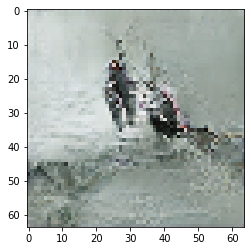

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 35

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6951255798339844 sec
Gen loss: 1.892932051106503, Disc loss: 2.1754659100582727, Disc valid real loss: 0.4030247487519917, Disc valid fake loss: 0.4044167807227687, Disc class real loss: 0.6845638548073015, Disc class fake loss: 0.056585712848525295
Time for epoch 2 is 0.6984930038452148 sec
Gen loss: 1.8274668768832558, Disc loss: 2.224801333327042, Disc valid real loss: 0.39278066472003337, Disc valid fake loss: 0.4129900304894698, Disc class real loss: 0.7110870417795683, Disc class fake loss: 0.11318175984840644
Time for epoch 3 is 0.6989960670471191 sec
Gen loss: 1.9061951449042873, Disc loss: 2.1349431150837948, Disc valid real loss: 0.40822381879154007, Disc valid fake loss: 0.38070072155249746, Disc class real loss: 0.6756240411808616, Disc class fake loss: 0.08959957133782537
Time for epoch 4 is 0.7051181793212891 sec
Gen loss: 1.8533775367

Time for epoch 31 is 0.6902329921722412 sec
Gen loss: 1.8658714419917057, Disc loss: 2.0254851391440942, Disc valid real loss: 0.3912703175293772, Disc valid fake loss: 0.40588383768734176, Disc class real loss: 0.6427685336062783, Disc class fake loss: 0.12161366994443693
Time for epoch 32 is 0.6941878795623779 sec
Gen loss: 1.7922073790901585, Disc loss: 2.0368880221718237, Disc valid real loss: 0.41595717950871114, Disc valid fake loss: 0.38900105576766164, Disc class real loss: 0.6456551802785773, Disc class fake loss: 0.12150392720573827
Time for epoch 33 is 0.7007372379302979 sec
Gen loss: 1.938982323596352, Disc loss: 1.989140554478294, Disc valid real loss: 0.37620578392555837, Disc valid fake loss: 0.38199139268774734, Disc class real loss: 0.6447341191141229, Disc class fake loss: 0.14410866051912308
Time for epoch 34 is 0.6961214542388916 sec
Gen loss: 1.8722428271644993, Disc loss: 2.005234398339924, Disc valid real loss: 0.3777424097061157, Disc valid fake loss: 0.39347253

Time for epoch 61 is 0.7012052536010742 sec
Gen loss: 1.9015843680030422, Disc loss: 1.979203412407323, Disc valid real loss: 0.39585413274012116, Disc valid fake loss: 0.3943389356136322, Disc class real loss: 0.6493157744407654, Disc class fake loss: 0.14579485513662038
Time for epoch 62 is 0.6970000267028809 sec
Gen loss: 1.8643156917471635, Disc loss: 1.981294782538163, Disc valid real loss: 0.3971052028630909, Disc valid fake loss: 0.3993232265899056, Disc class real loss: 0.6519668761052584, Disc class fake loss: 0.11373777138559442
Time for epoch 63 is 0.6918394565582275 sec
Gen loss: 1.8267838766700344, Disc loss: 1.9565389595533673, Disc valid real loss: 0.39123379870464925, Disc valid fake loss: 0.4062107221076363, Disc class real loss: 0.6377355111272711, Disc class fake loss: 0.12025736389975798
Time for epoch 64 is 0.6980712413787842 sec
Gen loss: 1.946624661746778, Disc loss: 1.9293509533530788, Disc valid real loss: 0.37422314286231995, Disc valid fake loss: 0.3929200501

Time for epoch 92 is 0.6948425769805908 sec
Gen loss: 1.9075317696521157, Disc loss: 1.9052149120130037, Disc valid real loss: 0.39715148665403066, Disc valid fake loss: 0.39430265834456996, Disc class real loss: 0.6360040307044983, Disc class fake loss: 0.15550285303278974
Time for epoch 93 is 0.6955041885375977 sec
Gen loss: 1.8280416978032965, Disc loss: 2.000906618017899, Disc valid real loss: 0.39314444127835724, Disc valid fake loss: 0.4091383485417617, Disc class real loss: 0.683395969240289, Disc class fake loss: 0.17813673772309957
Time for epoch 94 is 0.6931397914886475 sec
Gen loss: 1.9075570482956736, Disc loss: 1.9394352624290867, Disc valid real loss: 0.40643756091594696, Disc valid fake loss: 0.4209658346678081, Disc class real loss: 0.6351812732847113, Disc class fake loss: 0.16466760360880903
Time for epoch 95 is 0.6992220878601074 sec
Gen loss: 2.0916115045547485, Disc loss: 1.923243798707661, Disc valid real loss: 0.4040367336649644, Disc valid fake loss: 0.382635831

Time for epoch 122 is 0.6983568668365479 sec
Gen loss: 2.0283579512646326, Disc loss: 1.872599589197259, Disc valid real loss: 0.40654012482417257, Disc valid fake loss: 0.38027500165136235, Disc class real loss: 0.6507011651992798, Disc class fake loss: 0.15761606983448329
Time for epoch 123 is 0.7001032829284668 sec
Gen loss: 1.9597252293636924, Disc loss: 1.8721842138390792, Disc valid real loss: 0.37998046686774806, Disc valid fake loss: 0.3949080642900969, Disc class real loss: 0.6660166194564417, Disc class fake loss: 0.13356102610889234
Time for epoch 124 is 0.700098991394043 sec
Gen loss: 1.9393505736401206, Disc loss: 1.8461837705812956, Disc valid real loss: 0.3646137369306464, Disc valid fake loss: 0.3927261986230549, Disc class real loss: 0.6630429876478094, Disc class fake loss: 0.1293116037390734
Time for epoch 125 is 0.6986987590789795 sec
Gen loss: 1.922131199585764, Disc loss: 1.8541856690456993, Disc valid real loss: 0.38580122590065, Disc valid fake loss: 0.397988824

Time for epoch 152 is 0.6938698291778564 sec
Gen loss: 1.9192105155242116, Disc loss: 1.7996480904127423, Disc valid real loss: 0.3857800427236055, Disc valid fake loss: 0.3874404257849643, Disc class real loss: 0.6539516072524222, Disc class fake loss: 0.13771635333174154
Time for epoch 153 is 0.6958193778991699 sec
Gen loss: 1.9099459585390592, Disc loss: 1.7868519017570896, Disc valid real loss: 0.3940850794315338, Disc valid fake loss: 0.39752349414323507, Disc class real loss: 0.6412369420653895, Disc class fake loss: 0.11794414939849
Time for epoch 154 is 0.6986596584320068 sec
Gen loss: 1.8874222479368512, Disc loss: 1.7704134677585803, Disc valid real loss: 0.3897973628420579, Disc valid fake loss: 0.3910439469312367, Disc class real loss: 0.6397360469165602, Disc class fake loss: 0.11501326215894599
Time for epoch 155 is 0.698636531829834 sec
Gen loss: 1.8540480136871338, Disc loss: 1.8324655859093917, Disc valid real loss: 0.39688091372188766, Disc valid fake loss: 0.40423656

Time for epoch 182 is 0.6966221332550049 sec
Gen loss: 1.8816867000178288, Disc loss: 1.7417974723012823, Disc valid real loss: 0.3961347027828819, Disc valid fake loss: 0.3999550122963755, Disc class real loss: 0.6405418797543174, Disc class fake loss: 0.1271909024370344
Time for epoch 183 is 0.6967337131500244 sec
Gen loss: 1.899155673227812, Disc loss: 1.7150422648379677, Disc valid real loss: 0.380403691216519, Disc valid fake loss: 0.4001845497834055, Disc class real loss: 0.6363156563357303, Disc class fake loss: 0.12147541775515205
Time for epoch 184 is 0.6919546127319336 sec
Gen loss: 1.9790593197471218, Disc loss: 1.7361125820561458, Disc valid real loss: 0.3880106398933812, Disc valid fake loss: 0.3871819800452182, Disc class real loss: 0.664081262914758, Disc class fake loss: 0.10809282409517389
Time for epoch 185 is 0.6945912837982178 sec
Gen loss: 1.9652678276363171, Disc loss: 1.694887261641653, Disc valid real loss: 0.3795697885124307, Disc valid fake loss: 0.39467329414

Time for epoch 212 is 0.6972980499267578 sec
Gen loss: 1.8781702957655255, Disc loss: 1.7159187919215153, Disc valid real loss: 0.37716337567881536, Disc valid fake loss: 0.3995749024968398, Disc class real loss: 0.6984837212060627, Disc class fake loss: 0.09719095143832658
Time for epoch 213 is 0.6959002017974854 sec
Gen loss: 1.9478517833508944, Disc loss: 1.7370306190691496, Disc valid real loss: 0.40555110573768616, Disc valid fake loss: 0.39010864417803914, Disc class real loss: 0.6886982635447854, Disc class fake loss: 0.11862181440780037
Time for epoch 214 is 0.7003297805786133 sec
Gen loss: 1.986557966784427, Disc loss: 1.6712399407436973, Disc valid real loss: 0.39627981029058756, Disc valid fake loss: 0.38491527265624, Disc class real loss: 0.6426621110815751, Disc class fake loss: 0.12831336514730202
Time for epoch 215 is 0.6912386417388916 sec
Gen loss: 1.8260625726298283, Disc loss: 1.7164608491094488, Disc valid real loss: 0.3984331127844359, Disc valid fake loss: 0.41682

Time for epoch 242 is 0.6980130672454834 sec
Gen loss: 1.9227452089912014, Disc loss: 1.618212474019904, Disc valid real loss: 0.3853837988878551, Disc valid fake loss: 0.40044529343906204, Disc class real loss: 0.661888483323549, Disc class fake loss: 0.09658813888305112
Time for epoch 243 is 0.6937878131866455 sec
Gen loss: 1.9115901432539288, Disc loss: 1.6406463761078685, Disc valid real loss: 0.3899295910408622, Disc valid fake loss: 0.409869079527102, Disc class real loss: 0.6718422958725377, Disc class fake loss: 0.09576232378420077
Time for epoch 244 is 0.6997523307800293 sec
Gen loss: 1.986773785791899, Disc loss: 1.5674949507964284, Disc valid real loss: 0.3888842196840989, Disc valid fake loss: 0.3761212700291684, Disc class real loss: 0.6320238489853708, Disc class fake loss: 0.10544634061424356
Time for epoch 245 is 0.698512077331543 sec
Gen loss: 1.9344443961193687, Disc loss: 1.5989918081383956, Disc valid real loss: 0.37226991904409307, Disc valid fake loss: 0.395989634

Time for epoch 272 is 0.6952865123748779 sec
Gen loss: 1.947564777575041, Disc loss: 1.5755614167765568, Disc valid real loss: 0.3948518273077513, Disc valid fake loss: 0.38551026896426555, Disc class real loss: 0.676770059685958, Disc class fake loss: 0.10542507332406546
Time for epoch 273 is 0.6971333026885986 sec
Gen loss: 1.96785391004462, Disc loss: 1.5847033136769344, Disc valid real loss: 0.39114398548477575, Disc valid fake loss: 0.38619674036377355, Disc class real loss: 0.6822742474706549, Disc class fake loss: 0.11421013074485879
Time for epoch 274 is 0.6951868534088135 sec
Gen loss: 1.8941338626961959, Disc loss: 1.5688201690974988, Disc valid real loss: 0.40169817052389445, Disc valid fake loss: 0.39848133451060247, Disc class real loss: 0.6702098156276503, Disc class fake loss: 0.08940755360220608
Time for epoch 275 is 0.6977095603942871 sec
Gen loss: 1.9195920856375444, Disc loss: 1.584705992748863, Disc valid real loss: 0.38297017938212347, Disc valid fake loss: 0.39722

Time for epoch 302 is 0.694774866104126 sec
Gen loss: 1.9198102574599416, Disc loss: 1.5581821516940468, Disc valid real loss: 0.408045514633781, Disc valid fake loss: 0.4060494586041099, Disc class real loss: 0.668708368351585, Disc class fake loss: 0.07549747550173809
Time for epoch 303 is 0.6982531547546387 sec
Gen loss: 1.9503620423768695, Disc loss: 1.533880258861341, Disc valid real loss: 0.3871990630501195, Disc valid fake loss: 0.3925300491483588, Disc class real loss: 0.6761931996596487, Disc class fake loss: 0.07807756509435804
Time for epoch 304 is 0.6958963871002197 sec
Gen loss: 2.009229772969296, Disc loss: 1.5582591232500578, Disc valid real loss: 0.4005902127215737, Disc valid fake loss: 0.3878381503255744, Disc class real loss: 0.6850141882896423, Disc class fake loss: 0.08493660037454806
Time for epoch 305 is 0.6870286464691162 sec
Gen loss: 1.8945156712281077, Disc loss: 1.5448279694506997, Disc valid real loss: 0.3978579248252668, Disc valid fake loss: 0.39138017516

Time for epoch 332 is 0.6975915431976318 sec
Gen loss: 1.9234039407027395, Disc loss: 1.5389731934196071, Disc valid real loss: 0.38112721631401464, Disc valid fake loss: 0.38273748912309347, Disc class real loss: 0.6891502518402902, Disc class fake loss: 0.0860788787862188
Time for epoch 333 is 0.6949939727783203 sec
Gen loss: 1.9897423041494269, Disc loss: 1.548713715452897, Disc valid real loss: 0.3902032265537663, Disc valid fake loss: 0.4014678832731749, Disc class real loss: 0.6717700079867714, Disc class fake loss: 0.08538990095257759
Time for epoch 334 is 0.6954770088195801 sec
Gen loss: 1.9441102680407072, Disc loss: 1.5945341273357994, Disc valid real loss: 0.4047072106286099, Disc valid fake loss: 0.4012654611938878, Disc class real loss: 0.6896875939871135, Disc class fake loss: 0.09899202263668964
Time for epoch 335 is 0.6993443965911865 sec
Gen loss: 1.8980952250330072, Disc loss: 1.5424634908374988, Disc valid real loss: 0.4047755677449076, Disc valid fake loss: 0.385268

Time for epoch 362 is 0.6977653503417969 sec
Gen loss: 1.9492070925863165, Disc loss: 1.532176369114926, Disc valid real loss: 0.4075458457595424, Disc valid fake loss: 0.3883363886883384, Disc class real loss: 0.6633694673839369, Disc class fake loss: 0.07304275829933192
Time for epoch 363 is 0.6926329135894775 sec
Gen loss: 1.9205382811395746, Disc loss: 1.49847328035455, Disc valid real loss: 0.40105665514343664, Disc valid fake loss: 0.37147305278401627, Disc class real loss: 0.6534683359296698, Disc class fake loss: 0.07259143251729638
Time for epoch 364 is 0.697258710861206 sec
Gen loss: 2.0334109758075916, Disc loss: 1.5491226660577875, Disc valid real loss: 0.4160226959931223, Disc valid fake loss: 0.3650773622487721, Disc class real loss: 0.6682803097524141, Disc class fake loss: 0.09985600411891937
Time for epoch 365 is 0.6933867931365967 sec
Gen loss: 1.9349907009225142, Disc loss: 1.5282702006791766, Disc valid real loss: 0.38108628909838826, Disc valid fake loss: 0.3901078

Time for epoch 392 is 0.6993012428283691 sec
Gen loss: 1.9258475303649902, Disc loss: 1.555228961141486, Disc valid real loss: 0.3987655631805721, Disc valid fake loss: 0.4077235758304596, Disc class real loss: 0.6670391685084293, Disc class fake loss: 0.0818177112623265
Time for epoch 393 is 0.6986856460571289 sec
Gen loss: 1.8930301227067645, Disc loss: 1.5504486937271922, Disc valid real loss: 0.4132088940394552, Disc valid fake loss: 0.39244741515109416, Disc class real loss: 0.672558417445735, Disc class fake loss: 0.07235401398257206
Time for epoch 394 is 0.6979732513427734 sec
Gen loss: 1.9511970156117489, Disc loss: 1.524796536094264, Disc valid real loss: 0.3872327302631579, Disc valid fake loss: 0.39016885663333695, Disc class real loss: 0.6591648396692777, Disc class fake loss: 0.08834428222555864
Time for epoch 395 is 0.6968753337860107 sec
Gen loss: 1.9748559625525224, Disc loss: 1.497900034251966, Disc valid real loss: 0.3752706207727131, Disc valid fake loss: 0.379951406

Time for epoch 422 is 0.6990470886230469 sec
Gen loss: 1.906595926535757, Disc loss: 1.5412914313768085, Disc valid real loss: 0.39782814759957164, Disc valid fake loss: 0.4040259279702839, Disc class real loss: 0.6406634857780055, Disc class fake loss: 0.09888224823302344
Time for epoch 423 is 0.6978285312652588 sec
Gen loss: 1.8607883704336066, Disc loss: 1.5407357466848273, Disc valid real loss: 0.4084571803870954, Disc valid fake loss: 0.39344302447218643, Disc class real loss: 0.6566794012722216, Disc class fake loss: 0.08227105673990752
Time for epoch 424 is 0.6978955268859863 sec
Gen loss: 1.9758000060131675, Disc loss: 1.532095752264324, Disc valid real loss: 0.3930379324837735, Disc valid fake loss: 0.3946567067974492, Disc class real loss: 0.6525188151158785, Disc class fake loss: 0.0919943950384071
Time for epoch 425 is 0.6920764446258545 sec
Gen loss: 1.9793051606730412, Disc loss: 1.4901257439663536, Disc valid real loss: 0.3737925040094476, Disc valid fake loss: 0.3847060

Time for epoch 452 is 0.6989035606384277 sec
Gen loss: 1.9792476265054, Disc loss: 1.5569614736657393, Disc valid real loss: 0.3977162649756984, Disc valid fake loss: 0.40411877632141113, Disc class real loss: 0.6878290458729392, Disc class fake loss: 0.0674214916009652
Time for epoch 453 is 0.6952123641967773 sec
Gen loss: 1.9215588255932456, Disc loss: 1.5547739016382318, Disc valid real loss: 0.3860190149984862, Disc valid fake loss: 0.39260047831033407, Disc class real loss: 0.6849077877245451, Disc class fake loss: 0.0913653808989023
Time for epoch 454 is 0.6960749626159668 sec
Gen loss: 1.9905994754088552, Disc loss: 1.5634466911617078, Disc valid real loss: 0.41188618697618185, Disc valid fake loss: 0.3723027196369673, Disc class real loss: 0.6706529573390358, Disc class fake loss: 0.1087172313740379
Time for epoch 455 is 0.6999998092651367 sec
Gen loss: 2.0413768605182043, Disc loss: 1.5595183748947947, Disc valid real loss: 0.3940828991563697, Disc valid fake loss: 0.404567342

Time for epoch 482 is 0.6977698802947998 sec
Gen loss: 1.946082171640898, Disc loss: 1.5317161271446629, Disc valid real loss: 0.4132561307204397, Disc valid fake loss: 0.3809952531990252, Disc class real loss: 0.6673270558056078, Disc class fake loss: 0.07025711659930255
Time for epoch 483 is 0.6972112655639648 sec
Gen loss: 1.888613224029541, Disc loss: 1.5498067893479999, Disc valid real loss: 0.39587750560358953, Disc valid fake loss: 0.3877396363961069, Disc class real loss: 0.6772294201348957, Disc class fake loss: 0.08907786472455452
Time for epoch 484 is 0.6961812973022461 sec
Gen loss: 1.999049556882758, Disc loss: 1.4825856120962846, Disc valid real loss: 0.3936007760073009, Disc valid fake loss: 0.3809356987476349, Disc class real loss: 0.631402966223265, Disc class fake loss: 0.07675710340079508
Time for epoch 485 is 0.701885461807251 sec
Gen loss: 1.971633748004311, Disc loss: 1.5482629788549322, Disc valid real loss: 0.39584463677908244, Disc valid fake loss: 0.3961064392

Time for epoch 512 is 0.6990318298339844 sec
Gen loss: 2.1232708378842005, Disc loss: 1.5494508868769596, Disc valid real loss: 0.39821790315602956, Disc valid fake loss: 0.3713572158625251, Disc class real loss: 0.6673763143388849, Disc class fake loss: 0.11261041864360634
Time for epoch 513 is 0.6975862979888916 sec
Gen loss: 1.8129623751891286, Disc loss: 1.5841188117077476, Disc valid real loss: 0.39812594809030233, Disc valid fake loss: 0.41419593127150284, Disc class real loss: 0.6916059349712572, Disc class fake loss: 0.08031327238208369
Time for epoch 514 is 0.6945629119873047 sec
Gen loss: 2.006044770541944, Disc loss: 1.5443501535214876, Disc valid real loss: 0.3955943835409064, Disc valid fake loss: 0.3878237981545298, Disc class real loss: 0.6581884120640001, Disc class fake loss: 0.10285463066477525
Time for epoch 515 is 0.6983115673065186 sec
Gen loss: 2.2031661146565487, Disc loss: 1.602294877955788, Disc valid real loss: 0.3815747883759047, Disc valid fake loss: 0.41008

Time for epoch 542 is 0.6951227188110352 sec
Gen loss: 1.9430530949642784, Disc loss: 1.5125206583424617, Disc valid real loss: 0.3911776526978141, Disc valid fake loss: 0.3993227168133384, Disc class real loss: 0.638499451311011, Disc class fake loss: 0.0836318141143573
Time for epoch 543 is 0.6982607841491699 sec
Gen loss: 1.9036195905585038, Disc loss: 1.5033454267602218, Disc valid real loss: 0.38569234076299164, Disc valid fake loss: 0.39100933545514155, Disc class real loss: 0.670219129637668, Disc class fake loss: 0.05654737931725226
Time for epoch 544 is 0.697166919708252 sec
Gen loss: 2.043699346090618, Disc loss: 1.485340156053242, Disc valid real loss: 0.3897161985698499, Disc valid fake loss: 0.3765966790287118, Disc class real loss: 0.6567137021767465, Disc class fake loss: 0.06243245950654933
Time for epoch 545 is 0.6978127956390381 sec
Gen loss: 1.967680109174628, Disc loss: 1.5543440078434192, Disc valid real loss: 0.383684399880861, Disc valid fake loss: 0.398595361333

Time for epoch 572 is 0.6993198394775391 sec
Gen loss: 1.9350038327668841, Disc loss: 1.5541970792569613, Disc valid real loss: 0.38615352072213827, Disc valid fake loss: 0.4083031635535391, Disc class real loss: 0.6709327823237369, Disc class fake loss: 0.08892405052718363
Time for epoch 573 is 0.6962935924530029 sec
Gen loss: 1.9083452099247982, Disc loss: 1.5032968458376432, Disc valid real loss: 0.37828957014962244, Disc valid fake loss: 0.3755009582168178, Disc class real loss: 0.6658217154051128, Disc class fake loss: 0.08380104081803247
Time for epoch 574 is 0.6975362300872803 sec
Gen loss: 2.0051717444470056, Disc loss: 1.5636956629000212, Disc valid real loss: 0.4075145109703666, Disc valid fake loss: 0.39153770318156794, Disc class real loss: 0.6828034551520097, Disc class fake loss: 0.081960187538674
Time for epoch 575 is 0.6968238353729248 sec
Gen loss: 1.9791167096087807, Disc loss: 1.5310414904042293, Disc valid real loss: 0.40728375707802017, Disc valid fake loss: 0.3870

Time for epoch 602 is 0.696861982345581 sec
Gen loss: 2.008827391423677, Disc loss: 1.5223518860967535, Disc valid real loss: 0.37602535596019343, Disc valid fake loss: 0.40179655740135595, Disc class real loss: 0.6809974814716139, Disc class fake loss: 0.06365599385217617
Time for epoch 603 is 0.7002320289611816 sec
Gen loss: 1.9660768634394596, Disc loss: 1.5690713305222361, Disc valid real loss: 0.40665296818080704, Disc valid fake loss: 0.383926134360464, Disc class real loss: 0.6995237187335366, Disc class fake loss: 0.07909260508849432
Time for epoch 604 is 0.6924881935119629 sec
Gen loss: 1.9408174690447355, Disc loss: 1.5191035396174382, Disc valid real loss: 0.37843623757362366, Disc valid fake loss: 0.40115235824333995, Disc class real loss: 0.6535286872010482, Disc class fake loss: 0.0860997493329801
Time for epoch 605 is 0.695178747177124 sec
Gen loss: 1.9834324309700413, Disc loss: 1.5322505549380654, Disc valid real loss: 0.394724052203329, Disc valid fake loss: 0.3828702

Time for epoch 632 is 0.6959421634674072 sec
Gen loss: 2.026330916505111, Disc loss: 1.523520639068202, Disc valid real loss: 0.4036068963377099, Disc valid fake loss: 0.37256133085802984, Disc class real loss: 0.6620541999214574, Disc class fake loss: 0.08541354066447208
Time for epoch 633 is 0.6949272155761719 sec
Gen loss: 1.8460725420399715, Disc loss: 1.547827908867284, Disc valid real loss: 0.4039819820931083, Disc valid fake loss: 0.38294573206650584, Disc class real loss: 0.6924520887826618, Disc class fake loss: 0.06857288609209813
Time for epoch 634 is 0.696418285369873 sec
Gen loss: 1.980802103092796, Disc loss: 1.5959212717257047, Disc valid real loss: 0.40337212148465607, Disc valid fake loss: 0.40250396728515625, Disc class real loss: 0.7166679501533508, Disc class fake loss: 0.07350588197770871
Time for epoch 635 is 0.6955511569976807 sec
Gen loss: 1.9083162859866494, Disc loss: 1.5595214241429378, Disc valid real loss: 0.4104081258962029, Disc valid fake loss: 0.3817207

Time for epoch 662 is 0.6979243755340576 sec
Gen loss: 1.9916587691558034, Disc loss: 1.5397657846149646, Disc valid real loss: 0.39448763665400055, Disc valid fake loss: 0.38487498070064347, Disc class real loss: 0.6750459576907911, Disc class fake loss: 0.08547514382945864
Time for epoch 663 is 0.6959178447723389 sec
Gen loss: 1.9550655766537315, Disc loss: 1.564142202076159, Disc valid real loss: 0.4122918891279321, Disc valid fake loss: 0.3892789279159747, Disc class real loss: 0.686722247224105, Disc class fake loss: 0.07597129782171626
Time for epoch 664 is 0.6966733932495117 sec
Gen loss: 1.920568026994404, Disc loss: 1.5290065878315975, Disc valid real loss: 0.3951730712463981, Disc valid fake loss: 0.39231911615321513, Disc class real loss: 0.6592925567375986, Disc class fake loss: 0.0823372496586097
Time for epoch 665 is 0.6971757411956787 sec
Gen loss: 1.8871251658389443, Disc loss: 1.551216815647326, Disc valid real loss: 0.3915547336402692, Disc valid fake loss: 0.40407833

Time for epoch 692 is 0.7057037353515625 sec
Gen loss: 1.9698486014416343, Disc loss: 1.537040020290174, Disc valid real loss: 0.38596334426026596, Disc valid fake loss: 0.38796962248651606, Disc class real loss: 0.6718387446905437, Disc class fake loss: 0.09138438438898638
Time for epoch 693 is 0.69978928565979 sec
Gen loss: 1.9492409229278564, Disc loss: 1.54163952877647, Disc valid real loss: 0.39883249762811157, Disc valid fake loss: 0.37702773432982595, Disc class real loss: 0.6934170503365366, Disc class fake loss: 0.07248644177850924
Time for epoch 694 is 0.7059438228607178 sec
Gen loss: 1.9008604664551585, Disc loss: 1.5977314898842259, Disc valid real loss: 0.4098734306661706, Disc valid fake loss: 0.39930427074432373, Disc class real loss: 0.6983230208095751, Disc class fake loss: 0.09035241290142662
Time for epoch 695 is 0.6967720985412598 sec
Gen loss: 1.9609579538044177, Disc loss: 1.5086451768875122, Disc valid real loss: 0.40462102388080795, Disc valid fake loss: 0.36648

Time for epoch 722 is 0.6952714920043945 sec
Gen loss: 1.9508657267219143, Disc loss: 1.5045006086951809, Disc valid real loss: 0.3922074311657956, Disc valid fake loss: 0.3698842509796745, Disc class real loss: 0.6619715753354525, Disc class fake loss: 0.08055364909140687
Time for epoch 723 is 0.6959550380706787 sec
Gen loss: 1.9540966247257434, Disc loss: 1.5557442464326556, Disc valid real loss: 0.39576909573454605, Disc valid fake loss: 0.41441887460256877, Disc class real loss: 0.666746415589985, Disc class fake loss: 0.07892743027523945
Time for epoch 724 is 0.696394681930542 sec
Gen loss: 1.914570180993331, Disc loss: 1.5324883335515072, Disc valid real loss: 0.3881892624654268, Disc valid fake loss: 0.39757870059264333, Disc class real loss: 0.6766575104311893, Disc class fake loss: 0.07018417806217545
Time for epoch 725 is 0.6979789733886719 sec
Gen loss: 1.9535041671050222, Disc loss: 1.4823516544542814, Disc valid real loss: 0.36975026836520747, Disc valid fake loss: 0.38101

Time for epoch 752 is 0.6959526538848877 sec
Gen loss: 1.880592063853615, Disc loss: 1.5289377538781417, Disc valid real loss: 0.3810698374321586, Disc valid fake loss: 0.3906432562752774, Disc class real loss: 0.6790792847934523, Disc class fake loss: 0.07826554657597291
Time for epoch 753 is 0.6978814601898193 sec
Gen loss: 1.9864527990943508, Disc loss: 1.5378827734997398, Disc valid real loss: 0.3919516080304196, Disc valid fake loss: 0.40405454290540593, Disc class real loss: 0.6736725160950109, Disc class fake loss: 0.06832517585472057
Time for epoch 754 is 0.6972751617431641 sec
Gen loss: 1.9962268628572162, Disc loss: 1.5345242650885331, Disc valid real loss: 0.3742809915228894, Disc valid fake loss: 0.38327772366373164, Disc class real loss: 0.6859151187695955, Disc class fake loss: 0.09116940710105394
Time for epoch 755 is 0.6971640586853027 sec
Gen loss: 1.936786921400773, Disc loss: 1.578583039735493, Disc valid real loss: 0.4097623558420884, Disc valid fake loss: 0.4013238

Time for epoch 782 is 0.6985931396484375 sec
Gen loss: 1.9157209396362305, Disc loss: 1.5468392309389616, Disc valid real loss: 0.3893613736880453, Disc valid fake loss: 0.3919497257784793, Disc class real loss: 0.687045765550513, Disc class fake loss: 0.07860407115597474
Time for epoch 783 is 0.6965608596801758 sec
Gen loss: 1.9401508569717407, Disc loss: 1.555233083273235, Disc valid real loss: 0.3956532635186848, Disc valid fake loss: 0.3918578138476924, Disc class real loss: 0.6970733937464262, Disc class fake loss: 0.07077387249783466
Time for epoch 784 is 0.6924600601196289 sec
Gen loss: 1.952959788473029, Disc loss: 1.4659980974699323, Disc valid real loss: 0.38763698308091415, Disc valid fake loss: 0.36108957309471934, Disc class real loss: 0.6475219820675097, Disc class fake loss: 0.06986511812398308
Time for epoch 785 is 0.6996004581451416 sec
Gen loss: 1.9675771123484562, Disc loss: 1.5653198016317267, Disc valid real loss: 0.40950540649263484, Disc valid fake loss: 0.385425

Time for epoch 812 is 0.6929957866668701 sec
Gen loss: 2.0500014581178365, Disc loss: 1.539715748084219, Disc valid real loss: 0.4065942513315301, Disc valid fake loss: 0.3869230998189826, Disc class real loss: 0.6694068406757555, Disc class fake loss: 0.07691008607415777
Time for epoch 813 is 0.6977660655975342 sec
Gen loss: 1.843692239962126, Disc loss: 1.5527969724253605, Disc valid real loss: 0.39997980782860204, Disc valid fake loss: 0.39154842966481257, Disc class real loss: 0.690176901064421, Disc class fake loss: 0.07121566271311358
Time for epoch 814 is 0.703791618347168 sec
Gen loss: 1.9387505368182534, Disc loss: 1.571075244953758, Disc valid real loss: 0.4075941757151955, Disc valid fake loss: 0.3986507434594004, Disc class real loss: 0.6722460295024671, Disc class fake loss: 0.09270020848826359
Time for epoch 815 is 0.7054922580718994 sec
Gen loss: 1.9070332113065218, Disc loss: 1.5424451200585616, Disc valid real loss: 0.4105263634731895, Disc valid fake loss: 0.391104909

Time for epoch 842 is 0.6963081359863281 sec
Gen loss: 1.9453436387212653, Disc loss: 1.5063584227310984, Disc valid real loss: 0.3776368090980931, Disc valid fake loss: 0.4127773234718724, Disc class real loss: 0.6517820326905501, Disc class fake loss: 0.06427978390925809
Time for epoch 843 is 0.6899418830871582 sec
Gen loss: 1.9700495067395662, Disc loss: 1.5485386221032393, Disc valid real loss: 0.41216940628854853, Disc valid fake loss: 0.38816739383496734, Disc class real loss: 0.6770755930950767, Disc class fake loss: 0.07124738454034454
Time for epoch 844 is 0.6933043003082275 sec
Gen loss: 1.8994631516306024, Disc loss: 1.5696429955331903, Disc valid real loss: 0.3995246746038136, Disc valid fake loss: 0.39373478293418884, Disc class real loss: 0.6849896123534754, Disc class fake loss: 0.09151264495755497
Time for epoch 845 is 0.690788745880127 sec
Gen loss: 1.9774644625814337, Disc loss: 1.5528268814086914, Disc valid real loss: 0.3878268223059805, Disc valid fake loss: 0.3691

Time for epoch 872 is 0.6942265033721924 sec
Gen loss: 1.9255948129453158, Disc loss: 1.5245279387423867, Disc valid real loss: 0.39423299776880366, Disc valid fake loss: 0.3922638799014844, Disc class real loss: 0.6723404683564839, Disc class fake loss: 0.06581191071554233
Time for epoch 873 is 0.6931662559509277 sec
Gen loss: 1.9554197411788137, Disc loss: 1.5751113766118099, Disc valid real loss: 0.37940787327916997, Disc valid fake loss: 0.40147159758367035, Disc class real loss: 0.7008262245278609, Disc class fake loss: 0.09352716783943929
Time for epoch 874 is 0.693018913269043 sec
Gen loss: 1.932469462093554, Disc loss: 1.5514474542517411, Disc valid real loss: 0.396635165340022, Disc valid fake loss: 0.3886082329248127, Disc class real loss: 0.6821059647359347, Disc class fake loss: 0.08421769414685275
Time for epoch 875 is 0.6937155723571777 sec
Gen loss: 1.8683757907465885, Disc loss: 1.605229704003585, Disc valid real loss: 0.37363563713274506, Disc valid fake loss: 0.419571

Time for epoch 902 is 0.6957602500915527 sec
Gen loss: 1.9304739613282054, Disc loss: 1.5504959570734125, Disc valid real loss: 0.3948569454644856, Disc valid fake loss: 0.4075820744037628, Disc class real loss: 0.677613543836694, Disc class fake loss: 0.07056480646133423
Time for epoch 903 is 0.6906371116638184 sec
Gen loss: 1.8857021080820184, Disc loss: 1.5464351051732113, Disc valid real loss: 0.412933255496778, Disc valid fake loss: 0.3943273189820741, Disc class real loss: 0.6693540215492249, Disc class fake loss: 0.06994043133760754
Time for epoch 904 is 0.69671630859375 sec
Gen loss: 1.9465702081981457, Disc loss: 1.5262648180911416, Disc valid real loss: 0.3876856079227046, Disc valid fake loss: 0.38592078340680974, Disc class real loss: 0.6810657821203533, Disc class fake loss: 0.07171452104261047
Time for epoch 905 is 0.6855020523071289 sec
Gen loss: 1.977596596667641, Disc loss: 1.5274462637148405, Disc valid real loss: 0.38545299988043935, Disc valid fake loss: 0.386332427

Time for epoch 932 is 0.6957204341888428 sec
Gen loss: 1.9502097744690745, Disc loss: 1.533426560853657, Disc valid real loss: 0.4073462956830075, Disc valid fake loss: 0.37494276071849625, Disc class real loss: 0.6701415306643436, Disc class fake loss: 0.08111378962272092
Time for epoch 933 is 0.6942169666290283 sec
Gen loss: 1.9135359149230153, Disc loss: 1.5847724362423545, Disc valid real loss: 0.40176100950492055, Disc valid fake loss: 0.3935044847036663, Disc class real loss: 0.6999147032436571, Disc class fake loss: 0.08971429273094002
Time for epoch 934 is 0.6940169334411621 sec
Gen loss: 2.020226522495872, Disc loss: 1.5518699068772166, Disc valid real loss: 0.40700826676268326, Disc valid fake loss: 0.39292655022520767, Disc class real loss: 0.6809317595080325, Disc class fake loss: 0.07112530207163409
Time for epoch 935 is 0.6938624382019043 sec
Gen loss: 1.9349571529187655, Disc loss: 1.5371609047839516, Disc valid real loss: 0.3872367582823101, Disc valid fake loss: 0.3867

Time for epoch 962 is 0.6924381256103516 sec
Gen loss: 1.9936545773556358, Disc loss: 1.5198846365276135, Disc valid real loss: 0.3939140564516971, Disc valid fake loss: 0.3883104951758134, Disc class real loss: 0.6615997333275644, Disc class fake loss: 0.07617748411078203
Time for epoch 963 is 0.6955482959747314 sec
Gen loss: 1.950294067985133, Disc loss: 1.5412035176628514, Disc valid real loss: 0.3844539978002247, Disc valid fake loss: 0.3992457797652797, Disc class real loss: 0.6753930073035391, Disc class fake loss: 0.0822293870151043
Time for epoch 964 is 0.6957352161407471 sec
Gen loss: 1.9552433490753174, Disc loss: 1.5215115045246326, Disc valid real loss: 0.37758665963223104, Disc valid fake loss: 0.3778000889640105, Disc class real loss: 0.6973835073019329, Disc class fake loss: 0.06886695443015349
Time for epoch 965 is 0.7014467716217041 sec
Gen loss: 1.9029758227498907, Disc loss: 1.5105186324370534, Disc valid real loss: 0.37870467493408605, Disc valid fake loss: 0.382032

Time for epoch 992 is 0.696948766708374 sec
Gen loss: 1.9409433038611161, Disc loss: 1.5260421351382607, Disc valid real loss: 0.4022885592360246, Disc valid fake loss: 0.3761327023568906, Disc class real loss: 0.6623971399508024, Disc class fake loss: 0.08533915857735433
Time for epoch 993 is 0.7005515098571777 sec
Gen loss: 1.892935784239518, Disc loss: 1.5333474184337414, Disc valid real loss: 0.4124353622135363, Disc valid fake loss: 0.3815740378279435, Disc class real loss: 0.6748219822582445, Disc class fake loss: 0.064638100172344
Time for epoch 994 is 0.7011165618896484 sec
Gen loss: 1.9101117661124782, Disc loss: 1.5516916576184725, Disc valid real loss: 0.3880055233051902, Disc valid fake loss: 0.3822196204411356, Disc class real loss: 0.6947994577257257, Disc class fake loss: 0.08678867687520228
Time for epoch 995 is 0.702739953994751 sec
Gen loss: 1.8366848920520984, Disc loss: 1.5714707123605829, Disc valid real loss: 0.4044061114913539, Disc valid fake loss: 0.40720071290

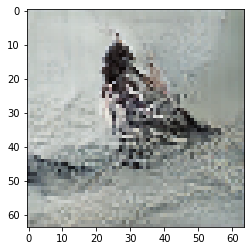

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 36

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6916425228118896 sec
Gen loss: 1.9049314197741056, Disc loss: 2.1773593990426314, Disc valid real loss: 0.39422287282190827, Disc valid fake loss: 0.4031940651567359, Disc class real loss: 0.6904867228708769, Disc class fake loss: 0.08643706515431404
Time for epoch 2 is 0.6912136077880859 sec
Gen loss: 1.9267542864146985, Disc loss: 2.1264085581428125, Disc valid real loss: 0.3895348530066641, Disc valid fake loss: 0.37524374692063583, Disc class real loss: 0.6823295448955736, Disc class fake loss: 0.1107852133481126
Time for epoch 3 is 0.6930744647979736 sec
Gen loss: 1.8135854821456106, Disc loss: 2.1555799559543005, Disc valid real loss: 0.4010404724823801, Disc valid fake loss: 0.40641930228785467, Disc class real loss: 0.6766177353106047, Disc class fake loss: 0.10371896644171916
Time for epoch 4 is 0.6957173347473145 sec
Gen loss: 1.7875955481

Time for epoch 31 is 0.6925201416015625 sec
Gen loss: 1.90777167521025, Disc loss: 2.034192574651618, Disc valid real loss: 0.3932211806899623, Disc valid fake loss: 0.40218358918240193, Disc class real loss: 0.6479857689455936, Disc class fake loss: 0.1268198352895285
Time for epoch 32 is 0.694199800491333 sec
Gen loss: 1.9508469418475503, Disc loss: 2.063545038825587, Disc valid real loss: 0.40007057785987854, Disc valid fake loss: 0.362933265535455, Disc class real loss: 0.6810280712027299, Disc class fake loss: 0.13778625075754367
Time for epoch 33 is 0.6942629814147949 sec
Gen loss: 1.8903476439024274, Disc loss: 2.005535627666273, Disc valid real loss: 0.3816421345660561, Disc valid fake loss: 0.3761648755324514, Disc class real loss: 0.6553957556423388, Disc class fake loss: 0.11645144655516274
Time for epoch 34 is 0.6947591304779053 sec
Gen loss: 1.7559636768541838, Disc loss: 2.094100331005297, Disc valid real loss: 0.4009481605730559, Disc valid fake loss: 0.38130305158464534

Time for epoch 62 is 0.6958959102630615 sec
Gen loss: 1.818551076085944, Disc loss: 1.9198431780463772, Disc valid real loss: 0.3782566832868676, Disc valid fake loss: 0.3907707866869475, Disc class real loss: 0.6288606398984006, Disc class fake loss: 0.1456914720566649
Time for epoch 63 is 0.6971509456634521 sec
Gen loss: 1.8488628236871016, Disc loss: 1.957563933573271, Disc valid real loss: 0.38104256517008733, Disc valid fake loss: 0.39349346568709925, Disc class real loss: 0.6491163247510007, Disc class fake loss: 0.13676680781339345
Time for epoch 64 is 0.6979837417602539 sec
Gen loss: 1.9323050913057829, Disc loss: 2.0290090975008512, Disc valid real loss: 0.39349417466866343, Disc valid fake loss: 0.4029313404309122, Disc class real loss: 0.6761084449918646, Disc class fake loss: 0.15262049122860558
Time for epoch 65 is 0.6960649490356445 sec
Gen loss: 1.7969713838476884, Disc loss: 1.9364482101641203, Disc valid real loss: 0.3870840386340493, Disc valid fake loss: 0.3795507848

Time for epoch 93 is 0.6961147785186768 sec
Gen loss: 1.9200550505989475, Disc loss: 1.9301909082814266, Disc valid real loss: 0.42280902831177963, Disc valid fake loss: 0.3783172541543057, Disc class real loss: 0.648435868714985, Disc class fake loss: 0.14435043774153056
Time for epoch 94 is 0.695751428604126 sec
Gen loss: 1.8927997162467556, Disc loss: 1.9270616142373336, Disc valid real loss: 0.3950987254318438, Disc valid fake loss: 0.38440661367617157, Disc class real loss: 0.6600981291971708, Disc class fake loss: 0.14709493008099103
Time for epoch 95 is 0.6962244510650635 sec
Gen loss: 1.8491244692551463, Disc loss: 1.9549239371952258, Disc valid real loss: 0.3939845844318992, Disc valid fake loss: 0.4032098635246879, Disc class real loss: 0.666944798670317, Disc class fake loss: 0.1490192246672354
Time for epoch 96 is 0.697749137878418 sec
Gen loss: 1.934928950510527, Disc loss: 1.9255832308217098, Disc valid real loss: 0.37583157420158386, Disc valid fake loss: 0.3963499963283

Time for epoch 123 is 0.6987223625183105 sec
Gen loss: 1.8708523574628328, Disc loss: 1.8642386198043823, Disc valid real loss: 0.3931321642900768, Disc valid fake loss: 0.39773731953219366, Disc class real loss: 0.6466437201750906, Disc class fake loss: 0.14783465783847005
Time for epoch 124 is 0.6982653141021729 sec
Gen loss: 1.949418124399687, Disc loss: 1.8372029254311009, Disc valid real loss: 0.3863656912979327, Disc valid fake loss: 0.4010547587746068, Disc class real loss: 0.632828414440155, Disc class fake loss: 0.1471553448783724
Time for epoch 125 is 0.6990947723388672 sec
Gen loss: 1.9968324523223073, Disc loss: 1.8441840912166394, Disc valid real loss: 0.38262410226621124, Disc valid fake loss: 0.3887316192451276, Disc class real loss: 0.6510402717088398, Disc class fake loss: 0.13951156719734795
Time for epoch 126 is 0.6965141296386719 sec
Gen loss: 1.926571814637435, Disc loss: 1.8446473259674876, Disc valid real loss: 0.36665053744065135, Disc valid fake loss: 0.3807652

Time for epoch 153 is 0.69673752784729 sec
Gen loss: 1.9292832111057483, Disc loss: 1.7895991613990383, Disc valid real loss: 0.39082075184897375, Disc valid fake loss: 0.37291879873526723, Disc class real loss: 0.6555326047696566, Disc class fake loss: 0.13591913173073217
Time for epoch 154 is 0.6970405578613281 sec
Gen loss: 1.9756231245241667, Disc loss: 1.7787487004932605, Disc valid real loss: 0.3640075749472568, Disc valid fake loss: 0.41140095654286835, Disc class real loss: 0.6458663658091897, Disc class fake loss: 0.1238426652393843
Time for epoch 155 is 0.7001144886016846 sec
Gen loss: 1.922315892420317, Disc loss: 1.857361028068944, Disc valid real loss: 0.4142791471983257, Disc valid fake loss: 0.38550982820360286, Disc class real loss: 0.6858639622989454, Disc class fake loss: 0.12096427126150382
Time for epoch 156 is 0.7001557350158691 sec
Gen loss: 1.92912463137978, Disc loss: 1.767255149389568, Disc valid real loss: 0.38327567357766, Disc valid fake loss: 0.378746573862

Time for epoch 183 is 0.6956501007080078 sec
Gen loss: 2.0141313264244483, Disc loss: 1.7046277334815578, Disc valid real loss: 0.394160890265515, Disc valid fake loss: 0.3761101506258312, Disc class real loss: 0.6331609895354823, Disc class fake loss: 0.12774653575922312
Time for epoch 184 is 0.6973438262939453 sec
Gen loss: 1.8879570459064685, Disc loss: 1.7555589111227738, Disc valid real loss: 0.40284867035715205, Disc valid fake loss: 0.40551875139537613, Disc class real loss: 0.6532911062240601, Disc class fake loss: 0.10916320469818618
Time for epoch 185 is 0.6913483142852783 sec
Gen loss: 1.9332126629979987, Disc loss: 1.729594155361778, Disc valid real loss: 0.3814368279356706, Disc valid fake loss: 0.39866470506316737, Disc class real loss: 0.6444196669678939, Disc class fake loss: 0.13349318621974243
Time for epoch 186 is 0.6914522647857666 sec
Gen loss: 2.115075387452778, Disc loss: 1.723272819268076, Disc valid real loss: 0.3981832940327494, Disc valid fake loss: 0.3690209

Time for epoch 213 is 0.7115073204040527 sec
Gen loss: 1.8967823229337994, Disc loss: 1.6879494503924721, Disc valid real loss: 0.40075916208718954, Disc valid fake loss: 0.3821830043667241, Disc class real loss: 0.6661498828938133, Disc class fake loss: 0.10753460267656728
Time for epoch 214 is 0.7008893489837646 sec
Gen loss: 1.9144960704602694, Disc loss: 1.6726674970827604, Disc valid real loss: 0.40166476525758443, Disc valid fake loss: 0.39239334432702316, Disc class real loss: 0.6508121506163949, Disc class fake loss: 0.10037988522335102
Time for epoch 215 is 0.6996335983276367 sec
Gen loss: 1.9305464092053866, Disc loss: 1.6954491201199984, Disc valid real loss: 0.37472721777464213, Disc valid fake loss: 0.3757776461149517, Disc class real loss: 0.7005235866496438, Disc class fake loss: 0.10978472762201961
Time for epoch 216 is 0.6990749835968018 sec
Gen loss: 2.042218070281179, Disc loss: 1.6667654200604087, Disc valid real loss: 0.3710733887396361, Disc valid fake loss: 0.400

Time for epoch 243 is 0.6974987983703613 sec
Gen loss: 2.0042928080809745, Disc loss: 1.6317883290742572, Disc valid real loss: 0.3950923869484349, Disc valid fake loss: 0.40091821708177267, Disc class real loss: 0.667070354285993, Disc class fake loss: 0.09614673884291398
Time for epoch 244 is 0.6991157531738281 sec
Gen loss: 2.0213949994037024, Disc loss: 1.6422810554504395, Disc valid real loss: 0.3876864282708419, Disc valid fake loss: 0.39352669684510483, Disc class real loss: 0.6860105269833615, Disc class fake loss: 0.10309956693335583
Time for epoch 245 is 0.6968443393707275 sec
Gen loss: 1.9833851299787824, Disc loss: 1.6013584011479427, Disc valid real loss: 0.37098511269218043, Disc valid fake loss: 0.41067397908160563, Disc class real loss: 0.6540830166716325, Disc class fake loss: 0.09905098770794116
Time for epoch 246 is 0.6976625919342041 sec
Gen loss: 1.9478467389156944, Disc loss: 1.5686025243056447, Disc valid real loss: 0.3781539813468331, Disc valid fake loss: 0.379

Time for epoch 273 is 0.6993982791900635 sec
Gen loss: 1.8906100862904598, Disc loss: 1.5851120258632458, Disc valid real loss: 0.3835493271288119, Disc valid fake loss: 0.41290805371184097, Disc class real loss: 0.6736453646107724, Disc class fake loss: 0.10416096213616823
Time for epoch 274 is 0.6979830265045166 sec
Gen loss: 1.9209913140849064, Disc loss: 1.5534035343872874, Disc valid real loss: 0.3822094123614462, Disc valid fake loss: 0.3967880496853276, Disc class real loss: 0.6862063000076696, Disc class fake loss: 0.07879560381958359
Time for epoch 275 is 0.6988022327423096 sec
Gen loss: 1.9736328689675582, Disc loss: 1.5446800997382717, Disc valid real loss: 0.3967429822997043, Disc valid fake loss: 0.39823449285406815, Disc class real loss: 0.6499238233817252, Disc class fake loss: 0.09318858522333597
Time for epoch 276 is 0.6981377601623535 sec
Gen loss: 1.9288986042926186, Disc loss: 1.58686279623132, Disc valid real loss: 0.4320149907940312, Disc valid fake loss: 0.386511

Time for epoch 303 is 0.6951656341552734 sec
Gen loss: 1.9065081069343968, Disc loss: 1.5905385833037526, Disc valid real loss: 0.404891826604542, Disc valid fake loss: 0.38516178727149963, Disc class real loss: 0.6937108071226823, Disc class fake loss: 0.1068915563978647
Time for epoch 304 is 0.6983294486999512 sec
Gen loss: 1.9317651798850612, Disc loss: 1.5087393647746037, Disc valid real loss: 0.382774744378893, Disc valid fake loss: 0.37712405073015315, Disc class real loss: 0.6592238168967398, Disc class fake loss: 0.08973067920458944
Time for epoch 305 is 0.6993978023529053 sec
Gen loss: 2.012667737509075, Disc loss: 1.550613196272599, Disc valid real loss: 0.38411447719523784, Disc valid fake loss: 0.3889330452994296, Disc class real loss: 0.6911481869848151, Disc class fake loss: 0.08653841804909079
Time for epoch 306 is 0.6974036693572998 sec
Gen loss: 1.9252859354019165, Disc loss: 1.5533828107934249, Disc valid real loss: 0.4016927104247244, Disc valid fake loss: 0.39103126

Time for epoch 333 is 0.7012360095977783 sec
Gen loss: 1.9842627236717625, Disc loss: 1.5671797112414712, Disc valid real loss: 0.388904374681021, Disc valid fake loss: 0.40596165311963933, Disc class real loss: 0.6784347640840631, Disc class fake loss: 0.0939958404357496
Time for epoch 334 is 0.6981770992279053 sec
Gen loss: 1.9937687986775448, Disc loss: 1.5231893062591553, Disc valid real loss: 0.38218379334399577, Disc valid fake loss: 0.39694449148680033, Disc class real loss: 0.6782195536713851, Disc class fake loss: 0.06596393353844944
Time for epoch 335 is 0.6981730461120605 sec
Gen loss: 2.0289340458418192, Disc loss: 1.5229698796021311, Disc valid real loss: 0.3926759597502257, Disc valid fake loss: 0.37991306107295186, Disc class real loss: 0.6769108333085713, Disc class fake loss: 0.07359069507373006
Time for epoch 336 is 0.6981987953186035 sec
Gen loss: 1.9080260866566707, Disc loss: 1.5590610629633854, Disc valid real loss: 0.41014784731362997, Disc valid fake loss: 0.393

Time for epoch 363 is 0.6967556476593018 sec
Gen loss: 1.8884383628242893, Disc loss: 1.5851174342004877, Disc valid real loss: 0.4084793031215668, Disc valid fake loss: 0.40453978118143585, Disc class real loss: 0.6882889960941515, Disc class fake loss: 0.0839302173178447
Time for epoch 364 is 0.6974985599517822 sec
Gen loss: 1.8888847576944452, Disc loss: 1.558606925763582, Disc valid real loss: 0.38939523383190755, Disc valid fake loss: 0.4029710512412222, Disc class real loss: 0.6752626770421079, Disc class fake loss: 0.0910948205151056
Time for epoch 365 is 0.69643235206604 sec
Gen loss: 1.918116519325658, Disc loss: 1.5360244512557983, Disc valid real loss: 0.4018195396975467, Disc valid fake loss: 0.3776757936728628, Disc class real loss: 0.674101493860546, Disc class fake loss: 0.08254597189002916
Time for epoch 366 is 0.6931943893432617 sec
Gen loss: 1.9783020835173757, Disc loss: 1.51364729278966, Disc valid real loss: 0.411039063805028, Disc valid fake loss: 0.39102057877339

Time for epoch 393 is 0.6960625648498535 sec
Gen loss: 1.9337901316191022, Disc loss: 1.5227753488641036, Disc valid real loss: 0.3943090956462057, Disc valid fake loss: 0.3804299611794321, Disc class real loss: 0.6831897277581064, Disc class fake loss: 0.06497024960423771
Time for epoch 394 is 0.6937239170074463 sec
Gen loss: 1.9628851664693732, Disc loss: 1.4736656326996653, Disc valid real loss: 0.3891534256307702, Disc valid fake loss: 0.37969235526887996, Disc class real loss: 0.6445865442878321, Disc class fake loss: 0.06035018202505613
Time for epoch 395 is 0.6916859149932861 sec
Gen loss: 1.9685993947480853, Disc loss: 1.5497297425019114, Disc valid real loss: 0.39483726024627686, Disc valid fake loss: 0.3751699877412696, Disc class real loss: 0.6932987947213022, Disc class fake loss: 0.08654507769173697
Time for epoch 396 is 0.6917648315429688 sec
Gen loss: 1.941397227739033, Disc loss: 1.5463634729385376, Disc valid real loss: 0.3839784280249947, Disc valid fake loss: 0.40754

Time for epoch 423 is 0.6961839199066162 sec
Gen loss: 2.0278532693260596, Disc loss: 1.5415958542572825, Disc valid real loss: 0.39580691488165604, Disc valid fake loss: 0.39067822930059937, Disc class real loss: 0.6495301378400702, Disc class fake loss: 0.10568938110219805
Time for epoch 424 is 0.6946423053741455 sec
Gen loss: 1.9614490270614624, Disc loss: 1.5449610446628772, Disc valid real loss: 0.402086068140833, Disc valid fake loss: 0.381537012363735, Disc class real loss: 0.6831711311089365, Disc class fake loss: 0.07828783871311891
Time for epoch 425 is 0.6957962512969971 sec
Gen loss: 1.943386291202746, Disc loss: 1.537523953538192, Disc valid real loss: 0.4057841293121639, Disc valid fake loss: 0.3957220488472989, Disc class real loss: 0.6557713464686745, Disc class fake loss: 0.0803614995001178
Time for epoch 426 is 0.6931941509246826 sec
Gen loss: 2.017521067669517, Disc loss: 1.5631065117685419, Disc valid real loss: 0.3974429855221196, Disc valid fake loss: 0.4016140950

Time for epoch 453 is 0.7132968902587891 sec
Gen loss: 1.8660288045280857, Disc loss: 1.5165025058545565, Disc valid real loss: 0.38228987078917653, Disc valid fake loss: 0.4019896340997596, Disc class real loss: 0.6620181610709742, Disc class fake loss: 0.07032316952551666
Time for epoch 454 is 0.7092864513397217 sec
Gen loss: 1.9907191176163523, Disc loss: 1.5180068768953021, Disc valid real loss: 0.3593576785765196, Disc valid fake loss: 0.398671523520821, Disc class real loss: 0.6846756150847987, Disc class fake loss: 0.07542393013442818
Time for epoch 455 is 0.7095751762390137 sec
Gen loss: 1.9683014217175936, Disc loss: 1.5163854737030833, Disc valid real loss: 0.3957946943609338, Disc valid fake loss: 0.3855944934644197, Disc class real loss: 0.6638402374167192, Disc class fake loss: 0.0712745807280666
Time for epoch 456 is 0.7123508453369141 sec
Gen loss: 1.9068566748970432, Disc loss: 1.5534584334022121, Disc valid real loss: 0.39715976071985143, Disc valid fake loss: 0.389752

Time for epoch 483 is 0.6871159076690674 sec
Gen loss: 1.9617191866824502, Disc loss: 1.5216036784021478, Disc valid real loss: 0.41370456155977753, Disc valid fake loss: 0.3831509194876018, Disc class real loss: 0.6464792050813374, Disc class fake loss: 0.078382635881242
Time for epoch 484 is 0.690453052520752 sec
Gen loss: 1.9191212465888576, Disc loss: 1.5005205430482562, Disc valid real loss: 0.37050482787584005, Disc valid fake loss: 0.38048960974341944, Disc class real loss: 0.6688367818531237, Disc class fake loss: 0.08080696981204183
Time for epoch 485 is 0.6939778327941895 sec
Gen loss: 2.0236444096816215, Disc loss: 1.5440603431902433, Disc valid real loss: 0.38607501356225266, Disc valid fake loss: 0.399101070667568, Disc class real loss: 0.6606255816785913, Disc class fake loss: 0.09837113183579947
Time for epoch 486 is 0.6933343410491943 sec
Gen loss: 1.9343903127469515, Disc loss: 1.5347803831100464, Disc valid real loss: 0.37426586919709254, Disc valid fake loss: 0.40421

Time for epoch 513 is 0.7011072635650635 sec
Gen loss: 1.964860815750925, Disc loss: 1.5042387686277692, Disc valid real loss: 0.38428652913946854, Disc valid fake loss: 0.40188610710595785, Disc class real loss: 0.6385556082976492, Disc class fake loss: 0.07962234141795259
Time for epoch 514 is 0.700211763381958 sec
Gen loss: 1.9376853516227321, Disc loss: 1.515717951874984, Disc valid real loss: 0.3830811789161281, Disc valid fake loss: 0.3995670911512877, Disc class real loss: 0.6622889951655739, Disc class fake loss: 0.07089898911745925
Time for epoch 515 is 0.6935238838195801 sec
Gen loss: 1.8968793467471474, Disc loss: 1.5481856371227063, Disc valid real loss: 0.3970874861667031, Disc valid fake loss: 0.39054789825489644, Disc class real loss: 0.6659686157577916, Disc class fake loss: 0.09469591845807276
Time for epoch 516 is 0.6958057880401611 sec
Gen loss: 1.944484836176822, Disc loss: 1.5397113498888517, Disc valid real loss: 0.3993070423603058, Disc valid fake loss: 0.3866108

Time for epoch 543 is 0.6916766166687012 sec
Gen loss: 1.9533884713524265, Disc loss: 1.5134403391888267, Disc valid real loss: 0.38323333545735006, Disc valid fake loss: 0.3886247716451946, Disc class real loss: 0.6690608074790553, Disc class fake loss: 0.07264072183323533
Time for epoch 544 is 0.6977429389953613 sec
Gen loss: 1.9689914741014178, Disc loss: 1.5157432556152344, Disc valid real loss: 0.36480969974869176, Disc valid fake loss: 0.3913881763031608, Disc class real loss: 0.6684360786488182, Disc class fake loss: 0.09122477589469206
Time for epoch 545 is 0.6934618949890137 sec
Gen loss: 1.9473108868849904, Disc loss: 1.56894944843493, Disc valid real loss: 0.3968317383214047, Disc valid fake loss: 0.40251982839483963, Disc class real loss: 0.6913623966668782, Disc class fake loss: 0.07835810807974715
Time for epoch 546 is 0.6951868534088135 sec
Gen loss: 1.8723063343449642, Disc loss: 1.5743727684020996, Disc valid real loss: 0.39867171017747177, Disc valid fake loss: 0.3823

Time for epoch 573 is 0.6992964744567871 sec
Gen loss: 1.9693630306344283, Disc loss: 1.5352156726937545, Disc valid real loss: 0.37838851778130783, Disc valid fake loss: 0.4055194823365462, Disc class real loss: 0.6721136946427194, Disc class fake loss: 0.07931256117789369
Time for epoch 574 is 0.7023231983184814 sec
Gen loss: 1.9602671046006053, Disc loss: 1.532753586769104, Disc valid real loss: 0.40019914194157247, Disc valid fake loss: 0.3993482385811053, Disc class real loss: 0.6595196472971063, Disc class fake loss: 0.07380373991633717
Time for epoch 575 is 0.702462911605835 sec
Gen loss: 2.0662625337901868, Disc loss: 1.5400404867373014, Disc valid real loss: 0.37801598326156016, Disc valid fake loss: 0.3900782371822156, Disc class real loss: 0.6799542182370236, Disc class fake loss: 0.09210964704030439
Time for epoch 576 is 0.7025492191314697 sec
Gen loss: 2.043492216812937, Disc loss: 1.5203651064320614, Disc valid real loss: 0.3806994118188557, Disc valid fake loss: 0.387447

Time for epoch 603 is 0.6932053565979004 sec
Gen loss: 1.9836348797145642, Disc loss: 1.5244253560116416, Disc valid real loss: 0.39547545031497355, Disc valid fake loss: 0.4008142414845918, Disc class real loss: 0.6678501681277627, Disc class fake loss: 0.06040697976162559
Time for epoch 604 is 0.6912407875061035 sec
Gen loss: 1.954609293686716, Disc loss: 1.5692355005364669, Disc valid real loss: 0.3961149328633359, Disc valid fake loss: 0.4116351212325849, Disc class real loss: 0.6766743158039293, Disc class fake loss: 0.08492951487240039
Time for epoch 605 is 0.6970510482788086 sec
Gen loss: 1.9417513922641152, Disc loss: 1.5470167398452759, Disc valid real loss: 0.39453228131720897, Disc valid fake loss: 0.3771080892336996, Disc class real loss: 0.7002926437478316, Disc class fake loss: 0.0752087672682185
Time for epoch 606 is 0.6945116519927979 sec
Gen loss: 1.8759417157424123, Disc loss: 1.513770617936787, Disc valid real loss: 0.3735952769455157, Disc valid fake loss: 0.3887202

Time for epoch 633 is 0.6955523490905762 sec
Gen loss: 1.9103486851642006, Disc loss: 1.5163434367430837, Disc valid real loss: 0.386415654107144, Disc valid fake loss: 0.3776852033640209, Disc class real loss: 0.6727771570808009, Disc class fake loss: 0.07958408582367395
Time for epoch 634 is 0.6931076049804688 sec
Gen loss: 1.9105209614101208, Disc loss: 1.5389747996079295, Disc valid real loss: 0.38506068681415756, Disc valid fake loss: 0.37616586998889323, Disc class real loss: 0.694087376720027, Disc class fake loss: 0.08378293443667262
Time for epoch 635 is 0.7015571594238281 sec
Gen loss: 1.9948542306297703, Disc loss: 1.5451279188457288, Disc valid real loss: 0.4030130285965769, Disc valid fake loss: 0.38696760096048055, Disc class real loss: 0.6704666740015933, Disc class fake loss: 0.08479775057027214
Time for epoch 636 is 0.7096283435821533 sec
Gen loss: 1.9520976731651707, Disc loss: 1.524830466822574, Disc valid real loss: 0.3786239090718721, Disc valid fake loss: 0.379366

Time for epoch 663 is 0.6961417198181152 sec
Gen loss: 1.9410815803628219, Disc loss: 1.5462122402693097, Disc valid real loss: 0.38699012994766235, Disc valid fake loss: 0.39814150960821854, Disc class real loss: 0.6786566815878216, Disc class fake loss: 0.0825431796869165
Time for epoch 664 is 0.6943650245666504 sec
Gen loss: 1.9195145682284707, Disc loss: 1.5419653716840243, Disc valid real loss: 0.36361028254032135, Disc valid fake loss: 0.39551416745311335, Disc class real loss: 0.7063015009227552, Disc class fake loss: 0.0766653575395283
Time for epoch 665 is 0.6926107406616211 sec
Gen loss: 1.8745743726429187, Disc loss: 1.5906735470420437, Disc valid real loss: 0.3926682785937661, Disc valid fake loss: 0.40712301982076543, Disc class real loss: 0.6955656377892745, Disc class fake loss: 0.09543666518048237
Time for epoch 666 is 0.6923637390136719 sec
Gen loss: 1.9186616885034662, Disc loss: 1.545835764784562, Disc valid real loss: 0.3989715670284472, Disc valid fake loss: 0.4106

Time for epoch 693 is 0.6948521137237549 sec
Gen loss: 1.9610363307752108, Disc loss: 1.535777681752255, Disc valid real loss: 0.3811545379851994, Disc valid fake loss: 0.3766848319455197, Disc class real loss: 0.6786443089184008, Disc class fake loss: 0.09940988942980766
Time for epoch 694 is 0.6916615962982178 sec
Gen loss: 1.9509458918320506, Disc loss: 1.5390530699177791, Disc valid real loss: 0.4120367169380188, Disc valid fake loss: 0.3946185551191631, Disc class real loss: 0.674048662185669, Disc class fake loss: 0.05847226847943507
Time for epoch 695 is 0.6949939727783203 sec
Gen loss: 1.9352187482934249, Disc loss: 1.5454308986663818, Disc valid real loss: 0.40395734812084, Disc valid fake loss: 0.38835316112166957, Disc class real loss: 0.653849720954895, Disc class fake loss: 0.09938157310611323
Time for epoch 696 is 0.6941549777984619 sec
Gen loss: 1.9151577071139687, Disc loss: 1.5164489369643361, Disc valid real loss: 0.37710889232786077, Disc valid fake loss: 0.396181390

Time for epoch 723 is 0.6937620639801025 sec
Gen loss: 1.9546120355003758, Disc loss: 1.519204898884422, Disc valid real loss: 0.38631565319864375, Disc valid fake loss: 0.3962207624786778, Disc class real loss: 0.6753109819010684, Disc class fake loss: 0.061480289325118065
Time for epoch 724 is 0.6978349685668945 sec
Gen loss: 1.9218194861161082, Disc loss: 1.5202855373683728, Disc valid real loss: 0.3615481728001645, Disc valid fake loss: 0.387693885125612, Disc class real loss: 0.6798328223981356, Disc class fake loss: 0.09132837259063595
Time for epoch 725 is 0.7048170566558838 sec
Gen loss: 1.9347841614171077, Disc loss: 1.504343453206514, Disc valid real loss: 0.3885144905040139, Disc valid fake loss: 0.3744504796831231, Disc class real loss: 0.6839259172740736, Disc class fake loss: 0.057577860198522866
Time for epoch 726 is 0.6996099948883057 sec
Gen loss: 1.9100200439754285, Disc loss: 1.5377923187456632, Disc valid real loss: 0.4011126835095255, Disc valid fake loss: 0.383809

Time for epoch 753 is 0.6973462104797363 sec
Gen loss: 1.904620835655614, Disc loss: 1.5456160118705349, Disc valid real loss: 0.37737025085248443, Disc valid fake loss: 0.4078628107121116, Disc class real loss: 0.6749834637892874, Disc class fake loss: 0.08551739097425812
Time for epoch 754 is 0.6998634338378906 sec
Gen loss: 1.9848421874799227, Disc loss: 1.5476792172381753, Disc valid real loss: 0.3946724863428819, Disc valid fake loss: 0.4028902791048351, Disc class real loss: 0.6776528138863412, Disc class fake loss: 0.07258466356679012
Time for epoch 755 is 0.6992857456207275 sec
Gen loss: 1.9133837348536442, Disc loss: 1.499123541932357, Disc valid real loss: 0.4021616389876918, Disc valid fake loss: 0.38912985513084813, Disc class real loss: 0.634043414341776, Disc class fake loss: 0.07390067696963486
Time for epoch 756 is 0.7030184268951416 sec
Gen loss: 1.942381036909003, Disc loss: 1.5406770706176758, Disc valid real loss: 0.3636093092592139, Disc valid fake loss: 0.40906036

Time for epoch 783 is 0.6961071491241455 sec
Gen loss: 1.8826324124085276, Disc loss: 1.5871821453696804, Disc valid real loss: 0.4188246726989746, Disc valid fake loss: 0.3933182280314596, Disc class real loss: 0.6979612206157885, Disc class fake loss: 0.07720218187100009
Time for epoch 784 is 0.695077657699585 sec
Gen loss: 1.8618020007484837, Disc loss: 1.5495401746348332, Disc valid real loss: 0.3973396530276851, Disc valid fake loss: 0.3933666881762053, Disc class real loss: 0.6742536237365321, Disc class fake loss: 0.08469815101278455
Time for epoch 785 is 0.6906659603118896 sec
Gen loss: 1.9642997854634334, Disc loss: 1.526309239236932, Disc valid real loss: 0.38662819956478317, Disc valid fake loss: 0.39197802073077154, Disc class real loss: 0.6768215737844768, Disc class fake loss: 0.0710026285562076
Time for epoch 786 is 0.6891043186187744 sec
Gen loss: 1.9688017180091457, Disc loss: 1.5865414895509418, Disc valid real loss: 0.3863714274607207, Disc valid fake loss: 0.4032426

Time for epoch 813 is 0.6919136047363281 sec
Gen loss: 1.997818294324373, Disc loss: 1.5530930255588733, Disc valid real loss: 0.38934524435746043, Disc valid fake loss: 0.39479488291238485, Disc class real loss: 0.6992088085726688, Disc class fake loss: 0.06986996355025392
Time for epoch 814 is 0.6918215751647949 sec
Gen loss: 1.8592464108216136, Disc loss: 1.5086899431128251, Disc valid real loss: 0.4043702028299633, Disc valid fake loss: 0.36707028119187607, Disc class real loss: 0.6494055641324896, Disc class fake loss: 0.08795618275670629
Time for epoch 815 is 0.6928026676177979 sec
Gen loss: 2.0115713759472498, Disc loss: 1.5567835506639982, Disc valid real loss: 0.38824589472067983, Disc valid fake loss: 0.39583635643908854, Disc class real loss: 0.6801348610928184, Disc class fake loss: 0.0926839381848511
Time for epoch 816 is 0.6922194957733154 sec
Gen loss: 1.9278263104589362, Disc loss: 1.531843768922906, Disc valid real loss: 0.40473369548195287, Disc valid fake loss: 0.377

Time for epoch 843 is 0.6956996917724609 sec
Gen loss: 1.896269026555513, Disc loss: 1.5155585188614695, Disc valid real loss: 0.38497698307037354, Disc valid fake loss: 0.3807329598226045, Disc class real loss: 0.6841498393761484, Disc class fake loss: 0.06582242583757952
Time for epoch 844 is 0.709524393081665 sec
Gen loss: 1.986288070678711, Disc loss: 1.5691872458708913, Disc valid real loss: 0.4012598411033028, Disc valid fake loss: 0.39109841459675837, Disc class real loss: 0.6611486171421251, Disc class fake loss: 0.11578946178288836
Time for epoch 845 is 0.7102687358856201 sec
Gen loss: 1.9145465399089612, Disc loss: 1.5763516990762008, Disc valid real loss: 0.3972296401074058, Disc valid fake loss: 0.38359401100560236, Disc class real loss: 0.7032727442289654, Disc class fake loss: 0.09237749051106603
Time for epoch 846 is 0.7089667320251465 sec
Gen loss: 1.9036789191396613, Disc loss: 1.5587397751055265, Disc valid real loss: 0.3885718176239415, Disc valid fake loss: 0.412147

Time for epoch 873 is 0.6894903182983398 sec
Gen loss: 2.005925642816644, Disc loss: 1.5098932542298968, Disc valid real loss: 0.3837073366892965, Disc valid fake loss: 0.3836652558100851, Disc class real loss: 0.6541149631926888, Disc class fake loss: 0.08851884599579007
Time for epoch 874 is 0.6933770179748535 sec
Gen loss: 1.925283011637236, Disc loss: 1.5579282296331305, Disc valid real loss: 0.3909424535538021, Disc valid fake loss: 0.4033064936336718, Disc class real loss: 0.6790911398435894, Disc class fake loss: 0.08470701416464228
Time for epoch 875 is 0.6935582160949707 sec
Gen loss: 1.8839069918582314, Disc loss: 1.5331847479468899, Disc valid real loss: 0.40964681694382116, Disc valid fake loss: 0.3806317809380983, Disc class real loss: 0.6710637901958666, Disc class fake loss: 0.07196220147766565
Time for epoch 876 is 0.6926803588867188 sec
Gen loss: 2.0724116752022193, Disc loss: 1.5138374316064935, Disc valid real loss: 0.36063582175656367, Disc valid fake loss: 0.398036

Time for epoch 903 is 0.692293643951416 sec
Gen loss: 2.103985585664448, Disc loss: 1.4933387417542308, Disc valid real loss: 0.37037190794944763, Disc valid fake loss: 0.38167627234207957, Disc class real loss: 0.6812103798514918, Disc class fake loss: 0.06020439759288963
Time for epoch 904 is 0.6927404403686523 sec
Gen loss: 1.9518552642119558, Disc loss: 1.4993111961766292, Disc valid real loss: 0.40548466224419444, Disc valid fake loss: 0.3897222500098379, Disc class real loss: 0.63580805690665, Disc class fake loss: 0.0684097070050867
Time for epoch 905 is 0.6938238143920898 sec
Gen loss: 1.9735298156738281, Disc loss: 1.4987680786534359, Disc valid real loss: 0.38659702790410894, Disc valid fake loss: 0.3813690386320415, Disc class real loss: 0.6644966194504186, Disc class fake loss: 0.06642503056086992
Time for epoch 906 is 0.6943316459655762 sec
Gen loss: 1.9726920692544234, Disc loss: 1.5493759356046979, Disc valid real loss: 0.41565429536919846, Disc valid fake loss: 0.395429

Time for epoch 933 is 0.6956844329833984 sec
Gen loss: 1.8859251423885948, Disc loss: 1.527602565915961, Disc valid real loss: 0.37784752877135025, Disc valid fake loss: 0.3984187668875644, Disc class real loss: 0.6797345970806322, Disc class fake loss: 0.07172328312146037
Time for epoch 934 is 0.6937785148620605 sec
Gen loss: 1.9636973017140438, Disc loss: 1.5294715918992694, Disc valid real loss: 0.38096284238915695, Disc valid fake loss: 0.3938771564709513, Disc class real loss: 0.6812363172832289, Disc class fake loss: 0.07351685021268695
Time for epoch 935 is 0.6928880214691162 sec
Gen loss: 1.9292457982113487, Disc loss: 1.5508775585576107, Disc valid real loss: 0.39612079607812983, Disc valid fake loss: 0.38727155484651266, Disc class real loss: 0.6976989444933439, Disc class fake loss: 0.06991185375342243
Time for epoch 936 is 0.6918106079101562 sec
Gen loss: 1.9388277467928434, Disc loss: 1.581768318226463, Disc valid real loss: 0.40238429449106516, Disc valid fake loss: 0.383

Time for epoch 963 is 0.692903995513916 sec
Gen loss: 2.005173589053907, Disc loss: 1.5298755043431331, Disc valid real loss: 0.40352188364455577, Disc valid fake loss: 0.39865358879691676, Disc class real loss: 0.6518252178242332, Disc class fake loss: 0.07599003505157798
Time for epoch 964 is 0.6945559978485107 sec
Gen loss: 1.9049217073540938, Disc loss: 1.5940665634054887, Disc valid real loss: 0.4101798204999221, Disc valid fake loss: 0.40435680119614853, Disc class real loss: 0.6985907993818584, Disc class fake loss: 0.08106268295332004
Time for epoch 965 is 0.69399094581604 sec
Gen loss: 1.8900368527362221, Disc loss: 1.5488097353985435, Disc valid real loss: 0.4038164678372835, Disc valid fake loss: 0.38947093016222906, Disc class real loss: 0.6699010635677137, Disc class fake loss: 0.08573812011041139
Time for epoch 966 is 0.6905019283294678 sec
Gen loss: 1.8731525697206195, Disc loss: 1.5420299768447876, Disc valid real loss: 0.3990283075131868, Disc valid fake loss: 0.387129

Time for epoch 993 is 0.6982743740081787 sec
Gen loss: 1.910744867826763, Disc loss: 1.561051977308173, Disc valid real loss: 0.39518334520490545, Disc valid fake loss: 0.41521800034924555, Disc class real loss: 0.665100423913253, Disc class fake loss: 0.08566610475904063
Time for epoch 994 is 0.6980910301208496 sec
Gen loss: 1.992146611213684, Disc loss: 1.5275772684498836, Disc valid real loss: 0.3650256065945876, Disc valid fake loss: 0.3889507588587309, Disc class real loss: 0.6719445931284052, Disc class fake loss: 0.10177036904190716
Time for epoch 995 is 0.6977839469909668 sec
Gen loss: 1.9288546160647744, Disc loss: 1.5681089162826538, Disc valid real loss: 0.4045152523015675, Disc valid fake loss: 0.3899605478111066, Disc class real loss: 0.691306405945828, Disc class fake loss: 0.08244851878599117
Time for epoch 996 is 0.7024483680725098 sec
Gen loss: 1.916396837485464, Disc loss: 1.570047510297675, Disc valid real loss: 0.40762000491744593, Disc valid fake loss: 0.3914357549

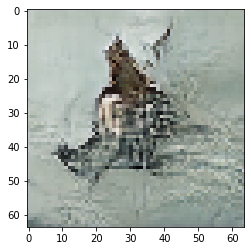

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 37

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6922659873962402 sec
Gen loss: 1.9167914327822233, Disc loss: 2.209919904407702, Disc valid real loss: 0.39517885917111445, Disc valid fake loss: 0.4088102908510911, Disc class real loss: 0.7034967510323775, Disc class fake loss: 0.09030171287687201
Time for epoch 2 is 0.6924519538879395 sec
Gen loss: 1.8434351933629889, Disc loss: 2.188605051291616, Disc valid real loss: 0.4010876832824004, Disc valid fake loss: 0.39211764617970113, Disc class real loss: 0.6993042481573004, Disc class fake loss: 0.08643131507070441
Time for epoch 3 is 0.6940493583679199 sec
Gen loss: 1.8307114149394788, Disc loss: 2.1889848709106445, Disc valid real loss: 0.4007109623206289, Disc valid fake loss: 0.39012108351054947, Disc class real loss: 0.7017624974250793, Disc class fake loss: 0.09732437408284138
Time for epoch 4 is 0.692023754119873 sec
Gen loss: 1.841855086778

Time for epoch 31 is 0.6889252662658691 sec
Gen loss: 1.8067942104841535, Disc loss: 2.0602282160206844, Disc valid real loss: 0.3953549469772138, Disc valid fake loss: 0.385212757085499, Disc class real loss: 0.6699094772338867, Disc class fake loss: 0.12142656488638175
Time for epoch 32 is 0.6971852779388428 sec
Gen loss: 1.8690948925520245, Disc loss: 2.048339711992364, Disc valid real loss: 0.39004505778613846, Disc valid fake loss: 0.38238730712940816, Disc class real loss: 0.6690294899438557, Disc class fake loss: 0.12060557541094329
Time for epoch 33 is 0.6926119327545166 sec
Gen loss: 1.8136765956878662, Disc loss: 2.056384481881794, Disc valid real loss: 0.4164216314491473, Disc valid fake loss: 0.37008993876607793, Disc class real loss: 0.6655503636912296, Disc class fake loss: 0.1419396376923511
Time for epoch 34 is 0.6946449279785156 sec
Gen loss: 1.8205987591492503, Disc loss: 2.1053422940404793, Disc valid real loss: 0.4169381464782514, Disc valid fake loss: 0.39569692548

Time for epoch 62 is 0.698948860168457 sec
Gen loss: 1.7961607795012624, Disc loss: 2.018954302135267, Disc valid real loss: 0.40475506061001826, Disc valid fake loss: 0.39863016103443344, Disc class real loss: 0.6615694196600663, Disc class fake loss: 0.17556485220005638
Time for epoch 63 is 0.7006027698516846 sec
Gen loss: 1.8245343973762111, Disc loss: 2.0192012033964457, Disc valid real loss: 0.3803957998752594, Disc valid fake loss: 0.40169055524625275, Disc class real loss: 0.6769301232538725, Disc class fake loss: 0.15791478204099754
Time for epoch 64 is 0.6946089267730713 sec
Gen loss: 1.9372260256817466, Disc loss: 2.0038937518471167, Disc valid real loss: 0.39358254012308624, Disc valid fake loss: 0.3787631439535241, Disc class real loss: 0.6745533754951075, Disc class fake loss: 0.16009753981703206
Time for epoch 65 is 0.699235200881958 sec
Gen loss: 1.9060776170931364, Disc loss: 1.9745850061115466, Disc valid real loss: 0.3863003002969842, Disc valid fake loss: 0.393389802

Time for epoch 93 is 0.69175124168396 sec
Gen loss: 1.9760306257950633, Disc loss: 1.9163393535112079, Disc valid real loss: 0.3667229978661788, Disc valid fake loss: 0.3830109364108035, Disc class real loss: 0.6671175862613478, Disc class fake loss: 0.16349322740968905
Time for epoch 94 is 0.6883294582366943 sec
Gen loss: 1.859740188247279, Disc loss: 1.8901084598742033, Disc valid real loss: 0.4153629651195125, Disc valid fake loss: 0.3819408761827569, Disc class real loss: 0.6322510493429083, Disc class fake loss: 0.12200794682690971
Time for epoch 95 is 0.6953787803649902 sec
Gen loss: 1.965574164139597, Disc loss: 1.9036986576883417, Disc valid real loss: 0.3977884116925691, Disc valid fake loss: 0.39062050141786275, Disc class real loss: 0.644765599777824, Disc class fake loss: 0.13238300618372464
Time for epoch 96 is 0.692018985748291 sec
Gen loss: 1.8065140937504016, Disc loss: 1.9751648338217485, Disc valid real loss: 0.42257412326963323, Disc valid fake loss: 0.39711282912053

Time for epoch 123 is 0.6990008354187012 sec
Gen loss: 1.868173555323952, Disc loss: 1.8385591381474544, Disc valid real loss: 0.4067705304999101, Disc valid fake loss: 0.36216524008073303, Disc class real loss: 0.6460515072471217, Disc class fake loss: 0.14144358940814672
Time for epoch 124 is 0.6994292736053467 sec
Gen loss: 1.848562334713183, Disc loss: 1.8622227342505204, Disc valid real loss: 0.40049221170575994, Disc valid fake loss: 0.39082236666428416, Disc class real loss: 0.6449937569467645, Disc class fake loss: 0.15203932633525447
Time for epoch 125 is 0.6971735954284668 sec
Gen loss: 1.904151998068157, Disc loss: 1.8904660375494706, Disc valid real loss: 0.39082399167512594, Disc valid fake loss: 0.39835358763995926, Disc class real loss: 0.6774578784641466, Disc class fake loss: 0.11144474501672544
Time for epoch 126 is 0.7000386714935303 sec
Gen loss: 1.994700180856805, Disc loss: 1.8440338875118054, Disc valid real loss: 0.3745589373927367, Disc valid fake loss: 0.39362

Time for epoch 153 is 0.6931567192077637 sec
Gen loss: 1.8816234124334235, Disc loss: 1.8046860255693133, Disc valid real loss: 0.41150597678987605, Disc valid fake loss: 0.3921221541730981, Disc class real loss: 0.6494092345237732, Disc class fake loss: 0.10692456599913146
Time for epoch 154 is 0.6978719234466553 sec
Gen loss: 1.9215028474205418, Disc loss: 1.8019763733211316, Disc valid real loss: 0.3971778123002303, Disc valid fake loss: 0.3889270926776685, Disc class real loss: 0.6545489116718894, Disc class fake loss: 0.1238372988606754
Time for epoch 155 is 0.6933209896087646 sec
Gen loss: 2.0214880830363224, Disc loss: 1.7860932977576005, Disc valid real loss: 0.38632403863103765, Disc valid fake loss: 0.3805428641407113, Disc class real loss: 0.6572802223657307, Disc class fake loss: 0.12627701304460826
Time for epoch 156 is 0.6944990158081055 sec
Gen loss: 1.891655821549265, Disc loss: 1.775739023559972, Disc valid real loss: 0.38689913090906647, Disc valid fake loss: 0.387753

Time for epoch 183 is 0.6938214302062988 sec
Gen loss: 1.8927229140934192, Disc loss: 1.7755829221323918, Disc valid real loss: 0.4033068465559106, Disc valid fake loss: 0.379712827895817, Disc class real loss: 0.675035087685836, Disc class fake loss: 0.13076276449780716
Time for epoch 184 is 0.6954619884490967 sec
Gen loss: 1.9305948583703292, Disc loss: 1.6939676058919806, Disc valid real loss: 0.3844090919745596, Disc valid fake loss: 0.3840126661877883, Disc class real loss: 0.6395333221084193, Disc class fake loss: 0.10431643889138573
Time for epoch 185 is 0.6950244903564453 sec
Gen loss: 1.974653024422495, Disc loss: 1.766723068136918, Disc valid real loss: 0.3959398567676544, Disc valid fake loss: 0.3720187262484902, Disc class real loss: 0.6838901764468143, Disc class fake loss: 0.12824034102653203
Time for epoch 186 is 0.7091505527496338 sec
Gen loss: 1.9850576425853528, Disc loss: 1.7296911854492991, Disc valid real loss: 0.3971075619521894, Disc valid fake loss: 0.3803877532

Time for epoch 213 is 0.6948034763336182 sec
Gen loss: 1.9977848592557406, Disc loss: 1.6228116248783313, Disc valid real loss: 0.39155137225201253, Disc valid fake loss: 0.3567327708005905, Disc class real loss: 0.6310213270940279, Disc class fake loss: 0.12440547896058936
Time for epoch 214 is 0.6944296360015869 sec
Gen loss: 1.930347530465377, Disc loss: 1.6711519580138356, Disc valid real loss: 0.38400672062447194, Disc valid fake loss: 0.3828960296354796, Disc class real loss: 0.6578543468525535, Disc class fake loss: 0.12245373545508635
Time for epoch 215 is 0.6958293914794922 sec
Gen loss: 2.0162703677227625, Disc loss: 1.639207494886298, Disc valid real loss: 0.38462097080130325, Disc valid fake loss: 0.38327169888897944, Disc class real loss: 0.6550839857051247, Disc class fake loss: 0.08673296966835072
Time for epoch 216 is 0.6887218952178955 sec
Gen loss: 1.9471016683076556, Disc loss: 1.6676836452986066, Disc valid real loss: 0.3696925593049903, Disc valid fake loss: 0.4056

Time for epoch 243 is 0.7036399841308594 sec
Gen loss: 1.9195962516885055, Disc loss: 1.6198590680172569, Disc valid real loss: 0.4046760773972461, Disc valid fake loss: 0.3965623017988707, Disc class real loss: 0.6454945488979942, Disc class fake loss: 0.10431247184935369
Time for epoch 244 is 0.6931068897247314 sec
Gen loss: 1.9214673732456409, Disc loss: 1.5874230736180355, Disc valid real loss: 0.3929193317890167, Disc valid fake loss: 0.37966100793135793, Disc class real loss: 0.6592686427266974, Disc class fake loss: 0.08461297666163821
Time for epoch 245 is 0.6970646381378174 sec
Gen loss: 2.0010423472053125, Disc loss: 1.6452000643077649, Disc valid real loss: 0.40860283531640706, Disc valid fake loss: 0.3918280287792808, Disc class real loss: 0.6932564252301266, Disc class fake loss: 0.07772413719641535
Time for epoch 246 is 0.7017216682434082 sec
Gen loss: 1.9751076259111102, Disc loss: 1.6249742194225913, Disc valid real loss: 0.39550209202264486, Disc valid fake loss: 0.394

Time for epoch 273 is 0.695375919342041 sec
Gen loss: 1.988191472856622, Disc loss: 1.5987726700933356, Disc valid real loss: 0.4229656348102971, Disc valid fake loss: 0.40358913729065343, Disc class real loss: 0.6631544044143275, Disc class fake loss: 0.09823057545643103
Time for epoch 274 is 0.6938555240631104 sec
Gen loss: 1.9019631586576764, Disc loss: 1.582654030699479, Disc valid real loss: 0.40581832277147395, Disc valid fake loss: 0.4110194476027238, Disc class real loss: 0.6592385517923456, Disc class fake loss: 0.09788161829898231
Time for epoch 275 is 0.6993584632873535 sec
Gen loss: 1.9265574216842651, Disc loss: 1.5619862769779407, Disc valid real loss: 0.4026191909062235, Disc valid fake loss: 0.38391124261052983, Disc class real loss: 0.6827587955876401, Disc class fake loss: 0.08559022255634006
Time for epoch 276 is 0.6955668926239014 sec
Gen loss: 1.9638687497691105, Disc loss: 1.5317164910467047, Disc valid real loss: 0.4207760911238821, Disc valid fake loss: 0.380078

Time for epoch 303 is 0.6952199935913086 sec
Gen loss: 1.9014669343044883, Disc loss: 1.509259819984436, Disc valid real loss: 0.40709442606097773, Disc valid fake loss: 0.3812867920649679, Disc class real loss: 0.6435719038310804, Disc class fake loss: 0.07741995861655787
Time for epoch 304 is 0.6957988739013672 sec
Gen loss: 2.0332964972445837, Disc loss: 1.578847558874833, Disc valid real loss: 0.40790292463804545, Disc valid fake loss: 0.41118788248614263, Disc class real loss: 0.6763270434580351, Disc class fake loss: 0.08354828545921728
Time for epoch 305 is 0.6951138973236084 sec
Gen loss: 1.9223081751873619, Disc loss: 1.527328986870615, Disc valid real loss: 0.39320409297943115, Disc valid fake loss: 0.38759928000600713, Disc class real loss: 0.6714102029800415, Disc class fake loss: 0.07523468176000997
Time for epoch 306 is 0.6961157321929932 sec
Gen loss: 1.903427519296345, Disc loss: 1.5943952108684338, Disc valid real loss: 0.4104361738029279, Disc valid fake loss: 0.41159

Time for epoch 333 is 0.6964192390441895 sec
Gen loss: 1.9073574793966193, Disc loss: 1.5744110973257768, Disc valid real loss: 0.41668947433170517, Disc valid fake loss: 0.4194952720089963, Disc class real loss: 0.663901222379584, Disc class fake loss: 0.0744430337493357
Time for epoch 334 is 0.6948707103729248 sec
Gen loss: 1.9228706046154624, Disc loss: 1.5575488303837024, Disc valid real loss: 0.4003556049183795, Disc valid fake loss: 0.38461217441056905, Disc class real loss: 0.684692875335091, Disc class fake loss: 0.08800754343208514
Time for epoch 335 is 0.6983006000518799 sec
Gen loss: 1.977551447717767, Disc loss: 1.5170627957896183, Disc valid real loss: 0.4126503310705486, Disc valid fake loss: 0.3826019763946533, Disc class real loss: 0.647982540883516, Disc class fake loss: 0.07394273363445934
Time for epoch 336 is 0.6977841854095459 sec
Gen loss: 1.9867832786158512, Disc loss: 1.5240212302458913, Disc valid real loss: 0.39043527684713664, Disc valid fake loss: 0.38492136

Time for epoch 363 is 0.6975593566894531 sec
Gen loss: 1.9072548966658742, Disc loss: 1.534149264034472, Disc valid real loss: 0.4250856732067309, Disc valid fake loss: 0.38689636399871424, Disc class real loss: 0.6392242375173067, Disc class fake loss: 0.08305426961497257
Time for epoch 364 is 0.6949830055236816 sec
Gen loss: 1.9850682271154303, Disc loss: 1.5191720661364103, Disc valid real loss: 0.388927604022779, Disc valid fake loss: 0.38978293851802226, Disc class real loss: 0.6502507956404435, Disc class fake loss: 0.09032273743497699
Time for epoch 365 is 0.6988890171051025 sec
Gen loss: 1.9037162065505981, Disc loss: 1.5417162054463436, Disc valid real loss: 0.41086398300371674, Disc valid fake loss: 0.3944673898972963, Disc class real loss: 0.6684384942054749, Disc class fake loss: 0.06806640101498679
Time for epoch 366 is 0.698594331741333 sec
Gen loss: 1.9155365730586804, Disc loss: 1.4969169654344257, Disc valid real loss: 0.39031434059143066, Disc valid fake loss: 0.38328

Time for epoch 393 is 0.6944394111633301 sec
Gen loss: 1.9360088737387406, Disc loss: 1.5056092739105225, Disc valid real loss: 0.3845369047240207, Disc valid fake loss: 0.3810765476603257, Disc class real loss: 0.6694192729498211, Disc class fake loss: 0.07069632901172888
Time for epoch 394 is 0.6896336078643799 sec
Gen loss: 1.9877026583019055, Disc loss: 1.53149970581657, Disc valid real loss: 0.3859739883949882, Disc valid fake loss: 0.3872843000449632, Disc class real loss: 0.686176525919061, Disc class fake loss: 0.07218769859326513
Time for epoch 395 is 0.6984384059906006 sec
Gen loss: 1.9652417333502519, Disc loss: 1.488896878142106, Disc valid real loss: 0.3888910899036809, Disc valid fake loss: 0.39216645924668564, Disc class real loss: 0.6569134404784754, Disc class fake loss: 0.051047100342418016
Time for epoch 396 is 0.6955218315124512 sec
Gen loss: 1.955000507204156, Disc loss: 1.5166187913794267, Disc valid real loss: 0.3835185201544511, Disc valid fake loss: 0.384409261

Time for epoch 423 is 0.7029914855957031 sec
Gen loss: 1.9654793111901534, Disc loss: 1.5356724575946206, Disc valid real loss: 0.3927932593383287, Disc valid fake loss: 0.39022774445383174, Disc class real loss: 0.6763026620212355, Disc class fake loss: 0.0764687767154292
Time for epoch 424 is 0.6986656188964844 sec
Gen loss: 1.91009017040855, Disc loss: 1.543155356457359, Disc valid real loss: 0.37927937350775065, Disc valid fake loss: 0.38625634344000565, Disc class real loss: 0.7003972342139796, Disc class fake loss: 0.07734705909694496
Time for epoch 425 is 0.7099685668945312 sec
Gen loss: 2.0476888982873214, Disc loss: 1.505192888410468, Disc valid real loss: 0.3879794525472741, Disc valid fake loss: 0.3760165736863488, Disc class real loss: 0.6617973101766486, Disc class fake loss: 0.07951602673060015
Time for epoch 426 is 0.7030835151672363 sec
Gen loss: 2.050275350871839, Disc loss: 1.5037039643839787, Disc valid real loss: 0.39731067419052124, Disc valid fake loss: 0.35879742

Time for epoch 453 is 0.6982452869415283 sec
Gen loss: 1.9312089054208053, Disc loss: 1.560457097856622, Disc valid real loss: 0.4005886818233289, Disc valid fake loss: 0.40020879161985295, Disc class real loss: 0.6876103125120464, Disc class fake loss: 0.07217241509964592
Time for epoch 454 is 0.7012479305267334 sec
Gen loss: 2.000199324206302, Disc loss: 1.5279336854031211, Disc valid real loss: 0.3719494029095298, Disc valid fake loss: 0.397262747350492, Disc class real loss: 0.6809372556836981, Disc class fake loss: 0.07790489141878329
Time for epoch 455 is 0.6999189853668213 sec
Gen loss: 1.9659088222604049, Disc loss: 1.5242128874126233, Disc valid real loss: 0.4002927596631803, Disc valid fake loss: 0.4071498936728427, Disc class real loss: 0.6609684887685274, Disc class fake loss: 0.05592277224518751
Time for epoch 456 is 0.6982564926147461 sec
Gen loss: 1.8570627789748342, Disc loss: 1.5488249502683942, Disc valid real loss: 0.4104366506400861, Disc valid fake loss: 0.39935762

Time for epoch 483 is 0.698544979095459 sec
Gen loss: 2.10329218287217, Disc loss: 1.5670093486183567, Disc valid real loss: 0.4083663280072965, Disc valid fake loss: 0.38409820042158427, Disc class real loss: 0.65343114263133, Disc class fake loss: 0.12122011380760293
Time for epoch 484 is 0.7001979351043701 sec
Gen loss: 2.208904140873959, Disc loss: 1.574985384941101, Disc valid real loss: 0.3955025751339762, Disc valid fake loss: 0.3946434322156404, Disc class real loss: 0.6845052932438097, Disc class fake loss: 0.1004509341559912
Time for epoch 485 is 0.698763370513916 sec
Gen loss: 1.876946995132848, Disc loss: 1.5658667652230513, Disc valid real loss: 0.3899481343595605, Disc valid fake loss: 0.41666534699891744, Disc class real loss: 0.6714372979967218, Disc class fake loss: 0.0879326978404271
Time for epoch 486 is 0.6989517211914062 sec
Gen loss: 1.9121106612054926, Disc loss: 1.6403124457911442, Disc valid real loss: 0.42419890039845515, Disc valid fake loss: 0.40960910445765

Time for epoch 513 is 0.6915178298950195 sec
Gen loss: 1.8758348853964555, Disc loss: 1.5602096130973415, Disc valid real loss: 0.3942403699222364, Disc valid fake loss: 0.4118031137867978, Disc class real loss: 0.6604317018860265, Disc class fake loss: 0.09384776475398164
Time for epoch 514 is 0.6995182037353516 sec
Gen loss: 1.9734407663345337, Disc loss: 1.4996541863993595, Disc valid real loss: 0.389174599396555, Disc valid fake loss: 0.3859118497685382, Disc class real loss: 0.6552180490995708, Disc class fake loss: 0.0694668583179775
Time for epoch 515 is 0.6974599361419678 sec
Gen loss: 1.979458394803499, Disc loss: 1.568453914240787, Disc valid real loss: 0.40154546263970825, Disc valid fake loss: 0.38995147143539627, Disc class real loss: 0.6949260360316226, Disc class fake loss: 0.08215351579220671
Time for epoch 516 is 0.6994011402130127 sec
Gen loss: 1.9461859339161922, Disc loss: 1.499927426639356, Disc valid real loss: 0.374062379724101, Disc valid fake loss: 0.3885282183

Time for epoch 543 is 0.7006881237030029 sec
Gen loss: 2.0107733513179578, Disc loss: 1.5493224984721135, Disc valid real loss: 0.37769134264243276, Disc valid fake loss: 0.40127819933389364, Disc class real loss: 0.699022136236492, Disc class fake loss: 0.07145635871902893
Time for epoch 544 is 0.6964888572692871 sec
Gen loss: 1.963560700416565, Disc loss: 1.5649432445827283, Disc valid real loss: 0.38968985645394577, Disc valid fake loss: 0.3902692465405715, Disc class real loss: 0.6930775673765885, Disc class fake loss: 0.09202682932740763
Time for epoch 545 is 0.6896281242370605 sec
Gen loss: 1.9380547059209723, Disc loss: 1.5232907408162166, Disc valid real loss: 0.38490796716589676, Disc valid fake loss: 0.3750634130678679, Disc class real loss: 0.6887782843489396, Disc class fake loss: 0.07466393062158634
Time for epoch 546 is 0.6977105140686035 sec
Gen loss: 1.949795258672614, Disc loss: 1.5364645217594348, Disc valid real loss: 0.3868748310365175, Disc valid fake loss: 0.39226

Time for epoch 573 is 0.696983814239502 sec
Gen loss: 1.9807281431398893, Disc loss: 1.5291359487332796, Disc valid real loss: 0.39738932800920385, Disc valid fake loss: 0.39487453354032415, Disc class real loss: 0.6573428323394374, Disc class fake loss: 0.07964480344794299
Time for epoch 574 is 0.6993880271911621 sec
Gen loss: 1.9280906978406405, Disc loss: 1.5618536472320557, Disc valid real loss: 0.38664549746011434, Disc valid fake loss: 0.3982011550351193, Disc class real loss: 0.6903190989243356, Disc class fake loss: 0.08680862384407144
Time for epoch 575 is 0.7000834941864014 sec
Gen loss: 1.9835252197165238, Disc loss: 1.5217722779826115, Disc valid real loss: 0.3975276398031335, Disc valid fake loss: 0.3886041154986934, Disc class real loss: 0.6726642784319425, Disc class fake loss: 0.06309820897877216
Time for epoch 576 is 0.6996963024139404 sec
Gen loss: 1.961174632373609, Disc loss: 1.4935291754572015, Disc valid real loss: 0.39899590062467677, Disc valid fake loss: 0.3701

Time for epoch 603 is 0.6984729766845703 sec
Gen loss: 1.9228850916812295, Disc loss: 1.5417795118532682, Disc valid real loss: 0.39224365432011454, Disc valid fake loss: 0.3896664098689431, Disc class real loss: 0.6859458214358279, Disc class fake loss: 0.07404604593389913
Time for epoch 604 is 0.6995787620544434 sec
Gen loss: 2.030428271544607, Disc loss: 1.5592940292860333, Disc valid real loss: 0.41916004136988994, Disc valid fake loss: 0.38988737605120005, Disc class real loss: 0.6726496376489338, Disc class fake loss: 0.07771599430002664
Time for epoch 605 is 0.6980130672454834 sec
Gen loss: 1.8945725466075696, Disc loss: 1.5475568394911916, Disc valid real loss: 0.3854926087354359, Disc valid fake loss: 0.39685790162337453, Disc class real loss: 0.6773137418847335, Disc class fake loss: 0.08801045131526496
Time for epoch 606 is 0.6947364807128906 sec
Gen loss: 1.9998394062644558, Disc loss: 1.5601803566280164, Disc valid real loss: 0.4066227000010641, Disc valid fake loss: 0.412

Time for epoch 633 is 0.6995787620544434 sec
Gen loss: 1.981393575668335, Disc loss: 1.5270136908480996, Disc valid real loss: 0.4116092386998628, Disc valid fake loss: 0.39024174840826736, Disc class real loss: 0.6555299351089879, Disc class fake loss: 0.06974992067798187
Time for epoch 634 is 0.6966571807861328 sec
Gen loss: 1.9281622924302753, Disc loss: 1.5405932727612948, Disc valid real loss: 0.3996336695395018, Disc valid fake loss: 0.3869178702956752, Disc class real loss: 0.6850662388299641, Disc class fake loss: 0.06909869660280253
Time for epoch 635 is 0.6973342895507812 sec
Gen loss: 1.8834263964703208, Disc loss: 1.5193929860466404, Disc valid real loss: 0.38229924048248093, Disc valid fake loss: 0.3799991388069956, Disc class real loss: 0.6837494781142787, Disc class fake loss: 0.07346722522848531
Time for epoch 636 is 0.6971473693847656 sec
Gen loss: 2.0233732650154517, Disc loss: 1.5265523948167499, Disc valid real loss: 0.39747414149736104, Disc valid fake loss: 0.3766

Time for epoch 663 is 0.6973063945770264 sec
Gen loss: 1.8599720063962435, Disc loss: 1.503929244844537, Disc valid real loss: 0.3776377627724095, Disc valid fake loss: 0.378044257038518, Disc class real loss: 0.6762234631337618, Disc class fake loss: 0.0721445917887123
Time for epoch 664 is 0.698955774307251 sec
Gen loss: 1.9969780194131952, Disc loss: 1.5004168623372127, Disc valid real loss: 0.3870079909500323, Disc valid fake loss: 0.39209014491031047, Disc class real loss: 0.6424824469967892, Disc class fake loss: 0.07894902637130335
Time for epoch 665 is 0.697669506072998 sec
Gen loss: 1.9333275995756452, Disc loss: 1.531341697040357, Disc valid real loss: 0.40083107038548116, Disc valid fake loss: 0.3894687985119067, Disc class real loss: 0.6822234203940943, Disc class fake loss: 0.058943092234824836
Time for epoch 666 is 0.69875168800354 sec
Gen loss: 1.976392990664432, Disc loss: 1.5045712056912874, Disc valid real loss: 0.382015104356565, Disc valid fake loss: 0.3855078879155

Time for epoch 693 is 0.7004876136779785 sec
Gen loss: 2.012697590024848, Disc loss: 1.5800348457537199, Disc valid real loss: 0.4044859346590544, Disc valid fake loss: 0.4064037125361593, Disc class real loss: 0.6936089333735014, Disc class fake loss: 0.0756598787480279
Time for epoch 694 is 0.6989781856536865 sec
Gen loss: 1.954078147285863, Disc loss: 1.516987549631219, Disc valid real loss: 0.3924261770750347, Disc valid fake loss: 0.3735727040391219, Disc class real loss: 0.6649740306954635, Disc class fake loss: 0.0861304265103842
Time for epoch 695 is 0.6983892917633057 sec
Gen loss: 1.9091520183964779, Disc loss: 1.5440913438796997, Disc valid real loss: 0.39536839409878377, Disc valid fake loss: 0.4063306184191453, Disc class real loss: 0.6741100988889995, Disc class fake loss: 0.06840336499245543
Time for epoch 696 is 0.6997120380401611 sec
Gen loss: 1.8789636022166203, Disc loss: 1.4909567080046002, Disc valid real loss: 0.41085348631206314, Disc valid fake loss: 0.380183350

Time for epoch 723 is 0.6936240196228027 sec
Gen loss: 1.9528497520246004, Disc loss: 1.5081160695929277, Disc valid real loss: 0.3796158260420749, Disc valid fake loss: 0.38409743967809173, Disc class real loss: 0.67679594692431, Disc class fake loss: 0.0677286805094857
Time for epoch 724 is 0.6949670314788818 sec
Gen loss: 1.9607362747192383, Disc loss: 1.5358393945192035, Disc valid real loss: 0.3885239143120615, Disc valid fake loss: 0.38958674198702764, Disc class real loss: 0.6758859094820524, Disc class fake loss: 0.08196164647999563
Time for epoch 725 is 0.689448356628418 sec
Gen loss: 1.903539406625848, Disc loss: 1.5595475623482151, Disc valid real loss: 0.4046252401251542, Disc valid fake loss: 0.39639991521835327, Disc class real loss: 0.6757672523197374, Disc class fake loss: 0.08287373763558112
Time for epoch 726 is 0.693434476852417 sec
Gen loss: 1.902001556597258, Disc loss: 1.5170399201543707, Disc valid real loss: 0.3833681643009186, Disc valid fake loss: 0.3885177169

Time for epoch 753 is 0.7032678127288818 sec
Gen loss: 1.8995944324292635, Disc loss: 1.5405199841449135, Disc valid real loss: 0.37666867124406916, Disc valid fake loss: 0.4014050035100234, Disc class real loss: 0.6875417985414204, Disc class fake loss: 0.0750270434900334
Time for epoch 754 is 0.7029323577880859 sec
Gen loss: 2.011963072576021, Disc loss: 1.5070418872331317, Disc valid real loss: 0.3880544979321329, Disc valid fake loss: 0.3809104522592143, Disc class real loss: 0.6708383152359411, Disc class fake loss: 0.06735934699444394
Time for epoch 755 is 0.6950387954711914 sec
Gen loss: 1.9775507199136835, Disc loss: 1.4978215506202297, Disc valid real loss: 0.38324149658805445, Disc valid fake loss: 0.3803461460690749, Disc class real loss: 0.6517412693876969, Disc class fake loss: 0.08260647746685304
Time for epoch 756 is 0.6936273574829102 sec
Gen loss: 1.9312350875452946, Disc loss: 1.5424907207489014, Disc valid real loss: 0.40277393554386337, Disc valid fake loss: 0.39822

Time for epoch 783 is 0.703639030456543 sec
Gen loss: 1.9373895494561446, Disc loss: 1.5026948765704506, Disc valid real loss: 0.3735534329163401, Disc valid fake loss: 0.3900047807317031, Disc class real loss: 0.6808745139523557, Disc class fake loss: 0.05838667758201298
Time for epoch 784 is 0.7022156715393066 sec
Gen loss: 1.9484487709246183, Disc loss: 1.4975396771180003, Disc valid real loss: 0.3929783576413205, Disc valid fake loss: 0.3806297026182476, Disc class real loss: 0.6537759460900959, Disc class fake loss: 0.07027238372125123
Time for epoch 785 is 0.7002646923065186 sec
Gen loss: 1.9328932260212146, Disc loss: 1.5195973421397961, Disc valid real loss: 0.39439979352449117, Disc valid fake loss: 0.38469794235731425, Disc class real loss: 0.6833524798092089, Disc class fake loss: 0.05727235198413071
Time for epoch 786 is 0.6962370872497559 sec
Gen loss: 1.9571923770402606, Disc loss: 1.5398221831572683, Disc valid real loss: 0.40402607541335256, Disc valid fake loss: 0.3887

Time for epoch 813 is 0.695744514465332 sec
Gen loss: 1.9279720406783254, Disc loss: 1.5396639359624762, Disc valid real loss: 0.38985814075720937, Disc valid fake loss: 0.382539606408069, Disc class real loss: 0.7013476992908277, Disc class fake loss: 0.06604558994111262
Time for epoch 814 is 0.6906652450561523 sec
Gen loss: 1.9589518245897795, Disc loss: 1.4916956487454867, Disc valid real loss: 0.39337669391381114, Disc valid fake loss: 0.39066087493771, Disc class real loss: 0.6507507625379061, Disc class fake loss: 0.05702609372766394
Time for epoch 815 is 0.6934370994567871 sec
Gen loss: 2.017834782600403, Disc loss: 1.5522941037228233, Disc valid real loss: 0.40560393819683477, Disc valid fake loss: 0.377254539414456, Disc class real loss: 0.6946782971683302, Disc class fake loss: 0.07488131091782921
Time for epoch 816 is 0.6909825801849365 sec
Gen loss: 1.8989957947480052, Disc loss: 1.5441567646829706, Disc valid real loss: 0.40747530523099396, Disc valid fake loss: 0.39356442

Time for epoch 843 is 0.6957988739013672 sec
Gen loss: 1.8828804681175633, Disc loss: 1.5506525478864972, Disc valid real loss: 0.4075714177206943, Disc valid fake loss: 0.4075616394218646, Disc class real loss: 0.6602324812035811, Disc class fake loss: 0.0754039996352635
Time for epoch 844 is 0.6958482265472412 sec
Gen loss: 1.9216942849912142, Disc loss: 1.5618784615868015, Disc valid real loss: 0.39210515743807745, Disc valid fake loss: 0.37585896253585815, Disc class real loss: 0.6992208675334328, Disc class fake loss: 0.09481439778679296
Time for epoch 845 is 0.695441484451294 sec
Gen loss: 1.927870700233861, Disc loss: 1.5187781986437345, Disc valid real loss: 0.39800461107178736, Disc valid fake loss: 0.3737478601305108, Disc class real loss: 0.6647442453785947, Disc class fake loss: 0.0823979901247903
Time for epoch 846 is 0.6951048374176025 sec
Gen loss: 1.896311923077232, Disc loss: 1.5590410420769139, Disc valid real loss: 0.40340520049396317, Disc valid fake loss: 0.4164879

Time for epoch 873 is 0.6955842971801758 sec
Gen loss: 1.9197620592619244, Disc loss: 1.508767058974818, Disc valid real loss: 0.38640151682652923, Disc valid fake loss: 0.3909153875551726, Disc class real loss: 0.6579538489642897, Disc class fake loss: 0.07361318210237905
Time for epoch 874 is 0.6959078311920166 sec
Gen loss: 1.9149962161716663, Disc loss: 1.4835017417606555, Disc valid real loss: 0.3860066909539072, Disc valid fake loss: 0.3691687121203071, Disc class real loss: 0.6738138041998211, Disc class fake loss: 0.05463640440843607
Time for epoch 875 is 0.6930801868438721 sec
Gen loss: 1.9367090087187917, Disc loss: 1.5324087017460872, Disc valid real loss: 0.40643667861034993, Disc valid fake loss: 0.3933165889037283, Disc class real loss: 0.6637248271390012, Disc class fake loss: 0.06904957267014604
Time for epoch 876 is 0.6959176063537598 sec
Gen loss: 1.9275794593911422, Disc loss: 1.5373518153240806, Disc valid real loss: 0.3919388330296466, Disc valid fake loss: 0.38788

Time for epoch 903 is 0.6982154846191406 sec
Gen loss: 1.9815087192936947, Disc loss: 1.4834739408994977, Disc valid real loss: 0.36747689153018753, Disc valid fake loss: 0.37931773693938003, Disc class real loss: 0.6700458714836522, Disc class fake loss: 0.0667541079027088
Time for epoch 904 is 0.6960523128509521 sec
Gen loss: 1.93844431325009, Disc loss: 1.5254175788477848, Disc valid real loss: 0.39988931699803, Disc valid fake loss: 0.3724521720095685, Disc class real loss: 0.6895908681969893, Disc class fake loss: 0.06361045658980545
Time for epoch 905 is 0.6942689418792725 sec
Gen loss: 2.0064421578457483, Disc loss: 1.5242551063236438, Disc valid real loss: 0.3733808382561332, Disc valid fake loss: 0.3961567815981413, Disc class real loss: 0.6664613642190632, Disc class fake loss: 0.08837174996733665
Time for epoch 906 is 0.692765474319458 sec
Gen loss: 1.9409898958708112, Disc loss: 1.4913803150779323, Disc valid real loss: 0.3822847259672065, Disc valid fake loss: 0.3963633524

Time for epoch 933 is 0.6964607238769531 sec
Gen loss: 1.945492380543759, Disc loss: 1.514762658821909, Disc valid real loss: 0.39123319952111496, Disc valid fake loss: 0.38263244534793656, Disc class real loss: 0.6712411579332853, Disc class fake loss: 0.06977618015126179
Time for epoch 934 is 0.7057404518127441 sec
Gen loss: 1.931111925526669, Disc loss: 1.5653058102256374, Disc valid real loss: 0.42128600258576243, Disc valid fake loss: 0.38949450536778096, Disc class real loss: 0.678168303088138, Disc class fake loss: 0.07647735390223954
Time for epoch 935 is 0.6971695423126221 sec
Gen loss: 1.9995126410534507, Disc loss: 1.5513602683418675, Disc valid real loss: 0.3780709018832759, Disc valid fake loss: 0.3909346304441753, Disc class real loss: 0.6962844447085732, Disc class fake loss: 0.08619235710878122
Time for epoch 936 is 0.6974985599517822 sec
Gen loss: 2.031127873219942, Disc loss: 1.527357120262949, Disc valid real loss: 0.38634858476488215, Disc valid fake loss: 0.3637966

Time for epoch 963 is 0.7086825370788574 sec
Gen loss: 2.0283323965574565, Disc loss: 1.5123607233950966, Disc valid real loss: 0.37915160781458807, Disc valid fake loss: 0.3891740300153431, Disc class real loss: 0.6755446415198477, Disc class fake loss: 0.06861185547160475
Time for epoch 964 is 0.7000343799591064 sec
Gen loss: 1.8826702080274884, Disc loss: 1.504216194152832, Disc valid real loss: 0.3897030526085904, Disc valid fake loss: 0.37329120541873734, Disc class real loss: 0.6490401562891508, Disc class fake loss: 0.0922931395471096
Time for epoch 965 is 0.7001872062683105 sec
Gen loss: 1.9293483809420937, Disc loss: 1.5430359714909603, Disc valid real loss: 0.38384979806448283, Disc valid fake loss: 0.3781688181977523, Disc class real loss: 0.6913757010510093, Disc class fake loss: 0.08976200595498085
Time for epoch 966 is 0.6999630928039551 sec
Gen loss: 1.9703139819596942, Disc loss: 1.5478132335763228, Disc valid real loss: 0.4063662870934135, Disc valid fake loss: 0.37641

Time for epoch 993 is 0.6965649127960205 sec
Gen loss: 1.9599425918177555, Disc loss: 1.5098153227253963, Disc valid real loss: 0.3855475642179188, Disc valid fake loss: 0.4107205977565364, Disc class real loss: 0.6518892708577608, Disc class fake loss: 0.06177594081351632
Time for epoch 994 is 0.6949596405029297 sec
Gen loss: 1.9186899536534359, Disc loss: 1.492382526397705, Disc valid real loss: 0.3763384897457926, Disc valid fake loss: 0.39713922927254125, Disc class real loss: 0.6451538173775924, Disc class fake loss: 0.07386525543896776
Time for epoch 995 is 0.694643497467041 sec
Gen loss: 1.9453061379884418, Disc loss: 1.513323934454667, Disc valid real loss: 0.4105823761538455, Disc valid fake loss: 0.3616043078271966, Disc class real loss: 0.6812329041330438, Disc class fake loss: 0.060028597712516785
Time for epoch 996 is 0.6959056854248047 sec
Gen loss: 1.8509039063202708, Disc loss: 1.5445418922524703, Disc valid real loss: 0.3891369135756242, Disc valid fake loss: 0.3899936

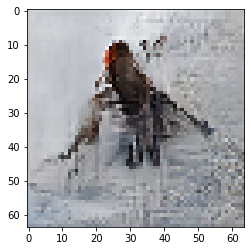

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 38

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6942684650421143 sec
Gen loss: 1.9353610528142828, Disc loss: 2.1468527128821924, Disc valid real loss: 0.3903418873485766, Disc valid fake loss: 0.39793364938936737, Disc class real loss: 0.6798181471071745, Disc class fake loss: 0.0766800832199423
Time for epoch 2 is 0.6959939002990723 sec
Gen loss: 1.8266976632569965, Disc loss: 2.154193376239977, Disc valid real loss: 0.40499384152261836, Disc valid fake loss: 0.38265691148607356, Disc class real loss: 0.6847951443571794, Disc class fake loss: 0.10916162439082798
Time for epoch 3 is 0.6948840618133545 sec
Gen loss: 1.9149338069714998, Disc loss: 2.1352212052596244, Disc valid real loss: 0.3894885778427124, Disc valid fake loss: 0.3819844471780877, Disc class real loss: 0.6845442370364541, Disc class fake loss: 0.08165388044558074
Time for epoch 4 is 0.6971192359924316 sec
Gen loss: 1.90992198492

Time for epoch 31 is 0.6967554092407227 sec
Gen loss: 1.8057588464335392, Disc loss: 2.0573136806488037, Disc valid real loss: 0.37905929119963394, Disc valid fake loss: 0.4077619753385845, Disc class real loss: 0.6649000958392495, Disc class fake loss: 0.12436277340901525
Time for epoch 32 is 0.702634334564209 sec
Gen loss: 1.8793468412600065, Disc loss: 2.0773584089781107, Disc valid real loss: 0.41350184459435313, Disc valid fake loss: 0.3922245878922312, Disc class real loss: 0.6654957470140959, Disc class fake loss: 0.1415597600372214
Time for epoch 33 is 0.704552412033081 sec
Gen loss: 1.785061095890246, Disc loss: 1.9865564735312211, Disc valid real loss: 0.41288496946033676, Disc valid fake loss: 0.3897723720261925, Disc class real loss: 0.6196728850665846, Disc class fake loss: 0.14513441371290306
Time for epoch 34 is 0.697721004486084 sec
Gen loss: 1.7834552840182656, Disc loss: 2.0827556221108687, Disc valid real loss: 0.4026931743872793, Disc valid fake loss: 0.402306092412

Time for epoch 62 is 0.692446231842041 sec
Gen loss: 1.8939873921243768, Disc loss: 1.9710852786114341, Disc valid real loss: 0.3932642968077409, Disc valid fake loss: 0.38937079906463623, Disc class real loss: 0.648750480852629, Disc class fake loss: 0.15605344113550687
Time for epoch 63 is 0.6947264671325684 sec
Gen loss: 1.8425286757318597, Disc loss: 1.9811408958936993, Disc valid real loss: 0.39341689567816884, Disc valid fake loss: 0.39881762077933863, Disc class real loss: 0.6530918510336625, Disc class fake loss: 0.13162571270214884
Time for epoch 64 is 0.6880123615264893 sec
Gen loss: 1.9313102835103084, Disc loss: 1.9589711553172062, Disc valid real loss: 0.3817991598656303, Disc valid fake loss: 0.3766927028957166, Disc class real loss: 0.659323231170052, Disc class fake loss: 0.14206810844571968
Time for epoch 65 is 0.6909084320068359 sec
Gen loss: 1.994107026802866, Disc loss: 1.985503968439604, Disc valid real loss: 0.41739423651444285, Disc valid fake loss: 0.38967874959

Time for epoch 93 is 0.6991274356842041 sec
Gen loss: 2.0112884483839335, Disc loss: 1.919387842479505, Disc valid real loss: 0.3900462608588369, Disc valid fake loss: 0.38108599029089274, Disc class real loss: 0.6585736180606642, Disc class fake loss: 0.1512072058884721
Time for epoch 94 is 0.7000501155853271 sec
Gen loss: 1.9155532686333907, Disc loss: 1.9498496745762073, Disc valid real loss: 0.3879053702479915, Disc valid fake loss: 0.40738970668692337, Disc class real loss: 0.6620696500728005, Disc class fake loss: 0.1579311603778287
Time for epoch 95 is 0.6982400417327881 sec
Gen loss: 1.975003342879446, Disc loss: 1.9047062334261442, Disc valid real loss: 0.3868427856972343, Disc valid fake loss: 0.37535022120726735, Disc class real loss: 0.6584481377350656, Disc class fake loss: 0.1457437186648971
Time for epoch 96 is 0.69673752784729 sec
Gen loss: 1.9015167637875205, Disc loss: 1.875087857246399, Disc valid real loss: 0.3827225691393802, Disc valid fake loss: 0.378479850919623

Time for epoch 123 is 0.6971988677978516 sec
Gen loss: 2.052608665667082, Disc loss: 1.8292200753563328, Disc valid real loss: 0.3937017996060221, Disc valid fake loss: 0.38183395642983287, Disc class real loss: 0.6411438051022982, Disc class fake loss: 0.12267743227513213
Time for epoch 124 is 0.6984865665435791 sec
Gen loss: 1.8922051254071688, Disc loss: 1.917625772325616, Disc valid real loss: 0.39479491898888036, Disc valid fake loss: 0.38922354578971863, Disc class real loss: 0.6865341286910208, Disc class fake loss: 0.14789218259485146
Time for epoch 125 is 0.6974332332611084 sec
Gen loss: 2.011856901018243, Disc loss: 1.8617678629724603, Disc valid real loss: 0.39941162341519404, Disc valid fake loss: 0.3804650557668586, Disc class real loss: 0.6493799811915347, Disc class fake loss: 0.16528725506443726
Time for epoch 126 is 0.6918864250183105 sec
Gen loss: 2.0018371092645744, Disc loss: 1.8850580328389217, Disc valid real loss: 0.3962314317100926, Disc valid fake loss: 0.40160

Time for epoch 153 is 0.6982040405273438 sec
Gen loss: 1.9546001584906327, Disc loss: 1.7985749934848987, Disc valid real loss: 0.38233707374648046, Disc valid fake loss: 0.41518646164944295, Disc class real loss: 0.6424601109404313, Disc class fake loss: 0.1253538033679912
Time for epoch 154 is 0.6968915462493896 sec
Gen loss: 1.9598350085710223, Disc loss: 1.8191246923647428, Disc valid real loss: 0.387766160463032, Disc valid fake loss: 0.40195675586399277, Disc class real loss: 0.6646052818549307, Disc class fake loss: 0.12190769103012587
Time for epoch 155 is 0.6974301338195801 sec
Gen loss: 1.9671734947907298, Disc loss: 1.8230718750702708, Disc valid real loss: 0.39599002662457916, Disc valid fake loss: 0.3917924244152872, Disc class real loss: 0.6665151495682565, Disc class fake loss: 0.1311234349482938
Time for epoch 156 is 0.6972846984863281 sec
Gen loss: 1.9211438957013582, Disc loss: 1.8050115673165572, Disc valid real loss: 0.38044523565392746, Disc valid fake loss: 0.3827

Time for epoch 183 is 0.6973426342010498 sec
Gen loss: 1.8995542024311267, Disc loss: 1.769487173933732, Disc valid real loss: 0.3958346357471065, Disc valid fake loss: 0.39902655858742564, Disc class real loss: 0.6611654538857309, Disc class fake loss: 0.13185541567049527
Time for epoch 184 is 0.69504714012146 sec
Gen loss: 1.8732452078869468, Disc loss: 1.765443626203035, Disc valid real loss: 0.3822547087543889, Disc valid fake loss: 0.4007204112253691, Disc class real loss: 0.6754730030110008, Disc class fake loss: 0.11760939520440604
Time for epoch 185 is 0.7008805274963379 sec
Gen loss: 1.9728155638042248, Disc loss: 1.7299768799229671, Disc valid real loss: 0.38344140821381617, Disc valid fake loss: 0.3860367991422352, Disc class real loss: 0.6590850635578758, Disc class fake loss: 0.12044768388334073
Time for epoch 186 is 0.6988968849182129 sec
Gen loss: 1.9311628278933073, Disc loss: 1.7312115368090177, Disc valid real loss: 0.3790491615471087, Disc valid fake loss: 0.38694972

Time for epoch 213 is 0.6936709880828857 sec
Gen loss: 1.9457635503066213, Disc loss: 1.6636140409268831, Disc valid real loss: 0.39439870652399567, Disc valid fake loss: 0.39186329590646846, Disc class real loss: 0.6517425712786222, Disc class fake loss: 0.0946178400987073
Time for epoch 214 is 0.6916284561157227 sec
Gen loss: 2.0261484447278475, Disc loss: 1.6502545695555837, Disc valid real loss: 0.372531511281666, Disc valid fake loss: 0.372790055839639, Disc class real loss: 0.668583261339288, Disc class fake loss: 0.10618228975095247
Time for epoch 215 is 0.6933281421661377 sec
Gen loss: 1.897256242601495, Disc loss: 1.674452819322285, Disc valid real loss: 0.37952140601057754, Disc valid fake loss: 0.38586751724544327, Disc class real loss: 0.682645436964537, Disc class fake loss: 0.09178784979801428
Time for epoch 216 is 0.6940701007843018 sec
Gen loss: 2.0518775111750553, Disc loss: 1.6885914175133956, Disc valid real loss: 0.412364661693573, Disc valid fake loss: 0.4015966057

Time for epoch 243 is 0.6943507194519043 sec
Gen loss: 1.948115442928515, Disc loss: 1.6069046760860242, Disc valid real loss: 0.3960865688951392, Disc valid fake loss: 0.40640427407465485, Disc class real loss: 0.6393051116090072, Disc class fake loss: 0.096017158933376
Time for epoch 244 is 0.6939752101898193 sec
Gen loss: 1.99471662546459, Disc loss: 1.6214103071313155, Disc valid real loss: 0.4057396540516301, Disc valid fake loss: 0.36978262349178914, Disc class real loss: 0.6607461163872167, Disc class fake loss: 0.11810666754057533
Time for epoch 245 is 0.695777177810669 sec
Gen loss: 1.8925637885143882, Disc loss: 1.5793003408532393, Disc valid real loss: 0.3597904522168009, Disc valid fake loss: 0.3876260487656844, Disc class real loss: 0.6650017060731587, Disc class fake loss: 0.09900711241521333
Time for epoch 246 is 0.7118253707885742 sec
Gen loss: 2.045609944745114, Disc loss: 1.6158883132432635, Disc valid real loss: 0.4112621451679029, Disc valid fake loss: 0.39915521364

Time for epoch 273 is 0.7000942230224609 sec
Gen loss: 1.9089247615713822, Disc loss: 1.5640678531245182, Disc valid real loss: 0.3928588409172861, Disc valid fake loss: 0.3821628281944676, Disc class real loss: 0.6830886947481256, Disc class fake loss: 0.09472274603812318
Time for epoch 274 is 0.6908376216888428 sec
Gen loss: 2.0092248038241736, Disc loss: 1.5578722075412148, Disc valid real loss: 0.38730532872049434, Disc valid fake loss: 0.39363125201902893, Disc class real loss: 0.668798377639369, Disc class fake loss: 0.09929997846484184
Time for epoch 275 is 0.7047009468078613 sec
Gen loss: 2.053773880004883, Disc loss: 1.4777517695175975, Disc valid real loss: 0.3760939820816642, Disc valid fake loss: 0.3820319348259976, Disc class real loss: 0.6300807501140394, Disc class fake loss: 0.08305241285186064
Time for epoch 276 is 0.6917324066162109 sec
Gen loss: 2.036510787512127, Disc loss: 1.5302734751450389, Disc valid real loss: 0.38064683581653397, Disc valid fake loss: 0.391472

Time for epoch 303 is 0.6932766437530518 sec
Gen loss: 1.952389208894027, Disc loss: 1.5008367864709151, Disc valid real loss: 0.37541315430089045, Disc valid fake loss: 0.39168412434427363, Disc class real loss: 0.6601776417933012, Disc class fake loss: 0.07367919659928272
Time for epoch 304 is 0.6922760009765625 sec
Gen loss: 1.9966621022475393, Disc loss: 1.5491302013397217, Disc valid real loss: 0.3903330140992215, Disc valid fake loss: 0.38297193066069957, Disc class real loss: 0.6761385516116494, Disc class fake loss: 0.0998019972129872
Time for epoch 305 is 0.6959123611450195 sec
Gen loss: 1.9506090753956844, Disc loss: 1.5117521411494206, Disc valid real loss: 0.3955938518047333, Disc valid fake loss: 0.3888471699074695, Disc class real loss: 0.6590140273696498, Disc class fake loss: 0.06841523376734633
Time for epoch 306 is 0.7055349349975586 sec
Gen loss: 1.9689362802003558, Disc loss: 1.556821490588941, Disc valid real loss: 0.379013581495536, Disc valid fake loss: 0.4250111

Time for epoch 333 is 0.6934332847595215 sec
Gen loss: 1.9743622541427612, Disc loss: 1.5119746045062417, Disc valid real loss: 0.3879066642962004, Disc valid fake loss: 0.37112105677002355, Disc class real loss: 0.6776399549685026, Disc class fake loss: 0.07542739083108149
Time for epoch 334 is 0.6940054893493652 sec
Gen loss: 2.0282224793183175, Disc loss: 1.5874293038719578, Disc valid real loss: 0.40135904754463, Disc valid fake loss: 0.3998792594984958, Disc class real loss: 0.658401181823329, Disc class fake loss: 0.1278959524474646
Time for epoch 335 is 0.6905598640441895 sec
Gen loss: 1.9769202784488076, Disc loss: 1.5435153873343217, Disc valid real loss: 0.4050346377648805, Disc valid fake loss: 0.37934809923171997, Disc class real loss: 0.6839625239372253, Disc class fake loss: 0.07529187163240031
Time for epoch 336 is 0.6903860569000244 sec
Gen loss: 1.896555969589635, Disc loss: 1.540082950341074, Disc valid real loss: 0.38526407903746557, Disc valid fake loss: 0.408584847

Time for epoch 363 is 0.691922664642334 sec
Gen loss: 1.8636395805760433, Disc loss: 1.5479155088725842, Disc valid real loss: 0.39821690634677287, Disc valid fake loss: 0.3975712782458255, Disc class real loss: 0.67137673967763, Disc class fake loss: 0.08086870179364555
Time for epoch 364 is 0.6917514801025391 sec
Gen loss: 1.8918957208332263, Disc loss: 1.595929923810457, Disc valid real loss: 0.43109694280122457, Disc valid fake loss: 0.40417859115098653, Disc class real loss: 0.6777192103235345, Disc class fake loss: 0.08305414354330615
Time for epoch 365 is 0.6885216236114502 sec
Gen loss: 1.9609299019763344, Disc loss: 1.521919896728114, Disc valid real loss: 0.38400281573596756, Disc valid fake loss: 0.38115331687425313, Disc class real loss: 0.6729267553279275, Disc class fake loss: 0.08395484246705708
Time for epoch 366 is 0.6943459510803223 sec
Gen loss: 1.9492125134719045, Disc loss: 1.5271009081288387, Disc valid real loss: 0.3776423852694662, Disc valid fake loss: 0.399217

Time for epoch 393 is 0.714590311050415 sec
Gen loss: 1.9441783365450407, Disc loss: 1.491228787522567, Disc valid real loss: 0.3760444992466977, Disc valid fake loss: 0.38968957097906815, Disc class real loss: 0.6428761670463964, Disc class fake loss: 0.0827306012966131
Time for epoch 394 is 0.7085778713226318 sec
Gen loss: 1.9611876387345164, Disc loss: 1.5513716747886257, Disc valid real loss: 0.3946289561296764, Disc valid fake loss: 0.3781201157130693, Disc class real loss: 0.6931875191236797, Disc class fake loss: 0.08555662533954571
Time for epoch 395 is 0.714026927947998 sec
Gen loss: 2.0333998454244515, Disc loss: 1.4910031808050055, Disc valid real loss: 0.3839964615671258, Disc valid fake loss: 0.37621280550956726, Disc class real loss: 0.6640365813907824, Disc class fake loss: 0.06687680514235246
Time for epoch 396 is 0.714181661605835 sec
Gen loss: 1.9893218404368351, Disc loss: 1.5022585580223484, Disc valid real loss: 0.40462367001332733, Disc valid fake loss: 0.38140104

Time for epoch 423 is 0.6944851875305176 sec
Gen loss: 1.923927852981969, Disc loss: 1.5365151543366282, Disc valid real loss: 0.3977607770969993, Disc valid fake loss: 0.3813365117499703, Disc class real loss: 0.681056587319625, Disc class fake loss: 0.07648220383807232
Time for epoch 424 is 0.6912567615509033 sec
Gen loss: 2.018968757830168, Disc loss: 1.5165132597873086, Disc valid real loss: 0.3868221640586853, Disc valid fake loss: 0.3821409783865276, Disc class real loss: 0.6803533748576516, Disc class fake loss: 0.06731937786466197
Time for epoch 425 is 0.6966536045074463 sec
Gen loss: 1.953979021624515, Disc loss: 1.5314161589271145, Disc valid real loss: 0.35698125942757253, Disc valid fake loss: 0.40812378494363083, Disc class real loss: 0.6823405623435974, Disc class fake loss: 0.08409022598674423
Time for epoch 426 is 0.6919286251068115 sec
Gen loss: 1.9072822771574323, Disc loss: 1.5578089826985408, Disc valid real loss: 0.39621602704650477, Disc valid fake loss: 0.3987394

Time for epoch 453 is 0.6968762874603271 sec
Gen loss: 1.9174882989180715, Disc loss: 1.5464246461265965, Disc valid real loss: 0.414599137870889, Disc valid fake loss: 0.396833692726336, Disc class real loss: 0.6731182336807251, Disc class fake loss: 0.06199582254416064
Time for epoch 454 is 0.6945784091949463 sec
Gen loss: 1.9242996918527704, Disc loss: 1.558080610476042, Disc valid real loss: 0.4165083938523343, Disc valid fake loss: 0.3881111145019531, Disc class real loss: 0.6493149054677863, Disc class fake loss: 0.10425523452852901
Time for epoch 455 is 0.694342851638794 sec
Gen loss: 1.9594937123750384, Disc loss: 1.5531404081143831, Disc valid real loss: 0.4016697877331784, Disc valid fake loss: 0.39327071214977066, Disc class real loss: 0.670119401655699, Disc class fake loss: 0.08819690229077089
Time for epoch 456 is 0.699134349822998 sec
Gen loss: 1.9000895274312872, Disc loss: 1.5180382916801853, Disc valid real loss: 0.3763191754880704, Disc valid fake loss: 0.39159854305

Time for epoch 483 is 0.694901704788208 sec
Gen loss: 2.018199970847682, Disc loss: 1.5586201328980296, Disc valid real loss: 0.38794052757714925, Disc valid fake loss: 0.37956817683420685, Disc class real loss: 0.6954081215356526, Disc class fake loss: 0.09582323924099144
Time for epoch 484 is 0.6967182159423828 sec
Gen loss: 1.963636693201567, Disc loss: 1.5122976114875393, Disc valid real loss: 0.3880166725108498, Disc valid fake loss: 0.38511754650818675, Disc class real loss: 0.6658543034603721, Disc class fake loss: 0.07342756882702049
Time for epoch 485 is 0.6985640525817871 sec
Gen loss: 1.9429854844745837, Disc loss: 1.5490524329637225, Disc valid real loss: 0.381812112896066, Disc valid fake loss: 0.3862797680654024, Disc class real loss: 0.6992652322116651, Disc class fake loss: 0.08181884835817312
Time for epoch 486 is 0.6959686279296875 sec
Gen loss: 1.9254306303827387, Disc loss: 1.4738162191290605, Disc valid real loss: 0.3635368880472685, Disc valid fake loss: 0.3859107

Time for epoch 513 is 0.6957378387451172 sec
Gen loss: 2.0172867084804333, Disc loss: 1.4777784033825523, Disc valid real loss: 0.37692632800654363, Disc valid fake loss: 0.3657183741268359, Disc class real loss: 0.6653652661725095, Disc class fake loss: 0.06988756888006863
Time for epoch 514 is 0.691779375076294 sec
Gen loss: 1.9377566952454417, Disc loss: 1.5561994690644114, Disc valid real loss: 0.3938099271372745, Disc valid fake loss: 0.39312820371828583, Disc class real loss: 0.6776965323247408, Disc class fake loss: 0.09168201684951782
Time for epoch 515 is 0.6979403495788574 sec
Gen loss: 1.9482231955779226, Disc loss: 1.5331221066023175, Disc valid real loss: 0.377347458350031, Disc valid fake loss: 0.39480396634653997, Disc class real loss: 0.6867697552630776, Disc class fake loss: 0.0743234282065379
Time for epoch 516 is 0.6983945369720459 sec
Gen loss: 1.9117666294700222, Disc loss: 1.5498727371818142, Disc valid real loss: 0.3969924277380893, Disc valid fake loss: 0.395342

Time for epoch 543 is 0.6925582885742188 sec
Gen loss: 1.9843070130599172, Disc loss: 1.5431169647919505, Disc valid real loss: 0.38760459423065186, Disc valid fake loss: 0.39215557590911265, Disc class real loss: 0.6857126606138129, Disc class fake loss: 0.07776575721800327
Time for epoch 544 is 0.6940040588378906 sec
Gen loss: 1.916213073228535, Disc loss: 1.5404668293501202, Disc valid real loss: 0.35420525622995275, Disc valid fake loss: 0.4283371457928105, Disc class real loss: 0.687937153013129, Disc class fake loss: 0.07011087748565172
Time for epoch 545 is 0.6894958019256592 sec
Gen loss: 2.0380002887625444, Disc loss: 1.5248463028355648, Disc valid real loss: 0.39580341075596054, Disc valid fake loss: 0.3751046030144942, Disc class real loss: 0.666562042738262, Disc class fake loss: 0.08749208187586383
Time for epoch 546 is 0.6953723430633545 sec
Gen loss: 1.915676242426822, Disc loss: 1.5070360773488094, Disc valid real loss: 0.3722890678204988, Disc valid fake loss: 0.374736

Time for epoch 573 is 0.7052230834960938 sec
Gen loss: 1.8767676980871904, Disc loss: 1.535447735535471, Disc valid real loss: 0.37675877935008, Disc valid fake loss: 0.4092792852928764, Disc class real loss: 0.6763386726379395, Disc class fake loss: 0.0731916619758857
Time for epoch 574 is 0.7060260772705078 sec
Gen loss: 1.9469262236043026, Disc loss: 1.531148772490652, Disc valid real loss: 0.406765427244337, Disc valid fake loss: 0.3635964095592499, Disc class real loss: 0.6916985511779785, Disc class fake loss: 0.06921291934620392
Time for epoch 575 is 0.702064037322998 sec
Gen loss: 1.9168249807859723, Disc loss: 1.479113967795121, Disc valid real loss: 0.39535603240916606, Disc valid fake loss: 0.38177644108471115, Disc class real loss: 0.6307044374315363, Disc class fake loss: 0.07138894576775401
Time for epoch 576 is 0.704416036605835 sec
Gen loss: 1.9878001903232776, Disc loss: 1.504369340444866, Disc valid real loss: 0.38910189114118876, Disc valid fake loss: 0.3925890161802

Time for epoch 603 is 0.694310188293457 sec
Gen loss: 1.9866992235183716, Disc loss: 1.5408338371076082, Disc valid real loss: 0.39901748770161677, Disc valid fake loss: 0.383389949798584, Disc class real loss: 0.6743344507719341, Disc class fake loss: 0.0842099699534868
Time for epoch 604 is 0.6932706832885742 sec
Gen loss: 1.953375960651197, Disc loss: 1.5054279440327694, Disc valid real loss: 0.4029402042690076, Disc valid fake loss: 0.3731793729882491, Disc class real loss: 0.6643123626708984, Disc class fake loss: 0.0651158836523169
Time for epoch 605 is 0.6934113502502441 sec
Gen loss: 1.9851501489940442, Disc loss: 1.5134233675504987, Disc valid real loss: 0.3942558106623198, Disc valid fake loss: 0.3852603262976596, Disc class real loss: 0.6493351804582697, Disc class fake loss: 0.08468499662060487
Time for epoch 606 is 0.6952807903289795 sec
Gen loss: 1.9242693687740124, Disc loss: 1.5565597069890875, Disc valid real loss: 0.42028911725470897, Disc valid fake loss: 0.371795061

Time for epoch 633 is 0.6958026885986328 sec
Gen loss: 1.9309901187294407, Disc loss: 1.5723072917837846, Disc valid real loss: 0.41131095039217097, Disc valid fake loss: 0.3952295858609049, Disc class real loss: 0.6792028358108119, Disc class fake loss: 0.08668243963467448
Time for epoch 634 is 0.691044807434082 sec
Gen loss: 1.8838787580791272, Disc loss: 1.5490882584923191, Disc valid real loss: 0.4038695645959754, Disc valid fake loss: 0.3918755525036862, Disc class real loss: 0.6865763476020411, Disc class fake loss: 0.0668907574328937
Time for epoch 635 is 0.6940822601318359 sec
Gen loss: 1.8929871759916608, Disc loss: 1.5172652508083142, Disc valid real loss: 0.3918255191100271, Disc valid fake loss: 0.38178243292005437, Disc class real loss: 0.6745922471347608, Disc class fake loss: 0.06918614151838579
Time for epoch 636 is 0.6920421123504639 sec
Gen loss: 1.9527363275226794, Disc loss: 1.550772045788012, Disc valid real loss: 0.39268114378577784, Disc valid fake loss: 0.394068

Time for epoch 663 is 0.6900722980499268 sec
Gen loss: 1.8568706575192904, Disc loss: 1.550973522035699, Disc valid real loss: 0.3967897648874082, Disc valid fake loss: 0.3858454352930972, Disc class real loss: 0.6800920743691293, Disc class fake loss: 0.08836462338896174
Time for epoch 664 is 0.6945998668670654 sec
Gen loss: 1.9986953735351562, Disc loss: 1.5176204066527517, Disc valid real loss: 0.4018303124528182, Disc valid fake loss: 0.356448841722388, Disc class real loss: 0.6742699836429796, Disc class fake loss: 0.08518910466840393
Time for epoch 665 is 0.6940853595733643 sec
Gen loss: 1.950967838889674, Disc loss: 1.510970165855006, Disc valid real loss: 0.3915036948103654, Disc valid fake loss: 0.37737978602710526, Disc class real loss: 0.6843448877334595, Disc class fake loss: 0.05786710320726821
Time for epoch 666 is 0.695789098739624 sec
Gen loss: 1.9428951301072772, Disc loss: 1.541537749139886, Disc valid real loss: 0.3948063473952444, Disc valid fake loss: 0.39013058260

Time for epoch 693 is 0.6951014995574951 sec
Gen loss: 1.886807962467796, Disc loss: 1.4926238059997559, Disc valid real loss: 0.38399200219857066, Disc valid fake loss: 0.3758988835309681, Disc class real loss: 0.6684708375679819, Disc class fake loss: 0.06438293798189414
Time for epoch 694 is 0.6867218017578125 sec
Gen loss: 1.9292540487490202, Disc loss: 1.5252450767316317, Disc valid real loss: 0.40941164211223, Disc valid fake loss: 0.38106696229231984, Disc class real loss: 0.6599944547603005, Disc class fake loss: 0.07488908148125599
Time for epoch 695 is 0.6933925151824951 sec
Gen loss: 1.9729045817726536, Disc loss: 1.5241204123747976, Disc valid real loss: 0.3851653000241832, Disc valid fake loss: 0.3826384058124141, Disc class real loss: 0.6770092468512686, Disc class fake loss: 0.07942697729327176
Time for epoch 696 is 0.6945304870605469 sec
Gen loss: 2.012561879659954, Disc loss: 1.552134764821906, Disc valid real loss: 0.41683257880963775, Disc valid fake loss: 0.39166753

Time for epoch 723 is 0.6941003799438477 sec
Gen loss: 1.9623064492878162, Disc loss: 1.507377222964638, Disc valid real loss: 0.38262348190734263, Disc valid fake loss: 0.3919189501749842, Disc class real loss: 0.6666143411084225, Disc class fake loss: 0.0663405429375799
Time for epoch 724 is 0.7007460594177246 sec
Gen loss: 1.9706256201392727, Disc loss: 1.536919631456074, Disc valid real loss: 0.3911149988048955, Disc valid fake loss: 0.3985427461172405, Disc class real loss: 0.669984359490244, Disc class fake loss: 0.07739606127142906
Time for epoch 725 is 0.7080533504486084 sec
Gen loss: 1.9107609799033718, Disc loss: 1.566726471248426, Disc valid real loss: 0.4033629690345965, Disc valid fake loss: 0.402761813841368, Disc class real loss: 0.6695336730856645, Disc class fake loss: 0.09118369045226198
Time for epoch 726 is 0.7073647975921631 sec
Gen loss: 1.9616555979377346, Disc loss: 1.5511782043858577, Disc valid real loss: 0.39207937058649567, Disc valid fake loss: 0.3885317742

Time for epoch 753 is 0.6940488815307617 sec
Gen loss: 1.9631672093742771, Disc loss: 1.571574054266277, Disc valid real loss: 0.40965236017578527, Disc valid fake loss: 0.39341990100710017, Disc class real loss: 0.7030834932076303, Disc class fake loss: 0.06554581166097992
Time for epoch 754 is 0.6960763931274414 sec
Gen loss: 1.978423049575404, Disc loss: 1.5469809394133718, Disc valid real loss: 0.395053002395128, Disc valid fake loss: 0.38277908140107203, Disc class real loss: 0.6781983406920182, Disc class fake loss: 0.09106794489841712
Time for epoch 755 is 0.6944355964660645 sec
Gen loss: 1.9436546940552561, Disc loss: 1.5263616787759882, Disc valid real loss: 0.3876442344565141, Disc valid fake loss: 0.3950733275789964, Disc class real loss: 0.6664693324189437, Disc class fake loss: 0.07729263446832958
Time for epoch 756 is 0.6947405338287354 sec
Gen loss: 2.0060814368097404, Disc loss: 1.5593291646555851, Disc valid real loss: 0.4006509812254655, Disc valid fake loss: 0.398531

Time for epoch 783 is 0.6998467445373535 sec
Gen loss: 2.0088624201322856, Disc loss: 1.533989429473877, Disc valid real loss: 0.4082883816016348, Disc valid fake loss: 0.3606941872521451, Disc class real loss: 0.6964354389592221, Disc class fake loss: 0.06869699149147461
Time for epoch 784 is 0.7012341022491455 sec
Gen loss: 1.8912220063962435, Disc loss: 1.548026442527771, Disc valid real loss: 0.4082028434464806, Disc valid fake loss: 0.3937145714697085, Disc class real loss: 0.6724250598957664, Disc class fake loss: 0.07380369295807261
Time for epoch 785 is 0.6987719535827637 sec
Gen loss: 1.9334475868626644, Disc loss: 1.5399799221440365, Disc valid real loss: 0.41127172896736547, Disc valid fake loss: 0.38090299932580246, Disc class real loss: 0.6732917929950514, Disc class fake loss: 0.07463316227260389
Time for epoch 786 is 0.7005131244659424 sec
Gen loss: 1.9842343204899837, Disc loss: 1.547519564628601, Disc valid real loss: 0.3689007790465104, Disc valid fake loss: 0.3862425

Time for epoch 813 is 0.7013366222381592 sec
Gen loss: 1.95377821043918, Disc loss: 1.4750983652315641, Disc valid real loss: 0.4066801353504783, Disc valid fake loss: 0.36324531310483027, Disc class real loss: 0.645881430098885, Disc class fake loss: 0.05940879361802026
Time for epoch 814 is 0.7037365436553955 sec
Gen loss: 1.9390087629619397, Disc loss: 1.5229222272571765, Disc valid real loss: 0.3713356193743254, Disc valid fake loss: 0.3979265485939227, Disc class real loss: 0.6836586092647753, Disc class fake loss: 0.07012417383099857
Time for epoch 815 is 0.6998453140258789 sec
Gen loss: 1.9737998121663143, Disc loss: 1.4833073866994757, Disc valid real loss: 0.39113226846644755, Disc valid fake loss: 0.38610376182355377, Disc class real loss: 0.6476469290883917, Disc class fake loss: 0.05854226011586817
Time for epoch 816 is 0.6962087154388428 sec
Gen loss: 1.9325657957478573, Disc loss: 1.5485945814534237, Disc valid real loss: 0.38691025972366333, Disc valid fake loss: 0.39627

Time for epoch 843 is 0.6905486583709717 sec
Gen loss: 1.9024887586894788, Disc loss: 1.5278937942103337, Disc valid real loss: 0.3968264601732555, Disc valid fake loss: 0.3882665492986378, Disc class real loss: 0.6784243426824871, Disc class fake loss: 0.06449923536887295
Time for epoch 844 is 0.6955215930938721 sec
Gen loss: 1.9283865125555741, Disc loss: 1.5601892973247327, Disc valid real loss: 0.40609265079623774, Disc valid fake loss: 0.38948115235880804, Disc class real loss: 0.6916021077256453, Disc class fake loss: 0.07313708686514904
Time for epoch 845 is 0.7018105983734131 sec
Gen loss: 1.9446129987114353, Disc loss: 1.503189017898158, Disc valid real loss: 0.36439609998150874, Disc valid fake loss: 0.39889001375750494, Disc class real loss: 0.6689628174430445, Disc class fake loss: 0.07105968794540356
Time for epoch 846 is 0.7039251327514648 sec
Gen loss: 1.98908489628842, Disc loss: 1.4912680512980412, Disc valid real loss: 0.39046365963785273, Disc valid fake loss: 0.3893

Time for epoch 873 is 0.6937932968139648 sec
Gen loss: 1.880073723040129, Disc loss: 1.537502972703231, Disc valid real loss: 0.3970060975928056, Disc valid fake loss: 0.3818501845786446, Disc class real loss: 0.6760191039035195, Disc class fake loss: 0.08274626212292596
Time for epoch 874 is 0.6946704387664795 sec
Gen loss: 1.953882048004552, Disc loss: 1.53470179909154, Disc valid real loss: 0.39519503555799784, Disc valid fake loss: 0.3835035131165856, Disc class real loss: 0.6786721976179826, Disc class fake loss: 0.07745131311055861
Time for epoch 875 is 0.6934452056884766 sec
Gen loss: 1.9520341157913208, Disc loss: 1.5388268106862117, Disc valid real loss: 0.3925806801570089, Disc valid fake loss: 0.39723207291803864, Disc class real loss: 0.6683878302574158, Disc class fake loss: 0.0807437753598941
Time for epoch 876 is 0.6930601596832275 sec
Gen loss: 1.9392686392131604, Disc loss: 1.552562255608408, Disc valid real loss: 0.3929441681033687, Disc valid fake loss: 0.40060038786

Time for epoch 903 is 0.6982100009918213 sec
Gen loss: 1.9473992523394132, Disc loss: 1.569347105528179, Disc valid real loss: 0.4035495315727435, Disc valid fake loss: 0.39469132297917414, Disc class real loss: 0.6936775791017633, Disc class fake loss: 0.07755194349508536
Time for epoch 904 is 0.701261043548584 sec
Gen loss: 1.9111406363938983, Disc loss: 1.5328318821756464, Disc valid real loss: 0.3873328888102582, Disc valid fake loss: 0.3880514565267061, Disc class real loss: 0.6650564435281252, Disc class fake loss: 0.09250560932253536
Time for epoch 905 is 0.7027864456176758 sec
Gen loss: 1.9645022404821295, Disc loss: 1.5991729372426082, Disc valid real loss: 0.40097860286110326, Disc valid fake loss: 0.4029753066991505, Disc class real loss: 0.6912670857027957, Disc class fake loss: 0.10406942087176599
Time for epoch 906 is 0.701927900314331 sec
Gen loss: 1.8919039211775128, Disc loss: 1.5576921324980886, Disc valid real loss: 0.3952725090478596, Disc valid fake loss: 0.3912807

Time for epoch 933 is 0.6944785118103027 sec
Gen loss: 1.9256103666205155, Disc loss: 1.5387775019595498, Disc valid real loss: 0.38441389485409383, Disc valid fake loss: 0.37975916580150004, Disc class real loss: 0.6866792597268757, Disc class fake loss: 0.0880449105446276
Time for epoch 934 is 0.6911923885345459 sec
Gen loss: 2.0526908761576603, Disc loss: 1.5538622831043445, Disc valid real loss: 0.39231588809113754, Disc valid fake loss: 0.3722734521878393, Disc class real loss: 0.7223493990145231, Disc class fake loss: 0.06705462903176483
Time for epoch 935 is 0.6971004009246826 sec
Gen loss: 1.979954807381881, Disc loss: 1.5309919495331614, Disc valid real loss: 0.4056658823239176, Disc valid fake loss: 0.37305111006686564, Disc class real loss: 0.6669387723270216, Disc class fake loss: 0.08545247583012831
Time for epoch 936 is 0.6958277225494385 sec
Gen loss: 1.9676181454407542, Disc loss: 1.5800287347090871, Disc valid real loss: 0.4062935678582442, Disc valid fake loss: 0.3983

Time for epoch 963 is 0.7149128913879395 sec
Gen loss: 1.868576206659016, Disc loss: 1.534654360068472, Disc valid real loss: 0.3937878483220151, Disc valid fake loss: 0.39186661337551315, Disc class real loss: 0.6713548334021318, Disc class fake loss: 0.07776380349930964
Time for epoch 964 is 0.7025604248046875 sec
Gen loss: 1.9087445296739276, Disc loss: 1.5034307994340594, Disc valid real loss: 0.36529567288725, Disc valid fake loss: 0.37303625439342697, Disc class real loss: 0.6885858240880465, Disc class fake loss: 0.07663543492947754
Time for epoch 965 is 0.7026093006134033 sec
Gen loss: 1.9276968679930035, Disc loss: 1.5213931861676668, Disc valid real loss: 0.3947904392292625, Disc valid fake loss: 0.38808825768922506, Disc class real loss: 0.6716688118482891, Disc class fake loss: 0.06696663238108158
Time for epoch 966 is 0.7209925651550293 sec
Gen loss: 1.930202879403767, Disc loss: 1.5339411497116089, Disc valid real loss: 0.3776657048024629, Disc valid fake loss: 0.40285653

Time for epoch 993 is 0.6940546035766602 sec
Gen loss: 1.9683394620293064, Disc loss: 1.5372423560995805, Disc valid real loss: 0.3771380531160455, Disc valid fake loss: 0.39364203496983174, Disc class real loss: 0.6923773351468538, Disc class fake loss: 0.07420858074175685
Time for epoch 994 is 0.6974458694458008 sec
Gen loss: 1.855659334283126, Disc loss: 1.5403026969809281, Disc valid real loss: 0.38487111188863454, Disc valid fake loss: 0.39980208403185796, Disc class real loss: 0.6805044287129453, Disc class fake loss: 0.07524612918496132
Time for epoch 995 is 0.6984193325042725 sec
Gen loss: 1.9591971322109825, Disc loss: 1.5801370394857306, Disc valid real loss: 0.3824268006964734, Disc valid fake loss: 0.4107198119163513, Disc class real loss: 0.7143252931143108, Disc class fake loss: 0.0727934356974928
Time for epoch 996 is 0.693659782409668 sec
Gen loss: 1.963067657069156, Disc loss: 1.5449312423404895, Disc valid real loss: 0.35083567155034917, Disc valid fake loss: 0.396729

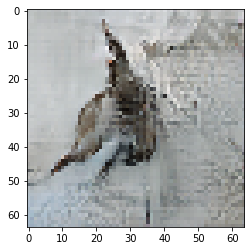

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Starting checkpoint 39

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Time for epoch 1 is 0.6889407634735107 sec
Gen loss: 1.94568805945547, Disc loss: 2.071937215955634, Disc valid real loss: 0.3673245326468819, Disc valid fake loss: 0.3970196262786263, Disc class real loss: 0.6543260467679877, Disc class fake loss: 0.06469050343883664
Time for epoch 2 is 0.6983954906463623 sec
Gen loss: 1.9105237785138582, Disc loss: 2.0527840288061845, Disc valid real loss: 0.36476140116390426, Disc valid fake loss: 0.40321023370090286, Disc class real loss: 0.6438667209524858, Disc class fake loss: 0.0891151273329007
Time for epoch 3 is 0.6972963809967041 sec
Gen loss: 1.8589953309611271, Disc loss: 2.206529918469881, Disc valid real loss: 0.39066894744571884, Disc valid fake loss: 0.41693676772870514, Disc class real loss: 0.7022112702068529, Disc class fake loss: 0.08542946333947934
Time for epoch 4 is 0.6980488300323486 sec
Gen loss: 1.8701043003483

Time for epoch 31 is 0.6922922134399414 sec
Gen loss: 1.8408943038237722, Disc loss: 2.032105885053936, Disc valid real loss: 0.3999135478546745, Disc valid fake loss: 0.40054456340639216, Disc class real loss: 0.6426123066952354, Disc class fake loss: 0.15417299302000748
Time for epoch 32 is 0.6974530220031738 sec
Gen loss: 1.819997329460947, Disc loss: 2.0655151982056466, Disc valid real loss: 0.3963353524082585, Disc valid fake loss: 0.4044435526195325, Disc class real loss: 0.6623132887639498, Disc class fake loss: 0.13369873871928767
Time for epoch 33 is 0.6955246925354004 sec
Gen loss: 1.8945423490122746, Disc loss: 2.035262296074315, Disc valid real loss: 0.3859117972223382, Disc valid fake loss: 0.39404479845574025, Disc class real loss: 0.6587084625896654, Disc class fake loss: 0.12731227200282247
Time for epoch 34 is 0.6949653625488281 sec
Gen loss: 1.927083925196999, Disc loss: 2.038527388321726, Disc valid real loss: 0.41258754228290756, Disc valid fake loss: 0.378551465900

Time for epoch 62 is 0.6939578056335449 sec
Gen loss: 1.8783946162775944, Disc loss: 1.9496834591815346, Disc valid real loss: 0.391963887371515, Disc valid fake loss: 0.3845467936051519, Disc class real loss: 0.6384762196164382, Disc class fake loss: 0.16944559349825508
Time for epoch 63 is 0.697589635848999 sec
Gen loss: 1.8651027742185091, Disc loss: 1.9410284569388943, Disc valid real loss: 0.3968423887303001, Disc valid fake loss: 0.38920268102696065, Disc class real loss: 0.6303470448443764, Disc class fake loss: 0.16043138935377724
Time for epoch 64 is 0.6959679126739502 sec
Gen loss: 1.9537612262525057, Disc loss: 1.9616800107453998, Disc valid real loss: 0.39286662559760244, Disc valid fake loss: 0.3754980815084357, Disc class real loss: 0.6543278349073309, Disc class fake loss: 0.14938575225441078
Time for epoch 65 is 0.6954951286315918 sec
Gen loss: 1.9204380386754085, Disc loss: 1.9423259120238454, Disc valid real loss: 0.3823383497564416, Disc valid fake loss: 0.4004241745

Time for epoch 93 is 0.6975369453430176 sec
Gen loss: 1.9271261880272312, Disc loss: 1.926768980528179, Disc valid real loss: 0.39126025375566986, Disc valid fake loss: 0.39857502516947296, Disc class real loss: 0.6491188861821827, Disc class fake loss: 0.16456497617458044
Time for epoch 94 is 0.6986546516418457 sec
Gen loss: 2.0024978361631693, Disc loss: 1.9389024910173918, Disc valid real loss: 0.386504822655728, Disc valid fake loss: 0.4017825856020576, Disc class real loss: 0.66292226941962, Disc class fake loss: 0.14219697133490913
Time for epoch 95 is 0.6999466419219971 sec
Gen loss: 1.7932563267256085, Disc loss: 1.9323544314033108, Disc valid real loss: 0.40284941698375504, Disc valid fake loss: 0.39621483652215256, Disc class real loss: 0.6513578766270688, Disc class fake loss: 0.15320946629110135
Time for epoch 96 is 0.6892385482788086 sec
Gen loss: 1.9083233444314254, Disc loss: 1.926243637737475, Disc valid real loss: 0.38688463443203974, Disc valid fake loss: 0.3893590177

Time for epoch 123 is 0.6968681812286377 sec
Gen loss: 1.9507474083649485, Disc loss: 1.887498792849089, Disc valid real loss: 0.3961203082611686, Disc valid fake loss: 0.40515335296329696, Disc class real loss: 0.6579034704911081, Disc class fake loss: 0.13720074570492694
Time for epoch 124 is 0.6910321712493896 sec
Gen loss: 1.9347121339095266, Disc loss: 1.8963101035670231, Disc valid real loss: 0.41131688183859777, Disc valid fake loss: 0.3866758550468244, Disc class real loss: 0.6558893542540701, Disc class fake loss: 0.17555349947590576
Time for epoch 125 is 0.6960523128509521 sec
Gen loss: 2.0789766750837626, Disc loss: 1.8480993760259528, Disc valid real loss: 0.3679408101659072, Disc valid fake loss: 0.3890688513454638, Disc class real loss: 0.6575289776450709, Disc class fake loss: 0.1577291018084476
Time for epoch 126 is 0.6998481750488281 sec
Gen loss: 2.0021463318874964, Disc loss: 1.8681366506375765, Disc valid real loss: 0.39012314143933746, Disc valid fake loss: 0.38275

Time for epoch 153 is 0.6975259780883789 sec
Gen loss: 1.9480472865857577, Disc loss: 1.8160185562936884, Disc valid real loss: 0.3785036629752109, Disc valid fake loss: 0.4162477694059673, Disc class real loss: 0.6595282962447718, Disc class fake loss: 0.11699901874128141
Time for epoch 154 is 0.6981432437896729 sec
Gen loss: 1.9509265485562777, Disc loss: 1.8017130211779946, Disc valid real loss: 0.39046919032147054, Disc valid fake loss: 0.3813366662514837, Disc class real loss: 0.6670221811846683, Disc class fake loss: 0.11647486490638632
Time for epoch 155 is 0.6945900917053223 sec
Gen loss: 1.928374968077007, Disc loss: 1.8407979513469495, Disc valid real loss: 0.38794966434177597, Disc valid fake loss: 0.4111643213974802, Disc class real loss: 0.6712198602525812, Disc class fake loss: 0.13041922352031657
Time for epoch 156 is 0.6961500644683838 sec
Gen loss: 1.9709464060632806, Disc loss: 1.809796835246839, Disc valid real loss: 0.3915365761832187, Disc valid fake loss: 0.390991

Time for epoch 183 is 0.7126669883728027 sec
Gen loss: 1.9344797322624607, Disc loss: 1.775658080452367, Disc valid real loss: 0.4076228612347653, Disc valid fake loss: 0.38590291926735326, Disc class real loss: 0.6706391494525107, Disc class fake loss: 0.12388378518976663
Time for epoch 184 is 0.7134673595428467 sec
Gen loss: 2.022452235221863, Disc loss: 1.717429663005628, Disc valid real loss: 0.3969597926265315, Disc valid fake loss: 0.3736518260679747, Disc class real loss: 0.6566020940479479, Disc class fake loss: 0.10190866338579278
Time for epoch 185 is 0.7006120681762695 sec
Gen loss: 1.984422012379295, Disc loss: 1.751396147828353, Disc valid real loss: 0.4088153086210552, Disc valid fake loss: 0.37221428751945496, Disc class real loss: 0.6644368265804491, Disc class fake loss: 0.1245825522040066
Time for epoch 186 is 0.7014329433441162 sec
Gen loss: 2.0011918732994483, Disc loss: 1.7370027115470486, Disc valid real loss: 0.39450255036354065, Disc valid fake loss: 0.395718544

Time for epoch 213 is 0.6951162815093994 sec
Gen loss: 2.027906524507623, Disc loss: 1.635515338496158, Disc valid real loss: 0.38970732061486496, Disc valid fake loss: 0.3920184358170158, Disc class real loss: 0.636887722893765, Disc class fake loss: 0.0878392793238163
Time for epoch 214 is 0.6985540390014648 sec
Gen loss: 1.922157739338122, Disc loss: 1.6589023564991199, Disc valid real loss: 0.3825118431919499, Disc valid fake loss: 0.40121036454250936, Disc class real loss: 0.6544472010512101, Disc class fake loss: 0.09012070729544289
Time for epoch 215 is 0.6992266178131104 sec
Gen loss: 2.035738386605915, Disc loss: 1.6764192455693294, Disc valid real loss: 0.39442896137112066, Disc valid fake loss: 0.3766940032180987, Disc class real loss: 0.6695782855937356, Disc class fake loss: 0.10759535863211281
Time for epoch 216 is 0.6949677467346191 sec
Gen loss: 1.868149387209039, Disc loss: 1.6824491651434648, Disc valid real loss: 0.42382266803791646, Disc valid fake loss: 0.400676405

Time for epoch 243 is 0.7004456520080566 sec
Gen loss: 2.106874152233726, Disc loss: 1.6045342621050382, Disc valid real loss: 0.3839926296158841, Disc valid fake loss: 0.37444387611589935, Disc class real loss: 0.6505891178783617, Disc class fake loss: 0.12925828954106883
Time for epoch 244 is 0.7003090381622314 sec
Gen loss: 1.92098353411022, Disc loss: 1.5896831374419362, Disc valid real loss: 0.3967768079356143, Disc valid fake loss: 0.373922619380449, Disc class real loss: 0.6599249620186655, Disc class fake loss: 0.08848254480644276
Time for epoch 245 is 0.6976990699768066 sec
Gen loss: 1.946539332992152, Disc loss: 1.5776969068928768, Disc valid real loss: 0.3927210177245893, Disc valid fake loss: 0.38360744244173955, Disc class real loss: 0.6395150423049927, Disc class fake loss: 0.09680957719683647
Time for epoch 246 is 0.6978495121002197 sec
Gen loss: 2.0375796995664897, Disc loss: 1.5878466493205021, Disc valid real loss: 0.3966685110016873, Disc valid fake loss: 0.387748489

Time for epoch 273 is 0.6931126117706299 sec
Gen loss: 1.9437532738635415, Disc loss: 1.5502683928138332, Disc valid real loss: 0.3935348673870689, Disc valid fake loss: 0.3774464930358686, Disc class real loss: 0.6817107294735155, Disc class fake loss: 0.0862022508916102
Time for epoch 274 is 0.6941182613372803 sec
Gen loss: 2.024037198016518, Disc loss: 1.5538230632480823, Disc valid real loss: 0.393101587107307, Disc valid fake loss: 0.3817911446094513, Disc class real loss: 0.6529373652056644, Disc class fake loss: 0.11769202626065205
Time for epoch 275 is 0.6950092315673828 sec
Gen loss: 1.9735930656131946, Disc loss: 1.5013557609758879, Disc valid real loss: 0.39967860987311915, Disc valid fake loss: 0.36407750844955444, Disc class real loss: 0.6337839396376359, Disc class fake loss: 0.09743757349880118
Time for epoch 276 is 0.6952438354492188 sec
Gen loss: 1.9937055863832172, Disc loss: 1.5325318072971545, Disc valid real loss: 0.38403201181637614, Disc valid fake loss: 0.398324

Time for epoch 303 is 0.6976308822631836 sec
Gen loss: 2.003870079391881, Disc loss: 1.4794247275904606, Disc valid real loss: 0.3871106897529803, Disc valid fake loss: 0.38302457489465414, Disc class real loss: 0.6464015496404547, Disc class fake loss: 0.06300461419710987
Time for epoch 304 is 0.6968996524810791 sec
Gen loss: 1.9955908750232898, Disc loss: 1.5514304575167204, Disc valid real loss: 0.3906483038475639, Disc valid fake loss: 0.4007710359598461, Disc class real loss: 0.6657004356384277, Disc class fake loss: 0.0944249514294298
Time for epoch 305 is 0.7042679786682129 sec
Gen loss: 1.986183906856336, Disc loss: 1.5487294322565983, Disc valid real loss: 0.3822754841101797, Disc valid fake loss: 0.4042409156498156, Disc class real loss: 0.6872900567556682, Disc class fake loss: 0.07504542250382273
Time for epoch 306 is 0.6977150440216064 sec
Gen loss: 1.9847393977014642, Disc loss: 1.4877941106495105, Disc valid real loss: 0.3617146940607774, Disc valid fake loss: 0.37658811

Time for epoch 333 is 0.6971793174743652 sec
Gen loss: 2.0064948546259025, Disc loss: 1.4824599592309249, Disc valid real loss: 0.38492421884285777, Disc valid fake loss: 0.3827604400484185, Disc class real loss: 0.6494401536489788, Disc class fake loss: 0.06545200198888779
Time for epoch 334 is 0.7002239227294922 sec
Gen loss: 2.0574475275842765, Disc loss: 1.4802013070959794, Disc valid real loss: 0.3746813363150546, Disc valid fake loss: 0.3717893448315169, Disc class real loss: 0.6559772209117287, Disc class fake loss: 0.07786902883335163
Time for epoch 335 is 0.698646068572998 sec
Gen loss: 1.8720854207089073, Disc loss: 1.5529886986079968, Disc valid real loss: 0.39718526680218547, Disc valid fake loss: 0.3864833445925462, Disc class real loss: 0.6904895744825664, Disc class fake loss: 0.07895283508849771
Time for epoch 336 is 0.6970067024230957 sec
Gen loss: 1.9595142226470144, Disc loss: 1.4878738930350857, Disc valid real loss: 0.39533578957382004, Disc valid fake loss: 0.3835

Time for epoch 363 is 0.7006015777587891 sec
Gen loss: 2.007758749158759, Disc loss: 1.5162407536255686, Disc valid real loss: 0.39170841794264943, Disc valid fake loss: 0.38766917115763616, Disc class real loss: 0.680764659454948, Disc class fake loss: 0.056223463267087936
Time for epoch 364 is 0.6965963840484619 sec
Gen loss: 1.8999725768440647, Disc loss: 1.551213402497141, Disc valid real loss: 0.3854969112496627, Disc valid fake loss: 0.419821172952652, Disc class real loss: 0.6729086417900888, Disc class fake loss: 0.07310667114430353
Time for epoch 365 is 0.697514533996582 sec
Gen loss: 1.8382645531704551, Disc loss: 1.5705617666244507, Disc valid real loss: 0.4063111763251455, Disc valid fake loss: 0.37548318975850153, Disc class real loss: 0.6959581626088995, Disc class fake loss: 0.09292987616438615
Time for epoch 366 is 0.7001082897186279 sec
Gen loss: 2.006375463385331, Disc loss: 1.5304708731801886, Disc valid real loss: 0.4044794753978127, Disc valid fake loss: 0.35203777

Time for epoch 393 is 0.6963274478912354 sec
Gen loss: 1.958750555389806, Disc loss: 1.5612214552728754, Disc valid real loss: 0.3937717393824929, Disc valid fake loss: 0.3786767925086774, Disc class real loss: 0.7120668072449533, Disc class fake loss: 0.07683318853378296
Time for epoch 394 is 0.6975719928741455 sec
Gen loss: 2.0013779840971293, Disc loss: 1.5154439712825574, Disc valid real loss: 0.375399848348216, Disc valid fake loss: 0.39251602637140376, Disc class real loss: 0.6752798870990151, Disc class fake loss: 0.07236882436432336
Time for epoch 395 is 0.6965391635894775 sec
Gen loss: 1.9255801439285278, Disc loss: 1.5052226279911243, Disc valid real loss: 0.3846762062687623, Disc valid fake loss: 0.38652664893551875, Disc class real loss: 0.6525692092744928, Disc class fake loss: 0.08156476326678928
Time for epoch 396 is 0.6997501850128174 sec
Gen loss: 1.9191877904691195, Disc loss: 1.5516731676302458, Disc valid real loss: 0.39859557151794434, Disc valid fake loss: 0.38862

Time for epoch 423 is 0.6940391063690186 sec
Gen loss: 2.0013099469636617, Disc loss: 1.5525270825938176, Disc valid real loss: 0.38790603060471385, Disc valid fake loss: 0.39255565169610473, Disc class real loss: 0.686307922789925, Disc class fake loss: 0.08587758017605857
Time for epoch 424 is 0.6976780891418457 sec
Gen loss: 1.922170457087065, Disc loss: 1.5288245677947998, Disc valid real loss: 0.38670660163226883, Disc valid fake loss: 0.40596050965158564, Disc class real loss: 0.6731833533236855, Disc class fake loss: 0.06309615359886696
Time for epoch 425 is 0.6984267234802246 sec
Gen loss: 1.8734935773046393, Disc loss: 1.5617101129732633, Disc valid real loss: 0.40519446918838903, Disc valid fake loss: 0.3876457198670036, Disc class real loss: 0.6746915202391776, Disc class fake loss: 0.09429449901769035
Time for epoch 426 is 0.6949245929718018 sec
Gen loss: 2.0686697771674707, Disc loss: 1.559077865199039, Disc valid real loss: 0.3981172301267323, Disc valid fake loss: 0.3711

Time for epoch 453 is 0.6991982460021973 sec
Gen loss: 1.9183056040814048, Disc loss: 1.5080377302671735, Disc valid real loss: 0.39930196498569687, Disc valid fake loss: 0.38044859390509755, Disc class real loss: 0.6626742795894021, Disc class fake loss: 0.06573231606499146
Time for epoch 454 is 0.69565749168396 sec
Gen loss: 1.978224704140111, Disc loss: 1.5155512282722874, Disc valid real loss: 0.3962129903467078, Disc valid fake loss: 0.3891495183894509, Disc class real loss: 0.665164944372679, Disc class fake loss: 0.0651438107812091
Time for epoch 455 is 0.6990301609039307 sec
Gen loss: 1.9555571581188, Disc loss: 1.5580804787184064, Disc valid real loss: 0.41300785384680094, Disc valid fake loss: 0.40274497709776225, Disc class real loss: 0.6645030567520543, Disc class fake loss: 0.07794193541140933
Time for epoch 456 is 0.6999752521514893 sec
Gen loss: 1.9928619924344515, Disc loss: 1.5342980435020046, Disc valid real loss: 0.3833705547608827, Disc valid fake loss: 0.4008022656

Time for epoch 483 is 0.6930065155029297 sec
Gen loss: 1.9633683154457493, Disc loss: 1.5999447107315063, Disc valid real loss: 0.40465954102967916, Disc valid fake loss: 0.40798407949899373, Disc class real loss: 0.6946074335198653, Disc class fake loss: 0.09281405884968608
Time for epoch 484 is 0.6894800662994385 sec
Gen loss: 1.9164418797743947, Disc loss: 1.4711183058588129, Disc valid real loss: 0.3710998579075462, Disc valid fake loss: 0.3826470861309453, Disc class real loss: 0.6565017417857522, Disc class fake loss: 0.06098872609436512
Time for epoch 485 is 0.6914246082305908 sec
Gen loss: 2.003624345126905, Disc loss: 1.5283003794519525, Disc valid real loss: 0.3927605261928157, Disc valid fake loss: 0.3984515800287849, Disc class real loss: 0.6664808392524719, Disc class fake loss: 0.07072661130836136
Time for epoch 486 is 0.6917738914489746 sec
Gen loss: 1.884678884556419, Disc loss: 1.5297753810882568, Disc valid real loss: 0.4034934985010247, Disc valid fake loss: 0.403269

Time for epoch 513 is 0.698697566986084 sec
Gen loss: 1.8955734466251575, Disc loss: 1.565571521457873, Disc valid real loss: 0.37624950001114293, Disc valid fake loss: 0.38518350689034714, Disc class real loss: 0.6982726768443459, Disc class fake loss: 0.10598432802056011
Time for epoch 514 is 0.6968860626220703 sec
Gen loss: 2.0095632264488623, Disc loss: 1.5892105541731183, Disc valid real loss: 0.40402005534423024, Disc valid fake loss: 0.39043629953735753, Disc class real loss: 0.7073224688831129, Disc class fake loss: 0.08755569356052499
Time for epoch 515 is 0.6993656158447266 sec
Gen loss: 1.9415477639750431, Disc loss: 1.4785660881745188, Disc valid real loss: 0.3911863879153603, Disc valid fake loss: 0.36435123258515406, Disc class real loss: 0.6391791952283759, Disc class fake loss: 0.08396031040894358
Time for epoch 516 is 0.6972699165344238 sec
Gen loss: 1.9201697675805343, Disc loss: 1.5569192861255847, Disc valid real loss: 0.39370236271306086, Disc valid fake loss: 0.39

Time for epoch 543 is 0.6921732425689697 sec
Gen loss: 1.9426602815326892, Disc loss: 1.5444626306232654, Disc valid real loss: 0.3774603401359759, Disc valid fake loss: 0.4152876381811343, Disc class real loss: 0.6629605450128254, Disc class fake loss: 0.08886896054211416
Time for epoch 544 is 0.6991732120513916 sec
Gen loss: 1.906301498413086, Disc loss: 1.513746606676202, Disc valid real loss: 0.39920180879141154, Disc valid fake loss: 0.37511802033374186, Disc class real loss: 0.6773715678014254, Disc class fake loss: 0.06217826834242595
Time for epoch 545 is 0.699120044708252 sec
Gen loss: 2.0037182004828202, Disc loss: 1.5464423204723157, Disc valid real loss: 0.42110368609428406, Disc valid fake loss: 0.3768486866825505, Disc class real loss: 0.680835956021359, Disc class fake loss: 0.06777664019088996
Time for epoch 546 is 0.6961228847503662 sec
Gen loss: 1.9672785432715165, Disc loss: 1.5139812858481156, Disc valid real loss: 0.392528194345926, Disc valid fake loss: 0.35573647

Time for epoch 573 is 0.6934490203857422 sec
Gen loss: 2.0700030954260575, Disc loss: 1.5619051017259296, Disc valid real loss: 0.3829728725709413, Disc valid fake loss: 0.3946935612904398, Disc class real loss: 0.694429940298984, Disc class fake loss: 0.08992965421394299
Time for epoch 574 is 0.6910011768341064 sec
Gen loss: 1.941558417521025, Disc loss: 1.5660497075633, Disc valid real loss: 0.39506324968839945, Disc valid fake loss: 0.410187776935728, Disc class real loss: 0.6792709733310499, Disc class fake loss: 0.08164725697746403
Time for epoch 575 is 0.6944477558135986 sec
Gen loss: 2.0104462912208154, Disc loss: 1.569929380165903, Disc valid real loss: 0.4136306565058859, Disc valid fake loss: 0.37383219913432475, Disc class real loss: 0.6993830611831263, Disc class fake loss: 0.08320670751364607
Time for epoch 576 is 0.6984157562255859 sec
Gen loss: 1.9384384029789974, Disc loss: 1.5413561431985152, Disc valid real loss: 0.4027008492695658, Disc valid fake loss: 0.37818194847

Time for epoch 603 is 0.6965222358703613 sec
Gen loss: 1.8732265422218723, Disc loss: 1.534759703435396, Disc valid real loss: 0.41253568310486644, Disc valid fake loss: 0.3762584728629966, Disc class real loss: 0.6744864457531979, Disc class fake loss: 0.07159969034163575
Time for epoch 604 is 0.7003464698791504 sec
Gen loss: 2.0045291561829415, Disc loss: 1.562380037809673, Disc valid real loss: 0.3816689080313632, Disc valid fake loss: 0.42139645312961777, Disc class real loss: 0.6829299518936559, Disc class fake loss: 0.07650605804826084
Time for epoch 605 is 0.6992580890655518 sec
Gen loss: 1.9136672459150617, Disc loss: 1.5121057974664789, Disc valid real loss: 0.378671206141773, Disc valid fake loss: 0.3916261290249072, Disc class real loss: 0.6700742307462191, Disc class fake loss: 0.07185389238752816
Time for epoch 606 is 0.6949057579040527 sec
Gen loss: 1.9836059996956272, Disc loss: 1.5533288027110852, Disc valid real loss: 0.3969663993308419, Disc valid fake loss: 0.3857131

Time for epoch 633 is 0.6985020637512207 sec
Gen loss: 1.8971134737918252, Disc loss: 1.5231602442891974, Disc valid real loss: 0.37479880452156067, Disc valid fake loss: 0.3964477871593676, Disc class real loss: 0.6811085845294752, Disc class fake loss: 0.0709271153533145
Time for epoch 634 is 0.6995115280151367 sec
Gen loss: 1.967219967591135, Disc loss: 1.508211286444413, Disc valid real loss: 0.3891799104841132, Disc valid fake loss: 0.39380798841777603, Disc class real loss: 0.6432022060218611, Disc class fake loss: 0.08213342177240472
Time for epoch 635 is 0.6955723762512207 sec
Gen loss: 2.008311861439755, Disc loss: 1.505192806846217, Disc valid real loss: 0.38198373270662206, Disc valid fake loss: 0.38166168332099915, Disc class real loss: 0.6549183349860342, Disc class fake loss: 0.0867427242429633
Time for epoch 636 is 0.6967241764068604 sec
Gen loss: 1.9314087378351312, Disc loss: 1.4920500893341868, Disc valid real loss: 0.3711636991877305, Disc valid fake loss: 0.37488140

Time for epoch 663 is 0.6973624229431152 sec
Gen loss: 1.9395634939796047, Disc loss: 1.4887950420379639, Disc valid real loss: 0.38700393940273087, Disc valid fake loss: 0.3907814567026339, Disc class real loss: 0.6567277375020479, Disc class fake loss: 0.0544023836325658
Time for epoch 664 is 0.6945242881774902 sec
Gen loss: 2.0008902863452307, Disc loss: 1.548141730459113, Disc valid real loss: 0.3792480873434167, Disc valid fake loss: 0.3941836874735983, Disc class real loss: 0.6950965743315848, Disc class fake loss: 0.07973648803798776
Time for epoch 665 is 0.6982991695404053 sec
Gen loss: 2.0075936129218652, Disc loss: 1.5240713357925415, Disc valid real loss: 0.3958932255443774, Disc valid fake loss: 0.3876105492052279, Disc class real loss: 0.6742649360706932, Disc class fake loss: 0.06642422011416209
Time for epoch 666 is 0.6980361938476562 sec
Gen loss: 1.9617744746961092, Disc loss: 1.543785572052002, Disc valid real loss: 0.4036189960805993, Disc valid fake loss: 0.39493455

Time for epoch 693 is 0.6983745098114014 sec
Gen loss: 1.9199195598301135, Disc loss: 1.5946650191357261, Disc valid real loss: 0.4148986088602166, Disc valid fake loss: 0.4272879769927577, Disc class real loss: 0.6858883907920436, Disc class fake loss: 0.06671391525550892
Time for epoch 694 is 0.697166919708252 sec
Gen loss: 1.9135277334012484, Disc loss: 1.5269198605888767, Disc valid real loss: 0.4019926723680998, Disc valid fake loss: 0.3791649749404506, Disc class real loss: 0.6662324478751734, Disc class fake loss: 0.07964710744195863
Time for epoch 695 is 0.6991672515869141 sec
Gen loss: 1.945401712467796, Disc loss: 1.5860427743510197, Disc valid real loss: 0.4040884438313936, Disc valid fake loss: 0.3996091532079797, Disc class real loss: 0.702249715202733, Disc class fake loss: 0.08021987729558819
Time for epoch 696 is 0.6978480815887451 sec
Gen loss: 1.948138770304228, Disc loss: 1.562697366664284, Disc valid real loss: 0.3957705529112565, Disc valid fake loss: 0.38605462406

Time for epoch 723 is 0.6999435424804688 sec
Gen loss: 1.9605784478940462, Disc loss: 1.5254499096619456, Disc valid real loss: 0.3903064068995024, Disc valid fake loss: 0.39590119844988775, Disc class real loss: 0.6778066095552946, Disc class fake loss: 0.061558963632897326
Time for epoch 724 is 0.6983613967895508 sec
Gen loss: 1.9203763698276721, Disc loss: 1.51788424190722, Disc valid real loss: 0.3791869251351607, Disc valid fake loss: 0.39701199217846517, Disc class real loss: 0.6676988193863317, Disc class fake loss: 0.07410522717002191
Time for epoch 725 is 0.6971170902252197 sec
Gen loss: 1.8984442196394269, Disc loss: 1.5283687616649426, Disc valid real loss: 0.3901227540091464, Disc valid fake loss: 0.3911274185306148, Disc class real loss: 0.6843947172164917, Disc class fake loss: 0.06284820013924648
Time for epoch 726 is 0.6982438564300537 sec
Gen loss: 1.9865555135827315, Disc loss: 1.5374955817272788, Disc valid real loss: 0.4057972964487578, Disc valid fake loss: 0.39249

Time for epoch 753 is 0.6897776126861572 sec
Gen loss: 1.9123334947385286, Disc loss: 1.5566667130118923, Disc valid real loss: 0.39738922605389043, Disc valid fake loss: 0.38700471426311295, Disc class real loss: 0.7002636445196051, Disc class fake loss: 0.07213475908103742
Time for epoch 754 is 0.6947405338287354 sec
Gen loss: 1.9873301982879639, Disc loss: 1.516200768320184, Disc valid real loss: 0.3917636353718607, Disc valid fake loss: 0.39979562320207296, Disc class real loss: 0.6512972712516785, Disc class fake loss: 0.0734598291547675
Time for epoch 755 is 0.7001924514770508 sec
Gen loss: 2.0580443143844604, Disc loss: 1.4991907759716636, Disc valid real loss: 0.38438664141454193, Disc valid fake loss: 0.3664922949514891, Disc class real loss: 0.6762837485263222, Disc class fake loss: 0.07214891812519024
Time for epoch 756 is 0.6947493553161621 sec
Gen loss: 1.9484406772412752, Disc loss: 1.4958763875459369, Disc valid real loss: 0.39523208141326904, Disc valid fake loss: 0.398

Time for epoch 783 is 0.6991372108459473 sec
Gen loss: 1.916532328254298, Disc loss: 1.5303963485517, Disc valid real loss: 0.3982276085175966, Disc valid fake loss: 0.39014155927457306, Disc class real loss: 0.6789398381584569, Disc class fake loss: 0.06321053089279878
Time for epoch 784 is 0.6931853294372559 sec
Gen loss: 1.9438881999567936, Disc loss: 1.550660905085112, Disc valid real loss: 0.39679680999956635, Disc valid fake loss: 0.39370235487034444, Disc class real loss: 0.6902529409057215, Disc class fake loss: 0.07003286304442506
Time for epoch 785 is 0.6974081993103027 sec
Gen loss: 1.9248219602986385, Disc loss: 1.5123639044008756, Disc valid real loss: 0.3828519127870861, Disc valid fake loss: 0.4052621957502867, Disc class real loss: 0.6557205507629796, Disc class fake loss: 0.06864666664286663
Time for epoch 786 is 0.6971778869628906 sec
Gen loss: 2.009028340640821, Disc loss: 1.522969741570322, Disc valid real loss: 0.3992014229297638, Disc valid fake loss: 0.3852209088

Time for epoch 813 is 0.6997084617614746 sec
Gen loss: 1.999012959630866, Disc loss: 1.5158434039668034, Disc valid real loss: 0.38341563704766723, Disc valid fake loss: 0.39725242790422943, Disc class real loss: 0.6681529377636156, Disc class fake loss: 0.06714263342713055
Time for epoch 814 is 0.6962933540344238 sec
Gen loss: 1.9236705491417332, Disc loss: 1.5070702966890837, Disc valid real loss: 0.388060063123703, Disc valid fake loss: 0.37846042921668605, Disc class real loss: 0.6816397058336359, Disc class fake loss: 0.05903462457813715
Time for epoch 815 is 0.6948413848876953 sec
Gen loss: 2.005098010364332, Disc loss: 1.4975002125689858, Disc valid real loss: 0.37857171579411153, Disc valid fake loss: 0.3739771529247886, Disc class real loss: 0.6881571286603024, Disc class fake loss: 0.0569204798850574
Time for epoch 816 is 0.6952424049377441 sec
Gen loss: 2.003093625369825, Disc loss: 1.53319073350806, Disc valid real loss: 0.3957067539817409, Disc valid fake loss: 0.405873422

Time for epoch 843 is 0.6961910724639893 sec
Gen loss: 1.8986881092975014, Disc loss: 1.5515304301914417, Disc valid real loss: 0.39622285491541814, Disc valid fake loss: 0.3928330399488148, Disc class real loss: 0.6767959547670264, Disc class fake loss: 0.08579681666665956
Time for epoch 844 is 0.6974368095397949 sec
Gen loss: 2.0382181280537655, Disc loss: 1.5322536355570744, Disc valid real loss: 0.4028827312745546, Disc valid fake loss: 0.38532304606939616, Disc class real loss: 0.6700747169946369, Disc class fake loss: 0.07409237285977915
Time for epoch 845 is 0.6960289478302002 sec
Gen loss: 1.9133042912734182, Disc loss: 1.5083910038596706, Disc valid real loss: 0.37394531463321884, Disc valid fake loss: 0.39322468952128764, Disc class real loss: 0.6653764467490347, Disc class fake loss: 0.07596246358987532
Time for epoch 846 is 0.6967964172363281 sec
Gen loss: 1.935776999122218, Disc loss: 1.5156543317594027, Disc valid real loss: 0.3786069115525798, Disc valid fake loss: 0.405

Time for epoch 873 is 0.7002377510070801 sec
Gen loss: 1.8712115287780762, Disc loss: 1.547262756448043, Disc valid real loss: 0.40324676036834717, Disc valid fake loss: 0.40096980490182577, Disc class real loss: 0.6574153398212633, Disc class fake loss: 0.0857452129651057
Time for epoch 874 is 0.6999661922454834 sec
Gen loss: 1.9495738180060136, Disc loss: 1.5404275718488192, Disc valid real loss: 0.3992358995111365, Disc valid fake loss: 0.3695088593583358, Disc class real loss: 0.6930519844356337, Disc class fake loss: 0.07875371998862217
Time for epoch 875 is 0.6973083019256592 sec
Gen loss: 1.9338184155915912, Disc loss: 1.5228846198634098, Disc valid real loss: 0.3741431644088344, Disc valid fake loss: 0.39881431977999837, Disc class real loss: 0.679419690056851, Disc class fake loss: 0.07062923241602748
Time for epoch 876 is 0.6963322162628174 sec
Gen loss: 2.017985356481452, Disc loss: 1.529205134040431, Disc valid real loss: 0.37819236673806844, Disc valid fake loss: 0.3831074

Time for epoch 903 is 0.6965644359588623 sec
Gen loss: 1.9099511033610295, Disc loss: 1.5793890388388383, Disc valid real loss: 0.4100819308506815, Disc valid fake loss: 0.41401904664541544, Disc class real loss: 0.6780503768669931, Disc class fake loss: 0.0773578521452452
Time for epoch 904 is 0.6926517486572266 sec
Gen loss: 1.8581336109261763, Disc loss: 1.5250949545910484, Disc valid real loss: 0.40082947674550506, Disc valid fake loss: 0.40042675953162343, Disc class real loss: 0.6412398846525895, Disc class fake loss: 0.08271055178422677
Time for epoch 905 is 0.6966757774353027 sec
Gen loss: 1.9452123077292192, Disc loss: 1.5264647446180646, Disc valid real loss: 0.391947771373548, Disc valid fake loss: 0.393645504587575, Disc class real loss: 0.6735017236910368, Disc class fake loss: 0.06749094885430838
Time for epoch 906 is 0.6993741989135742 sec
Gen loss: 2.024117902705544, Disc loss: 1.4999860023197376, Disc valid real loss: 0.39426634029338237, Disc valid fake loss: 0.388350

Time for epoch 933 is 0.6970231533050537 sec
Gen loss: 1.9261674818239714, Disc loss: 1.5787620732658787, Disc valid real loss: 0.4116792114157426, Disc valid fake loss: 0.38662418566252055, Disc class real loss: 0.6803452309809233, Disc class fake loss: 0.10022948035284092
Time for epoch 934 is 0.6976110935211182 sec
Gen loss: 1.9718492282064337, Disc loss: 1.5456336987646002, Disc valid real loss: 0.4068877642091952, Disc valid fake loss: 0.3638471129693483, Disc class real loss: 0.6865745720110441, Disc class fake loss: 0.08844390501709361
Time for epoch 935 is 0.6972939968109131 sec
Gen loss: 1.8404618062471088, Disc loss: 1.5506744572990818, Disc valid real loss: 0.38653277723412766, Disc valid fake loss: 0.39348109458622177, Disc class real loss: 0.6972489607961554, Disc class fake loss: 0.07353639465413596
Time for epoch 936 is 0.6951453685760498 sec
Gen loss: 2.037738931806464, Disc loss: 1.4906423970272666, Disc valid real loss: 0.36734329869872645, Disc valid fake loss: 0.398

Time for epoch 963 is 0.693427324295044 sec
Gen loss: 1.9462037964871055, Disc loss: 1.5153009264092696, Disc valid real loss: 0.40875080384706197, Disc valid fake loss: 0.38524110693680613, Disc class real loss: 0.6461996185152155, Disc class fake loss: 0.07522359098258771
Time for epoch 964 is 0.6930758953094482 sec
Gen loss: 1.869607310546072, Disc loss: 1.5811848828667088, Disc valid real loss: 0.3955922675760169, Disc valid fake loss: 0.3978649738587831, Disc class real loss: 0.688390010281613, Disc class fake loss: 0.09945544914195412
Time for epoch 965 is 0.6988060474395752 sec
Gen loss: 1.8909605678759123, Disc loss: 1.5311588425385325, Disc valid real loss: 0.37694533404551056, Disc valid fake loss: 0.39926626023493317, Disc class real loss: 0.6747485901180067, Disc class fake loss: 0.08031758391543438
Time for epoch 966 is 0.6984057426452637 sec
Gen loss: 2.002319022228843, Disc loss: 1.5339913744675486, Disc valid real loss: 0.3911864428143752, Disc valid fake loss: 0.384951

Time for epoch 993 is 0.7008054256439209 sec
Gen loss: 2.0073801028101066, Disc loss: 1.5400598739322864, Disc valid real loss: 0.3713391893788388, Disc valid fake loss: 0.3886943530095251, Disc class real loss: 0.7044943382865504, Disc class fake loss: 0.07565777709609584
Time for epoch 994 is 0.6951401233673096 sec
Gen loss: 1.9326559556157965, Disc loss: 1.5524323237569708, Disc valid real loss: 0.39693573744673477, Disc valid fake loss: 0.40025386057401957, Disc class real loss: 0.6780733497519242, Disc class fake loss: 0.07728956365271618
Time for epoch 995 is 0.7087907791137695 sec
Gen loss: 1.9444477432652523, Disc loss: 1.512421727180481, Disc valid real loss: 0.39366664541395086, Disc valid fake loss: 0.37773877852841425, Disc class real loss: 0.6644962963305021, Disc class fake loss: 0.07663759030401707
Time for epoch 996 is 0.6963574886322021 sec
Gen loss: 1.9271727863110995, Disc loss: 1.5838021353671425, Disc valid real loss: 0.39837274896471125, Disc valid fake loss: 0.38

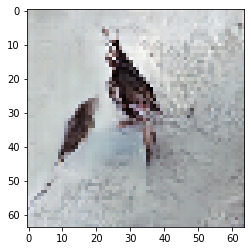

In [90]:
print(label)
next_starting_checkpoint, totalepochs = long_train(starting_checkpoint=next_starting_checkpoint, 
                                      num_checkpoints=40, 
                                      checkpoint_interval=1000, 
                                      g_hist=gen_loss_hist, 
                                      d_hist=disc_loss_hist,
                                      d_real_hist=disc_loss_real_hist,
                                      d_fake_hist=disc_loss_fake_hist,
                                      d_class_real_hist=disc_class_loss_real_hist,
                                      d_class_fake_hist=disc_class_loss_fake_hist,
                                      noise=noise100,
                                      label=label,
                                      save_files=True,
                                      warmup=warmup)

In [155]:
generator.load_weights('./results/weights/bird-gan-conditional-10-samples/gen_weights_conditional_20_samples40000.h5')

['001', '012', '014', '017', '029', '120', '109', '100', '075', '192']


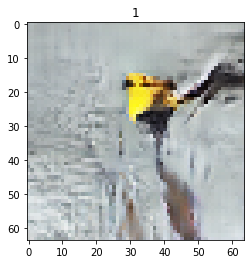

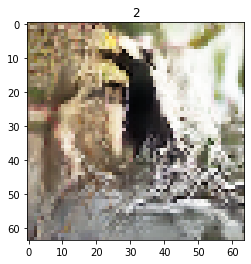

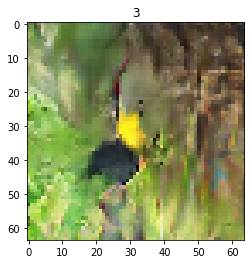

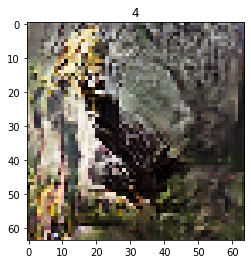

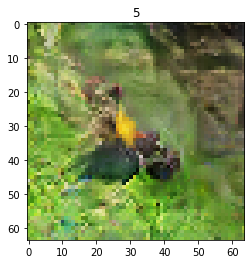

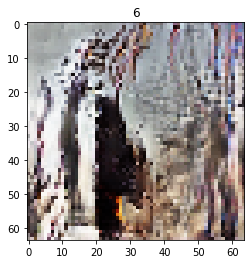

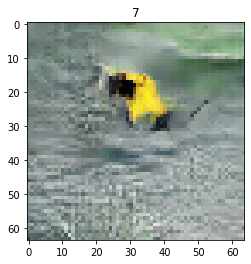

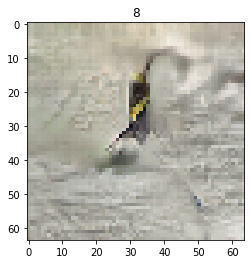

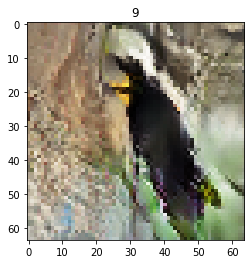

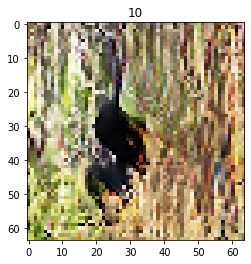

In [156]:

print(['001', '012', '014', '017', '029', '120', '109', '100', '075', '192'])
for label in range(10):
    noise = np.random.normal(0, 1, 100)
    generated_image = generator.predict([np.array([noise]), np.array([0])] )[0]
    plt.imshow(unnormalize_img(generated_image))
    plt.title(label+1)
    plt.show()

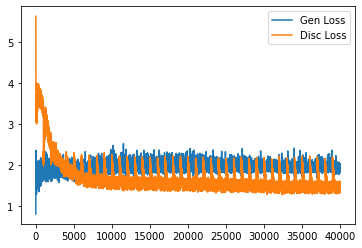

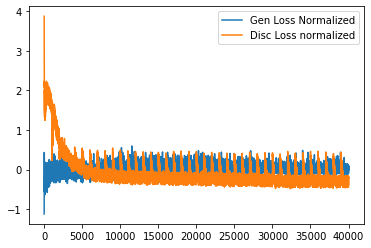

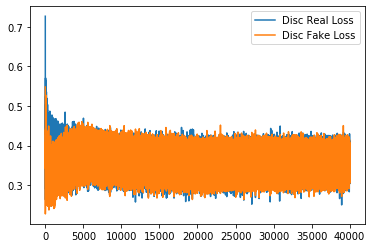

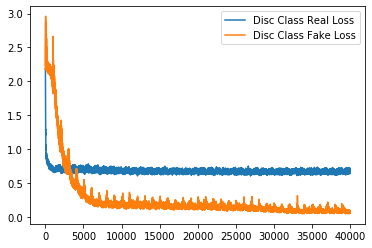

In [94]:
plt.plot(gen_loss_hist)
plt.plot(disc_loss_hist)

plt.legend(['Gen Loss','Disc Loss'])
plt.show()

plt.plot(gen_loss_hist - np.mean(gen_loss_hist))
plt.plot(disc_loss_hist - np.mean(disc_loss_hist))
plt.legend(['Gen Loss Normalized','Disc Loss normalized'])
plt.show()

plt.plot(disc_loss_real_hist)
plt.plot(disc_loss_fake_hist)
plt.legend(['Disc Real Loss','Disc Fake Loss'])
plt.show()

plt.plot(disc_class_loss_real_hist)
plt.plot(disc_class_loss_fake_hist)
plt.legend(['Disc Class Real Loss', 'Disc Class Fake Loss'])
plt.show()


In [ ]:
noise = tf.random.truncated_normal([32, 100])
tf.dtypes.cast(noise, tf.int32)


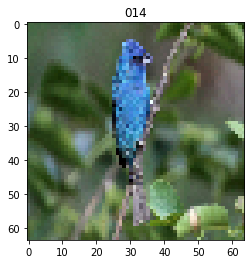

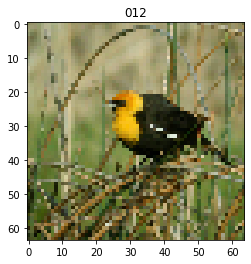

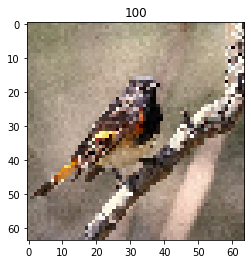

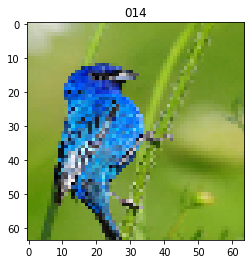

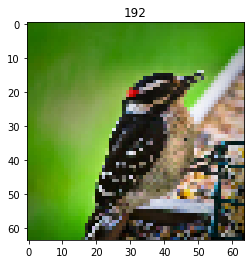

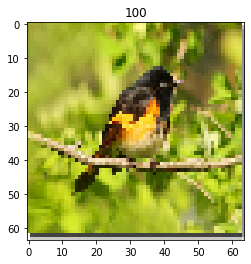

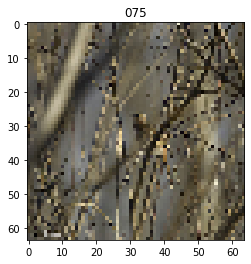

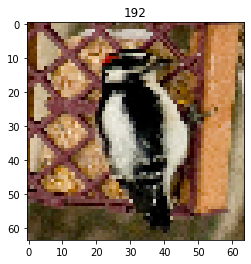

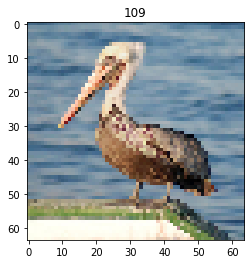

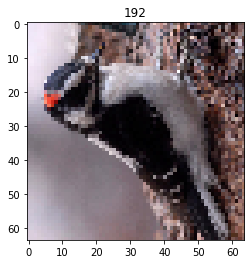

In [125]:
for i in range(20,30):
    plt.imshow(unnormalize_img(train_imgs[i]))
    plt.title(img_classes[int(train_classes[i])])
    plt.show()